# Atividade 8 - Classificador Redes Neurais
# Relief - Sem Normalização¶
# Algoritmo Redes Neurais

Redes NEurais:

● Realizar validação cruzada k=10 para testar Redes Neurais utilizando:
    - todas a características
    - apenas com os componentes principais
    - apenas com as características selecionadas pelo selecionador 1
    - apenas com as características selecionadas pelo selecionador 2 (opcional)

Em cada um, calibrar os parâmetros (kernel, parâmetros do kernel e C) e reportar os valores médios de precisão, revocação e acurácia para o que apresentou melhor acurácia (com os respectivos intervalos de confiança)

## Dataset Completo

In [1]:
# imports

import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns

from pandas import read_csv
from sklearn.model_selection import StratifiedKFold
# https://scikit-learn.org/stable/modules/generated/sklearn.model_selection.StratifiedKFold.html

#normalizacao
from sklearn import preprocessing


# Modelagem
from sklearn.model_selection import train_test_split
from sklearn.impute import SimpleImputer

pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', 500)
pd.set_option('display.width', 1000)


# Classificador
from sklearn.neural_network import MLPClassifier


# Balanceamento das classes
from imblearn.combine import SMOTETomek

# Validação
from sklearn.metrics import recall_score
from sklearn.metrics import accuracy_score
from sklearn.metrics import precision_score
from scipy import stats as st

# pipeline
from sklearn.pipeline import Pipeline

import warnings

warnings.filterwarnings("ignore")

random_state=5007

%matplotlib inline

In [2]:
# importa dataset

df = read_csv('../../data/kag_risk_factors_cervical_cancer.csv')

print(df.shape)

#df.head()

(858, 36)


### Características selecionadas pelo Relief na atividade 4

In [3]:
selecionadas_Relief = ['Age',
                       'Num of pregnancies',
                       'Hormonal Contraceptives (years)',
                       'First sexual intercourse',
                       'STDs (number)',
                       'STDs: Number of diagnosis',
                       'Hinselmann',
                       'Schiller',
                       'Citology', 
                       'STDs']

## Pré-Processamento

In [4]:
# substituindo ? por NAN
df.replace('?', np.NAN,inplace=True)

In [5]:
# Transforma as feature em numericas
df_processed = df.apply(pd.to_numeric, errors="ignore")

# Resultado final com as devidas alteracoes
#df_processed.info() 

## Eliminação (ou não) de instâncias com missing values

Para features continuas --> preenche com a mediana (para nao ter muito impacto com outliers)

Hipotese:

    Para features categoricas --> preenche com o valor mais frequente

No decorrer dos experimentos validar se a hipotese é aceita ou não.

(Uma alternativa seria imputar os valores pelo moda (valor mais frequente), que provavelmente é uma solução ruim, pois a resposta verdadeira pode estar correlacionada com a probabilidade de um valor estar ausente. Pois isso teremos um bias, pois esses valores são privados e a pessoa pode escolher não divulga-los)


In [6]:
continuous_feat = [ 'Age',
                    'Num of pregnancies',
                    'Hormonal Contraceptives (years)',
                    'First sexual intercourse',
                    'STDs (number)',
                    'STDs: Number of diagnosis'] 

binary_feat = ['Hinselmann',
               'Schiller',
               'Citology', 
               'STDs']

In [7]:
df_imp = df_processed.copy()

In [8]:
# preenche com a mediana
imp_median = SimpleImputer(missing_values = np.nan, strategy = 'median')
df_imp[continuous_feat] = imp_median.fit_transform(df_processed[continuous_feat])

# preenche com o valor mais frequente
imp_most_freq = SimpleImputer(missing_values = np.nan, strategy = 'most_frequent')
df_imp[binary_feat] = imp_most_freq.fit_transform(df_processed[binary_feat])

#df_imp.isnull().sum()

## Stratified Cross- Validation

### Dataset Desbalanceado

In [9]:
# Cross Validation com dataset DESBALANCEADO

def stratified_k_fold(df, k, algoritmo, random_state, grid_params, shuffle=False, shrinking=True):
    print('------')
    print('Algorimto Utilizado: {}'.format(algoritmo))
    print('------')

    # Utilizando todas as features como preditoras
    X = df.drop('Biopsy', axis=1)
    y = df['Biopsy']
    
    # quantidade original de classes
    count_classes = y.value_counts()
    
    # Stratified K Fold
    skf = StratifiedKFold(n_splits=k, shuffle=shuffle, random_state=random_state)
    skf.get_n_splits(X, y)
    print('k = {}, Dataset {} positivas e {} negativas ({:.2f}% x {:.2f}%)'.format(k, count_classes[1], 
                                                                                 count_classes[0], 
                                                                                 ((count_classes[1]/len(y))*100), 
                                                                                 ((count_classes[0]/len(y))*100)))

    
    # Scores (das futuras metricas)
    scores = []
    
    # coleta os parametros que serao testados
    hidden_layers = grid_params.get('hidden_layer_sizes')
    alpha_step = grid_params.get('alpha_step')
    activation = grid_params.get('activation')
    
    
    # Testa varios KERNELS
    for act in activation:
        print("-> Teste Funcao de Ativacao da camada oculta {}".format(act))
        
        for hidden in hidden_layers:
            print("-> Quantidade de neuronios {}".format(hidden))
 
            alphaX = 0.01
            while alphaX <= 0.1:
                print("-> Valor alpha{}".format(alphaX))
                
                print('-> Criando modelo com params hidden={}, act={}, alpha={}'.format(hidden, act, alphaX))
                clf = algoritmo(hidden_layer_sizes=(hidden, ), activation=act, verbose = 1, solver='adam', alpha=alphaX)
                clf.out_activation_ = 'softmax'
                
                # Folds
                for fold, (train_index, test_index) in enumerate(skf.split(X, y), 1):
                    fold_number = fold
                    X_train, y_train = X.iloc[train_index], y.iloc[train_index]
                    X_test, y_test = X.iloc[test_index], y.iloc[test_index]

                    # quantidade de classes dentro da fold
                    count_classes_fold = y.iloc[test_index].value_counts()
                    # proporções
                    prop_pos = ((count_classes_fold[1]/count_classes_fold.sum())*100)
                    prop_neg = ((count_classes_fold[0]/count_classes_fold.sum())*100)
                    print('Fold {}: Pos: {}, Neg: {}, Total: {}, Proporção: {:.2f}% x {:.2f}%'.format(fold_number, 
                                                                                            count_classes_fold[1],
                                                                                            count_classes_fold[0], 
                                                                                            count_classes_fold.sum(),
                                                                                            prop_pos, prop_neg))  
                    
                    # aplica o classificador
                    clf = clf.fit(X_train, y_train)
                    #display(clf)
                    # predict no dataset de treino 
                    y_train_preds = clf.predict(X_train)
                    # predict no dataset de teste
                    y_pred = clf.predict(X_test)

                    print("\tNumero de instancias classificadas erradas do total de %d instancias : %d"
                            % (y_test.shape[0], (y_test != y_pred).sum()))
                    # print("Number of points predicted as Pos: %d"
                    #  % ((y_pred == 1).sum()))

                    # Scores do model (utilizados dados nao-balanceados) - dados de teste
                    recall = recall_score(y_test, y_pred)
                    accuracy = accuracy_score(y_test, y_pred)
                    precision = precision_score(y_test, y_pred)
                    scores.append([act, hidden, alphaX, fold_number, precision, recall, accuracy])
                        
                alphaX = alphaX + 0.01
                
        
    return np.array(scores)

### Dataset Balanceado

In [10]:
# Cross Validation com dataset DESBALANCEADO

def stratified_k_fold_SMOTE(df, k, algoritmo, random_state, grid_params, shuffle=False, shrinking=True):
    print('------')
    print('Algorimto Utilizado: {}'.format(algoritmo))
    print('------')

    # Utilizando todas as features como preditoras
    X = df.drop('Biopsy', axis=1)
    y = df['Biopsy']
    
    # quantidade original de classes
    count_classes = y.value_counts()
    
    # Stratified K Fold
    skf = StratifiedKFold(n_splits=k, shuffle=shuffle, random_state=random_state)
    skf.get_n_splits(X, y)
    print('k = {}, Dataset {} positivas e {} negativas ({:.2f}% x {:.2f}%)'.format(k, count_classes[1], 
                                                                                 count_classes[0], 
                                                                                 ((count_classes[1]/len(y))*100), 
                                                                                 ((count_classes[0]/len(y))*100)))

        # Normalização MinMax
    minmax_scale = preprocessing.MinMaxScaler(feature_range=(0, 1))
    
    # SMOTETomek
    cc = SMOTETomek(random_state=random_state)
    
    # Scores (das futuras metricas)
    scores = []
    
    # coleta os parametros que serao testados
    hidden_layers = grid_params.get('hidden_layer_sizes')
    alpha_step = grid_params.get('alpha_step')
    activation = grid_params.get('activation')
    
    
    # Testa varios KERNELS
    for act in activation:
        print("-> Teste Funcao de Ativacao da camada oculta: {}".format(act))
        
        for hidden in hidden_layers:
            print("-> Quantidade de neuronios: {}".format(hidden))
 
            alphaX = 0.01
            while alphaX <= 0.1:
                print("-> Valor alpha: {}".format(alphaX))
                
                print('-> Criando modelo com params hidden={}, act={}, alpha={}'.format(hidden, act, alphaX))
                clf = algoritmo(hidden_layer_sizes=(hidden, ), activation=act, verbose = 1, solver='adam', alpha=alphaX)
                clf.out_activation_ = 'softmax'
                
                # Folds
                for fold, (train_index, test_index) in enumerate(skf.split(X, y), 1):
                    fold_number = fold
                    X_train, y_train = X.iloc[train_index], y.iloc[train_index]
                    X_test, y_test = X.iloc[test_index], y.iloc[test_index]

                    # quantidade de classes dentro da fold
                    count_classes_fold = y.iloc[test_index].value_counts()
                    # proporções
                    prop_pos = ((count_classes_fold[1]/count_classes_fold.sum())*100)
                    prop_neg = ((count_classes_fold[0]/count_classes_fold.sum())*100)
                    print('Fold {}: Pos: {}, Neg: {}, Total: {}, Proporção: {:.2f}% x {:.2f}%'.format(fold_number, 
                                                                                            count_classes_fold[1],
                                                                                            count_classes_fold[0], 
                                                                                            count_classes_fold.sum(),
                                                                                            prop_pos, prop_neg))  
                    
                    # aplica o classificador
                    clf = clf.fit(X_train, y_train)
                    #display(clf)
                    # predict no dataset de treino 
                    y_train_preds = clf.predict(X_train)
                    # predict no dataset de teste
                    y_pred = clf.predict(X_test)

                    print("\tNumero de instancias classificadas erradas do total de %d instancias : %d"
                            % (y_test.shape[0], (y_test != y_pred).sum()))
                    # print("Number of points predicted as Pos: %d"
                    #  % ((y_pred == 1).sum()))

                    # Scores do model (utilizados dados nao-balanceados) - dados de teste
                    recall = recall_score(y_test, y_pred)
                    print('Recall')
                    print(recall)
                    accuracy = accuracy_score(y_test, y_pred)
                    precision = precision_score(y_test, y_pred)
                    scores.append([act, hidden, alphaX, fold_number, precision, recall, accuracy])
                        
                alphaX = alphaX + 0.01
                
        
    return np.array(scores)

## Grid de Parametros para teste

In [11]:
grid_params_all = {'hidden_layer_sizes': [10, 7, 70],
                   'alpha_step': 0.01,
                   'activation': ['tanh', 'relu']
                  }

#grid_params_semi = {'gamma_range': [1e-4, 10e-1],
#               'gamma_step': 0.01,
#               'kernels': ['linear', 'rbf', 'sigmoid'],#, 'precomputed'],
#               'C_range': [1, 10, 100, 1000]
#              }

grid_params_semi = {'hidden_layer_sizes': [10, 7, 70],
                    'alpha_step': 0.01,
                    'activation': ['tanh', 'relu']
                   }

#grid_params_linear = {'kernels': ['linear'],
#                      'C_range': [1, 10, 100, 1000]
#                     }


grid_params_tanh = {'hidden_layer_sizes': [10, 7, 70],
                       'alpha_step': 0.001,
                       'activation': ['tanh'],
                       'solver': ['lbfgs', 'sgd', 'adam']
                      }


grid_params_relu= {'hidden_layer_sizes': [10, 7, 70],
                   'alpha_step': 0.001,
                   'activation': ['relu'],
                   'solver': ['lbfgs', 'sgd', 'adam']
                  }

## Calculando Precisão, Revocação e Acurácia

### Algortimo-> Redes Neurais

In [12]:
df_selecionado = df_imp[selecionadas_Relief]
df_selecionado = df_selecionado.join(df_imp['Biopsy'])

df_selecionado.head()

,Age,Num of pregnancies,Hormonal Contraceptives (years),First sexual intercourse,STDs (number),STDs: Number of diagnosis,Hinselmann,Schiller,Citology,STDs,Biopsy
0,18.0,1.0,0.0,15.0,0.0,0.0,0.0,0.0,0.0,0.0,0
1,15.0,1.0,0.0,14.0,0.0,0.0,0.0,0.0,0.0,0.0,0
2,34.0,1.0,0.0,17.0,0.0,0.0,0.0,0.0,0.0,0.0,0
3,52.0,4.0,3.0,16.0,0.0,0.0,0.0,0.0,0.0,0.0,0
4,46.0,4.0,15.0,21.0,0.0,0.0,0.0,0.0,0.0,0.0,0


### Dataset Desbalanceado

Atenção:

Durante o treinamento, por conta do Verbose=1, o algoritmo de otimização detectou que, com alta probabilidade seria possivel acelerar o treinamento colocando -h 0 nos parametros. 

Basicamente, -h é a heurística cada vez menor, implementada no pacote libsvm que, para alguns dados, reduz significativamente o número de computações necessárias, enquanto em outras, o torna mais lento

A mensagem que foi exibida foi: "Warning: using -h 0 may be faster"

-h == parametro shrinking do SVC

Por isso esse parametro é passado a função de cross validation como FALSE (default é True)

In [13]:
k = 10
print('K-Fold com K = {}'.format(k))
scores_unbalanced = pd.DataFrame(stratified_k_fold(df_selecionado, k, MLPClassifier, random_state, grid_params_all, 
                                                   shuffle=False, shrinking=False))

#scores.append([act, hidden, alpha, fold_number, precision, recall, accuracy])
scores_unbalanced = scores_unbalanced.rename(columns = {0: 'FUNATIVACAO', 1: 'QTDCAMADA', 2: 'Alpha', 3:'Fold', 
                                                        4: 'Precision', 5: 'Recall', 6: 'Accuracy'}) 
scores_unbalanced['Algorimto'] = 'MLPClassifier'
float_cols = ['Alpha', 'Fold', 'Precision', 'Recall', 'Accuracy']# 'Gamma'
scores_unbalanced[float_cols] = scores_unbalanced[float_cols].apply(pd.to_numeric, errors='coerce')
print('----'*20)

K-Fold com K = 10
------
Algorimto Utilizado: <class 'sklearn.neural_network._multilayer_perceptron.MLPClassifier'>
------
k = 10, Dataset 55 positivas e 803 negativas (6.41% x 93.59%)
-> Teste Funcao de Ativacao da camada oculta tanh
-> Quantidade de neuronios 10
-> Valor alpha0.01
-> Criando modelo com params hidden=10, act=tanh, alpha=0.01
Fold 1: Pos: 5, Neg: 81, Total: 86, Proporção: 5.81% x 94.19%
Iteration 1, loss = 0.63948711
Iteration 2, loss = 0.59776688
Iteration 3, loss = 0.56164166
Iteration 4, loss = 0.52967231
Iteration 5, loss = 0.50257770
Iteration 6, loss = 0.47918985
Iteration 7, loss = 0.45864929
Iteration 8, loss = 0.44161892
Iteration 9, loss = 0.42663783
Iteration 10, loss = 0.41291058
Iteration 11, loss = 0.40059767
Iteration 12, loss = 0.38980614
Iteration 13, loss = 0.37977891
Iteration 14, loss = 0.37070523
Iteration 15, loss = 0.36208202
Iteration 16, loss = 0.35435690
Iteration 17, loss = 0.34706832
Iteration 18, loss = 0.34032663
Iteration 19, loss = 0.333

Iteration 55, loss = 0.23071977
Iteration 56, loss = 0.23035452
Iteration 57, loss = 0.23004524
Iteration 58, loss = 0.22969913
Iteration 59, loss = 0.22936294
Iteration 60, loss = 0.22902644
Iteration 61, loss = 0.22871719
Iteration 62, loss = 0.22840173
Iteration 63, loss = 0.22804386
Iteration 64, loss = 0.22771658
Iteration 65, loss = 0.22740748
Iteration 66, loss = 0.22707516
Iteration 67, loss = 0.22674057
Iteration 68, loss = 0.22644331
Iteration 69, loss = 0.22608704
Iteration 70, loss = 0.22576204
Iteration 71, loss = 0.22541519
Iteration 72, loss = 0.22513159
Iteration 73, loss = 0.22472319
Iteration 74, loss = 0.22437304
Iteration 75, loss = 0.22405118
Iteration 76, loss = 0.22373565
Iteration 77, loss = 0.22334237
Iteration 78, loss = 0.22300593
Iteration 79, loss = 0.22263288
Iteration 80, loss = 0.22232802
Iteration 81, loss = 0.22191320
Iteration 82, loss = 0.22156580
Iteration 83, loss = 0.22118938
Iteration 84, loss = 0.22081789
Iteration 85, loss = 0.22046035
Iteratio

Iteration 117, loss = 0.19686054
Iteration 118, loss = 0.19660005
Iteration 119, loss = 0.19629676
Iteration 120, loss = 0.19599685
Iteration 121, loss = 0.19572098
Iteration 122, loss = 0.19542923
Iteration 123, loss = 0.19515072
Iteration 124, loss = 0.19487891
Iteration 125, loss = 0.19459216
Iteration 126, loss = 0.19432020
Iteration 127, loss = 0.19404806
Iteration 128, loss = 0.19374326
Iteration 129, loss = 0.19347178
Iteration 130, loss = 0.19319602
Iteration 131, loss = 0.19296543
Iteration 132, loss = 0.19264000
Iteration 133, loss = 0.19237561
Iteration 134, loss = 0.19209968
Iteration 135, loss = 0.19187995
Iteration 136, loss = 0.19154727
Iteration 137, loss = 0.19126697
Iteration 138, loss = 0.19103350
Iteration 139, loss = 0.19072295
Iteration 140, loss = 0.19044605
Iteration 141, loss = 0.19018594
Iteration 142, loss = 0.18993504
Iteration 143, loss = 0.18965705
Iteration 144, loss = 0.18936105
Iteration 145, loss = 0.18909052
Iteration 146, loss = 0.18882459
Iteration 

Iteration 179, loss = 0.16437509
Iteration 180, loss = 0.16279369
Iteration 181, loss = 0.16140680
Iteration 182, loss = 0.16035123
Iteration 183, loss = 0.15892087
Iteration 184, loss = 0.15783157
Iteration 185, loss = 0.15632534
Iteration 186, loss = 0.15497169
Iteration 187, loss = 0.15424685
Iteration 188, loss = 0.15297285
Iteration 189, loss = 0.15178446
Iteration 190, loss = 0.15081405
Iteration 191, loss = 0.15006872
Iteration 192, loss = 0.14927674
Iteration 193, loss = 0.14832829
Iteration 194, loss = 0.14750908
Iteration 195, loss = 0.14703836
Iteration 196, loss = 0.14631989
Iteration 197, loss = 0.14589447
Iteration 198, loss = 0.14467049
Iteration 199, loss = 0.14440932
Iteration 200, loss = 0.14350739
	Numero de instancias classificadas erradas do total de 86 instancias : 5
Fold 5: Pos: 6, Neg: 80, Total: 86, Proporção: 6.98% x 93.02%
Iteration 1, loss = 1.73123410
Iteration 2, loss = 1.63863849
Iteration 3, loss = 1.54240641
Iteration 4, loss = 1.44212950
Iteration 5, l

Iteration 40, loss = 0.23065455
Iteration 41, loss = 0.23049982
Iteration 42, loss = 0.23035874
Iteration 43, loss = 0.23021967
Iteration 44, loss = 0.23008465
Iteration 45, loss = 0.22997213
Iteration 46, loss = 0.22982122
Iteration 47, loss = 0.22970267
Iteration 48, loss = 0.22957485
Iteration 49, loss = 0.22942646
Iteration 50, loss = 0.22929667
Iteration 51, loss = 0.22916139
Iteration 52, loss = 0.22904650
Iteration 53, loss = 0.22891500
Iteration 54, loss = 0.22878772
Iteration 55, loss = 0.22865919
Iteration 56, loss = 0.22851700
Iteration 57, loss = 0.22839194
Iteration 58, loss = 0.22824168
Iteration 59, loss = 0.22809749
Iteration 60, loss = 0.22797201
Iteration 61, loss = 0.22783135
Iteration 62, loss = 0.22761069
Iteration 63, loss = 0.22741069
Iteration 64, loss = 0.22722473
Iteration 65, loss = 0.22685807
Iteration 66, loss = 0.22674996
Iteration 67, loss = 0.22651068
Iteration 68, loss = 0.22640049
Iteration 69, loss = 0.22626994
Iteration 70, loss = 0.22616236
Iteratio

Iteration 126, loss = 0.16222888
Iteration 127, loss = 0.16179943
Iteration 128, loss = 0.16078970
Iteration 129, loss = 0.16010108
Iteration 130, loss = 0.15922027
Iteration 131, loss = 0.15880358
Iteration 132, loss = 0.15794615
Iteration 133, loss = 0.15722498
Iteration 134, loss = 0.15659437
Iteration 135, loss = 0.15606816
Iteration 136, loss = 0.15559286
Iteration 137, loss = 0.15497607
Iteration 138, loss = 0.15425254
Iteration 139, loss = 0.15373233
Iteration 140, loss = 0.15325686
Iteration 141, loss = 0.15270774
Iteration 142, loss = 0.15206660
Iteration 143, loss = 0.15149449
Iteration 144, loss = 0.15112173
Iteration 145, loss = 0.15050267
Iteration 146, loss = 0.15007549
Iteration 147, loss = 0.14954972
Iteration 148, loss = 0.14896061
Iteration 149, loss = 0.14849027
Iteration 150, loss = 0.14802673
Iteration 151, loss = 0.14754323
Iteration 152, loss = 0.14702443
Iteration 153, loss = 0.14655140
Iteration 154, loss = 0.14618270
Iteration 155, loss = 0.14566348
Iteration 

Iteration 198, loss = 0.10483738
Iteration 199, loss = 0.10479071
Iteration 200, loss = 0.10454264
	Numero de instancias classificadas erradas do total de 86 instancias : 6
Fold 9: Pos: 5, Neg: 80, Total: 85, Proporção: 5.88% x 94.12%
Iteration 1, loss = 0.92470389
Iteration 2, loss = 0.87695381
Iteration 3, loss = 0.83368388
Iteration 4, loss = 0.79669374
Iteration 5, loss = 0.76239632
Iteration 6, loss = 0.73206483
Iteration 7, loss = 0.70344476
Iteration 8, loss = 0.67655973
Iteration 9, loss = 0.65106562
Iteration 10, loss = 0.62585030
Iteration 11, loss = 0.60180298
Iteration 12, loss = 0.57815546
Iteration 13, loss = 0.55528672
Iteration 14, loss = 0.53318494
Iteration 15, loss = 0.51186948
Iteration 16, loss = 0.49042122
Iteration 17, loss = 0.46898778
Iteration 18, loss = 0.44834430
Iteration 19, loss = 0.42744646
Iteration 20, loss = 0.40706850
Iteration 21, loss = 0.38713868
Iteration 22, loss = 0.36839544
Iteration 23, loss = 0.35054809
Iteration 24, loss = 0.33349103
Iterat

Iteration 45, loss = 0.23658154
Iteration 46, loss = 0.23594070
Iteration 47, loss = 0.23535133
Iteration 48, loss = 0.23473938
Iteration 49, loss = 0.23416557
Iteration 50, loss = 0.23363610
Iteration 51, loss = 0.23311615
Iteration 52, loss = 0.23258959
Iteration 53, loss = 0.23211696
Iteration 54, loss = 0.23160963
Iteration 55, loss = 0.23114916
Iteration 56, loss = 0.23070179
Iteration 57, loss = 0.23024731
Iteration 58, loss = 0.22982513
Iteration 59, loss = 0.22937762
Iteration 60, loss = 0.22894883
Iteration 61, loss = 0.22856159
Iteration 62, loss = 0.22815774
Iteration 63, loss = 0.22773774
Iteration 64, loss = 0.22737013
Iteration 65, loss = 0.22696834
Iteration 66, loss = 0.22657483
Iteration 67, loss = 0.22622600
Iteration 68, loss = 0.22582887
Iteration 69, loss = 0.22546695
Iteration 70, loss = 0.22510097
Iteration 71, loss = 0.22474592
Iteration 72, loss = 0.22439180
Iteration 73, loss = 0.22405564
Iteration 74, loss = 0.22372171
Iteration 75, loss = 0.22337471
Iteratio

Iteration 101, loss = 0.22572375
Iteration 102, loss = 0.22496541
Iteration 103, loss = 0.22422416
Iteration 104, loss = 0.22350972
Iteration 105, loss = 0.22279895
Iteration 106, loss = 0.22212615
Iteration 107, loss = 0.22152262
Iteration 108, loss = 0.22066102
Iteration 109, loss = 0.22004619
Iteration 110, loss = 0.21931618
Iteration 111, loss = 0.21867896
Iteration 112, loss = 0.21808324
Iteration 113, loss = 0.21732997
Iteration 114, loss = 0.21672708
Iteration 115, loss = 0.21624177
Iteration 116, loss = 0.21555195
Iteration 117, loss = 0.21490477
Iteration 118, loss = 0.21423995
Iteration 119, loss = 0.21375835
Iteration 120, loss = 0.21317969
Iteration 121, loss = 0.21261057
Iteration 122, loss = 0.21226829
Iteration 123, loss = 0.21161578
Iteration 124, loss = 0.21101711
Iteration 125, loss = 0.21038081
Iteration 126, loss = 0.20981223
Iteration 127, loss = 0.20940504
Iteration 128, loss = 0.20885866
Iteration 129, loss = 0.20832230
Iteration 130, loss = 0.20786354
Iteration 

Iteration 172, loss = 0.11939539
Iteration 173, loss = 0.11883773
Iteration 174, loss = 0.11843104
Iteration 175, loss = 0.11809572
Iteration 176, loss = 0.11775277
Iteration 177, loss = 0.11752001
Iteration 178, loss = 0.11695418
Iteration 179, loss = 0.11675747
Iteration 180, loss = 0.11666189
Iteration 181, loss = 0.11603163
Iteration 182, loss = 0.11572596
Iteration 183, loss = 0.11555236
Iteration 184, loss = 0.11493172
Iteration 185, loss = 0.11485533
Iteration 186, loss = 0.11454881
Iteration 187, loss = 0.11406145
Iteration 188, loss = 0.11398858
Iteration 189, loss = 0.11374120
Iteration 190, loss = 0.11351282
Iteration 191, loss = 0.11340195
Iteration 192, loss = 0.11305390
Iteration 193, loss = 0.11287304
Iteration 194, loss = 0.11259660
Iteration 195, loss = 0.11213211
Iteration 196, loss = 0.11194220
Iteration 197, loss = 0.11210230
Iteration 198, loss = 0.11145519
Iteration 199, loss = 0.11141978
Iteration 200, loss = 0.11123283
	Numero de instancias classificadas erradas

Iteration 30, loss = 0.26916800
Iteration 31, loss = 0.26559888
Iteration 32, loss = 0.26209090
Iteration 33, loss = 0.25908565
Iteration 34, loss = 0.25625610
Iteration 35, loss = 0.25405297
Iteration 36, loss = 0.25196909
Iteration 37, loss = 0.25034133
Iteration 38, loss = 0.24868291
Iteration 39, loss = 0.24732736
Iteration 40, loss = 0.24621093
Iteration 41, loss = 0.24518182
Iteration 42, loss = 0.24429117
Iteration 43, loss = 0.24347082
Iteration 44, loss = 0.24280685
Iteration 45, loss = 0.24214431
Iteration 46, loss = 0.24144441
Iteration 47, loss = 0.24093920
Iteration 48, loss = 0.24048762
Iteration 49, loss = 0.23996585
Iteration 50, loss = 0.23949441
Iteration 51, loss = 0.23900057
Iteration 52, loss = 0.23849017
Iteration 53, loss = 0.23798129
Iteration 54, loss = 0.23749089
Iteration 55, loss = 0.23710744
Iteration 56, loss = 0.23681939
Iteration 57, loss = 0.23657056
Iteration 58, loss = 0.23632625
Iteration 59, loss = 0.23604307
Iteration 60, loss = 0.23581369
Iteratio

Fold 6: Pos: 6, Neg: 80, Total: 86, Proporção: 6.98% x 93.02%
Iteration 1, loss = 2.24337234
Iteration 2, loss = 2.13559793
Iteration 3, loss = 2.02696472
Iteration 4, loss = 1.91907619
Iteration 5, loss = 1.81195591
Iteration 6, loss = 1.70420880
Iteration 7, loss = 1.59649314
Iteration 8, loss = 1.48840237
Iteration 9, loss = 1.38025729
Iteration 10, loss = 1.27449423
Iteration 11, loss = 1.16666602
Iteration 12, loss = 1.06204924
Iteration 13, loss = 0.96223015
Iteration 14, loss = 0.86970720
Iteration 15, loss = 0.78933051
Iteration 16, loss = 0.72095678
Iteration 17, loss = 0.66468433
Iteration 18, loss = 0.61845485
Iteration 19, loss = 0.58169577
Iteration 20, loss = 0.55022092
Iteration 21, loss = 0.52453195
Iteration 22, loss = 0.50292172
Iteration 23, loss = 0.48390571
Iteration 24, loss = 0.46765533
Iteration 25, loss = 0.45299399
Iteration 26, loss = 0.43967883
Iteration 27, loss = 0.42769794
Iteration 28, loss = 0.41690676
Iteration 29, loss = 0.40653762
Iteration 30, loss 

Iteration 73, loss = 0.23563680
Iteration 74, loss = 0.23555818
Iteration 75, loss = 0.23546326
Iteration 76, loss = 0.23534084
Iteration 77, loss = 0.23526691
Iteration 78, loss = 0.23515223
Iteration 79, loss = 0.23505671
Iteration 80, loss = 0.23493109
Iteration 81, loss = 0.23466888
Iteration 82, loss = 0.23449198
Iteration 83, loss = 0.23429287
Iteration 84, loss = 0.23413148
Iteration 85, loss = 0.23400661
Iteration 86, loss = 0.23388864
Iteration 87, loss = 0.23376846
Iteration 88, loss = 0.23363126
Iteration 89, loss = 0.23343615
Iteration 90, loss = 0.23317882
Iteration 91, loss = 0.23272968
Iteration 92, loss = 0.23184423
Iteration 93, loss = 0.23070154
Iteration 94, loss = 0.23031336
Iteration 95, loss = 0.23018101
Iteration 96, loss = 0.22934507
Iteration 97, loss = 0.22867705
Iteration 98, loss = 0.22824120
Iteration 99, loss = 0.22776112
Iteration 100, loss = 0.22731183
Iteration 101, loss = 0.22679639
Iteration 102, loss = 0.22624894
Iteration 103, loss = 0.22588705
Iter

Iteration 142, loss = 0.15819433
Iteration 143, loss = 0.15631175
Iteration 144, loss = 0.15480674
Iteration 145, loss = 0.15347666
Iteration 146, loss = 0.15253382
Iteration 147, loss = 0.15138774
Iteration 148, loss = 0.15011134
Iteration 149, loss = 0.14926950
Iteration 150, loss = 0.14837300
Iteration 151, loss = 0.14749290
Iteration 152, loss = 0.14686480
Iteration 153, loss = 0.14613102
Iteration 154, loss = 0.14544221
Iteration 155, loss = 0.14528551
Iteration 156, loss = 0.14465849
Iteration 157, loss = 0.14382517
Iteration 158, loss = 0.14305754
Iteration 159, loss = 0.14279240
Iteration 160, loss = 0.14193142
Iteration 161, loss = 0.14139119
Iteration 162, loss = 0.14110915
Iteration 163, loss = 0.14047094
Iteration 164, loss = 0.13996393
Iteration 165, loss = 0.13968130
Iteration 166, loss = 0.13928729
Iteration 167, loss = 0.13855380
Iteration 168, loss = 0.13813302
Iteration 169, loss = 0.13773469
Iteration 170, loss = 0.13726660
Iteration 171, loss = 0.13719587
Iteration 

Iteration 2, loss = 0.49951585
Iteration 3, loss = 0.46882759
Iteration 4, loss = 0.44037096
Iteration 5, loss = 0.41490830
Iteration 6, loss = 0.39291468
Iteration 7, loss = 0.37415743
Iteration 8, loss = 0.35777345
Iteration 9, loss = 0.34290301
Iteration 10, loss = 0.33005637
Iteration 11, loss = 0.31863860
Iteration 12, loss = 0.30732349
Iteration 13, loss = 0.29763631
Iteration 14, loss = 0.28801600
Iteration 15, loss = 0.27812598
Iteration 16, loss = 0.26965025
Iteration 17, loss = 0.26220476
Iteration 18, loss = 0.25581797
Iteration 19, loss = 0.25076072
Iteration 20, loss = 0.24711576
Iteration 21, loss = 0.24441331
Iteration 22, loss = 0.24244164
Iteration 23, loss = 0.24099779
Iteration 24, loss = 0.24017861
Iteration 25, loss = 0.23951698
Iteration 26, loss = 0.23908243
Iteration 27, loss = 0.23859419
Iteration 28, loss = 0.23822639
Iteration 29, loss = 0.23789137
Iteration 30, loss = 0.23750970
Iteration 31, loss = 0.23716876
Iteration 32, loss = 0.23680330
Iteration 33, lo

Iteration 67, loss = 0.22782668
Iteration 68, loss = 0.22747867
Iteration 69, loss = 0.22714294
Iteration 70, loss = 0.22681707
Iteration 71, loss = 0.22649006
Iteration 72, loss = 0.22620224
Iteration 73, loss = 0.22583163
Iteration 74, loss = 0.22549992
Iteration 75, loss = 0.22521280
Iteration 76, loss = 0.22483777
Iteration 77, loss = 0.22450127
Iteration 78, loss = 0.22412167
Iteration 79, loss = 0.22376085
Iteration 80, loss = 0.22334471
Iteration 81, loss = 0.22292629
Iteration 82, loss = 0.22264147
Iteration 83, loss = 0.22220024
Iteration 84, loss = 0.22183707
Iteration 85, loss = 0.22148753
Iteration 86, loss = 0.22111658
Iteration 87, loss = 0.22074616
Iteration 88, loss = 0.22037902
Iteration 89, loss = 0.22000995
Iteration 90, loss = 0.21963683
Iteration 91, loss = 0.21927417
Iteration 92, loss = 0.21888260
Iteration 93, loss = 0.21850943
Iteration 94, loss = 0.21812772
Iteration 95, loss = 0.21770850
Iteration 96, loss = 0.21730969
Iteration 97, loss = 0.21677591
Iteratio

Iteration 131, loss = 0.20476269
Iteration 132, loss = 0.20434154
Iteration 133, loss = 0.20400934
Iteration 134, loss = 0.20359448
Iteration 135, loss = 0.20322710
Iteration 136, loss = 0.20285601
Iteration 137, loss = 0.20251216
Iteration 138, loss = 0.20210083
Iteration 139, loss = 0.20172237
Iteration 140, loss = 0.20141805
Iteration 141, loss = 0.20100936
Iteration 142, loss = 0.20064416
Iteration 143, loss = 0.20033059
Iteration 144, loss = 0.19993917
Iteration 145, loss = 0.19957951
Iteration 146, loss = 0.19921161
Iteration 147, loss = 0.19886251
Iteration 148, loss = 0.19848997
Iteration 149, loss = 0.19816364
Iteration 150, loss = 0.19782439
Iteration 151, loss = 0.19745918
Iteration 152, loss = 0.19708260
Iteration 153, loss = 0.19674312
Iteration 154, loss = 0.19637611
Iteration 155, loss = 0.19603413
Iteration 156, loss = 0.19570354
Iteration 157, loss = 0.19537744
Iteration 158, loss = 0.19498058
Iteration 159, loss = 0.19464209
Iteration 160, loss = 0.19434895
Iteration 

Iteration 34, loss = 0.25353829
Iteration 35, loss = 0.25219715
Iteration 36, loss = 0.25090894
Iteration 37, loss = 0.24971159
Iteration 38, loss = 0.24867797
Iteration 39, loss = 0.24757501
Iteration 40, loss = 0.24664826
Iteration 41, loss = 0.24567652
Iteration 42, loss = 0.24484078
Iteration 43, loss = 0.24407116
Iteration 44, loss = 0.24333065
Iteration 45, loss = 0.24256455
Iteration 46, loss = 0.24193026
Iteration 47, loss = 0.24129007
Iteration 48, loss = 0.24062361
Iteration 49, loss = 0.24007184
Iteration 50, loss = 0.23950903
Iteration 51, loss = 0.23905359
Iteration 52, loss = 0.23839350
Iteration 53, loss = 0.23791622
Iteration 54, loss = 0.23732608
Iteration 55, loss = 0.23695252
Iteration 56, loss = 0.23657449
Iteration 57, loss = 0.23618699
Iteration 58, loss = 0.23592859
Iteration 59, loss = 0.23565115
Iteration 60, loss = 0.23541196
Iteration 61, loss = 0.23512766
Iteration 62, loss = 0.23494214
Iteration 63, loss = 0.23474291
Iteration 64, loss = 0.23458868
Iteratio

Iteration 133, loss = 0.12651545
Iteration 134, loss = 0.12574808
Iteration 135, loss = 0.12509470
Iteration 136, loss = 0.12454512
Iteration 137, loss = 0.12373871
Iteration 138, loss = 0.12309011
Iteration 139, loss = 0.12256756
Iteration 140, loss = 0.12183852
Iteration 141, loss = 0.12155218
Iteration 142, loss = 0.12084375
Iteration 143, loss = 0.12012200
Iteration 144, loss = 0.11955893
Iteration 145, loss = 0.11915622
Iteration 146, loss = 0.11833299
Iteration 147, loss = 0.11788021
Iteration 148, loss = 0.11734865
Iteration 149, loss = 0.11707085
Iteration 150, loss = 0.11627140
Iteration 151, loss = 0.11562551
Iteration 152, loss = 0.11540922
Iteration 153, loss = 0.11483429
Iteration 154, loss = 0.11481792
Iteration 155, loss = 0.11390760
Iteration 156, loss = 0.11328783
Iteration 157, loss = 0.11280308
Iteration 158, loss = 0.11237850
Iteration 159, loss = 0.11212840
Iteration 160, loss = 0.11146695
Iteration 161, loss = 0.11109749
Iteration 162, loss = 0.11073383
Iteration 

Iteration 16, loss = 0.23465241
Iteration 17, loss = 0.23418708
Iteration 18, loss = 0.23368638
Iteration 19, loss = 0.23338204
Iteration 20, loss = 0.23302259
Iteration 21, loss = 0.23274819
Iteration 22, loss = 0.23241373
Iteration 23, loss = 0.23199581
Iteration 24, loss = 0.23175165
Iteration 25, loss = 0.23134044
Iteration 26, loss = 0.23106414
Iteration 27, loss = 0.23079226
Iteration 28, loss = 0.23045326
Iteration 29, loss = 0.23014168
Iteration 30, loss = 0.22980047
Iteration 31, loss = 0.22947269
Iteration 32, loss = 0.22915828
Iteration 33, loss = 0.22890227
Iteration 34, loss = 0.22867909
Iteration 35, loss = 0.22837285
Iteration 36, loss = 0.22802401
Iteration 37, loss = 0.22770203
Iteration 38, loss = 0.22742536
Iteration 39, loss = 0.22712233
Iteration 40, loss = 0.22684406
Iteration 41, loss = 0.22657032
Iteration 42, loss = 0.22627674
Iteration 43, loss = 0.22603543
Iteration 44, loss = 0.22572030
Iteration 45, loss = 0.22556893
Iteration 46, loss = 0.22518920
Iteratio

Iteration 76, loss = 0.21864669
Iteration 77, loss = 0.21772554
Iteration 78, loss = 0.21686013
Iteration 79, loss = 0.21591715
Iteration 80, loss = 0.21469818
Iteration 81, loss = 0.21299870
Iteration 82, loss = 0.21154862
Iteration 83, loss = 0.20998635
Iteration 84, loss = 0.20900365
Iteration 85, loss = 0.20779901
Iteration 86, loss = 0.20664340
Iteration 87, loss = 0.20560157
Iteration 88, loss = 0.20460712
Iteration 89, loss = 0.20371291
Iteration 90, loss = 0.20279879
Iteration 91, loss = 0.20164772
Iteration 92, loss = 0.20069155
Iteration 93, loss = 0.19998988
Iteration 94, loss = 0.19879688
Iteration 95, loss = 0.19783883
Iteration 96, loss = 0.19690432
Iteration 97, loss = 0.19580838
Iteration 98, loss = 0.19464068
Iteration 99, loss = 0.19346970
Iteration 100, loss = 0.19215869
Iteration 101, loss = 0.19084477
Iteration 102, loss = 0.18972417
Iteration 103, loss = 0.18864082
Iteration 104, loss = 0.18763587
Iteration 105, loss = 0.18671667
Iteration 106, loss = 0.18581581
I

Iteration 128, loss = 0.21502870
Iteration 129, loss = 0.21413005
Iteration 130, loss = 0.21339083
Iteration 131, loss = 0.21261197
Iteration 132, loss = 0.21209262
Iteration 133, loss = 0.21129418
Iteration 134, loss = 0.21013179
Iteration 135, loss = 0.20890788
Iteration 136, loss = 0.20719686
Iteration 137, loss = 0.20627567
Iteration 138, loss = 0.20545942
Iteration 139, loss = 0.20465685
Iteration 140, loss = 0.20394840
Iteration 141, loss = 0.20320168
Iteration 142, loss = 0.20244502
Iteration 143, loss = 0.20179087
Iteration 144, loss = 0.20137708
Iteration 145, loss = 0.20043651
Iteration 146, loss = 0.19976144
Iteration 147, loss = 0.19915966
Iteration 148, loss = 0.19851491
Iteration 149, loss = 0.19794486
Iteration 150, loss = 0.19734741
Iteration 151, loss = 0.19676068
Iteration 152, loss = 0.19634662
Iteration 153, loss = 0.19565796
Iteration 154, loss = 0.19510044
Iteration 155, loss = 0.19449829
Iteration 156, loss = 0.19403810
Iteration 157, loss = 0.19343687
Iteration 

Iteration 75, loss = 0.20628373
Iteration 76, loss = 0.20426324
Iteration 77, loss = 0.20209904
Iteration 78, loss = 0.20001426
Iteration 79, loss = 0.19815238
Iteration 80, loss = 0.19566902
Iteration 81, loss = 0.19354118
Iteration 82, loss = 0.19125916
Iteration 83, loss = 0.18940513
Iteration 84, loss = 0.18747092
Iteration 85, loss = 0.18527904
Iteration 86, loss = 0.18376810
Iteration 87, loss = 0.18249114
Iteration 88, loss = 0.18040176
Iteration 89, loss = 0.17932846
Iteration 90, loss = 0.17785800
Iteration 91, loss = 0.17645933
Iteration 92, loss = 0.17508624
Iteration 93, loss = 0.17392318
Iteration 94, loss = 0.17276057
Iteration 95, loss = 0.17156796
Iteration 96, loss = 0.17042109
Iteration 97, loss = 0.16940344
Iteration 98, loss = 0.16845628
Iteration 99, loss = 0.16737886
Iteration 100, loss = 0.16645465
Iteration 101, loss = 0.16551254
Iteration 102, loss = 0.16471547
Iteration 103, loss = 0.16358551
Iteration 104, loss = 0.16273097
Iteration 105, loss = 0.16193317
It

Iteration 167, loss = 0.13706017
Iteration 168, loss = 0.13640972
Iteration 169, loss = 0.13578343
Iteration 170, loss = 0.13522579
Iteration 171, loss = 0.13435476
Iteration 172, loss = 0.13358432
Iteration 173, loss = 0.13329259
Iteration 174, loss = 0.13266960
Iteration 175, loss = 0.13195720
Iteration 176, loss = 0.13140384
Iteration 177, loss = 0.13071456
Iteration 178, loss = 0.13025161
Iteration 179, loss = 0.12972707
Iteration 180, loss = 0.12922536
Iteration 181, loss = 0.12866946
Iteration 182, loss = 0.12832723
Iteration 183, loss = 0.12778828
Iteration 184, loss = 0.12753092
Iteration 185, loss = 0.12688769
Iteration 186, loss = 0.12642004
Iteration 187, loss = 0.12624755
Iteration 188, loss = 0.12556934
Iteration 189, loss = 0.12519439
Iteration 190, loss = 0.12476343
Iteration 191, loss = 0.12438865
Iteration 192, loss = 0.12401519
Iteration 193, loss = 0.12387374
Iteration 194, loss = 0.12352261
Iteration 195, loss = 0.12330456
Iteration 196, loss = 0.12273776
Iteration 

Iteration 31, loss = 0.24220864
Iteration 32, loss = 0.24124823
Iteration 33, loss = 0.24016159
Iteration 34, loss = 0.23949650
Iteration 35, loss = 0.23860606
Iteration 36, loss = 0.23791078
Iteration 37, loss = 0.23722644
Iteration 38, loss = 0.23656874
Iteration 39, loss = 0.23588948
Iteration 40, loss = 0.23535154
Iteration 41, loss = 0.23459048
Iteration 42, loss = 0.23394211
Iteration 43, loss = 0.23335479
Iteration 44, loss = 0.23274985
Iteration 45, loss = 0.23219438
Iteration 46, loss = 0.23147700
Iteration 47, loss = 0.23099618
Iteration 48, loss = 0.23045583
Iteration 49, loss = 0.22994205
Iteration 50, loss = 0.22938991
Iteration 51, loss = 0.22822189
Iteration 52, loss = 0.22700405
Iteration 53, loss = 0.22492430
Iteration 54, loss = 0.22273667
Iteration 55, loss = 0.22066644
Iteration 56, loss = 0.21940831
Iteration 57, loss = 0.21775692
Iteration 58, loss = 0.21611434
Iteration 59, loss = 0.21466917
Iteration 60, loss = 0.21298304
Iteration 61, loss = 0.21174801
Iteratio

Iteration 93, loss = 0.20946609
Iteration 94, loss = 0.20884934
Iteration 95, loss = 0.20808388
Iteration 96, loss = 0.20750398
Iteration 97, loss = 0.20690080
Iteration 98, loss = 0.20636125
Iteration 99, loss = 0.20582000
Iteration 100, loss = 0.20523135
Iteration 101, loss = 0.20480245
Iteration 102, loss = 0.20442822
Iteration 103, loss = 0.20385800
Iteration 104, loss = 0.20339499
Iteration 105, loss = 0.20301817
Iteration 106, loss = 0.20261629
Iteration 107, loss = 0.20217203
Iteration 108, loss = 0.20180666
Iteration 109, loss = 0.20139571
Iteration 110, loss = 0.20101741
Iteration 111, loss = 0.20061826
Iteration 112, loss = 0.20022921
Iteration 113, loss = 0.19980476
Iteration 114, loss = 0.19944728
Iteration 115, loss = 0.19907466
Iteration 116, loss = 0.19884152
Iteration 117, loss = 0.19832887
Iteration 118, loss = 0.19799459
Iteration 119, loss = 0.19762203
Iteration 120, loss = 0.19721956
Iteration 121, loss = 0.19687588
Iteration 122, loss = 0.19649525
Iteration 123, lo

Iteration 178, loss = 0.14502934
Iteration 179, loss = 0.14469928
Iteration 180, loss = 0.14419370
Iteration 181, loss = 0.14383274
Iteration 182, loss = 0.14356210
Iteration 183, loss = 0.14314568
Iteration 184, loss = 0.14265771
Iteration 185, loss = 0.14238822
Iteration 186, loss = 0.14194715
Iteration 187, loss = 0.14162496
Iteration 188, loss = 0.14137733
Iteration 189, loss = 0.14092344
Iteration 190, loss = 0.14059943
Iteration 191, loss = 0.14040272
Iteration 192, loss = 0.13980787
Iteration 193, loss = 0.14020557
Iteration 194, loss = 0.13922574
Iteration 195, loss = 0.13880295
Iteration 196, loss = 0.13864430
Iteration 197, loss = 0.13827596
Iteration 198, loss = 0.13789263
Iteration 199, loss = 0.13771179
Iteration 200, loss = 0.13735739
	Numero de instancias classificadas erradas do total de 86 instancias : 6
Fold 7: Pos: 6, Neg: 80, Total: 86, Proporção: 6.98% x 93.02%
Iteration 1, loss = 0.42633211
Iteration 2, loss = 0.39876997
Iteration 3, loss = 0.37314438
Iteration 4,

Iteration 67, loss = 0.22619088
Iteration 68, loss = 0.22192240
Iteration 69, loss = 0.21855509
Iteration 70, loss = 0.21567124
Iteration 71, loss = 0.21339952
Iteration 72, loss = 0.21192861
Iteration 73, loss = 0.21069647
Iteration 74, loss = 0.20982687
Iteration 75, loss = 0.20882905
Iteration 76, loss = 0.20812844
Iteration 77, loss = 0.20744082
Iteration 78, loss = 0.20686861
Iteration 79, loss = 0.20640653
Iteration 80, loss = 0.20588632
Iteration 81, loss = 0.20549023
Iteration 82, loss = 0.20504417
Iteration 83, loss = 0.20463068
Iteration 84, loss = 0.20416283
Iteration 85, loss = 0.20379043
Iteration 86, loss = 0.20336593
Iteration 87, loss = 0.20295418
Iteration 88, loss = 0.20252162
Iteration 89, loss = 0.20215017
Iteration 90, loss = 0.20176959
Iteration 91, loss = 0.20133434
Iteration 92, loss = 0.20095106
Iteration 93, loss = 0.20059971
Iteration 94, loss = 0.20020618
Iteration 95, loss = 0.19982684
Iteration 96, loss = 0.19950173
Iteration 97, loss = 0.19914299
Iteratio

Iteration 156, loss = 0.16287648
Iteration 157, loss = 0.16136126
Iteration 158, loss = 0.15742839
Iteration 159, loss = 0.15461463
Iteration 160, loss = 0.15190209
Iteration 161, loss = 0.14952278
Iteration 162, loss = 0.14758622
Iteration 163, loss = 0.14520321
Iteration 164, loss = 0.14273013
Iteration 165, loss = 0.14183436
Iteration 166, loss = 0.13945040
Iteration 167, loss = 0.13879006
Iteration 168, loss = 0.13685616
Iteration 169, loss = 0.13472562
Iteration 170, loss = 0.13335204
Iteration 171, loss = 0.13209170
Iteration 172, loss = 0.13124668
Iteration 173, loss = 0.13056298
Iteration 174, loss = 0.12933932
Iteration 175, loss = 0.12831643
Iteration 176, loss = 0.12705441
Iteration 177, loss = 0.12633298
Iteration 178, loss = 0.12531346
Iteration 179, loss = 0.12448027
Iteration 180, loss = 0.12379206
Iteration 181, loss = 0.12303985
Iteration 182, loss = 0.12259372
Iteration 183, loss = 0.12158091
Iteration 184, loss = 0.12132350
Iteration 185, loss = 0.12046539
Iteration 

Iteration 47, loss = 0.22408989
Iteration 48, loss = 0.22339749
Iteration 49, loss = 0.22294302
Iteration 50, loss = 0.22257486
Iteration 51, loss = 0.22211978
Iteration 52, loss = 0.22178987
Iteration 53, loss = 0.22133640
Iteration 54, loss = 0.22090908
Iteration 55, loss = 0.22063160
Iteration 56, loss = 0.22015691
Iteration 57, loss = 0.21975368
Iteration 58, loss = 0.21935481
Iteration 59, loss = 0.21898633
Iteration 60, loss = 0.21855614
Iteration 61, loss = 0.21817180
Iteration 62, loss = 0.21774942
Iteration 63, loss = 0.21733130
Iteration 64, loss = 0.21697448
Iteration 65, loss = 0.21645283
Iteration 66, loss = 0.21605945
Iteration 67, loss = 0.21561712
Iteration 68, loss = 0.21515571
Iteration 69, loss = 0.21467565
Iteration 70, loss = 0.21420675
Iteration 71, loss = 0.21370381
Iteration 72, loss = 0.21324647
Iteration 73, loss = 0.21277417
Iteration 74, loss = 0.21225897
Iteration 75, loss = 0.21169520
Iteration 76, loss = 0.21134775
Iteration 77, loss = 0.21067048
Iteratio

Iteration 138, loss = 0.19024068
Iteration 139, loss = 0.18932267
Iteration 140, loss = 0.18844308
Iteration 141, loss = 0.18756545
Iteration 142, loss = 0.18667571
Iteration 143, loss = 0.18559169
Iteration 144, loss = 0.18454430
Iteration 145, loss = 0.18401065
Iteration 146, loss = 0.18284727
Iteration 147, loss = 0.18201668
Iteration 148, loss = 0.18118340
Iteration 149, loss = 0.18020480
Iteration 150, loss = 0.17925264
Iteration 151, loss = 0.17856185
Iteration 152, loss = 0.17734158
Iteration 153, loss = 0.17591001
Iteration 154, loss = 0.17305590
Iteration 155, loss = 0.17017806
Iteration 156, loss = 0.16865451
Iteration 157, loss = 0.16768239
Iteration 158, loss = 0.16619610
Iteration 159, loss = 0.16510281
Iteration 160, loss = 0.16357286
Iteration 161, loss = 0.16291991
Iteration 162, loss = 0.16164348
Iteration 163, loss = 0.16036567
Iteration 164, loss = 0.15920597
Iteration 165, loss = 0.15812102
Iteration 166, loss = 0.15759079
Iteration 167, loss = 0.15659759
Iteration 

Iteration 27, loss = 0.23227392
Iteration 28, loss = 0.23187553
Iteration 29, loss = 0.23146307
Iteration 30, loss = 0.23114204
Iteration 31, loss = 0.23058716
Iteration 32, loss = 0.23014729
Iteration 33, loss = 0.22971786
Iteration 34, loss = 0.22925467
Iteration 35, loss = 0.22877451
Iteration 36, loss = 0.22825225
Iteration 37, loss = 0.22776361
Iteration 38, loss = 0.22737819
Iteration 39, loss = 0.22689912
Iteration 40, loss = 0.22649618
Iteration 41, loss = 0.22602104
Iteration 42, loss = 0.22563584
Iteration 43, loss = 0.22525251
Iteration 44, loss = 0.22480473
Iteration 45, loss = 0.22440214
Iteration 46, loss = 0.22400644
Iteration 47, loss = 0.22367472
Iteration 48, loss = 0.22320042
Iteration 49, loss = 0.22282154
Iteration 50, loss = 0.22241893
Iteration 51, loss = 0.22197787
Iteration 52, loss = 0.22162728
Iteration 53, loss = 0.22121347
Iteration 54, loss = 0.22078062
Iteration 55, loss = 0.22039459
Iteration 56, loss = 0.21989410
Iteration 57, loss = 0.21951072
Iteratio

Iteration 113, loss = 0.21280617
Iteration 114, loss = 0.21141001
Iteration 115, loss = 0.20993623
Iteration 116, loss = 0.20877442
Iteration 117, loss = 0.20765238
Iteration 118, loss = 0.20619347
Iteration 119, loss = 0.20495222
Iteration 120, loss = 0.20366750
Iteration 121, loss = 0.20261372
Iteration 122, loss = 0.20165189
Iteration 123, loss = 0.20048131
Iteration 124, loss = 0.19920563
Iteration 125, loss = 0.19829003
Iteration 126, loss = 0.19720127
Iteration 127, loss = 0.19616509
Iteration 128, loss = 0.19492263
Iteration 129, loss = 0.19393276
Iteration 130, loss = 0.19299038
Iteration 131, loss = 0.19181228
Iteration 132, loss = 0.19086239
Iteration 133, loss = 0.18987903
Iteration 134, loss = 0.18880251
Iteration 135, loss = 0.18783232
Iteration 136, loss = 0.18594767
Iteration 137, loss = 0.18426603
Iteration 138, loss = 0.18215708
Iteration 139, loss = 0.17944516
Iteration 140, loss = 0.17812210
Iteration 141, loss = 0.17672433
Iteration 142, loss = 0.17467386
Iteration 

Iteration 198, loss = 0.13282194
Iteration 199, loss = 0.13260153
Iteration 200, loss = 0.13219328
	Numero de instancias classificadas erradas do total de 86 instancias : 4
Fold 7: Pos: 6, Neg: 80, Total: 86, Proporção: 6.98% x 93.02%
Iteration 1, loss = 0.24243987
Iteration 2, loss = 0.24090416
Iteration 3, loss = 0.23975667
Iteration 4, loss = 0.23923202
Iteration 5, loss = 0.23845461
Iteration 6, loss = 0.23821146
Iteration 7, loss = 0.23775698
Iteration 8, loss = 0.23746887
Iteration 9, loss = 0.23738618
Iteration 10, loss = 0.23719560
Iteration 11, loss = 0.23708975
Iteration 12, loss = 0.23695043
Iteration 13, loss = 0.23687969
Iteration 14, loss = 0.23679026
Iteration 15, loss = 0.23667341
Iteration 16, loss = 0.23659883
Iteration 17, loss = 0.23651544
Iteration 18, loss = 0.23643172
Iteration 19, loss = 0.23632022
Iteration 20, loss = 0.23622879
Iteration 21, loss = 0.23613918
Iteration 22, loss = 0.23603200
Iteration 23, loss = 0.23592108
Iteration 24, loss = 0.23582578
Iterat

Iteration 76, loss = 0.21751750
Iteration 77, loss = 0.21722124
Iteration 78, loss = 0.21691772
Iteration 79, loss = 0.21658072
Iteration 80, loss = 0.21631707
Iteration 81, loss = 0.21599845
Iteration 82, loss = 0.21559660
Iteration 83, loss = 0.21523521
Iteration 84, loss = 0.21487589
Iteration 85, loss = 0.21452202
Iteration 86, loss = 0.21423224
Iteration 87, loss = 0.21385256
Iteration 88, loss = 0.21351504
Iteration 89, loss = 0.21323639
Iteration 90, loss = 0.21287390
Iteration 91, loss = 0.21255605
Iteration 92, loss = 0.21220457
Iteration 93, loss = 0.21185836
Iteration 94, loss = 0.21156186
Iteration 95, loss = 0.21126394
Iteration 96, loss = 0.21090485
Iteration 97, loss = 0.21051349
Iteration 98, loss = 0.21019516
Iteration 99, loss = 0.20989002
Iteration 100, loss = 0.20949726
Iteration 101, loss = 0.20918603
Iteration 102, loss = 0.20879927
Iteration 103, loss = 0.20846691
Iteration 104, loss = 0.20808545
Iteration 105, loss = 0.20771051
Iteration 106, loss = 0.20736566
I

Iteration 162, loss = 0.14577915
Iteration 163, loss = 0.14528823
Iteration 164, loss = 0.14485756
Iteration 165, loss = 0.14431828
Iteration 166, loss = 0.14386927
Iteration 167, loss = 0.14341472
Iteration 168, loss = 0.14305779
Iteration 169, loss = 0.14248973
Iteration 170, loss = 0.14206893
Iteration 171, loss = 0.14168163
Iteration 172, loss = 0.14128363
Iteration 173, loss = 0.14078851
Iteration 174, loss = 0.14037946
Iteration 175, loss = 0.13999708
Iteration 176, loss = 0.13954870
Iteration 177, loss = 0.13908404
Iteration 178, loss = 0.13873523
Iteration 179, loss = 0.13842839
Iteration 180, loss = 0.13790388
Iteration 181, loss = 0.13760200
Iteration 182, loss = 0.13722484
Iteration 183, loss = 0.13676978
Iteration 184, loss = 0.13647738
Iteration 185, loss = 0.13598737
Iteration 186, loss = 0.13569664
Iteration 187, loss = 0.13534731
Iteration 188, loss = 0.13488287
Iteration 189, loss = 0.13448802
Iteration 190, loss = 0.13421202
Iteration 191, loss = 0.13388754
Iteration 

Iteration 39, loss = 0.23440552
Iteration 40, loss = 0.23296510
Iteration 41, loss = 0.23204222
Iteration 42, loss = 0.23172600
Iteration 43, loss = 0.23148238
Iteration 44, loss = 0.23116457
Iteration 45, loss = 0.23078542
Iteration 46, loss = 0.23034228
Iteration 47, loss = 0.22992605
Iteration 48, loss = 0.22947288
Iteration 49, loss = 0.22909526
Iteration 50, loss = 0.22857151
Iteration 51, loss = 0.22813618
Iteration 52, loss = 0.22764878
Iteration 53, loss = 0.22703785
Iteration 54, loss = 0.22663324
Iteration 55, loss = 0.22598963
Iteration 56, loss = 0.22545096
Iteration 57, loss = 0.22488371
Iteration 58, loss = 0.22422697
Iteration 59, loss = 0.22371457
Iteration 60, loss = 0.22318892
Iteration 61, loss = 0.22238984
Iteration 62, loss = 0.22188265
Iteration 63, loss = 0.22126257
Iteration 64, loss = 0.22059719
Iteration 65, loss = 0.21978963
Iteration 66, loss = 0.21917151
Iteration 67, loss = 0.21856221
Iteration 68, loss = 0.21780233
Iteration 69, loss = 0.21712464
Iteratio

Iteration 116, loss = 0.16971452
Iteration 117, loss = 0.16832429
Iteration 118, loss = 0.16669950
Iteration 119, loss = 0.16527321
Iteration 120, loss = 0.16380436
Iteration 121, loss = 0.16243202
Iteration 122, loss = 0.16145721
Iteration 123, loss = 0.15986308
Iteration 124, loss = 0.15864451
Iteration 125, loss = 0.15805214
Iteration 126, loss = 0.15635525
Iteration 127, loss = 0.15536561
Iteration 128, loss = 0.15405725
Iteration 129, loss = 0.15283025
Iteration 130, loss = 0.15179882
Iteration 131, loss = 0.15061107
Iteration 132, loss = 0.14965438
Iteration 133, loss = 0.14865597
Iteration 134, loss = 0.14749523
Iteration 135, loss = 0.14656913
Iteration 136, loss = 0.14581537
Iteration 137, loss = 0.14473667
Iteration 138, loss = 0.14363829
Iteration 139, loss = 0.14260881
Iteration 140, loss = 0.14208665
Iteration 141, loss = 0.14117220
Iteration 142, loss = 0.14003050
Iteration 143, loss = 0.13868563
Iteration 144, loss = 0.13783878
Iteration 145, loss = 0.13681774
Iteration 

Iteration 82, loss = 0.21093480
Iteration 83, loss = 0.21053144
Iteration 84, loss = 0.20981994
Iteration 85, loss = 0.20913594
Iteration 86, loss = 0.20817356
Iteration 87, loss = 0.20717260
Iteration 88, loss = 0.20627847
Iteration 89, loss = 0.20506540
Iteration 90, loss = 0.20383146
Iteration 91, loss = 0.20300677
Iteration 92, loss = 0.20161278
Iteration 93, loss = 0.20069048
Iteration 94, loss = 0.19955114
Iteration 95, loss = 0.19846046
Iteration 96, loss = 0.19724388
Iteration 97, loss = 0.19628786
Iteration 98, loss = 0.19520151
Iteration 99, loss = 0.19402934
Iteration 100, loss = 0.19311485
Iteration 101, loss = 0.19205364
Iteration 102, loss = 0.19097923
Iteration 103, loss = 0.18989639
Iteration 104, loss = 0.18877750
Iteration 105, loss = 0.18774017
Iteration 106, loss = 0.18654792
Iteration 107, loss = 0.18545261
Iteration 108, loss = 0.18441637
Iteration 109, loss = 0.18331430
Iteration 110, loss = 0.18196650
Iteration 111, loss = 0.18070332
Iteration 112, loss = 0.1795

Iteration 154, loss = 0.09969749
Iteration 155, loss = 0.09976066
Iteration 156, loss = 0.09914730
Iteration 157, loss = 0.09883036
Iteration 158, loss = 0.09873554
Iteration 159, loss = 0.09856221
Iteration 160, loss = 0.09821459
Iteration 161, loss = 0.09812814
Iteration 162, loss = 0.09769081
Iteration 163, loss = 0.09771625
Iteration 164, loss = 0.09759081
Iteration 165, loss = 0.09706209
Iteration 166, loss = 0.09708866
Iteration 167, loss = 0.09692813
Iteration 168, loss = 0.09651416
Iteration 169, loss = 0.09651710
Iteration 170, loss = 0.09623103
Iteration 171, loss = 0.09613805
Iteration 172, loss = 0.09591537
Iteration 173, loss = 0.09563456
Iteration 174, loss = 0.09566649
Iteration 175, loss = 0.09543433
Iteration 176, loss = 0.09522971
Iteration 177, loss = 0.09505968
Iteration 178, loss = 0.09499184
Iteration 179, loss = 0.09518196
Iteration 180, loss = 0.09471071
Iteration 181, loss = 0.09447872
Iteration 182, loss = 0.09448174
Iteration 183, loss = 0.09454994
Iteration 

Iteration 39, loss = 0.23291033
Iteration 40, loss = 0.23258786
Iteration 41, loss = 0.23224514
Iteration 42, loss = 0.23199186
Iteration 43, loss = 0.23177454
Iteration 44, loss = 0.23152409
Iteration 45, loss = 0.23123684
Iteration 46, loss = 0.23092982
Iteration 47, loss = 0.23069257
Iteration 48, loss = 0.23044632
Iteration 49, loss = 0.23003625
Iteration 50, loss = 0.22974166
Iteration 51, loss = 0.22934859
Iteration 52, loss = 0.22880575
Iteration 53, loss = 0.22836290
Iteration 54, loss = 0.22776753
Iteration 55, loss = 0.22738750
Iteration 56, loss = 0.22710957
Iteration 57, loss = 0.22673188
Iteration 58, loss = 0.22648233
Iteration 59, loss = 0.22609502
Iteration 60, loss = 0.22581650
Iteration 61, loss = 0.22546720
Iteration 62, loss = 0.22516416
Iteration 63, loss = 0.22477086
Iteration 64, loss = 0.22437910
Iteration 65, loss = 0.22404198
Iteration 66, loss = 0.22365888
Iteration 67, loss = 0.22331182
Iteration 68, loss = 0.22295041
Iteration 69, loss = 0.22250922
Iteratio

Iteration 120, loss = 0.16705258
Iteration 121, loss = 0.16537440
Iteration 122, loss = 0.16429720
Iteration 123, loss = 0.16273705
Iteration 124, loss = 0.16129852
Iteration 125, loss = 0.16013542
Iteration 126, loss = 0.15899067
Iteration 127, loss = 0.15790733
Iteration 128, loss = 0.15670036
Iteration 129, loss = 0.15562531
Iteration 130, loss = 0.15438332
Iteration 131, loss = 0.15353064
Iteration 132, loss = 0.15220174
Iteration 133, loss = 0.15119774
Iteration 134, loss = 0.14973191
Iteration 135, loss = 0.14841041
Iteration 136, loss = 0.14753516
Iteration 137, loss = 0.14679334
Iteration 138, loss = 0.14576563
Iteration 139, loss = 0.14481967
Iteration 140, loss = 0.14411483
Iteration 141, loss = 0.14314842
Iteration 142, loss = 0.14227856
Iteration 143, loss = 0.14155586
Iteration 144, loss = 0.14093217
Iteration 145, loss = 0.13997004
Iteration 146, loss = 0.13928960
Iteration 147, loss = 0.13855505
Iteration 148, loss = 0.13798776
Iteration 149, loss = 0.13724813
Iteration 

Iteration 8, loss = 1.18693672
Iteration 9, loss = 1.14775502
Iteration 10, loss = 1.11064610
Iteration 11, loss = 1.07593601
Iteration 12, loss = 1.04347145
Iteration 13, loss = 1.01257811
Iteration 14, loss = 0.98363178
Iteration 15, loss = 0.95623881
Iteration 16, loss = 0.93021455
Iteration 17, loss = 0.90521873
Iteration 18, loss = 0.88098102
Iteration 19, loss = 0.85767128
Iteration 20, loss = 0.83429836
Iteration 21, loss = 0.81098530
Iteration 22, loss = 0.78666474
Iteration 23, loss = 0.76043354
Iteration 24, loss = 0.73094743
Iteration 25, loss = 0.69747548
Iteration 26, loss = 0.65911818
Iteration 27, loss = 0.61613890
Iteration 28, loss = 0.56550220
Iteration 29, loss = 0.51465745
Iteration 30, loss = 0.46388236
Iteration 31, loss = 0.41674494
Iteration 32, loss = 0.37378668
Iteration 33, loss = 0.33580769
Iteration 34, loss = 0.30642756
Iteration 35, loss = 0.28583501
Iteration 36, loss = 0.27234335
Iteration 37, loss = 0.26354510
Iteration 38, loss = 0.25857493
Iteration 

Iteration 73, loss = 0.21681375
Iteration 74, loss = 0.21651556
Iteration 75, loss = 0.21601518
Iteration 76, loss = 0.21562890
Iteration 77, loss = 0.21518799
Iteration 78, loss = 0.21482726
Iteration 79, loss = 0.21446658
Iteration 80, loss = 0.21404252
Iteration 81, loss = 0.21369485
Iteration 82, loss = 0.21324705
Iteration 83, loss = 0.21284628
Iteration 84, loss = 0.21244011
Iteration 85, loss = 0.21209991
Iteration 86, loss = 0.21166650
Iteration 87, loss = 0.21134680
Iteration 88, loss = 0.21078689
Iteration 89, loss = 0.21036978
Iteration 90, loss = 0.20991887
Iteration 91, loss = 0.20949607
Iteration 92, loss = 0.20888860
Iteration 93, loss = 0.20838063
Iteration 94, loss = 0.20777337
Iteration 95, loss = 0.20720647
Iteration 96, loss = 0.20652277
Iteration 97, loss = 0.20578227
Iteration 98, loss = 0.20497614
Iteration 99, loss = 0.20410079
Iteration 100, loss = 0.20322031
Iteration 101, loss = 0.20228005
Iteration 102, loss = 0.20114343
Iteration 103, loss = 0.19985713
Iter

Iteration 139, loss = 0.18688821
Iteration 140, loss = 0.18642405
Iteration 141, loss = 0.18597141
Iteration 142, loss = 0.18549618
Iteration 143, loss = 0.18509358
Iteration 144, loss = 0.18458214
Iteration 145, loss = 0.18407875
Iteration 146, loss = 0.18365246
Iteration 147, loss = 0.18316275
Iteration 148, loss = 0.18271139
Iteration 149, loss = 0.18223224
Iteration 150, loss = 0.18180605
Iteration 151, loss = 0.18128932
Iteration 152, loss = 0.18082524
Iteration 153, loss = 0.18035247
Iteration 154, loss = 0.17991717
Iteration 155, loss = 0.17942049
Iteration 156, loss = 0.17891806
Iteration 157, loss = 0.17843639
Iteration 158, loss = 0.17797726
Iteration 159, loss = 0.17742169
Iteration 160, loss = 0.17690728
Iteration 161, loss = 0.17641645
Iteration 162, loss = 0.17595010
Iteration 163, loss = 0.17542309
Iteration 164, loss = 0.17483765
Iteration 165, loss = 0.17459239
Iteration 166, loss = 0.17384468
Iteration 167, loss = 0.17327319
Iteration 168, loss = 0.17277350
Iteration 

Iteration 1, loss = 0.51740911
Iteration 2, loss = 0.49441738
Iteration 3, loss = 0.47349424
Iteration 4, loss = 0.45469717
Iteration 5, loss = 0.43733980
Iteration 6, loss = 0.42137724
Iteration 7, loss = 0.40658892
Iteration 8, loss = 0.39217253
Iteration 9, loss = 0.37839464
Iteration 10, loss = 0.36360258
Iteration 11, loss = 0.34861165
Iteration 12, loss = 0.33179044
Iteration 13, loss = 0.31516213
Iteration 14, loss = 0.29712734
Iteration 15, loss = 0.28152712
Iteration 16, loss = 0.26725127
Iteration 17, loss = 0.25564691
Iteration 18, loss = 0.24951793
Iteration 19, loss = 0.24390910
Iteration 20, loss = 0.24116034
Iteration 21, loss = 0.23892303
Iteration 22, loss = 0.23761142
Iteration 23, loss = 0.23664051
Iteration 24, loss = 0.23575254
Iteration 25, loss = 0.23521692
Iteration 26, loss = 0.23469655
Iteration 27, loss = 0.23433405
Iteration 28, loss = 0.23382573
Iteration 29, loss = 0.23345073
Iteration 30, loss = 0.23310548
Iteration 31, loss = 0.23275778
Iteration 32, los

Iteration 54, loss = 0.22829296
Iteration 55, loss = 0.22809805
Iteration 56, loss = 0.22776977
Iteration 57, loss = 0.22754948
Iteration 58, loss = 0.22718717
Iteration 59, loss = 0.22679197
Iteration 60, loss = 0.22628508
Iteration 61, loss = 0.22595222
Iteration 62, loss = 0.22522781
Iteration 63, loss = 0.22480537
Iteration 64, loss = 0.22432745
Iteration 65, loss = 0.22386236
Iteration 66, loss = 0.22353122
Iteration 67, loss = 0.22300195
Iteration 68, loss = 0.22263112
Iteration 69, loss = 0.22212617
Iteration 70, loss = 0.22179188
Iteration 71, loss = 0.22124900
Iteration 72, loss = 0.22085567
Iteration 73, loss = 0.22039507
Iteration 74, loss = 0.21993075
Iteration 75, loss = 0.21938620
Iteration 76, loss = 0.21890528
Iteration 77, loss = 0.21834047
Iteration 78, loss = 0.21773315
Iteration 79, loss = 0.21709257
Iteration 80, loss = 0.21653249
Iteration 81, loss = 0.21562048
Iteration 82, loss = 0.21498474
Iteration 83, loss = 0.21412312
Iteration 84, loss = 0.21347804
Iteratio

Iteration 111, loss = 0.16098383
Iteration 112, loss = 0.16037136
Iteration 113, loss = 0.15971016
Iteration 114, loss = 0.15909934
Iteration 115, loss = 0.15851249
Iteration 116, loss = 0.15785637
Iteration 117, loss = 0.15736992
Iteration 118, loss = 0.15670767
Iteration 119, loss = 0.15603105
Iteration 120, loss = 0.15582604
Iteration 121, loss = 0.15492187
Iteration 122, loss = 0.15421731
Iteration 123, loss = 0.15374447
Iteration 124, loss = 0.15321320
Iteration 125, loss = 0.15266742
Iteration 126, loss = 0.15208526
Iteration 127, loss = 0.15149618
Iteration 128, loss = 0.15097899
Iteration 129, loss = 0.15064071
Iteration 130, loss = 0.14992537
Iteration 131, loss = 0.14943244
Iteration 132, loss = 0.14900407
Iteration 133, loss = 0.14838369
Iteration 134, loss = 0.14793508
Iteration 135, loss = 0.14744093
Iteration 136, loss = 0.14692216
Iteration 137, loss = 0.14642763
Iteration 138, loss = 0.14596772
Iteration 139, loss = 0.14555624
Iteration 140, loss = 0.14515857
Iteration 

Iteration 171, loss = 0.12605344
Iteration 172, loss = 0.12560382
Iteration 173, loss = 0.12520088
Iteration 174, loss = 0.12473867
Iteration 175, loss = 0.12425534
Iteration 176, loss = 0.12364514
Iteration 177, loss = 0.12323433
Iteration 178, loss = 0.12289667
Iteration 179, loss = 0.12233232
Iteration 180, loss = 0.12200302
Iteration 181, loss = 0.12164588
Iteration 182, loss = 0.12107492
Iteration 183, loss = 0.12083586
Iteration 184, loss = 0.12067151
Iteration 185, loss = 0.12011060
Iteration 186, loss = 0.11965375
Iteration 187, loss = 0.11962608
Iteration 188, loss = 0.11894297
Iteration 189, loss = 0.11896514
Iteration 190, loss = 0.11840777
Iteration 191, loss = 0.11807733
Iteration 192, loss = 0.11772180
Iteration 193, loss = 0.11750619
Iteration 194, loss = 0.11699079
Iteration 195, loss = 0.11672149
Iteration 196, loss = 0.11666333
Iteration 197, loss = 0.11613008
Iteration 198, loss = 0.11588685
Iteration 199, loss = 0.11571033
Iteration 200, loss = 0.11530651
	Numero de

Iteration 24, loss = 0.33513164
Iteration 25, loss = 0.32984776
Iteration 26, loss = 0.32518420
Iteration 27, loss = 0.32046251
Iteration 28, loss = 0.31646878
Iteration 29, loss = 0.31273269
Iteration 30, loss = 0.30929255
Iteration 31, loss = 0.30599594
Iteration 32, loss = 0.30308076
Iteration 33, loss = 0.30000117
Iteration 34, loss = 0.29739369
Iteration 35, loss = 0.29475970
Iteration 36, loss = 0.29245840
Iteration 37, loss = 0.29008465
Iteration 38, loss = 0.28799418
Iteration 39, loss = 0.28583472
Iteration 40, loss = 0.28380607
Iteration 41, loss = 0.28166941
Iteration 42, loss = 0.27928927
Iteration 43, loss = 0.27647739
Iteration 44, loss = 0.27298130
Iteration 45, loss = 0.26858374
Iteration 46, loss = 0.26480317
Iteration 47, loss = 0.26026271
Iteration 48, loss = 0.25752462
Iteration 49, loss = 0.25488523
Iteration 50, loss = 0.25176284
Iteration 51, loss = 0.24950816
Iteration 52, loss = 0.24718771
Iteration 53, loss = 0.24613507
Iteration 54, loss = 0.24483602
Iteratio

Iteration 92, loss = 0.18700275
Iteration 93, loss = 0.18631637
Iteration 94, loss = 0.18563059
Iteration 95, loss = 0.18485900
Iteration 96, loss = 0.18416855
Iteration 97, loss = 0.18346392
Iteration 98, loss = 0.18276744
Iteration 99, loss = 0.18211922
Iteration 100, loss = 0.18144416
Iteration 101, loss = 0.18070860
Iteration 102, loss = 0.17998033
Iteration 103, loss = 0.17922324
Iteration 104, loss = 0.17843286
Iteration 105, loss = 0.17774717
Iteration 106, loss = 0.17718448
Iteration 107, loss = 0.17629077
Iteration 108, loss = 0.17558210
Iteration 109, loss = 0.17491217
Iteration 110, loss = 0.17434045
Iteration 111, loss = 0.17350978
Iteration 112, loss = 0.17278560
Iteration 113, loss = 0.17253138
Iteration 114, loss = 0.17153578
Iteration 115, loss = 0.17071543
Iteration 116, loss = 0.17033600
Iteration 117, loss = 0.16955147
Iteration 118, loss = 0.16874061
Iteration 119, loss = 0.16805986
Iteration 120, loss = 0.16748422
Iteration 121, loss = 0.16673817
Iteration 122, los

Iteration 145, loss = 0.19480145
Iteration 146, loss = 0.19430741
Iteration 147, loss = 0.19383763
Iteration 148, loss = 0.19331564
Iteration 149, loss = 0.19290846
Iteration 150, loss = 0.19243926
Iteration 151, loss = 0.19192059
Iteration 152, loss = 0.19139403
Iteration 153, loss = 0.19095421
Iteration 154, loss = 0.19047269
Iteration 155, loss = 0.19010649
Iteration 156, loss = 0.18954691
Iteration 157, loss = 0.18907742
Iteration 158, loss = 0.18858571
Iteration 159, loss = 0.18812941
Iteration 160, loss = 0.18772238
Iteration 161, loss = 0.18723756
Iteration 162, loss = 0.18672847
Iteration 163, loss = 0.18626376
Iteration 164, loss = 0.18578209
Iteration 165, loss = 0.18534117
Iteration 166, loss = 0.18491473
Iteration 167, loss = 0.18439303
Iteration 168, loss = 0.18397771
Iteration 169, loss = 0.18353425
Iteration 170, loss = 0.18303667
Iteration 171, loss = 0.18259828
Iteration 172, loss = 0.18207251
Iteration 173, loss = 0.18161952
Iteration 174, loss = 0.18112234
Iteration 

Iteration 1, loss = 0.26713912
Iteration 2, loss = 0.26127618
Iteration 3, loss = 0.25595199
Iteration 4, loss = 0.25202730
Iteration 5, loss = 0.24854011
Iteration 6, loss = 0.24571064
Iteration 7, loss = 0.24366730
Iteration 8, loss = 0.24182523
Iteration 9, loss = 0.24055152
Iteration 10, loss = 0.23951827
Iteration 11, loss = 0.23842951
Iteration 12, loss = 0.23764336
Iteration 13, loss = 0.23694763
Iteration 14, loss = 0.23628038
Iteration 15, loss = 0.23539559
Iteration 16, loss = 0.23474125
Iteration 17, loss = 0.23412278
Iteration 18, loss = 0.23364683
Iteration 19, loss = 0.23332775
Iteration 20, loss = 0.23305403
Iteration 21, loss = 0.23283050
Iteration 22, loss = 0.23264404
Iteration 23, loss = 0.23243437
Iteration 24, loss = 0.23229349
Iteration 25, loss = 0.23215171
Iteration 26, loss = 0.23193646
Iteration 27, loss = 0.23176997
Iteration 28, loss = 0.23159526
Iteration 29, loss = 0.23141084
Iteration 30, loss = 0.23123001
Iteration 31, loss = 0.23106684
Iteration 32, los

Iteration 56, loss = 0.35139235
Iteration 57, loss = 0.34092236
Iteration 58, loss = 0.32645084
Iteration 59, loss = 0.30978564
Iteration 60, loss = 0.29100762
Iteration 61, loss = 0.27502678
Iteration 62, loss = 0.26181232
Iteration 63, loss = 0.25406242
Iteration 64, loss = 0.24951670
Iteration 65, loss = 0.24639735
Iteration 66, loss = 0.24539030
Iteration 67, loss = 0.24438199
Iteration 68, loss = 0.24367850
Iteration 69, loss = 0.24319797
Iteration 70, loss = 0.24285817
Iteration 71, loss = 0.24240076
Iteration 72, loss = 0.24205024
Iteration 73, loss = 0.24174561
Iteration 74, loss = 0.24139024
Iteration 75, loss = 0.24113065
Iteration 76, loss = 0.24084982
Iteration 77, loss = 0.24060902
Iteration 78, loss = 0.24041257
Iteration 79, loss = 0.24017606
Iteration 80, loss = 0.23996303
Iteration 81, loss = 0.23973705
Iteration 82, loss = 0.23955237
Iteration 83, loss = 0.23937409
Iteration 84, loss = 0.23918096
Iteration 85, loss = 0.23901291
Iteration 86, loss = 0.23877497
Iteratio

Iteration 154, loss = 0.15191925
Iteration 155, loss = 0.15137613
Iteration 156, loss = 0.15087470
Iteration 157, loss = 0.15031267
Iteration 158, loss = 0.14973718
Iteration 159, loss = 0.14913175
Iteration 160, loss = 0.14857596
Iteration 161, loss = 0.14787997
Iteration 162, loss = 0.14716519
Iteration 163, loss = 0.14650390
Iteration 164, loss = 0.14590042
Iteration 165, loss = 0.14518546
Iteration 166, loss = 0.14448514
Iteration 167, loss = 0.14397420
Iteration 168, loss = 0.14345086
Iteration 169, loss = 0.14271270
Iteration 170, loss = 0.14209238
Iteration 171, loss = 0.14154255
Iteration 172, loss = 0.14104075
Iteration 173, loss = 0.14047942
Iteration 174, loss = 0.13999151
Iteration 175, loss = 0.13951480
Iteration 176, loss = 0.13908046
Iteration 177, loss = 0.13857714
Iteration 178, loss = 0.13815661
Iteration 179, loss = 0.13770700
Iteration 180, loss = 0.13726773
Iteration 181, loss = 0.13705228
Iteration 182, loss = 0.13645966
Iteration 183, loss = 0.13609916
Iteration 

Iteration 32, loss = 0.28896035
Iteration 33, loss = 0.28543285
Iteration 34, loss = 0.28243203
Iteration 35, loss = 0.27946083
Iteration 36, loss = 0.27666735
Iteration 37, loss = 0.27440899
Iteration 38, loss = 0.27204148
Iteration 39, loss = 0.26992873
Iteration 40, loss = 0.26789461
Iteration 41, loss = 0.26617980
Iteration 42, loss = 0.26435175
Iteration 43, loss = 0.26281646
Iteration 44, loss = 0.26127275
Iteration 45, loss = 0.25994728
Iteration 46, loss = 0.25860833
Iteration 47, loss = 0.25734474
Iteration 48, loss = 0.25627510
Iteration 49, loss = 0.25508867
Iteration 50, loss = 0.25400903
Iteration 51, loss = 0.25307718
Iteration 52, loss = 0.25216613
Iteration 53, loss = 0.25125922
Iteration 54, loss = 0.25045764
Iteration 55, loss = 0.24967421
Iteration 56, loss = 0.24887304
Iteration 57, loss = 0.24816054
Iteration 58, loss = 0.24749791
Iteration 59, loss = 0.24681161
Iteration 60, loss = 0.24617978
Iteration 61, loss = 0.24561195
Iteration 62, loss = 0.24502518
Iteratio

Iteration 119, loss = 0.12741954
Iteration 120, loss = 0.12685122
Iteration 121, loss = 0.12621415
Iteration 122, loss = 0.12559560
Iteration 123, loss = 0.12461588
Iteration 124, loss = 0.12413268
Iteration 125, loss = 0.12355980
Iteration 126, loss = 0.12291905
Iteration 127, loss = 0.12233960
Iteration 128, loss = 0.12149052
Iteration 129, loss = 0.12095872
Iteration 130, loss = 0.12063619
Iteration 131, loss = 0.12000949
Iteration 132, loss = 0.11937470
Iteration 133, loss = 0.11882271
Iteration 134, loss = 0.11837583
Iteration 135, loss = 0.11767626
Iteration 136, loss = 0.11713030
Iteration 137, loss = 0.11669378
Iteration 138, loss = 0.11618907
Iteration 139, loss = 0.11570612
Iteration 140, loss = 0.11537880
Iteration 141, loss = 0.11481139
Iteration 142, loss = 0.11463722
Iteration 143, loss = 0.11388650
Iteration 144, loss = 0.11346080
Iteration 145, loss = 0.11326825
Iteration 146, loss = 0.11264259
Iteration 147, loss = 0.11218848
Iteration 148, loss = 0.11194173
Iteration 

Iteration 12, loss = 1.17706697
Iteration 13, loss = 1.14758084
Iteration 14, loss = 1.11868461
Iteration 15, loss = 1.08958362
Iteration 16, loss = 1.06014019
Iteration 17, loss = 1.02942217
Iteration 18, loss = 0.99629419
Iteration 19, loss = 0.95935096
Iteration 20, loss = 0.91773036
Iteration 21, loss = 0.87136139
Iteration 22, loss = 0.82342211
Iteration 23, loss = 0.77566356
Iteration 24, loss = 0.73367782
Iteration 25, loss = 0.69714551
Iteration 26, loss = 0.66617689
Iteration 27, loss = 0.64017345
Iteration 28, loss = 0.61674666
Iteration 29, loss = 0.59596826
Iteration 30, loss = 0.57602263
Iteration 31, loss = 0.55586321
Iteration 32, loss = 0.53341922
Iteration 33, loss = 0.50617030
Iteration 34, loss = 0.47450944
Iteration 35, loss = 0.43834894
Iteration 36, loss = 0.40497986
Iteration 37, loss = 0.37747695
Iteration 38, loss = 0.35925292
Iteration 39, loss = 0.34883651
Iteration 40, loss = 0.34159046
Iteration 41, loss = 0.33689976
Iteration 42, loss = 0.33288008
Iteratio

Iteration 100, loss = 0.18268666
Iteration 101, loss = 0.18200183
Iteration 102, loss = 0.18129749
Iteration 103, loss = 0.18077028
Iteration 104, loss = 0.18008402
Iteration 105, loss = 0.17947843
Iteration 106, loss = 0.17886468
Iteration 107, loss = 0.17821078
Iteration 108, loss = 0.17762285
Iteration 109, loss = 0.17706675
Iteration 110, loss = 0.17655557
Iteration 111, loss = 0.17611966
Iteration 112, loss = 0.17515795
Iteration 113, loss = 0.17456291
Iteration 114, loss = 0.17395059
Iteration 115, loss = 0.17333798
Iteration 116, loss = 0.17278098
Iteration 117, loss = 0.17221438
Iteration 118, loss = 0.17171578
Iteration 119, loss = 0.17097444
Iteration 120, loss = 0.17036189
Iteration 121, loss = 0.16978315
Iteration 122, loss = 0.16935134
Iteration 123, loss = 0.16866270
Iteration 124, loss = 0.16798884
Iteration 125, loss = 0.16749689
Iteration 126, loss = 0.16696847
Iteration 127, loss = 0.16650776
Iteration 128, loss = 0.16570375
Iteration 129, loss = 0.16522414
Iteration 

Iteration 196, loss = 0.11120493
Iteration 197, loss = 0.11110238
Iteration 198, loss = 0.11096004
Iteration 199, loss = 0.11093256
Iteration 200, loss = 0.11097597
	Numero de instancias classificadas erradas do total de 86 instancias : 2
Fold 3: Pos: 5, Neg: 81, Total: 86, Proporção: 5.81% x 94.19%
Iteration 1, loss = 0.24443575
Iteration 2, loss = 0.24380770
Iteration 3, loss = 0.24333104
Iteration 4, loss = 0.24302404
Iteration 5, loss = 0.24275353
Iteration 6, loss = 0.24256068
Iteration 7, loss = 0.24239333
Iteration 8, loss = 0.24232132
Iteration 9, loss = 0.24221674
Iteration 10, loss = 0.24213699
Iteration 11, loss = 0.24208969
Iteration 12, loss = 0.24201850
Iteration 13, loss = 0.24194919
Iteration 14, loss = 0.24189821
Iteration 15, loss = 0.24183584
Iteration 16, loss = 0.24181523
Iteration 17, loss = 0.24172777
Iteration 18, loss = 0.24169584
Iteration 19, loss = 0.24161000
Iteration 20, loss = 0.24156670
Training loss did not improve more than tol=0.000100 for 10 consecut

Iteration 53, loss = 0.23267078
Iteration 54, loss = 0.23223102
Iteration 55, loss = 0.23183217
Iteration 56, loss = 0.23140797
Iteration 57, loss = 0.23099357
Iteration 58, loss = 0.23059147
Iteration 59, loss = 0.23014892
Iteration 60, loss = 0.22971074
Iteration 61, loss = 0.22930630
Iteration 62, loss = 0.22884920
Iteration 63, loss = 0.22841912
Iteration 64, loss = 0.22797098
Iteration 65, loss = 0.22753472
Iteration 66, loss = 0.22707345
Iteration 67, loss = 0.22664837
Iteration 68, loss = 0.22618436
Iteration 69, loss = 0.22575459
Iteration 70, loss = 0.22529359
Iteration 71, loss = 0.22483898
Iteration 72, loss = 0.22443713
Iteration 73, loss = 0.22394878
Iteration 74, loss = 0.22347917
Iteration 75, loss = 0.22303786
Iteration 76, loss = 0.22261337
Iteration 77, loss = 0.22213225
Iteration 78, loss = 0.22170092
Iteration 79, loss = 0.22126572
Iteration 80, loss = 0.22082942
Iteration 81, loss = 0.22033525
Iteration 82, loss = 0.21989979
Iteration 83, loss = 0.21948459
Iteratio

Iteration 120, loss = 0.16858750
Iteration 121, loss = 0.16821724
Iteration 122, loss = 0.16782741
Iteration 123, loss = 0.16751818
Iteration 124, loss = 0.16715405
Iteration 125, loss = 0.16672684
Iteration 126, loss = 0.16637837
Iteration 127, loss = 0.16603429
Iteration 128, loss = 0.16564462
Iteration 129, loss = 0.16528148
Iteration 130, loss = 0.16493067
Iteration 131, loss = 0.16460518
Iteration 132, loss = 0.16423441
Iteration 133, loss = 0.16391240
Iteration 134, loss = 0.16353608
Iteration 135, loss = 0.16324883
Iteration 136, loss = 0.16292414
Iteration 137, loss = 0.16259413
Iteration 138, loss = 0.16224838
Iteration 139, loss = 0.16197390
Iteration 140, loss = 0.16159463
Iteration 141, loss = 0.16133530
Iteration 142, loss = 0.16094814
Iteration 143, loss = 0.16071157
Iteration 144, loss = 0.16035584
Iteration 145, loss = 0.16000846
Iteration 146, loss = 0.15971171
Iteration 147, loss = 0.15944364
Iteration 148, loss = 0.15933358
Iteration 149, loss = 0.15877855
Iteration 

Iteration 110, loss = 0.17722711
Iteration 111, loss = 0.17668014
Iteration 112, loss = 0.17602049
Iteration 113, loss = 0.17543943
Iteration 114, loss = 0.17486125
Iteration 115, loss = 0.17454593
Iteration 116, loss = 0.17374811
Iteration 117, loss = 0.17327303
Iteration 118, loss = 0.17258891
Iteration 119, loss = 0.17208362
Iteration 120, loss = 0.17146752
Iteration 121, loss = 0.17104271
Iteration 122, loss = 0.17036133
Iteration 123, loss = 0.16998283
Iteration 124, loss = 0.16929085
Iteration 125, loss = 0.16874418
Iteration 126, loss = 0.16822790
Iteration 127, loss = 0.16767859
Iteration 128, loss = 0.16709263
Iteration 129, loss = 0.16662623
Iteration 130, loss = 0.16607692
Iteration 131, loss = 0.16556914
Iteration 132, loss = 0.16496126
Iteration 133, loss = 0.16448617
Iteration 134, loss = 0.16390591
Iteration 135, loss = 0.16343042
Iteration 136, loss = 0.16290555
Iteration 137, loss = 0.16239802
Iteration 138, loss = 0.16183264
Iteration 139, loss = 0.16145070
Iteration 

Iteration 174, loss = 0.13190494
Iteration 175, loss = 0.13151467
Iteration 176, loss = 0.13109664
Iteration 177, loss = 0.13084392
Iteration 178, loss = 0.13040957
Iteration 179, loss = 0.12990901
Iteration 180, loss = 0.12944225
Iteration 181, loss = 0.12908285
Iteration 182, loss = 0.12881930
Iteration 183, loss = 0.12831980
Iteration 184, loss = 0.12791758
Iteration 185, loss = 0.12805213
Iteration 186, loss = 0.12717854
Iteration 187, loss = 0.12701007
Iteration 188, loss = 0.12685478
Iteration 189, loss = 0.12617995
Iteration 190, loss = 0.12587580
Iteration 191, loss = 0.12548556
Iteration 192, loss = 0.12507720
Iteration 193, loss = 0.12475144
Iteration 194, loss = 0.12443760
Iteration 195, loss = 0.12417465
Iteration 196, loss = 0.12403468
Iteration 197, loss = 0.12373580
Iteration 198, loss = 0.12319638
Iteration 199, loss = 0.12279980
Iteration 200, loss = 0.12256066
	Numero de instancias classificadas erradas do total de 85 instancias : 5
Fold 10: Pos: 5, Neg: 80, Total: 85

Iteration 18, loss = 0.27418346
Iteration 19, loss = 0.26838638
Iteration 20, loss = 0.26325753
Iteration 21, loss = 0.25837530
Iteration 22, loss = 0.25435561
Iteration 23, loss = 0.25135209
Iteration 24, loss = 0.24844484
Iteration 25, loss = 0.24618580
Iteration 26, loss = 0.24422690
Iteration 27, loss = 0.24278002
Iteration 28, loss = 0.24161283
Iteration 29, loss = 0.24064884
Iteration 30, loss = 0.23970502
Iteration 31, loss = 0.23917437
Iteration 32, loss = 0.23847618
Iteration 33, loss = 0.23796712
Iteration 34, loss = 0.23749000
Iteration 35, loss = 0.23703268
Iteration 36, loss = 0.23665883
Iteration 37, loss = 0.23630042
Iteration 38, loss = 0.23596576
Iteration 39, loss = 0.23562722
Iteration 40, loss = 0.23535832
Iteration 41, loss = 0.23506044
Iteration 42, loss = 0.23481169
Iteration 43, loss = 0.23456035
Iteration 44, loss = 0.23431896
Iteration 45, loss = 0.23404729
Iteration 46, loss = 0.23381984
Iteration 47, loss = 0.23360077
Iteration 48, loss = 0.23341413
Iteratio

Iteration 83, loss = 0.25482431
Iteration 84, loss = 0.25444863
Iteration 85, loss = 0.25414485
Iteration 86, loss = 0.25379419
Iteration 87, loss = 0.25352616
Iteration 88, loss = 0.25321907
Iteration 89, loss = 0.25294684
Iteration 90, loss = 0.25268457
Iteration 91, loss = 0.25239272
Iteration 92, loss = 0.25213778
Iteration 93, loss = 0.25190152
Iteration 94, loss = 0.25164313
Iteration 95, loss = 0.25139353
Iteration 96, loss = 0.25116429
Iteration 97, loss = 0.25091600
Iteration 98, loss = 0.25070327
Iteration 99, loss = 0.25044052
Iteration 100, loss = 0.25024863
Iteration 101, loss = 0.25000193
Iteration 102, loss = 0.24980253
Iteration 103, loss = 0.24957914
Iteration 104, loss = 0.24937319
Iteration 105, loss = 0.24916237
Iteration 106, loss = 0.24896750
Iteration 107, loss = 0.24875981
Iteration 108, loss = 0.24855734
Iteration 109, loss = 0.24837434
Iteration 110, loss = 0.24815946
Iteration 111, loss = 0.24798920
Iteration 112, loss = 0.24779646
Iteration 113, loss = 0.247

Iteration 135, loss = 0.18669924
Iteration 136, loss = 0.18626435
Iteration 137, loss = 0.18577162
Iteration 138, loss = 0.18510947
Iteration 139, loss = 0.18459271
Iteration 140, loss = 0.18408566
Iteration 141, loss = 0.18352046
Iteration 142, loss = 0.18316310
Iteration 143, loss = 0.18250489
Iteration 144, loss = 0.18201244
Iteration 145, loss = 0.18133783
Iteration 146, loss = 0.18081981
Iteration 147, loss = 0.18027824
Iteration 148, loss = 0.17966424
Iteration 149, loss = 0.17917562
Iteration 150, loss = 0.17851885
Iteration 151, loss = 0.17794558
Iteration 152, loss = 0.17743928
Iteration 153, loss = 0.17682694
Iteration 154, loss = 0.17625363
Iteration 155, loss = 0.17568026
Iteration 156, loss = 0.17529755
Iteration 157, loss = 0.17460035
Iteration 158, loss = 0.17392233
Iteration 159, loss = 0.17341697
Iteration 160, loss = 0.17279393
Iteration 161, loss = 0.17212132
Iteration 162, loss = 0.17165422
Iteration 163, loss = 0.17093253
Iteration 164, loss = 0.17029188
Iteration 

Iteration 196, loss = 0.14081480
Iteration 197, loss = 0.14021821
Iteration 198, loss = 0.13969931
Iteration 199, loss = 0.13922062
Iteration 200, loss = 0.13875550
	Numero de instancias classificadas erradas do total de 86 instancias : 2
Fold 5: Pos: 6, Neg: 80, Total: 86, Proporção: 6.98% x 93.02%
Iteration 1, loss = 1.02946847
Iteration 2, loss = 1.00382608
Iteration 3, loss = 0.97834822
Iteration 4, loss = 0.95320123
Iteration 5, loss = 0.92785261
Iteration 6, loss = 0.90277422
Iteration 7, loss = 0.87711913
Iteration 8, loss = 0.85151373
Iteration 9, loss = 0.82604255
Iteration 10, loss = 0.80072856
Iteration 11, loss = 0.77518109
Iteration 12, loss = 0.74933376
Iteration 13, loss = 0.72259855
Iteration 14, loss = 0.69591748
Iteration 15, loss = 0.66798448
Iteration 16, loss = 0.63935305
Iteration 17, loss = 0.60983067
Iteration 18, loss = 0.58054575
Iteration 19, loss = 0.55065781
Iteration 20, loss = 0.52080768
Iteration 21, loss = 0.49286604
Iteration 22, loss = 0.46377406
Iter

Iteration 61, loss = 0.20251976
Iteration 62, loss = 0.20175316
Iteration 63, loss = 0.20109866
Iteration 64, loss = 0.20050372
Iteration 65, loss = 0.20007059
Iteration 66, loss = 0.19913583
Iteration 67, loss = 0.19852359
Iteration 68, loss = 0.19787082
Iteration 69, loss = 0.19724409
Iteration 70, loss = 0.19672286
Iteration 71, loss = 0.19597468
Iteration 72, loss = 0.19522873
Iteration 73, loss = 0.19468665
Iteration 74, loss = 0.19400964
Iteration 75, loss = 0.19340250
Iteration 76, loss = 0.19289819
Iteration 77, loss = 0.19226734
Iteration 78, loss = 0.19159827
Iteration 79, loss = 0.19098617
Iteration 80, loss = 0.19047085
Iteration 81, loss = 0.18989614
Iteration 82, loss = 0.18908389
Iteration 83, loss = 0.18842884
Iteration 84, loss = 0.18795697
Iteration 85, loss = 0.18745723
Iteration 86, loss = 0.18667121
Iteration 87, loss = 0.18617294
Iteration 88, loss = 0.18544442
Iteration 89, loss = 0.18490628
Iteration 90, loss = 0.18435335
Iteration 91, loss = 0.18375920
Iteratio

Iteration 117, loss = 0.20551902
Iteration 118, loss = 0.20514394
Iteration 119, loss = 0.20475171
Iteration 120, loss = 0.20438983
Iteration 121, loss = 0.20401637
Iteration 122, loss = 0.20361905
Iteration 123, loss = 0.20323625
Iteration 124, loss = 0.20292094
Iteration 125, loss = 0.20244533
Iteration 126, loss = 0.20205800
Iteration 127, loss = 0.20166704
Iteration 128, loss = 0.20128405
Iteration 129, loss = 0.20083026
Iteration 130, loss = 0.20040968
Iteration 131, loss = 0.19998845
Iteration 132, loss = 0.19958378
Iteration 133, loss = 0.19909713
Iteration 134, loss = 0.19862174
Iteration 135, loss = 0.19820194
Iteration 136, loss = 0.19773524
Iteration 137, loss = 0.19726606
Iteration 138, loss = 0.19682539
Iteration 139, loss = 0.19629407
Iteration 140, loss = 0.19584549
Iteration 141, loss = 0.19528208
Iteration 142, loss = 0.19476108
Iteration 143, loss = 0.19421689
Iteration 144, loss = 0.19378147
Iteration 145, loss = 0.19322126
Iteration 146, loss = 0.19275886
Iteration 

Iteration 177, loss = 0.18625578
Iteration 178, loss = 0.18560382
Iteration 179, loss = 0.18503938
Iteration 180, loss = 0.18441676
Iteration 181, loss = 0.18385556
Iteration 182, loss = 0.18319956
Iteration 183, loss = 0.18259355
Iteration 184, loss = 0.18200258
Iteration 185, loss = 0.18144508
Iteration 186, loss = 0.18087851
Iteration 187, loss = 0.18030817
Iteration 188, loss = 0.17973377
Iteration 189, loss = 0.17914477
Iteration 190, loss = 0.17859617
Iteration 191, loss = 0.17802437
Iteration 192, loss = 0.17750427
Iteration 193, loss = 0.17691039
Iteration 194, loss = 0.17633018
Iteration 195, loss = 0.17579708
Iteration 196, loss = 0.17527716
Iteration 197, loss = 0.17468248
Iteration 198, loss = 0.17411542
Iteration 199, loss = 0.17355882
Iteration 200, loss = 0.17305030
	Numero de instancias classificadas erradas do total de 86 instancias : 6
Fold 9: Pos: 5, Neg: 80, Total: 85, Proporção: 5.88% x 94.12%
Iteration 1, loss = 0.39195939
Iteration 2, loss = 0.36959482
Iteration 

Iteration 40, loss = 0.24660408
Iteration 41, loss = 0.24236883
Iteration 42, loss = 0.23945857
Iteration 43, loss = 0.23778697
Iteration 44, loss = 0.23724375
Iteration 45, loss = 0.23685422
Iteration 46, loss = 0.23641814
Iteration 47, loss = 0.23618213
Iteration 48, loss = 0.23586220
Iteration 49, loss = 0.23555835
Iteration 50, loss = 0.23519751
Iteration 51, loss = 0.23484901
Iteration 52, loss = 0.23438281
Iteration 53, loss = 0.23396760
Iteration 54, loss = 0.23337247
Iteration 55, loss = 0.23264109
Iteration 56, loss = 0.23154234
Iteration 57, loss = 0.22977950
Iteration 58, loss = 0.22727307
Iteration 59, loss = 0.22502551
Iteration 60, loss = 0.22341646
Iteration 61, loss = 0.22163919
Iteration 62, loss = 0.22023815
Iteration 63, loss = 0.21893792
Iteration 64, loss = 0.21738697
Iteration 65, loss = 0.21588717
Iteration 66, loss = 0.21463994
Iteration 67, loss = 0.21354033
Iteration 68, loss = 0.21249573
Iteration 69, loss = 0.21139106
Iteration 70, loss = 0.21041121
Iteratio

Iteration 107, loss = 0.25760630
Iteration 108, loss = 0.25662655
Iteration 109, loss = 0.25578126
Iteration 110, loss = 0.25485022
Iteration 111, loss = 0.25402502
Iteration 112, loss = 0.25315113
Iteration 113, loss = 0.25230331
Iteration 114, loss = 0.25147192
Iteration 115, loss = 0.25065918
Iteration 116, loss = 0.24982294
Iteration 117, loss = 0.24904779
Iteration 118, loss = 0.24829720
Iteration 119, loss = 0.24749544
Iteration 120, loss = 0.24676710
Iteration 121, loss = 0.24601158
Iteration 122, loss = 0.24527702
Iteration 123, loss = 0.24457093
Iteration 124, loss = 0.24385375
Iteration 125, loss = 0.24314657
Iteration 126, loss = 0.24249365
Iteration 127, loss = 0.24178237
Iteration 128, loss = 0.24110275
Iteration 129, loss = 0.24044106
Iteration 130, loss = 0.23976135
Iteration 131, loss = 0.23914082
Iteration 132, loss = 0.23849275
Iteration 133, loss = 0.23784171
Iteration 134, loss = 0.23723989
Iteration 135, loss = 0.23659199
Iteration 136, loss = 0.23596371
Iteration 

Iteration 176, loss = 0.17016293
Iteration 177, loss = 0.16893925
Iteration 178, loss = 0.16776459
Iteration 179, loss = 0.16655793
Iteration 180, loss = 0.16580549
Iteration 181, loss = 0.16458041
Iteration 182, loss = 0.16331691
Iteration 183, loss = 0.16222375
Iteration 184, loss = 0.16111269
Iteration 185, loss = 0.16024726
Iteration 186, loss = 0.15915227
Iteration 187, loss = 0.15818009
Iteration 188, loss = 0.15724383
Iteration 189, loss = 0.15635744
Iteration 190, loss = 0.15544499
Iteration 191, loss = 0.15437400
Iteration 192, loss = 0.15352266
Iteration 193, loss = 0.15268830
Iteration 194, loss = 0.15192342
Iteration 195, loss = 0.15102010
Iteration 196, loss = 0.15019414
Iteration 197, loss = 0.14943329
Iteration 198, loss = 0.14868930
Iteration 199, loss = 0.14792447
Iteration 200, loss = 0.14718630
	Numero de instancias classificadas erradas do total de 86 instancias : 4
Fold 3: Pos: 5, Neg: 81, Total: 86, Proporção: 5.81% x 94.19%
Iteration 1, loss = 0.53042802
Iteratio

Iteration 92, loss = 0.21736629
Iteration 93, loss = 0.21699599
Iteration 94, loss = 0.21665683
Iteration 95, loss = 0.21620787
Iteration 96, loss = 0.21585767
Iteration 97, loss = 0.21550850
Iteration 98, loss = 0.21521553
Iteration 99, loss = 0.21490734
Iteration 100, loss = 0.21460198
Iteration 101, loss = 0.21429775
Iteration 102, loss = 0.21391527
Iteration 103, loss = 0.21361657
Iteration 104, loss = 0.21327321
Iteration 105, loss = 0.21302914
Iteration 106, loss = 0.21271318
Iteration 107, loss = 0.21246592
Iteration 108, loss = 0.21222363
Iteration 109, loss = 0.21183502
Iteration 110, loss = 0.21149751
Iteration 111, loss = 0.21127439
Iteration 112, loss = 0.21092573
Iteration 113, loss = 0.21067856
Iteration 114, loss = 0.21039940
Iteration 115, loss = 0.21007497
Iteration 116, loss = 0.20989299
Iteration 117, loss = 0.20951488
Iteration 118, loss = 0.20926239
Iteration 119, loss = 0.20902081
Iteration 120, loss = 0.20877398
Iteration 121, loss = 0.20843620
Iteration 122, los

Iteration 141, loss = 0.17211827
Iteration 142, loss = 0.17155815
Iteration 143, loss = 0.17105111
Iteration 144, loss = 0.17045319
Iteration 145, loss = 0.16995517
Iteration 146, loss = 0.16937307
Iteration 147, loss = 0.16879182
Iteration 148, loss = 0.16823126
Iteration 149, loss = 0.16767888
Iteration 150, loss = 0.16719061
Iteration 151, loss = 0.16656523
Iteration 152, loss = 0.16599905
Iteration 153, loss = 0.16552475
Iteration 154, loss = 0.16490488
Iteration 155, loss = 0.16432881
Iteration 156, loss = 0.16379503
Iteration 157, loss = 0.16325021
Iteration 158, loss = 0.16270632
Iteration 159, loss = 0.16215917
Iteration 160, loss = 0.16156623
Iteration 161, loss = 0.16117889
Iteration 162, loss = 0.16049065
Iteration 163, loss = 0.15995389
Iteration 164, loss = 0.15938122
Iteration 165, loss = 0.15889457
Iteration 166, loss = 0.15826094
Iteration 167, loss = 0.15775948
Iteration 168, loss = 0.15719759
Iteration 169, loss = 0.15671129
Iteration 170, loss = 0.15611326
Iteration 

	Numero de instancias classificadas erradas do total de 86 instancias : 6
Fold 7: Pos: 6, Neg: 80, Total: 86, Proporção: 6.98% x 93.02%
Iteration 1, loss = 0.56497485
Iteration 2, loss = 0.54976456
Iteration 3, loss = 0.53446027
Iteration 4, loss = 0.51950939
Iteration 5, loss = 0.50545188
Iteration 6, loss = 0.49131686
Iteration 7, loss = 0.47788547
Iteration 8, loss = 0.46512711
Iteration 9, loss = 0.45236115
Iteration 10, loss = 0.44037387
Iteration 11, loss = 0.42839475
Iteration 12, loss = 0.41668331
Iteration 13, loss = 0.40554775
Iteration 14, loss = 0.39395750
Iteration 15, loss = 0.38279904
Iteration 16, loss = 0.37141315
Iteration 17, loss = 0.35934841
Iteration 18, loss = 0.34631534
Iteration 19, loss = 0.33215943
Iteration 20, loss = 0.31608755
Iteration 21, loss = 0.29927481
Iteration 22, loss = 0.28349998
Iteration 23, loss = 0.27034593
Iteration 24, loss = 0.26095514
Iteration 25, loss = 0.25411861
Iteration 26, loss = 0.25007765
Iteration 27, loss = 0.24760453
Iteration

Iteration 49, loss = 0.25911221
Iteration 50, loss = 0.25804662
Iteration 51, loss = 0.25717192
Iteration 52, loss = 0.25636786
Iteration 53, loss = 0.25565266
Iteration 54, loss = 0.25495476
Iteration 55, loss = 0.25434014
Iteration 56, loss = 0.25373040
Iteration 57, loss = 0.25303089
Iteration 58, loss = 0.25232065
Iteration 59, loss = 0.25138894
Iteration 60, loss = 0.24987469
Iteration 61, loss = 0.24716442
Iteration 62, loss = 0.24232557
Iteration 63, loss = 0.23547015
Iteration 64, loss = 0.23071157
Iteration 65, loss = 0.22816984
Iteration 66, loss = 0.22718297
Iteration 67, loss = 0.22611835
Iteration 68, loss = 0.22446740
Iteration 69, loss = 0.22278915
Iteration 70, loss = 0.22153091
Iteration 71, loss = 0.22098613
Iteration 72, loss = 0.21979171
Iteration 73, loss = 0.21874677
Iteration 74, loss = 0.21755910
Iteration 75, loss = 0.21690183
Iteration 76, loss = 0.21587361
Iteration 77, loss = 0.21489148
Iteration 78, loss = 0.21416197
Iteration 79, loss = 0.21334203
Iteratio

Iteration 120, loss = 0.19002059
Iteration 121, loss = 0.18954053
Iteration 122, loss = 0.18903194
Iteration 123, loss = 0.18846504
Iteration 124, loss = 0.18796218
Iteration 125, loss = 0.18753257
Iteration 126, loss = 0.18699985
Iteration 127, loss = 0.18650650
Iteration 128, loss = 0.18601990
Iteration 129, loss = 0.18561009
Iteration 130, loss = 0.18519083
Iteration 131, loss = 0.18454206
Iteration 132, loss = 0.18405680
Iteration 133, loss = 0.18355036
Iteration 134, loss = 0.18311632
Iteration 135, loss = 0.18261410
Iteration 136, loss = 0.18215754
Iteration 137, loss = 0.18157766
Iteration 138, loss = 0.18072433
Iteration 139, loss = 0.17960027
Iteration 140, loss = 0.17618341
Iteration 141, loss = 0.17531662
Iteration 142, loss = 0.17376399
Iteration 143, loss = 0.17243030
Iteration 144, loss = 0.17159575
Iteration 145, loss = 0.17020786
Iteration 146, loss = 0.16895882
Iteration 147, loss = 0.16822703
Iteration 148, loss = 0.16694921
Iteration 149, loss = 0.16594965
Iteration 

Iteration 168, loss = 0.13459829
Iteration 169, loss = 0.13413010
Iteration 170, loss = 0.13365053
Iteration 171, loss = 0.13347838
Iteration 172, loss = 0.13291268
Iteration 173, loss = 0.13242634
Iteration 174, loss = 0.13198078
Iteration 175, loss = 0.13161622
Iteration 176, loss = 0.13120707
Iteration 177, loss = 0.13096726
Iteration 178, loss = 0.13044106
Iteration 179, loss = 0.12996890
Iteration 180, loss = 0.12962204
Iteration 181, loss = 0.12918026
Iteration 182, loss = 0.12889966
Iteration 183, loss = 0.12850928
Iteration 184, loss = 0.12820289
Iteration 185, loss = 0.12785448
Iteration 186, loss = 0.12774456
Iteration 187, loss = 0.12705342
Iteration 188, loss = 0.12673983
Iteration 189, loss = 0.12647455
Iteration 190, loss = 0.12601986
Iteration 191, loss = 0.12570369
Iteration 192, loss = 0.12545492
Iteration 193, loss = 0.12507403
Iteration 194, loss = 0.12480671
Iteration 195, loss = 0.12445336
Iteration 196, loss = 0.12416643
Iteration 197, loss = 0.12384298
Iteration 

Iteration 155, loss = 0.20978203
Iteration 156, loss = 0.20945062
Iteration 157, loss = 0.20891071
Iteration 158, loss = 0.20859601
Iteration 159, loss = 0.20817010
Iteration 160, loss = 0.20775167
Iteration 161, loss = 0.20736891
Iteration 162, loss = 0.20699072
Iteration 163, loss = 0.20652437
Iteration 164, loss = 0.20613178
Iteration 165, loss = 0.20579036
Iteration 166, loss = 0.20539943
Iteration 167, loss = 0.20504782
Iteration 168, loss = 0.20456041
Iteration 169, loss = 0.20422875
Iteration 170, loss = 0.20386747
Iteration 171, loss = 0.20348688
Iteration 172, loss = 0.20308076
Iteration 173, loss = 0.20273625
Iteration 174, loss = 0.20239393
Iteration 175, loss = 0.20200857
Iteration 176, loss = 0.20171703
Iteration 177, loss = 0.20130529
Iteration 178, loss = 0.20101092
Iteration 179, loss = 0.20065388
Iteration 180, loss = 0.20028795
Iteration 181, loss = 0.19999006
Iteration 182, loss = 0.19962897
Iteration 183, loss = 0.19935783
Iteration 184, loss = 0.19909474
Iteration 

Iteration 73, loss = 0.22259169
Iteration 74, loss = 0.22233401
Iteration 75, loss = 0.22206254
Iteration 76, loss = 0.22179816
Iteration 77, loss = 0.22157258
Iteration 78, loss = 0.22134261
Iteration 79, loss = 0.22097451
Iteration 80, loss = 0.22071268
Iteration 81, loss = 0.22042774
Iteration 82, loss = 0.22012346
Iteration 83, loss = 0.21979406
Iteration 84, loss = 0.21948092
Iteration 85, loss = 0.21911603
Iteration 86, loss = 0.21878438
Iteration 87, loss = 0.21841187
Iteration 88, loss = 0.21804595
Iteration 89, loss = 0.21765176
Iteration 90, loss = 0.21723269
Iteration 91, loss = 0.21681633
Iteration 92, loss = 0.21643010
Iteration 93, loss = 0.21596641
Iteration 94, loss = 0.21555153
Iteration 95, loss = 0.21504494
Iteration 96, loss = 0.21456308
Iteration 97, loss = 0.21410751
Iteration 98, loss = 0.21360204
Iteration 99, loss = 0.21309094
Iteration 100, loss = 0.21262852
Iteration 101, loss = 0.21203926
Iteration 102, loss = 0.21153998
Iteration 103, loss = 0.21103838
Iter

Iteration 164, loss = 0.16864407
Iteration 165, loss = 0.16812150
Iteration 166, loss = 0.16787362
Iteration 167, loss = 0.16727009
Iteration 168, loss = 0.16678305
Iteration 169, loss = 0.16641300
Iteration 170, loss = 0.16595341
Iteration 171, loss = 0.16549214
Iteration 172, loss = 0.16499339
Iteration 173, loss = 0.16471688
Iteration 174, loss = 0.16415612
Iteration 175, loss = 0.16371042
Iteration 176, loss = 0.16320228
Iteration 177, loss = 0.16275849
Iteration 178, loss = 0.16231489
Iteration 179, loss = 0.16174528
Iteration 180, loss = 0.16133217
Iteration 181, loss = 0.16079364
Iteration 182, loss = 0.16024746
Iteration 183, loss = 0.15975979
Iteration 184, loss = 0.15920576
Iteration 185, loss = 0.15871675
Iteration 186, loss = 0.15825205
Iteration 187, loss = 0.15760228
Iteration 188, loss = 0.15704856
Iteration 189, loss = 0.15648522
Iteration 190, loss = 0.15594656
Iteration 191, loss = 0.15529889
Iteration 192, loss = 0.15483463
Iteration 193, loss = 0.15411617
Iteration 

Iteration 10, loss = 0.24423462
Iteration 11, loss = 0.24123834
Iteration 12, loss = 0.23900610
Iteration 13, loss = 0.23698227
Iteration 14, loss = 0.23538784
Iteration 15, loss = 0.23407983
Iteration 16, loss = 0.23302223
Iteration 17, loss = 0.23224263
Iteration 18, loss = 0.23164035
Iteration 19, loss = 0.23103987
Iteration 20, loss = 0.23065391
Iteration 21, loss = 0.23034686
Iteration 22, loss = 0.23006804
Iteration 23, loss = 0.22992013
Iteration 24, loss = 0.22966923
Iteration 25, loss = 0.22946762
Iteration 26, loss = 0.22932333
Iteration 27, loss = 0.22922036
Iteration 28, loss = 0.22902724
Iteration 29, loss = 0.22889163
Iteration 30, loss = 0.22877356
Iteration 31, loss = 0.22858073
Iteration 32, loss = 0.22843548
Iteration 33, loss = 0.22827053
Iteration 34, loss = 0.22812433
Iteration 35, loss = 0.22791815
Iteration 36, loss = 0.22770280
Iteration 37, loss = 0.22755917
Iteration 38, loss = 0.22727006
Iteration 39, loss = 0.22704762
Iteration 40, loss = 0.22680190
Iteratio

Iteration 140, loss = 0.19199986
Iteration 141, loss = 0.19139209
Iteration 142, loss = 0.19060656
Iteration 143, loss = 0.18999755
Iteration 144, loss = 0.18938329
Iteration 145, loss = 0.18879981
Iteration 146, loss = 0.18818781
Iteration 147, loss = 0.18759033
Iteration 148, loss = 0.18697156
Iteration 149, loss = 0.18642141
Iteration 150, loss = 0.18583606
Iteration 151, loss = 0.18526048
Iteration 152, loss = 0.18483336
Iteration 153, loss = 0.18413567
Iteration 154, loss = 0.18360111
Iteration 155, loss = 0.18307482
Iteration 156, loss = 0.18256300
Iteration 157, loss = 0.18200187
Iteration 158, loss = 0.18148343
Iteration 159, loss = 0.18092946
Iteration 160, loss = 0.18037092
Iteration 161, loss = 0.17980493
Iteration 162, loss = 0.17919224
Iteration 163, loss = 0.17856066
Iteration 164, loss = 0.17804758
Iteration 165, loss = 0.17741087
Iteration 166, loss = 0.17683839
Iteration 167, loss = 0.17625051
Iteration 168, loss = 0.17570966
Iteration 169, loss = 0.17520898
Iteration 

Fold 10: Pos: 5, Neg: 80, Total: 85, Proporção: 5.88% x 94.12%
Iteration 1, loss = 1.30474569
Iteration 2, loss = 1.26231596
Iteration 3, loss = 1.22205028
Iteration 4, loss = 1.18458964
Iteration 5, loss = 1.14843141
Iteration 6, loss = 1.11339063
Iteration 7, loss = 1.08021945
Iteration 8, loss = 1.04826506
Iteration 9, loss = 1.01740993
Iteration 10, loss = 0.98671698
Iteration 11, loss = 0.95704662
Iteration 12, loss = 0.92728795
Iteration 13, loss = 0.89779787
Iteration 14, loss = 0.86908608
Iteration 15, loss = 0.83912804
Iteration 16, loss = 0.81015859
Iteration 17, loss = 0.78116362
Iteration 18, loss = 0.75170769
Iteration 19, loss = 0.72422951
Iteration 20, loss = 0.69741721
Iteration 21, loss = 0.67121275
Iteration 22, loss = 0.64685318
Iteration 23, loss = 0.62346043
Iteration 24, loss = 0.60173533
Iteration 25, loss = 0.58076048
Iteration 26, loss = 0.56211531
Iteration 27, loss = 0.54391610
Iteration 28, loss = 0.52646552
Iteration 29, loss = 0.50947263
Iteration 30, loss

Iteration 62, loss = 0.17083344
Iteration 63, loss = 0.16896505
Iteration 64, loss = 0.16654374
Iteration 65, loss = 0.16437655
Iteration 66, loss = 0.16306892
Iteration 67, loss = 0.16195407
Iteration 68, loss = 0.16073094
Iteration 69, loss = 0.15991852
Iteration 70, loss = 0.15860293
Iteration 71, loss = 0.15757171
Iteration 72, loss = 0.15688472
Iteration 73, loss = 0.15575147
Iteration 74, loss = 0.15473668
Iteration 75, loss = 0.15375582
Iteration 76, loss = 0.15276368
Iteration 77, loss = 0.15226417
Iteration 78, loss = 0.15108981
Iteration 79, loss = 0.14999663
Iteration 80, loss = 0.14896306
Iteration 81, loss = 0.14795431
Iteration 82, loss = 0.14721548
Iteration 83, loss = 0.14658320
Iteration 84, loss = 0.14551666
Iteration 85, loss = 0.14472025
Iteration 86, loss = 0.14379762
Iteration 87, loss = 0.14301711
Iteration 88, loss = 0.14195466
Iteration 89, loss = 0.14121706
Iteration 90, loss = 0.14130539
Iteration 91, loss = 0.13980199
Iteration 92, loss = 0.13891450
Iteratio

Iteration 140, loss = 0.15675706
Iteration 141, loss = 0.15624949
Iteration 142, loss = 0.15565656
Iteration 143, loss = 0.15510230
Iteration 144, loss = 0.15460620
Iteration 145, loss = 0.15426617
Iteration 146, loss = 0.15359551
Iteration 147, loss = 0.15326116
Iteration 148, loss = 0.15251326
Iteration 149, loss = 0.15200193
Iteration 150, loss = 0.15149255
Iteration 151, loss = 0.15092200
Iteration 152, loss = 0.15023996
Iteration 153, loss = 0.14932720
Iteration 154, loss = 0.14859350
Iteration 155, loss = 0.14757849
Iteration 156, loss = 0.14684417
Iteration 157, loss = 0.14633964
Iteration 158, loss = 0.14558881
Iteration 159, loss = 0.14495907
Iteration 160, loss = 0.14445037
Iteration 161, loss = 0.14377172
Iteration 162, loss = 0.14336758
Iteration 163, loss = 0.14292995
Iteration 164, loss = 0.14295037
Iteration 165, loss = 0.14184238
Iteration 166, loss = 0.14156593
Iteration 167, loss = 0.14120222
Iteration 168, loss = 0.14075638
Iteration 169, loss = 0.14048072
Iteration 

Iteration 193, loss = 0.16191512
Iteration 194, loss = 0.16158269
Iteration 195, loss = 0.16125242
Iteration 196, loss = 0.16088391
Iteration 197, loss = 0.16051905
Iteration 198, loss = 0.16019350
Iteration 199, loss = 0.15982269
Iteration 200, loss = 0.15945682
	Numero de instancias classificadas erradas do total de 86 instancias : 5
Fold 4: Pos: 6, Neg: 80, Total: 86, Proporção: 6.98% x 93.02%
Iteration 1, loss = 1.00267475
Iteration 2, loss = 0.95686064
Iteration 3, loss = 0.91306299
Iteration 4, loss = 0.87003346
Iteration 5, loss = 0.82794495
Iteration 6, loss = 0.78545777
Iteration 7, loss = 0.74399896
Iteration 8, loss = 0.70311550
Iteration 9, loss = 0.66250403
Iteration 10, loss = 0.62229715
Iteration 11, loss = 0.58426155
Iteration 12, loss = 0.54778998
Iteration 13, loss = 0.51373887
Iteration 14, loss = 0.48356210
Iteration 15, loss = 0.45665723
Iteration 16, loss = 0.43283446
Iteration 17, loss = 0.41242576
Iteration 18, loss = 0.39430832
Iteration 19, loss = 0.37892627
I

Iteration 58, loss = 0.23789620
Iteration 59, loss = 0.23754274
Iteration 60, loss = 0.23720251
Iteration 61, loss = 0.23687289
Iteration 62, loss = 0.23649473
Iteration 63, loss = 0.23611097
Iteration 64, loss = 0.23574580
Iteration 65, loss = 0.23534112
Iteration 66, loss = 0.23497361
Iteration 67, loss = 0.23457066
Iteration 68, loss = 0.23415904
Iteration 69, loss = 0.23377123
Iteration 70, loss = 0.23334524
Iteration 71, loss = 0.23294279
Iteration 72, loss = 0.23254302
Iteration 73, loss = 0.23215193
Iteration 74, loss = 0.23168752
Iteration 75, loss = 0.23126437
Iteration 76, loss = 0.23084581
Iteration 77, loss = 0.23042737
Iteration 78, loss = 0.23003658
Iteration 79, loss = 0.22963098
Iteration 80, loss = 0.22914674
Iteration 81, loss = 0.22875611
Iteration 82, loss = 0.22834411
Iteration 83, loss = 0.22788407
Iteration 84, loss = 0.22743101
Iteration 85, loss = 0.22701577
Iteration 86, loss = 0.22661629
Iteration 87, loss = 0.22612917
Iteration 88, loss = 0.22570264
Iteratio

Iteration 138, loss = 0.15788132
Iteration 139, loss = 0.15690373
Iteration 140, loss = 0.15618627
Iteration 141, loss = 0.15530100
Iteration 142, loss = 0.15438644
Iteration 143, loss = 0.15348839
Iteration 144, loss = 0.15298055
Iteration 145, loss = 0.15210743
Iteration 146, loss = 0.15102481
Iteration 147, loss = 0.15059602
Iteration 148, loss = 0.14983562
Iteration 149, loss = 0.14897991
Iteration 150, loss = 0.14847437
Iteration 151, loss = 0.14754756
Iteration 152, loss = 0.14685431
Iteration 153, loss = 0.14590890
Iteration 154, loss = 0.14525382
Iteration 155, loss = 0.14491853
Iteration 156, loss = 0.14400045
Iteration 157, loss = 0.14326283
Iteration 158, loss = 0.14247488
Iteration 159, loss = 0.14185717
Iteration 160, loss = 0.14125307
Iteration 161, loss = 0.14096040
Iteration 162, loss = 0.14002990
Iteration 163, loss = 0.13938868
Iteration 164, loss = 0.13892704
Iteration 165, loss = 0.13803683
Iteration 166, loss = 0.13749242
Iteration 167, loss = 0.13720609
Iteration 

Iteration 90, loss = 0.22162438
Iteration 91, loss = 0.22132966
Iteration 92, loss = 0.22103561
Iteration 93, loss = 0.22075885
Iteration 94, loss = 0.22047423
Iteration 95, loss = 0.22021555
Iteration 96, loss = 0.21993652
Iteration 97, loss = 0.21963907
Iteration 98, loss = 0.21934437
Iteration 99, loss = 0.21912024
Iteration 100, loss = 0.21878675
Iteration 101, loss = 0.21848799
Iteration 102, loss = 0.21819581
Iteration 103, loss = 0.21792083
Iteration 104, loss = 0.21762928
Iteration 105, loss = 0.21732586
Iteration 106, loss = 0.21701622
Iteration 107, loss = 0.21667920
Iteration 108, loss = 0.21637105
Iteration 109, loss = 0.21603485
Iteration 110, loss = 0.21564330
Iteration 111, loss = 0.21532848
Iteration 112, loss = 0.21497060
Iteration 113, loss = 0.21461250
Iteration 114, loss = 0.21429664
Iteration 115, loss = 0.21393987
Iteration 116, loss = 0.21356664
Iteration 117, loss = 0.21322749
Iteration 118, loss = 0.21285912
Iteration 119, loss = 0.21252509
Iteration 120, loss 

Iteration 163, loss = 0.15509544
Iteration 164, loss = 0.15469956
Iteration 165, loss = 0.15430077
Iteration 166, loss = 0.15389445
Iteration 167, loss = 0.15352148
Iteration 168, loss = 0.15318251
Iteration 169, loss = 0.15275131
Iteration 170, loss = 0.15238197
Iteration 171, loss = 0.15191589
Iteration 172, loss = 0.15156067
Iteration 173, loss = 0.15111571
Iteration 174, loss = 0.15069633
Iteration 175, loss = 0.15031730
Iteration 176, loss = 0.14987563
Iteration 177, loss = 0.14941199
Iteration 178, loss = 0.14901239
Iteration 179, loss = 0.14858435
Iteration 180, loss = 0.14817007
Iteration 181, loss = 0.14766415
Iteration 182, loss = 0.14732311
Iteration 183, loss = 0.14684847
Iteration 184, loss = 0.14632502
Iteration 185, loss = 0.14587221
Iteration 186, loss = 0.14551653
Iteration 187, loss = 0.14500307
Iteration 188, loss = 0.14466656
Iteration 189, loss = 0.14417558
Iteration 190, loss = 0.14376990
Iteration 191, loss = 0.14334934
Iteration 192, loss = 0.14314840
Iteration 

Iteration 41, loss = 0.22954854
Iteration 42, loss = 0.22949140
Iteration 43, loss = 0.22942672
Iteration 44, loss = 0.22938598
Iteration 45, loss = 0.22928718
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
	Numero de instancias classificadas erradas do total de 86 instancias : 5
Fold 2: Pos: 5, Neg: 81, Total: 86, Proporção: 5.81% x 94.19%
Iteration 1, loss = 0.58742846
Iteration 2, loss = 0.56344888
Iteration 3, loss = 0.54263890
Iteration 4, loss = 0.52501945
Iteration 5, loss = 0.50952721
Iteration 6, loss = 0.49524701
Iteration 7, loss = 0.48276974
Iteration 8, loss = 0.47111361
Iteration 9, loss = 0.45996521
Iteration 10, loss = 0.44978353
Iteration 11, loss = 0.44004540
Iteration 12, loss = 0.43092473
Iteration 13, loss = 0.42204350
Iteration 14, loss = 0.41398152
Iteration 15, loss = 0.40619792
Iteration 16, loss = 0.39872766
Iteration 17, loss = 0.39188030
Iteration 18, loss = 0.38534041
Iteration 19, loss = 0.37919191
Iteration 20, l

Iteration 57, loss = 0.25622995
Iteration 58, loss = 0.25556875
Iteration 59, loss = 0.25496252
Iteration 60, loss = 0.25440016
Iteration 61, loss = 0.25387270
Iteration 62, loss = 0.25330711
Iteration 63, loss = 0.25283671
Iteration 64, loss = 0.25236142
Iteration 65, loss = 0.25192488
Iteration 66, loss = 0.25152683
Iteration 67, loss = 0.25109979
Iteration 68, loss = 0.25076047
Iteration 69, loss = 0.25040640
Iteration 70, loss = 0.25006249
Iteration 71, loss = 0.24975526
Iteration 72, loss = 0.24946404
Iteration 73, loss = 0.24914594
Iteration 74, loss = 0.24885604
Iteration 75, loss = 0.24861234
Iteration 76, loss = 0.24837474
Iteration 77, loss = 0.24808868
Iteration 78, loss = 0.24786775
Iteration 79, loss = 0.24764536
Iteration 80, loss = 0.24742324
Iteration 81, loss = 0.24721957
Iteration 82, loss = 0.24702604
Iteration 83, loss = 0.24681943
Iteration 84, loss = 0.24665757
Iteration 85, loss = 0.24643300
Iteration 86, loss = 0.24627528
Iteration 87, loss = 0.24609684
Iteratio

Iteration 199, loss = 0.22673269
Iteration 200, loss = 0.22471169
	Numero de instancias classificadas erradas do total de 86 instancias : 6
Fold 5: Pos: 6, Neg: 80, Total: 86, Proporção: 6.98% x 93.02%
Iteration 1, loss = 1.00521731
Iteration 2, loss = 0.98535540
Iteration 3, loss = 0.96560927
Iteration 4, loss = 0.94614806
Iteration 5, loss = 0.92642478
Iteration 6, loss = 0.90674534
Iteration 7, loss = 0.88669936
Iteration 8, loss = 0.86671660
Iteration 9, loss = 0.84631277
Iteration 10, loss = 0.82571474
Iteration 11, loss = 0.80440271
Iteration 12, loss = 0.78370456
Iteration 13, loss = 0.76257167
Iteration 14, loss = 0.74239845
Iteration 15, loss = 0.72241018
Iteration 16, loss = 0.70275774
Iteration 17, loss = 0.68351516
Iteration 18, loss = 0.66514137
Iteration 19, loss = 0.64614327
Iteration 20, loss = 0.62756239
Iteration 21, loss = 0.60951024
Iteration 22, loss = 0.59085487
Iteration 23, loss = 0.57283618
Iteration 24, loss = 0.55483020
Iteration 25, loss = 0.53673462
Iterati

Iteration 1, loss = 0.47512368
Iteration 2, loss = 0.46077422
Iteration 3, loss = 0.44682641
Iteration 4, loss = 0.43413848
Iteration 5, loss = 0.42199592
Iteration 6, loss = 0.41069465
Iteration 7, loss = 0.40014082
Iteration 8, loss = 0.39007535
Iteration 9, loss = 0.38050381
Iteration 10, loss = 0.37161827
Iteration 11, loss = 0.36306128
Iteration 12, loss = 0.35496588
Iteration 13, loss = 0.34722961
Iteration 14, loss = 0.34018279
Iteration 15, loss = 0.33290464
Iteration 16, loss = 0.32657363
Iteration 17, loss = 0.32053988
Iteration 18, loss = 0.31482729
Iteration 19, loss = 0.30968449
Iteration 20, loss = 0.30489307
Iteration 21, loss = 0.30051690
Iteration 22, loss = 0.29653029
Iteration 23, loss = 0.29279395
Iteration 24, loss = 0.28943617
Iteration 25, loss = 0.28617160
Iteration 26, loss = 0.28334784
Iteration 27, loss = 0.28054261
Iteration 28, loss = 0.27807843
Iteration 29, loss = 0.27568000
Iteration 30, loss = 0.27334024
Iteration 31, loss = 0.27131991
Iteration 32, los

Iteration 63, loss = 0.26500500
Iteration 64, loss = 0.26407098
Iteration 65, loss = 0.26309629
Iteration 66, loss = 0.26217791
Iteration 67, loss = 0.26127997
Iteration 68, loss = 0.26044200
Iteration 69, loss = 0.25961018
Iteration 70, loss = 0.25880361
Iteration 71, loss = 0.25798063
Iteration 72, loss = 0.25726071
Iteration 73, loss = 0.25651687
Iteration 74, loss = 0.25580306
Iteration 75, loss = 0.25510148
Iteration 76, loss = 0.25446073
Iteration 77, loss = 0.25375413
Iteration 78, loss = 0.25313062
Iteration 79, loss = 0.25248979
Iteration 80, loss = 0.25192912
Iteration 81, loss = 0.25132442
Iteration 82, loss = 0.25076277
Iteration 83, loss = 0.25022035
Iteration 84, loss = 0.24963877
Iteration 85, loss = 0.24916399
Iteration 86, loss = 0.24865438
Iteration 87, loss = 0.24815094
Iteration 88, loss = 0.24769779
Iteration 89, loss = 0.24720486
Iteration 90, loss = 0.24675598
Iteration 91, loss = 0.24631674
Iteration 92, loss = 0.24588401
Iteration 93, loss = 0.24548721
Iteratio

Iteration 132, loss = 0.21200557
Iteration 133, loss = 0.21161958
Iteration 134, loss = 0.21117998
Iteration 135, loss = 0.21083755
Iteration 136, loss = 0.21041445
Iteration 137, loss = 0.21005375
Iteration 138, loss = 0.20972641
Iteration 139, loss = 0.20931487
Iteration 140, loss = 0.20899768
Iteration 141, loss = 0.20863396
Iteration 142, loss = 0.20824480
Iteration 143, loss = 0.20790941
Iteration 144, loss = 0.20757090
Iteration 145, loss = 0.20728638
Iteration 146, loss = 0.20694641
Iteration 147, loss = 0.20651890
Iteration 148, loss = 0.20616892
Iteration 149, loss = 0.20585716
Iteration 150, loss = 0.20557513
Iteration 151, loss = 0.20517678
Iteration 152, loss = 0.20485105
Iteration 153, loss = 0.20452546
Iteration 154, loss = 0.20419894
Iteration 155, loss = 0.20387793
Iteration 156, loss = 0.20352837
Iteration 157, loss = 0.20322432
Iteration 158, loss = 0.20289417
Iteration 159, loss = 0.20268169
Iteration 160, loss = 0.20231676
Iteration 161, loss = 0.20194538
Iteration 

Iteration 1, loss = 0.75889422
Iteration 2, loss = 0.71941804
Iteration 3, loss = 0.68212352
Iteration 4, loss = 0.64734585
Iteration 5, loss = 0.61466459
Iteration 6, loss = 0.58540362
Iteration 7, loss = 0.55898727
Iteration 8, loss = 0.53553294
Iteration 9, loss = 0.51498831
Iteration 10, loss = 0.49706035
Iteration 11, loss = 0.48159282
Iteration 12, loss = 0.46773419
Iteration 13, loss = 0.45572738
Iteration 14, loss = 0.44542839
Iteration 15, loss = 0.43568777
Iteration 16, loss = 0.42673013
Iteration 17, loss = 0.41848530
Iteration 18, loss = 0.41099653
Iteration 19, loss = 0.40372265
Iteration 20, loss = 0.39693467
Iteration 21, loss = 0.39037739
Iteration 22, loss = 0.38414902
Iteration 23, loss = 0.37819862
Iteration 24, loss = 0.37252576
Iteration 25, loss = 0.36718654
Iteration 26, loss = 0.36186799
Iteration 27, loss = 0.35672330
Iteration 28, loss = 0.35168442
Iteration 29, loss = 0.34698138
Iteration 30, loss = 0.34174309
Iteration 31, loss = 0.33659021
Iteration 32, los

Iteration 73, loss = 0.23962305
Iteration 74, loss = 0.23955622
Iteration 75, loss = 0.23946199
Iteration 76, loss = 0.23941080
Iteration 77, loss = 0.23932136
Iteration 78, loss = 0.23926067
Iteration 79, loss = 0.23920785
Iteration 80, loss = 0.23915212
Iteration 81, loss = 0.23908277
Iteration 82, loss = 0.23902483
Iteration 83, loss = 0.23899091
Iteration 84, loss = 0.23893695
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
	Numero de instancias classificadas erradas do total de 86 instancias : 5
Fold 3: Pos: 5, Neg: 81, Total: 86, Proporção: 5.81% x 94.19%
Iteration 1, loss = 0.74930056
Iteration 2, loss = 0.72941234
Iteration 3, loss = 0.70951786
Iteration 4, loss = 0.68975115
Iteration 5, loss = 0.66973768
Iteration 6, loss = 0.65009938
Iteration 7, loss = 0.63031871
Iteration 8, loss = 0.61111451
Iteration 9, loss = 0.59189897
Iteration 10, loss = 0.57318273
Iteration 11, loss = 0.55458067
Iteration 12, loss = 0.53574751
Iteration 13, l

Iteration 107, loss = 0.23296820
Iteration 108, loss = 0.23285521
Iteration 109, loss = 0.23272237
Iteration 110, loss = 0.23260107
Iteration 111, loss = 0.23244026
Iteration 112, loss = 0.23230551
Iteration 113, loss = 0.23217713
Iteration 114, loss = 0.23205435
Iteration 115, loss = 0.23197532
Iteration 116, loss = 0.23176382
Iteration 117, loss = 0.23162617
Iteration 118, loss = 0.23149348
Iteration 119, loss = 0.23141138
Iteration 120, loss = 0.23125177
Iteration 121, loss = 0.23111791
Iteration 122, loss = 0.23097930
Iteration 123, loss = 0.23086916
Iteration 124, loss = 0.23075309
Iteration 125, loss = 0.23062085
Iteration 126, loss = 0.23051233
Iteration 127, loss = 0.23038825
Iteration 128, loss = 0.23029161
Iteration 129, loss = 0.23017655
Iteration 130, loss = 0.23008060
Iteration 131, loss = 0.22996875
Iteration 132, loss = 0.22985933
Iteration 133, loss = 0.22976909
Iteration 134, loss = 0.22966379
Iteration 135, loss = 0.22957810
Iteration 136, loss = 0.22949564
Iteration 

Iteration 5, loss = 0.56601578
Iteration 6, loss = 0.53647315
Iteration 7, loss = 0.50995588
Iteration 8, loss = 0.48681586
Iteration 9, loss = 0.46617957
Iteration 10, loss = 0.44839630
Iteration 11, loss = 0.43331694
Iteration 12, loss = 0.42056347
Iteration 13, loss = 0.40922154
Iteration 14, loss = 0.39904834
Iteration 15, loss = 0.38989326
Iteration 16, loss = 0.38114594
Iteration 17, loss = 0.37286129
Iteration 18, loss = 0.36389371
Iteration 19, loss = 0.35437324
Iteration 20, loss = 0.34222000
Iteration 21, loss = 0.32678896
Iteration 22, loss = 0.30996316
Iteration 23, loss = 0.29032993
Iteration 24, loss = 0.27385898
Iteration 25, loss = 0.26072412
Iteration 26, loss = 0.25144368
Iteration 27, loss = 0.24672417
Iteration 28, loss = 0.24367498
Iteration 29, loss = 0.24186149
Iteration 30, loss = 0.24087779
Iteration 31, loss = 0.24014951
Iteration 32, loss = 0.23962877
Iteration 33, loss = 0.23932028
Iteration 34, loss = 0.23898675
Iteration 35, loss = 0.23874656
Iteration 36,

Iteration 75, loss = 0.20892417
Iteration 76, loss = 0.20709958
Iteration 77, loss = 0.20590463
Iteration 78, loss = 0.20412097
Iteration 79, loss = 0.20260263
Iteration 80, loss = 0.20121858
Iteration 81, loss = 0.19986725
Iteration 82, loss = 0.19862871
Iteration 83, loss = 0.19754016
Iteration 84, loss = 0.19658190
Iteration 85, loss = 0.19570101
Iteration 86, loss = 0.19489713
Iteration 87, loss = 0.19389886
Iteration 88, loss = 0.19323182
Iteration 89, loss = 0.19212822
Iteration 90, loss = 0.19118398
Iteration 91, loss = 0.19037706
Iteration 92, loss = 0.18911285
Iteration 93, loss = 0.18693406
Iteration 94, loss = 0.18371866
Iteration 95, loss = 0.18229310
Iteration 96, loss = 0.18090154
Iteration 97, loss = 0.17853301
Iteration 98, loss = 0.17710855
Iteration 99, loss = 0.17559627
Iteration 100, loss = 0.17452729
Iteration 101, loss = 0.17313772
Iteration 102, loss = 0.17185009
Iteration 103, loss = 0.17075823
Iteration 104, loss = 0.16950454
Iteration 105, loss = 0.16856309
It

Iteration 143, loss = 0.18736283
Iteration 144, loss = 0.18625822
Iteration 145, loss = 0.18510097
Iteration 146, loss = 0.18393713
Iteration 147, loss = 0.18319227
Iteration 148, loss = 0.18144241
Iteration 149, loss = 0.18020513
Iteration 150, loss = 0.17899951
Iteration 151, loss = 0.17782485
Iteration 152, loss = 0.17662358
Iteration 153, loss = 0.17563480
Iteration 154, loss = 0.17482661
Iteration 155, loss = 0.17362784
Iteration 156, loss = 0.17258929
Iteration 157, loss = 0.17172017
Iteration 158, loss = 0.17087192
Iteration 159, loss = 0.17041930
Iteration 160, loss = 0.16965349
Iteration 161, loss = 0.16898037
Iteration 162, loss = 0.16822982
Iteration 163, loss = 0.16713518
Iteration 164, loss = 0.16649631
Iteration 165, loss = 0.16579543
Iteration 166, loss = 0.16511378
Iteration 167, loss = 0.16451581
Iteration 168, loss = 0.16390412
Iteration 169, loss = 0.16330313
Iteration 170, loss = 0.16270364
Iteration 171, loss = 0.16225301
Iteration 172, loss = 0.16180412
Iteration 

Iteration 6, loss = 1.24432374
Iteration 7, loss = 1.21456607
Iteration 8, loss = 1.18320146
Iteration 9, loss = 1.14811874
Iteration 10, loss = 1.11090705
Iteration 11, loss = 1.06975754
Iteration 12, loss = 1.02551156
Iteration 13, loss = 0.97825067
Iteration 14, loss = 0.92886976
Iteration 15, loss = 0.87851805
Iteration 16, loss = 0.82858632
Iteration 17, loss = 0.77909867
Iteration 18, loss = 0.73304638
Iteration 19, loss = 0.69076970
Iteration 20, loss = 0.65075664
Iteration 21, loss = 0.61470325
Iteration 22, loss = 0.58188798
Iteration 23, loss = 0.55032056
Iteration 24, loss = 0.52158360
Iteration 25, loss = 0.49481066
Iteration 26, loss = 0.47053530
Iteration 27, loss = 0.44627951
Iteration 28, loss = 0.42334941
Iteration 29, loss = 0.40312433
Iteration 30, loss = 0.38298705
Iteration 31, loss = 0.36358600
Iteration 32, loss = 0.34534655
Iteration 33, loss = 0.32874818
Iteration 34, loss = 0.31302000
Iteration 35, loss = 0.29923588
Iteration 36, loss = 0.28771229
Iteration 37

Iteration 70, loss = 0.25125079
Iteration 71, loss = 0.25069071
Iteration 72, loss = 0.25004342
Iteration 73, loss = 0.24945884
Iteration 74, loss = 0.24896044
Iteration 75, loss = 0.24841048
Iteration 76, loss = 0.24790294
Iteration 77, loss = 0.24738356
Iteration 78, loss = 0.24693591
Iteration 79, loss = 0.24639072
Iteration 80, loss = 0.24594729
Iteration 81, loss = 0.24547082
Iteration 82, loss = 0.24503468
Iteration 83, loss = 0.24459474
Iteration 84, loss = 0.24415828
Iteration 85, loss = 0.24370933
Iteration 86, loss = 0.24327374
Iteration 87, loss = 0.24289323
Iteration 88, loss = 0.24248488
Iteration 89, loss = 0.24204944
Iteration 90, loss = 0.24166633
Iteration 91, loss = 0.24126382
Iteration 92, loss = 0.24089451
Iteration 93, loss = 0.24049249
Iteration 94, loss = 0.24013011
Iteration 95, loss = 0.23978517
Iteration 96, loss = 0.23940896
Iteration 97, loss = 0.23903019
Iteration 98, loss = 0.23870066
Iteration 99, loss = 0.23838090
Iteration 100, loss = 0.23803679
Iterati

Iteration 161, loss = 0.21638053
Iteration 162, loss = 0.21623015
Iteration 163, loss = 0.21561605
Iteration 164, loss = 0.21516962
Iteration 165, loss = 0.21480787
Iteration 166, loss = 0.21446572
Iteration 167, loss = 0.21412332
Iteration 168, loss = 0.21375156
Iteration 169, loss = 0.21333999
Iteration 170, loss = 0.21304560
Iteration 171, loss = 0.21264528
Iteration 172, loss = 0.21229218
Iteration 173, loss = 0.21197472
Iteration 174, loss = 0.21169782
Iteration 175, loss = 0.21126474
Iteration 176, loss = 0.21094769
Iteration 177, loss = 0.21061246
Iteration 178, loss = 0.21034553
Iteration 179, loss = 0.20997012
Iteration 180, loss = 0.20960883
Iteration 181, loss = 0.20928222
Iteration 182, loss = 0.20896130
Iteration 183, loss = 0.20865655
Iteration 184, loss = 0.20834704
Iteration 185, loss = 0.20799011
Iteration 186, loss = 0.20765159
Iteration 187, loss = 0.20728924
Iteration 188, loss = 0.20698489
Iteration 189, loss = 0.20663236
Iteration 190, loss = 0.20630731
Iteration 

Iteration 6, loss = 1.29902115
Iteration 7, loss = 1.27744784
Iteration 8, loss = 1.25586212
Iteration 9, loss = 1.23498583
Iteration 10, loss = 1.21396336
Iteration 11, loss = 1.19337876
Iteration 12, loss = 1.17280503
Iteration 13, loss = 1.15247362
Iteration 14, loss = 1.13199570
Iteration 15, loss = 1.11111320
Iteration 16, loss = 1.09018048
Iteration 17, loss = 1.06838618
Iteration 18, loss = 1.04444570
Iteration 19, loss = 1.01910579
Iteration 20, loss = 0.98970014
Iteration 21, loss = 0.95678707
Iteration 22, loss = 0.91781132
Iteration 23, loss = 0.87618277
Iteration 24, loss = 0.83005148
Iteration 25, loss = 0.78244057
Iteration 26, loss = 0.73407262
Iteration 27, loss = 0.68833972
Iteration 28, loss = 0.64692300
Iteration 29, loss = 0.61097734
Iteration 30, loss = 0.58158276
Iteration 31, loss = 0.55718066
Iteration 32, loss = 0.53672770
Iteration 33, loss = 0.51981701
Iteration 34, loss = 0.50543295
Iteration 35, loss = 0.49313328
Iteration 36, loss = 0.48166258
Iteration 37

Iteration 172, loss = 0.17681735
Iteration 173, loss = 0.17600680
Iteration 174, loss = 0.17522621
Iteration 175, loss = 0.17454231
Iteration 176, loss = 0.17367656
Iteration 177, loss = 0.17280353
Iteration 178, loss = 0.17202196
Iteration 179, loss = 0.17124910
Iteration 180, loss = 0.17052303
Iteration 181, loss = 0.16974852
Iteration 182, loss = 0.16934903
Iteration 183, loss = 0.16835020
Iteration 184, loss = 0.16756100
Iteration 185, loss = 0.16688626
Iteration 186, loss = 0.16638446
Iteration 187, loss = 0.16563676
Iteration 188, loss = 0.16503319
Iteration 189, loss = 0.16464433
Iteration 190, loss = 0.16387818
Iteration 191, loss = 0.16334353
Iteration 192, loss = 0.16264165
Iteration 193, loss = 0.16231156
Iteration 194, loss = 0.16138851
Iteration 195, loss = 0.16078289
Iteration 196, loss = 0.16032911
Iteration 197, loss = 0.15973836
Iteration 198, loss = 0.15896098
Iteration 199, loss = 0.15841453
Iteration 200, loss = 0.15786213
	Numero de instancias classificadas erradas

Iteration 47, loss = 0.28026875
Iteration 48, loss = 0.27838824
Iteration 49, loss = 0.27676746
Iteration 50, loss = 0.27502914
Iteration 51, loss = 0.27342859
Iteration 52, loss = 0.27192180
Iteration 53, loss = 0.27041309
Iteration 54, loss = 0.26895481
Iteration 55, loss = 0.26770224
Iteration 56, loss = 0.26632782
Iteration 57, loss = 0.26494801
Iteration 58, loss = 0.26377662
Iteration 59, loss = 0.26260075
Iteration 60, loss = 0.26140243
Iteration 61, loss = 0.26030390
Iteration 62, loss = 0.25921384
Iteration 63, loss = 0.25812959
Iteration 64, loss = 0.25710695
Iteration 65, loss = 0.25613291
Iteration 66, loss = 0.25518058
Iteration 67, loss = 0.25422715
Iteration 68, loss = 0.25330617
Iteration 69, loss = 0.25246351
Iteration 70, loss = 0.25158348
Iteration 71, loss = 0.25084715
Iteration 72, loss = 0.24995933
Iteration 73, loss = 0.24916986
Iteration 74, loss = 0.24840729
Iteration 75, loss = 0.24766339
Iteration 76, loss = 0.24693230
Iteration 77, loss = 0.24624441
Iteratio

Iteration 119, loss = 0.24549544
Iteration 120, loss = 0.24539632
Iteration 121, loss = 0.24528859
Iteration 122, loss = 0.24520235
Iteration 123, loss = 0.24512212
Iteration 124, loss = 0.24503790
Iteration 125, loss = 0.24494647
Iteration 126, loss = 0.24485401
Iteration 127, loss = 0.24477427
Iteration 128, loss = 0.24469455
Iteration 129, loss = 0.24461551
Iteration 130, loss = 0.24452785
Iteration 131, loss = 0.24443967
Iteration 132, loss = 0.24436634
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
	Numero de instancias classificadas erradas do total de 85 instancias : 5
Fold 10: Pos: 5, Neg: 80, Total: 85, Proporção: 5.88% x 94.12%
Iteration 1, loss = 0.52853788
Iteration 2, loss = 0.51849525
Iteration 3, loss = 0.50866219
Iteration 4, loss = 0.49894882
Iteration 5, loss = 0.48938989
Iteration 6, loss = 0.48016675
Iteration 7, loss = 0.47111671
Iteration 8, loss = 0.46235336
Iteration 9, loss = 0.45383732
Iteration 10, loss = 0.44565639


Iteration 106, loss = 0.16304851
Iteration 107, loss = 0.16190712
Iteration 108, loss = 0.16052782
Iteration 109, loss = 0.15948348
Iteration 110, loss = 0.15817316
Iteration 111, loss = 0.15706975
Iteration 112, loss = 0.15582723
Iteration 113, loss = 0.15473682
Iteration 114, loss = 0.15343485
Iteration 115, loss = 0.15237301
Iteration 116, loss = 0.15121286
Iteration 117, loss = 0.14984287
Iteration 118, loss = 0.14854268
Iteration 119, loss = 0.14745882
Iteration 120, loss = 0.14621907
Iteration 121, loss = 0.14457726
Iteration 122, loss = 0.14327015
Iteration 123, loss = 0.14217482
Iteration 124, loss = 0.14128210
Iteration 125, loss = 0.13946196
Iteration 126, loss = 0.13843032
Iteration 127, loss = 0.13776213
Iteration 128, loss = 0.13659665
Iteration 129, loss = 0.13588729
Iteration 130, loss = 0.13459525
Iteration 131, loss = 0.13382917
Iteration 132, loss = 0.13291190
Iteration 133, loss = 0.13213591
Iteration 134, loss = 0.13155542
Iteration 135, loss = 0.13104938
Iteration 

Iteration 171, loss = 0.23982900
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
	Numero de instancias classificadas erradas do total de 86 instancias : 5
Fold 3: Pos: 5, Neg: 81, Total: 86, Proporção: 5.81% x 94.19%
Iteration 1, loss = 1.77279632
Iteration 2, loss = 1.70814723
Iteration 3, loss = 1.64347230
Iteration 4, loss = 1.58058434
Iteration 5, loss = 1.51672327
Iteration 6, loss = 1.45257173
Iteration 7, loss = 1.38821855
Iteration 8, loss = 1.32471836
Iteration 9, loss = 1.26068310
Iteration 10, loss = 1.19885213
Iteration 11, loss = 1.13696667
Iteration 12, loss = 1.07935202
Iteration 13, loss = 1.02301365
Iteration 14, loss = 0.97020128
Iteration 15, loss = 0.92065118
Iteration 16, loss = 0.87288443
Iteration 17, loss = 0.82973919
Iteration 18, loss = 0.78807541
Iteration 19, loss = 0.74993749
Iteration 20, loss = 0.71610086
Iteration 21, loss = 0.68463363
Iteration 22, loss = 0.65630755
Iteration 23, loss = 0.62983709
Iteration 24, 

Iteration 77, loss = 0.25293400
Iteration 78, loss = 0.24573794
Iteration 79, loss = 0.24014838
Iteration 80, loss = 0.23763546
Iteration 81, loss = 0.23641403
Iteration 82, loss = 0.23563252
Iteration 83, loss = 0.23562127
Iteration 84, loss = 0.23545033
Iteration 85, loss = 0.23518911
Iteration 86, loss = 0.23492024
Iteration 87, loss = 0.23455832
Iteration 88, loss = 0.23454337
Iteration 89, loss = 0.23414532
Iteration 90, loss = 0.23400059
Iteration 91, loss = 0.23382154
Iteration 92, loss = 0.23371236
Iteration 93, loss = 0.23352736
Iteration 94, loss = 0.23337657
Iteration 95, loss = 0.23320096
Iteration 96, loss = 0.23302957
Iteration 97, loss = 0.23289544
Iteration 98, loss = 0.23271603
Iteration 99, loss = 0.23257760
Iteration 100, loss = 0.23238718
Iteration 101, loss = 0.23222784
Iteration 102, loss = 0.23206313
Iteration 103, loss = 0.23189025
Iteration 104, loss = 0.23172592
Iteration 105, loss = 0.23156506
Iteration 106, loss = 0.23141134
Iteration 107, loss = 0.23124655


Iteration 136, loss = 0.20183657
Iteration 137, loss = 0.20151383
Iteration 138, loss = 0.20118866
Iteration 139, loss = 0.20090215
Iteration 140, loss = 0.20058836
Iteration 141, loss = 0.20025938
Iteration 142, loss = 0.19994273
Iteration 143, loss = 0.19963688
Iteration 144, loss = 0.19937103
Iteration 145, loss = 0.19903040
Iteration 146, loss = 0.19873802
Iteration 147, loss = 0.19841093
Iteration 148, loss = 0.19810775
Iteration 149, loss = 0.19775925
Iteration 150, loss = 0.19747429
Iteration 151, loss = 0.19717069
Iteration 152, loss = 0.19685806
Iteration 153, loss = 0.19653804
Iteration 154, loss = 0.19620824
Iteration 155, loss = 0.19590063
Iteration 156, loss = 0.19561463
Iteration 157, loss = 0.19528731
Iteration 158, loss = 0.19495798
Iteration 159, loss = 0.19463524
Iteration 160, loss = 0.19433375
Iteration 161, loss = 0.19400158
Iteration 162, loss = 0.19368034
Iteration 163, loss = 0.19336660
Iteration 164, loss = 0.19304657
Iteration 165, loss = 0.19277071
Iteration 

Iteration 19, loss = 0.28824990
Iteration 20, loss = 0.28568680
Iteration 21, loss = 0.28324358
Iteration 22, loss = 0.28088288
Iteration 23, loss = 0.27860197
Iteration 24, loss = 0.27656773
Iteration 25, loss = 0.27456535
Iteration 26, loss = 0.27272303
Iteration 27, loss = 0.27079782
Iteration 28, loss = 0.26920710
Iteration 29, loss = 0.26756579
Iteration 30, loss = 0.26603010
Iteration 31, loss = 0.26450966
Iteration 32, loss = 0.26321224
Iteration 33, loss = 0.26190852
Iteration 34, loss = 0.26063178
Iteration 35, loss = 0.25947019
Iteration 36, loss = 0.25833456
Iteration 37, loss = 0.25723846
Iteration 38, loss = 0.25625822
Iteration 39, loss = 0.25524028
Iteration 40, loss = 0.25436418
Iteration 41, loss = 0.25344979
Iteration 42, loss = 0.25260798
Iteration 43, loss = 0.25185225
Iteration 44, loss = 0.25105480
Iteration 45, loss = 0.25041785
Iteration 46, loss = 0.24968035
Iteration 47, loss = 0.24911557
Iteration 48, loss = 0.24846798
Iteration 49, loss = 0.24784387
Iteratio

Iteration 131, loss = 0.13380864
Iteration 132, loss = 0.13231178
Iteration 133, loss = 0.13152010
Iteration 134, loss = 0.13078504
Iteration 135, loss = 0.12966817
Iteration 136, loss = 0.12890774
Iteration 137, loss = 0.12823023
Iteration 138, loss = 0.12723017
Iteration 139, loss = 0.12678726
Iteration 140, loss = 0.12564089
Iteration 141, loss = 0.12492080
Iteration 142, loss = 0.12436402
Iteration 143, loss = 0.12346156
Iteration 144, loss = 0.12289298
Iteration 145, loss = 0.12211084
Iteration 146, loss = 0.12142401
Iteration 147, loss = 0.12086091
Iteration 148, loss = 0.12037448
Iteration 149, loss = 0.11994461
Iteration 150, loss = 0.11904969
Iteration 151, loss = 0.11851310
Iteration 152, loss = 0.11820920
Iteration 153, loss = 0.11766582
Iteration 154, loss = 0.11699345
Iteration 155, loss = 0.11661309
Iteration 156, loss = 0.11618048
Iteration 157, loss = 0.11558954
Iteration 158, loss = 0.11540293
Iteration 159, loss = 0.11496340
Iteration 160, loss = 0.11437369
Iteration 

Iteration 193, loss = 0.18594496
Iteration 194, loss = 0.18565844
Iteration 195, loss = 0.18526337
Iteration 196, loss = 0.18497992
Iteration 197, loss = 0.18460766
Iteration 198, loss = 0.18436908
Iteration 199, loss = 0.18400759
Iteration 200, loss = 0.18365090
	Numero de instancias classificadas erradas do total de 85 instancias : 5
Fold 10: Pos: 5, Neg: 80, Total: 85, Proporção: 5.88% x 94.12%
Iteration 1, loss = 0.68300513
Iteration 2, loss = 0.66760852
Iteration 3, loss = 0.65257130
Iteration 4, loss = 0.63717225
Iteration 5, loss = 0.62231516
Iteration 6, loss = 0.60758106
Iteration 7, loss = 0.59390374
Iteration 8, loss = 0.57925670
Iteration 9, loss = 0.56507485
Iteration 10, loss = 0.55069848
Iteration 11, loss = 0.53565774
Iteration 12, loss = 0.52059010
Iteration 13, loss = 0.50459719
Iteration 14, loss = 0.48920004
Iteration 15, loss = 0.47319038
Iteration 16, loss = 0.45815768
Iteration 17, loss = 0.44391945
Iteration 18, loss = 0.42903114
Iteration 19, loss = 0.41463578


Iteration 57, loss = 0.31383023
Iteration 58, loss = 0.31162544
Iteration 59, loss = 0.30947300
Iteration 60, loss = 0.30737749
Iteration 61, loss = 0.30540149
Iteration 62, loss = 0.30340964
Iteration 63, loss = 0.30153731
Iteration 64, loss = 0.29966604
Iteration 65, loss = 0.29783526
Iteration 66, loss = 0.29613719
Iteration 67, loss = 0.29444407
Iteration 68, loss = 0.29281654
Iteration 69, loss = 0.29120715
Iteration 70, loss = 0.28962091
Iteration 71, loss = 0.28805839
Iteration 72, loss = 0.28664639
Iteration 73, loss = 0.28526982
Iteration 74, loss = 0.28380059
Iteration 75, loss = 0.28244946
Iteration 76, loss = 0.28112857
Iteration 77, loss = 0.27990804
Iteration 78, loss = 0.27860689
Iteration 79, loss = 0.27746135
Iteration 80, loss = 0.27620149
Iteration 81, loss = 0.27514060
Iteration 82, loss = 0.27398568
Iteration 83, loss = 0.27288917
Iteration 84, loss = 0.27183167
Iteration 85, loss = 0.27085214
Iteration 86, loss = 0.26982218
Iteration 87, loss = 0.26888611
Iteratio

Iteration 139, loss = 0.17517614
Iteration 140, loss = 0.17453323
Iteration 141, loss = 0.17386339
Iteration 142, loss = 0.17322204
Iteration 143, loss = 0.17265373
Iteration 144, loss = 0.17197974
Iteration 145, loss = 0.17137146
Iteration 146, loss = 0.17072931
Iteration 147, loss = 0.17013843
Iteration 148, loss = 0.16955511
Iteration 149, loss = 0.16891264
Iteration 150, loss = 0.16831800
Iteration 151, loss = 0.16773084
Iteration 152, loss = 0.16720859
Iteration 153, loss = 0.16653838
Iteration 154, loss = 0.16604461
Iteration 155, loss = 0.16541332
Iteration 156, loss = 0.16488103
Iteration 157, loss = 0.16427599
Iteration 158, loss = 0.16374621
Iteration 159, loss = 0.16320842
Iteration 160, loss = 0.16258435
Iteration 161, loss = 0.16214678
Iteration 162, loss = 0.16149150
Iteration 163, loss = 0.16105354
Iteration 164, loss = 0.16044132
Iteration 165, loss = 0.15994063
Iteration 166, loss = 0.15948054
Iteration 167, loss = 0.15884021
Iteration 168, loss = 0.15832481
Iteration 

	Numero de instancias classificadas erradas do total de 86 instancias : 5
Fold 4: Pos: 6, Neg: 80, Total: 86, Proporção: 6.98% x 93.02%
Iteration 1, loss = 0.39710219
Iteration 2, loss = 0.37976079
Iteration 3, loss = 0.36396225
Iteration 4, loss = 0.34982220
Iteration 5, loss = 0.33794738
Iteration 6, loss = 0.32717120
Iteration 7, loss = 0.31724115
Iteration 8, loss = 0.30876937
Iteration 9, loss = 0.30106953
Iteration 10, loss = 0.29402111
Iteration 11, loss = 0.28798726
Iteration 12, loss = 0.28269048
Iteration 13, loss = 0.27807981
Iteration 14, loss = 0.27383842
Iteration 15, loss = 0.27015519
Iteration 16, loss = 0.26688795
Iteration 17, loss = 0.26422187
Iteration 18, loss = 0.26161196
Iteration 19, loss = 0.25921460
Iteration 20, loss = 0.25707910
Iteration 21, loss = 0.25525307
Iteration 22, loss = 0.25359379
Iteration 23, loss = 0.25223088
Iteration 24, loss = 0.25067940
Iteration 25, loss = 0.24943408
Iteration 26, loss = 0.24837056
Iteration 27, loss = 0.24740450
Iteration

Iteration 74, loss = 0.21075728
Iteration 75, loss = 0.20996620
Iteration 76, loss = 0.20919058
Iteration 77, loss = 0.20845235
Iteration 78, loss = 0.20785743
Iteration 79, loss = 0.20699259
Iteration 80, loss = 0.20614259
Iteration 81, loss = 0.20535942
Iteration 82, loss = 0.20465317
Iteration 83, loss = 0.20383126
Iteration 84, loss = 0.20313271
Iteration 85, loss = 0.20222884
Iteration 86, loss = 0.20148625
Iteration 87, loss = 0.20104603
Iteration 88, loss = 0.19995726
Iteration 89, loss = 0.19904706
Iteration 90, loss = 0.19824422
Iteration 91, loss = 0.19743490
Iteration 92, loss = 0.19661918
Iteration 93, loss = 0.19582294
Iteration 94, loss = 0.19491189
Iteration 95, loss = 0.19407896
Iteration 96, loss = 0.19384406
Iteration 97, loss = 0.19249009
Iteration 98, loss = 0.19172256
Iteration 99, loss = 0.19081114
Iteration 100, loss = 0.19015064
Iteration 101, loss = 0.18912306
Iteration 102, loss = 0.18844999
Iteration 103, loss = 0.18753189
Iteration 104, loss = 0.18675566
Ite

Iteration 149, loss = 0.19621002
Iteration 150, loss = 0.19582501
Iteration 151, loss = 0.19537990
Iteration 152, loss = 0.19497627
Iteration 153, loss = 0.19452167
Iteration 154, loss = 0.19387446
Iteration 155, loss = 0.19365614
Iteration 156, loss = 0.19247876
Iteration 157, loss = 0.19168875
Iteration 158, loss = 0.19066932
Iteration 159, loss = 0.18975098
Iteration 160, loss = 0.18908751
Iteration 161, loss = 0.18859473
Iteration 162, loss = 0.18747773
Iteration 163, loss = 0.18677314
Iteration 164, loss = 0.18622477
Iteration 165, loss = 0.18554504
Iteration 166, loss = 0.18503252
Iteration 167, loss = 0.18440607
Iteration 168, loss = 0.18381764
Iteration 169, loss = 0.18328885
Iteration 170, loss = 0.18293211
Iteration 171, loss = 0.18229021
Iteration 172, loss = 0.18189014
Iteration 173, loss = 0.18145373
Iteration 174, loss = 0.18082847
Iteration 175, loss = 0.18029925
Iteration 176, loss = 0.17994000
Iteration 177, loss = 0.17947878
Iteration 178, loss = 0.17883029
Iteration 

Iteration 11, loss = 0.46079415
Iteration 12, loss = 0.44620808
Iteration 13, loss = 0.43151317
Iteration 14, loss = 0.41758722
Iteration 15, loss = 0.40456980
Iteration 16, loss = 0.39169967
Iteration 17, loss = 0.37942787
Iteration 18, loss = 0.36781860
Iteration 19, loss = 0.35717023
Iteration 20, loss = 0.34706306
Iteration 21, loss = 0.33846703
Iteration 22, loss = 0.33021480
Iteration 23, loss = 0.32303395
Iteration 24, loss = 0.31649273
Iteration 25, loss = 0.31073596
Iteration 26, loss = 0.30551015
Iteration 27, loss = 0.30091998
Iteration 28, loss = 0.29690290
Iteration 29, loss = 0.29342844
Iteration 30, loss = 0.29028272
Iteration 31, loss = 0.28728784
Iteration 32, loss = 0.28452884
Iteration 33, loss = 0.28218357
Iteration 34, loss = 0.27956973
Iteration 35, loss = 0.27743215
Iteration 36, loss = 0.27521637
Iteration 37, loss = 0.27309101
Iteration 38, loss = 0.27113872
Iteration 39, loss = 0.26882723
Iteration 40, loss = 0.26658110
Iteration 41, loss = 0.26394128
Iteratio

Iteration 74, loss = 0.24514254
Iteration 75, loss = 0.24492889
Iteration 76, loss = 0.24475096
Iteration 77, loss = 0.24460111
Iteration 78, loss = 0.24444687
Iteration 79, loss = 0.24425364
Iteration 80, loss = 0.24410576
Iteration 81, loss = 0.24395444
Iteration 82, loss = 0.24380826
Iteration 83, loss = 0.24366097
Iteration 84, loss = 0.24353117
Iteration 85, loss = 0.24339031
Iteration 86, loss = 0.24330636
Iteration 87, loss = 0.24314256
Iteration 88, loss = 0.24303162
Iteration 89, loss = 0.24291683
Iteration 90, loss = 0.24281457
Iteration 91, loss = 0.24269893
Iteration 92, loss = 0.24260848
Iteration 93, loss = 0.24250630
Iteration 94, loss = 0.24240027
Iteration 95, loss = 0.24232011
Iteration 96, loss = 0.24222414
Iteration 97, loss = 0.24213109
Iteration 98, loss = 0.24204723
Iteration 99, loss = 0.24196718
Iteration 100, loss = 0.24188066
Iteration 101, loss = 0.24180274
Iteration 102, loss = 0.24173314
Iteration 103, loss = 0.24164932
Iteration 104, loss = 0.24158098
Ite

Iteration 18, loss = 0.69008246
Iteration 19, loss = 0.66515482
Iteration 20, loss = 0.64158186
Iteration 21, loss = 0.61746666
Iteration 22, loss = 0.59529366
Iteration 23, loss = 0.57471403
Iteration 24, loss = 0.55510975
Iteration 25, loss = 0.53702757
Iteration 26, loss = 0.52044435
Iteration 27, loss = 0.50481117
Iteration 28, loss = 0.49070293
Iteration 29, loss = 0.47708066
Iteration 30, loss = 0.46387162
Iteration 31, loss = 0.45127044
Iteration 32, loss = 0.43894455
Iteration 33, loss = 0.42753584
Iteration 34, loss = 0.41664209
Iteration 35, loss = 0.40600788
Iteration 36, loss = 0.39662692
Iteration 37, loss = 0.38749735
Iteration 38, loss = 0.37883028
Iteration 39, loss = 0.37107937
Iteration 40, loss = 0.36307898
Iteration 41, loss = 0.35586861
Iteration 42, loss = 0.34887049
Iteration 43, loss = 0.34215022
Iteration 44, loss = 0.33562625
Iteration 45, loss = 0.32837234
Iteration 46, loss = 0.32083994
Iteration 47, loss = 0.31310821
Iteration 48, loss = 0.30614054
Iteratio

Iteration 80, loss = 0.24288631
Iteration 81, loss = 0.24268532
Iteration 82, loss = 0.24260134
Iteration 83, loss = 0.24244471
Iteration 84, loss = 0.24234585
Iteration 85, loss = 0.24222876
Iteration 86, loss = 0.24214342
Iteration 87, loss = 0.24207597
Iteration 88, loss = 0.24199436
Iteration 89, loss = 0.24191184
Iteration 90, loss = 0.24185159
Iteration 91, loss = 0.24177705
Iteration 92, loss = 0.24171846
Iteration 93, loss = 0.24163358
Iteration 94, loss = 0.24157725
Iteration 95, loss = 0.24154015
Iteration 96, loss = 0.24146405
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
	Numero de instancias classificadas erradas do total de 86 instancias : 5
Fold 3: Pos: 5, Neg: 81, Total: 86, Proporção: 5.81% x 94.19%
Iteration 1, loss = 0.63777512
Iteration 2, loss = 0.60671013
Iteration 3, loss = 0.57455310
Iteration 4, loss = 0.54193117
Iteration 5, loss = 0.50885611
Iteration 6, loss = 0.47622801
Iteration 7, loss = 0.44551097
Iteration 8, 

Iteration 28, loss = 0.88349912
Iteration 29, loss = 0.83914883
Iteration 30, loss = 0.79701590
Iteration 31, loss = 0.75647507
Iteration 32, loss = 0.72034219
Iteration 33, loss = 0.68619395
Iteration 34, loss = 0.65556500
Iteration 35, loss = 0.62777730
Iteration 36, loss = 0.60270066
Iteration 37, loss = 0.58046240
Iteration 38, loss = 0.56157688
Iteration 39, loss = 0.54438596
Iteration 40, loss = 0.52979181
Iteration 41, loss = 0.51724841
Iteration 42, loss = 0.50621905
Iteration 43, loss = 0.49648606
Iteration 44, loss = 0.48738274
Iteration 45, loss = 0.47902895
Iteration 46, loss = 0.47138789
Iteration 47, loss = 0.46420214
Iteration 48, loss = 0.45741719
Iteration 49, loss = 0.45107235
Iteration 50, loss = 0.44491459
Iteration 51, loss = 0.43907838
Iteration 52, loss = 0.43347051
Iteration 53, loss = 0.42827339
Iteration 54, loss = 0.42306757
Iteration 55, loss = 0.41822065
Iteration 56, loss = 0.41338207
Iteration 57, loss = 0.40881634
Iteration 58, loss = 0.40446644
Iteratio

Iteration 101, loss = 0.19399655
Iteration 102, loss = 0.19348515
Iteration 103, loss = 0.19276637
Iteration 104, loss = 0.19230492
Iteration 105, loss = 0.19178635
Iteration 106, loss = 0.19123791
Iteration 107, loss = 0.19054815
Iteration 108, loss = 0.18999300
Iteration 109, loss = 0.18948704
Iteration 110, loss = 0.18890995
Iteration 111, loss = 0.18850856
Iteration 112, loss = 0.18822254
Iteration 113, loss = 0.18736757
Iteration 114, loss = 0.18675961
Iteration 115, loss = 0.18622364
Iteration 116, loss = 0.18585211
Iteration 117, loss = 0.18511576
Iteration 118, loss = 0.18464247
Iteration 119, loss = 0.18423279
Iteration 120, loss = 0.18358759
Iteration 121, loss = 0.18308880
Iteration 122, loss = 0.18255726
Iteration 123, loss = 0.18198027
Iteration 124, loss = 0.18149104
Iteration 125, loss = 0.18098551
Iteration 126, loss = 0.18042433
Iteration 127, loss = 0.17996625
Iteration 128, loss = 0.17942118
Iteration 129, loss = 0.17896198
Iteration 130, loss = 0.17833120
Iteration 

Iteration 89, loss = 0.22278730
Iteration 90, loss = 0.22259948
Iteration 91, loss = 0.22226941
Iteration 92, loss = 0.22199373
Iteration 93, loss = 0.22173096
Iteration 94, loss = 0.22154740
Iteration 95, loss = 0.22127713
Iteration 96, loss = 0.22106084
Iteration 97, loss = 0.22081400
Iteration 98, loss = 0.22061399
Iteration 99, loss = 0.22026533
Iteration 100, loss = 0.22003315
Iteration 101, loss = 0.21990060
Iteration 102, loss = 0.21959600
Iteration 103, loss = 0.21935121
Iteration 104, loss = 0.21912130
Iteration 105, loss = 0.21888645
Iteration 106, loss = 0.21867532
Iteration 107, loss = 0.21848085
Iteration 108, loss = 0.21820922
Iteration 109, loss = 0.21798085
Iteration 110, loss = 0.21776745
Iteration 111, loss = 0.21752016
Iteration 112, loss = 0.21731290
Iteration 113, loss = 0.21709816
Iteration 114, loss = 0.21685692
Iteration 115, loss = 0.21667511
Iteration 116, loss = 0.21644402
Iteration 117, loss = 0.21625779
Iteration 118, loss = 0.21594973
Iteration 119, loss =

Iteration 150, loss = 0.16186903
Iteration 151, loss = 0.16123290
Iteration 152, loss = 0.16059636
Iteration 153, loss = 0.15989148
Iteration 154, loss = 0.15952723
Iteration 155, loss = 0.15870804
Iteration 156, loss = 0.15805519
Iteration 157, loss = 0.15736055
Iteration 158, loss = 0.15677381
Iteration 159, loss = 0.15615122
Iteration 160, loss = 0.15555112
Iteration 161, loss = 0.15497864
Iteration 162, loss = 0.15446427
Iteration 163, loss = 0.15396157
Iteration 164, loss = 0.15350716
Iteration 165, loss = 0.15270524
Iteration 166, loss = 0.15227876
Iteration 167, loss = 0.15174367
Iteration 168, loss = 0.15117043
Iteration 169, loss = 0.15079433
Iteration 170, loss = 0.15024426
Iteration 171, loss = 0.14956936
Iteration 172, loss = 0.14924036
Iteration 173, loss = 0.14863883
Iteration 174, loss = 0.14816232
Iteration 175, loss = 0.14782090
Iteration 176, loss = 0.14715271
Iteration 177, loss = 0.14667213
Iteration 178, loss = 0.14621507
Iteration 179, loss = 0.14578041
Iteration 

Iteration 196, loss = 0.14665839
Iteration 197, loss = 0.14605890
Iteration 198, loss = 0.14541743
Iteration 199, loss = 0.14486952
Iteration 200, loss = 0.14429908
	Numero de instancias classificadas erradas do total de 85 instancias : 5
-> Valor alpha0.09999999999999999
-> Criando modelo com params hidden=7, act=tanh, alpha=0.09999999999999999
Fold 1: Pos: 5, Neg: 81, Total: 86, Proporção: 5.81% x 94.19%
Iteration 1, loss = 1.09198086
Iteration 2, loss = 1.06993887
Iteration 3, loss = 1.04779528
Iteration 4, loss = 1.02540678
Iteration 5, loss = 1.00303280
Iteration 6, loss = 0.98050987
Iteration 7, loss = 0.95740319
Iteration 8, loss = 0.93421926
Iteration 9, loss = 0.91002732
Iteration 10, loss = 0.88516595
Iteration 11, loss = 0.85892515
Iteration 12, loss = 0.83200389
Iteration 13, loss = 0.80465448
Iteration 14, loss = 0.77642467
Iteration 15, loss = 0.74788952
Iteration 16, loss = 0.71985798
Iteration 17, loss = 0.69209874
Iteration 18, loss = 0.66564029
Iteration 19, loss = 0.

Iteration 37, loss = 0.24197267
Iteration 38, loss = 0.24189327
Iteration 39, loss = 0.24183867
Iteration 40, loss = 0.24174586
Iteration 41, loss = 0.24166408
Iteration 42, loss = 0.24159065
Iteration 43, loss = 0.24149587
Iteration 44, loss = 0.24142523
Iteration 45, loss = 0.24135619
Iteration 46, loss = 0.24126133
Iteration 47, loss = 0.24118468
Iteration 48, loss = 0.24111999
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
	Numero de instancias classificadas erradas do total de 86 instancias : 5
Fold 3: Pos: 5, Neg: 81, Total: 86, Proporção: 5.81% x 94.19%
Iteration 1, loss = 0.71991843
Iteration 2, loss = 0.68292576
Iteration 3, loss = 0.64629579
Iteration 4, loss = 0.61144501
Iteration 5, loss = 0.57845164
Iteration 6, loss = 0.54718675
Iteration 7, loss = 0.51814049
Iteration 8, loss = 0.49182927
Iteration 9, loss = 0.46857609
Iteration 10, loss = 0.44781536
Iteration 11, loss = 0.43013663
Iteration 12, loss = 0.41450883
Iteration 13, l

Iteration 25, loss = 0.25440090
Iteration 26, loss = 0.25322831
Iteration 27, loss = 0.25216405
Iteration 28, loss = 0.25129575
Iteration 29, loss = 0.25048495
Iteration 30, loss = 0.24958094
Iteration 31, loss = 0.24872072
Iteration 32, loss = 0.24806401
Iteration 33, loss = 0.24735891
Iteration 34, loss = 0.24668950
Iteration 35, loss = 0.24606600
Iteration 36, loss = 0.24547801
Iteration 37, loss = 0.24491704
Iteration 38, loss = 0.24437544
Iteration 39, loss = 0.24386111
Iteration 40, loss = 0.24344662
Iteration 41, loss = 0.24299492
Iteration 42, loss = 0.24253861
Iteration 43, loss = 0.24210887
Iteration 44, loss = 0.24174633
Iteration 45, loss = 0.24132854
Iteration 46, loss = 0.24098435
Iteration 47, loss = 0.24058059
Iteration 48, loss = 0.24019746
Iteration 49, loss = 0.23986865
Iteration 50, loss = 0.23948011
Iteration 51, loss = 0.23906764
Iteration 52, loss = 0.23868446
Iteration 53, loss = 0.23820750
Iteration 54, loss = 0.23773387
Iteration 55, loss = 0.23722511
Iteratio

Iteration 100, loss = 0.20428092
Iteration 101, loss = 0.20373860
Iteration 102, loss = 0.20324590
Iteration 103, loss = 0.20275050
Iteration 104, loss = 0.20227582
Iteration 105, loss = 0.20180946
Iteration 106, loss = 0.20130956
Iteration 107, loss = 0.20086122
Iteration 108, loss = 0.20042432
Iteration 109, loss = 0.19993935
Iteration 110, loss = 0.19953210
Iteration 111, loss = 0.19907870
Iteration 112, loss = 0.19877913
Iteration 113, loss = 0.19825062
Iteration 114, loss = 0.19777252
Iteration 115, loss = 0.19741549
Iteration 116, loss = 0.19700094
Iteration 117, loss = 0.19660615
Iteration 118, loss = 0.19633470
Iteration 119, loss = 0.19576436
Iteration 120, loss = 0.19537036
Iteration 121, loss = 0.19500687
Iteration 122, loss = 0.19464731
Iteration 123, loss = 0.19422459
Iteration 124, loss = 0.19386026
Iteration 125, loss = 0.19348501
Iteration 126, loss = 0.19318910
Iteration 127, loss = 0.19268981
Iteration 128, loss = 0.19241216
Iteration 129, loss = 0.19195529
Iteration 

Iteration 151, loss = 0.19780776
Iteration 152, loss = 0.19592484
Iteration 153, loss = 0.19399269
Iteration 154, loss = 0.19270219
Iteration 155, loss = 0.19184229
Iteration 156, loss = 0.19109255
Iteration 157, loss = 0.19043070
Iteration 158, loss = 0.18992118
Iteration 159, loss = 0.18906702
Iteration 160, loss = 0.18822184
Iteration 161, loss = 0.18755141
Iteration 162, loss = 0.18677218
Iteration 163, loss = 0.18606262
Iteration 164, loss = 0.18527464
Iteration 165, loss = 0.18453818
Iteration 166, loss = 0.18381671
Iteration 167, loss = 0.18307490
Iteration 168, loss = 0.18232770
Iteration 169, loss = 0.18196574
Iteration 170, loss = 0.18099636
Iteration 171, loss = 0.18020517
Iteration 172, loss = 0.17953659
Iteration 173, loss = 0.17876116
Iteration 174, loss = 0.17801335
Iteration 175, loss = 0.17724457
Iteration 176, loss = 0.17662736
Iteration 177, loss = 0.17584847
Iteration 178, loss = 0.17500953
Iteration 179, loss = 0.17449636
Iteration 180, loss = 0.17350842
Iteration 

Iteration 2, loss = 0.40772603
Iteration 3, loss = 0.39067300
Iteration 4, loss = 0.37488250
Iteration 5, loss = 0.36092598
Iteration 6, loss = 0.34818086
Iteration 7, loss = 0.33765824
Iteration 8, loss = 0.32823633
Iteration 9, loss = 0.31945286
Iteration 10, loss = 0.31260385
Iteration 11, loss = 0.30583719
Iteration 12, loss = 0.30018221
Iteration 13, loss = 0.29510251
Iteration 14, loss = 0.29055613
Iteration 15, loss = 0.28613779
Iteration 16, loss = 0.28251944
Iteration 17, loss = 0.27905554
Iteration 18, loss = 0.27584719
Iteration 19, loss = 0.27289499
Iteration 20, loss = 0.27020985
Iteration 21, loss = 0.26782033
Iteration 22, loss = 0.26562421
Iteration 23, loss = 0.26356931
Iteration 24, loss = 0.26164342
Iteration 25, loss = 0.25995587
Iteration 26, loss = 0.25831460
Iteration 27, loss = 0.25679643
Iteration 28, loss = 0.25538678
Iteration 29, loss = 0.25414774
Iteration 30, loss = 0.25298765
Iteration 31, loss = 0.25183348
Iteration 32, loss = 0.25094284
Iteration 33, lo

Iteration 67, loss = 0.23392336
Iteration 68, loss = 0.23383573
Iteration 69, loss = 0.23372191
Iteration 70, loss = 0.23362766
Iteration 71, loss = 0.23351520
Iteration 72, loss = 0.23340553
Iteration 73, loss = 0.23329037
Iteration 74, loss = 0.23309271
Iteration 75, loss = 0.23282192
Iteration 76, loss = 0.23192824
Iteration 77, loss = 0.23052804
Iteration 78, loss = 0.22939401
Iteration 79, loss = 0.22888667
Iteration 80, loss = 0.22750326
Iteration 81, loss = 0.22612960
Iteration 82, loss = 0.22545013
Iteration 83, loss = 0.22451924
Iteration 84, loss = 0.22343670
Iteration 85, loss = 0.22289149
Iteration 86, loss = 0.22190096
Iteration 87, loss = 0.22111315
Iteration 88, loss = 0.22046079
Iteration 89, loss = 0.21982420
Iteration 90, loss = 0.21923453
Iteration 91, loss = 0.21856197
Iteration 92, loss = 0.21820716
Iteration 93, loss = 0.21757518
Iteration 94, loss = 0.21708587
Iteration 95, loss = 0.21664302
Iteration 96, loss = 0.21623752
Iteration 97, loss = 0.21578930
Iteratio

Iteration 130, loss = 0.10228965
Iteration 131, loss = 0.10226261
Iteration 132, loss = 0.10238438
Iteration 133, loss = 0.10223596
Iteration 134, loss = 0.10170150
Iteration 135, loss = 0.10176330
Iteration 136, loss = 0.10202937
Iteration 137, loss = 0.10141518
Iteration 138, loss = 0.10115150
Iteration 139, loss = 0.10122930
Iteration 140, loss = 0.10109837
Iteration 141, loss = 0.10077661
Iteration 142, loss = 0.10068694
Iteration 143, loss = 0.10118089
Iteration 144, loss = 0.10030759
Iteration 145, loss = 0.10025587
Iteration 146, loss = 0.10044067
Iteration 147, loss = 0.10034665
Iteration 148, loss = 0.09985726
Iteration 149, loss = 0.09983518
Iteration 150, loss = 0.09960808
Iteration 151, loss = 0.09953336
Iteration 152, loss = 0.09929139
Iteration 153, loss = 0.09923181
Iteration 154, loss = 0.09912781
Iteration 155, loss = 0.09893124
Iteration 156, loss = 0.09918388
Iteration 157, loss = 0.09891939
Iteration 158, loss = 0.09870291
Iteration 159, loss = 0.09853697
Iteration 

Iteration 5, loss = 0.24124481
Iteration 6, loss = 0.23997377
Iteration 7, loss = 0.23819507
Iteration 8, loss = 0.23549832
Iteration 9, loss = 0.23308495
Iteration 10, loss = 0.22974850
Iteration 11, loss = 0.22689817
Iteration 12, loss = 0.22522117
Iteration 13, loss = 0.22396844
Iteration 14, loss = 0.22238934
Iteration 15, loss = 0.22088645
Iteration 16, loss = 0.21890242
Iteration 17, loss = 0.21692847
Iteration 18, loss = 0.21502194
Iteration 19, loss = 0.21283117
Iteration 20, loss = 0.21056888
Iteration 21, loss = 0.20868425
Iteration 22, loss = 0.20681696
Iteration 23, loss = 0.20559789
Iteration 24, loss = 0.20347603
Iteration 25, loss = 0.20168689
Iteration 26, loss = 0.20013204
Iteration 27, loss = 0.19847267
Iteration 28, loss = 0.19682779
Iteration 29, loss = 0.19483164
Iteration 30, loss = 0.19324325
Iteration 31, loss = 0.19135068
Iteration 32, loss = 0.18918584
Iteration 33, loss = 0.18687416
Iteration 34, loss = 0.18473581
Iteration 35, loss = 0.18225866
Iteration 36,

Iteration 85, loss = 0.10656942
Iteration 86, loss = 0.10668596
Iteration 87, loss = 0.10609307
Iteration 88, loss = 0.10566190
Iteration 89, loss = 0.10561533
Iteration 90, loss = 0.10526841
Iteration 91, loss = 0.10511293
Iteration 92, loss = 0.10501404
Iteration 93, loss = 0.10454452
Iteration 94, loss = 0.10424184
Iteration 95, loss = 0.10414630
Iteration 96, loss = 0.10388114
Iteration 97, loss = 0.10391750
Iteration 98, loss = 0.10328690
Iteration 99, loss = 0.10347344
Iteration 100, loss = 0.10318144
Iteration 101, loss = 0.10297827
Iteration 102, loss = 0.10286132
Iteration 103, loss = 0.10283859
Iteration 104, loss = 0.10222710
Iteration 105, loss = 0.10211174
Iteration 106, loss = 0.10285726
Iteration 107, loss = 0.10159973
Iteration 108, loss = 0.10179076
Iteration 109, loss = 0.10172074
Iteration 110, loss = 0.10091225
Iteration 111, loss = 0.10147419
Iteration 112, loss = 0.10083379
Iteration 113, loss = 0.10154695
Iteration 114, loss = 0.10052092
Iteration 115, loss = 0.1

Iteration 158, loss = 0.08483104
Iteration 159, loss = 0.08484740
Iteration 160, loss = 0.08486104
Iteration 161, loss = 0.08470294
Iteration 162, loss = 0.08451912
Iteration 163, loss = 0.08478252
Iteration 164, loss = 0.08436383
Iteration 165, loss = 0.08484261
Iteration 166, loss = 0.08436545
Iteration 167, loss = 0.08412315
Iteration 168, loss = 0.08482968
Iteration 169, loss = 0.08408202
Iteration 170, loss = 0.08414197
Iteration 171, loss = 0.08412994
Iteration 172, loss = 0.08402142
Iteration 173, loss = 0.08441692
Iteration 174, loss = 0.08396668
Iteration 175, loss = 0.08380260
Iteration 176, loss = 0.08390347
Iteration 177, loss = 0.08366987
Iteration 178, loss = 0.08417521
Iteration 179, loss = 0.08382314
Iteration 180, loss = 0.08362427
Iteration 181, loss = 0.08402183
Iteration 182, loss = 0.08344914
Iteration 183, loss = 0.08336831
Iteration 184, loss = 0.08320148
Iteration 185, loss = 0.08312773
Iteration 186, loss = 0.08308784
Iteration 187, loss = 0.08323201
Iteration 

Iteration 7, loss = 0.52085894
Iteration 8, loss = 0.39979244
Iteration 9, loss = 0.32674053
Iteration 10, loss = 0.28432420
Iteration 11, loss = 0.26229063
Iteration 12, loss = 0.24839005
Iteration 13, loss = 0.24254275
Iteration 14, loss = 0.23944258
Iteration 15, loss = 0.23707820
Iteration 16, loss = 0.23571558
Iteration 17, loss = 0.23460871
Iteration 18, loss = 0.23351875
Iteration 19, loss = 0.23255145
Iteration 20, loss = 0.23154012
Iteration 21, loss = 0.23044239
Iteration 22, loss = 0.22938300
Iteration 23, loss = 0.22832000
Iteration 24, loss = 0.22728673
Iteration 25, loss = 0.22626386
Iteration 26, loss = 0.22512284
Iteration 27, loss = 0.22398434
Iteration 28, loss = 0.22284415
Iteration 29, loss = 0.22168696
Iteration 30, loss = 0.22046514
Iteration 31, loss = 0.21939225
Iteration 32, loss = 0.21827958
Iteration 33, loss = 0.21696282
Iteration 34, loss = 0.21570851
Iteration 35, loss = 0.21440865
Iteration 36, loss = 0.21320255
Iteration 37, loss = 0.21171833
Iteration 3

Iteration 75, loss = 0.10783958
Iteration 76, loss = 0.10714309
Iteration 77, loss = 0.10655627
Iteration 78, loss = 0.10577549
Iteration 79, loss = 0.10538185
Iteration 80, loss = 0.10461591
Iteration 81, loss = 0.10422944
Iteration 82, loss = 0.10396566
Iteration 83, loss = 0.10326252
Iteration 84, loss = 0.10294805
Iteration 85, loss = 0.10194367
Iteration 86, loss = 0.10229478
Iteration 87, loss = 0.10081387
Iteration 88, loss = 0.10056858
Iteration 89, loss = 0.10066663
Iteration 90, loss = 0.10026062
Iteration 91, loss = 0.09985881
Iteration 92, loss = 0.09969869
Iteration 93, loss = 0.09900650
Iteration 94, loss = 0.09880416
Iteration 95, loss = 0.09860827
Iteration 96, loss = 0.09786020
Iteration 97, loss = 0.09763596
Iteration 98, loss = 0.09752054
Iteration 99, loss = 0.09711921
Iteration 100, loss = 0.09686334
Iteration 101, loss = 0.09671017
Iteration 102, loss = 0.09649830
Iteration 103, loss = 0.09601773
Iteration 104, loss = 0.09666479
Iteration 105, loss = 0.09579443
It

Iteration 147, loss = 0.09801667
Iteration 148, loss = 0.09782187
Iteration 149, loss = 0.09749969
Iteration 150, loss = 0.09768565
Iteration 151, loss = 0.09791674
Iteration 152, loss = 0.09756236
Iteration 153, loss = 0.09721718
Iteration 154, loss = 0.09691412
Iteration 155, loss = 0.09692178
Iteration 156, loss = 0.09672388
Iteration 157, loss = 0.09681356
Iteration 158, loss = 0.09671616
Iteration 159, loss = 0.09644638
Iteration 160, loss = 0.09675611
Iteration 161, loss = 0.09615325
Iteration 162, loss = 0.09623495
Iteration 163, loss = 0.09592823
Iteration 164, loss = 0.09606894
Iteration 165, loss = 0.09608679
Iteration 166, loss = 0.09564174
Iteration 167, loss = 0.09578456
Iteration 168, loss = 0.09549665
Iteration 169, loss = 0.09563472
Iteration 170, loss = 0.09530153
Iteration 171, loss = 0.09548051
Iteration 172, loss = 0.09502040
Iteration 173, loss = 0.09510015
Iteration 174, loss = 0.09490874
Iteration 175, loss = 0.09493431
Iteration 176, loss = 0.09486031
Iteration 

Iteration 27, loss = 0.16727515
Iteration 28, loss = 0.16449309
Iteration 29, loss = 0.16246392
Iteration 30, loss = 0.15930243
Iteration 31, loss = 0.15663800
Iteration 32, loss = 0.15457525
Iteration 33, loss = 0.15194095
Iteration 34, loss = 0.15036110
Iteration 35, loss = 0.14711297
Iteration 36, loss = 0.14491172
Iteration 37, loss = 0.14332656
Iteration 38, loss = 0.14041597
Iteration 39, loss = 0.13855043
Iteration 40, loss = 0.13575584
Iteration 41, loss = 0.13495821
Iteration 42, loss = 0.13288824
Iteration 43, loss = 0.13081236
Iteration 44, loss = 0.12907632
Iteration 45, loss = 0.12726865
Iteration 46, loss = 0.12588586
Iteration 47, loss = 0.12424806
Iteration 48, loss = 0.12374151
Iteration 49, loss = 0.12148496
Iteration 50, loss = 0.12060334
Iteration 51, loss = 0.11930347
Iteration 52, loss = 0.11824194
Iteration 53, loss = 0.11723551
Iteration 54, loss = 0.11588249
Iteration 55, loss = 0.11485842
Iteration 56, loss = 0.11465251
Iteration 57, loss = 0.11272351
Iteratio

Iteration 85, loss = 0.10995608
Iteration 86, loss = 0.10949824
Iteration 87, loss = 0.10926422
Iteration 88, loss = 0.10872064
Iteration 89, loss = 0.10884208
Iteration 90, loss = 0.10866106
Iteration 91, loss = 0.10805192
Iteration 92, loss = 0.10811839
Iteration 93, loss = 0.10745712
Iteration 94, loss = 0.10738396
Iteration 95, loss = 0.10691910
Iteration 96, loss = 0.10702275
Iteration 97, loss = 0.10681656
Iteration 98, loss = 0.10604153
Iteration 99, loss = 0.10688924
Iteration 100, loss = 0.10580886
Iteration 101, loss = 0.10670083
Iteration 102, loss = 0.10582385
Iteration 103, loss = 0.10578866
Iteration 104, loss = 0.10536798
Iteration 105, loss = 0.10595801
Iteration 106, loss = 0.10582671
Iteration 107, loss = 0.10470432
Iteration 108, loss = 0.10438821
Iteration 109, loss = 0.10447139
Iteration 110, loss = 0.10459743
Iteration 111, loss = 0.10415389
Iteration 112, loss = 0.10416277
Iteration 113, loss = 0.10407998
Iteration 114, loss = 0.10363669
Iteration 115, loss = 0.1

Iteration 144, loss = 0.09283409
Iteration 145, loss = 0.09228779
Iteration 146, loss = 0.09233038
Iteration 147, loss = 0.09243499
Iteration 148, loss = 0.09198776
Iteration 149, loss = 0.09194138
Iteration 150, loss = 0.09204162
Iteration 151, loss = 0.09193541
Iteration 152, loss = 0.09161708
Iteration 153, loss = 0.09193696
Iteration 154, loss = 0.09164436
Iteration 155, loss = 0.09120698
Iteration 156, loss = 0.09132260
Iteration 157, loss = 0.09148449
Iteration 158, loss = 0.09123555
Iteration 159, loss = 0.09148616
Iteration 160, loss = 0.09116020
Iteration 161, loss = 0.09071836
Iteration 162, loss = 0.09095032
Iteration 163, loss = 0.09116491
Iteration 164, loss = 0.09055455
Iteration 165, loss = 0.09067494
Iteration 166, loss = 0.09023268
Iteration 167, loss = 0.09083900
Iteration 168, loss = 0.09010122
Iteration 169, loss = 0.09090395
Iteration 170, loss = 0.09022774
Iteration 171, loss = 0.08982703
Iteration 172, loss = 0.08987705
Iteration 173, loss = 0.08970424
Iteration 

Iteration 13, loss = 0.21397277
Iteration 14, loss = 0.21274666
Iteration 15, loss = 0.21050875
Iteration 16, loss = 0.20835754
Iteration 17, loss = 0.20624852
Iteration 18, loss = 0.20437241
Iteration 19, loss = 0.20226123
Iteration 20, loss = 0.19990108
Iteration 21, loss = 0.19734165
Iteration 22, loss = 0.19458774
Iteration 23, loss = 0.19148669
Iteration 24, loss = 0.18890496
Iteration 25, loss = 0.18645983
Iteration 26, loss = 0.18325399
Iteration 27, loss = 0.18057252
Iteration 28, loss = 0.17661641
Iteration 29, loss = 0.17422192
Iteration 30, loss = 0.16965258
Iteration 31, loss = 0.16548224
Iteration 32, loss = 0.16217425
Iteration 33, loss = 0.15890150
Iteration 34, loss = 0.15556695
Iteration 35, loss = 0.15301446
Iteration 36, loss = 0.14919301
Iteration 37, loss = 0.14642938
Iteration 38, loss = 0.14388415
Iteration 39, loss = 0.14037049
Iteration 40, loss = 0.13892489
Iteration 41, loss = 0.13543146
Iteration 42, loss = 0.13324565
Iteration 43, loss = 0.13171337
Iteratio

Iteration 96, loss = 0.11794873
Iteration 97, loss = 0.11727127
Iteration 98, loss = 0.11704271
Iteration 99, loss = 0.11631451
Iteration 100, loss = 0.11582581
Iteration 101, loss = 0.11608492
Iteration 102, loss = 0.11462658
Iteration 103, loss = 0.11451193
Iteration 104, loss = 0.11420289
Iteration 105, loss = 0.11361201
Iteration 106, loss = 0.11315636
Iteration 107, loss = 0.11277151
Iteration 108, loss = 0.11279473
Iteration 109, loss = 0.11185952
Iteration 110, loss = 0.11137086
Iteration 111, loss = 0.11159584
Iteration 112, loss = 0.11186396
Iteration 113, loss = 0.11061803
Iteration 114, loss = 0.10991055
Iteration 115, loss = 0.10967574
Iteration 116, loss = 0.10919379
Iteration 117, loss = 0.10895165
Iteration 118, loss = 0.10879064
Iteration 119, loss = 0.10800844
Iteration 120, loss = 0.10766297
Iteration 121, loss = 0.10773783
Iteration 122, loss = 0.10736812
Iteration 123, loss = 0.10784165
Iteration 124, loss = 0.10692244
Iteration 125, loss = 0.10717425
Iteration 126,

Iteration 170, loss = 0.09418797
Iteration 171, loss = 0.09433158
Iteration 172, loss = 0.09412661
Iteration 173, loss = 0.09368763
Iteration 174, loss = 0.09371610
Iteration 175, loss = 0.09366324
Iteration 176, loss = 0.09375652
Iteration 177, loss = 0.09352325
Iteration 178, loss = 0.09355011
Iteration 179, loss = 0.09344861
Iteration 180, loss = 0.09334065
Iteration 181, loss = 0.09325319
Iteration 182, loss = 0.09352236
Iteration 183, loss = 0.09279555
Iteration 184, loss = 0.09309300
Iteration 185, loss = 0.09297494
Iteration 186, loss = 0.09428475
Iteration 187, loss = 0.09284107
Iteration 188, loss = 0.09253676
Iteration 189, loss = 0.09247970
Iteration 190, loss = 0.09251896
Iteration 191, loss = 0.09234021
Iteration 192, loss = 0.09230813
Iteration 193, loss = 0.09217091
Iteration 194, loss = 0.09202131
Iteration 195, loss = 0.09188287
Iteration 196, loss = 0.09193153
Iteration 197, loss = 0.09197210
Iteration 198, loss = 0.09180902
Iteration 199, loss = 0.09229433
Iteration 

Iteration 45, loss = 0.16175788
Iteration 46, loss = 0.15887988
Iteration 47, loss = 0.15687521
Iteration 48, loss = 0.15365153
Iteration 49, loss = 0.15125296
Iteration 50, loss = 0.14899167
Iteration 51, loss = 0.14705298
Iteration 52, loss = 0.14455219
Iteration 53, loss = 0.14286066
Iteration 54, loss = 0.14057253
Iteration 55, loss = 0.13891961
Iteration 56, loss = 0.13726580
Iteration 57, loss = 0.13557206
Iteration 58, loss = 0.13438964
Iteration 59, loss = 0.13232759
Iteration 60, loss = 0.13096535
Iteration 61, loss = 0.13036136
Iteration 62, loss = 0.12838607
Iteration 63, loss = 0.12677063
Iteration 64, loss = 0.12534264
Iteration 65, loss = 0.12397502
Iteration 66, loss = 0.12297391
Iteration 67, loss = 0.12176260
Iteration 68, loss = 0.12044006
Iteration 69, loss = 0.11957489
Iteration 70, loss = 0.11873007
Iteration 71, loss = 0.11772315
Iteration 72, loss = 0.11695219
Iteration 73, loss = 0.11613340
Iteration 74, loss = 0.11524372
Iteration 75, loss = 0.11479168
Iteratio

Iteration 94, loss = 0.12604946
Iteration 95, loss = 0.12557214
Iteration 96, loss = 0.12450609
Iteration 97, loss = 0.12427785
Iteration 98, loss = 0.12355356
Iteration 99, loss = 0.12229819
Iteration 100, loss = 0.12198710
Iteration 101, loss = 0.12192008
Iteration 102, loss = 0.12079737
Iteration 103, loss = 0.12033668
Iteration 104, loss = 0.11985870
Iteration 105, loss = 0.11899560
Iteration 106, loss = 0.11850967
Iteration 107, loss = 0.11796555
Iteration 108, loss = 0.11755568
Iteration 109, loss = 0.11696272
Iteration 110, loss = 0.11666588
Iteration 111, loss = 0.11615274
Iteration 112, loss = 0.11556695
Iteration 113, loss = 0.11528132
Iteration 114, loss = 0.11481782
Iteration 115, loss = 0.11446503
Iteration 116, loss = 0.11439922
Iteration 117, loss = 0.11376164
Iteration 118, loss = 0.11346320
Iteration 119, loss = 0.11314597
Iteration 120, loss = 0.11278567
Iteration 121, loss = 0.11303631
Iteration 122, loss = 0.11184024
Iteration 123, loss = 0.11163309
Iteration 124, l

Iteration 169, loss = 0.09931734
Iteration 170, loss = 0.09916430
Iteration 171, loss = 0.09915006
Iteration 172, loss = 0.09910124
Iteration 173, loss = 0.09930963
Iteration 174, loss = 0.09937813
Iteration 175, loss = 0.09902014
Iteration 176, loss = 0.09876337
Iteration 177, loss = 0.09871199
Iteration 178, loss = 0.09897892
Iteration 179, loss = 0.09859459
Iteration 180, loss = 0.09884982
Iteration 181, loss = 0.09854440
Iteration 182, loss = 0.09842477
Iteration 183, loss = 0.09831902
Iteration 184, loss = 0.09830954
Iteration 185, loss = 0.09832652
Iteration 186, loss = 0.09819071
Iteration 187, loss = 0.09816667
Iteration 188, loss = 0.09807337
Iteration 189, loss = 0.09821185
Iteration 190, loss = 0.09808380
Iteration 191, loss = 0.09820395
Iteration 192, loss = 0.09805972
Iteration 193, loss = 0.09789703
Iteration 194, loss = 0.09770404
Iteration 195, loss = 0.09858793
Iteration 196, loss = 0.09809027
Iteration 197, loss = 0.09776790
Iteration 198, loss = 0.09786284
Iteration 

Iteration 18, loss = 0.22650435
Iteration 19, loss = 0.22489035
Iteration 20, loss = 0.22354033
Iteration 21, loss = 0.22208673
Iteration 22, loss = 0.22074533
Iteration 23, loss = 0.21920392
Iteration 24, loss = 0.21769838
Iteration 25, loss = 0.21623510
Iteration 26, loss = 0.21484765
Iteration 27, loss = 0.21319758
Iteration 28, loss = 0.21164469
Iteration 29, loss = 0.20997272
Iteration 30, loss = 0.20840675
Iteration 31, loss = 0.20667008
Iteration 32, loss = 0.20509551
Iteration 33, loss = 0.20338951
Iteration 34, loss = 0.20158075
Iteration 35, loss = 0.19973947
Iteration 36, loss = 0.19783164
Iteration 37, loss = 0.19575000
Iteration 38, loss = 0.19370495
Iteration 39, loss = 0.19171950
Iteration 40, loss = 0.18989281
Iteration 41, loss = 0.18791548
Iteration 42, loss = 0.18516717
Iteration 43, loss = 0.18273389
Iteration 44, loss = 0.18061543
Iteration 45, loss = 0.17827745
Iteration 46, loss = 0.17646661
Iteration 47, loss = 0.17434208
Iteration 48, loss = 0.17281163
Iteratio

Iteration 78, loss = 0.11564315
Iteration 79, loss = 0.11489778
Iteration 80, loss = 0.11478959
Iteration 81, loss = 0.11383714
Iteration 82, loss = 0.11358712
Iteration 83, loss = 0.11325677
Iteration 84, loss = 0.11278502
Iteration 85, loss = 0.11309017
Iteration 86, loss = 0.11211808
Iteration 87, loss = 0.11197994
Iteration 88, loss = 0.11154718
Iteration 89, loss = 0.11120087
Iteration 90, loss = 0.11036893
Iteration 91, loss = 0.11046305
Iteration 92, loss = 0.11012417
Iteration 93, loss = 0.10950649
Iteration 94, loss = 0.10964964
Iteration 95, loss = 0.10920610
Iteration 96, loss = 0.10905308
Iteration 97, loss = 0.10848646
Iteration 98, loss = 0.10818753
Iteration 99, loss = 0.10878317
Iteration 100, loss = 0.10804248
Iteration 101, loss = 0.10810524
Iteration 102, loss = 0.10733836
Iteration 103, loss = 0.10755284
Iteration 104, loss = 0.10720471
Iteration 105, loss = 0.10709919
Iteration 106, loss = 0.10669925
Iteration 107, loss = 0.10640180
Iteration 108, loss = 0.10598863

Iteration 161, loss = 0.09217313
Iteration 162, loss = 0.09209456
Iteration 163, loss = 0.09192584
Iteration 164, loss = 0.09187554
Iteration 165, loss = 0.09171464
Iteration 166, loss = 0.09168620
Iteration 167, loss = 0.09156520
Iteration 168, loss = 0.09146061
Iteration 169, loss = 0.09129942
Iteration 170, loss = 0.09129434
Iteration 171, loss = 0.09127746
Iteration 172, loss = 0.09130200
Iteration 173, loss = 0.09112660
Iteration 174, loss = 0.09110315
Iteration 175, loss = 0.09080665
Iteration 176, loss = 0.09086339
Iteration 177, loss = 0.09111039
Iteration 178, loss = 0.09071442
Iteration 179, loss = 0.09062105
Iteration 180, loss = 0.09052227
Iteration 181, loss = 0.09070964
Iteration 182, loss = 0.09035767
Iteration 183, loss = 0.09020933
Iteration 184, loss = 0.09035400
Iteration 185, loss = 0.09001901
Iteration 186, loss = 0.09000333
Iteration 187, loss = 0.08994686
Iteration 188, loss = 0.08985691
Iteration 189, loss = 0.08992677
Iteration 190, loss = 0.08971647
Iteration 

Iteration 26, loss = 0.21379906
Iteration 27, loss = 0.21230430
Iteration 28, loss = 0.21070013
Iteration 29, loss = 0.20903262
Iteration 30, loss = 0.20767884
Iteration 31, loss = 0.20587881
Iteration 32, loss = 0.20438009
Iteration 33, loss = 0.20307835
Iteration 34, loss = 0.20148500
Iteration 35, loss = 0.19999957
Iteration 36, loss = 0.19819721
Iteration 37, loss = 0.19638601
Iteration 38, loss = 0.19384996
Iteration 39, loss = 0.19163331
Iteration 40, loss = 0.18901248
Iteration 41, loss = 0.18763056
Iteration 42, loss = 0.18587456
Iteration 43, loss = 0.18419898
Iteration 44, loss = 0.18293686
Iteration 45, loss = 0.18073633
Iteration 46, loss = 0.17896714
Iteration 47, loss = 0.17767151
Iteration 48, loss = 0.17574842
Iteration 49, loss = 0.17443335
Iteration 50, loss = 0.17262982
Iteration 51, loss = 0.17059068
Iteration 52, loss = 0.16902128
Iteration 53, loss = 0.16739799
Iteration 54, loss = 0.16517400
Iteration 55, loss = 0.16298106
Iteration 56, loss = 0.16100077
Iteratio

Iteration 104, loss = 0.10688465
Iteration 105, loss = 0.10661539
Iteration 106, loss = 0.10580729
Iteration 107, loss = 0.10553771
Iteration 108, loss = 0.10559252
Iteration 109, loss = 0.10494486
Iteration 110, loss = 0.10482967
Iteration 111, loss = 0.10440436
Iteration 112, loss = 0.10411474
Iteration 113, loss = 0.10408995
Iteration 114, loss = 0.10385113
Iteration 115, loss = 0.10400310
Iteration 116, loss = 0.10296111
Iteration 117, loss = 0.10295348
Iteration 118, loss = 0.10296126
Iteration 119, loss = 0.10264075
Iteration 120, loss = 0.10233339
Iteration 121, loss = 0.10191867
Iteration 122, loss = 0.10162515
Iteration 123, loss = 0.10176988
Iteration 124, loss = 0.10108442
Iteration 125, loss = 0.10089534
Iteration 126, loss = 0.10095473
Iteration 127, loss = 0.10073175
Iteration 128, loss = 0.10040254
Iteration 129, loss = 0.10038288
Iteration 130, loss = 0.10033592
Iteration 131, loss = 0.09988184
Iteration 132, loss = 0.10029201
Iteration 133, loss = 0.09969068
Iteration 

Iteration 152, loss = 0.09516782
Iteration 153, loss = 0.09519122
Iteration 154, loss = 0.09431181
Iteration 155, loss = 0.09426153
Iteration 156, loss = 0.09420993
Iteration 157, loss = 0.09499566
Iteration 158, loss = 0.09394631
Iteration 159, loss = 0.09436143
Iteration 160, loss = 0.09392298
Iteration 161, loss = 0.09402018
Iteration 162, loss = 0.09411239
Iteration 163, loss = 0.09334429
Iteration 164, loss = 0.09357905
Iteration 165, loss = 0.09379309
Iteration 166, loss = 0.09363196
Iteration 167, loss = 0.09361987
Iteration 168, loss = 0.09319723
Iteration 169, loss = 0.09333128
Iteration 170, loss = 0.09313269
Iteration 171, loss = 0.09397938
Iteration 172, loss = 0.09436461
Iteration 173, loss = 0.09320392
Iteration 174, loss = 0.09287034
Iteration 175, loss = 0.09292711
Iteration 176, loss = 0.09278677
Iteration 177, loss = 0.09256374
Iteration 178, loss = 0.09239500
Iteration 179, loss = 0.09264999
Iteration 180, loss = 0.09245108
Iteration 181, loss = 0.09228957
Iteration 

Iteration 22, loss = 0.22108568
Iteration 23, loss = 0.21968807
Iteration 24, loss = 0.21828761
Iteration 25, loss = 0.21689582
Iteration 26, loss = 0.21542605
Iteration 27, loss = 0.21427565
Iteration 28, loss = 0.21261996
Iteration 29, loss = 0.21119701
Iteration 30, loss = 0.20979078
Iteration 31, loss = 0.20835692
Iteration 32, loss = 0.20700065
Iteration 33, loss = 0.20544288
Iteration 34, loss = 0.20373239
Iteration 35, loss = 0.20220829
Iteration 36, loss = 0.20056451
Iteration 37, loss = 0.19885904
Iteration 38, loss = 0.19733452
Iteration 39, loss = 0.19551457
Iteration 40, loss = 0.19366520
Iteration 41, loss = 0.19112161
Iteration 42, loss = 0.18795906
Iteration 43, loss = 0.18434451
Iteration 44, loss = 0.18146471
Iteration 45, loss = 0.17829238
Iteration 46, loss = 0.17559255
Iteration 47, loss = 0.17337327
Iteration 48, loss = 0.17017032
Iteration 49, loss = 0.16722651
Iteration 50, loss = 0.16413675
Iteration 51, loss = 0.16131550
Iteration 52, loss = 0.15862712
Iteratio

Iteration 105, loss = 0.11568826
Iteration 106, loss = 0.11516288
Iteration 107, loss = 0.11466511
Iteration 108, loss = 0.11452439
Iteration 109, loss = 0.11422417
Iteration 110, loss = 0.11402851
Iteration 111, loss = 0.11381070
Iteration 112, loss = 0.11343663
Iteration 113, loss = 0.11323586
Iteration 114, loss = 0.11305666
Iteration 115, loss = 0.11283112
Iteration 116, loss = 0.11273541
Iteration 117, loss = 0.11241786
Iteration 118, loss = 0.11211605
Iteration 119, loss = 0.11242633
Iteration 120, loss = 0.11157975
Iteration 121, loss = 0.11140979
Iteration 122, loss = 0.11171992
Iteration 123, loss = 0.11191111
Iteration 124, loss = 0.11098823
Iteration 125, loss = 0.11109194
Iteration 126, loss = 0.11065746
Iteration 127, loss = 0.11032314
Iteration 128, loss = 0.11017873
Iteration 129, loss = 0.11005964
Iteration 130, loss = 0.11050169
Iteration 131, loss = 0.10972452
Iteration 132, loss = 0.10983297
Iteration 133, loss = 0.10974392
Iteration 134, loss = 0.10939381
Iteration 

Iteration 188, loss = 0.09711005
Iteration 189, loss = 0.09709422
Iteration 190, loss = 0.09690301
Iteration 191, loss = 0.09683059
Iteration 192, loss = 0.09688195
Iteration 193, loss = 0.09657068
Iteration 194, loss = 0.09657675
Iteration 195, loss = 0.09642609
Iteration 196, loss = 0.09661429
Iteration 197, loss = 0.09668939
Iteration 198, loss = 0.09627625
Iteration 199, loss = 0.09636526
Iteration 200, loss = 0.09683027
	Numero de instancias classificadas erradas do total de 86 instancias : 4
Fold 4: Pos: 6, Neg: 80, Total: 86, Proporção: 6.98% x 93.02%
Iteration 1, loss = 1.08023757
Iteration 2, loss = 0.82769371
Iteration 3, loss = 0.62789136
Iteration 4, loss = 0.48044447
Iteration 5, loss = 0.38066833
Iteration 6, loss = 0.31929219
Iteration 7, loss = 0.28123946
Iteration 8, loss = 0.26106808
Iteration 9, loss = 0.24973345
Iteration 10, loss = 0.24542884
Iteration 11, loss = 0.24251616
Iteration 12, loss = 0.24124309
Iteration 13, loss = 0.24077151
Iteration 14, loss = 0.24010

Iteration 34, loss = 0.20629383
Iteration 35, loss = 0.20483508
Iteration 36, loss = 0.20307629
Iteration 37, loss = 0.20140442
Iteration 38, loss = 0.19995104
Iteration 39, loss = 0.19812107
Iteration 40, loss = 0.19622779
Iteration 41, loss = 0.19463342
Iteration 42, loss = 0.19250348
Iteration 43, loss = 0.19013697
Iteration 44, loss = 0.18797263
Iteration 45, loss = 0.18579633
Iteration 46, loss = 0.18367864
Iteration 47, loss = 0.18130677
Iteration 48, loss = 0.17912491
Iteration 49, loss = 0.17709996
Iteration 50, loss = 0.17495513
Iteration 51, loss = 0.17256937
Iteration 52, loss = 0.17032318
Iteration 53, loss = 0.16725309
Iteration 54, loss = 0.16414889
Iteration 55, loss = 0.16067234
Iteration 56, loss = 0.15742102
Iteration 57, loss = 0.15453930
Iteration 58, loss = 0.15133753
Iteration 59, loss = 0.14962542
Iteration 60, loss = 0.14651924
Iteration 61, loss = 0.14416572
Iteration 62, loss = 0.14171628
Iteration 63, loss = 0.13898213
Iteration 64, loss = 0.13706438
Iteratio

Iteration 104, loss = 0.10943763
Iteration 105, loss = 0.10947105
Iteration 106, loss = 0.10900634
Iteration 107, loss = 0.10871873
Iteration 108, loss = 0.10856535
Iteration 109, loss = 0.10810445
Iteration 110, loss = 0.10792129
Iteration 111, loss = 0.10762095
Iteration 112, loss = 0.10770262
Iteration 113, loss = 0.10702481
Iteration 114, loss = 0.10664240
Iteration 115, loss = 0.10709132
Iteration 116, loss = 0.10640881
Iteration 117, loss = 0.10596140
Iteration 118, loss = 0.10644335
Iteration 119, loss = 0.10565448
Iteration 120, loss = 0.10572273
Iteration 121, loss = 0.10500567
Iteration 122, loss = 0.10488798
Iteration 123, loss = 0.10466846
Iteration 124, loss = 0.10449068
Iteration 125, loss = 0.10524919
Iteration 126, loss = 0.10431234
Iteration 127, loss = 0.10427629
Iteration 128, loss = 0.10374852
Iteration 129, loss = 0.10468667
Iteration 130, loss = 0.10390317
Iteration 131, loss = 0.10293085
Iteration 132, loss = 0.10290597
Iteration 133, loss = 0.10253498
Iteration 

Iteration 185, loss = 0.10055357
Iteration 186, loss = 0.10027787
Iteration 187, loss = 0.10024676
Iteration 188, loss = 0.10095401
Iteration 189, loss = 0.10013658
Iteration 190, loss = 0.10019152
Iteration 191, loss = 0.10030638
Iteration 192, loss = 0.10048447
Iteration 193, loss = 0.10022263
Iteration 194, loss = 0.09970078
Iteration 195, loss = 0.09968106
Iteration 196, loss = 0.09997940
Iteration 197, loss = 0.09958091
Iteration 198, loss = 0.09992432
Iteration 199, loss = 0.09969335
Iteration 200, loss = 0.09913313
	Numero de instancias classificadas erradas do total de 86 instancias : 2
Fold 8: Pos: 6, Neg: 80, Total: 86, Proporção: 6.98% x 93.02%
Iteration 1, loss = 0.51251548
Iteration 2, loss = 0.39543382
Iteration 3, loss = 0.31962890
Iteration 4, loss = 0.27482002
Iteration 5, loss = 0.25062521
Iteration 6, loss = 0.23865276
Iteration 7, loss = 0.23232205
Iteration 8, loss = 0.23196085
Iteration 9, loss = 0.23076879
Iteration 10, loss = 0.23029623
Iteration 11, loss = 0.23

Iteration 33, loss = 0.20546692
Iteration 34, loss = 0.20265515
Iteration 35, loss = 0.19940082
Iteration 36, loss = 0.19577491
Iteration 37, loss = 0.19261106
Iteration 38, loss = 0.19034121
Iteration 39, loss = 0.18817331
Iteration 40, loss = 0.18602007
Iteration 41, loss = 0.18365242
Iteration 42, loss = 0.18137742
Iteration 43, loss = 0.17902149
Iteration 44, loss = 0.17700694
Iteration 45, loss = 0.17562265
Iteration 46, loss = 0.17389653
Iteration 47, loss = 0.17151753
Iteration 48, loss = 0.16942632
Iteration 49, loss = 0.16795913
Iteration 50, loss = 0.16537027
Iteration 51, loss = 0.16340420
Iteration 52, loss = 0.16167821
Iteration 53, loss = 0.15853621
Iteration 54, loss = 0.15555467
Iteration 55, loss = 0.15338226
Iteration 56, loss = 0.15117487
Iteration 57, loss = 0.14971806
Iteration 58, loss = 0.14781576
Iteration 59, loss = 0.14572534
Iteration 60, loss = 0.14377728
Iteration 61, loss = 0.14183603
Iteration 62, loss = 0.14092610
Iteration 63, loss = 0.13886551
Iteratio

Iteration 97, loss = 0.11191317
Iteration 98, loss = 0.11232226
Iteration 99, loss = 0.11146140
Iteration 100, loss = 0.11095376
Iteration 101, loss = 0.11102316
Iteration 102, loss = 0.11157691
Iteration 103, loss = 0.11023781
Iteration 104, loss = 0.10995112
Iteration 105, loss = 0.10942139
Iteration 106, loss = 0.10924800
Iteration 107, loss = 0.10904010
Iteration 108, loss = 0.10892749
Iteration 109, loss = 0.10849388
Iteration 110, loss = 0.10835240
Iteration 111, loss = 0.10797025
Iteration 112, loss = 0.10789643
Iteration 113, loss = 0.10781685
Iteration 114, loss = 0.10700082
Iteration 115, loss = 0.10745168
Iteration 116, loss = 0.10719686
Iteration 117, loss = 0.10712347
Iteration 118, loss = 0.10668613
Iteration 119, loss = 0.10630734
Iteration 120, loss = 0.10636169
Iteration 121, loss = 0.10594505
Iteration 122, loss = 0.10581976
Iteration 123, loss = 0.10569362
Iteration 124, loss = 0.10551151
Iteration 125, loss = 0.10499721
Iteration 126, loss = 0.10495044
Iteration 127

Iteration 180, loss = 0.09847242
Iteration 181, loss = 0.09823969
Iteration 182, loss = 0.09826233
Iteration 183, loss = 0.09814720
Iteration 184, loss = 0.09801744
Iteration 185, loss = 0.09795942
Iteration 186, loss = 0.09784287
Iteration 187, loss = 0.09783205
Iteration 188, loss = 0.09811865
Iteration 189, loss = 0.09756368
Iteration 190, loss = 0.09795514
Iteration 191, loss = 0.09765299
Iteration 192, loss = 0.09847330
Iteration 193, loss = 0.09766975
Iteration 194, loss = 0.09786559
Iteration 195, loss = 0.09765831
Iteration 196, loss = 0.09848711
Iteration 197, loss = 0.09786240
Iteration 198, loss = 0.09722133
Iteration 199, loss = 0.09754407
Iteration 200, loss = 0.09740840
	Numero de instancias classificadas erradas do total de 86 instancias : 6
Fold 2: Pos: 5, Neg: 81, Total: 86, Proporção: 5.81% x 94.19%
Iteration 1, loss = 0.44103148
Iteration 2, loss = 0.32760085
Iteration 3, loss = 0.27101347
Iteration 4, loss = 0.24688848
Iteration 5, loss = 0.23999265
Iteration 6, los

Iteration 25, loss = 0.21887424
Iteration 26, loss = 0.21782017
Iteration 27, loss = 0.21690057
Iteration 28, loss = 0.21589148
Iteration 29, loss = 0.21465536
Iteration 30, loss = 0.21342988
Iteration 31, loss = 0.21196025
Iteration 32, loss = 0.21037830
Iteration 33, loss = 0.20844653
Iteration 34, loss = 0.20642235
Iteration 35, loss = 0.20401003
Iteration 36, loss = 0.20170200
Iteration 37, loss = 0.19899788
Iteration 38, loss = 0.19617272
Iteration 39, loss = 0.19262096
Iteration 40, loss = 0.18877141
Iteration 41, loss = 0.18563745
Iteration 42, loss = 0.18263534
Iteration 43, loss = 0.17977151
Iteration 44, loss = 0.17688858
Iteration 45, loss = 0.17509040
Iteration 46, loss = 0.17088352
Iteration 47, loss = 0.16804779
Iteration 48, loss = 0.16400345
Iteration 49, loss = 0.16055606
Iteration 50, loss = 0.15776679
Iteration 51, loss = 0.15487828
Iteration 52, loss = 0.15296828
Iteration 53, loss = 0.15046074
Iteration 54, loss = 0.14816160
Iteration 55, loss = 0.14601480
Iteratio

Iteration 97, loss = 0.12222130
Iteration 98, loss = 0.12208103
Iteration 99, loss = 0.12143891
Iteration 100, loss = 0.12110090
Iteration 101, loss = 0.12054974
Iteration 102, loss = 0.12015384
Iteration 103, loss = 0.11999482
Iteration 104, loss = 0.11961218
Iteration 105, loss = 0.11929961
Iteration 106, loss = 0.11883352
Iteration 107, loss = 0.11848947
Iteration 108, loss = 0.11839306
Iteration 109, loss = 0.11783825
Iteration 110, loss = 0.11765678
Iteration 111, loss = 0.11736271
Iteration 112, loss = 0.11690768
Iteration 113, loss = 0.11753067
Iteration 114, loss = 0.11653755
Iteration 115, loss = 0.11609119
Iteration 116, loss = 0.11594160
Iteration 117, loss = 0.11582932
Iteration 118, loss = 0.11534763
Iteration 119, loss = 0.11548407
Iteration 120, loss = 0.11471837
Iteration 121, loss = 0.11456165
Iteration 122, loss = 0.11445824
Iteration 123, loss = 0.11469057
Iteration 124, loss = 0.11393508
Iteration 125, loss = 0.11369457
Iteration 126, loss = 0.11364964
Iteration 127

Iteration 150, loss = 0.09459883
Iteration 151, loss = 0.09453462
Iteration 152, loss = 0.09427714
Iteration 153, loss = 0.09422917
Iteration 154, loss = 0.09407210
Iteration 155, loss = 0.09437017
Iteration 156, loss = 0.09387088
Iteration 157, loss = 0.09410141
Iteration 158, loss = 0.09389952
Iteration 159, loss = 0.09425054
Iteration 160, loss = 0.09393764
Iteration 161, loss = 0.09332864
Iteration 162, loss = 0.09346488
Iteration 163, loss = 0.09318703
Iteration 164, loss = 0.09316294
Iteration 165, loss = 0.09336648
Iteration 166, loss = 0.09305578
Iteration 167, loss = 0.09290520
Iteration 168, loss = 0.09305320
Iteration 169, loss = 0.09278540
Iteration 170, loss = 0.09290480
Iteration 171, loss = 0.09260641
Iteration 172, loss = 0.09241022
Iteration 173, loss = 0.09260359
Iteration 174, loss = 0.09236032
Iteration 175, loss = 0.09222329
Iteration 176, loss = 0.09256602
Iteration 177, loss = 0.09219982
Iteration 178, loss = 0.09243300
Iteration 179, loss = 0.09216484
Iteration 

Iteration 16, loss = 0.20627460
Iteration 17, loss = 0.20401521
Iteration 18, loss = 0.20213878
Iteration 19, loss = 0.20002425
Iteration 20, loss = 0.19762790
Iteration 21, loss = 0.19550303
Iteration 22, loss = 0.19345574
Iteration 23, loss = 0.19168731
Iteration 24, loss = 0.18937304
Iteration 25, loss = 0.18750259
Iteration 26, loss = 0.18522199
Iteration 27, loss = 0.18274467
Iteration 28, loss = 0.18172567
Iteration 29, loss = 0.17873970
Iteration 30, loss = 0.17644532
Iteration 31, loss = 0.17438536
Iteration 32, loss = 0.17152511
Iteration 33, loss = 0.16920600
Iteration 34, loss = 0.16703758
Iteration 35, loss = 0.16467451
Iteration 36, loss = 0.16177369
Iteration 37, loss = 0.15910542
Iteration 38, loss = 0.15624277
Iteration 39, loss = 0.15317939
Iteration 40, loss = 0.15087194
Iteration 41, loss = 0.14794080
Iteration 42, loss = 0.14600853
Iteration 43, loss = 0.14283641
Iteration 44, loss = 0.14156742
Iteration 45, loss = 0.13843737
Iteration 46, loss = 0.13640215
Iteratio

Iteration 98, loss = 0.11785705
Iteration 99, loss = 0.11702961
Iteration 100, loss = 0.11668739
Iteration 101, loss = 0.11674987
Iteration 102, loss = 0.11580823
Iteration 103, loss = 0.11530923
Iteration 104, loss = 0.11480164
Iteration 105, loss = 0.11428618
Iteration 106, loss = 0.11393747
Iteration 107, loss = 0.11351114
Iteration 108, loss = 0.11344738
Iteration 109, loss = 0.11264927
Iteration 110, loss = 0.11244783
Iteration 111, loss = 0.11189575
Iteration 112, loss = 0.11150115
Iteration 113, loss = 0.11137660
Iteration 114, loss = 0.11126196
Iteration 115, loss = 0.11035166
Iteration 116, loss = 0.11012589
Iteration 117, loss = 0.10986891
Iteration 118, loss = 0.10959482
Iteration 119, loss = 0.10919673
Iteration 120, loss = 0.10907235
Iteration 121, loss = 0.10880918
Iteration 122, loss = 0.10839474
Iteration 123, loss = 0.10838940
Iteration 124, loss = 0.10783169
Iteration 125, loss = 0.10758316
Iteration 126, loss = 0.10781716
Iteration 127, loss = 0.10726779
Iteration 12

Iteration 182, loss = 0.09909115
Iteration 183, loss = 0.09838000
Iteration 184, loss = 0.09861721
Iteration 185, loss = 0.09895592
Iteration 186, loss = 0.09820770
Iteration 187, loss = 0.09879622
Iteration 188, loss = 0.09817075
Iteration 189, loss = 0.09824473
Iteration 190, loss = 0.09814159
Iteration 191, loss = 0.09787433
Iteration 192, loss = 0.09785883
Iteration 193, loss = 0.09779635
Iteration 194, loss = 0.09769992
Iteration 195, loss = 0.09772261
Iteration 196, loss = 0.09786652
Iteration 197, loss = 0.09794864
Iteration 198, loss = 0.09752975
Iteration 199, loss = 0.09749226
Iteration 200, loss = 0.09761558
	Numero de instancias classificadas erradas do total de 85 instancias : 5
Fold 10: Pos: 5, Neg: 80, Total: 85, Proporção: 5.88% x 94.12%
Iteration 1, loss = 0.48069819
Iteration 2, loss = 0.35821385
Iteration 3, loss = 0.29343630
Iteration 4, loss = 0.26463439
Iteration 5, loss = 0.25612206
Iteration 6, loss = 0.25273858
Iteration 7, loss = 0.25079144
Iteration 8, loss =

Iteration 59, loss = 0.17157341
Iteration 60, loss = 0.16927839
Iteration 61, loss = 0.16681789
Iteration 62, loss = 0.16481922
Iteration 63, loss = 0.16357258
Iteration 64, loss = 0.16143090
Iteration 65, loss = 0.15981479
Iteration 66, loss = 0.15949119
Iteration 67, loss = 0.15782944
Iteration 68, loss = 0.15601242
Iteration 69, loss = 0.15473152
Iteration 70, loss = 0.15350903
Iteration 71, loss = 0.15200926
Iteration 72, loss = 0.14985329
Iteration 73, loss = 0.14758155
Iteration 74, loss = 0.14466620
Iteration 75, loss = 0.14273375
Iteration 76, loss = 0.14154785
Iteration 77, loss = 0.14063781
Iteration 78, loss = 0.14058312
Iteration 79, loss = 0.13869688
Iteration 80, loss = 0.13775479
Iteration 81, loss = 0.13675401
Iteration 82, loss = 0.13548703
Iteration 83, loss = 0.13517297
Iteration 84, loss = 0.13369330
Iteration 85, loss = 0.13314936
Iteration 86, loss = 0.13240039
Iteration 87, loss = 0.13117125
Iteration 88, loss = 0.13037487
Iteration 89, loss = 0.12976949
Iteratio

Iteration 145, loss = 0.10936862
Iteration 146, loss = 0.10997781
Iteration 147, loss = 0.10960283
Iteration 148, loss = 0.10941171
Iteration 149, loss = 0.10891631
Iteration 150, loss = 0.10902285
Iteration 151, loss = 0.10880098
Iteration 152, loss = 0.10876901
Iteration 153, loss = 0.10949898
Iteration 154, loss = 0.10838766
Iteration 155, loss = 0.10851709
Iteration 156, loss = 0.10831456
Iteration 157, loss = 0.10840203
Iteration 158, loss = 0.10806363
Iteration 159, loss = 0.10803330
Iteration 160, loss = 0.10795883
Iteration 161, loss = 0.10812477
Iteration 162, loss = 0.10768758
Iteration 163, loss = 0.10772152
Iteration 164, loss = 0.10805331
Iteration 165, loss = 0.10750878
Iteration 166, loss = 0.10751317
Iteration 167, loss = 0.10750603
Iteration 168, loss = 0.10738139
Iteration 169, loss = 0.10713005
Iteration 170, loss = 0.10730862
Iteration 171, loss = 0.10732959
Iteration 172, loss = 0.10728696
Iteration 173, loss = 0.10715379
Iteration 174, loss = 0.10725804
Iteration 

Iteration 26, loss = 0.22695285
Iteration 27, loss = 0.22544245
Iteration 28, loss = 0.22372308
Iteration 29, loss = 0.22225611
Iteration 30, loss = 0.22074030
Iteration 31, loss = 0.21931483
Iteration 32, loss = 0.21795655
Iteration 33, loss = 0.21668075
Iteration 34, loss = 0.21551326
Iteration 35, loss = 0.21409995
Iteration 36, loss = 0.21292961
Iteration 37, loss = 0.21127580
Iteration 38, loss = 0.20987434
Iteration 39, loss = 0.20863689
Iteration 40, loss = 0.20714514
Iteration 41, loss = 0.20533865
Iteration 42, loss = 0.20404731
Iteration 43, loss = 0.20263717
Iteration 44, loss = 0.20109753
Iteration 45, loss = 0.19960666
Iteration 46, loss = 0.19785426
Iteration 47, loss = 0.19623163
Iteration 48, loss = 0.19468496
Iteration 49, loss = 0.19224116
Iteration 50, loss = 0.19028998
Iteration 51, loss = 0.18756395
Iteration 52, loss = 0.18471772
Iteration 53, loss = 0.18203698
Iteration 54, loss = 0.17937091
Iteration 55, loss = 0.17680931
Iteration 56, loss = 0.17411040
Iteratio

Iteration 75, loss = 0.11739919
Iteration 76, loss = 0.11643846
Iteration 77, loss = 0.11513578
Iteration 78, loss = 0.11380697
Iteration 79, loss = 0.11293901
Iteration 80, loss = 0.11234319
Iteration 81, loss = 0.11122871
Iteration 82, loss = 0.11070050
Iteration 83, loss = 0.11007785
Iteration 84, loss = 0.10933888
Iteration 85, loss = 0.10822201
Iteration 86, loss = 0.10799215
Iteration 87, loss = 0.10729429
Iteration 88, loss = 0.10639330
Iteration 89, loss = 0.10636199
Iteration 90, loss = 0.10619504
Iteration 91, loss = 0.10493709
Iteration 92, loss = 0.10442431
Iteration 93, loss = 0.10431175
Iteration 94, loss = 0.10416433
Iteration 95, loss = 0.10313454
Iteration 96, loss = 0.10260159
Iteration 97, loss = 0.10196785
Iteration 98, loss = 0.10208684
Iteration 99, loss = 0.10106458
Iteration 100, loss = 0.10131741
Iteration 101, loss = 0.10091985
Iteration 102, loss = 0.10006550
Iteration 103, loss = 0.10022960
Iteration 104, loss = 0.09932120
Iteration 105, loss = 0.10047561
It

Iteration 158, loss = 0.10114916
Iteration 159, loss = 0.10050054
Iteration 160, loss = 0.10037581
Iteration 161, loss = 0.10034182
Iteration 162, loss = 0.10037668
Iteration 163, loss = 0.10129540
Iteration 164, loss = 0.10016821
Iteration 165, loss = 0.09983757
Iteration 166, loss = 0.10009126
Iteration 167, loss = 0.09987689
Iteration 168, loss = 0.09984249
Iteration 169, loss = 0.09942193
Iteration 170, loss = 0.09964655
Iteration 171, loss = 0.09947418
Iteration 172, loss = 0.09920372
Iteration 173, loss = 0.09918548
Iteration 174, loss = 0.09949681
Iteration 175, loss = 0.09897068
Iteration 176, loss = 0.09881665
Iteration 177, loss = 0.09889731
Iteration 178, loss = 0.09931338
Iteration 179, loss = 0.09883985
Iteration 180, loss = 0.09881298
Iteration 181, loss = 0.09847383
Iteration 182, loss = 0.09823437
Iteration 183, loss = 0.09824472
Iteration 184, loss = 0.09815501
Iteration 185, loss = 0.09792669
Iteration 186, loss = 0.09803670
Iteration 187, loss = 0.09839462
Iteration 

Iteration 5, loss = 0.23606073
Iteration 6, loss = 0.23527070
Iteration 7, loss = 0.23582998
Iteration 8, loss = 0.23538032
Iteration 9, loss = 0.23440406
Iteration 10, loss = 0.23285246
Iteration 11, loss = 0.23101668
Iteration 12, loss = 0.22911492
Iteration 13, loss = 0.22696235
Iteration 14, loss = 0.22505508
Iteration 15, loss = 0.22344488
Iteration 16, loss = 0.22165355
Iteration 17, loss = 0.22028568
Iteration 18, loss = 0.21847962
Iteration 19, loss = 0.21658970
Iteration 20, loss = 0.21462758
Iteration 21, loss = 0.21311442
Iteration 22, loss = 0.21151972
Iteration 23, loss = 0.20983405
Iteration 24, loss = 0.20801359
Iteration 25, loss = 0.20647508
Iteration 26, loss = 0.20450348
Iteration 27, loss = 0.20253906
Iteration 28, loss = 0.20036113
Iteration 29, loss = 0.19845257
Iteration 30, loss = 0.19657791
Iteration 31, loss = 0.19429826
Iteration 32, loss = 0.19192900
Iteration 33, loss = 0.18963659
Iteration 34, loss = 0.18734349
Iteration 35, loss = 0.18484708
Iteration 36,

Iteration 84, loss = 0.11285603
Iteration 85, loss = 0.11161284
Iteration 86, loss = 0.11261966
Iteration 87, loss = 0.11166280
Iteration 88, loss = 0.11182752
Iteration 89, loss = 0.11091445
Iteration 90, loss = 0.10968804
Iteration 91, loss = 0.10972849
Iteration 92, loss = 0.10942293
Iteration 93, loss = 0.10892548
Iteration 94, loss = 0.10884329
Iteration 95, loss = 0.10862544
Iteration 96, loss = 0.10827604
Iteration 97, loss = 0.10815395
Iteration 98, loss = 0.10834300
Iteration 99, loss = 0.10743584
Iteration 100, loss = 0.10746659
Iteration 101, loss = 0.10715269
Iteration 102, loss = 0.10690848
Iteration 103, loss = 0.10677536
Iteration 104, loss = 0.10654962
Iteration 105, loss = 0.10647828
Iteration 106, loss = 0.10649131
Iteration 107, loss = 0.10575640
Iteration 108, loss = 0.10562009
Iteration 109, loss = 0.10518189
Iteration 110, loss = 0.10497146
Iteration 111, loss = 0.10510068
Iteration 112, loss = 0.10465420
Iteration 113, loss = 0.10480692
Iteration 114, loss = 0.10

Iteration 161, loss = 0.09921962
Iteration 162, loss = 0.09899855
Iteration 163, loss = 0.09932616
Iteration 164, loss = 0.09873759
Iteration 165, loss = 0.09963489
Iteration 166, loss = 0.09899300
Iteration 167, loss = 0.09881361
Iteration 168, loss = 0.09904913
Iteration 169, loss = 0.09872387
Iteration 170, loss = 0.09930138
Iteration 171, loss = 0.09915700
Iteration 172, loss = 0.09818147
Iteration 173, loss = 0.09824097
Iteration 174, loss = 0.09863807
Iteration 175, loss = 0.09794033
Iteration 176, loss = 0.09799624
Iteration 177, loss = 0.09814574
Iteration 178, loss = 0.09779156
Iteration 179, loss = 0.09808799
Iteration 180, loss = 0.09756487
Iteration 181, loss = 0.09818312
Iteration 182, loss = 0.09810558
Iteration 183, loss = 0.09778150
Iteration 184, loss = 0.09743728
Iteration 185, loss = 0.09716393
Iteration 186, loss = 0.09734585
Iteration 187, loss = 0.09750239
Iteration 188, loss = 0.09706888
Iteration 189, loss = 0.09688952
Iteration 190, loss = 0.09716608
Iteration 

Iteration 5, loss = 0.45993691
Iteration 6, loss = 0.37292372
Iteration 7, loss = 0.31886261
Iteration 8, loss = 0.28581541
Iteration 9, loss = 0.26656886
Iteration 10, loss = 0.25582192
Iteration 11, loss = 0.25019941
Iteration 12, loss = 0.24633842
Iteration 13, loss = 0.24375549
Iteration 14, loss = 0.24196738
Iteration 15, loss = 0.24090704
Iteration 16, loss = 0.23972749
Iteration 17, loss = 0.23878475
Iteration 18, loss = 0.23790234
Iteration 19, loss = 0.23695813
Iteration 20, loss = 0.23602112
Iteration 21, loss = 0.23501503
Iteration 22, loss = 0.23397627
Iteration 23, loss = 0.23290547
Iteration 24, loss = 0.23203954
Iteration 25, loss = 0.23098799
Iteration 26, loss = 0.22986777
Iteration 27, loss = 0.22865401
Iteration 28, loss = 0.22751963
Iteration 29, loss = 0.22624103
Iteration 30, loss = 0.22493023
Iteration 31, loss = 0.22357612
Iteration 32, loss = 0.22203920
Iteration 33, loss = 0.22029603
Iteration 34, loss = 0.21836724
Iteration 35, loss = 0.21681641
Iteration 36,

Iteration 67, loss = 0.14718892
Iteration 68, loss = 0.14543731
Iteration 69, loss = 0.14387775
Iteration 70, loss = 0.14203070
Iteration 71, loss = 0.14038293
Iteration 72, loss = 0.13840186
Iteration 73, loss = 0.13726762
Iteration 74, loss = 0.13505738
Iteration 75, loss = 0.13379498
Iteration 76, loss = 0.13225671
Iteration 77, loss = 0.13074924
Iteration 78, loss = 0.12951038
Iteration 79, loss = 0.12837888
Iteration 80, loss = 0.12713382
Iteration 81, loss = 0.12658968
Iteration 82, loss = 0.12532302
Iteration 83, loss = 0.12449074
Iteration 84, loss = 0.12402530
Iteration 85, loss = 0.12289375
Iteration 86, loss = 0.12225954
Iteration 87, loss = 0.12254941
Iteration 88, loss = 0.12102691
Iteration 89, loss = 0.12055944
Iteration 90, loss = 0.11984711
Iteration 91, loss = 0.11935370
Iteration 92, loss = 0.11861269
Iteration 93, loss = 0.11809115
Iteration 94, loss = 0.11752283
Iteration 95, loss = 0.11687156
Iteration 96, loss = 0.11612073
Iteration 97, loss = 0.11563786
Iteratio

Iteration 143, loss = 0.11439808
Iteration 144, loss = 0.11433765
Iteration 145, loss = 0.11378604
Iteration 146, loss = 0.11369479
Iteration 147, loss = 0.11364567
Iteration 148, loss = 0.11426920
Iteration 149, loss = 0.11339527
Iteration 150, loss = 0.11340167
Iteration 151, loss = 0.11328972
Iteration 152, loss = 0.11282428
Iteration 153, loss = 0.11282407
Iteration 154, loss = 0.11305274
Iteration 155, loss = 0.11234787
Iteration 156, loss = 0.11222412
Iteration 157, loss = 0.11225684
Iteration 158, loss = 0.11207050
Iteration 159, loss = 0.11178184
Iteration 160, loss = 0.11229241
Iteration 161, loss = 0.11174728
Iteration 162, loss = 0.11144535
Iteration 163, loss = 0.11177042
Iteration 164, loss = 0.11146855
Iteration 165, loss = 0.11127192
Iteration 166, loss = 0.11107570
Iteration 167, loss = 0.11147141
Iteration 168, loss = 0.11072312
Iteration 169, loss = 0.11072672
Iteration 170, loss = 0.11079195
Iteration 171, loss = 0.11074272
Iteration 172, loss = 0.11089757
Iteration 

Iteration 192, loss = 0.08579734
Iteration 193, loss = 0.08551985
Iteration 194, loss = 0.08539823
Iteration 195, loss = 0.08548868
Iteration 196, loss = 0.08519341
Iteration 197, loss = 0.08543653
Iteration 198, loss = 0.08516621
Iteration 199, loss = 0.08508294
Iteration 200, loss = 0.08490499
	Numero de instancias classificadas erradas do total de 86 instancias : 7
Fold 6: Pos: 6, Neg: 80, Total: 86, Proporção: 6.98% x 93.02%
Iteration 1, loss = 0.97606043
Iteration 2, loss = 0.68493875
Iteration 3, loss = 0.48579426
Iteration 4, loss = 0.36715309
Iteration 5, loss = 0.30205805
Iteration 6, loss = 0.26494286
Iteration 7, loss = 0.24810250
Iteration 8, loss = 0.24058835
Iteration 9, loss = 0.23647517
Iteration 10, loss = 0.23448381
Iteration 11, loss = 0.23395045
Iteration 12, loss = 0.23331112
Iteration 13, loss = 0.23260272
Iteration 14, loss = 0.23171742
Iteration 15, loss = 0.23075206
Iteration 16, loss = 0.22961872
Iteration 17, loss = 0.22868521
Iteration 18, loss = 0.22736193


Iteration 56, loss = 0.15118994
Iteration 57, loss = 0.14929576
Iteration 58, loss = 0.14731112
Iteration 59, loss = 0.14570020
Iteration 60, loss = 0.14387295
Iteration 61, loss = 0.14208811
Iteration 62, loss = 0.14068188
Iteration 63, loss = 0.13867050
Iteration 64, loss = 0.13649835
Iteration 65, loss = 0.13491666
Iteration 66, loss = 0.13257542
Iteration 67, loss = 0.13202090
Iteration 68, loss = 0.13029011
Iteration 69, loss = 0.13033097
Iteration 70, loss = 0.12839259
Iteration 71, loss = 0.12781423
Iteration 72, loss = 0.12602099
Iteration 73, loss = 0.12586608
Iteration 74, loss = 0.12475960
Iteration 75, loss = 0.12374661
Iteration 76, loss = 0.12281265
Iteration 77, loss = 0.12225803
Iteration 78, loss = 0.12193819
Iteration 79, loss = 0.12054908
Iteration 80, loss = 0.11999559
Iteration 81, loss = 0.11933982
Iteration 82, loss = 0.11884961
Iteration 83, loss = 0.11816466
Iteration 84, loss = 0.11795326
Iteration 85, loss = 0.11697111
Iteration 86, loss = 0.11671078
Iteratio

Iteration 105, loss = 0.10243192
Iteration 106, loss = 0.10215912
Iteration 107, loss = 0.10192817
Iteration 108, loss = 0.10170298
Iteration 109, loss = 0.10154270
Iteration 110, loss = 0.10128017
Iteration 111, loss = 0.10121537
Iteration 112, loss = 0.10129032
Iteration 113, loss = 0.10124426
Iteration 114, loss = 0.10078741
Iteration 115, loss = 0.10033488
Iteration 116, loss = 0.10034730
Iteration 117, loss = 0.10002959
Iteration 118, loss = 0.09990071
Iteration 119, loss = 0.09990195
Iteration 120, loss = 0.09968533
Iteration 121, loss = 0.09933489
Iteration 122, loss = 0.09915828
Iteration 123, loss = 0.09902967
Iteration 124, loss = 0.09899379
Iteration 125, loss = 0.09893165
Iteration 126, loss = 0.09857571
Iteration 127, loss = 0.09871159
Iteration 128, loss = 0.09875586
Iteration 129, loss = 0.09834475
Iteration 130, loss = 0.09800895
Iteration 131, loss = 0.09847119
Iteration 132, loss = 0.09792341
Iteration 133, loss = 0.09765426
Iteration 134, loss = 0.09764538
Iteration 

Iteration 164, loss = 0.10325981
Iteration 165, loss = 0.10314756
Iteration 166, loss = 0.10325699
Iteration 167, loss = 0.10305318
Iteration 168, loss = 0.10283986
Iteration 169, loss = 0.10311234
Iteration 170, loss = 0.10282792
Iteration 171, loss = 0.10256756
Iteration 172, loss = 0.10328299
Iteration 173, loss = 0.10334392
Iteration 174, loss = 0.10258797
Iteration 175, loss = 0.10256113
Iteration 176, loss = 0.10235589
Iteration 177, loss = 0.10262966
Iteration 178, loss = 0.10317679
Iteration 179, loss = 0.10250508
Iteration 180, loss = 0.10200703
Iteration 181, loss = 0.10312345
Iteration 182, loss = 0.10192713
Iteration 183, loss = 0.10228064
Iteration 184, loss = 0.10199603
Iteration 185, loss = 0.10217030
Iteration 186, loss = 0.10240800
Iteration 187, loss = 0.10147978
Iteration 188, loss = 0.10139536
Iteration 189, loss = 0.10139596
Iteration 190, loss = 0.10117655
Iteration 191, loss = 0.10105619
Iteration 192, loss = 0.10115740
Iteration 193, loss = 0.10087972
Iteration 

Iteration 30, loss = 0.19556057
Iteration 31, loss = 0.19296783
Iteration 32, loss = 0.19024123
Iteration 33, loss = 0.18757093
Iteration 34, loss = 0.18637233
Iteration 35, loss = 0.18312621
Iteration 36, loss = 0.18045074
Iteration 37, loss = 0.17822152
Iteration 38, loss = 0.17586517
Iteration 39, loss = 0.17366785
Iteration 40, loss = 0.17119700
Iteration 41, loss = 0.16882297
Iteration 42, loss = 0.16673096
Iteration 43, loss = 0.16427308
Iteration 44, loss = 0.16224567
Iteration 45, loss = 0.15982287
Iteration 46, loss = 0.15762182
Iteration 47, loss = 0.15542579
Iteration 48, loss = 0.15303755
Iteration 49, loss = 0.15093333
Iteration 50, loss = 0.14936592
Iteration 51, loss = 0.14771660
Iteration 52, loss = 0.14576194
Iteration 53, loss = 0.14434496
Iteration 54, loss = 0.14296541
Iteration 55, loss = 0.14155451
Iteration 56, loss = 0.14035257
Iteration 57, loss = 0.13922146
Iteration 58, loss = 0.13806483
Iteration 59, loss = 0.13696552
Iteration 60, loss = 0.13587874
Iteratio

Iteration 92, loss = 0.12013871
Iteration 93, loss = 0.11987597
Iteration 94, loss = 0.11925637
Iteration 95, loss = 0.11875921
Iteration 96, loss = 0.11901988
Iteration 97, loss = 0.11810157
Iteration 98, loss = 0.11790531
Iteration 99, loss = 0.11753303
Iteration 100, loss = 0.11734990
Iteration 101, loss = 0.11694851
Iteration 102, loss = 0.11662807
Iteration 103, loss = 0.11665425
Iteration 104, loss = 0.11581797
Iteration 105, loss = 0.11616161
Iteration 106, loss = 0.11623114
Iteration 107, loss = 0.11512778
Iteration 108, loss = 0.11617046
Iteration 109, loss = 0.11491487
Iteration 110, loss = 0.11472181
Iteration 111, loss = 0.11467555
Iteration 112, loss = 0.11430264
Iteration 113, loss = 0.11408464
Iteration 114, loss = 0.11409260
Iteration 115, loss = 0.11356327
Iteration 116, loss = 0.11395672
Iteration 117, loss = 0.11369379
Iteration 118, loss = 0.11327146
Iteration 119, loss = 0.11341253
Iteration 120, loss = 0.11309456
Iteration 121, loss = 0.11289934
Iteration 122, los

Iteration 154, loss = 0.09586955
Iteration 155, loss = 0.09566181
Iteration 156, loss = 0.09592796
Iteration 157, loss = 0.09563926
Iteration 158, loss = 0.09535811
Iteration 159, loss = 0.09540949
Iteration 160, loss = 0.09546322
Iteration 161, loss = 0.09520496
Iteration 162, loss = 0.09498769
Iteration 163, loss = 0.09634822
Iteration 164, loss = 0.09472010
Iteration 165, loss = 0.09581018
Iteration 166, loss = 0.09489405
Iteration 167, loss = 0.09565848
Iteration 168, loss = 0.09440714
Iteration 169, loss = 0.09470269
Iteration 170, loss = 0.09420588
Iteration 171, loss = 0.09401777
Iteration 172, loss = 0.09474877
Iteration 173, loss = 0.09562729
Iteration 174, loss = 0.09449678
Iteration 175, loss = 0.09424279
Iteration 176, loss = 0.09420817
Iteration 177, loss = 0.09352550
Iteration 178, loss = 0.09443652
Iteration 179, loss = 0.09368780
Iteration 180, loss = 0.09346781
Iteration 181, loss = 0.09333454
Iteration 182, loss = 0.09354745
Iteration 183, loss = 0.09353778
Iteration 

Iteration 7, loss = 0.23465947
Iteration 8, loss = 0.23244924
Iteration 9, loss = 0.23130887
Iteration 10, loss = 0.23071454
Iteration 11, loss = 0.23004411
Iteration 12, loss = 0.22915754
Iteration 13, loss = 0.22815825
Iteration 14, loss = 0.22697093
Iteration 15, loss = 0.22555152
Iteration 16, loss = 0.22425876
Iteration 17, loss = 0.22301662
Iteration 18, loss = 0.22194167
Iteration 19, loss = 0.22073957
Iteration 20, loss = 0.21965313
Iteration 21, loss = 0.21826777
Iteration 22, loss = 0.21683806
Iteration 23, loss = 0.21542480
Iteration 24, loss = 0.21386874
Iteration 25, loss = 0.21201109
Iteration 26, loss = 0.20980702
Iteration 27, loss = 0.20729792
Iteration 28, loss = 0.20516258
Iteration 29, loss = 0.20248177
Iteration 30, loss = 0.19977744
Iteration 31, loss = 0.19754727
Iteration 32, loss = 0.19488921
Iteration 33, loss = 0.19211393
Iteration 34, loss = 0.18890003
Iteration 35, loss = 0.18586266
Iteration 36, loss = 0.18322917
Iteration 37, loss = 0.18066267
Iteration 3

Iteration 66, loss = 0.14614667
Iteration 67, loss = 0.14458132
Iteration 68, loss = 0.14324534
Iteration 69, loss = 0.14219741
Iteration 70, loss = 0.14060661
Iteration 71, loss = 0.13907250
Iteration 72, loss = 0.13822894
Iteration 73, loss = 0.13646745
Iteration 74, loss = 0.13488223
Iteration 75, loss = 0.13297803
Iteration 76, loss = 0.13173835
Iteration 77, loss = 0.13102714
Iteration 78, loss = 0.12993960
Iteration 79, loss = 0.12897546
Iteration 80, loss = 0.12742241
Iteration 81, loss = 0.12674127
Iteration 82, loss = 0.12601857
Iteration 83, loss = 0.12524852
Iteration 84, loss = 0.12535118
Iteration 85, loss = 0.12374881
Iteration 86, loss = 0.12249098
Iteration 87, loss = 0.12229641
Iteration 88, loss = 0.12100146
Iteration 89, loss = 0.12158140
Iteration 90, loss = 0.11978143
Iteration 91, loss = 0.11971888
Iteration 92, loss = 0.11898140
Iteration 93, loss = 0.11867380
Iteration 94, loss = 0.11818867
Iteration 95, loss = 0.11691676
Iteration 96, loss = 0.11707441
Iteratio

Iteration 134, loss = 0.10988895
Iteration 135, loss = 0.10967451
Iteration 136, loss = 0.10951447
Iteration 137, loss = 0.10928307
Iteration 138, loss = 0.10951982
Iteration 139, loss = 0.10914209
Iteration 140, loss = 0.10888262
Iteration 141, loss = 0.10873479
Iteration 142, loss = 0.10840386
Iteration 143, loss = 0.10825842
Iteration 144, loss = 0.10822921
Iteration 145, loss = 0.10804962
Iteration 146, loss = 0.10785023
Iteration 147, loss = 0.10781213
Iteration 148, loss = 0.10768013
Iteration 149, loss = 0.10755125
Iteration 150, loss = 0.10728934
Iteration 151, loss = 0.10725119
Iteration 152, loss = 0.10716961
Iteration 153, loss = 0.10705829
Iteration 154, loss = 0.10681907
Iteration 155, loss = 0.10674042
Iteration 156, loss = 0.10663465
Iteration 157, loss = 0.10633060
Iteration 158, loss = 0.10640190
Iteration 159, loss = 0.10629506
Iteration 160, loss = 0.10649838
Iteration 161, loss = 0.10610960
Iteration 162, loss = 0.10586060
Iteration 163, loss = 0.10600517
Iteration 

Iteration 194, loss = 0.09556454
Iteration 195, loss = 0.09576481
Iteration 196, loss = 0.09570526
Iteration 197, loss = 0.09546203
Iteration 198, loss = 0.09529125
Iteration 199, loss = 0.09520559
Iteration 200, loss = 0.09525835
	Numero de instancias classificadas erradas do total de 86 instancias : 6
Fold 9: Pos: 5, Neg: 80, Total: 85, Proporção: 5.88% x 94.12%
Iteration 1, loss = 0.58028427
Iteration 2, loss = 0.44009141
Iteration 3, loss = 0.34913404
Iteration 4, loss = 0.29970211
Iteration 5, loss = 0.27149986
Iteration 6, loss = 0.25680706
Iteration 7, loss = 0.25059577
Iteration 8, loss = 0.24643693
Iteration 9, loss = 0.24553852
Iteration 10, loss = 0.24472265
Iteration 11, loss = 0.24366754
Iteration 12, loss = 0.24270802
Iteration 13, loss = 0.24134910
Iteration 14, loss = 0.23995482
Iteration 15, loss = 0.23841090
Iteration 16, loss = 0.23663262
Iteration 17, loss = 0.23524389
Iteration 18, loss = 0.23335264
Iteration 19, loss = 0.23191000
Iteration 20, loss = 0.23068671
It

Iteration 53, loss = 0.17655106
Iteration 54, loss = 0.17461084
Iteration 55, loss = 0.17268315
Iteration 56, loss = 0.17035469
Iteration 57, loss = 0.16756833
Iteration 58, loss = 0.16514194
Iteration 59, loss = 0.16324906
Iteration 60, loss = 0.16115850
Iteration 61, loss = 0.15976449
Iteration 62, loss = 0.15805746
Iteration 63, loss = 0.15680961
Iteration 64, loss = 0.15495359
Iteration 65, loss = 0.15342306
Iteration 66, loss = 0.15190107
Iteration 67, loss = 0.15044932
Iteration 68, loss = 0.14984213
Iteration 69, loss = 0.14777009
Iteration 70, loss = 0.14640324
Iteration 71, loss = 0.14494532
Iteration 72, loss = 0.14342423
Iteration 73, loss = 0.14234642
Iteration 74, loss = 0.14143269
Iteration 75, loss = 0.13959234
Iteration 76, loss = 0.13837785
Iteration 77, loss = 0.13739016
Iteration 78, loss = 0.13607801
Iteration 79, loss = 0.13521191
Iteration 80, loss = 0.13492692
Iteration 81, loss = 0.13330826
Iteration 82, loss = 0.13241165
Iteration 83, loss = 0.13204373
Iteratio

Iteration 117, loss = 0.11336317
Iteration 118, loss = 0.11351882
Iteration 119, loss = 0.11286055
Iteration 120, loss = 0.11247227
Iteration 121, loss = 0.11217843
Iteration 122, loss = 0.11201666
Iteration 123, loss = 0.11184338
Iteration 124, loss = 0.11169639
Iteration 125, loss = 0.11141874
Iteration 126, loss = 0.11158135
Iteration 127, loss = 0.11117501
Iteration 128, loss = 0.11111482
Iteration 129, loss = 0.11115951
Iteration 130, loss = 0.11063281
Iteration 131, loss = 0.11036354
Iteration 132, loss = 0.11023453
Iteration 133, loss = 0.11045650
Iteration 134, loss = 0.10998458
Iteration 135, loss = 0.10986260
Iteration 136, loss = 0.10969801
Iteration 137, loss = 0.11040116
Iteration 138, loss = 0.10960603
Iteration 139, loss = 0.10926537
Iteration 140, loss = 0.10916204
Iteration 141, loss = 0.10893732
Iteration 142, loss = 0.10884660
Iteration 143, loss = 0.10883894
Iteration 144, loss = 0.10880336
Iteration 145, loss = 0.10896764
Iteration 146, loss = 0.10844190
Iteration 

Iteration 187, loss = 0.10732467
Iteration 188, loss = 0.10747045
Iteration 189, loss = 0.10728490
Iteration 190, loss = 0.10737968
Iteration 191, loss = 0.10724456
Iteration 192, loss = 0.10714073
Iteration 193, loss = 0.10710434
Iteration 194, loss = 0.10693767
Iteration 195, loss = 0.10708605
Iteration 196, loss = 0.10769692
Iteration 197, loss = 0.10716083
Iteration 198, loss = 0.10676150
Iteration 199, loss = 0.10716923
Iteration 200, loss = 0.10666174
	Numero de instancias classificadas erradas do total de 86 instancias : 3
Fold 3: Pos: 5, Neg: 81, Total: 86, Proporção: 5.81% x 94.19%
Iteration 1, loss = 0.83463968
Iteration 2, loss = 0.61237984
Iteration 3, loss = 0.45559423
Iteration 4, loss = 0.35432820
Iteration 5, loss = 0.29650205
Iteration 6, loss = 0.26623456
Iteration 7, loss = 0.25210974
Iteration 8, loss = 0.24497689
Iteration 9, loss = 0.24147120
Iteration 10, loss = 0.24009966
Iteration 11, loss = 0.23944794
Iteration 12, loss = 0.23850938
Iteration 13, loss = 0.2374

Iteration 58, loss = 0.18201440
Iteration 59, loss = 0.18017495
Iteration 60, loss = 0.17873366
Iteration 61, loss = 0.17698124
Iteration 62, loss = 0.17490554
Iteration 63, loss = 0.17308100
Iteration 64, loss = 0.17130950
Iteration 65, loss = 0.16842948
Iteration 66, loss = 0.16691759
Iteration 67, loss = 0.16416121
Iteration 68, loss = 0.16193204
Iteration 69, loss = 0.15962393
Iteration 70, loss = 0.15715853
Iteration 71, loss = 0.15547072
Iteration 72, loss = 0.15383598
Iteration 73, loss = 0.15211952
Iteration 74, loss = 0.15059820
Iteration 75, loss = 0.14913769
Iteration 76, loss = 0.14876364
Iteration 77, loss = 0.14650133
Iteration 78, loss = 0.14577409
Iteration 79, loss = 0.14452628
Iteration 80, loss = 0.14328576
Iteration 81, loss = 0.14219191
Iteration 82, loss = 0.14144756
Iteration 83, loss = 0.14025359
Iteration 84, loss = 0.13944723
Iteration 85, loss = 0.13861073
Iteration 86, loss = 0.13793941
Iteration 87, loss = 0.13725796
Iteration 88, loss = 0.13633519
Iteratio

Iteration 110, loss = 0.09933745
Iteration 111, loss = 0.09921863
Iteration 112, loss = 0.09883602
Iteration 113, loss = 0.09853107
Iteration 114, loss = 0.09864273
Iteration 115, loss = 0.09828297
Iteration 116, loss = 0.09829899
Iteration 117, loss = 0.09798238
Iteration 118, loss = 0.09773295
Iteration 119, loss = 0.09758053
Iteration 120, loss = 0.09733402
Iteration 121, loss = 0.09710770
Iteration 122, loss = 0.09699623
Iteration 123, loss = 0.09682862
Iteration 124, loss = 0.09696073
Iteration 125, loss = 0.09639001
Iteration 126, loss = 0.09619277
Iteration 127, loss = 0.09632493
Iteration 128, loss = 0.09629778
Iteration 129, loss = 0.09587915
Iteration 130, loss = 0.09634952
Iteration 131, loss = 0.09554092
Iteration 132, loss = 0.09551260
Iteration 133, loss = 0.09581913
Iteration 134, loss = 0.09549819
Iteration 135, loss = 0.09513053
Iteration 136, loss = 0.09534872
Iteration 137, loss = 0.09477088
Iteration 138, loss = 0.09453343
Iteration 139, loss = 0.09443592
Iteration 

Iteration 181, loss = 0.10099052
Iteration 182, loss = 0.10133264
Iteration 183, loss = 0.10049586
Iteration 184, loss = 0.10066895
Iteration 185, loss = 0.10068680
Iteration 186, loss = 0.10051065
Iteration 187, loss = 0.10049267
Iteration 188, loss = 0.10029994
Iteration 189, loss = 0.10052098
Iteration 190, loss = 0.10007969
Iteration 191, loss = 0.10011010
Iteration 192, loss = 0.09990817
Iteration 193, loss = 0.10075432
Iteration 194, loss = 0.09977694
Iteration 195, loss = 0.09982149
Iteration 196, loss = 0.09972919
Iteration 197, loss = 0.10009908
Iteration 198, loss = 0.09979555
Iteration 199, loss = 0.09915097
Iteration 200, loss = 0.10059686
	Numero de instancias classificadas erradas do total de 86 instancias : 1
Fold 7: Pos: 6, Neg: 80, Total: 86, Proporção: 6.98% x 93.02%
Iteration 1, loss = 1.02970791
Iteration 2, loss = 0.74980591
Iteration 3, loss = 0.54536598
Iteration 4, loss = 0.40995089
Iteration 5, loss = 0.33021819
Iteration 6, loss = 0.28426068
Iteration 7, loss 

Iteration 30, loss = 0.21128937
Iteration 31, loss = 0.20870073
Iteration 32, loss = 0.20621482
Iteration 33, loss = 0.20373991
Iteration 34, loss = 0.20187177
Iteration 35, loss = 0.19966596
Iteration 36, loss = 0.19778638
Iteration 37, loss = 0.19552222
Iteration 38, loss = 0.19340093
Iteration 39, loss = 0.19103077
Iteration 40, loss = 0.18925963
Iteration 41, loss = 0.18671577
Iteration 42, loss = 0.18470081
Iteration 43, loss = 0.18278399
Iteration 44, loss = 0.17957362
Iteration 45, loss = 0.17822446
Iteration 46, loss = 0.17490204
Iteration 47, loss = 0.17314391
Iteration 48, loss = 0.17028309
Iteration 49, loss = 0.16769505
Iteration 50, loss = 0.16617529
Iteration 51, loss = 0.16379882
Iteration 52, loss = 0.16195151
Iteration 53, loss = 0.15978077
Iteration 54, loss = 0.15814040
Iteration 55, loss = 0.15604880
Iteration 56, loss = 0.15416700
Iteration 57, loss = 0.15205251
Iteration 58, loss = 0.15069445
Iteration 59, loss = 0.14904175
Iteration 60, loss = 0.14699810
Iteratio

Iteration 96, loss = 0.11021066
Iteration 97, loss = 0.10963628
Iteration 98, loss = 0.10920303
Iteration 99, loss = 0.10908530
Iteration 100, loss = 0.10862865
Iteration 101, loss = 0.10875646
Iteration 102, loss = 0.10846931
Iteration 103, loss = 0.10821638
Iteration 104, loss = 0.10775964
Iteration 105, loss = 0.10771995
Iteration 106, loss = 0.10732862
Iteration 107, loss = 0.10732103
Iteration 108, loss = 0.10752475
Iteration 109, loss = 0.10779205
Iteration 110, loss = 0.10677498
Iteration 111, loss = 0.10651247
Iteration 112, loss = 0.10660940
Iteration 113, loss = 0.10611226
Iteration 114, loss = 0.10640301
Iteration 115, loss = 0.10644111
Iteration 116, loss = 0.10609621
Iteration 117, loss = 0.10576113
Iteration 118, loss = 0.10554830
Iteration 119, loss = 0.10557151
Iteration 120, loss = 0.10479102
Iteration 121, loss = 0.10471510
Iteration 122, loss = 0.10545069
Iteration 123, loss = 0.10435600
Iteration 124, loss = 0.10540933
Iteration 125, loss = 0.10454493
Iteration 126,

Iteration 147, loss = 0.09921763
Iteration 148, loss = 0.09956364
Iteration 149, loss = 0.09933210
Iteration 150, loss = 0.09911483
Iteration 151, loss = 0.09893127
Iteration 152, loss = 0.09887199
Iteration 153, loss = 0.09886019
Iteration 154, loss = 0.09870517
Iteration 155, loss = 0.09846217
Iteration 156, loss = 0.09942786
Iteration 157, loss = 0.09817357
Iteration 158, loss = 0.09856817
Iteration 159, loss = 0.09844839
Iteration 160, loss = 0.09906582
Iteration 161, loss = 0.09846478
Iteration 162, loss = 0.09802721
Iteration 163, loss = 0.09833776
Iteration 164, loss = 0.09764292
Iteration 165, loss = 0.09768193
Iteration 166, loss = 0.09869237
Iteration 167, loss = 0.09771612
Iteration 168, loss = 0.09804846
Iteration 169, loss = 0.09900253
Iteration 170, loss = 0.09775772
Iteration 171, loss = 0.09709436
Iteration 172, loss = 0.09804058
Iteration 173, loss = 0.09696302
Iteration 174, loss = 0.09723303
Iteration 175, loss = 0.09678307
Iteration 176, loss = 0.09676849
Iteration 

Iteration 13, loss = 0.23424605
Iteration 14, loss = 0.23297464
Iteration 15, loss = 0.23152014
Iteration 16, loss = 0.23079734
Iteration 17, loss = 0.22932442
Iteration 18, loss = 0.22802237
Iteration 19, loss = 0.22653109
Iteration 20, loss = 0.22482795
Iteration 21, loss = 0.22277013
Iteration 22, loss = 0.22081084
Iteration 23, loss = 0.21949889
Iteration 24, loss = 0.21812652
Iteration 25, loss = 0.21655387
Iteration 26, loss = 0.21494150
Iteration 27, loss = 0.21344483
Iteration 28, loss = 0.21199738
Iteration 29, loss = 0.21028302
Iteration 30, loss = 0.20825899
Iteration 31, loss = 0.20625305
Iteration 32, loss = 0.20398327
Iteration 33, loss = 0.20200109
Iteration 34, loss = 0.19944833
Iteration 35, loss = 0.19683271
Iteration 36, loss = 0.19466278
Iteration 37, loss = 0.19176560
Iteration 38, loss = 0.18883721
Iteration 39, loss = 0.18662196
Iteration 40, loss = 0.18476722
Iteration 41, loss = 0.18224365
Iteration 42, loss = 0.18006584
Iteration 43, loss = 0.17784456
Iteratio

Iteration 94, loss = 0.12077715
Iteration 95, loss = 0.12044957
Iteration 96, loss = 0.11994296
Iteration 97, loss = 0.11926355
Iteration 98, loss = 0.11916573
Iteration 99, loss = 0.11851984
Iteration 100, loss = 0.11822550
Iteration 101, loss = 0.11797613
Iteration 102, loss = 0.11726049
Iteration 103, loss = 0.11683306
Iteration 104, loss = 0.11656463
Iteration 105, loss = 0.11626834
Iteration 106, loss = 0.11603725
Iteration 107, loss = 0.11534752
Iteration 108, loss = 0.11490815
Iteration 109, loss = 0.11472620
Iteration 110, loss = 0.11446190
Iteration 111, loss = 0.11415117
Iteration 112, loss = 0.11366920
Iteration 113, loss = 0.11352026
Iteration 114, loss = 0.11330396
Iteration 115, loss = 0.11311298
Iteration 116, loss = 0.11261170
Iteration 117, loss = 0.11274241
Iteration 118, loss = 0.11209315
Iteration 119, loss = 0.11162295
Iteration 120, loss = 0.11162578
Iteration 121, loss = 0.11147219
Iteration 122, loss = 0.11104561
Iteration 123, loss = 0.11118187
Iteration 124, l

Iteration 172, loss = 0.10659227
Iteration 173, loss = 0.10652148
Iteration 174, loss = 0.10633654
Iteration 175, loss = 0.10612095
Iteration 176, loss = 0.10597849
Iteration 177, loss = 0.10612061
Iteration 178, loss = 0.10638048
Iteration 179, loss = 0.10594517
Iteration 180, loss = 0.10582587
Iteration 181, loss = 0.10570467
Iteration 182, loss = 0.10568309
Iteration 183, loss = 0.10571900
Iteration 184, loss = 0.10563859
Iteration 185, loss = 0.10629485
Iteration 186, loss = 0.10510500
Iteration 187, loss = 0.10532324
Iteration 188, loss = 0.10542192
Iteration 189, loss = 0.10509598
Iteration 190, loss = 0.10491498
Iteration 191, loss = 0.10495870
Iteration 192, loss = 0.10485191
Iteration 193, loss = 0.10460771
Iteration 194, loss = 0.10507815
Iteration 195, loss = 0.10466504
Iteration 196, loss = 0.10438396
Iteration 197, loss = 0.10457429
Iteration 198, loss = 0.10448101
Iteration 199, loss = 0.10431692
Iteration 200, loss = 0.10465084
	Numero de instancias classificadas erradas

Iteration 23, loss = 0.21543829
Iteration 24, loss = 0.21407051
Iteration 25, loss = 0.21288352
Iteration 26, loss = 0.21159603
Iteration 27, loss = 0.21030973
Iteration 28, loss = 0.20888441
Iteration 29, loss = 0.20734613
Iteration 30, loss = 0.20577471
Iteration 31, loss = 0.20404492
Iteration 32, loss = 0.20214778
Iteration 33, loss = 0.20090956
Iteration 34, loss = 0.19899240
Iteration 35, loss = 0.19709459
Iteration 36, loss = 0.19516952
Iteration 37, loss = 0.19342637
Iteration 38, loss = 0.19110993
Iteration 39, loss = 0.18962863
Iteration 40, loss = 0.18765295
Iteration 41, loss = 0.18555236
Iteration 42, loss = 0.18325489
Iteration 43, loss = 0.18123173
Iteration 44, loss = 0.17887126
Iteration 45, loss = 0.17654343
Iteration 46, loss = 0.17354825
Iteration 47, loss = 0.17122233
Iteration 48, loss = 0.16923166
Iteration 49, loss = 0.16713810
Iteration 50, loss = 0.16541159
Iteration 51, loss = 0.16351732
Iteration 52, loss = 0.16153678
Iteration 53, loss = 0.15915937
Iteratio

Iteration 89, loss = 0.10812804
Iteration 90, loss = 0.10757011
Iteration 91, loss = 0.10724332
Iteration 92, loss = 0.10720285
Iteration 93, loss = 0.10678332
Iteration 94, loss = 0.10672232
Iteration 95, loss = 0.10640536
Iteration 96, loss = 0.10597114
Iteration 97, loss = 0.10617659
Iteration 98, loss = 0.10548170
Iteration 99, loss = 0.10557655
Iteration 100, loss = 0.10506126
Iteration 101, loss = 0.10496680
Iteration 102, loss = 0.10486656
Iteration 103, loss = 0.10458499
Iteration 104, loss = 0.10679670
Iteration 105, loss = 0.10464260
Iteration 106, loss = 0.10420573
Iteration 107, loss = 0.10401235
Iteration 108, loss = 0.10366300
Iteration 109, loss = 0.10353665
Iteration 110, loss = 0.10327959
Iteration 111, loss = 0.10490164
Iteration 112, loss = 0.10576436
Iteration 113, loss = 0.10376369
Iteration 114, loss = 0.10271926
Iteration 115, loss = 0.10301092
Iteration 116, loss = 0.10221932
Iteration 117, loss = 0.10211332
Iteration 118, loss = 0.10225697
Iteration 119, loss =

Iteration 143, loss = 0.10219183
Iteration 144, loss = 0.10165248
Iteration 145, loss = 0.10162384
Iteration 146, loss = 0.10129520
Iteration 147, loss = 0.10124617
Iteration 148, loss = 0.10129912
Iteration 149, loss = 0.10091775
Iteration 150, loss = 0.10071334
Iteration 151, loss = 0.10074470
Iteration 152, loss = 0.10066241
Iteration 153, loss = 0.10073996
Iteration 154, loss = 0.10043962
Iteration 155, loss = 0.10053681
Iteration 156, loss = 0.10067669
Iteration 157, loss = 0.10009978
Iteration 158, loss = 0.09992665
Iteration 159, loss = 0.10032662
Iteration 160, loss = 0.09961312
Iteration 161, loss = 0.10022153
Iteration 162, loss = 0.10055075
Iteration 163, loss = 0.09964742
Iteration 164, loss = 0.09938168
Iteration 165, loss = 0.09926135
Iteration 166, loss = 0.09934891
Iteration 167, loss = 0.09947277
Iteration 168, loss = 0.09909651
Iteration 169, loss = 0.09882936
Iteration 170, loss = 0.09893689
Iteration 171, loss = 0.09885529
Iteration 172, loss = 0.09871095
Iteration 

Iteration 2, loss = 0.47557046
Iteration 3, loss = 0.37379728
Iteration 4, loss = 0.30977196
Iteration 5, loss = 0.27263389
Iteration 6, loss = 0.25527999
Iteration 7, loss = 0.24708526
Iteration 8, loss = 0.24373182
Iteration 9, loss = 0.24246764
Iteration 10, loss = 0.24222726
Iteration 11, loss = 0.24155754
Iteration 12, loss = 0.24061656
Iteration 13, loss = 0.23966054
Iteration 14, loss = 0.23807950
Iteration 15, loss = 0.23695828
Iteration 16, loss = 0.23516437
Iteration 17, loss = 0.23397116
Iteration 18, loss = 0.23231889
Iteration 19, loss = 0.23070172
Iteration 20, loss = 0.22917503
Iteration 21, loss = 0.22793174
Iteration 22, loss = 0.22605013
Iteration 23, loss = 0.22425085
Iteration 24, loss = 0.22222671
Iteration 25, loss = 0.21985526
Iteration 26, loss = 0.21681150
Iteration 27, loss = 0.21366763
Iteration 28, loss = 0.21009008
Iteration 29, loss = 0.20659574
Iteration 30, loss = 0.20330164
Iteration 31, loss = 0.20001252
Iteration 32, loss = 0.19699728
Iteration 33, lo

Iteration 54, loss = 0.28091764
Iteration 55, loss = 0.27719804
Iteration 56, loss = 0.27352636
Iteration 57, loss = 0.27046877
Iteration 58, loss = 0.26666933
Iteration 59, loss = 0.26309679
Iteration 60, loss = 0.25988140
Iteration 61, loss = 0.25616412
Iteration 62, loss = 0.25281615
Iteration 63, loss = 0.24931213
Iteration 64, loss = 0.24624053
Iteration 65, loss = 0.24294150
Iteration 66, loss = 0.23967758
Iteration 67, loss = 0.23617504
Iteration 68, loss = 0.23321991
Iteration 69, loss = 0.23041294
Iteration 70, loss = 0.22734500
Iteration 71, loss = 0.22454633
Iteration 72, loss = 0.22183068
Iteration 73, loss = 0.21897582
Iteration 74, loss = 0.21638108
Iteration 75, loss = 0.21388378
Iteration 76, loss = 0.21190199
Iteration 77, loss = 0.20954311
Iteration 78, loss = 0.20729355
Iteration 79, loss = 0.20495691
Iteration 80, loss = 0.20309643
Iteration 81, loss = 0.20109747
Iteration 82, loss = 0.19868552
Iteration 83, loss = 0.19623232
Iteration 84, loss = 0.19451142
Iteratio

Iteration 135, loss = 0.14159180
Iteration 136, loss = 0.14121804
Iteration 137, loss = 0.14105184
Iteration 138, loss = 0.14017500
Iteration 139, loss = 0.13963934
Iteration 140, loss = 0.13923459
Iteration 141, loss = 0.13882375
Iteration 142, loss = 0.13837344
Iteration 143, loss = 0.13785045
Iteration 144, loss = 0.13765749
Iteration 145, loss = 0.13716995
Iteration 146, loss = 0.13667981
Iteration 147, loss = 0.13617339
Iteration 148, loss = 0.13571513
Iteration 149, loss = 0.13535145
Iteration 150, loss = 0.13495960
Iteration 151, loss = 0.13452396
Iteration 152, loss = 0.13409048
Iteration 153, loss = 0.13378861
Iteration 154, loss = 0.13343207
Iteration 155, loss = 0.13291843
Iteration 156, loss = 0.13258906
Iteration 157, loss = 0.13226177
Iteration 158, loss = 0.13204186
Iteration 159, loss = 0.13186343
Iteration 160, loss = 0.13118810
Iteration 161, loss = 0.13080033
Iteration 162, loss = 0.13046895
Iteration 163, loss = 0.13028151
Iteration 164, loss = 0.12993720
Iteration 

Iteration 32, loss = 0.50624551
Iteration 33, loss = 0.49365730
Iteration 34, loss = 0.48066090
Iteration 35, loss = 0.46753352
Iteration 36, loss = 0.45491121
Iteration 37, loss = 0.44367514
Iteration 38, loss = 0.43119180
Iteration 39, loss = 0.41976479
Iteration 40, loss = 0.40867400
Iteration 41, loss = 0.39869527
Iteration 42, loss = 0.38755109
Iteration 43, loss = 0.37872664
Iteration 44, loss = 0.36891840
Iteration 45, loss = 0.36030199
Iteration 46, loss = 0.35176569
Iteration 47, loss = 0.34430415
Iteration 48, loss = 0.33730111
Iteration 49, loss = 0.32951171
Iteration 50, loss = 0.32335409
Iteration 51, loss = 0.31751996
Iteration 52, loss = 0.31124218
Iteration 53, loss = 0.30657136
Iteration 54, loss = 0.30233056
Iteration 55, loss = 0.29749830
Iteration 56, loss = 0.29422696
Iteration 57, loss = 0.29109149
Iteration 58, loss = 0.28789873
Iteration 59, loss = 0.28518884
Iteration 60, loss = 0.28321680
Iteration 61, loss = 0.28079203
Iteration 62, loss = 0.27927191
Iteratio

Iteration 116, loss = 0.13660648
Iteration 117, loss = 0.13591811
Iteration 118, loss = 0.13507436
Iteration 119, loss = 0.13443872
Iteration 120, loss = 0.13385098
Iteration 121, loss = 0.13301585
Iteration 122, loss = 0.13242757
Iteration 123, loss = 0.13172630
Iteration 124, loss = 0.13102188
Iteration 125, loss = 0.13052719
Iteration 126, loss = 0.12959422
Iteration 127, loss = 0.12902159
Iteration 128, loss = 0.12830002
Iteration 129, loss = 0.12755481
Iteration 130, loss = 0.12688580
Iteration 131, loss = 0.12626849
Iteration 132, loss = 0.12564492
Iteration 133, loss = 0.12503826
Iteration 134, loss = 0.12483434
Iteration 135, loss = 0.12403869
Iteration 136, loss = 0.12341820
Iteration 137, loss = 0.12286995
Iteration 138, loss = 0.12240534
Iteration 139, loss = 0.12195563
Iteration 140, loss = 0.12151399
Iteration 141, loss = 0.12080380
Iteration 142, loss = 0.12032078
Iteration 143, loss = 0.11998945
Iteration 144, loss = 0.11958639
Iteration 145, loss = 0.11899770
Iteration 

Iteration 4, loss = 0.35745687
Iteration 5, loss = 0.34635273
Iteration 6, loss = 0.33586836
Iteration 7, loss = 0.32613436
Iteration 8, loss = 0.31796972
Iteration 9, loss = 0.30921345
Iteration 10, loss = 0.30187637
Iteration 11, loss = 0.29515915
Iteration 12, loss = 0.28849064
Iteration 13, loss = 0.28386037
Iteration 14, loss = 0.27867042
Iteration 15, loss = 0.27375170
Iteration 16, loss = 0.26925322
Iteration 17, loss = 0.26520985
Iteration 18, loss = 0.26225622
Iteration 19, loss = 0.25903654
Iteration 20, loss = 0.25617887
Iteration 21, loss = 0.25351187
Iteration 22, loss = 0.25212783
Iteration 23, loss = 0.24943802
Iteration 24, loss = 0.24744349
Iteration 25, loss = 0.24560982
Iteration 26, loss = 0.24370333
Iteration 27, loss = 0.24209333
Iteration 28, loss = 0.24037147
Iteration 29, loss = 0.23883395
Iteration 30, loss = 0.23815882
Iteration 31, loss = 0.23559665
Iteration 32, loss = 0.23473761
Iteration 33, loss = 0.23317331
Iteration 34, loss = 0.23143333
Iteration 35, 

Iteration 107, loss = 0.14531268
Iteration 108, loss = 0.14491622
Iteration 109, loss = 0.14447095
Iteration 110, loss = 0.14409296
Iteration 111, loss = 0.14369037
Iteration 112, loss = 0.14330925
Iteration 113, loss = 0.14301028
Iteration 114, loss = 0.14261810
Iteration 115, loss = 0.14219754
Iteration 116, loss = 0.14179787
Iteration 117, loss = 0.14149226
Iteration 118, loss = 0.14107747
Iteration 119, loss = 0.14071088
Iteration 120, loss = 0.14045956
Iteration 121, loss = 0.14000271
Iteration 122, loss = 0.13966094
Iteration 123, loss = 0.13931237
Iteration 124, loss = 0.13898919
Iteration 125, loss = 0.13864878
Iteration 126, loss = 0.13827907
Iteration 127, loss = 0.13795376
Iteration 128, loss = 0.13768083
Iteration 129, loss = 0.13728431
Iteration 130, loss = 0.13696330
Iteration 131, loss = 0.13664819
Iteration 132, loss = 0.13633373
Iteration 133, loss = 0.13601711
Iteration 134, loss = 0.13569185
Iteration 135, loss = 0.13536142
Iteration 136, loss = 0.13507631
Iteration 

Iteration 198, loss = 0.11904595
Iteration 199, loss = 0.11869791
Iteration 200, loss = 0.11837154
	Numero de instancias classificadas erradas do total de 85 instancias : 4
Fold 10: Pos: 5, Neg: 80, Total: 85, Proporção: 5.88% x 94.12%
Iteration 1, loss = 0.84614666
Iteration 2, loss = 0.80219180
Iteration 3, loss = 0.76314989
Iteration 4, loss = 0.72673328
Iteration 5, loss = 0.69517434
Iteration 6, loss = 0.66520704
Iteration 7, loss = 0.63964902
Iteration 8, loss = 0.61611286
Iteration 9, loss = 0.59555577
Iteration 10, loss = 0.57750732
Iteration 11, loss = 0.56192219
Iteration 12, loss = 0.54698471
Iteration 13, loss = 0.53495105
Iteration 14, loss = 0.52382146
Iteration 15, loss = 0.51334140
Iteration 16, loss = 0.50505561
Iteration 17, loss = 0.49730913
Iteration 18, loss = 0.48997808
Iteration 19, loss = 0.48373567
Iteration 20, loss = 0.47847860
Iteration 21, loss = 0.47299326
Iteration 22, loss = 0.46867289
Iteration 23, loss = 0.46471475
Iteration 24, loss = 0.46142629
Itera

Iteration 87, loss = 0.16742581
Iteration 88, loss = 0.16676303
Iteration 89, loss = 0.16605058
Iteration 90, loss = 0.16547190
Iteration 91, loss = 0.16488056
Iteration 92, loss = 0.16412380
Iteration 93, loss = 0.16349841
Iteration 94, loss = 0.16297819
Iteration 95, loss = 0.16230368
Iteration 96, loss = 0.16161892
Iteration 97, loss = 0.16109646
Iteration 98, loss = 0.16054375
Iteration 99, loss = 0.15977359
Iteration 100, loss = 0.15922839
Iteration 101, loss = 0.15872922
Iteration 102, loss = 0.15804478
Iteration 103, loss = 0.15739560
Iteration 104, loss = 0.15696521
Iteration 105, loss = 0.15636127
Iteration 106, loss = 0.15582799
Iteration 107, loss = 0.15527199
Iteration 108, loss = 0.15462074
Iteration 109, loss = 0.15427059
Iteration 110, loss = 0.15378085
Iteration 111, loss = 0.15303185
Iteration 112, loss = 0.15245683
Iteration 113, loss = 0.15188902
Iteration 114, loss = 0.15144140
Iteration 115, loss = 0.15089521
Iteration 116, loss = 0.15038507
Iteration 117, loss = 0

Iteration 174, loss = 0.18479926
Iteration 175, loss = 0.18438106
Iteration 176, loss = 0.18393804
Iteration 177, loss = 0.18350488
Iteration 178, loss = 0.18311480
Iteration 179, loss = 0.18266335
Iteration 180, loss = 0.18226833
Iteration 181, loss = 0.18184398
Iteration 182, loss = 0.18145167
Iteration 183, loss = 0.18106106
Iteration 184, loss = 0.18059831
Iteration 185, loss = 0.18020408
Iteration 186, loss = 0.17983836
Iteration 187, loss = 0.17941764
Iteration 188, loss = 0.17898480
Iteration 189, loss = 0.17859871
Iteration 190, loss = 0.17819933
Iteration 191, loss = 0.17782731
Iteration 192, loss = 0.17743229
Iteration 193, loss = 0.17705719
Iteration 194, loss = 0.17665002
Iteration 195, loss = 0.17623785
Iteration 196, loss = 0.17582781
Iteration 197, loss = 0.17544430
Iteration 198, loss = 0.17503086
Iteration 199, loss = 0.17464374
Iteration 200, loss = 0.17420547
	Numero de instancias classificadas erradas do total de 86 instancias : 4
Fold 3: Pos: 5, Neg: 81, Total: 86,

Iteration 24, loss = 0.28485822
Iteration 25, loss = 0.28307627
Iteration 26, loss = 0.28133393
Iteration 27, loss = 0.27930909
Iteration 28, loss = 0.27780669
Iteration 29, loss = 0.27575955
Iteration 30, loss = 0.27405871
Iteration 31, loss = 0.27238452
Iteration 32, loss = 0.27059434
Iteration 33, loss = 0.26886199
Iteration 34, loss = 0.26726561
Iteration 35, loss = 0.26545161
Iteration 36, loss = 0.26375879
Iteration 37, loss = 0.26210457
Iteration 38, loss = 0.26048841
Iteration 39, loss = 0.25886855
Iteration 40, loss = 0.25728971
Iteration 41, loss = 0.25563317
Iteration 42, loss = 0.25412468
Iteration 43, loss = 0.25258232
Iteration 44, loss = 0.25107570
Iteration 45, loss = 0.24949865
Iteration 46, loss = 0.24792836
Iteration 47, loss = 0.24660207
Iteration 48, loss = 0.24513267
Iteration 49, loss = 0.24368067
Iteration 50, loss = 0.24225716
Iteration 51, loss = 0.24084938
Iteration 52, loss = 0.23951437
Iteration 53, loss = 0.23807953
Iteration 54, loss = 0.23668588
Iteratio

Iteration 84, loss = 0.18050675
Iteration 85, loss = 0.17985763
Iteration 86, loss = 0.17931582
Iteration 87, loss = 0.17865152
Iteration 88, loss = 0.17797383
Iteration 89, loss = 0.17719485
Iteration 90, loss = 0.17677860
Iteration 91, loss = 0.17583596
Iteration 92, loss = 0.17498246
Iteration 93, loss = 0.17415501
Iteration 94, loss = 0.17335430
Iteration 95, loss = 0.17248112
Iteration 96, loss = 0.17161817
Iteration 97, loss = 0.17069512
Iteration 98, loss = 0.16983749
Iteration 99, loss = 0.16883346
Iteration 100, loss = 0.16800519
Iteration 101, loss = 0.16683259
Iteration 102, loss = 0.16582301
Iteration 103, loss = 0.16480254
Iteration 104, loss = 0.16371712
Iteration 105, loss = 0.16250617
Iteration 106, loss = 0.16139917
Iteration 107, loss = 0.16027862
Iteration 108, loss = 0.15900024
Iteration 109, loss = 0.15790968
Iteration 110, loss = 0.15665109
Iteration 111, loss = 0.15557820
Iteration 112, loss = 0.15439051
Iteration 113, loss = 0.15309441
Iteration 114, loss = 0.15

Iteration 140, loss = 0.17938383
Iteration 141, loss = 0.17891898
Iteration 142, loss = 0.17782006
Iteration 143, loss = 0.17684915
Iteration 144, loss = 0.17618250
Iteration 145, loss = 0.17516092
Iteration 146, loss = 0.17452718
Iteration 147, loss = 0.17357311
Iteration 148, loss = 0.17271660
Iteration 149, loss = 0.17191458
Iteration 150, loss = 0.17104087
Iteration 151, loss = 0.17022572
Iteration 152, loss = 0.16939665
Iteration 153, loss = 0.16870691
Iteration 154, loss = 0.16787412
Iteration 155, loss = 0.16703638
Iteration 156, loss = 0.16634588
Iteration 157, loss = 0.16566602
Iteration 158, loss = 0.16483100
Iteration 159, loss = 0.16425243
Iteration 160, loss = 0.16359148
Iteration 161, loss = 0.16277038
Iteration 162, loss = 0.16188986
Iteration 163, loss = 0.16118012
Iteration 164, loss = 0.16042144
Iteration 165, loss = 0.15993493
Iteration 166, loss = 0.15895267
Iteration 167, loss = 0.15834817
Iteration 168, loss = 0.15762206
Iteration 169, loss = 0.15705698
Iteration 

	Numero de instancias classificadas erradas do total de 86 instancias : 3
Fold 8: Pos: 6, Neg: 80, Total: 86, Proporção: 6.98% x 93.02%
Iteration 1, loss = 0.64417265
Iteration 2, loss = 0.61699665
Iteration 3, loss = 0.58929226
Iteration 4, loss = 0.56290781
Iteration 5, loss = 0.53461229
Iteration 6, loss = 0.51008064
Iteration 7, loss = 0.48663190
Iteration 8, loss = 0.45953921
Iteration 9, loss = 0.43943530
Iteration 10, loss = 0.41699884
Iteration 11, loss = 0.39693166
Iteration 12, loss = 0.37752271
Iteration 13, loss = 0.35929174
Iteration 14, loss = 0.34214408
Iteration 15, loss = 0.32888937
Iteration 16, loss = 0.31627876
Iteration 17, loss = 0.30671044
Iteration 18, loss = 0.29953891
Iteration 19, loss = 0.29361351
Iteration 20, loss = 0.28917021
Iteration 21, loss = 0.28684500
Iteration 22, loss = 0.28550053
Iteration 23, loss = 0.28454766
Iteration 24, loss = 0.28388765
Iteration 25, loss = 0.28309450
Iteration 26, loss = 0.28223787
Iteration 27, loss = 0.28127472
Iteration

Iteration 61, loss = 0.22502190
Iteration 62, loss = 0.22473302
Iteration 63, loss = 0.22444918
Iteration 64, loss = 0.22410533
Iteration 65, loss = 0.22387842
Iteration 66, loss = 0.22359213
Iteration 67, loss = 0.22328248
Iteration 68, loss = 0.22299027
Iteration 69, loss = 0.22269538
Iteration 70, loss = 0.22241667
Iteration 71, loss = 0.22215398
Iteration 72, loss = 0.22186025
Iteration 73, loss = 0.22125633
Iteration 74, loss = 0.22044978
Iteration 75, loss = 0.21924814
Iteration 76, loss = 0.21880963
Iteration 77, loss = 0.21847857
Iteration 78, loss = 0.21663180
Iteration 79, loss = 0.21610956
Iteration 80, loss = 0.21519280
Iteration 81, loss = 0.21413445
Iteration 82, loss = 0.21375087
Iteration 83, loss = 0.21241415
Iteration 84, loss = 0.21139593
Iteration 85, loss = 0.21038488
Iteration 86, loss = 0.20972858
Iteration 87, loss = 0.20832930
Iteration 88, loss = 0.20724929
Iteration 89, loss = 0.20624045
Iteration 90, loss = 0.20516084
Iteration 91, loss = 0.20439712
Iteratio

Iteration 152, loss = 0.19043729
Iteration 153, loss = 0.19000805
Iteration 154, loss = 0.18962164
Iteration 155, loss = 0.18914871
Iteration 156, loss = 0.18869528
Iteration 157, loss = 0.18826514
Iteration 158, loss = 0.18782761
Iteration 159, loss = 0.18738289
Iteration 160, loss = 0.18700086
Iteration 161, loss = 0.18655640
Iteration 162, loss = 0.18614677
Iteration 163, loss = 0.18573947
Iteration 164, loss = 0.18534519
Iteration 165, loss = 0.18491415
Iteration 166, loss = 0.18448060
Iteration 167, loss = 0.18411431
Iteration 168, loss = 0.18367546
Iteration 169, loss = 0.18332773
Iteration 170, loss = 0.18297612
Iteration 171, loss = 0.18251171
Iteration 172, loss = 0.18203506
Iteration 173, loss = 0.18162620
Iteration 174, loss = 0.18124899
Iteration 175, loss = 0.18082376
Iteration 176, loss = 0.18043272
Iteration 177, loss = 0.18008551
Iteration 178, loss = 0.17963032
Iteration 179, loss = 0.17924439
Iteration 180, loss = 0.17885407
Iteration 181, loss = 0.17848286
Iteration 

Iteration 21, loss = 0.28404115
Iteration 22, loss = 0.28028354
Iteration 23, loss = 0.27622132
Iteration 24, loss = 0.27224168
Iteration 25, loss = 0.26933986
Iteration 26, loss = 0.26573852
Iteration 27, loss = 0.26242817
Iteration 28, loss = 0.25963386
Iteration 29, loss = 0.25684576
Iteration 30, loss = 0.25448430
Iteration 31, loss = 0.25254535
Iteration 32, loss = 0.25075749
Iteration 33, loss = 0.24883463
Iteration 34, loss = 0.24739289
Iteration 35, loss = 0.24567817
Iteration 36, loss = 0.24472684
Iteration 37, loss = 0.24334053
Iteration 38, loss = 0.24227142
Iteration 39, loss = 0.24113731
Iteration 40, loss = 0.24013796
Iteration 41, loss = 0.23906017
Iteration 42, loss = 0.23835525
Iteration 43, loss = 0.23735538
Iteration 44, loss = 0.23673806
Iteration 45, loss = 0.23584055
Iteration 46, loss = 0.23510763
Iteration 47, loss = 0.23443308
Iteration 48, loss = 0.23378511
Iteration 49, loss = 0.23298052
Iteration 50, loss = 0.23247776
Iteration 51, loss = 0.23189326
Iteratio

Iteration 117, loss = 0.20806187
Iteration 118, loss = 0.20674712
Iteration 119, loss = 0.20556328
Iteration 120, loss = 0.20433199
Iteration 121, loss = 0.20305799
Iteration 122, loss = 0.20201299
Iteration 123, loss = 0.20072600
Iteration 124, loss = 0.19959037
Iteration 125, loss = 0.19844595
Iteration 126, loss = 0.19748626
Iteration 127, loss = 0.19648131
Iteration 128, loss = 0.19537875
Iteration 129, loss = 0.19453759
Iteration 130, loss = 0.19347870
Iteration 131, loss = 0.19260038
Iteration 132, loss = 0.19172264
Iteration 133, loss = 0.19069730
Iteration 134, loss = 0.18981126
Iteration 135, loss = 0.18898529
Iteration 136, loss = 0.18813315
Iteration 137, loss = 0.18727009
Iteration 138, loss = 0.18648223
Iteration 139, loss = 0.18574227
Iteration 140, loss = 0.18503713
Iteration 141, loss = 0.18419778
Iteration 142, loss = 0.18348256
Iteration 143, loss = 0.18274227
Iteration 144, loss = 0.18200806
Iteration 145, loss = 0.18132506
Iteration 146, loss = 0.18062028
Iteration 

Iteration 7, loss = 0.28387679
Iteration 8, loss = 0.28168825
Iteration 9, loss = 0.27937633
Iteration 10, loss = 0.27759398
Iteration 11, loss = 0.27550952
Iteration 12, loss = 0.27363229
Iteration 13, loss = 0.27272708
Iteration 14, loss = 0.26997030
Iteration 15, loss = 0.26841823
Iteration 16, loss = 0.26676592
Iteration 17, loss = 0.26529614
Iteration 18, loss = 0.26353951
Iteration 19, loss = 0.26231691
Iteration 20, loss = 0.26051096
Iteration 21, loss = 0.25900287
Iteration 22, loss = 0.25757409
Iteration 23, loss = 0.25625227
Iteration 24, loss = 0.25470762
Iteration 25, loss = 0.25352307
Iteration 26, loss = 0.25225767
Iteration 27, loss = 0.25073008
Iteration 28, loss = 0.24934400
Iteration 29, loss = 0.24812957
Iteration 30, loss = 0.24689299
Iteration 31, loss = 0.24546315
Iteration 32, loss = 0.24440628
Iteration 33, loss = 0.24288665
Iteration 34, loss = 0.24166346
Iteration 35, loss = 0.24027396
Iteration 36, loss = 0.23911311
Iteration 37, loss = 0.23794803
Iteration 3

Iteration 72, loss = 0.18508386
Iteration 73, loss = 0.18433597
Iteration 74, loss = 0.18323755
Iteration 75, loss = 0.18223878
Iteration 76, loss = 0.18141836
Iteration 77, loss = 0.18060442
Iteration 78, loss = 0.17952024
Iteration 79, loss = 0.17870895
Iteration 80, loss = 0.17780976
Iteration 81, loss = 0.17718118
Iteration 82, loss = 0.17611866
Iteration 83, loss = 0.17533980
Iteration 84, loss = 0.17457873
Iteration 85, loss = 0.17371780
Iteration 86, loss = 0.17295556
Iteration 87, loss = 0.17217277
Iteration 88, loss = 0.17139586
Iteration 89, loss = 0.17061705
Iteration 90, loss = 0.16991986
Iteration 91, loss = 0.16921444
Iteration 92, loss = 0.16841917
Iteration 93, loss = 0.16781187
Iteration 94, loss = 0.16713563
Iteration 95, loss = 0.16630080
Iteration 96, loss = 0.16564494
Iteration 97, loss = 0.16488708
Iteration 98, loss = 0.16428697
Iteration 99, loss = 0.16377715
Iteration 100, loss = 0.16290150
Iteration 101, loss = 0.16227707
Iteration 102, loss = 0.16184904
Itera

Iteration 165, loss = 0.12147170
Iteration 166, loss = 0.12094813
Iteration 167, loss = 0.12110510
Iteration 168, loss = 0.12046715
Iteration 169, loss = 0.12041545
Iteration 170, loss = 0.12000185
Iteration 171, loss = 0.11955883
Iteration 172, loss = 0.11917843
Iteration 173, loss = 0.11899339
Iteration 174, loss = 0.11878915
Iteration 175, loss = 0.11854542
Iteration 176, loss = 0.11810775
Iteration 177, loss = 0.11790732
Iteration 178, loss = 0.11770384
Iteration 179, loss = 0.11736930
Iteration 180, loss = 0.11764860
Iteration 181, loss = 0.11700091
Iteration 182, loss = 0.11680524
Iteration 183, loss = 0.11657671
Iteration 184, loss = 0.11622633
Iteration 185, loss = 0.11615853
Iteration 186, loss = 0.11603605
Iteration 187, loss = 0.11575647
Iteration 188, loss = 0.11582092
Iteration 189, loss = 0.11539143
Iteration 190, loss = 0.11523020
Iteration 191, loss = 0.11494401
Iteration 192, loss = 0.11495616
Iteration 193, loss = 0.11457779
Iteration 194, loss = 0.11463866
Iteration 

Iteration 62, loss = 0.21858286
Iteration 63, loss = 0.21743228
Iteration 64, loss = 0.21614554
Iteration 65, loss = 0.21476853
Iteration 66, loss = 0.21373589
Iteration 67, loss = 0.21262598
Iteration 68, loss = 0.21161914
Iteration 69, loss = 0.21025313
Iteration 70, loss = 0.20922928
Iteration 71, loss = 0.20824039
Iteration 72, loss = 0.20720963
Iteration 73, loss = 0.20630698
Iteration 74, loss = 0.20520049
Iteration 75, loss = 0.20426178
Iteration 76, loss = 0.20332139
Iteration 77, loss = 0.20237599
Iteration 78, loss = 0.20155072
Iteration 79, loss = 0.20059255
Iteration 80, loss = 0.19958714
Iteration 81, loss = 0.19873622
Iteration 82, loss = 0.19801758
Iteration 83, loss = 0.19696219
Iteration 84, loss = 0.19615924
Iteration 85, loss = 0.19541181
Iteration 86, loss = 0.19451884
Iteration 87, loss = 0.19403981
Iteration 88, loss = 0.19295114
Iteration 89, loss = 0.19233901
Iteration 90, loss = 0.19137867
Iteration 91, loss = 0.19064890
Iteration 92, loss = 0.18986257
Iteratio

Iteration 177, loss = 0.18279679
Iteration 178, loss = 0.18140715
Iteration 179, loss = 0.17977476
Iteration 180, loss = 0.17822316
Iteration 181, loss = 0.17674356
Iteration 182, loss = 0.17525539
Iteration 183, loss = 0.17380538
Iteration 184, loss = 0.17236892
Iteration 185, loss = 0.17094201
Iteration 186, loss = 0.16963109
Iteration 187, loss = 0.16847262
Iteration 188, loss = 0.16709463
Iteration 189, loss = 0.16586053
Iteration 190, loss = 0.16443972
Iteration 191, loss = 0.16324983
Iteration 192, loss = 0.16212494
Iteration 193, loss = 0.16082051
Iteration 194, loss = 0.15994932
Iteration 195, loss = 0.15885078
Iteration 196, loss = 0.15759453
Iteration 197, loss = 0.15649449
Iteration 198, loss = 0.15553472
Iteration 199, loss = 0.15453731
Iteration 200, loss = 0.15356432
	Numero de instancias classificadas erradas do total de 85 instancias : 5
-> Valor alpha0.04
-> Criando modelo com params hidden=10, act=relu, alpha=0.04
Fold 1: Pos: 5, Neg: 81, Total: 86, Proporção: 5.81% x

Iteration 24, loss = 0.65337636
Iteration 25, loss = 0.63540080
Iteration 26, loss = 0.61374763
Iteration 27, loss = 0.59503414
Iteration 28, loss = 0.57574218
Iteration 29, loss = 0.55648686
Iteration 30, loss = 0.53593277
Iteration 31, loss = 0.51750884
Iteration 32, loss = 0.49818559
Iteration 33, loss = 0.47836122
Iteration 34, loss = 0.45995891
Iteration 35, loss = 0.44096296
Iteration 36, loss = 0.42291574
Iteration 37, loss = 0.40410411
Iteration 38, loss = 0.38990176
Iteration 39, loss = 0.37132960
Iteration 40, loss = 0.35684927
Iteration 41, loss = 0.34420743
Iteration 42, loss = 0.33226180
Iteration 43, loss = 0.32215535
Iteration 44, loss = 0.31470995
Iteration 45, loss = 0.30862177
Iteration 46, loss = 0.30423936
Iteration 47, loss = 0.30067519
Iteration 48, loss = 0.29905053
Iteration 49, loss = 0.29758191
Iteration 50, loss = 0.29675522
Iteration 51, loss = 0.29553754
Iteration 52, loss = 0.29434362
Iteration 53, loss = 0.29266373
Iteration 54, loss = 0.29008940
Iteratio

Iteration 101, loss = 0.20609554
Iteration 102, loss = 0.20550564
Iteration 103, loss = 0.20489081
Iteration 104, loss = 0.20432498
Iteration 105, loss = 0.20376019
Iteration 106, loss = 0.20317012
Iteration 107, loss = 0.20260971
Iteration 108, loss = 0.20199817
Iteration 109, loss = 0.20150086
Iteration 110, loss = 0.20090524
Iteration 111, loss = 0.20030740
Iteration 112, loss = 0.19974132
Iteration 113, loss = 0.19916417
Iteration 114, loss = 0.19873489
Iteration 115, loss = 0.19805845
Iteration 116, loss = 0.19748859
Iteration 117, loss = 0.19692067
Iteration 118, loss = 0.19636431
Iteration 119, loss = 0.19582418
Iteration 120, loss = 0.19527708
Iteration 121, loss = 0.19470613
Iteration 122, loss = 0.19410109
Iteration 123, loss = 0.19355241
Iteration 124, loss = 0.19301063
Iteration 125, loss = 0.19251750
Iteration 126, loss = 0.19185023
Iteration 127, loss = 0.19134619
Iteration 128, loss = 0.19081247
Iteration 129, loss = 0.19027642
Iteration 130, loss = 0.18967485
Iteration 

Iteration 198, loss = 0.13694331
Iteration 199, loss = 0.13662090
Iteration 200, loss = 0.13642115
	Numero de instancias classificadas erradas do total de 86 instancias : 1
Fold 5: Pos: 6, Neg: 80, Total: 86, Proporção: 6.98% x 93.02%
Iteration 1, loss = 2.52495317
Iteration 2, loss = 2.43287443
Iteration 3, loss = 2.34237577
Iteration 4, loss = 2.25423912
Iteration 5, loss = 2.16781636
Iteration 6, loss = 2.08249411
Iteration 7, loss = 1.99741707
Iteration 8, loss = 1.91445116
Iteration 9, loss = 1.83164696
Iteration 10, loss = 1.74996743
Iteration 11, loss = 1.66704138
Iteration 12, loss = 1.58602471
Iteration 13, loss = 1.50332477
Iteration 14, loss = 1.42268917
Iteration 15, loss = 1.34438496
Iteration 16, loss = 1.26420673
Iteration 17, loss = 1.18747081
Iteration 18, loss = 1.11299418
Iteration 19, loss = 1.03847206
Iteration 20, loss = 0.96829886
Iteration 21, loss = 0.90001607
Iteration 22, loss = 0.83797261
Iteration 23, loss = 0.77919447
Iteration 24, loss = 0.72530612
Iterat

Iteration 47, loss = 0.22632532
Iteration 48, loss = 0.22526266
Iteration 49, loss = 0.22422243
Iteration 50, loss = 0.22330727
Iteration 51, loss = 0.22203441
Iteration 52, loss = 0.22115912
Iteration 53, loss = 0.22011209
Iteration 54, loss = 0.21905400
Iteration 55, loss = 0.21805835
Iteration 56, loss = 0.21710716
Iteration 57, loss = 0.21615624
Iteration 58, loss = 0.21518923
Iteration 59, loss = 0.21432027
Iteration 60, loss = 0.21331621
Iteration 61, loss = 0.21234011
Iteration 62, loss = 0.21133946
Iteration 63, loss = 0.21043691
Iteration 64, loss = 0.20966045
Iteration 65, loss = 0.20862777
Iteration 66, loss = 0.20775124
Iteration 67, loss = 0.20701087
Iteration 68, loss = 0.20614353
Iteration 69, loss = 0.20522934
Iteration 70, loss = 0.20431559
Iteration 71, loss = 0.20396613
Iteration 72, loss = 0.20311357
Iteration 73, loss = 0.20209892
Iteration 74, loss = 0.20134044
Iteration 75, loss = 0.20059894
Iteration 76, loss = 0.20011759
Iteration 77, loss = 0.19927585
Iteratio

Iteration 149, loss = 0.12144310
Iteration 150, loss = 0.12089764
Iteration 151, loss = 0.12053829
Iteration 152, loss = 0.12020240
Iteration 153, loss = 0.11993761
Iteration 154, loss = 0.11967968
Iteration 155, loss = 0.11916223
Iteration 156, loss = 0.11884230
Iteration 157, loss = 0.11860134
Iteration 158, loss = 0.11816161
Iteration 159, loss = 0.11784332
Iteration 160, loss = 0.11755880
Iteration 161, loss = 0.11735826
Iteration 162, loss = 0.11691726
Iteration 163, loss = 0.11687716
Iteration 164, loss = 0.11637750
Iteration 165, loss = 0.11673982
Iteration 166, loss = 0.11587177
Iteration 167, loss = 0.11565250
Iteration 168, loss = 0.11550991
Iteration 169, loss = 0.11513398
Iteration 170, loss = 0.11480758
Iteration 171, loss = 0.11467955
Iteration 172, loss = 0.11440222
Iteration 173, loss = 0.11420352
Iteration 174, loss = 0.11389249
Iteration 175, loss = 0.11368477
Iteration 176, loss = 0.11346960
Iteration 177, loss = 0.11338570
Iteration 178, loss = 0.11329239
Iteration 

Iteration 2, loss = 0.37006056
Iteration 3, loss = 0.36363787
Iteration 4, loss = 0.35896069
Iteration 5, loss = 0.35412481
Iteration 6, loss = 0.34925535
Iteration 7, loss = 0.34501592
Iteration 8, loss = 0.33987628
Iteration 9, loss = 0.33539558
Iteration 10, loss = 0.33177805
Iteration 11, loss = 0.32730164
Iteration 12, loss = 0.32321995
Iteration 13, loss = 0.31934069
Iteration 14, loss = 0.31578038
Iteration 15, loss = 0.31248549
Iteration 16, loss = 0.30952311
Iteration 17, loss = 0.30579490
Iteration 18, loss = 0.30265335
Iteration 19, loss = 0.29948464
Iteration 20, loss = 0.29684476
Iteration 21, loss = 0.29387932
Iteration 22, loss = 0.29100431
Iteration 23, loss = 0.28814922
Iteration 24, loss = 0.28543342
Iteration 25, loss = 0.28352519
Iteration 26, loss = 0.28008758
Iteration 27, loss = 0.27744686
Iteration 28, loss = 0.27497438
Iteration 29, loss = 0.27232102
Iteration 30, loss = 0.27019740
Iteration 31, loss = 0.26751143
Iteration 32, loss = 0.26531333
Iteration 33, lo

Iteration 77, loss = 0.16660427
Iteration 78, loss = 0.16603238
Iteration 79, loss = 0.16522016
Iteration 80, loss = 0.16459522
Iteration 81, loss = 0.16384254
Iteration 82, loss = 0.16332222
Iteration 83, loss = 0.16259073
Iteration 84, loss = 0.16250316
Iteration 85, loss = 0.16150443
Iteration 86, loss = 0.16060047
Iteration 87, loss = 0.15990832
Iteration 88, loss = 0.15935807
Iteration 89, loss = 0.15829465
Iteration 90, loss = 0.15777483
Iteration 91, loss = 0.15716017
Iteration 92, loss = 0.15644614
Iteration 93, loss = 0.15549790
Iteration 94, loss = 0.15541196
Iteration 95, loss = 0.15437910
Iteration 96, loss = 0.15373414
Iteration 97, loss = 0.15284933
Iteration 98, loss = 0.15206272
Iteration 99, loss = 0.15126865
Iteration 100, loss = 0.15061267
Iteration 101, loss = 0.15006603
Iteration 102, loss = 0.14930743
Iteration 103, loss = 0.14876784
Iteration 104, loss = 0.14797688
Iteration 105, loss = 0.14724586
Iteration 106, loss = 0.14707633
Iteration 107, loss = 0.14627333


Iteration 138, loss = 0.27929503
Iteration 139, loss = 0.27804775
Iteration 140, loss = 0.27688534
Iteration 141, loss = 0.27564124
Iteration 142, loss = 0.27446558
Iteration 143, loss = 0.27331697
Iteration 144, loss = 0.27193835
Iteration 145, loss = 0.27081441
Iteration 146, loss = 0.26956831
Iteration 147, loss = 0.26836607
Iteration 148, loss = 0.26718379
Iteration 149, loss = 0.26591181
Iteration 150, loss = 0.26481442
Iteration 151, loss = 0.26357574
Iteration 152, loss = 0.26233504
Iteration 153, loss = 0.26117967
Iteration 154, loss = 0.25999900
Iteration 155, loss = 0.25884688
Iteration 156, loss = 0.25764446
Iteration 157, loss = 0.25643802
Iteration 158, loss = 0.25521482
Iteration 159, loss = 0.25409052
Iteration 160, loss = 0.25285631
Iteration 161, loss = 0.25166660
Iteration 162, loss = 0.25049652
Iteration 163, loss = 0.24928646
Iteration 164, loss = 0.24818791
Iteration 165, loss = 0.24680235
Iteration 166, loss = 0.24570334
Iteration 167, loss = 0.24445906
Iteration 

Iteration 196, loss = 0.12505814
Iteration 197, loss = 0.12463663
Iteration 198, loss = 0.12406596
Iteration 199, loss = 0.12431683
Iteration 200, loss = 0.12429592
	Numero de instancias classificadas erradas do total de 86 instancias : 4
Fold 3: Pos: 5, Neg: 81, Total: 86, Proporção: 5.81% x 94.19%
Iteration 1, loss = 1.19202524
Iteration 2, loss = 1.12448739
Iteration 3, loss = 1.05999243
Iteration 4, loss = 0.99733890
Iteration 5, loss = 0.92939456
Iteration 6, loss = 0.86813389
Iteration 7, loss = 0.81069264
Iteration 8, loss = 0.75093743
Iteration 9, loss = 0.69240552
Iteration 10, loss = 0.64045817
Iteration 11, loss = 0.59046144
Iteration 12, loss = 0.54853550
Iteration 13, loss = 0.51160382
Iteration 14, loss = 0.48219480
Iteration 15, loss = 0.45853256
Iteration 16, loss = 0.43863668
Iteration 17, loss = 0.42342536
Iteration 18, loss = 0.40992472
Iteration 19, loss = 0.39917879
Iteration 20, loss = 0.38821892
Iteration 21, loss = 0.37759979
Iteration 22, loss = 0.36582614
Iter

Iteration 53, loss = 0.19952866
Iteration 54, loss = 0.19889633
Iteration 55, loss = 0.19834978
Iteration 56, loss = 0.19777467
Iteration 57, loss = 0.19713206
Iteration 58, loss = 0.19647590
Iteration 59, loss = 0.19585668
Iteration 60, loss = 0.19526715
Iteration 61, loss = 0.19468970
Iteration 62, loss = 0.19405286
Iteration 63, loss = 0.19343462
Iteration 64, loss = 0.19276773
Iteration 65, loss = 0.19209193
Iteration 66, loss = 0.19149436
Iteration 67, loss = 0.19087798
Iteration 68, loss = 0.19024755
Iteration 69, loss = 0.18965371
Iteration 70, loss = 0.18898767
Iteration 71, loss = 0.18841307
Iteration 72, loss = 0.18776233
Iteration 73, loss = 0.18709960
Iteration 74, loss = 0.18646456
Iteration 75, loss = 0.18589483
Iteration 76, loss = 0.18540156
Iteration 77, loss = 0.18465074
Iteration 78, loss = 0.18401122
Iteration 79, loss = 0.18348265
Iteration 80, loss = 0.18284143
Iteration 81, loss = 0.18235867
Iteration 82, loss = 0.18178519
Iteration 83, loss = 0.18109453
Iteratio

Iteration 119, loss = 0.24194901
Iteration 120, loss = 0.24185983
Iteration 121, loss = 0.24176485
Iteration 122, loss = 0.24164493
Iteration 123, loss = 0.24154256
Iteration 124, loss = 0.24145468
Iteration 125, loss = 0.24134431
Iteration 126, loss = 0.24125452
Iteration 127, loss = 0.24114757
Iteration 128, loss = 0.24104802
Iteration 129, loss = 0.24094938
Iteration 130, loss = 0.24084297
Iteration 131, loss = 0.24075453
Iteration 132, loss = 0.24063802
Iteration 133, loss = 0.24054727
Iteration 134, loss = 0.24047565
Iteration 135, loss = 0.24030038
Iteration 136, loss = 0.24011037
Iteration 137, loss = 0.23982254
Iteration 138, loss = 0.23941151
Iteration 139, loss = 0.23897187
Iteration 140, loss = 0.23844280
Iteration 141, loss = 0.23780998
Iteration 142, loss = 0.23739059
Iteration 143, loss = 0.23657314
Iteration 144, loss = 0.23590216
Iteration 145, loss = 0.23510879
Iteration 146, loss = 0.23425260
Iteration 147, loss = 0.23369507
Iteration 148, loss = 0.23284674
Iteration 

Iteration 180, loss = 0.12114810
Iteration 181, loss = 0.12046267
Iteration 182, loss = 0.12113023
Iteration 183, loss = 0.12067124
Iteration 184, loss = 0.11985953
Iteration 185, loss = 0.11988222
Iteration 186, loss = 0.11959386
Iteration 187, loss = 0.11968378
Iteration 188, loss = 0.11952314
Iteration 189, loss = 0.11923894
Iteration 190, loss = 0.11896987
Iteration 191, loss = 0.11879579
Iteration 192, loss = 0.11843572
Iteration 193, loss = 0.11829030
Iteration 194, loss = 0.11814588
Iteration 195, loss = 0.11815057
Iteration 196, loss = 0.11778021
Iteration 197, loss = 0.11769394
Iteration 198, loss = 0.11751192
Iteration 199, loss = 0.11736239
Iteration 200, loss = 0.11716865
	Numero de instancias classificadas erradas do total de 86 instancias : 1
Fold 7: Pos: 6, Neg: 80, Total: 86, Proporção: 6.98% x 93.02%
Iteration 1, loss = 4.38813904
Iteration 2, loss = 3.79926294
Iteration 3, loss = 3.22723930
Iteration 4, loss = 2.69662273
Iteration 5, loss = 2.21016939
Iteration 6, los

Iteration 37, loss = 0.25753965
Iteration 38, loss = 0.25520592
Iteration 39, loss = 0.25325820
Iteration 40, loss = 0.25136637
Iteration 41, loss = 0.24962878
Iteration 42, loss = 0.24809196
Iteration 43, loss = 0.24660553
Iteration 44, loss = 0.24499498
Iteration 45, loss = 0.24370799
Iteration 46, loss = 0.24236515
Iteration 47, loss = 0.24105452
Iteration 48, loss = 0.23983016
Iteration 49, loss = 0.23857234
Iteration 50, loss = 0.23732322
Iteration 51, loss = 0.23619333
Iteration 52, loss = 0.23497654
Iteration 53, loss = 0.23392962
Iteration 54, loss = 0.23237914
Iteration 55, loss = 0.23108940
Iteration 56, loss = 0.22972175
Iteration 57, loss = 0.22850450
Iteration 58, loss = 0.22708143
Iteration 59, loss = 0.22561007
Iteration 60, loss = 0.22413829
Iteration 61, loss = 0.22257499
Iteration 62, loss = 0.22136506
Iteration 63, loss = 0.22020308
Iteration 64, loss = 0.21910897
Iteration 65, loss = 0.21780826
Iteration 66, loss = 0.21657297
Iteration 67, loss = 0.21524827
Iteratio

Iteration 145, loss = 0.19692956
Iteration 146, loss = 0.19621733
Iteration 147, loss = 0.19548525
Iteration 148, loss = 0.19472253
Iteration 149, loss = 0.19411217
Iteration 150, loss = 0.19326583
Iteration 151, loss = 0.19250917
Iteration 152, loss = 0.19199660
Iteration 153, loss = 0.19106710
Iteration 154, loss = 0.19046481
Iteration 155, loss = 0.18970727
Iteration 156, loss = 0.18896271
Iteration 157, loss = 0.18817848
Iteration 158, loss = 0.18744838
Iteration 159, loss = 0.18692270
Iteration 160, loss = 0.18607499
Iteration 161, loss = 0.18530740
Iteration 162, loss = 0.18455384
Iteration 163, loss = 0.18390382
Iteration 164, loss = 0.18310881
Iteration 165, loss = 0.18242198
Iteration 166, loss = 0.18211078
Iteration 167, loss = 0.18108396
Iteration 168, loss = 0.18037626
Iteration 169, loss = 0.17964025
Iteration 170, loss = 0.17885647
Iteration 171, loss = 0.17813311
Iteration 172, loss = 0.17744257
Iteration 173, loss = 0.17669318
Iteration 174, loss = 0.17603138
Iteration 

-> Valor alpha0.060000000000000005
-> Criando modelo com params hidden=10, act=relu, alpha=0.060000000000000005
Fold 1: Pos: 5, Neg: 81, Total: 86, Proporção: 5.81% x 94.19%
Iteration 1, loss = 0.59196516
Iteration 2, loss = 0.54176316
Iteration 3, loss = 0.49808176
Iteration 4, loss = 0.45344565
Iteration 5, loss = 0.41060198
Iteration 6, loss = 0.37592989
Iteration 7, loss = 0.34570643
Iteration 8, loss = 0.33057658
Iteration 9, loss = 0.32546526
Iteration 10, loss = 0.32746183
Iteration 11, loss = 0.32672529
Iteration 12, loss = 0.32140070
Iteration 13, loss = 0.31621707
Iteration 14, loss = 0.31315364
Iteration 15, loss = 0.31098810
Iteration 16, loss = 0.30871841
Iteration 17, loss = 0.30615245
Iteration 18, loss = 0.30320648
Iteration 19, loss = 0.30144352
Iteration 20, loss = 0.29827742
Iteration 21, loss = 0.29606353
Iteration 22, loss = 0.29382981
Iteration 23, loss = 0.29150948
Iteration 24, loss = 0.28923522
Iteration 25, loss = 0.28694292
Iteration 26, loss = 0.28510210
Ite

Iteration 98, loss = 0.17156973
Iteration 99, loss = 0.17052032
Iteration 100, loss = 0.16951949
Iteration 101, loss = 0.16856704
Iteration 102, loss = 0.16755945
Iteration 103, loss = 0.16655178
Iteration 104, loss = 0.16609493
Iteration 105, loss = 0.16527454
Iteration 106, loss = 0.16398502
Iteration 107, loss = 0.16296319
Iteration 108, loss = 0.16211132
Iteration 109, loss = 0.16126793
Iteration 110, loss = 0.16058706
Iteration 111, loss = 0.15964758
Iteration 112, loss = 0.15855157
Iteration 113, loss = 0.15834482
Iteration 114, loss = 0.15726471
Iteration 115, loss = 0.15661826
Iteration 116, loss = 0.15556756
Iteration 117, loss = 0.15529333
Iteration 118, loss = 0.15395111
Iteration 119, loss = 0.15310930
Iteration 120, loss = 0.15239581
Iteration 121, loss = 0.15172659
Iteration 122, loss = 0.15111570
Iteration 123, loss = 0.15031510
Iteration 124, loss = 0.14975248
Iteration 125, loss = 0.14911384
Iteration 126, loss = 0.14860863
Iteration 127, loss = 0.14773247
Iteration 12

Iteration 182, loss = 0.16105483
Iteration 183, loss = 0.16059424
Iteration 184, loss = 0.16020700
Iteration 185, loss = 0.16001496
Iteration 186, loss = 0.15938661
Iteration 187, loss = 0.15930466
Iteration 188, loss = 0.15861808
Iteration 189, loss = 0.15811296
Iteration 190, loss = 0.15770510
Iteration 191, loss = 0.15739643
Iteration 192, loss = 0.15727938
Iteration 193, loss = 0.15650201
Iteration 194, loss = 0.15608028
Iteration 195, loss = 0.15578242
Iteration 196, loss = 0.15527318
Iteration 197, loss = 0.15490851
Iteration 198, loss = 0.15525815
Iteration 199, loss = 0.15436509
Iteration 200, loss = 0.15371231
	Numero de instancias classificadas erradas do total de 86 instancias : 5
Fold 4: Pos: 6, Neg: 80, Total: 86, Proporção: 6.98% x 93.02%
Iteration 1, loss = 8.08062134
Iteration 2, loss = 7.41542868
Iteration 3, loss = 6.75984699
Iteration 4, loss = 6.11597885
Iteration 5, loss = 5.47209301
Iteration 6, loss = 4.84401906
Iteration 7, loss = 4.24485584
Iteration 8, loss = 

Iteration 29, loss = 4.12916063
Iteration 30, loss = 3.77261271
Iteration 31, loss = 3.41898912
Iteration 32, loss = 3.07653251
Iteration 33, loss = 2.73812295
Iteration 34, loss = 2.41259592
Iteration 35, loss = 2.10913134
Iteration 36, loss = 1.82524173
Iteration 37, loss = 1.56827669
Iteration 38, loss = 1.34146296
Iteration 39, loss = 1.14697880
Iteration 40, loss = 0.98382466
Iteration 41, loss = 0.84749914
Iteration 42, loss = 0.73664910
Iteration 43, loss = 0.64990068
Iteration 44, loss = 0.58056456
Iteration 45, loss = 0.52549668
Iteration 46, loss = 0.48581509
Iteration 47, loss = 0.45152997
Iteration 48, loss = 0.42864752
Iteration 49, loss = 0.40829362
Iteration 50, loss = 0.39326436
Iteration 51, loss = 0.38142599
Iteration 52, loss = 0.37140998
Iteration 53, loss = 0.36326223
Iteration 54, loss = 0.35700905
Iteration 55, loss = 0.35120538
Iteration 56, loss = 0.34671949
Iteration 57, loss = 0.34249613
Iteration 58, loss = 0.33927426
Iteration 59, loss = 0.33635980
Iteratio

Iteration 87, loss = 0.18795864
Iteration 88, loss = 0.18726594
Iteration 89, loss = 0.18631196
Iteration 90, loss = 0.18562155
Iteration 91, loss = 0.18477238
Iteration 92, loss = 0.18402157
Iteration 93, loss = 0.18321699
Iteration 94, loss = 0.18246463
Iteration 95, loss = 0.18168268
Iteration 96, loss = 0.18090990
Iteration 97, loss = 0.18011838
Iteration 98, loss = 0.17937267
Iteration 99, loss = 0.17860403
Iteration 100, loss = 0.17784339
Iteration 101, loss = 0.17701195
Iteration 102, loss = 0.17623658
Iteration 103, loss = 0.17543513
Iteration 104, loss = 0.17461179
Iteration 105, loss = 0.17373650
Iteration 106, loss = 0.17283122
Iteration 107, loss = 0.17204870
Iteration 108, loss = 0.17119019
Iteration 109, loss = 0.17036398
Iteration 110, loss = 0.16956035
Iteration 111, loss = 0.16870323
Iteration 112, loss = 0.16794952
Iteration 113, loss = 0.16714785
Iteration 114, loss = 0.16653787
Iteration 115, loss = 0.16565373
Iteration 116, loss = 0.16494782
Iteration 117, loss = 0

Iteration 151, loss = 0.14343887
Iteration 152, loss = 0.14299643
Iteration 153, loss = 0.14255965
Iteration 154, loss = 0.14190343
Iteration 155, loss = 0.14140669
Iteration 156, loss = 0.14084541
Iteration 157, loss = 0.14074149
Iteration 158, loss = 0.13986958
Iteration 159, loss = 0.13936395
Iteration 160, loss = 0.13885993
Iteration 161, loss = 0.13849372
Iteration 162, loss = 0.13797921
Iteration 163, loss = 0.13777977
Iteration 164, loss = 0.13705427
Iteration 165, loss = 0.13663788
Iteration 166, loss = 0.13620501
Iteration 167, loss = 0.13573789
Iteration 168, loss = 0.13535683
Iteration 169, loss = 0.13500749
Iteration 170, loss = 0.13470547
Iteration 171, loss = 0.13417401
Iteration 172, loss = 0.13367185
Iteration 173, loss = 0.13331559
Iteration 174, loss = 0.13297130
Iteration 175, loss = 0.13272396
Iteration 176, loss = 0.13232693
Iteration 177, loss = 0.13200354
Iteration 178, loss = 0.13155437
Iteration 179, loss = 0.13112318
Iteration 180, loss = 0.13109274
Iteration 

Iteration 27, loss = 0.93477595
Iteration 28, loss = 0.81615907
Iteration 29, loss = 0.71975202
Iteration 30, loss = 0.64541087
Iteration 31, loss = 0.58446745
Iteration 32, loss = 0.53555724
Iteration 33, loss = 0.49827506
Iteration 34, loss = 0.46713291
Iteration 35, loss = 0.44148692
Iteration 36, loss = 0.42225858
Iteration 37, loss = 0.40562797
Iteration 38, loss = 0.39196734
Iteration 39, loss = 0.38119236
Iteration 40, loss = 0.37214011
Iteration 41, loss = 0.36427122
Iteration 42, loss = 0.35768591
Iteration 43, loss = 0.35154239
Iteration 44, loss = 0.34696059
Iteration 45, loss = 0.34270213
Iteration 46, loss = 0.33846378
Iteration 47, loss = 0.33541282
Iteration 48, loss = 0.33240116
Iteration 49, loss = 0.32956454
Iteration 50, loss = 0.32737371
Iteration 51, loss = 0.32517257
Iteration 52, loss = 0.32298976
Iteration 53, loss = 0.32122451
Iteration 54, loss = 0.31953641
Iteration 55, loss = 0.31802073
Iteration 56, loss = 0.31651109
Iteration 57, loss = 0.31513970
Iteratio

Iteration 123, loss = 0.17025563
Iteration 124, loss = 0.16947492
Iteration 125, loss = 0.16823297
Iteration 126, loss = 0.16683353
Iteration 127, loss = 0.16469316
Iteration 128, loss = 0.16188698
Iteration 129, loss = 0.16034511
Iteration 130, loss = 0.15845518
Iteration 131, loss = 0.15711349
Iteration 132, loss = 0.15566939
Iteration 133, loss = 0.15447837
Iteration 134, loss = 0.15336393
Iteration 135, loss = 0.15253141
Iteration 136, loss = 0.15142580
Iteration 137, loss = 0.15086205
Iteration 138, loss = 0.14960485
Iteration 139, loss = 0.14846806
Iteration 140, loss = 0.14780412
Iteration 141, loss = 0.14659383
Iteration 142, loss = 0.14571821
Iteration 143, loss = 0.14512543
Iteration 144, loss = 0.14424158
Iteration 145, loss = 0.14365521
Iteration 146, loss = 0.14270922
Iteration 147, loss = 0.14182531
Iteration 148, loss = 0.14111466
Iteration 149, loss = 0.14046223
Iteration 150, loss = 0.14005557
Iteration 151, loss = 0.13892765
Iteration 152, loss = 0.13875206
Iteration 

Iteration 182, loss = 0.12152839
Iteration 183, loss = 0.12289277
Iteration 184, loss = 0.12148322
Iteration 185, loss = 0.12073148
Iteration 186, loss = 0.12066546
Iteration 187, loss = 0.12042512
Iteration 188, loss = 0.12013533
Iteration 189, loss = 0.11997371
Iteration 190, loss = 0.11984623
Iteration 191, loss = 0.11945828
Iteration 192, loss = 0.11919433
Iteration 193, loss = 0.11939565
Iteration 194, loss = 0.11883746
Iteration 195, loss = 0.11875491
Iteration 196, loss = 0.11950972
Iteration 197, loss = 0.11843514
Iteration 198, loss = 0.11807724
Iteration 199, loss = 0.11782180
Iteration 200, loss = 0.11770717
	Numero de instancias classificadas erradas do total de 86 instancias : 3
Fold 2: Pos: 5, Neg: 81, Total: 86, Proporção: 5.81% x 94.19%
Iteration 1, loss = 1.77601769
Iteration 2, loss = 1.48254340
Iteration 3, loss = 1.23114562
Iteration 4, loss = 1.02062610
Iteration 5, loss = 0.84860566
Iteration 6, loss = 0.72124819
Iteration 7, loss = 0.62315892
Iteration 8, loss = 

Iteration 56, loss = 0.16011406
Iteration 57, loss = 0.15939190
Iteration 58, loss = 0.15868098
Iteration 59, loss = 0.15810608
Iteration 60, loss = 0.15739975
Iteration 61, loss = 0.15673516
Iteration 62, loss = 0.15607369
Iteration 63, loss = 0.15525061
Iteration 64, loss = 0.15460639
Iteration 65, loss = 0.15399412
Iteration 66, loss = 0.15344720
Iteration 67, loss = 0.15283213
Iteration 68, loss = 0.15217129
Iteration 69, loss = 0.15161665
Iteration 70, loss = 0.15105193
Iteration 71, loss = 0.15054111
Iteration 72, loss = 0.14979792
Iteration 73, loss = 0.14928524
Iteration 74, loss = 0.14852230
Iteration 75, loss = 0.14789712
Iteration 76, loss = 0.14721494
Iteration 77, loss = 0.14662586
Iteration 78, loss = 0.14613500
Iteration 79, loss = 0.14572948
Iteration 80, loss = 0.14485304
Iteration 81, loss = 0.14438696
Iteration 82, loss = 0.14377282
Iteration 83, loss = 0.14322817
Iteration 84, loss = 0.14273976
Iteration 85, loss = 0.14225295
Iteration 86, loss = 0.14183606
Iteratio

Iteration 123, loss = 0.18205865
Iteration 124, loss = 0.18160039
Iteration 125, loss = 0.18083245
Iteration 126, loss = 0.17992646
Iteration 127, loss = 0.17915839
Iteration 128, loss = 0.17850891
Iteration 129, loss = 0.17800094
Iteration 130, loss = 0.17714181
Iteration 131, loss = 0.17640301
Iteration 132, loss = 0.17585648
Iteration 133, loss = 0.17530053
Iteration 134, loss = 0.17458159
Iteration 135, loss = 0.17389796
Iteration 136, loss = 0.17323209
Iteration 137, loss = 0.17259443
Iteration 138, loss = 0.17201273
Iteration 139, loss = 0.17136309
Iteration 140, loss = 0.17070141
Iteration 141, loss = 0.17022994
Iteration 142, loss = 0.16949985
Iteration 143, loss = 0.16906971
Iteration 144, loss = 0.16833705
Iteration 145, loss = 0.16772427
Iteration 146, loss = 0.16723344
Iteration 147, loss = 0.16669679
Iteration 148, loss = 0.16605000
Iteration 149, loss = 0.16551034
Iteration 150, loss = 0.16499316
Iteration 151, loss = 0.16438705
Iteration 152, loss = 0.16386424
Iteration 

Iteration 172, loss = 0.09995322
Iteration 173, loss = 0.09999076
Iteration 174, loss = 0.09978935
Iteration 175, loss = 0.09956054
Iteration 176, loss = 0.09931578
Iteration 177, loss = 0.09918183
Iteration 178, loss = 0.09921813
Iteration 179, loss = 0.09911839
Iteration 180, loss = 0.09882258
Iteration 181, loss = 0.09850036
Iteration 182, loss = 0.09846501
Iteration 183, loss = 0.09831680
Iteration 184, loss = 0.09831299
Iteration 185, loss = 0.09811916
Iteration 186, loss = 0.09799895
Iteration 187, loss = 0.09792400
Iteration 188, loss = 0.09785812
Iteration 189, loss = 0.09764688
Iteration 190, loss = 0.09748038
Iteration 191, loss = 0.09745302
Iteration 192, loss = 0.09715058
Iteration 193, loss = 0.09700991
Iteration 194, loss = 0.09700513
Iteration 195, loss = 0.09723898
Iteration 196, loss = 0.09675503
Iteration 197, loss = 0.09668224
Iteration 198, loss = 0.09655393
Iteration 199, loss = 0.09650022
Iteration 200, loss = 0.09701062
	Numero de instancias classificadas erradas

Iteration 42, loss = 0.26866574
Iteration 43, loss = 0.26662132
Iteration 44, loss = 0.26473036
Iteration 45, loss = 0.26315425
Iteration 46, loss = 0.26120697
Iteration 47, loss = 0.25930230
Iteration 48, loss = 0.25770297
Iteration 49, loss = 0.25604699
Iteration 50, loss = 0.25447745
Iteration 51, loss = 0.25290421
Iteration 52, loss = 0.25124549
Iteration 53, loss = 0.24969720
Iteration 54, loss = 0.24833852
Iteration 55, loss = 0.24673878
Iteration 56, loss = 0.24587335
Iteration 57, loss = 0.24417244
Iteration 58, loss = 0.24277539
Iteration 59, loss = 0.24148463
Iteration 60, loss = 0.24031210
Iteration 61, loss = 0.23898175
Iteration 62, loss = 0.23765847
Iteration 63, loss = 0.23655787
Iteration 64, loss = 0.23535258
Iteration 65, loss = 0.23427471
Iteration 66, loss = 0.23316799
Iteration 67, loss = 0.23187334
Iteration 68, loss = 0.23079416
Iteration 69, loss = 0.22957626
Iteration 70, loss = 0.22839005
Iteration 71, loss = 0.22745248
Iteration 72, loss = 0.22616855
Iteratio

Iteration 163, loss = 0.12729607
Iteration 164, loss = 0.12671078
Iteration 165, loss = 0.12623254
Iteration 166, loss = 0.12571865
Iteration 167, loss = 0.12535956
Iteration 168, loss = 0.12475459
Iteration 169, loss = 0.12452386
Iteration 170, loss = 0.12390238
Iteration 171, loss = 0.12344888
Iteration 172, loss = 0.12338444
Iteration 173, loss = 0.12263440
Iteration 174, loss = 0.12216488
Iteration 175, loss = 0.12199623
Iteration 176, loss = 0.12136113
Iteration 177, loss = 0.12081739
Iteration 178, loss = 0.12035346
Iteration 179, loss = 0.12013625
Iteration 180, loss = 0.11969316
Iteration 181, loss = 0.11930441
Iteration 182, loss = 0.11889466
Iteration 183, loss = 0.11865340
Iteration 184, loss = 0.11811205
Iteration 185, loss = 0.11775008
Iteration 186, loss = 0.11748268
Iteration 187, loss = 0.11719823
Iteration 188, loss = 0.11662428
Iteration 189, loss = 0.11629929
Iteration 190, loss = 0.11638092
Iteration 191, loss = 0.11570464
Iteration 192, loss = 0.11534086
Iteration 

Iteration 28, loss = 8.32933990
Iteration 29, loss = 7.77019698
Iteration 30, loss = 7.21590829
Iteration 31, loss = 6.66085715
Iteration 32, loss = 6.09803202
Iteration 33, loss = 5.54133624
Iteration 34, loss = 4.98149418
Iteration 35, loss = 4.43093827
Iteration 36, loss = 3.88601034
Iteration 37, loss = 3.35879770
Iteration 38, loss = 2.86873668
Iteration 39, loss = 2.42044461
Iteration 40, loss = 2.02796401
Iteration 41, loss = 1.69263556
Iteration 42, loss = 1.42231554
Iteration 43, loss = 1.20680576
Iteration 44, loss = 1.04090751
Iteration 45, loss = 0.91287170
Iteration 46, loss = 0.81499487
Iteration 47, loss = 0.74064702
Iteration 48, loss = 0.68432901
Iteration 49, loss = 0.64087246
Iteration 50, loss = 0.60791583
Iteration 51, loss = 0.58138890
Iteration 52, loss = 0.56098323
Iteration 53, loss = 0.54423240
Iteration 54, loss = 0.53005695
Iteration 55, loss = 0.51912854
Iteration 56, loss = 0.50892450
Iteration 57, loss = 0.50047445
Iteration 58, loss = 0.49367714
Iteratio

Iteration 145, loss = 0.17654658
Iteration 146, loss = 0.17578445
Iteration 147, loss = 0.17513743
Iteration 148, loss = 0.17451807
Iteration 149, loss = 0.17384468
Iteration 150, loss = 0.17327194
Iteration 151, loss = 0.17248712
Iteration 152, loss = 0.17185933
Iteration 153, loss = 0.17119856
Iteration 154, loss = 0.17065117
Iteration 155, loss = 0.16989123
Iteration 156, loss = 0.16929339
Iteration 157, loss = 0.16862353
Iteration 158, loss = 0.16794549
Iteration 159, loss = 0.16729110
Iteration 160, loss = 0.16673524
Iteration 161, loss = 0.16605971
Iteration 162, loss = 0.16555944
Iteration 163, loss = 0.16482690
Iteration 164, loss = 0.16420822
Iteration 165, loss = 0.16359519
Iteration 166, loss = 0.16310467
Iteration 167, loss = 0.16250637
Iteration 168, loss = 0.16182226
Iteration 169, loss = 0.16131969
Iteration 170, loss = 0.16065970
Iteration 171, loss = 0.15998023
Iteration 172, loss = 0.15942078
Iteration 173, loss = 0.15885126
Iteration 174, loss = 0.15837835
Iteration 

Iteration 11, loss = 0.53241150
Iteration 12, loss = 0.49236489
Iteration 13, loss = 0.44720857
Iteration 14, loss = 0.41298882
Iteration 15, loss = 0.37368086
Iteration 16, loss = 0.34381566
Iteration 17, loss = 0.31512175
Iteration 18, loss = 0.29779238
Iteration 19, loss = 0.28729781
Iteration 20, loss = 0.28271309
Iteration 21, loss = 0.28338101
Iteration 22, loss = 0.28259092
Iteration 23, loss = 0.27905900
Iteration 24, loss = 0.27475145
Iteration 25, loss = 0.27105653
Iteration 26, loss = 0.26867587
Iteration 27, loss = 0.26644174
Iteration 28, loss = 0.26402833
Iteration 29, loss = 0.26210926
Iteration 30, loss = 0.25888511
Iteration 31, loss = 0.25669626
Iteration 32, loss = 0.25442895
Iteration 33, loss = 0.25205402
Iteration 34, loss = 0.24972895
Iteration 35, loss = 0.24759136
Iteration 36, loss = 0.24521402
Iteration 37, loss = 0.24280193
Iteration 38, loss = 0.24065462
Iteration 39, loss = 0.23828492
Iteration 40, loss = 0.23591657
Iteration 41, loss = 0.23353713
Iteratio

Iteration 131, loss = 0.15399674
Iteration 132, loss = 0.15389880
Iteration 133, loss = 0.15326899
Iteration 134, loss = 0.15269167
Iteration 135, loss = 0.15244062
Iteration 136, loss = 0.15191893
Iteration 137, loss = 0.15163130
Iteration 138, loss = 0.15117229
Iteration 139, loss = 0.15069773
Iteration 140, loss = 0.15094095
Iteration 141, loss = 0.15017901
Iteration 142, loss = 0.14964332
Iteration 143, loss = 0.14931672
Iteration 144, loss = 0.14881702
Iteration 145, loss = 0.14855812
Iteration 146, loss = 0.14817097
Iteration 147, loss = 0.14772878
Iteration 148, loss = 0.14740788
Iteration 149, loss = 0.14717846
Iteration 150, loss = 0.14695338
Iteration 151, loss = 0.14633156
Iteration 152, loss = 0.14626858
Iteration 153, loss = 0.14575997
Iteration 154, loss = 0.14541094
Iteration 155, loss = 0.14524004
Iteration 156, loss = 0.14466937
Iteration 157, loss = 0.14443455
Iteration 158, loss = 0.14413641
Iteration 159, loss = 0.14374852
Iteration 160, loss = 0.14342199
Iteration 

Iteration 4, loss = 0.26453288
Iteration 5, loss = 0.26093951
Iteration 6, loss = 0.25644272
Iteration 7, loss = 0.25272637
Iteration 8, loss = 0.24998281
Iteration 9, loss = 0.24738927
Iteration 10, loss = 0.24524692
Iteration 11, loss = 0.24352207
Iteration 12, loss = 0.24171924
Iteration 13, loss = 0.23995853
Iteration 14, loss = 0.23877571
Iteration 15, loss = 0.23752495
Iteration 16, loss = 0.23630038
Iteration 17, loss = 0.23514483
Iteration 18, loss = 0.23402728
Iteration 19, loss = 0.23323163
Iteration 20, loss = 0.23200949
Iteration 21, loss = 0.23117217
Iteration 22, loss = 0.23028220
Iteration 23, loss = 0.22939736
Iteration 24, loss = 0.22847174
Iteration 25, loss = 0.22757786
Iteration 26, loss = 0.22689754
Iteration 27, loss = 0.22605043
Iteration 28, loss = 0.22544098
Iteration 29, loss = 0.22480501
Iteration 30, loss = 0.22357269
Iteration 31, loss = 0.22292140
Iteration 32, loss = 0.22200585
Iteration 33, loss = 0.22126398
Iteration 34, loss = 0.22046740
Iteration 35, 

Iteration 118, loss = 0.17491701
Iteration 119, loss = 0.17408337
Iteration 120, loss = 0.17341489
Iteration 121, loss = 0.17340078
Iteration 122, loss = 0.17204647
Iteration 123, loss = 0.17143748
Iteration 124, loss = 0.17108532
Iteration 125, loss = 0.17032342
Iteration 126, loss = 0.16951570
Iteration 127, loss = 0.16930013
Iteration 128, loss = 0.16817140
Iteration 129, loss = 0.16736990
Iteration 130, loss = 0.16673852
Iteration 131, loss = 0.16605243
Iteration 132, loss = 0.16540087
Iteration 133, loss = 0.16490056
Iteration 134, loss = 0.16460339
Iteration 135, loss = 0.16353071
Iteration 136, loss = 0.16311377
Iteration 137, loss = 0.16250820
Iteration 138, loss = 0.16167649
Iteration 139, loss = 0.16133093
Iteration 140, loss = 0.16082803
Iteration 141, loss = 0.16022100
Iteration 142, loss = 0.15945898
Iteration 143, loss = 0.15903821
Iteration 144, loss = 0.15846515
Iteration 145, loss = 0.15787683
Iteration 146, loss = 0.15727358
Iteration 147, loss = 0.15701268
Iteration 

Iteration 165, loss = 0.11757953
Iteration 166, loss = 0.11740591
Iteration 167, loss = 0.11723348
Iteration 168, loss = 0.11704418
Iteration 169, loss = 0.11710623
Iteration 170, loss = 0.11644440
Iteration 171, loss = 0.11619827
Iteration 172, loss = 0.11603187
Iteration 173, loss = 0.11577509
Iteration 174, loss = 0.11568266
Iteration 175, loss = 0.11553152
Iteration 176, loss = 0.11556282
Iteration 177, loss = 0.11519395
Iteration 178, loss = 0.11504943
Iteration 179, loss = 0.11471238
Iteration 180, loss = 0.11489782
Iteration 181, loss = 0.11443827
Iteration 182, loss = 0.11425732
Iteration 183, loss = 0.11434672
Iteration 184, loss = 0.11407354
Iteration 185, loss = 0.11368071
Iteration 186, loss = 0.11408337
Iteration 187, loss = 0.11385152
Iteration 188, loss = 0.11341320
Iteration 189, loss = 0.11289194
Iteration 190, loss = 0.11283205
Iteration 191, loss = 0.11279840
Iteration 192, loss = 0.11268584
Iteration 193, loss = 0.11233022
Iteration 194, loss = 0.11214941
Iteration 

Iteration 21, loss = 0.29946655
Iteration 22, loss = 0.29709635
Iteration 23, loss = 0.29479613
Iteration 24, loss = 0.29252469
Iteration 25, loss = 0.29011338
Iteration 26, loss = 0.28806022
Iteration 27, loss = 0.28584025
Iteration 28, loss = 0.28342200
Iteration 29, loss = 0.28139269
Iteration 30, loss = 0.27934085
Iteration 31, loss = 0.27707315
Iteration 32, loss = 0.27479585
Iteration 33, loss = 0.27297948
Iteration 34, loss = 0.27080849
Iteration 35, loss = 0.26865770
Iteration 36, loss = 0.26666722
Iteration 37, loss = 0.26475048
Iteration 38, loss = 0.26275676
Iteration 39, loss = 0.26079207
Iteration 40, loss = 0.25876925
Iteration 41, loss = 0.25694559
Iteration 42, loss = 0.25497247
Iteration 43, loss = 0.25320598
Iteration 44, loss = 0.25126898
Iteration 45, loss = 0.24948298
Iteration 46, loss = 0.24747208
Iteration 47, loss = 0.24573445
Iteration 48, loss = 0.24414209
Iteration 49, loss = 0.24209421
Iteration 50, loss = 0.24022964
Iteration 51, loss = 0.23855042
Iteratio

Iteration 79, loss = 0.28954408
Iteration 80, loss = 0.28854656
Iteration 81, loss = 0.28765364
Iteration 82, loss = 0.28677180
Iteration 83, loss = 0.28585168
Iteration 84, loss = 0.28496259
Iteration 85, loss = 0.28404263
Iteration 86, loss = 0.28315720
Iteration 87, loss = 0.28229043
Iteration 88, loss = 0.28137390
Iteration 89, loss = 0.28050605
Iteration 90, loss = 0.27958726
Iteration 91, loss = 0.27870729
Iteration 92, loss = 0.27782628
Iteration 93, loss = 0.27691024
Iteration 94, loss = 0.27609020
Iteration 95, loss = 0.27522044
Iteration 96, loss = 0.27424776
Iteration 97, loss = 0.27340953
Iteration 98, loss = 0.27258469
Iteration 99, loss = 0.27166640
Iteration 100, loss = 0.27085030
Iteration 101, loss = 0.26996485
Iteration 102, loss = 0.26905403
Iteration 103, loss = 0.26834866
Iteration 104, loss = 0.26735711
Iteration 105, loss = 0.26645998
Iteration 106, loss = 0.26566378
Iteration 107, loss = 0.26485411
Iteration 108, loss = 0.26391841
Iteration 109, loss = 0.2630236

Iteration 135, loss = 0.14908812
Iteration 136, loss = 0.14853585
Iteration 137, loss = 0.14801132
Iteration 138, loss = 0.14736585
Iteration 139, loss = 0.14675713
Iteration 140, loss = 0.14623467
Iteration 141, loss = 0.14571467
Iteration 142, loss = 0.14521543
Iteration 143, loss = 0.14473227
Iteration 144, loss = 0.14422345
Iteration 145, loss = 0.14376296
Iteration 146, loss = 0.14353788
Iteration 147, loss = 0.14286232
Iteration 148, loss = 0.14243016
Iteration 149, loss = 0.14203505
Iteration 150, loss = 0.14158103
Iteration 151, loss = 0.14119371
Iteration 152, loss = 0.14084397
Iteration 153, loss = 0.14035012
Iteration 154, loss = 0.14002495
Iteration 155, loss = 0.13969004
Iteration 156, loss = 0.13934057
Iteration 157, loss = 0.13907955
Iteration 158, loss = 0.13852205
Iteration 159, loss = 0.13821173
Iteration 160, loss = 0.13780702
Iteration 161, loss = 0.13749163
Iteration 162, loss = 0.13710178
Iteration 163, loss = 0.13664816
Iteration 164, loss = 0.13635205
Iteration 

Iteration 196, loss = 0.15169296
Iteration 197, loss = 0.15127061
Iteration 198, loss = 0.15117419
Iteration 199, loss = 0.15047040
Iteration 200, loss = 0.15033069
	Numero de instancias classificadas erradas do total de 86 instancias : 4
Fold 4: Pos: 6, Neg: 80, Total: 86, Proporção: 6.98% x 93.02%
Iteration 1, loss = 8.10734628
Iteration 2, loss = 7.65079266
Iteration 3, loss = 7.19641852
Iteration 4, loss = 6.74478168
Iteration 5, loss = 6.29479507
Iteration 6, loss = 5.84384013
Iteration 7, loss = 5.39459097
Iteration 8, loss = 4.94856828
Iteration 9, loss = 4.50613713
Iteration 10, loss = 4.06968238
Iteration 11, loss = 3.64238316
Iteration 12, loss = 3.22769224
Iteration 13, loss = 2.82762449
Iteration 14, loss = 2.45943673
Iteration 15, loss = 2.11567957
Iteration 16, loss = 1.81050906
Iteration 17, loss = 1.54940153
Iteration 18, loss = 1.31889683
Iteration 19, loss = 1.13305276
Iteration 20, loss = 0.98097520
Iteration 21, loss = 0.86028560
Iteration 22, loss = 0.76204316
Iter

Iteration 62, loss = 0.33559248
Iteration 63, loss = 0.33363512
Iteration 64, loss = 0.33129845
Iteration 65, loss = 0.32925051
Iteration 66, loss = 0.32720009
Iteration 67, loss = 0.32517725
Iteration 68, loss = 0.32293508
Iteration 69, loss = 0.32096277
Iteration 70, loss = 0.31884582
Iteration 71, loss = 0.31679426
Iteration 72, loss = 0.31462045
Iteration 73, loss = 0.31223865
Iteration 74, loss = 0.30904284
Iteration 75, loss = 0.30609047
Iteration 76, loss = 0.30141419
Iteration 77, loss = 0.29551701
Iteration 78, loss = 0.28931655
Iteration 79, loss = 0.28312393
Iteration 80, loss = 0.27606453
Iteration 81, loss = 0.26940019
Iteration 82, loss = 0.26391706
Iteration 83, loss = 0.25988985
Iteration 84, loss = 0.25689442
Iteration 85, loss = 0.25397796
Iteration 86, loss = 0.25096451
Iteration 87, loss = 0.24779994
Iteration 88, loss = 0.24455052
Iteration 89, loss = 0.24181401
Iteration 90, loss = 0.23922796
Iteration 91, loss = 0.23672217
Iteration 92, loss = 0.23427050
Iteratio

Iteration 120, loss = 0.17592012
Iteration 121, loss = 0.17525308
Iteration 122, loss = 0.17467721
Iteration 123, loss = 0.17409198
Iteration 124, loss = 0.17353461
Iteration 125, loss = 0.17298129
Iteration 126, loss = 0.17245401
Iteration 127, loss = 0.17198832
Iteration 128, loss = 0.17146784
Iteration 129, loss = 0.17085265
Iteration 130, loss = 0.17041515
Iteration 131, loss = 0.17003812
Iteration 132, loss = 0.16931043
Iteration 133, loss = 0.16896396
Iteration 134, loss = 0.16838862
Iteration 135, loss = 0.16796144
Iteration 136, loss = 0.16765553
Iteration 137, loss = 0.16693376
Iteration 138, loss = 0.16650230
Iteration 139, loss = 0.16605755
Iteration 140, loss = 0.16562432
Iteration 141, loss = 0.16507533
Iteration 142, loss = 0.16460182
Iteration 143, loss = 0.16429809
Iteration 144, loss = 0.16373395
Iteration 145, loss = 0.16343213
Iteration 146, loss = 0.16301544
Iteration 147, loss = 0.16250759
Iteration 148, loss = 0.16211397
Iteration 149, loss = 0.16168998
Iteration 

Iteration 190, loss = 0.13816734
Iteration 191, loss = 0.13765798
Iteration 192, loss = 0.13722468
Iteration 193, loss = 0.13650290
Iteration 194, loss = 0.13614554
Iteration 195, loss = 0.13546793
Iteration 196, loss = 0.13493013
Iteration 197, loss = 0.13455954
Iteration 198, loss = 0.13395650
Iteration 199, loss = 0.13332081
Iteration 200, loss = 0.13286646
	Numero de instancias classificadas erradas do total de 86 instancias : 6
Fold 8: Pos: 6, Neg: 80, Total: 86, Proporção: 6.98% x 93.02%
Iteration 1, loss = 8.20034751
Iteration 2, loss = 7.38216563
Iteration 3, loss = 6.57914444
Iteration 4, loss = 5.78041282
Iteration 5, loss = 4.98563135
Iteration 6, loss = 4.22090316
Iteration 7, loss = 3.50083540
Iteration 8, loss = 2.83162894
Iteration 9, loss = 2.24319551
Iteration 10, loss = 1.75412010
Iteration 11, loss = 1.36093049
Iteration 12, loss = 1.07053351
Iteration 13, loss = 0.86134599
Iteration 14, loss = 0.71705534
Iteration 15, loss = 0.61486189
Iteration 16, loss = 0.5496813

Iteration 41, loss = 0.22168617
Iteration 42, loss = 0.22063346
Iteration 43, loss = 0.21975849
Iteration 44, loss = 0.21882153
Iteration 45, loss = 0.21775127
Iteration 46, loss = 0.21706757
Iteration 47, loss = 0.21587527
Iteration 48, loss = 0.21498257
Iteration 49, loss = 0.21432147
Iteration 50, loss = 0.21335946
Iteration 51, loss = 0.21234641
Iteration 52, loss = 0.21144531
Iteration 53, loss = 0.21049976
Iteration 54, loss = 0.20972932
Iteration 55, loss = 0.20888418
Iteration 56, loss = 0.20822987
Iteration 57, loss = 0.20717472
Iteration 58, loss = 0.20627556
Iteration 59, loss = 0.20539888
Iteration 60, loss = 0.20458953
Iteration 61, loss = 0.20371569
Iteration 62, loss = 0.20294987
Iteration 63, loss = 0.20199373
Iteration 64, loss = 0.20114040
Iteration 65, loss = 0.20024880
Iteration 66, loss = 0.19954931
Iteration 67, loss = 0.19884046
Iteration 68, loss = 0.19790308
Iteration 69, loss = 0.19740818
Iteration 70, loss = 0.19668397
Iteration 71, loss = 0.19595565
Iteratio

Iteration 190, loss = 0.13413511
Iteration 191, loss = 0.13392254
Iteration 192, loss = 0.13371369
Iteration 193, loss = 0.13349912
Iteration 194, loss = 0.13331347
Iteration 195, loss = 0.13310460
Iteration 196, loss = 0.13291126
Iteration 197, loss = 0.13274368
Iteration 198, loss = 0.13253608
Iteration 199, loss = 0.13238316
Iteration 200, loss = 0.13218922
	Numero de instancias classificadas erradas do total de 85 instancias : 5
-> Valor alpha0.09999999999999999
-> Criando modelo com params hidden=10, act=relu, alpha=0.09999999999999999
Fold 1: Pos: 5, Neg: 81, Total: 86, Proporção: 5.81% x 94.19%
Iteration 1, loss = 0.35783723
Iteration 2, loss = 0.35142775
Iteration 3, loss = 0.34447631
Iteration 4, loss = 0.33800396
Iteration 5, loss = 0.33118862
Iteration 6, loss = 0.32473320
Iteration 7, loss = 0.31919210
Iteration 8, loss = 0.31365445
Iteration 9, loss = 0.30853000
Iteration 10, loss = 0.30414389
Iteration 11, loss = 0.30034043
Iteration 12, loss = 0.29565587
Iteration 13, lo

Iteration 60, loss = 0.25323904
Iteration 61, loss = 0.25238356
Iteration 62, loss = 0.25166251
Iteration 63, loss = 0.25090351
Iteration 64, loss = 0.25012510
Iteration 65, loss = 0.24933354
Iteration 66, loss = 0.24882418
Iteration 67, loss = 0.24783747
Iteration 68, loss = 0.24710570
Iteration 69, loss = 0.24642585
Iteration 70, loss = 0.24572079
Iteration 71, loss = 0.24513951
Iteration 72, loss = 0.24425576
Iteration 73, loss = 0.24363908
Iteration 74, loss = 0.24297492
Iteration 75, loss = 0.24230111
Iteration 76, loss = 0.24167252
Iteration 77, loss = 0.24099339
Iteration 78, loss = 0.24048661
Iteration 79, loss = 0.23973066
Iteration 80, loss = 0.23919416
Iteration 81, loss = 0.23851717
Iteration 82, loss = 0.23782318
Iteration 83, loss = 0.23729878
Iteration 84, loss = 0.23670642
Iteration 85, loss = 0.23601902
Iteration 86, loss = 0.23553401
Iteration 87, loss = 0.23487847
Iteration 88, loss = 0.23433930
Iteration 89, loss = 0.23372483
Iteration 90, loss = 0.23310164
Iteratio

Iteration 188, loss = 0.13258987
Iteration 189, loss = 0.13199792
Iteration 190, loss = 0.13150063
Iteration 191, loss = 0.13166581
Iteration 192, loss = 0.13104175
Iteration 193, loss = 0.13055505
Iteration 194, loss = 0.13013810
Iteration 195, loss = 0.12974398
Iteration 196, loss = 0.12960686
Iteration 197, loss = 0.12895868
Iteration 198, loss = 0.12935484
Iteration 199, loss = 0.12832848
Iteration 200, loss = 0.12811420
	Numero de instancias classificadas erradas do total de 86 instancias : 3
Fold 4: Pos: 6, Neg: 80, Total: 86, Proporção: 6.98% x 93.02%
Iteration 1, loss = 0.31990951
Iteration 2, loss = 0.31616069
Iteration 3, loss = 0.31271120
Iteration 4, loss = 0.30989854
Iteration 5, loss = 0.30606611
Iteration 6, loss = 0.30222536
Iteration 7, loss = 0.29910328
Iteration 8, loss = 0.29444264
Iteration 9, loss = 0.29081959
Iteration 10, loss = 0.28748274
Iteration 11, loss = 0.28350820
Iteration 12, loss = 0.27985612
Iteration 13, loss = 0.27646525
Iteration 14, loss = 0.27350

Iteration 43, loss = 0.23769010
Iteration 44, loss = 0.23686170
Iteration 45, loss = 0.23592668
Iteration 46, loss = 0.23507361
Iteration 47, loss = 0.23428661
Iteration 48, loss = 0.23353900
Iteration 49, loss = 0.23278797
Iteration 50, loss = 0.23210443
Iteration 51, loss = 0.23142152
Iteration 52, loss = 0.23074276
Iteration 53, loss = 0.23012256
Iteration 54, loss = 0.22950436
Iteration 55, loss = 0.22888134
Iteration 56, loss = 0.22829457
Iteration 57, loss = 0.22770727
Iteration 58, loss = 0.22714452
Iteration 59, loss = 0.22660633
Iteration 60, loss = 0.22602571
Iteration 61, loss = 0.22548463
Iteration 62, loss = 0.22495884
Iteration 63, loss = 0.22443592
Iteration 64, loss = 0.22392032
Iteration 65, loss = 0.22339154
Iteration 66, loss = 0.22291960
Iteration 67, loss = 0.22244352
Iteration 68, loss = 0.22188618
Iteration 69, loss = 0.22139327
Iteration 70, loss = 0.22092922
Iteration 71, loss = 0.22043242
Iteration 72, loss = 0.21996835
Iteration 73, loss = 0.21948737
Iteratio

Iteration 96, loss = 0.21302827
Iteration 97, loss = 0.21127881
Iteration 98, loss = 0.20948583
Iteration 99, loss = 0.20761875
Iteration 100, loss = 0.20584790
Iteration 101, loss = 0.20410828
Iteration 102, loss = 0.20219343
Iteration 103, loss = 0.20069314
Iteration 104, loss = 0.19907502
Iteration 105, loss = 0.19757722
Iteration 106, loss = 0.19613227
Iteration 107, loss = 0.19484982
Iteration 108, loss = 0.19340726
Iteration 109, loss = 0.19185345
Iteration 110, loss = 0.19072462
Iteration 111, loss = 0.18945723
Iteration 112, loss = 0.18807162
Iteration 113, loss = 0.18687142
Iteration 114, loss = 0.18565324
Iteration 115, loss = 0.18426982
Iteration 116, loss = 0.18315899
Iteration 117, loss = 0.18205823
Iteration 118, loss = 0.18101423
Iteration 119, loss = 0.17965012
Iteration 120, loss = 0.17862414
Iteration 121, loss = 0.17741158
Iteration 122, loss = 0.17633026
Iteration 123, loss = 0.17544147
Iteration 124, loss = 0.17434919
Iteration 125, loss = 0.17306897
Iteration 126,

Iteration 144, loss = 0.12187143
Iteration 145, loss = 0.12134360
Iteration 146, loss = 0.12143174
Iteration 147, loss = 0.12172836
Iteration 148, loss = 0.12089658
Iteration 149, loss = 0.12070128
Iteration 150, loss = 0.12068258
Iteration 151, loss = 0.12044217
Iteration 152, loss = 0.12012286
Iteration 153, loss = 0.11991740
Iteration 154, loss = 0.12002178
Iteration 155, loss = 0.12036207
Iteration 156, loss = 0.11955235
Iteration 157, loss = 0.11934863
Iteration 158, loss = 0.11907484
Iteration 159, loss = 0.11913747
Iteration 160, loss = 0.11877924
Iteration 161, loss = 0.11856344
Iteration 162, loss = 0.11856754
Iteration 163, loss = 0.11859564
Iteration 164, loss = 0.11871003
Iteration 165, loss = 0.11798950
Iteration 166, loss = 0.11787765
Iteration 167, loss = 0.11792362
Iteration 168, loss = 0.11773935
Iteration 169, loss = 0.11746804
Iteration 170, loss = 0.11733679
Iteration 171, loss = 0.11759686
Iteration 172, loss = 0.11715535
Iteration 173, loss = 0.11709578
Iteration 

Iteration 5, loss = 0.41203374
Iteration 6, loss = 0.39072785
Iteration 7, loss = 0.36866208
Iteration 8, loss = 0.35240844
Iteration 9, loss = 0.33575029
Iteration 10, loss = 0.32509058
Iteration 11, loss = 0.31536696
Iteration 12, loss = 0.30734839
Iteration 13, loss = 0.30296910
Iteration 14, loss = 0.30067265
Iteration 15, loss = 0.29754703
Iteration 16, loss = 0.29464620
Iteration 17, loss = 0.29134965
Iteration 18, loss = 0.28783493
Iteration 19, loss = 0.28427097
Iteration 20, loss = 0.28058375
Iteration 21, loss = 0.27749989
Iteration 22, loss = 0.27422536
Iteration 23, loss = 0.27125927
Iteration 24, loss = 0.26831078
Iteration 25, loss = 0.26465449
Iteration 26, loss = 0.26213775
Iteration 27, loss = 0.25949034
Iteration 28, loss = 0.25672332
Iteration 29, loss = 0.25414080
Iteration 30, loss = 0.25203484
Iteration 31, loss = 0.24918165
Iteration 32, loss = 0.24694325
Iteration 33, loss = 0.24467871
Iteration 34, loss = 0.24262818
Iteration 35, loss = 0.24050072
Iteration 36,

Iteration 129, loss = 0.21896167
Iteration 130, loss = 0.21837089
Iteration 131, loss = 0.21760849
Iteration 132, loss = 0.21702104
Iteration 133, loss = 0.21637918
Iteration 134, loss = 0.21581564
Iteration 135, loss = 0.21513573
Iteration 136, loss = 0.21454992
Iteration 137, loss = 0.21395413
Iteration 138, loss = 0.21337416
Iteration 139, loss = 0.21276032
Iteration 140, loss = 0.21214014
Iteration 141, loss = 0.21158167
Iteration 142, loss = 0.21095795
Iteration 143, loss = 0.21036635
Iteration 144, loss = 0.20978334
Iteration 145, loss = 0.20922049
Iteration 146, loss = 0.20867944
Iteration 147, loss = 0.20805121
Iteration 148, loss = 0.20748004
Iteration 149, loss = 0.20695785
Iteration 150, loss = 0.20638860
Iteration 151, loss = 0.20575188
Iteration 152, loss = 0.20524426
Iteration 153, loss = 0.20462055
Iteration 154, loss = 0.20409424
Iteration 155, loss = 0.20355137
Iteration 156, loss = 0.20297179
Iteration 157, loss = 0.20240108
Iteration 158, loss = 0.20195193
Iteration 

Iteration 184, loss = 0.24094207
Iteration 185, loss = 0.24026561
Iteration 186, loss = 0.23974180
Iteration 187, loss = 0.23910778
Iteration 188, loss = 0.23850579
Iteration 189, loss = 0.23790445
Iteration 190, loss = 0.23732628
Iteration 191, loss = 0.23674164
Iteration 192, loss = 0.23617910
Iteration 193, loss = 0.23563835
Iteration 194, loss = 0.23503502
Iteration 195, loss = 0.23444723
Iteration 196, loss = 0.23390978
Iteration 197, loss = 0.23331690
Iteration 198, loss = 0.23276954
Iteration 199, loss = 0.23222278
Iteration 200, loss = 0.23173470
	Numero de instancias classificadas erradas do total de 86 instancias : 5
Fold 2: Pos: 5, Neg: 81, Total: 86, Proporção: 5.81% x 94.19%
Iteration 1, loss = 0.27085663
Iteration 2, loss = 0.26156056
Iteration 3, loss = 0.25507064
Iteration 4, loss = 0.25320401
Iteration 5, loss = 0.25113576
Iteration 6, loss = 0.24998958
Iteration 7, loss = 0.24775858
Iteration 8, loss = 0.24578570
Iteration 9, loss = 0.24356132
Iteration 10, loss = 0.2

Iteration 108, loss = 0.17801962
Iteration 109, loss = 0.17732652
Iteration 110, loss = 0.17587353
Iteration 111, loss = 0.17460415
Iteration 112, loss = 0.17383272
Iteration 113, loss = 0.17260024
Iteration 114, loss = 0.17170622
Iteration 115, loss = 0.17052854
Iteration 116, loss = 0.16957778
Iteration 117, loss = 0.16880439
Iteration 118, loss = 0.16754710
Iteration 119, loss = 0.16617364
Iteration 120, loss = 0.16586760
Iteration 121, loss = 0.16504415
Iteration 122, loss = 0.16422735
Iteration 123, loss = 0.16383078
Iteration 124, loss = 0.16202648
Iteration 125, loss = 0.16072649
Iteration 126, loss = 0.16070147
Iteration 127, loss = 0.15906606
Iteration 128, loss = 0.15788317
Iteration 129, loss = 0.15764900
Iteration 130, loss = 0.15730445
Iteration 131, loss = 0.15559011
Iteration 132, loss = 0.15457095
Iteration 133, loss = 0.15362995
Iteration 134, loss = 0.15295749
Iteration 135, loss = 0.15226658
Iteration 136, loss = 0.15110229
Iteration 137, loss = 0.15092995
Iteration 

Iteration 157, loss = 0.26238980
Iteration 158, loss = 0.26152230
Iteration 159, loss = 0.26068523
Iteration 160, loss = 0.25982416
Iteration 161, loss = 0.25894068
Iteration 162, loss = 0.25813366
Iteration 163, loss = 0.25722302
Iteration 164, loss = 0.25641482
Iteration 165, loss = 0.25568855
Iteration 166, loss = 0.25477198
Iteration 167, loss = 0.25396870
Iteration 168, loss = 0.25308879
Iteration 169, loss = 0.25220555
Iteration 170, loss = 0.25145046
Iteration 171, loss = 0.25067825
Iteration 172, loss = 0.24979398
Iteration 173, loss = 0.24908492
Iteration 174, loss = 0.24820755
Iteration 175, loss = 0.24741532
Iteration 176, loss = 0.24669360
Iteration 177, loss = 0.24589947
Iteration 178, loss = 0.24511280
Iteration 179, loss = 0.24432466
Iteration 180, loss = 0.24352139
Iteration 181, loss = 0.24277753
Iteration 182, loss = 0.24203889
Iteration 183, loss = 0.24127160
Iteration 184, loss = 0.24051160
Iteration 185, loss = 0.23975134
Iteration 186, loss = 0.23899186
Iteration 

Iteration 15, loss = 4.26943988
Iteration 16, loss = 3.62591754
Iteration 17, loss = 3.03676989
Iteration 18, loss = 2.49841540
Iteration 19, loss = 2.03714921
Iteration 20, loss = 1.64856839
Iteration 21, loss = 1.33435762
Iteration 22, loss = 1.08814187
Iteration 23, loss = 0.90331605
Iteration 24, loss = 0.77046595
Iteration 25, loss = 0.67315877
Iteration 26, loss = 0.60350728
Iteration 27, loss = 0.55289988
Iteration 28, loss = 0.51786973
Iteration 29, loss = 0.49187051
Iteration 30, loss = 0.47347663
Iteration 31, loss = 0.45991968
Iteration 32, loss = 0.44929958
Iteration 33, loss = 0.44131845
Iteration 34, loss = 0.43454239
Iteration 35, loss = 0.42959007
Iteration 36, loss = 0.42515071
Iteration 37, loss = 0.42133069
Iteration 38, loss = 0.41826779
Iteration 39, loss = 0.41570607
Iteration 40, loss = 0.41307817
Iteration 41, loss = 0.41090116
Iteration 42, loss = 0.40886897
Iteration 43, loss = 0.40693105
Iteration 44, loss = 0.40512065
Iteration 45, loss = 0.40335266
Iteratio

Iteration 128, loss = 0.28600461
Iteration 129, loss = 0.28502775
Iteration 130, loss = 0.28392656
Iteration 131, loss = 0.28287637
Iteration 132, loss = 0.28183861
Iteration 133, loss = 0.28082877
Iteration 134, loss = 0.27981699
Iteration 135, loss = 0.27876120
Iteration 136, loss = 0.27778749
Iteration 137, loss = 0.27678200
Iteration 138, loss = 0.27568976
Iteration 139, loss = 0.27471042
Iteration 140, loss = 0.27372660
Iteration 141, loss = 0.27272749
Iteration 142, loss = 0.27185496
Iteration 143, loss = 0.27074019
Iteration 144, loss = 0.26980291
Iteration 145, loss = 0.26883001
Iteration 146, loss = 0.26784215
Iteration 147, loss = 0.26685996
Iteration 148, loss = 0.26598379
Iteration 149, loss = 0.26500388
Iteration 150, loss = 0.26403209
Iteration 151, loss = 0.26301192
Iteration 152, loss = 0.26219657
Iteration 153, loss = 0.26114673
Iteration 154, loss = 0.26021795
Iteration 155, loss = 0.25934379
Iteration 156, loss = 0.25830990
Iteration 157, loss = 0.25745509
Iteration 

Iteration 183, loss = 0.14203551
Iteration 184, loss = 0.14133788
Iteration 185, loss = 0.14048822
Iteration 186, loss = 0.13978660
Iteration 187, loss = 0.13906628
Iteration 188, loss = 0.13846311
Iteration 189, loss = 0.13764693
Iteration 190, loss = 0.13690410
Iteration 191, loss = 0.13620016
Iteration 192, loss = 0.13556151
Iteration 193, loss = 0.13489401
Iteration 194, loss = 0.13437705
Iteration 195, loss = 0.13361217
Iteration 196, loss = 0.13310615
Iteration 197, loss = 0.13235352
Iteration 198, loss = 0.13172262
Iteration 199, loss = 0.13120120
Iteration 200, loss = 0.13081338
	Numero de instancias classificadas erradas do total de 86 instancias : 4
Fold 9: Pos: 5, Neg: 80, Total: 85, Proporção: 5.88% x 94.12%
Iteration 1, loss = inf
Iteration 2, loss = inf
Iteration 3, loss = inf
Iteration 4, loss = inf
Iteration 5, loss = inf
Iteration 6, loss = inf
Iteration 7, loss = inf
Iteration 8, loss = inf
Iteration 9, loss = inf
Iteration 10, loss = inf
Iteration 11, loss = inf
Iter

Iteration 84, loss = 0.31064543
Iteration 85, loss = 0.30977753
Iteration 86, loss = 0.30893234
Iteration 87, loss = 0.30811462
Iteration 88, loss = 0.30723471
Iteration 89, loss = 0.30641620
Iteration 90, loss = 0.30565163
Iteration 91, loss = 0.30482635
Iteration 92, loss = 0.30406171
Iteration 93, loss = 0.30326805
Iteration 94, loss = 0.30249657
Iteration 95, loss = 0.30171014
Iteration 96, loss = 0.30092625
Iteration 97, loss = 0.30017468
Iteration 98, loss = 0.29943354
Iteration 99, loss = 0.29871036
Iteration 100, loss = 0.29789103
Iteration 101, loss = 0.29720759
Iteration 102, loss = 0.29646661
Iteration 103, loss = 0.29573708
Iteration 104, loss = 0.29497192
Iteration 105, loss = 0.29426172
Iteration 106, loss = 0.29351434
Iteration 107, loss = 0.29283594
Iteration 108, loss = 0.29214771
Iteration 109, loss = 0.29133401
Iteration 110, loss = 0.29068740
Iteration 111, loss = 0.28992864
Iteration 112, loss = 0.28921529
Iteration 113, loss = 0.28852660
Iteration 114, loss = 0.28

Iteration 154, loss = 0.19253442
Iteration 155, loss = 0.19187572
Iteration 156, loss = 0.19127426
Iteration 157, loss = 0.19051486
Iteration 158, loss = 0.18983288
Iteration 159, loss = 0.18918762
Iteration 160, loss = 0.18858660
Iteration 161, loss = 0.18796477
Iteration 162, loss = 0.18736233
Iteration 163, loss = 0.18667253
Iteration 164, loss = 0.18591362
Iteration 165, loss = 0.18524422
Iteration 166, loss = 0.18451368
Iteration 167, loss = 0.18378980
Iteration 168, loss = 0.18323954
Iteration 169, loss = 0.18253126
Iteration 170, loss = 0.18179645
Iteration 171, loss = 0.18104237
Iteration 172, loss = 0.18040252
Iteration 173, loss = 0.17973305
Iteration 174, loss = 0.17908539
Iteration 175, loss = 0.17826422
Iteration 176, loss = 0.17758793
Iteration 177, loss = 0.17710232
Iteration 178, loss = 0.17620847
Iteration 179, loss = 0.17552728
Iteration 180, loss = 0.17489701
Iteration 181, loss = 0.17411688
Iteration 182, loss = 0.17346266
Iteration 183, loss = 0.17268392
Iteration 

Iteration 81, loss = 0.21431253
Iteration 82, loss = 0.21357386
Iteration 83, loss = 0.21282219
Iteration 84, loss = 0.21205501
Iteration 85, loss = 0.21126847
Iteration 86, loss = 0.21050784
Iteration 87, loss = 0.20968913
Iteration 88, loss = 0.20897575
Iteration 89, loss = 0.20819307
Iteration 90, loss = 0.20738129
Iteration 91, loss = 0.20659328
Iteration 92, loss = 0.20583377
Iteration 93, loss = 0.20495368
Iteration 94, loss = 0.20415408
Iteration 95, loss = 0.20333284
Iteration 96, loss = 0.20230957
Iteration 97, loss = 0.20156377
Iteration 98, loss = 0.20074879
Iteration 99, loss = 0.19991355
Iteration 100, loss = 0.19903844
Iteration 101, loss = 0.19817498
Iteration 102, loss = 0.19727821
Iteration 103, loss = 0.19651087
Iteration 104, loss = 0.19569148
Iteration 105, loss = 0.19477846
Iteration 106, loss = 0.19394487
Iteration 107, loss = 0.19323553
Iteration 108, loss = 0.19242807
Iteration 109, loss = 0.19147059
Iteration 110, loss = 0.19067394
Iteration 111, loss = 0.18984

Iteration 137, loss = 0.15505325
Iteration 138, loss = 0.15437538
Iteration 139, loss = 0.15371634
Iteration 140, loss = 0.15302462
Iteration 141, loss = 0.15241263
Iteration 142, loss = 0.15178641
Iteration 143, loss = 0.15117024
Iteration 144, loss = 0.15049989
Iteration 145, loss = 0.14988176
Iteration 146, loss = 0.14932467
Iteration 147, loss = 0.14871510
Iteration 148, loss = 0.14813886
Iteration 149, loss = 0.14756405
Iteration 150, loss = 0.14698409
Iteration 151, loss = 0.14645085
Iteration 152, loss = 0.14586559
Iteration 153, loss = 0.14538535
Iteration 154, loss = 0.14478296
Iteration 155, loss = 0.14427279
Iteration 156, loss = 0.14378447
Iteration 157, loss = 0.14329356
Iteration 158, loss = 0.14279605
Iteration 159, loss = 0.14242567
Iteration 160, loss = 0.14185788
Iteration 161, loss = 0.14137758
Iteration 162, loss = 0.14099600
Iteration 163, loss = 0.14051500
Iteration 164, loss = 0.14011402
Iteration 165, loss = 0.13963627
Iteration 166, loss = 0.13918551
Iteration 

Iteration 17, loss = 1.01047118
Iteration 18, loss = 0.97811105
Iteration 19, loss = 0.94626651
Iteration 20, loss = 0.91524050
Iteration 21, loss = 0.88408186
Iteration 22, loss = 0.85554500
Iteration 23, loss = 0.82608650
Iteration 24, loss = 0.79360214
Iteration 25, loss = 0.76691107
Iteration 26, loss = 0.74186465
Iteration 27, loss = 0.71428866
Iteration 28, loss = 0.68760669
Iteration 29, loss = 0.66447840
Iteration 30, loss = 0.63951462
Iteration 31, loss = 0.61791939
Iteration 32, loss = 0.59612864
Iteration 33, loss = 0.57512652
Iteration 34, loss = 0.55588583
Iteration 35, loss = 0.53442482
Iteration 36, loss = 0.51611670
Iteration 37, loss = 0.49709994
Iteration 38, loss = 0.48002038
Iteration 39, loss = 0.46257344
Iteration 40, loss = 0.44661463
Iteration 41, loss = 0.43094099
Iteration 42, loss = 0.41550514
Iteration 43, loss = 0.40120579
Iteration 44, loss = 0.38660390
Iteration 45, loss = 0.37625586
Iteration 46, loss = 0.36377195
Iteration 47, loss = 0.35457955
Iteratio

Iteration 70, loss = 0.18402968
Iteration 71, loss = 0.18336850
Iteration 72, loss = 0.18251519
Iteration 73, loss = 0.18186971
Iteration 74, loss = 0.18107427
Iteration 75, loss = 0.18032583
Iteration 76, loss = 0.17954928
Iteration 77, loss = 0.17879649
Iteration 78, loss = 0.17816865
Iteration 79, loss = 0.17721191
Iteration 80, loss = 0.17638671
Iteration 81, loss = 0.17569812
Iteration 82, loss = 0.17486931
Iteration 83, loss = 0.17387653
Iteration 84, loss = 0.17314704
Iteration 85, loss = 0.17238040
Iteration 86, loss = 0.17147545
Iteration 87, loss = 0.17057833
Iteration 88, loss = 0.17022480
Iteration 89, loss = 0.16879669
Iteration 90, loss = 0.16797050
Iteration 91, loss = 0.16694041
Iteration 92, loss = 0.16590238
Iteration 93, loss = 0.16448837
Iteration 94, loss = 0.16303017
Iteration 95, loss = 0.16174519
Iteration 96, loss = 0.15994347
Iteration 97, loss = 0.15805745
Iteration 98, loss = 0.15674028
Iteration 99, loss = 0.15547509
Iteration 100, loss = 0.15432917
Iterati

Iteration 197, loss = 0.17306456
Iteration 198, loss = 0.17249844
Iteration 199, loss = 0.17192944
Iteration 200, loss = 0.17133624
	Numero de instancias classificadas erradas do total de 86 instancias : 6
Fold 9: Pos: 5, Neg: 80, Total: 85, Proporção: 5.88% x 94.12%
Iteration 1, loss = 4.19205858
Iteration 2, loss = 3.98932723
Iteration 3, loss = 3.78655781
Iteration 4, loss = 3.58961056
Iteration 5, loss = 3.39229479
Iteration 6, loss = 3.20132738
Iteration 7, loss = 3.01218764
Iteration 8, loss = 2.82808115
Iteration 9, loss = 2.65074253
Iteration 10, loss = 2.47720460
Iteration 11, loss = 2.31087451
Iteration 12, loss = 2.15129248
Iteration 13, loss = 1.99746782
Iteration 14, loss = 1.85053737
Iteration 15, loss = 1.71418291
Iteration 16, loss = 1.58482195
Iteration 17, loss = 1.46241444
Iteration 18, loss = 1.34944153
Iteration 19, loss = 1.24503397
Iteration 20, loss = 1.14857533
Iteration 21, loss = 1.05981593
Iteration 22, loss = 0.97980996
Iteration 23, loss = 0.90753119
Itera

Iteration 64, loss = 0.57957969
Iteration 65, loss = 0.57722591
Iteration 66, loss = 0.57497960
Iteration 67, loss = 0.57262538
Iteration 68, loss = 0.57025864
Iteration 69, loss = 0.56815703
Iteration 70, loss = 0.56597832
Iteration 71, loss = 0.56376632
Iteration 72, loss = 0.56171121
Iteration 73, loss = 0.55957816
Iteration 74, loss = 0.55748237
Iteration 75, loss = 0.55530805
Iteration 76, loss = 0.55327422
Iteration 77, loss = 0.55132471
Iteration 78, loss = 0.54924281
Iteration 79, loss = 0.54719671
Iteration 80, loss = 0.54523121
Iteration 81, loss = 0.54316030
Iteration 82, loss = 0.54112172
Iteration 83, loss = 0.53934192
Iteration 84, loss = 0.53711365
Iteration 85, loss = 0.53524234
Iteration 86, loss = 0.53328565
Iteration 87, loss = 0.53123033
Iteration 88, loss = 0.52931819
Iteration 89, loss = 0.52743179
Iteration 90, loss = 0.52535643
Iteration 91, loss = 0.52347437
Iteration 92, loss = 0.52162209
Iteration 93, loss = 0.51947080
Iteration 94, loss = 0.51763823
Iteratio

Iteration 118, loss = 0.29291521
Iteration 119, loss = 0.29235088
Iteration 120, loss = 0.29179942
Iteration 121, loss = 0.29118333
Iteration 122, loss = 0.29064527
Iteration 123, loss = 0.29008635
Iteration 124, loss = 0.28951217
Iteration 125, loss = 0.28895160
Iteration 126, loss = 0.28840334
Iteration 127, loss = 0.28787401
Iteration 128, loss = 0.28730816
Iteration 129, loss = 0.28671129
Iteration 130, loss = 0.28612992
Iteration 131, loss = 0.28557440
Iteration 132, loss = 0.28502322
Iteration 133, loss = 0.28444605
Iteration 134, loss = 0.28388262
Iteration 135, loss = 0.28331607
Iteration 136, loss = 0.28272940
Iteration 137, loss = 0.28218836
Iteration 138, loss = 0.28160412
Iteration 139, loss = 0.28108943
Iteration 140, loss = 0.28051050
Iteration 141, loss = 0.27999920
Iteration 142, loss = 0.27944126
Iteration 143, loss = 0.27890355
Iteration 144, loss = 0.27833901
Iteration 145, loss = 0.27778926
Iteration 146, loss = 0.27722445
Iteration 147, loss = 0.27666763
Iteration 

Iteration 174, loss = 0.16215789
Iteration 175, loss = 0.16159134
Iteration 176, loss = 0.16117307
Iteration 177, loss = 0.16071433
Iteration 178, loss = 0.16063203
Iteration 179, loss = 0.15979746
Iteration 180, loss = 0.15940025
Iteration 181, loss = 0.15903198
Iteration 182, loss = 0.15860461
Iteration 183, loss = 0.15814583
Iteration 184, loss = 0.15772991
Iteration 185, loss = 0.15736511
Iteration 186, loss = 0.15683086
Iteration 187, loss = 0.15663144
Iteration 188, loss = 0.15602752
Iteration 189, loss = 0.15561316
Iteration 190, loss = 0.15530349
Iteration 191, loss = 0.15478551
Iteration 192, loss = 0.15445828
Iteration 193, loss = 0.15406959
Iteration 194, loss = 0.15354582
Iteration 195, loss = 0.15314033
Iteration 196, loss = 0.15288518
Iteration 197, loss = 0.15255332
Iteration 198, loss = 0.15194663
Iteration 199, loss = 0.15159748
Iteration 200, loss = 0.15125253
	Numero de instancias classificadas erradas do total de 86 instancias : 4
Fold 3: Pos: 5, Neg: 81, Total: 86,

Iteration 44, loss = 0.31800687
Iteration 45, loss = 0.31456117
Iteration 46, loss = 0.31123027
Iteration 47, loss = 0.30801302
Iteration 48, loss = 0.30490271
Iteration 49, loss = 0.30189786
Iteration 50, loss = 0.29886922
Iteration 51, loss = 0.29602964
Iteration 52, loss = 0.29314691
Iteration 53, loss = 0.29050439
Iteration 54, loss = 0.28754693
Iteration 55, loss = 0.28487781
Iteration 56, loss = 0.28212907
Iteration 57, loss = 0.27945290
Iteration 58, loss = 0.27682011
Iteration 59, loss = 0.27404828
Iteration 60, loss = 0.27133377
Iteration 61, loss = 0.26901986
Iteration 62, loss = 0.26613634
Iteration 63, loss = 0.26355547
Iteration 64, loss = 0.26104124
Iteration 65, loss = 0.25835435
Iteration 66, loss = 0.25553684
Iteration 67, loss = 0.25317737
Iteration 68, loss = 0.25055499
Iteration 69, loss = 0.24789293
Iteration 70, loss = 0.24534316
Iteration 71, loss = 0.24290275
Iteration 72, loss = 0.24051476
Iteration 73, loss = 0.23804481
Iteration 74, loss = 0.23580342
Iteratio

Iteration 119, loss = 0.21996870
Iteration 120, loss = 0.21954882
Iteration 121, loss = 0.21921012
Iteration 122, loss = 0.21880048
Iteration 123, loss = 0.21841423
Iteration 124, loss = 0.21798160
Iteration 125, loss = 0.21762937
Iteration 126, loss = 0.21723579
Iteration 127, loss = 0.21690198
Iteration 128, loss = 0.21649165
Iteration 129, loss = 0.21616097
Iteration 130, loss = 0.21572966
Iteration 131, loss = 0.21534212
Iteration 132, loss = 0.21497058
Iteration 133, loss = 0.21458960
Iteration 134, loss = 0.21423469
Iteration 135, loss = 0.21382451
Iteration 136, loss = 0.21345895
Iteration 137, loss = 0.21311807
Iteration 138, loss = 0.21268301
Iteration 139, loss = 0.21233829
Iteration 140, loss = 0.21194738
Iteration 141, loss = 0.21158541
Iteration 142, loss = 0.21118334
Iteration 143, loss = 0.21089330
Iteration 144, loss = 0.21044136
Iteration 145, loss = 0.21007102
Iteration 146, loss = 0.20973682
Iteration 147, loss = 0.20931986
Iteration 148, loss = 0.20893081
Iteration 

Iteration 180, loss = 0.17699071
Iteration 181, loss = 0.17640786
Iteration 182, loss = 0.17583801
Iteration 183, loss = 0.17535020
Iteration 184, loss = 0.17475844
Iteration 185, loss = 0.17426878
Iteration 186, loss = 0.17371332
Iteration 187, loss = 0.17320275
Iteration 188, loss = 0.17266693
Iteration 189, loss = 0.17216022
Iteration 190, loss = 0.17174528
Iteration 191, loss = 0.17120349
Iteration 192, loss = 0.17068729
Iteration 193, loss = 0.17021823
Iteration 194, loss = 0.16977845
Iteration 195, loss = 0.16923350
Iteration 196, loss = 0.16880242
Iteration 197, loss = 0.16833884
Iteration 198, loss = 0.16787586
Iteration 199, loss = 0.16745162
Iteration 200, loss = 0.16698292
	Numero de instancias classificadas erradas do total de 86 instancias : 6
Fold 7: Pos: 6, Neg: 80, Total: 86, Proporção: 6.98% x 93.02%
Iteration 1, loss = inf
Iteration 2, loss = inf
Iteration 3, loss = inf
Iteration 4, loss = inf
Iteration 5, loss = inf
Iteration 6, loss = inf
Iteration 7, loss = inf
Ite

Iteration 38, loss = 1.90013465
Iteration 39, loss = 1.60918266
Iteration 40, loss = 1.35980042
Iteration 41, loss = 1.14462290
Iteration 42, loss = 0.97184098
Iteration 43, loss = 0.84171784
Iteration 44, loss = 0.73236505
Iteration 45, loss = 0.65325660
Iteration 46, loss = 0.59347111
Iteration 47, loss = 0.54989321
Iteration 48, loss = 0.51740942
Iteration 49, loss = 0.49358613
Iteration 50, loss = 0.47530133
Iteration 51, loss = 0.46132059
Iteration 52, loss = 0.45045865
Iteration 53, loss = 0.44150607
Iteration 54, loss = 0.43508269
Iteration 55, loss = 0.42933807
Iteration 56, loss = 0.42472327
Iteration 57, loss = 0.42040979
Iteration 58, loss = 0.41699125
Iteration 59, loss = 0.41382981
Iteration 60, loss = 0.41106296
Iteration 61, loss = 0.40857627
Iteration 62, loss = 0.40609705
Iteration 63, loss = 0.40400122
Iteration 64, loss = 0.40193479
Iteration 65, loss = 0.39999488
Iteration 66, loss = 0.39814374
Iteration 67, loss = 0.39647112
Iteration 68, loss = 0.39474183
Iteratio

Iteration 97, loss = 0.26103000
Iteration 98, loss = 0.26065615
Iteration 99, loss = 0.26026765
Iteration 100, loss = 0.25988642
Iteration 101, loss = 0.25955653
Iteration 102, loss = 0.25916655
Iteration 103, loss = 0.25876771
Iteration 104, loss = 0.25837081
Iteration 105, loss = 0.25802684
Iteration 106, loss = 0.25763297
Iteration 107, loss = 0.25723767
Iteration 108, loss = 0.25690609
Iteration 109, loss = 0.25650900
Iteration 110, loss = 0.25613384
Iteration 111, loss = 0.25574613
Iteration 112, loss = 0.25544286
Iteration 113, loss = 0.25516972
Iteration 114, loss = 0.25484070
Iteration 115, loss = 0.25458292
Iteration 116, loss = 0.25426773
Iteration 117, loss = 0.25398153
Iteration 118, loss = 0.25370153
Iteration 119, loss = 0.25341375
Iteration 120, loss = 0.25306356
Iteration 121, loss = 0.25278788
Iteration 122, loss = 0.25252224
Iteration 123, loss = 0.25222282
Iteration 124, loss = 0.25189704
Iteration 125, loss = 0.25162273
Iteration 126, loss = 0.25134657
Iteration 127

Iteration 182, loss = 0.24898203
Iteration 183, loss = 0.24847784
Iteration 184, loss = 0.24792554
Iteration 185, loss = 0.24745450
Iteration 186, loss = 0.24693178
Iteration 187, loss = 0.24646077
Iteration 188, loss = 0.24601679
Iteration 189, loss = 0.24545374
Iteration 190, loss = 0.24500311
Iteration 191, loss = 0.24456352
Iteration 192, loss = 0.24405416
Iteration 193, loss = 0.24358555
Iteration 194, loss = 0.24312277
Iteration 195, loss = 0.24266551
Iteration 196, loss = 0.24218939
Iteration 197, loss = 0.24171608
Iteration 198, loss = 0.24125440
Iteration 199, loss = 0.24079528
Iteration 200, loss = 0.24034290
	Numero de instancias classificadas erradas do total de 85 instancias : 5
-> Valor alpha0.04
-> Criando modelo com params hidden=7, act=relu, alpha=0.04
Fold 1: Pos: 5, Neg: 81, Total: 86, Proporção: 5.81% x 94.19%
Iteration 1, loss = 0.30400532
Iteration 2, loss = 0.28205568
Iteration 3, loss = 0.26239383
Iteration 4, loss = 0.25296878
Iteration 5, loss = 0.25110643
Ite

Iteration 29, loss = 0.24033539
Iteration 30, loss = 0.23779256
Iteration 31, loss = 0.23570984
Iteration 32, loss = 0.23339145
Iteration 33, loss = 0.23139320
Iteration 34, loss = 0.22944023
Iteration 35, loss = 0.22744610
Iteration 36, loss = 0.22542503
Iteration 37, loss = 0.22353629
Iteration 38, loss = 0.22185072
Iteration 39, loss = 0.22028195
Iteration 40, loss = 0.21859073
Iteration 41, loss = 0.21696703
Iteration 42, loss = 0.21555663
Iteration 43, loss = 0.21403902
Iteration 44, loss = 0.21257391
Iteration 45, loss = 0.21121587
Iteration 46, loss = 0.20998436
Iteration 47, loss = 0.20860029
Iteration 48, loss = 0.20739648
Iteration 49, loss = 0.20615057
Iteration 50, loss = 0.20480776
Iteration 51, loss = 0.20377922
Iteration 52, loss = 0.20258963
Iteration 53, loss = 0.20140844
Iteration 54, loss = 0.20026774
Iteration 55, loss = 0.19926433
Iteration 56, loss = 0.19829960
Iteration 57, loss = 0.19701875
Iteration 58, loss = 0.19602240
Iteration 59, loss = 0.19508041
Iteratio

Iteration 135, loss = 0.15052417
Iteration 136, loss = 0.14969262
Iteration 137, loss = 0.14930385
Iteration 138, loss = 0.14873419
Iteration 139, loss = 0.14829651
Iteration 140, loss = 0.14796646
Iteration 141, loss = 0.14756313
Iteration 142, loss = 0.14705487
Iteration 143, loss = 0.14658209
Iteration 144, loss = 0.14621873
Iteration 145, loss = 0.14577623
Iteration 146, loss = 0.14539937
Iteration 147, loss = 0.14506883
Iteration 148, loss = 0.14480223
Iteration 149, loss = 0.14438321
Iteration 150, loss = 0.14398322
Iteration 151, loss = 0.14364276
Iteration 152, loss = 0.14322674
Iteration 153, loss = 0.14294953
Iteration 154, loss = 0.14253409
Iteration 155, loss = 0.14252173
Iteration 156, loss = 0.14196031
Iteration 157, loss = 0.14144522
Iteration 158, loss = 0.14134507
Iteration 159, loss = 0.14105510
Iteration 160, loss = 0.14074872
Iteration 161, loss = 0.14021675
Iteration 162, loss = 0.13993896
Iteration 163, loss = 0.13959044
Iteration 164, loss = 0.13924242
Iteration 

Iteration 187, loss = 0.17194113
Iteration 188, loss = 0.17056580
Iteration 189, loss = 0.16929660
Iteration 190, loss = 0.16844038
Iteration 191, loss = 0.16704960
Iteration 192, loss = 0.16567643
Iteration 193, loss = 0.16445793
Iteration 194, loss = 0.16342842
Iteration 195, loss = 0.16237564
Iteration 196, loss = 0.16145172
Iteration 197, loss = 0.16057796
Iteration 198, loss = 0.15949952
Iteration 199, loss = 0.15864728
Iteration 200, loss = 0.15771829
	Numero de instancias classificadas erradas do total de 86 instancias : 6
Fold 5: Pos: 6, Neg: 80, Total: 86, Proporção: 6.98% x 93.02%
Iteration 1, loss = 3.36526982
Iteration 2, loss = 2.86812832
Iteration 3, loss = 2.41094364
Iteration 4, loss = 1.99786219
Iteration 5, loss = 1.63851611
Iteration 6, loss = 1.33524421
Iteration 7, loss = 1.08519490
Iteration 8, loss = 0.88554560
Iteration 9, loss = 0.73595214
Iteration 10, loss = 0.62812568
Iteration 11, loss = 0.54918363
Iteration 12, loss = 0.49241855
Iteration 13, loss = 0.4568

Iteration 112, loss = 0.23243359
Iteration 113, loss = 0.23184880
Iteration 114, loss = 0.23127215
Iteration 115, loss = 0.23070165
Iteration 116, loss = 0.23011540
Iteration 117, loss = 0.22952590
Iteration 118, loss = 0.22898455
Iteration 119, loss = 0.22842603
Iteration 120, loss = 0.22788936
Iteration 121, loss = 0.22727531
Iteration 122, loss = 0.22674029
Iteration 123, loss = 0.22616490
Iteration 124, loss = 0.22562884
Iteration 125, loss = 0.22505336
Iteration 126, loss = 0.22451416
Iteration 127, loss = 0.22397168
Iteration 128, loss = 0.22342454
Iteration 129, loss = 0.22288063
Iteration 130, loss = 0.22233092
Iteration 131, loss = 0.22180969
Iteration 132, loss = 0.22129167
Iteration 133, loss = 0.22070468
Iteration 134, loss = 0.22022879
Iteration 135, loss = 0.21966966
Iteration 136, loss = 0.21915133
Iteration 137, loss = 0.21862957
Iteration 138, loss = 0.21812073
Iteration 139, loss = 0.21760955
Iteration 140, loss = 0.21708267
Iteration 141, loss = 0.21659376
Iteration 

Iteration 186, loss = 0.12921965
Iteration 187, loss = 0.12897415
Iteration 188, loss = 0.12881571
Iteration 189, loss = 0.12862309
Iteration 190, loss = 0.12839713
Iteration 191, loss = 0.12847751
Iteration 192, loss = 0.12804909
Iteration 193, loss = 0.12795575
Iteration 194, loss = 0.12765922
Iteration 195, loss = 0.12759665
Iteration 196, loss = 0.12772808
Iteration 197, loss = 0.12722905
Iteration 198, loss = 0.12720911
Iteration 199, loss = 0.12686493
Iteration 200, loss = 0.12699688
	Numero de instancias classificadas erradas do total de 86 instancias : 4
Fold 8: Pos: 6, Neg: 80, Total: 86, Proporção: 6.98% x 93.02%
Iteration 1, loss = 0.34185239
Iteration 2, loss = 0.32901537
Iteration 3, loss = 0.31626694
Iteration 4, loss = 0.31173345
Iteration 5, loss = 0.30868766
Iteration 6, loss = 0.30475095
Iteration 7, loss = 0.30253484
Iteration 8, loss = 0.29920957
Iteration 9, loss = 0.29623115
Iteration 10, loss = 0.29308560
Iteration 11, loss = 0.29032189
Iteration 12, loss = 0.287

Iteration 48, loss = 0.24164871
Iteration 49, loss = 0.23985526
Iteration 50, loss = 0.23852356
Iteration 51, loss = 0.23711759
Iteration 52, loss = 0.23585605
Iteration 53, loss = 0.23435081
Iteration 54, loss = 0.23296527
Iteration 55, loss = 0.23156360
Iteration 56, loss = 0.23031582
Iteration 57, loss = 0.22910444
Iteration 58, loss = 0.22752532
Iteration 59, loss = 0.22614138
Iteration 60, loss = 0.22472436
Iteration 61, loss = 0.22346574
Iteration 62, loss = 0.22206572
Iteration 63, loss = 0.22085052
Iteration 64, loss = 0.21936158
Iteration 65, loss = 0.21805205
Iteration 66, loss = 0.21654510
Iteration 67, loss = 0.21540160
Iteration 68, loss = 0.21394345
Iteration 69, loss = 0.21283960
Iteration 70, loss = 0.21155440
Iteration 71, loss = 0.20998402
Iteration 72, loss = 0.20884312
Iteration 73, loss = 0.20748364
Iteration 74, loss = 0.20630746
Iteration 75, loss = 0.20512314
Iteration 76, loss = 0.20408202
Iteration 77, loss = 0.20293372
Iteration 78, loss = 0.20181248
Iteratio

Iteration 179, loss = 0.16080605
Iteration 180, loss = 0.16032421
Iteration 181, loss = 0.15982195
Iteration 182, loss = 0.15940659
Iteration 183, loss = 0.15893892
Iteration 184, loss = 0.15848955
Iteration 185, loss = 0.15806376
Iteration 186, loss = 0.15761167
Iteration 187, loss = 0.15715465
Iteration 188, loss = 0.15676022
Iteration 189, loss = 0.15631138
Iteration 190, loss = 0.15588198
Iteration 191, loss = 0.15547913
Iteration 192, loss = 0.15510709
Iteration 193, loss = 0.15462728
Iteration 194, loss = 0.15425061
Iteration 195, loss = 0.15389119
Iteration 196, loss = 0.15346645
Iteration 197, loss = 0.15301481
Iteration 198, loss = 0.15264801
Iteration 199, loss = 0.15230560
Iteration 200, loss = 0.15189629
	Numero de instancias classificadas erradas do total de 85 instancias : 5
-> Valor alpha0.05
-> Criando modelo com params hidden=7, act=relu, alpha=0.05
Fold 1: Pos: 5, Neg: 81, Total: 86, Proporção: 5.81% x 94.19%
Iteration 1, loss = 1.12791958
Iteration 2, loss = 1.081960

Iteration 33, loss = 0.40807542
Iteration 34, loss = 0.40308879
Iteration 35, loss = 0.39870386
Iteration 36, loss = 0.39482248
Iteration 37, loss = 0.39111403
Iteration 38, loss = 0.38805247
Iteration 39, loss = 0.38523828
Iteration 40, loss = 0.38233646
Iteration 41, loss = 0.37983751
Iteration 42, loss = 0.37747960
Iteration 43, loss = 0.37527762
Iteration 44, loss = 0.37305807
Iteration 45, loss = 0.37103199
Iteration 46, loss = 0.36905712
Iteration 47, loss = 0.36717426
Iteration 48, loss = 0.36527050
Iteration 49, loss = 0.36343577
Iteration 50, loss = 0.36169764
Iteration 51, loss = 0.35993461
Iteration 52, loss = 0.35821944
Iteration 53, loss = 0.35653087
Iteration 54, loss = 0.35493887
Iteration 55, loss = 0.35324595
Iteration 56, loss = 0.35184903
Iteration 57, loss = 0.35006383
Iteration 58, loss = 0.34846801
Iteration 59, loss = 0.34693229
Iteration 60, loss = 0.34536729
Iteration 61, loss = 0.34385418
Iteration 62, loss = 0.34237103
Iteration 63, loss = 0.34075791
Iteratio

Iteration 94, loss = 0.18553115
Iteration 95, loss = 0.18442246
Iteration 96, loss = 0.18342385
Iteration 97, loss = 0.18198596
Iteration 98, loss = 0.18099839
Iteration 99, loss = 0.17947207
Iteration 100, loss = 0.17849605
Iteration 101, loss = 0.17699986
Iteration 102, loss = 0.17593657
Iteration 103, loss = 0.17442960
Iteration 104, loss = 0.17349055
Iteration 105, loss = 0.17255029
Iteration 106, loss = 0.17150298
Iteration 107, loss = 0.17037896
Iteration 108, loss = 0.16956914
Iteration 109, loss = 0.16845349
Iteration 110, loss = 0.16754834
Iteration 111, loss = 0.16641584
Iteration 112, loss = 0.16597410
Iteration 113, loss = 0.16484346
Iteration 114, loss = 0.16409275
Iteration 115, loss = 0.16307334
Iteration 116, loss = 0.16234451
Iteration 117, loss = 0.16163822
Iteration 118, loss = 0.16082331
Iteration 119, loss = 0.16005749
Iteration 120, loss = 0.15967904
Iteration 121, loss = 0.15864621
Iteration 122, loss = 0.15801745
Iteration 123, loss = 0.15738542
Iteration 124, l

Iteration 5, loss = 5.14873371
Iteration 6, loss = 4.79085518
Iteration 7, loss = 4.43679856
Iteration 8, loss = 4.07822545
Iteration 9, loss = 3.72295682
Iteration 10, loss = 3.36266276
Iteration 11, loss = 3.01039696
Iteration 12, loss = 2.66230322
Iteration 13, loss = 2.33271829
Iteration 14, loss = 2.01011305
Iteration 15, loss = 1.71843812
Iteration 16, loss = 1.45288874
Iteration 17, loss = 1.22706598
Iteration 18, loss = 1.03067797
Iteration 19, loss = 0.87273339
Iteration 20, loss = 0.74977865
Iteration 21, loss = 0.65391861
Iteration 22, loss = 0.58155424
Iteration 23, loss = 0.52705763
Iteration 24, loss = 0.48565334
Iteration 25, loss = 0.45481450
Iteration 26, loss = 0.43144484
Iteration 27, loss = 0.41336935
Iteration 28, loss = 0.39915135
Iteration 29, loss = 0.38834597
Iteration 30, loss = 0.37917103
Iteration 31, loss = 0.37236671
Iteration 32, loss = 0.36595874
Iteration 33, loss = 0.36110272
Iteration 34, loss = 0.35697096
Iteration 35, loss = 0.35316640
Iteration 36,

Iteration 55, loss = 0.28126670
Iteration 56, loss = 0.28026543
Iteration 57, loss = 0.27901774
Iteration 58, loss = 0.27812755
Iteration 59, loss = 0.27692420
Iteration 60, loss = 0.27588475
Iteration 61, loss = 0.27480879
Iteration 62, loss = 0.27373358
Iteration 63, loss = 0.27274997
Iteration 64, loss = 0.27174191
Iteration 65, loss = 0.27073342
Iteration 66, loss = 0.26979519
Iteration 67, loss = 0.26869294
Iteration 68, loss = 0.26759283
Iteration 69, loss = 0.26662847
Iteration 70, loss = 0.26570789
Iteration 71, loss = 0.26476138
Iteration 72, loss = 0.26382223
Iteration 73, loss = 0.26282587
Iteration 74, loss = 0.26191145
Iteration 75, loss = 0.26091182
Iteration 76, loss = 0.25999593
Iteration 77, loss = 0.25909582
Iteration 78, loss = 0.25810591
Iteration 79, loss = 0.25726725
Iteration 80, loss = 0.25662687
Iteration 81, loss = 0.25550620
Iteration 82, loss = 0.25468176
Iteration 83, loss = 0.25383644
Iteration 84, loss = 0.25299567
Iteration 85, loss = 0.25212528
Iteratio

Iteration 120, loss = 0.18706213
Iteration 121, loss = 0.18660472
Iteration 122, loss = 0.18593864
Iteration 123, loss = 0.18544363
Iteration 124, loss = 0.18496696
Iteration 125, loss = 0.18430040
Iteration 126, loss = 0.18371694
Iteration 127, loss = 0.18318191
Iteration 128, loss = 0.18263769
Iteration 129, loss = 0.18212647
Iteration 130, loss = 0.18156082
Iteration 131, loss = 0.18103042
Iteration 132, loss = 0.18049092
Iteration 133, loss = 0.17997413
Iteration 134, loss = 0.17943946
Iteration 135, loss = 0.17889521
Iteration 136, loss = 0.17843873
Iteration 137, loss = 0.17790093
Iteration 138, loss = 0.17738397
Iteration 139, loss = 0.17688356
Iteration 140, loss = 0.17641310
Iteration 141, loss = 0.17585841
Iteration 142, loss = 0.17542354
Iteration 143, loss = 0.17485184
Iteration 144, loss = 0.17439033
Iteration 145, loss = 0.17389504
Iteration 146, loss = 0.17340300
Iteration 147, loss = 0.17290798
Iteration 148, loss = 0.17243122
Iteration 149, loss = 0.17192424
Iteration 

Iteration 171, loss = 0.18782974
Iteration 172, loss = 0.18637750
Iteration 173, loss = 0.18490087
Iteration 174, loss = 0.18358098
Iteration 175, loss = 0.18219260
Iteration 176, loss = 0.18080018
Iteration 177, loss = 0.17933248
Iteration 178, loss = 0.17806608
Iteration 179, loss = 0.17679118
Iteration 180, loss = 0.17543906
Iteration 181, loss = 0.17410305
Iteration 182, loss = 0.17280858
Iteration 183, loss = 0.17171828
Iteration 184, loss = 0.17035929
Iteration 185, loss = 0.16925306
Iteration 186, loss = 0.16812106
Iteration 187, loss = 0.16708869
Iteration 188, loss = 0.16591500
Iteration 189, loss = 0.16474819
Iteration 190, loss = 0.16375316
Iteration 191, loss = 0.16263267
Iteration 192, loss = 0.16161390
Iteration 193, loss = 0.16061271
Iteration 194, loss = 0.15961221
Iteration 195, loss = 0.15859553
Iteration 196, loss = 0.15772034
Iteration 197, loss = 0.15674383
Iteration 198, loss = 0.15585140
Iteration 199, loss = 0.15501812
Iteration 200, loss = 0.15411737
	Numero de

Iteration 104, loss = 1.99030141
Iteration 105, loss = 1.93884267
Iteration 106, loss = 1.88920697
Iteration 107, loss = 1.84047036
Iteration 108, loss = 1.79256540
Iteration 109, loss = 1.74675633
Iteration 110, loss = 1.70181229
Iteration 111, loss = 1.65866288
Iteration 112, loss = 1.61620039
Iteration 113, loss = 1.57558299
Iteration 114, loss = 1.53602677
Iteration 115, loss = 1.49771078
Iteration 116, loss = 1.46059904
Iteration 117, loss = 1.42475421
Iteration 118, loss = 1.39030869
Iteration 119, loss = 1.35794800
Iteration 120, loss = 1.32637416
Iteration 121, loss = 1.29650783
Iteration 122, loss = 1.26759893
Iteration 123, loss = 1.23980884
Iteration 124, loss = 1.21335258
Iteration 125, loss = 1.18747427
Iteration 126, loss = 1.16285993
Iteration 127, loss = 1.13956145
Iteration 128, loss = 1.11714511
Iteration 129, loss = 1.09588650
Iteration 130, loss = 1.07545910
Iteration 131, loss = 1.05612026
Iteration 132, loss = 1.03736430
Iteration 133, loss = 1.01963269
Iteration 

Iteration 164, loss = 0.20289469
Iteration 165, loss = 0.20168105
Iteration 166, loss = 0.20061814
Iteration 167, loss = 0.19927448
Iteration 168, loss = 0.19817734
Iteration 169, loss = 0.19702150
Iteration 170, loss = 0.19594095
Iteration 171, loss = 0.19450976
Iteration 172, loss = 0.19333777
Iteration 173, loss = 0.19220333
Iteration 174, loss = 0.19094216
Iteration 175, loss = 0.18984942
Iteration 176, loss = 0.18864815
Iteration 177, loss = 0.18751650
Iteration 178, loss = 0.18649599
Iteration 179, loss = 0.18514927
Iteration 180, loss = 0.18404367
Iteration 181, loss = 0.18291102
Iteration 182, loss = 0.18176387
Iteration 183, loss = 0.18062497
Iteration 184, loss = 0.17947815
Iteration 185, loss = 0.17842847
Iteration 186, loss = 0.17732069
Iteration 187, loss = 0.17608966
Iteration 188, loss = 0.17502007
Iteration 189, loss = 0.17380061
Iteration 190, loss = 0.17293078
Iteration 191, loss = 0.17172079
Iteration 192, loss = 0.17081344
Iteration 193, loss = 0.16955066
Iteration 

Iteration 24, loss = 0.43726206
Iteration 25, loss = 0.41436576
Iteration 26, loss = 0.39545636
Iteration 27, loss = 0.37959517
Iteration 28, loss = 0.36581585
Iteration 29, loss = 0.35424914
Iteration 30, loss = 0.34440564
Iteration 31, loss = 0.33580179
Iteration 32, loss = 0.32809820
Iteration 33, loss = 0.32182665
Iteration 34, loss = 0.31612546
Iteration 35, loss = 0.31076870
Iteration 36, loss = 0.30656746
Iteration 37, loss = 0.30278450
Iteration 38, loss = 0.29888460
Iteration 39, loss = 0.29587384
Iteration 40, loss = 0.29267123
Iteration 41, loss = 0.29008087
Iteration 42, loss = 0.28770892
Iteration 43, loss = 0.28547759
Iteration 44, loss = 0.28330775
Iteration 45, loss = 0.28145421
Iteration 46, loss = 0.27977511
Iteration 47, loss = 0.27803178
Iteration 48, loss = 0.27650593
Iteration 49, loss = 0.27503952
Iteration 50, loss = 0.27366869
Iteration 51, loss = 0.27232756
Iteration 52, loss = 0.27110475
Iteration 53, loss = 0.26983786
Iteration 54, loss = 0.26869342
Iteratio

Iteration 89, loss = 0.24242670
Iteration 90, loss = 0.24164099
Iteration 91, loss = 0.24087027
Iteration 92, loss = 0.24010141
Iteration 93, loss = 0.23935069
Iteration 94, loss = 0.23859330
Iteration 95, loss = 0.23786011
Iteration 96, loss = 0.23708867
Iteration 97, loss = 0.23632476
Iteration 98, loss = 0.23562848
Iteration 99, loss = 0.23489746
Iteration 100, loss = 0.23413318
Iteration 101, loss = 0.23341906
Iteration 102, loss = 0.23269831
Iteration 103, loss = 0.23201265
Iteration 104, loss = 0.23129735
Iteration 105, loss = 0.23051036
Iteration 106, loss = 0.22986655
Iteration 107, loss = 0.22914470
Iteration 108, loss = 0.22838377
Iteration 109, loss = 0.22773514
Iteration 110, loss = 0.22704804
Iteration 111, loss = 0.22630755
Iteration 112, loss = 0.22562309
Iteration 113, loss = 0.22495051
Iteration 114, loss = 0.22425997
Iteration 115, loss = 0.22359826
Iteration 116, loss = 0.22294562
Iteration 117, loss = 0.22224808
Iteration 118, loss = 0.22154615
Iteration 119, loss =

Iteration 149, loss = 0.19548499
Iteration 150, loss = 0.19497638
Iteration 151, loss = 0.19444588
Iteration 152, loss = 0.19396545
Iteration 153, loss = 0.19341504
Iteration 154, loss = 0.19298114
Iteration 155, loss = 0.19240924
Iteration 156, loss = 0.19192493
Iteration 157, loss = 0.19140101
Iteration 158, loss = 0.19094087
Iteration 159, loss = 0.19043951
Iteration 160, loss = 0.18994053
Iteration 161, loss = 0.18945471
Iteration 162, loss = 0.18893204
Iteration 163, loss = 0.18846248
Iteration 164, loss = 0.18796722
Iteration 165, loss = 0.18750430
Iteration 166, loss = 0.18713154
Iteration 167, loss = 0.18652767
Iteration 168, loss = 0.18606994
Iteration 169, loss = 0.18559279
Iteration 170, loss = 0.18513440
Iteration 171, loss = 0.18471510
Iteration 172, loss = 0.18420166
Iteration 173, loss = 0.18375853
Iteration 174, loss = 0.18330686
Iteration 175, loss = 0.18284404
Iteration 176, loss = 0.18241565
Iteration 177, loss = 0.18193651
Iteration 178, loss = 0.18152038
Iteration 

	Numero de instancias classificadas erradas do total de 86 instancias : 5
Fold 7: Pos: 6, Neg: 80, Total: 86, Proporção: 6.98% x 93.02%
Iteration 1, loss = 0.52677419
Iteration 2, loss = 0.50769549
Iteration 3, loss = 0.49018008
Iteration 4, loss = 0.47289872
Iteration 5, loss = 0.45509323
Iteration 6, loss = 0.43996226
Iteration 7, loss = 0.42369916
Iteration 8, loss = 0.40866575
Iteration 9, loss = 0.39488801
Iteration 10, loss = 0.37964792
Iteration 11, loss = 0.36813056
Iteration 12, loss = 0.35437212
Iteration 13, loss = 0.34333045
Iteration 14, loss = 0.33095123
Iteration 15, loss = 0.32046587
Iteration 16, loss = 0.31110347
Iteration 17, loss = 0.30233530
Iteration 18, loss = 0.29344060
Iteration 19, loss = 0.28760755
Iteration 20, loss = 0.28051053
Iteration 21, loss = 0.27419330
Iteration 22, loss = 0.27011640
Iteration 23, loss = 0.26659241
Iteration 24, loss = 0.26341595
Iteration 25, loss = 0.26127790
Iteration 26, loss = 0.25922994
Iteration 27, loss = 0.25819776
Iteration

Iteration 45, loss = 0.49997895
Iteration 46, loss = 0.48928598
Iteration 47, loss = 0.48010437
Iteration 48, loss = 0.47281448
Iteration 49, loss = 0.46687870
Iteration 50, loss = 0.46122334
Iteration 51, loss = 0.45730014
Iteration 52, loss = 0.45306719
Iteration 53, loss = 0.44959874
Iteration 54, loss = 0.44661341
Iteration 55, loss = 0.44376063
Iteration 56, loss = 0.44129481
Iteration 57, loss = 0.43883208
Iteration 58, loss = 0.43662385
Iteration 59, loss = 0.43465006
Iteration 60, loss = 0.43274135
Iteration 61, loss = 0.43091115
Iteration 62, loss = 0.42913367
Iteration 63, loss = 0.42755265
Iteration 64, loss = 0.42589666
Iteration 65, loss = 0.42439106
Iteration 66, loss = 0.42288569
Iteration 67, loss = 0.42141820
Iteration 68, loss = 0.42000227
Iteration 69, loss = 0.41861309
Iteration 70, loss = 0.41721549
Iteration 71, loss = 0.41596536
Iteration 72, loss = 0.41458731
Iteration 73, loss = 0.41330361
Iteration 74, loss = 0.41200687
Iteration 75, loss = 0.41077506
Iteratio

Iteration 98, loss = 0.19156625
Iteration 99, loss = 0.19067744
Iteration 100, loss = 0.19084361
Iteration 101, loss = 0.18847502
Iteration 102, loss = 0.18742050
Iteration 103, loss = 0.18653616
Iteration 104, loss = 0.18561725
Iteration 105, loss = 0.18397540
Iteration 106, loss = 0.18335804
Iteration 107, loss = 0.18216650
Iteration 108, loss = 0.18090867
Iteration 109, loss = 0.17990571
Iteration 110, loss = 0.17865371
Iteration 111, loss = 0.17771395
Iteration 112, loss = 0.17657565
Iteration 113, loss = 0.17571391
Iteration 114, loss = 0.17455619
Iteration 115, loss = 0.17344997
Iteration 116, loss = 0.17238106
Iteration 117, loss = 0.17134516
Iteration 118, loss = 0.17029771
Iteration 119, loss = 0.16932327
Iteration 120, loss = 0.16830945
Iteration 121, loss = 0.16752779
Iteration 122, loss = 0.16623584
Iteration 123, loss = 0.16551144
Iteration 124, loss = 0.16446653
Iteration 125, loss = 0.16330803
Iteration 126, loss = 0.16240704
Iteration 127, loss = 0.16192147
Iteration 12

Iteration 151, loss = 0.32312298
Iteration 152, loss = 0.32161319
Iteration 153, loss = 0.32024440
Iteration 154, loss = 0.31890705
Iteration 155, loss = 0.31750514
Iteration 156, loss = 0.31629577
Iteration 157, loss = 0.31501641
Iteration 158, loss = 0.31395571
Iteration 159, loss = 0.31255964
Iteration 160, loss = 0.31126472
Iteration 161, loss = 0.31006336
Iteration 162, loss = 0.30896403
Iteration 163, loss = 0.30787157
Iteration 164, loss = 0.30662254
Iteration 165, loss = 0.30543542
Iteration 166, loss = 0.30431869
Iteration 167, loss = 0.30317385
Iteration 168, loss = 0.30206356
Iteration 169, loss = 0.30090336
Iteration 170, loss = 0.29981323
Iteration 171, loss = 0.29876004
Iteration 172, loss = 0.29766981
Iteration 173, loss = 0.29659143
Iteration 174, loss = 0.29543549
Iteration 175, loss = 0.29459538
Iteration 176, loss = 0.29356839
Iteration 177, loss = 0.29252973
Iteration 178, loss = 0.29171206
Iteration 179, loss = 0.29079511
Iteration 180, loss = 0.28971314
Iteration 

Iteration 12, loss = 0.27606825
Iteration 13, loss = 0.27450263
Iteration 14, loss = 0.27307917
Iteration 15, loss = 0.27185305
Iteration 16, loss = 0.27051751
Iteration 17, loss = 0.26916103
Iteration 18, loss = 0.26796808
Iteration 19, loss = 0.26657913
Iteration 20, loss = 0.26531731
Iteration 21, loss = 0.26431606
Iteration 22, loss = 0.26330340
Iteration 23, loss = 0.26212872
Iteration 24, loss = 0.26104853
Iteration 25, loss = 0.26002923
Iteration 26, loss = 0.25930354
Iteration 27, loss = 0.25817073
Iteration 28, loss = 0.25720717
Iteration 29, loss = 0.25636994
Iteration 30, loss = 0.25535713
Iteration 31, loss = 0.25466721
Iteration 32, loss = 0.25378661
Iteration 33, loss = 0.25286552
Iteration 34, loss = 0.25227402
Iteration 35, loss = 0.25127289
Iteration 36, loss = 0.25047917
Iteration 37, loss = 0.24990594
Iteration 38, loss = 0.24900365
Iteration 39, loss = 0.24826817
Iteration 40, loss = 0.24757852
Iteration 41, loss = 0.24683935
Iteration 42, loss = 0.24606821
Iteratio

Iteration 77, loss = 0.16906551
Iteration 78, loss = 0.16796087
Iteration 79, loss = 0.16773555
Iteration 80, loss = 0.16639085
Iteration 81, loss = 0.16526298
Iteration 82, loss = 0.16446330
Iteration 83, loss = 0.16387395
Iteration 84, loss = 0.16269366
Iteration 85, loss = 0.16183715
Iteration 86, loss = 0.16093058
Iteration 87, loss = 0.15992848
Iteration 88, loss = 0.15891339
Iteration 89, loss = 0.15796490
Iteration 90, loss = 0.15696813
Iteration 91, loss = 0.15601481
Iteration 92, loss = 0.15520314
Iteration 93, loss = 0.15403380
Iteration 94, loss = 0.15312662
Iteration 95, loss = 0.15234050
Iteration 96, loss = 0.15121106
Iteration 97, loss = 0.15021381
Iteration 98, loss = 0.14935490
Iteration 99, loss = 0.14824334
Iteration 100, loss = 0.14735770
Iteration 101, loss = 0.14638494
Iteration 102, loss = 0.14538893
Iteration 103, loss = 0.14455691
Iteration 104, loss = 0.14386382
Iteration 105, loss = 0.14287079
Iteration 106, loss = 0.14233312
Iteration 107, loss = 0.14159840


Iteration 14, loss = 0.69742046
Iteration 15, loss = 0.66548807
Iteration 16, loss = 0.63389505
Iteration 17, loss = 0.60513952
Iteration 18, loss = 0.57386207
Iteration 19, loss = 0.54163253
Iteration 20, loss = 0.51368706
Iteration 21, loss = 0.48782953
Iteration 22, loss = 0.45998625
Iteration 23, loss = 0.43410477
Iteration 24, loss = 0.41081878
Iteration 25, loss = 0.38724006
Iteration 26, loss = 0.36841076
Iteration 27, loss = 0.35248240
Iteration 28, loss = 0.33847803
Iteration 29, loss = 0.32808733
Iteration 30, loss = 0.31940984
Iteration 31, loss = 0.31153629
Iteration 32, loss = 0.30709273
Iteration 33, loss = 0.30236294
Iteration 34, loss = 0.29727620
Iteration 35, loss = 0.29320023
Iteration 36, loss = 0.28907206
Iteration 37, loss = 0.28535458
Iteration 38, loss = 0.28092261
Iteration 39, loss = 0.27750240
Iteration 40, loss = 0.27416813
Iteration 41, loss = 0.27105316
Iteration 42, loss = 0.26774061
Iteration 43, loss = 0.26481328
Iteration 44, loss = 0.26195959
Iteratio

Iteration 63, loss = 0.23802254
Iteration 64, loss = 0.23774259
Iteration 65, loss = 0.23737944
Iteration 66, loss = 0.23708607
Iteration 67, loss = 0.23679270
Iteration 68, loss = 0.23651183
Iteration 69, loss = 0.23622293
Iteration 70, loss = 0.23595280
Iteration 71, loss = 0.23570357
Iteration 72, loss = 0.23542737
Iteration 73, loss = 0.23517741
Iteration 74, loss = 0.23494312
Iteration 75, loss = 0.23470426
Iteration 76, loss = 0.23445319
Iteration 77, loss = 0.23423133
Iteration 78, loss = 0.23399570
Iteration 79, loss = 0.23375655
Iteration 80, loss = 0.23352359
Iteration 81, loss = 0.23330873
Iteration 82, loss = 0.23309872
Iteration 83, loss = 0.23286104
Iteration 84, loss = 0.23264848
Iteration 85, loss = 0.23242197
Iteration 86, loss = 0.23220416
Iteration 87, loss = 0.23198483
Iteration 88, loss = 0.23177826
Iteration 89, loss = 0.23156631
Iteration 90, loss = 0.23134579
Iteration 91, loss = 0.23113213
Iteration 92, loss = 0.23093533
Iteration 93, loss = 0.23070880
Iteratio

Iteration 127, loss = 0.18349135
Iteration 128, loss = 0.18305092
Iteration 129, loss = 0.18241091
Iteration 130, loss = 0.18181458
Iteration 131, loss = 0.18131350
Iteration 132, loss = 0.18076291
Iteration 133, loss = 0.18015618
Iteration 134, loss = 0.17971783
Iteration 135, loss = 0.17913788
Iteration 136, loss = 0.17865062
Iteration 137, loss = 0.17795786
Iteration 138, loss = 0.17746583
Iteration 139, loss = 0.17695111
Iteration 140, loss = 0.17656918
Iteration 141, loss = 0.17587344
Iteration 142, loss = 0.17543458
Iteration 143, loss = 0.17482085
Iteration 144, loss = 0.17431661
Iteration 145, loss = 0.17386403
Iteration 146, loss = 0.17345602
Iteration 147, loss = 0.17287621
Iteration 148, loss = 0.17226593
Iteration 149, loss = 0.17178972
Iteration 150, loss = 0.17126400
Iteration 151, loss = 0.17074457
Iteration 152, loss = 0.17032866
Iteration 153, loss = 0.16974205
Iteration 154, loss = 0.16925729
Iteration 155, loss = 0.16882516
Iteration 156, loss = 0.16824571
Iteration 

Iteration 55, loss = 0.24753881
Iteration 56, loss = 0.24669931
Iteration 57, loss = 0.24614325
Iteration 58, loss = 0.24513907
Iteration 59, loss = 0.24446894
Iteration 60, loss = 0.24363436
Iteration 61, loss = 0.24292456
Iteration 62, loss = 0.24217759
Iteration 63, loss = 0.24154909
Iteration 64, loss = 0.24066143
Iteration 65, loss = 0.23999416
Iteration 66, loss = 0.23917713
Iteration 67, loss = 0.23848267
Iteration 68, loss = 0.23765935
Iteration 69, loss = 0.23704722
Iteration 70, loss = 0.23634942
Iteration 71, loss = 0.23563433
Iteration 72, loss = 0.23479231
Iteration 73, loss = 0.23420301
Iteration 74, loss = 0.23356275
Iteration 75, loss = 0.23295365
Iteration 76, loss = 0.23232781
Iteration 77, loss = 0.23150138
Iteration 78, loss = 0.23101397
Iteration 79, loss = 0.23052981
Iteration 80, loss = 0.22955839
Iteration 81, loss = 0.22899334
Iteration 82, loss = 0.22836082
Iteration 83, loss = 0.22767630
Iteration 84, loss = 0.22713842
Iteration 85, loss = 0.22638202
Iteratio

Iteration 104, loss = 0.26623791
Iteration 105, loss = 0.26583156
Iteration 106, loss = 0.26546924
Iteration 107, loss = 0.26513057
Iteration 108, loss = 0.26477213
Iteration 109, loss = 0.26442752
Iteration 110, loss = 0.26405743
Iteration 111, loss = 0.26362792
Iteration 112, loss = 0.26328419
Iteration 113, loss = 0.26293228
Iteration 114, loss = 0.26258595
Iteration 115, loss = 0.26224892
Iteration 116, loss = 0.26188571
Iteration 117, loss = 0.26157612
Iteration 118, loss = 0.26120837
Iteration 119, loss = 0.26085347
Iteration 120, loss = 0.26051509
Iteration 121, loss = 0.26020711
Iteration 122, loss = 0.25991482
Iteration 123, loss = 0.25953987
Iteration 124, loss = 0.25923046
Iteration 125, loss = 0.25891251
Iteration 126, loss = 0.25860856
Iteration 127, loss = 0.25828857
Iteration 128, loss = 0.25796980
Iteration 129, loss = 0.25766269
Iteration 130, loss = 0.25735292
Iteration 131, loss = 0.25708994
Iteration 132, loss = 0.25675195
Iteration 133, loss = 0.25646666
Iteration 

Iteration 151, loss = 0.16845456
Iteration 152, loss = 0.16787291
Iteration 153, loss = 0.16733812
Iteration 154, loss = 0.16676858
Iteration 155, loss = 0.16618337
Iteration 156, loss = 0.16559185
Iteration 157, loss = 0.16498968
Iteration 158, loss = 0.16445701
Iteration 159, loss = 0.16397205
Iteration 160, loss = 0.16345791
Iteration 161, loss = 0.16268280
Iteration 162, loss = 0.16218886
Iteration 163, loss = 0.16172016
Iteration 164, loss = 0.16124849
Iteration 165, loss = 0.16064601
Iteration 166, loss = 0.16006294
Iteration 167, loss = 0.15988454
Iteration 168, loss = 0.15904790
Iteration 169, loss = 0.15855776
Iteration 170, loss = 0.15800094
Iteration 171, loss = 0.15745224
Iteration 172, loss = 0.15700814
Iteration 173, loss = 0.15635407
Iteration 174, loss = 0.15583770
Iteration 175, loss = 0.15567721
Iteration 176, loss = 0.15510498
Iteration 177, loss = 0.15434178
Iteration 178, loss = 0.15388626
Iteration 179, loss = 0.15343795
Iteration 180, loss = 0.15316021
Iteration 

Iteration 14, loss = inf
Iteration 15, loss = inf
Iteration 16, loss = inf
Iteration 17, loss = inf
Iteration 18, loss = inf
Iteration 19, loss = inf
Iteration 20, loss = inf
Iteration 21, loss = inf
Iteration 22, loss = inf
Iteration 23, loss = 14.74531966
Iteration 24, loss = 14.28383445
Iteration 25, loss = 13.82500195
Iteration 26, loss = 13.36086867
Iteration 27, loss = 12.90393923
Iteration 28, loss = 12.43257631
Iteration 29, loss = 11.96312639
Iteration 30, loss = 11.48893085
Iteration 31, loss = 11.01718521
Iteration 32, loss = 10.54279748
Iteration 33, loss = 10.06506623
Iteration 34, loss = 9.58647190
Iteration 35, loss = 9.11044565
Iteration 36, loss = 8.63314159
Iteration 37, loss = 8.15346829
Iteration 38, loss = 7.67840954
Iteration 39, loss = 7.20279356
Iteration 40, loss = 6.72172844
Iteration 41, loss = 6.25472062
Iteration 42, loss = 5.78179224
Iteration 43, loss = 5.31395635
Iteration 44, loss = 4.85678400
Iteration 45, loss = 4.40840233
Iteration 46, loss = 3.97186

Iteration 70, loss = 0.27965861
Iteration 71, loss = 0.27875208
Iteration 72, loss = 0.27771254
Iteration 73, loss = 0.27680525
Iteration 74, loss = 0.27581294
Iteration 75, loss = 0.27478130
Iteration 76, loss = 0.27373152
Iteration 77, loss = 0.27281264
Iteration 78, loss = 0.27171561
Iteration 79, loss = 0.27058116
Iteration 80, loss = 0.26947038
Iteration 81, loss = 0.26838797
Iteration 82, loss = 0.26728425
Iteration 83, loss = 0.26609768
Iteration 84, loss = 0.26489250
Iteration 85, loss = 0.26382160
Iteration 86, loss = 0.26254547
Iteration 87, loss = 0.26141432
Iteration 88, loss = 0.26017838
Iteration 89, loss = 0.25896956
Iteration 90, loss = 0.25813185
Iteration 91, loss = 0.25671395
Iteration 92, loss = 0.25547926
Iteration 93, loss = 0.25436124
Iteration 94, loss = 0.25320078
Iteration 95, loss = 0.25207019
Iteration 96, loss = 0.25082798
Iteration 97, loss = 0.24984673
Iteration 98, loss = 0.24860451
Iteration 99, loss = 0.24749458
Iteration 100, loss = 0.24636154
Iterati

Iteration 187, loss = 0.17911406
Iteration 188, loss = 0.17836567
Iteration 189, loss = 0.17747364
Iteration 190, loss = 0.17695069
Iteration 191, loss = 0.17607709
Iteration 192, loss = 0.17531316
Iteration 193, loss = 0.17471352
Iteration 194, loss = 0.17399296
Iteration 195, loss = 0.17343367
Iteration 196, loss = 0.17265513
Iteration 197, loss = 0.17190504
Iteration 198, loss = 0.17123636
Iteration 199, loss = 0.17052954
Iteration 200, loss = 0.16995415
	Numero de instancias classificadas erradas do total de 86 instancias : 6
Fold 6: Pos: 6, Neg: 80, Total: 86, Proporção: 6.98% x 93.02%
Iteration 1, loss = 5.86783578
Iteration 2, loss = 5.30092765
Iteration 3, loss = 4.73068013
Iteration 4, loss = 4.16287628
Iteration 5, loss = 3.60802050
Iteration 6, loss = 3.06202570
Iteration 7, loss = 2.52845446
Iteration 8, loss = 2.04262671
Iteration 9, loss = 1.59860332
Iteration 10, loss = 1.22300546
Iteration 11, loss = 0.93077548
Iteration 12, loss = 0.71179901
Iteration 13, loss = 0.5608

Iteration 54, loss = 0.26072381
Iteration 55, loss = 0.25989040
Iteration 56, loss = 0.25899683
Iteration 57, loss = 0.25830902
Iteration 58, loss = 0.25747639
Iteration 59, loss = 0.25672592
Iteration 60, loss = 0.25579357
Iteration 61, loss = 0.25511696
Iteration 62, loss = 0.25426503
Iteration 63, loss = 0.25348753
Iteration 64, loss = 0.25261798
Iteration 65, loss = 0.25188579
Iteration 66, loss = 0.25114194
Iteration 67, loss = 0.25050149
Iteration 68, loss = 0.24979420
Iteration 69, loss = 0.24912110
Iteration 70, loss = 0.24828101
Iteration 71, loss = 0.24754297
Iteration 72, loss = 0.24695813
Iteration 73, loss = 0.24621484
Iteration 74, loss = 0.24555687
Iteration 75, loss = 0.24499080
Iteration 76, loss = 0.24420982
Iteration 77, loss = 0.24376909
Iteration 78, loss = 0.24296934
Iteration 79, loss = 0.24230238
Iteration 80, loss = 0.24172457
Iteration 81, loss = 0.24111793
Iteration 82, loss = 0.24053447
Iteration 83, loss = 0.23982497
Iteration 84, loss = 0.23865864
Iteratio

Iteration 123, loss = 0.18770715
Iteration 124, loss = 0.18723322
Iteration 125, loss = 0.18651476
Iteration 126, loss = 0.18609941
Iteration 127, loss = 0.18558532
Iteration 128, loss = 0.18503311
Iteration 129, loss = 0.18452443
Iteration 130, loss = 0.18397058
Iteration 131, loss = 0.18359284
Iteration 132, loss = 0.18298439
Iteration 133, loss = 0.18251428
Iteration 134, loss = 0.18209446
Iteration 135, loss = 0.18150043
Iteration 136, loss = 0.18114392
Iteration 137, loss = 0.18085841
Iteration 138, loss = 0.18015517
Iteration 139, loss = 0.17948598
Iteration 140, loss = 0.17899659
Iteration 141, loss = 0.17867930
Iteration 142, loss = 0.17813213
Iteration 143, loss = 0.17764650
Iteration 144, loss = 0.17720048
Iteration 145, loss = 0.17672573
Iteration 146, loss = 0.17626368
Iteration 147, loss = 0.17591668
Iteration 148, loss = 0.17528110
Iteration 149, loss = 0.17484517
Iteration 150, loss = 0.17454355
Iteration 151, loss = 0.17387211
Iteration 152, loss = 0.17343763
Iteration 

Iteration 199, loss = 0.13510433
Iteration 200, loss = 0.13457263
	Numero de instancias classificadas erradas do total de 85 instancias : 7
Fold 10: Pos: 5, Neg: 80, Total: 85, Proporção: 5.88% x 94.12%
Iteration 1, loss = 1.18372685
Iteration 2, loss = 1.13906895
Iteration 3, loss = 1.09169921
Iteration 4, loss = 1.05191564
Iteration 5, loss = 1.01579239
Iteration 6, loss = 0.97211637
Iteration 7, loss = 0.93967123
Iteration 8, loss = 0.90298092
Iteration 9, loss = 0.87097011
Iteration 10, loss = 0.83896842
Iteration 11, loss = 0.80654818
Iteration 12, loss = 0.77484862
Iteration 13, loss = 0.74278183
Iteration 14, loss = 0.71416143
Iteration 15, loss = 0.68828149
Iteration 16, loss = 0.65862892
Iteration 17, loss = 0.63392788
Iteration 18, loss = 0.60987166
Iteration 19, loss = 0.58681190
Iteration 20, loss = 0.56346058
Iteration 21, loss = 0.54326078
Iteration 22, loss = 0.52354526
Iteration 23, loss = 0.50283636
Iteration 24, loss = 0.48662064
Iteration 25, loss = 0.46875029
Iterat

Iteration 52, loss = 0.23657280
Iteration 53, loss = 0.23559059
Iteration 54, loss = 0.23466521
Iteration 55, loss = 0.23372757
Iteration 56, loss = 0.23284213
Iteration 57, loss = 0.23198426
Iteration 58, loss = 0.23117345
Iteration 59, loss = 0.23044211
Iteration 60, loss = 0.22957843
Iteration 61, loss = 0.22880518
Iteration 62, loss = 0.22806118
Iteration 63, loss = 0.22726687
Iteration 64, loss = 0.22653409
Iteration 65, loss = 0.22590572
Iteration 66, loss = 0.22511900
Iteration 67, loss = 0.22443737
Iteration 68, loss = 0.22378583
Iteration 69, loss = 0.22304571
Iteration 70, loss = 0.22244474
Iteration 71, loss = 0.22167604
Iteration 72, loss = 0.22103567
Iteration 73, loss = 0.22037333
Iteration 74, loss = 0.21971754
Iteration 75, loss = 0.21910646
Iteration 76, loss = 0.21849959
Iteration 77, loss = 0.21779935
Iteration 78, loss = 0.21720667
Iteration 79, loss = 0.21652207
Iteration 80, loss = 0.21597107
Iteration 81, loss = 0.21535421
Iteration 82, loss = 0.21467863
Iteratio

Iteration 133, loss = 0.20224357
Iteration 134, loss = 0.20194856
Iteration 135, loss = 0.20157945
Iteration 136, loss = 0.20075760
Iteration 137, loss = 0.20020157
Iteration 138, loss = 0.19971048
Iteration 139, loss = 0.19922793
Iteration 140, loss = 0.19868098
Iteration 141, loss = 0.19825475
Iteration 142, loss = 0.19769848
Iteration 143, loss = 0.19721712
Iteration 144, loss = 0.19684372
Iteration 145, loss = 0.19641216
Iteration 146, loss = 0.19561097
Iteration 147, loss = 0.19519789
Iteration 148, loss = 0.19465049
Iteration 149, loss = 0.19419867
Iteration 150, loss = 0.19365998
Iteration 151, loss = 0.19332145
Iteration 152, loss = 0.19269036
Iteration 153, loss = 0.19211041
Iteration 154, loss = 0.19160951
Iteration 155, loss = 0.19165144
Iteration 156, loss = 0.19065702
Iteration 157, loss = 0.19002971
Iteration 158, loss = 0.18977735
Iteration 159, loss = 0.18918860
Iteration 160, loss = 0.18879118
Iteration 161, loss = 0.18806343
Iteration 162, loss = 0.18795195
Iteration 

Iteration 53, loss = 0.25027878
Iteration 54, loss = 0.24939350
Iteration 55, loss = 0.24836728
Iteration 56, loss = 0.24746108
Iteration 57, loss = 0.24651543
Iteration 58, loss = 0.24558831
Iteration 59, loss = 0.24463011
Iteration 60, loss = 0.24372562
Iteration 61, loss = 0.24279391
Iteration 62, loss = 0.24196318
Iteration 63, loss = 0.24103615
Iteration 64, loss = 0.24018945
Iteration 65, loss = 0.23929382
Iteration 66, loss = 0.23846474
Iteration 67, loss = 0.23760807
Iteration 68, loss = 0.23680868
Iteration 69, loss = 0.23592837
Iteration 70, loss = 0.23510789
Iteration 71, loss = 0.23433583
Iteration 72, loss = 0.23350385
Iteration 73, loss = 0.23271750
Iteration 74, loss = 0.23192956
Iteration 75, loss = 0.23110763
Iteration 76, loss = 0.23034859
Iteration 77, loss = 0.22959759
Iteration 78, loss = 0.22877786
Iteration 79, loss = 0.22801335
Iteration 80, loss = 0.22725044
Iteration 81, loss = 0.22649627
Iteration 82, loss = 0.22579118
Iteration 83, loss = 0.22507243
Iteratio

Iteration 110, loss = 0.24923945
Iteration 111, loss = 0.24822224
Iteration 112, loss = 0.24734588
Iteration 113, loss = 0.24632001
Iteration 114, loss = 0.24543530
Iteration 115, loss = 0.24467684
Iteration 116, loss = 0.24363407
Iteration 117, loss = 0.24278050
Iteration 118, loss = 0.24181123
Iteration 119, loss = 0.24096485
Iteration 120, loss = 0.24023214
Iteration 121, loss = 0.23926248
Iteration 122, loss = 0.23838572
Iteration 123, loss = 0.23754173
Iteration 124, loss = 0.23672593
Iteration 125, loss = 0.23583753
Iteration 126, loss = 0.23501940
Iteration 127, loss = 0.23419623
Iteration 128, loss = 0.23344831
Iteration 129, loss = 0.23254828
Iteration 130, loss = 0.23181138
Iteration 131, loss = 0.23103165
Iteration 132, loss = 0.23023633
Iteration 133, loss = 0.22945403
Iteration 134, loss = 0.22864256
Iteration 135, loss = 0.22794742
Iteration 136, loss = 0.22715036
Iteration 137, loss = 0.22650487
Iteration 138, loss = 0.22560857
Iteration 139, loss = 0.22496784
Iteration 

Iteration 30, loss = 0.39607494
Iteration 31, loss = 0.39421192
Iteration 32, loss = 0.39234272
Iteration 33, loss = 0.39051796
Iteration 34, loss = 0.38870630
Iteration 35, loss = 0.38695835
Iteration 36, loss = 0.38518149
Iteration 37, loss = 0.38345600
Iteration 38, loss = 0.38170632
Iteration 39, loss = 0.38003413
Iteration 40, loss = 0.37837532
Iteration 41, loss = 0.37654734
Iteration 42, loss = 0.37497278
Iteration 43, loss = 0.37323168
Iteration 44, loss = 0.37151952
Iteration 45, loss = 0.36985040
Iteration 46, loss = 0.36830725
Iteration 47, loss = 0.36658900
Iteration 48, loss = 0.36498240
Iteration 49, loss = 0.36318780
Iteration 50, loss = 0.36149439
Iteration 51, loss = 0.35993706
Iteration 52, loss = 0.35817491
Iteration 53, loss = 0.35661125
Iteration 54, loss = 0.35496028
Iteration 55, loss = 0.35334849
Iteration 56, loss = 0.35170987
Iteration 57, loss = 0.35015932
Iteration 58, loss = 0.34848100
Iteration 59, loss = 0.34700889
Iteration 60, loss = 0.34531794
Iteratio

Iteration 96, loss = 0.15444027
Iteration 97, loss = 0.15367256
Iteration 98, loss = 0.15307348
Iteration 99, loss = 0.15219340
Iteration 100, loss = 0.15162756
Iteration 101, loss = 0.15069381
Iteration 102, loss = 0.15009322
Iteration 103, loss = 0.14930666
Iteration 104, loss = 0.14869815
Iteration 105, loss = 0.14816281
Iteration 106, loss = 0.14732204
Iteration 107, loss = 0.14670602
Iteration 108, loss = 0.14603261
Iteration 109, loss = 0.14532561
Iteration 110, loss = 0.14466204
Iteration 111, loss = 0.14387993
Iteration 112, loss = 0.14320904
Iteration 113, loss = 0.14257454
Iteration 114, loss = 0.14196378
Iteration 115, loss = 0.14138613
Iteration 116, loss = 0.14070926
Iteration 117, loss = 0.14013924
Iteration 118, loss = 0.13950426
Iteration 119, loss = 0.13881368
Iteration 120, loss = 0.13832199
Iteration 121, loss = 0.13780030
Iteration 122, loss = 0.13702092
Iteration 123, loss = 0.13642515
Iteration 124, loss = 0.13608580
Iteration 125, loss = 0.13545938
Iteration 126,

Iteration 159, loss = 0.17984310
Iteration 160, loss = 0.17832740
Iteration 161, loss = 0.17672666
Iteration 162, loss = 0.17541120
Iteration 163, loss = 0.17401736
Iteration 164, loss = 0.17267755
Iteration 165, loss = 0.17125445
Iteration 166, loss = 0.16982355
Iteration 167, loss = 0.16854264
Iteration 168, loss = 0.16723352
Iteration 169, loss = 0.16610004
Iteration 170, loss = 0.16477546
Iteration 171, loss = 0.16363482
Iteration 172, loss = 0.16222746
Iteration 173, loss = 0.16132163
Iteration 174, loss = 0.16019849
Iteration 175, loss = 0.15911937
Iteration 176, loss = 0.15788607
Iteration 177, loss = 0.15687264
Iteration 178, loss = 0.15579829
Iteration 179, loss = 0.15473512
Iteration 180, loss = 0.15405289
Iteration 181, loss = 0.15287661
Iteration 182, loss = 0.15187053
Iteration 183, loss = 0.15097092
Iteration 184, loss = 0.15016888
Iteration 185, loss = 0.14915931
Iteration 186, loss = 0.14844184
Iteration 187, loss = 0.14747839
Iteration 188, loss = 0.14658168
Iteration 

Iteration 17, loss = 2.67109502
Iteration 18, loss = 2.33339128
Iteration 19, loss = 2.01413338
Iteration 20, loss = 1.72459093
Iteration 21, loss = 1.46115886
Iteration 22, loss = 1.23181604
Iteration 23, loss = 1.03769978
Iteration 24, loss = 0.87229946
Iteration 25, loss = 0.74423745
Iteration 26, loss = 0.64191472
Iteration 27, loss = 0.56021592
Iteration 28, loss = 0.50097701
Iteration 29, loss = 0.45527886
Iteration 30, loss = 0.42140251
Iteration 31, loss = 0.39457337
Iteration 32, loss = 0.37436962
Iteration 33, loss = 0.35895401
Iteration 34, loss = 0.34634799
Iteration 35, loss = 0.33717426
Iteration 36, loss = 0.32940302
Iteration 37, loss = 0.32290854
Iteration 38, loss = 0.31749923
Iteration 39, loss = 0.31313572
Iteration 40, loss = 0.30926079
Iteration 41, loss = 0.30599545
Iteration 42, loss = 0.30311479
Iteration 43, loss = 0.30060394
Iteration 44, loss = 0.29811430
Iteration 45, loss = 0.29616434
Iteration 46, loss = 0.29428875
Iteration 47, loss = 0.29256581
Iteratio

Iteration 116, loss = 0.14482794
Iteration 117, loss = 0.14451544
Iteration 118, loss = 0.14365109
Iteration 119, loss = 0.14279737
Iteration 120, loss = 0.14213483
Iteration 121, loss = 0.14153105
Iteration 122, loss = 0.14096141
Iteration 123, loss = 0.14021860
Iteration 124, loss = 0.13959838
Iteration 125, loss = 0.13899551
Iteration 126, loss = 0.13833496
Iteration 127, loss = 0.13780082
Iteration 128, loss = 0.13719641
Iteration 129, loss = 0.13658558
Iteration 130, loss = 0.13628029
Iteration 131, loss = 0.13553759
Iteration 132, loss = 0.13491157
Iteration 133, loss = 0.13452067
Iteration 134, loss = 0.13407874
Iteration 135, loss = 0.13341194
Iteration 136, loss = 0.13289290
Iteration 137, loss = 0.13234221
Iteration 138, loss = 0.13196761
Iteration 139, loss = 0.13138669
Iteration 140, loss = 0.13094266
Iteration 141, loss = 0.13064464
Iteration 142, loss = 0.13002266
Iteration 143, loss = 0.12946243
Iteration 144, loss = 0.12906953
Iteration 145, loss = 0.12859711
Iteration 

Iteration 175, loss = 0.12855683
Iteration 176, loss = 0.12852424
Iteration 177, loss = 0.12791123
Iteration 178, loss = 0.12785920
Iteration 179, loss = 0.12751698
Iteration 180, loss = 0.12735388
Iteration 181, loss = 0.12708219
Iteration 182, loss = 0.12708677
Iteration 183, loss = 0.12645353
Iteration 184, loss = 0.12645414
Iteration 185, loss = 0.12593761
Iteration 186, loss = 0.12555081
Iteration 187, loss = 0.12540092
Iteration 188, loss = 0.12508614
Iteration 189, loss = 0.12497925
Iteration 190, loss = 0.12485687
Iteration 191, loss = 0.12445824
Iteration 192, loss = 0.12451904
Iteration 193, loss = 0.12392772
Iteration 194, loss = 0.12369150
Iteration 195, loss = 0.12354467
Iteration 196, loss = 0.12335414
Iteration 197, loss = 0.12308411
Iteration 198, loss = 0.12288161
Iteration 199, loss = 0.12322393
Iteration 200, loss = 0.12256428
	Numero de instancias classificadas erradas do total de 86 instancias : 5
Fold 4: Pos: 6, Neg: 80, Total: 86, Proporção: 6.98% x 93.02%
Iterat

Iteration 113, loss = 0.29128735
Iteration 114, loss = 0.29027277
Iteration 115, loss = 0.28936298
Iteration 116, loss = 0.28839458
Iteration 117, loss = 0.28746377
Iteration 118, loss = 0.28659281
Iteration 119, loss = 0.28560299
Iteration 120, loss = 0.28467218
Iteration 121, loss = 0.28376843
Iteration 122, loss = 0.28287977
Iteration 123, loss = 0.28200914
Iteration 124, loss = 0.28098009
Iteration 125, loss = 0.28009648
Iteration 126, loss = 0.27923038
Iteration 127, loss = 0.27822816
Iteration 128, loss = 0.27729220
Iteration 129, loss = 0.27641468
Iteration 130, loss = 0.27564527
Iteration 131, loss = 0.27460687
Iteration 132, loss = 0.27370773
Iteration 133, loss = 0.27275482
Iteration 134, loss = 0.27186599
Iteration 135, loss = 0.27099814
Iteration 136, loss = 0.27001547
Iteration 137, loss = 0.26918372
Iteration 138, loss = 0.26836476
Iteration 139, loss = 0.26730711
Iteration 140, loss = 0.26645085
Iteration 141, loss = 0.26559032
Iteration 142, loss = 0.26472892
Iteration 

Iteration 182, loss = 0.16916301
Iteration 183, loss = 0.16865814
Iteration 184, loss = 0.16772893
Iteration 185, loss = 0.16699717
Iteration 186, loss = 0.16623825
Iteration 187, loss = 0.16560982
Iteration 188, loss = 0.16500965
Iteration 189, loss = 0.16422057
Iteration 190, loss = 0.16355907
Iteration 191, loss = 0.16294495
Iteration 192, loss = 0.16232735
Iteration 193, loss = 0.16157024
Iteration 194, loss = 0.16096244
Iteration 195, loss = 0.16026933
Iteration 196, loss = 0.15980420
Iteration 197, loss = 0.15925108
Iteration 198, loss = 0.15859302
Iteration 199, loss = 0.15801442
Iteration 200, loss = 0.15744547
	Numero de instancias classificadas erradas do total de 86 instancias : 5
Fold 7: Pos: 6, Neg: 80, Total: 86, Proporção: 6.98% x 93.02%
Iteration 1, loss = 0.81019814
Iteration 2, loss = 0.77063090
Iteration 3, loss = 0.72813633
Iteration 4, loss = 0.69260569
Iteration 5, loss = 0.65015302
Iteration 6, loss = 0.61037395
Iteration 7, loss = 0.57009087
Iteration 8, loss = 

Iteration 103, loss = 0.20110003
Iteration 104, loss = 0.20021078
Iteration 105, loss = 0.19900232
Iteration 106, loss = 0.19780033
Iteration 107, loss = 0.19683585
Iteration 108, loss = 0.19573309
Iteration 109, loss = 0.19475576
Iteration 110, loss = 0.19385415
Iteration 111, loss = 0.19284843
Iteration 112, loss = 0.19177840
Iteration 113, loss = 0.19085436
Iteration 114, loss = 0.18978859
Iteration 115, loss = 0.18924295
Iteration 116, loss = 0.18791976
Iteration 117, loss = 0.18698374
Iteration 118, loss = 0.18609742
Iteration 119, loss = 0.18513473
Iteration 120, loss = 0.18430203
Iteration 121, loss = 0.18359832
Iteration 122, loss = 0.18241670
Iteration 123, loss = 0.18163713
Iteration 124, loss = 0.18069325
Iteration 125, loss = 0.17981278
Iteration 126, loss = 0.17905590
Iteration 127, loss = 0.17819067
Iteration 128, loss = 0.17730186
Iteration 129, loss = 0.17648092
Iteration 130, loss = 0.17568001
Iteration 131, loss = 0.17483358
Iteration 132, loss = 0.17407838
Iteration 

Iteration 162, loss = 0.16186958
Iteration 163, loss = 0.16153915
Iteration 164, loss = 0.16115019
Iteration 165, loss = 0.16072918
Iteration 166, loss = 0.16034359
Iteration 167, loss = 0.16013135
Iteration 168, loss = 0.15985761
Iteration 169, loss = 0.15939659
Iteration 170, loss = 0.15908053
Iteration 171, loss = 0.15862106
Iteration 172, loss = 0.15838928
Iteration 173, loss = 0.15808553
Iteration 174, loss = 0.15790441
Iteration 175, loss = 0.15735600
Iteration 176, loss = 0.15704059
Iteration 177, loss = 0.15672582
Iteration 178, loss = 0.15639694
Iteration 179, loss = 0.15604840
Iteration 180, loss = 0.15574621
Iteration 181, loss = 0.15565234
Iteration 182, loss = 0.15525272
Iteration 183, loss = 0.15481121
Iteration 184, loss = 0.15466627
Iteration 185, loss = 0.15481270
Iteration 186, loss = 0.15414851
Iteration 187, loss = 0.15363306
Iteration 188, loss = 0.15337245
Iteration 189, loss = 0.15309454
Iteration 190, loss = 0.15282350
Iteration 191, loss = 0.15250986
Iteration 

Iteration 48, loss = 0.16203905
Iteration 49, loss = 0.16020084
Iteration 50, loss = 0.15902070
Iteration 51, loss = 0.15829782
Iteration 52, loss = 0.15625626
Iteration 53, loss = 0.15495825
Iteration 54, loss = 0.15348829
Iteration 55, loss = 0.15197744
Iteration 56, loss = 0.15050860
Iteration 57, loss = 0.14864490
Iteration 58, loss = 0.14717420
Iteration 59, loss = 0.14592165
Iteration 60, loss = 0.14438420
Iteration 61, loss = 0.14314948
Iteration 62, loss = 0.14169777
Iteration 63, loss = 0.14034289
Iteration 64, loss = 0.13910296
Iteration 65, loss = 0.13758881
Iteration 66, loss = 0.13670100
Iteration 67, loss = 0.13539590
Iteration 68, loss = 0.13453162
Iteration 69, loss = 0.13277215
Iteration 70, loss = 0.13185458
Iteration 71, loss = 0.13148586
Iteration 72, loss = 0.12893157
Iteration 73, loss = 0.12831941
Iteration 74, loss = 0.12876688
Iteration 75, loss = 0.12706950
Iteration 76, loss = 0.12766692
Iteration 77, loss = 0.12436687
Iteration 78, loss = 0.12403418
Iteratio

Iteration 99, loss = 0.11770221
Iteration 100, loss = 0.11726142
Iteration 101, loss = 0.11661107
Iteration 102, loss = 0.11625154
Iteration 103, loss = 0.11608348
Iteration 104, loss = 0.11548059
Iteration 105, loss = 0.11504289
Iteration 106, loss = 0.11455433
Iteration 107, loss = 0.11405465
Iteration 108, loss = 0.11418865
Iteration 109, loss = 0.11357339
Iteration 110, loss = 0.11296546
Iteration 111, loss = 0.11398733
Iteration 112, loss = 0.11283446
Iteration 113, loss = 0.11230624
Iteration 114, loss = 0.11210637
Iteration 115, loss = 0.11126892
Iteration 116, loss = 0.11099521
Iteration 117, loss = 0.11049857
Iteration 118, loss = 0.11146146
Iteration 119, loss = 0.11052796
Iteration 120, loss = 0.11019216
Iteration 121, loss = 0.10972475
Iteration 122, loss = 0.10953120
Iteration 123, loss = 0.10891093
Iteration 124, loss = 0.10862865
Iteration 125, loss = 0.10851134
Iteration 126, loss = 0.10807711
Iteration 127, loss = 0.10804744
Iteration 128, loss = 0.10794238
Iteration 1

Iteration 166, loss = 0.09616022
Iteration 167, loss = 0.09622452
Iteration 168, loss = 0.09574688
Iteration 169, loss = 0.09582373
Iteration 170, loss = 0.09572575
Iteration 171, loss = 0.09557355
Iteration 172, loss = 0.09536899
Iteration 173, loss = 0.09534287
Iteration 174, loss = 0.09524118
Iteration 175, loss = 0.09494275
Iteration 176, loss = 0.09498297
Iteration 177, loss = 0.09474520
Iteration 178, loss = 0.09494853
Iteration 179, loss = 0.09455685
Iteration 180, loss = 0.09454978
Iteration 181, loss = 0.09438238
Iteration 182, loss = 0.09431749
Iteration 183, loss = 0.09432980
Iteration 184, loss = 0.09405641
Iteration 185, loss = 0.09500337
Iteration 186, loss = 0.09384238
Iteration 187, loss = 0.09373297
Iteration 188, loss = 0.09396339
Iteration 189, loss = 0.09373376
Iteration 190, loss = 0.09356674
Iteration 191, loss = 0.09345826
Iteration 192, loss = 0.09320422
Iteration 193, loss = 0.09316814
Iteration 194, loss = 0.09310803
Iteration 195, loss = 0.09302740
Iteration 

Iteration 21, loss = 0.20678739
Iteration 22, loss = 0.20441019
Iteration 23, loss = 0.20213644
Iteration 24, loss = 0.19985379
Iteration 25, loss = 0.19811198
Iteration 26, loss = 0.19577074
Iteration 27, loss = 0.19363170
Iteration 28, loss = 0.19168305
Iteration 29, loss = 0.19000171
Iteration 30, loss = 0.18805401
Iteration 31, loss = 0.18592276
Iteration 32, loss = 0.18336386
Iteration 33, loss = 0.18132175
Iteration 34, loss = 0.17946437
Iteration 35, loss = 0.17743363
Iteration 36, loss = 0.17551836
Iteration 37, loss = 0.17333167
Iteration 38, loss = 0.17151639
Iteration 39, loss = 0.16994140
Iteration 40, loss = 0.16784583
Iteration 41, loss = 0.16613288
Iteration 42, loss = 0.16438981
Iteration 43, loss = 0.16273990
Iteration 44, loss = 0.16088230
Iteration 45, loss = 0.15923713
Iteration 46, loss = 0.15776975
Iteration 47, loss = 0.15629735
Iteration 48, loss = 0.15432995
Iteration 49, loss = 0.15278749
Iteration 50, loss = 0.15154164
Iteration 51, loss = 0.14983471
Iteratio

Iteration 84, loss = 0.11766313
Iteration 85, loss = 0.11711900
Iteration 86, loss = 0.11653184
Iteration 87, loss = 0.11588829
Iteration 88, loss = 0.11616737
Iteration 89, loss = 0.11541680
Iteration 90, loss = 0.11458788
Iteration 91, loss = 0.11741954
Iteration 92, loss = 0.11290354
Iteration 93, loss = 0.11359570
Iteration 94, loss = 0.11242423
Iteration 95, loss = 0.11177236
Iteration 96, loss = 0.11120818
Iteration 97, loss = 0.11103384
Iteration 98, loss = 0.11035861
Iteration 99, loss = 0.11118998
Iteration 100, loss = 0.11109503
Iteration 101, loss = 0.10925359
Iteration 102, loss = 0.10903316
Iteration 103, loss = 0.10901977
Iteration 104, loss = 0.10800022
Iteration 105, loss = 0.10801410
Iteration 106, loss = 0.10753326
Iteration 107, loss = 0.10823772
Iteration 108, loss = 0.10664070
Iteration 109, loss = 0.10601463
Iteration 110, loss = 0.10588463
Iteration 111, loss = 0.10579241
Iteration 112, loss = 0.10506479
Iteration 113, loss = 0.10532075
Iteration 114, loss = 0.10

Iteration 147, loss = 0.09842865
Iteration 148, loss = 0.09822515
Iteration 149, loss = 0.09743047
Iteration 150, loss = 0.09712208
Iteration 151, loss = 0.09745324
Iteration 152, loss = 0.09686383
Iteration 153, loss = 0.09683577
Iteration 154, loss = 0.09681362
Iteration 155, loss = 0.09630541
Iteration 156, loss = 0.09780049
Iteration 157, loss = 0.09707962
Iteration 158, loss = 0.09664363
Iteration 159, loss = 0.09608052
Iteration 160, loss = 0.09603690
Iteration 161, loss = 0.09615000
Iteration 162, loss = 0.09624580
Iteration 163, loss = 0.09542070
Iteration 164, loss = 0.09582145
Iteration 165, loss = 0.09507104
Iteration 166, loss = 0.09593766
Iteration 167, loss = 0.09491721
Iteration 168, loss = 0.09546909
Iteration 169, loss = 0.09514813
Iteration 170, loss = 0.09513715
Iteration 171, loss = 0.09576628
Iteration 172, loss = 0.09515574
Iteration 173, loss = 0.09454958
Iteration 174, loss = 0.09542751
Iteration 175, loss = 0.09410974
Iteration 176, loss = 0.09479809
Iteration 

Iteration 1, loss = 0.26449059
Iteration 2, loss = 0.24202637
Iteration 3, loss = 0.24626587
Iteration 4, loss = 0.24142322
Iteration 5, loss = 0.23477194
Iteration 6, loss = 0.23347234
Iteration 7, loss = 0.23039235
Iteration 8, loss = 0.22704767
Iteration 9, loss = 0.22602268
Iteration 10, loss = 0.22453272
Iteration 11, loss = 0.22232006
Iteration 12, loss = 0.22007555
Iteration 13, loss = 0.21887175
Iteration 14, loss = 0.21634632
Iteration 15, loss = 0.21421437
Iteration 16, loss = 0.21286108
Iteration 17, loss = 0.21058436
Iteration 18, loss = 0.20946263
Iteration 19, loss = 0.20721891
Iteration 20, loss = 0.20467382
Iteration 21, loss = 0.20260505
Iteration 22, loss = 0.20079755
Iteration 23, loss = 0.19884691
Iteration 24, loss = 0.19734079
Iteration 25, loss = 0.19555942
Iteration 26, loss = 0.19350654
Iteration 27, loss = 0.19172694
Iteration 28, loss = 0.18981642
Iteration 29, loss = 0.18839793
Iteration 30, loss = 0.18677253
Iteration 31, loss = 0.18550222
Iteration 32, los

Iteration 69, loss = 0.14177832
Iteration 70, loss = 0.14084652
Iteration 71, loss = 0.14015662
Iteration 72, loss = 0.13938821
Iteration 73, loss = 0.13865621
Iteration 74, loss = 0.13803223
Iteration 75, loss = 0.13723316
Iteration 76, loss = 0.13671689
Iteration 77, loss = 0.13604639
Iteration 78, loss = 0.13530518
Iteration 79, loss = 0.13451399
Iteration 80, loss = 0.13413683
Iteration 81, loss = 0.13348745
Iteration 82, loss = 0.13277943
Iteration 83, loss = 0.13190703
Iteration 84, loss = 0.13136439
Iteration 85, loss = 0.13093647
Iteration 86, loss = 0.13029626
Iteration 87, loss = 0.12955061
Iteration 88, loss = 0.12899056
Iteration 89, loss = 0.12851202
Iteration 90, loss = 0.12807684
Iteration 91, loss = 0.12755255
Iteration 92, loss = 0.12694323
Iteration 93, loss = 0.12658098
Iteration 94, loss = 0.12603793
Iteration 95, loss = 0.12554566
Iteration 96, loss = 0.12492874
Iteration 97, loss = 0.12444996
Iteration 98, loss = 0.12395992
Iteration 99, loss = 0.12354926
Iteratio

Iteration 136, loss = 0.09997503
Iteration 137, loss = 0.10071242
Iteration 138, loss = 0.10117165
Iteration 139, loss = 0.09976886
Iteration 140, loss = 0.09915080
Iteration 141, loss = 0.09946707
Iteration 142, loss = 0.09939307
Iteration 143, loss = 0.09929020
Iteration 144, loss = 0.09894538
Iteration 145, loss = 0.09866282
Iteration 146, loss = 0.09927511
Iteration 147, loss = 0.09842391
Iteration 148, loss = 0.09826874
Iteration 149, loss = 0.09863496
Iteration 150, loss = 0.09798072
Iteration 151, loss = 0.09919205
Iteration 152, loss = 0.09833030
Iteration 153, loss = 0.09809774
Iteration 154, loss = 0.09726224
Iteration 155, loss = 0.09760662
Iteration 156, loss = 0.09837967
Iteration 157, loss = 0.09644677
Iteration 158, loss = 0.09824796
Iteration 159, loss = 0.09675098
Iteration 160, loss = 0.09757665
Iteration 161, loss = 0.09661247
Iteration 162, loss = 0.09650000
Iteration 163, loss = 0.09783644
Iteration 164, loss = 0.09782730
Iteration 165, loss = 0.09689990
Iteration 

Iteration 174, loss = 0.10115963
Iteration 175, loss = 0.10134289
Iteration 176, loss = 0.10097165
Iteration 177, loss = 0.10081079
Iteration 178, loss = 0.10068344
Iteration 179, loss = 0.10068027
Iteration 180, loss = 0.10055817
Iteration 181, loss = 0.10178269
Iteration 182, loss = 0.10062452
Iteration 183, loss = 0.10047281
Iteration 184, loss = 0.10042864
Iteration 185, loss = 0.10026753
Iteration 186, loss = 0.09996129
Iteration 187, loss = 0.10006029
Iteration 188, loss = 0.09980894
Iteration 189, loss = 0.09971404
Iteration 190, loss = 0.09974262
Iteration 191, loss = 0.09971191
Iteration 192, loss = 0.09953735
Iteration 193, loss = 0.09935045
Iteration 194, loss = 0.09952862
Iteration 195, loss = 0.09919371
Iteration 196, loss = 0.09965681
Iteration 197, loss = 0.09921508
Iteration 198, loss = 0.09886079
Iteration 199, loss = 0.09892726
Iteration 200, loss = 0.09927122
	Numero de instancias classificadas erradas do total de 86 instancias : 4
Fold 4: Pos: 6, Neg: 80, Total: 86,

Iteration 38, loss = 0.17761867
Iteration 39, loss = 0.17520040
Iteration 40, loss = 0.17292328
Iteration 41, loss = 0.17083851
Iteration 42, loss = 0.16873795
Iteration 43, loss = 0.16669289
Iteration 44, loss = 0.16414536
Iteration 45, loss = 0.16400904
Iteration 46, loss = 0.15952182
Iteration 47, loss = 0.15778971
Iteration 48, loss = 0.15623154
Iteration 49, loss = 0.15348224
Iteration 50, loss = 0.15154042
Iteration 51, loss = 0.14898253
Iteration 52, loss = 0.14635496
Iteration 53, loss = 0.14397864
Iteration 54, loss = 0.14228932
Iteration 55, loss = 0.14002610
Iteration 56, loss = 0.13807743
Iteration 57, loss = 0.13662892
Iteration 58, loss = 0.13433458
Iteration 59, loss = 0.13313702
Iteration 60, loss = 0.13085467
Iteration 61, loss = 0.13221547
Iteration 62, loss = 0.12666269
Iteration 63, loss = 0.12780265
Iteration 64, loss = 0.12442412
Iteration 65, loss = 0.12466789
Iteration 66, loss = 0.12191025
Iteration 67, loss = 0.12044840
Iteration 68, loss = 0.11885571
Iteratio

Iteration 109, loss = 0.11762850
Iteration 110, loss = 0.11687558
Iteration 111, loss = 0.11704722
Iteration 112, loss = 0.11604536
Iteration 113, loss = 0.11553434
Iteration 114, loss = 0.11520902
Iteration 115, loss = 0.11490243
Iteration 116, loss = 0.11497856
Iteration 117, loss = 0.11509652
Iteration 118, loss = 0.11367179
Iteration 119, loss = 0.11322389
Iteration 120, loss = 0.11290952
Iteration 121, loss = 0.11231251
Iteration 122, loss = 0.11213443
Iteration 123, loss = 0.11188811
Iteration 124, loss = 0.11160490
Iteration 125, loss = 0.11129122
Iteration 126, loss = 0.11083390
Iteration 127, loss = 0.11032635
Iteration 128, loss = 0.11016873
Iteration 129, loss = 0.10990631
Iteration 130, loss = 0.10979406
Iteration 131, loss = 0.10940938
Iteration 132, loss = 0.10898377
Iteration 133, loss = 0.10876248
Iteration 134, loss = 0.10851652
Iteration 135, loss = 0.10803830
Iteration 136, loss = 0.10854040
Iteration 137, loss = 0.10774070
Iteration 138, loss = 0.10738083
Iteration 

Iteration 164, loss = 0.10390937
Iteration 165, loss = 0.10370640
Iteration 166, loss = 0.10340353
Iteration 167, loss = 0.10344537
Iteration 168, loss = 0.10324707
Iteration 169, loss = 0.10314126
Iteration 170, loss = 0.10295467
Iteration 171, loss = 0.10294299
Iteration 172, loss = 0.10262711
Iteration 173, loss = 0.10250732
Iteration 174, loss = 0.10250087
Iteration 175, loss = 0.10248565
Iteration 176, loss = 0.10222107
Iteration 177, loss = 0.10208543
Iteration 178, loss = 0.10200596
Iteration 179, loss = 0.10195798
Iteration 180, loss = 0.10179324
Iteration 181, loss = 0.10179077
Iteration 182, loss = 0.10167604
Iteration 183, loss = 0.10152957
Iteration 184, loss = 0.10143174
Iteration 185, loss = 0.10130064
Iteration 186, loss = 0.10119623
Iteration 187, loss = 0.10110757
Iteration 188, loss = 0.10122376
Iteration 189, loss = 0.10095902
Iteration 190, loss = 0.10094565
Iteration 191, loss = 0.10072198
Iteration 192, loss = 0.10057930
Iteration 193, loss = 0.10055326
Iteration 

Iteration 19, loss = 0.19524519
Iteration 20, loss = 0.19289422
Iteration 21, loss = 0.19088825
Iteration 22, loss = 0.18906632
Iteration 23, loss = 0.18714741
Iteration 24, loss = 0.18491444
Iteration 25, loss = 0.18296927
Iteration 26, loss = 0.18103382
Iteration 27, loss = 0.17923982
Iteration 28, loss = 0.17719909
Iteration 29, loss = 0.17539738
Iteration 30, loss = 0.17346254
Iteration 31, loss = 0.17175046
Iteration 32, loss = 0.17013694
Iteration 33, loss = 0.16870204
Iteration 34, loss = 0.16685815
Iteration 35, loss = 0.16530523
Iteration 36, loss = 0.16359289
Iteration 37, loss = 0.16248279
Iteration 38, loss = 0.16088765
Iteration 39, loss = 0.15936339
Iteration 40, loss = 0.15789279
Iteration 41, loss = 0.15636868
Iteration 42, loss = 0.15488452
Iteration 43, loss = 0.15362818
Iteration 44, loss = 0.15226155
Iteration 45, loss = 0.15138802
Iteration 46, loss = 0.14935191
Iteration 47, loss = 0.14797294
Iteration 48, loss = 0.14666227
Iteration 49, loss = 0.14528508
Iteratio

Iteration 80, loss = 0.11621132
Iteration 81, loss = 0.11579069
Iteration 82, loss = 0.11538156
Iteration 83, loss = 0.11503434
Iteration 84, loss = 0.11445678
Iteration 85, loss = 0.11465082
Iteration 86, loss = 0.11377452
Iteration 87, loss = 0.11397744
Iteration 88, loss = 0.11350993
Iteration 89, loss = 0.11265089
Iteration 90, loss = 0.11240547
Iteration 91, loss = 0.11198560
Iteration 92, loss = 0.11199365
Iteration 93, loss = 0.11153490
Iteration 94, loss = 0.11136354
Iteration 95, loss = 0.11115713
Iteration 96, loss = 0.11061531
Iteration 97, loss = 0.11085151
Iteration 98, loss = 0.10997488
Iteration 99, loss = 0.10975779
Iteration 100, loss = 0.10968547
Iteration 101, loss = 0.10978666
Iteration 102, loss = 0.10901242
Iteration 103, loss = 0.10883786
Iteration 104, loss = 0.10869829
Iteration 105, loss = 0.10841361
Iteration 106, loss = 0.10847803
Iteration 107, loss = 0.10784495
Iteration 108, loss = 0.10773179
Iteration 109, loss = 0.10771552
Iteration 110, loss = 0.107495

Iteration 145, loss = 0.10232437
Iteration 146, loss = 0.10220611
Iteration 147, loss = 0.10210736
Iteration 148, loss = 0.10185886
Iteration 149, loss = 0.10169877
Iteration 150, loss = 0.10316835
Iteration 151, loss = 0.10155255
Iteration 152, loss = 0.10171856
Iteration 153, loss = 0.10165090
Iteration 154, loss = 0.10133469
Iteration 155, loss = 0.10110490
Iteration 156, loss = 0.10088205
Iteration 157, loss = 0.10155383
Iteration 158, loss = 0.10078765
Iteration 159, loss = 0.10083297
Iteration 160, loss = 0.10070726
Iteration 161, loss = 0.10130606
Iteration 162, loss = 0.10037042
Iteration 163, loss = 0.10016745
Iteration 164, loss = 0.10029989
Iteration 165, loss = 0.10120165
Iteration 166, loss = 0.09996583
Iteration 167, loss = 0.10151940
Iteration 168, loss = 0.10015686
Iteration 169, loss = 0.09966441
Iteration 170, loss = 0.09965845
Iteration 171, loss = 0.09954193
Iteration 172, loss = 0.09980171
Iteration 173, loss = 0.09933753
Iteration 174, loss = 0.10026808
Iteration 

Fold 3: Pos: 5, Neg: 81, Total: 86, Proporção: 5.81% x 94.19%
Iteration 1, loss = 1.07712209
Iteration 2, loss = 0.45150396
Iteration 3, loss = 0.29390558
Iteration 4, loss = 0.28434901
Iteration 5, loss = 0.29512958
Iteration 6, loss = 0.30664122
Iteration 7, loss = 0.30671184
Iteration 8, loss = 0.29982719
Iteration 9, loss = 0.28829970
Iteration 10, loss = 0.27634943
Iteration 11, loss = 0.26319004
Iteration 12, loss = 0.25200824
Iteration 13, loss = 0.24652705
Iteration 14, loss = 0.24058870
Iteration 15, loss = 0.23686283
Iteration 16, loss = 0.23294328
Iteration 17, loss = 0.22952898
Iteration 18, loss = 0.22538136
Iteration 19, loss = 0.22145181
Iteration 20, loss = 0.21759466
Iteration 21, loss = 0.21465295
Iteration 22, loss = 0.21196117
Iteration 23, loss = 0.20904825
Iteration 24, loss = 0.20698544
Iteration 25, loss = 0.20475127
Iteration 26, loss = 0.20261714
Iteration 27, loss = 0.20069621
Iteration 28, loss = 0.19880309
Iteration 29, loss = 0.19701231
Iteration 30, loss 

Iteration 52, loss = 0.15289503
Iteration 53, loss = 0.15167018
Iteration 54, loss = 0.15063424
Iteration 55, loss = 0.14918287
Iteration 56, loss = 0.14785714
Iteration 57, loss = 0.14656279
Iteration 58, loss = 0.14555606
Iteration 59, loss = 0.14481445
Iteration 60, loss = 0.14336839
Iteration 61, loss = 0.14240701
Iteration 62, loss = 0.14174246
Iteration 63, loss = 0.14028622
Iteration 64, loss = 0.13925220
Iteration 65, loss = 0.13836713
Iteration 66, loss = 0.13739548
Iteration 67, loss = 0.13654057
Iteration 68, loss = 0.13577295
Iteration 69, loss = 0.13565814
Iteration 70, loss = 0.13451792
Iteration 71, loss = 0.13387161
Iteration 72, loss = 0.13287727
Iteration 73, loss = 0.13177549
Iteration 74, loss = 0.13139688
Iteration 75, loss = 0.13040098
Iteration 76, loss = 0.12965394
Iteration 77, loss = 0.12930753
Iteration 78, loss = 0.12888935
Iteration 79, loss = 0.12802587
Iteration 80, loss = 0.12782467
Iteration 81, loss = 0.12676482
Iteration 82, loss = 0.12635418
Iteratio

Iteration 104, loss = 0.09455628
Iteration 105, loss = 0.09458212
Iteration 106, loss = 0.09425917
Iteration 107, loss = 0.09375750
Iteration 108, loss = 0.09401925
Iteration 109, loss = 0.09327181
Iteration 110, loss = 0.09351275
Iteration 111, loss = 0.09303039
Iteration 112, loss = 0.09267315
Iteration 113, loss = 0.09267324
Iteration 114, loss = 0.09280770
Iteration 115, loss = 0.09195754
Iteration 116, loss = 0.09212882
Iteration 117, loss = 0.09186373
Iteration 118, loss = 0.09164486
Iteration 119, loss = 0.09215081
Iteration 120, loss = 0.09167063
Iteration 121, loss = 0.09131415
Iteration 122, loss = 0.09158910
Iteration 123, loss = 0.09123226
Iteration 124, loss = 0.09053026
Iteration 125, loss = 0.09110241
Iteration 126, loss = 0.09037088
Iteration 127, loss = 0.09031201
Iteration 128, loss = 0.09007226
Iteration 129, loss = 0.09015888
Iteration 130, loss = 0.08990646
Iteration 131, loss = 0.09001015
Iteration 132, loss = 0.08957982
Iteration 133, loss = 0.08938625
Iteration 

Iteration 173, loss = 0.09849299
Iteration 174, loss = 0.09855587
Iteration 175, loss = 0.09839845
Iteration 176, loss = 0.09816951
Iteration 177, loss = 0.09804137
Iteration 178, loss = 0.09806992
Iteration 179, loss = 0.09763875
Iteration 180, loss = 0.09757807
Iteration 181, loss = 0.09749807
Iteration 182, loss = 0.09767911
Iteration 183, loss = 0.09733381
Iteration 184, loss = 0.09732781
Iteration 185, loss = 0.09786269
Iteration 186, loss = 0.09700136
Iteration 187, loss = 0.09695273
Iteration 188, loss = 0.09682127
Iteration 189, loss = 0.09685665
Iteration 190, loss = 0.09677061
Iteration 191, loss = 0.09717022
Iteration 192, loss = 0.09697384
Iteration 193, loss = 0.09633791
Iteration 194, loss = 0.09576843
Iteration 195, loss = 0.09608328
Iteration 196, loss = 0.09560611
Iteration 197, loss = 0.09553316
Iteration 198, loss = 0.09576669
Iteration 199, loss = 0.09545055
Iteration 200, loss = 0.09541496
	Numero de instancias classificadas erradas do total de 86 instancias : 2
Fo

Iteration 20, loss = 0.22083335
Iteration 21, loss = 0.21817440
Iteration 22, loss = 0.21582997
Iteration 23, loss = 0.21347106
Iteration 24, loss = 0.21135498
Iteration 25, loss = 0.20920201
Iteration 26, loss = 0.20724587
Iteration 27, loss = 0.20505842
Iteration 28, loss = 0.20300322
Iteration 29, loss = 0.20095795
Iteration 30, loss = 0.19922587
Iteration 31, loss = 0.19739561
Iteration 32, loss = 0.19502802
Iteration 33, loss = 0.19306780
Iteration 34, loss = 0.19102248
Iteration 35, loss = 0.18914200
Iteration 36, loss = 0.18745309
Iteration 37, loss = 0.18500750
Iteration 38, loss = 0.18284806
Iteration 39, loss = 0.18122419
Iteration 40, loss = 0.17882715
Iteration 41, loss = 0.17664650
Iteration 42, loss = 0.17471798
Iteration 43, loss = 0.17282825
Iteration 44, loss = 0.17094399
Iteration 45, loss = 0.16889095
Iteration 46, loss = 0.16727014
Iteration 47, loss = 0.16536474
Iteration 48, loss = 0.16370208
Iteration 49, loss = 0.16150259
Iteration 50, loss = 0.15982988
Iteratio

Iteration 98, loss = 0.12210071
Iteration 99, loss = 0.12176137
Iteration 100, loss = 0.12134735
Iteration 101, loss = 0.12129523
Iteration 102, loss = 0.11988739
Iteration 103, loss = 0.11939752
Iteration 104, loss = 0.11884941
Iteration 105, loss = 0.11834028
Iteration 106, loss = 0.11810903
Iteration 107, loss = 0.11746133
Iteration 108, loss = 0.11714655
Iteration 109, loss = 0.11658148
Iteration 110, loss = 0.11620399
Iteration 111, loss = 0.11594316
Iteration 112, loss = 0.11552921
Iteration 113, loss = 0.11520821
Iteration 114, loss = 0.11474309
Iteration 115, loss = 0.11436485
Iteration 116, loss = 0.11413695
Iteration 117, loss = 0.11388583
Iteration 118, loss = 0.11430591
Iteration 119, loss = 0.11338232
Iteration 120, loss = 0.11289347
Iteration 121, loss = 0.11309869
Iteration 122, loss = 0.11248809
Iteration 123, loss = 0.11238440
Iteration 124, loss = 0.11254537
Iteration 125, loss = 0.11176793
Iteration 126, loss = 0.11127665
Iteration 127, loss = 0.11086385
Iteration 12

Iteration 175, loss = 0.09813992
Iteration 176, loss = 0.09868257
Iteration 177, loss = 0.09744102
Iteration 178, loss = 0.09783575
Iteration 179, loss = 0.09746114
Iteration 180, loss = 0.09730146
Iteration 181, loss = 0.09782742
Iteration 182, loss = 0.09688571
Iteration 183, loss = 0.09703907
Iteration 184, loss = 0.09738088
Iteration 185, loss = 0.09672244
Iteration 186, loss = 0.09742147
Iteration 187, loss = 0.09617302
Iteration 188, loss = 0.09701569
Iteration 189, loss = 0.09707086
Iteration 190, loss = 0.09631843
Iteration 191, loss = 0.09618726
Iteration 192, loss = 0.09612195
Iteration 193, loss = 0.09648369
Iteration 194, loss = 0.09620158
Iteration 195, loss = 0.09617227
Iteration 196, loss = 0.09652382
Iteration 197, loss = 0.09526532
Iteration 198, loss = 0.09565004
Iteration 199, loss = 0.09559001
Iteration 200, loss = 0.09543564
	Numero de instancias classificadas erradas do total de 85 instancias : 2
-> Valor alpha0.04
-> Criando modelo com params hidden=70, act=relu,

Iteration 36, loss = 0.16668595
Iteration 37, loss = 0.16492343
Iteration 38, loss = 0.16403251
Iteration 39, loss = 0.16177150
Iteration 40, loss = 0.16004607
Iteration 41, loss = 0.15893745
Iteration 42, loss = 0.15638393
Iteration 43, loss = 0.15522731
Iteration 44, loss = 0.15467157
Iteration 45, loss = 0.15217202
Iteration 46, loss = 0.15181566
Iteration 47, loss = 0.15101309
Iteration 48, loss = 0.14861439
Iteration 49, loss = 0.14684675
Iteration 50, loss = 0.14585541
Iteration 51, loss = 0.14585184
Iteration 52, loss = 0.14320187
Iteration 53, loss = 0.14273123
Iteration 54, loss = 0.14096707
Iteration 55, loss = 0.14045629
Iteration 56, loss = 0.13961593
Iteration 57, loss = 0.13887469
Iteration 58, loss = 0.13779984
Iteration 59, loss = 0.13665338
Iteration 60, loss = 0.13502007
Iteration 61, loss = 0.13429768
Iteration 62, loss = 0.13328954
Iteration 63, loss = 0.13293199
Iteration 64, loss = 0.13088077
Iteration 65, loss = 0.13112988
Iteration 66, loss = 0.12979598
Iteratio

Iteration 101, loss = 0.11499159
Iteration 102, loss = 0.11435487
Iteration 103, loss = 0.11403022
Iteration 104, loss = 0.11397284
Iteration 105, loss = 0.11398874
Iteration 106, loss = 0.11299651
Iteration 107, loss = 0.11296774
Iteration 108, loss = 0.11213292
Iteration 109, loss = 0.11192410
Iteration 110, loss = 0.11142153
Iteration 111, loss = 0.11099154
Iteration 112, loss = 0.11069880
Iteration 113, loss = 0.11057021
Iteration 114, loss = 0.11008301
Iteration 115, loss = 0.10973355
Iteration 116, loss = 0.10942289
Iteration 117, loss = 0.10933711
Iteration 118, loss = 0.10876499
Iteration 119, loss = 0.10847872
Iteration 120, loss = 0.10822938
Iteration 121, loss = 0.10826563
Iteration 122, loss = 0.10808857
Iteration 123, loss = 0.10742045
Iteration 124, loss = 0.10747345
Iteration 125, loss = 0.10674810
Iteration 126, loss = 0.10635277
Iteration 127, loss = 0.10660115
Iteration 128, loss = 0.10586070
Iteration 129, loss = 0.10564113
Iteration 130, loss = 0.10553548
Iteration 

Iteration 150, loss = 0.11113949
Iteration 151, loss = 0.11090516
Iteration 152, loss = 0.11051666
Iteration 153, loss = 0.11063060
Iteration 154, loss = 0.11022166
Iteration 155, loss = 0.11042846
Iteration 156, loss = 0.10980188
Iteration 157, loss = 0.10989685
Iteration 158, loss = 0.10945024
Iteration 159, loss = 0.10930889
Iteration 160, loss = 0.10993663
Iteration 161, loss = 0.10911041
Iteration 162, loss = 0.10906025
Iteration 163, loss = 0.10871119
Iteration 164, loss = 0.10850151
Iteration 165, loss = 0.10861023
Iteration 166, loss = 0.10819858
Iteration 167, loss = 0.10850679
Iteration 168, loss = 0.10854498
Iteration 169, loss = 0.10805611
Iteration 170, loss = 0.10745660
Iteration 171, loss = 0.10788030
Iteration 172, loss = 0.10724745
Iteration 173, loss = 0.10796546
Iteration 174, loss = 0.10698463
Iteration 175, loss = 0.10711816
Iteration 176, loss = 0.10684635
Iteration 177, loss = 0.10665931
Iteration 178, loss = 0.10672221
Iteration 179, loss = 0.10657748
Iteration 

Iteration 15, loss = 0.21296316
Iteration 16, loss = 0.21062940
Iteration 17, loss = 0.20711635
Iteration 18, loss = 0.20406943
Iteration 19, loss = 0.20083994
Iteration 20, loss = 0.19862413
Iteration 21, loss = 0.19620573
Iteration 22, loss = 0.19322687
Iteration 23, loss = 0.19103338
Iteration 24, loss = 0.18889407
Iteration 25, loss = 0.18732682
Iteration 26, loss = 0.18499809
Iteration 27, loss = 0.18305308
Iteration 28, loss = 0.18124318
Iteration 29, loss = 0.17916218
Iteration 30, loss = 0.17739727
Iteration 31, loss = 0.17602682
Iteration 32, loss = 0.17406452
Iteration 33, loss = 0.17212456
Iteration 34, loss = 0.17042648
Iteration 35, loss = 0.16944769
Iteration 36, loss = 0.16727662
Iteration 37, loss = 0.16566855
Iteration 38, loss = 0.16376207
Iteration 39, loss = 0.16232717
Iteration 40, loss = 0.16050947
Iteration 41, loss = 0.15925079
Iteration 42, loss = 0.15767731
Iteration 43, loss = 0.15620863
Iteration 44, loss = 0.15490660
Iteration 45, loss = 0.15339751
Iteratio

Iteration 93, loss = 0.11522673
Iteration 94, loss = 0.11528802
Iteration 95, loss = 0.11465592
Iteration 96, loss = 0.11435008
Iteration 97, loss = 0.11373669
Iteration 98, loss = 0.11370982
Iteration 99, loss = 0.11345101
Iteration 100, loss = 0.11280285
Iteration 101, loss = 0.11350719
Iteration 102, loss = 0.11222450
Iteration 103, loss = 0.11194569
Iteration 104, loss = 0.11180445
Iteration 105, loss = 0.11131306
Iteration 106, loss = 0.11087023
Iteration 107, loss = 0.11044961
Iteration 108, loss = 0.10995406
Iteration 109, loss = 0.10932287
Iteration 110, loss = 0.10918996
Iteration 111, loss = 0.10875650
Iteration 112, loss = 0.10814475
Iteration 113, loss = 0.10827902
Iteration 114, loss = 0.10770773
Iteration 115, loss = 0.10756285
Iteration 116, loss = 0.10728993
Iteration 117, loss = 0.10699359
Iteration 118, loss = 0.10667789
Iteration 119, loss = 0.10615561
Iteration 120, loss = 0.10626204
Iteration 121, loss = 0.10557935
Iteration 122, loss = 0.10552646
Iteration 123, lo

Iteration 163, loss = 0.09514863
Iteration 164, loss = 0.09526134
Iteration 165, loss = 0.09468539
Iteration 166, loss = 0.09442811
Iteration 167, loss = 0.09434127
Iteration 168, loss = 0.09429944
Iteration 169, loss = 0.09416930
Iteration 170, loss = 0.09407330
Iteration 171, loss = 0.09429327
Iteration 172, loss = 0.09441976
Iteration 173, loss = 0.09392287
Iteration 174, loss = 0.09381348
Iteration 175, loss = 0.09371742
Iteration 176, loss = 0.09352723
Iteration 177, loss = 0.09344888
Iteration 178, loss = 0.09314481
Iteration 179, loss = 0.09312438
Iteration 180, loss = 0.09329381
Iteration 181, loss = 0.09285555
Iteration 182, loss = 0.09279190
Iteration 183, loss = 0.09273492
Iteration 184, loss = 0.09275358
Iteration 185, loss = 0.09260205
Iteration 186, loss = 0.09237300
Iteration 187, loss = 0.09231339
Iteration 188, loss = 0.09263199
Iteration 189, loss = 0.09308541
Iteration 190, loss = 0.09208873
Iteration 191, loss = 0.09173058
Iteration 192, loss = 0.09167770
Iteration 

Iteration 41, loss = 0.17503462
Iteration 42, loss = 0.17306910
Iteration 43, loss = 0.17151728
Iteration 44, loss = 0.16984338
Iteration 45, loss = 0.16820153
Iteration 46, loss = 0.16640848
Iteration 47, loss = 0.16496417
Iteration 48, loss = 0.16326634
Iteration 49, loss = 0.16193825
Iteration 50, loss = 0.16023103
Iteration 51, loss = 0.15855807
Iteration 52, loss = 0.15735106
Iteration 53, loss = 0.15557552
Iteration 54, loss = 0.15437081
Iteration 55, loss = 0.15272537
Iteration 56, loss = 0.15109204
Iteration 57, loss = 0.14994500
Iteration 58, loss = 0.14854523
Iteration 59, loss = 0.14741350
Iteration 60, loss = 0.14625366
Iteration 61, loss = 0.14499327
Iteration 62, loss = 0.14401137
Iteration 63, loss = 0.14347274
Iteration 64, loss = 0.14143364
Iteration 65, loss = 0.14044662
Iteration 66, loss = 0.13916496
Iteration 67, loss = 0.13806948
Iteration 68, loss = 0.13693463
Iteration 69, loss = 0.13580113
Iteration 70, loss = 0.13468087
Iteration 71, loss = 0.13386568
Iteratio

Iteration 113, loss = 0.11052639
Iteration 114, loss = 0.11114027
Iteration 115, loss = 0.11011450
Iteration 116, loss = 0.11012926
Iteration 117, loss = 0.10952701
Iteration 118, loss = 0.10935708
Iteration 119, loss = 0.10882308
Iteration 120, loss = 0.10892864
Iteration 121, loss = 0.10906367
Iteration 122, loss = 0.10807497
Iteration 123, loss = 0.10828444
Iteration 124, loss = 0.10811045
Iteration 125, loss = 0.10800138
Iteration 126, loss = 0.10818846
Iteration 127, loss = 0.10719542
Iteration 128, loss = 0.10742975
Iteration 129, loss = 0.10679316
Iteration 130, loss = 0.10651004
Iteration 131, loss = 0.10644967
Iteration 132, loss = 0.10635661
Iteration 133, loss = 0.10613535
Iteration 134, loss = 0.10580879
Iteration 135, loss = 0.10591975
Iteration 136, loss = 0.10573751
Iteration 137, loss = 0.10578952
Iteration 138, loss = 0.10528225
Iteration 139, loss = 0.10656085
Iteration 140, loss = 0.10511714
Iteration 141, loss = 0.10422164
Iteration 142, loss = 0.10611828
Iteration 

Iteration 176, loss = 0.10481868
Iteration 177, loss = 0.10450295
Iteration 178, loss = 0.10473613
Iteration 179, loss = 0.10429378
Iteration 180, loss = 0.10413651
Iteration 181, loss = 0.10449921
Iteration 182, loss = 0.10400120
Iteration 183, loss = 0.10386826
Iteration 184, loss = 0.10373855
Iteration 185, loss = 0.10397841
Iteration 186, loss = 0.10354181
Iteration 187, loss = 0.10399311
Iteration 188, loss = 0.10377864
Iteration 189, loss = 0.10355556
Iteration 190, loss = 0.10352829
Iteration 191, loss = 0.10328666
Iteration 192, loss = 0.10346170
Iteration 193, loss = 0.10337377
Iteration 194, loss = 0.10296938
Iteration 195, loss = 0.10298904
Iteration 196, loss = 0.10336466
Iteration 197, loss = 0.10299196
Iteration 198, loss = 0.10301297
Iteration 199, loss = 0.10245845
Iteration 200, loss = 0.10248828
	Numero de instancias classificadas erradas do total de 86 instancias : 3
Fold 3: Pos: 5, Neg: 81, Total: 86, Proporção: 5.81% x 94.19%
Iteration 1, loss = 1.24822496
Iteratio

Iteration 44, loss = 0.16580043
Iteration 45, loss = 0.16246865
Iteration 46, loss = 0.16135421
Iteration 47, loss = 0.15994076
Iteration 48, loss = 0.15889545
Iteration 49, loss = 0.15709326
Iteration 50, loss = 0.15738308
Iteration 51, loss = 0.15378618
Iteration 52, loss = 0.15363334
Iteration 53, loss = 0.15124457
Iteration 54, loss = 0.14997737
Iteration 55, loss = 0.14913046
Iteration 56, loss = 0.14722004
Iteration 57, loss = 0.14652122
Iteration 58, loss = 0.14497856
Iteration 59, loss = 0.14359544
Iteration 60, loss = 0.14223680
Iteration 61, loss = 0.14130098
Iteration 62, loss = 0.14016160
Iteration 63, loss = 0.13878878
Iteration 64, loss = 0.13785779
Iteration 65, loss = 0.13684179
Iteration 66, loss = 0.13546417
Iteration 67, loss = 0.13465697
Iteration 68, loss = 0.13428420
Iteration 69, loss = 0.13268252
Iteration 70, loss = 0.13252220
Iteration 71, loss = 0.13136258
Iteration 72, loss = 0.13046650
Iteration 73, loss = 0.12938584
Iteration 74, loss = 0.12892766
Iteratio

Iteration 115, loss = 0.09474217
Iteration 116, loss = 0.09456774
Iteration 117, loss = 0.09482904
Iteration 118, loss = 0.09395395
Iteration 119, loss = 0.09386629
Iteration 120, loss = 0.09386463
Iteration 121, loss = 0.09335213
Iteration 122, loss = 0.09318532
Iteration 123, loss = 0.09344719
Iteration 124, loss = 0.09305915
Iteration 125, loss = 0.09264135
Iteration 126, loss = 0.09266660
Iteration 127, loss = 0.09261371
Iteration 128, loss = 0.09241529
Iteration 129, loss = 0.09235750
Iteration 130, loss = 0.09312952
Iteration 131, loss = 0.09188663
Iteration 132, loss = 0.09149556
Iteration 133, loss = 0.09150580
Iteration 134, loss = 0.09156071
Iteration 135, loss = 0.09114296
Iteration 136, loss = 0.09107550
Iteration 137, loss = 0.09087593
Iteration 138, loss = 0.09083242
Iteration 139, loss = 0.09070033
Iteration 140, loss = 0.09079356
Iteration 141, loss = 0.09034141
Iteration 142, loss = 0.09035281
Iteration 143, loss = 0.09012146
Iteration 144, loss = 0.09010359
Iteration 

Iteration 183, loss = 0.10246381
Iteration 184, loss = 0.10248703
Iteration 185, loss = 0.10231574
Iteration 186, loss = 0.10245687
Iteration 187, loss = 0.10208561
Iteration 188, loss = 0.10170136
Iteration 189, loss = 0.10198150
Iteration 190, loss = 0.10158303
Iteration 191, loss = 0.10201084
Iteration 192, loss = 0.10154771
Iteration 193, loss = 0.10140620
Iteration 194, loss = 0.10104402
Iteration 195, loss = 0.10141622
Iteration 196, loss = 0.10099633
Iteration 197, loss = 0.10081636
Iteration 198, loss = 0.10039499
Iteration 199, loss = 0.10058824
Iteration 200, loss = 0.10031849
	Numero de instancias classificadas erradas do total de 86 instancias : 3
Fold 7: Pos: 6, Neg: 80, Total: 86, Proporção: 6.98% x 93.02%
Iteration 1, loss = 2.94958156
Iteration 2, loss = 1.61101884
Iteration 3, loss = 0.68349608
Iteration 4, loss = 0.32689713
Iteration 5, loss = 0.27078972
Iteration 6, loss = 0.27535764
Iteration 7, loss = 0.29015714
Iteration 8, loss = 0.29979115
Iteration 9, loss = 0.

Iteration 50, loss = 0.13650548
Iteration 51, loss = 0.13513477
Iteration 52, loss = 0.13384146
Iteration 53, loss = 0.13414064
Iteration 54, loss = 0.13179975
Iteration 55, loss = 0.13072978
Iteration 56, loss = 0.13010590
Iteration 57, loss = 0.13030065
Iteration 58, loss = 0.12819330
Iteration 59, loss = 0.12794142
Iteration 60, loss = 0.12608211
Iteration 61, loss = 0.12568806
Iteration 62, loss = 0.12453799
Iteration 63, loss = 0.12355720
Iteration 64, loss = 0.12288534
Iteration 65, loss = 0.12276850
Iteration 66, loss = 0.12132326
Iteration 67, loss = 0.12075942
Iteration 68, loss = 0.12013851
Iteration 69, loss = 0.11959206
Iteration 70, loss = 0.11881712
Iteration 71, loss = 0.11824518
Iteration 72, loss = 0.11799045
Iteration 73, loss = 0.11678023
Iteration 74, loss = 0.11641664
Iteration 75, loss = 0.11590931
Iteration 76, loss = 0.11669939
Iteration 77, loss = 0.11462926
Iteration 78, loss = 0.11639764
Iteration 79, loss = 0.11440872
Iteration 80, loss = 0.11530614
Iteratio

Iteration 100, loss = 0.12441154
Iteration 101, loss = 0.12336483
Iteration 102, loss = 0.12278927
Iteration 103, loss = 0.12208657
Iteration 104, loss = 0.12166572
Iteration 105, loss = 0.12118438
Iteration 106, loss = 0.12022048
Iteration 107, loss = 0.11978574
Iteration 108, loss = 0.11973666
Iteration 109, loss = 0.11894446
Iteration 110, loss = 0.11837267
Iteration 111, loss = 0.11793403
Iteration 112, loss = 0.11768180
Iteration 113, loss = 0.11788477
Iteration 114, loss = 0.11667796
Iteration 115, loss = 0.11628483
Iteration 116, loss = 0.11583870
Iteration 117, loss = 0.11556650
Iteration 118, loss = 0.11510783
Iteration 119, loss = 0.11479594
Iteration 120, loss = 0.11438884
Iteration 121, loss = 0.11399107
Iteration 122, loss = 0.11393319
Iteration 123, loss = 0.11368853
Iteration 124, loss = 0.11336274
Iteration 125, loss = 0.11262611
Iteration 126, loss = 0.11264646
Iteration 127, loss = 0.11223695
Iteration 128, loss = 0.11189692
Iteration 129, loss = 0.11177205
Iteration 

Iteration 157, loss = 0.10200192
Iteration 158, loss = 0.10305529
Iteration 159, loss = 0.10291886
Iteration 160, loss = 0.10166714
Iteration 161, loss = 0.10270354
Iteration 162, loss = 0.10185601
Iteration 163, loss = 0.10135365
Iteration 164, loss = 0.10152345
Iteration 165, loss = 0.10139607
Iteration 166, loss = 0.10122097
Iteration 167, loss = 0.10110705
Iteration 168, loss = 0.10088287
Iteration 169, loss = 0.10151546
Iteration 170, loss = 0.10064519
Iteration 171, loss = 0.10133006
Iteration 172, loss = 0.10134494
Iteration 173, loss = 0.10049550
Iteration 174, loss = 0.10086690
Iteration 175, loss = 0.10034057
Iteration 176, loss = 0.10006455
Iteration 177, loss = 0.10019682
Iteration 178, loss = 0.10139553
Iteration 179, loss = 0.10032753
Iteration 180, loss = 0.10033345
Iteration 181, loss = 0.09953928
Iteration 182, loss = 0.10025809
Iteration 183, loss = 0.10036065
Iteration 184, loss = 0.10044327
Iteration 185, loss = 0.09932391
Iteration 186, loss = 0.09976155
Iteration 

Iteration 1, loss = 0.80089592
Iteration 2, loss = 0.39102531
Iteration 3, loss = 0.31338937
Iteration 4, loss = 0.31730807
Iteration 5, loss = 0.32695408
Iteration 6, loss = 0.32836483
Iteration 7, loss = 0.32088191
Iteration 8, loss = 0.30765384
Iteration 9, loss = 0.29166654
Iteration 10, loss = 0.27671011
Iteration 11, loss = 0.26621032
Iteration 12, loss = 0.25856250
Iteration 13, loss = 0.25608013
Iteration 14, loss = 0.25112850
Iteration 15, loss = 0.24568250
Iteration 16, loss = 0.23996836
Iteration 17, loss = 0.23572288
Iteration 18, loss = 0.23140334
Iteration 19, loss = 0.22761857
Iteration 20, loss = 0.22399845
Iteration 21, loss = 0.22152718
Iteration 22, loss = 0.21825796
Iteration 23, loss = 0.21562237
Iteration 24, loss = 0.21303004
Iteration 25, loss = 0.21089057
Iteration 26, loss = 0.20824093
Iteration 27, loss = 0.20607742
Iteration 28, loss = 0.20344435
Iteration 29, loss = 0.20114025
Iteration 30, loss = 0.19897744
Iteration 31, loss = 0.19685186
Iteration 32, los

Iteration 66, loss = 0.13413868
Iteration 67, loss = 0.13316050
Iteration 68, loss = 0.13256198
Iteration 69, loss = 0.13148363
Iteration 70, loss = 0.13089621
Iteration 71, loss = 0.13008004
Iteration 72, loss = 0.12959597
Iteration 73, loss = 0.12881104
Iteration 74, loss = 0.12816958
Iteration 75, loss = 0.12734694
Iteration 76, loss = 0.12643278
Iteration 77, loss = 0.12595101
Iteration 78, loss = 0.12553902
Iteration 79, loss = 0.12499397
Iteration 80, loss = 0.12429171
Iteration 81, loss = 0.12378732
Iteration 82, loss = 0.12307090
Iteration 83, loss = 0.12252710
Iteration 84, loss = 0.12189867
Iteration 85, loss = 0.12197041
Iteration 86, loss = 0.12117496
Iteration 87, loss = 0.12061936
Iteration 88, loss = 0.12034481
Iteration 89, loss = 0.11963783
Iteration 90, loss = 0.11953219
Iteration 91, loss = 0.11890826
Iteration 92, loss = 0.11855670
Iteration 93, loss = 0.11825931
Iteration 94, loss = 0.11769167
Iteration 95, loss = 0.11749510
Iteration 96, loss = 0.11676523
Iteratio

Iteration 117, loss = 0.11879091
Iteration 118, loss = 0.11860403
Iteration 119, loss = 0.11840970
Iteration 120, loss = 0.11859931
Iteration 121, loss = 0.11781814
Iteration 122, loss = 0.11759468
Iteration 123, loss = 0.11743962
Iteration 124, loss = 0.11725201
Iteration 125, loss = 0.11692327
Iteration 126, loss = 0.11693974
Iteration 127, loss = 0.11656422
Iteration 128, loss = 0.11667850
Iteration 129, loss = 0.11635923
Iteration 130, loss = 0.11582626
Iteration 131, loss = 0.11565147
Iteration 132, loss = 0.11569231
Iteration 133, loss = 0.11517599
Iteration 134, loss = 0.11567019
Iteration 135, loss = 0.11477226
Iteration 136, loss = 0.11468551
Iteration 137, loss = 0.11480440
Iteration 138, loss = 0.11410461
Iteration 139, loss = 0.11414442
Iteration 140, loss = 0.11428611
Iteration 141, loss = 0.11372599
Iteration 142, loss = 0.11368103
Iteration 143, loss = 0.11312987
Iteration 144, loss = 0.11304914
Iteration 145, loss = 0.11318215
Iteration 146, loss = 0.11271969
Iteration 

Iteration 179, loss = 0.08917483
Iteration 180, loss = 0.08920942
Iteration 181, loss = 0.08869444
Iteration 182, loss = 0.08873433
Iteration 183, loss = 0.08868575
Iteration 184, loss = 0.08844342
Iteration 185, loss = 0.08885189
Iteration 186, loss = 0.08839476
Iteration 187, loss = 0.08810140
Iteration 188, loss = 0.08826971
Iteration 189, loss = 0.08809561
Iteration 190, loss = 0.08813938
Iteration 191, loss = 0.08817668
Iteration 192, loss = 0.08784674
Iteration 193, loss = 0.08848648
Iteration 194, loss = 0.08893407
Iteration 195, loss = 0.08786600
Iteration 196, loss = 0.08849442
Iteration 197, loss = 0.08798019
Iteration 198, loss = 0.08722689
Iteration 199, loss = 0.08731510
Iteration 200, loss = 0.08745120
	Numero de instancias classificadas erradas do total de 86 instancias : 8
Fold 6: Pos: 6, Neg: 80, Total: 86, Proporção: 6.98% x 93.02%
Iteration 1, loss = 2.06652455
Iteration 2, loss = 1.11238952
Iteration 3, loss = 0.52729223
Iteration 4, loss = 0.31352543
Iteration 5, l

Iteration 33, loss = 0.19546122
Iteration 34, loss = 0.19187258
Iteration 35, loss = 0.18782215
Iteration 36, loss = 0.18482693
Iteration 37, loss = 0.18125964
Iteration 38, loss = 0.17815543
Iteration 39, loss = 0.17551367
Iteration 40, loss = 0.17324533
Iteration 41, loss = 0.17042866
Iteration 42, loss = 0.16853420
Iteration 43, loss = 0.16597169
Iteration 44, loss = 0.16406960
Iteration 45, loss = 0.16196343
Iteration 46, loss = 0.16029475
Iteration 47, loss = 0.15856921
Iteration 48, loss = 0.15681778
Iteration 49, loss = 0.15534132
Iteration 50, loss = 0.15377504
Iteration 51, loss = 0.15249196
Iteration 52, loss = 0.15106136
Iteration 53, loss = 0.14952167
Iteration 54, loss = 0.14827826
Iteration 55, loss = 0.14729995
Iteration 56, loss = 0.14575870
Iteration 57, loss = 0.14483601
Iteration 58, loss = 0.14369242
Iteration 59, loss = 0.14275272
Iteration 60, loss = 0.14159742
Iteration 61, loss = 0.14051098
Iteration 62, loss = 0.13962340
Iteration 63, loss = 0.13847523
Iteratio

Iteration 97, loss = 0.10235142
Iteration 98, loss = 0.10181499
Iteration 99, loss = 0.10145067
Iteration 100, loss = 0.10135162
Iteration 101, loss = 0.10117102
Iteration 102, loss = 0.10147416
Iteration 103, loss = 0.10085896
Iteration 104, loss = 0.10106033
Iteration 105, loss = 0.10050693
Iteration 106, loss = 0.10108656
Iteration 107, loss = 0.09971676
Iteration 108, loss = 0.09926538
Iteration 109, loss = 0.10026213
Iteration 110, loss = 0.10002298
Iteration 111, loss = 0.09905584
Iteration 112, loss = 0.09870618
Iteration 113, loss = 0.09878124
Iteration 114, loss = 0.09879743
Iteration 115, loss = 0.09803217
Iteration 116, loss = 0.09815283
Iteration 117, loss = 0.09780743
Iteration 118, loss = 0.09819523
Iteration 119, loss = 0.09729284
Iteration 120, loss = 0.09738310
Iteration 121, loss = 0.09752610
Iteration 122, loss = 0.09752104
Iteration 123, loss = 0.09738258
Iteration 124, loss = 0.09682496
Iteration 125, loss = 0.09800116
Iteration 126, loss = 0.09639735
Iteration 127

Iteration 176, loss = 0.09630732
Iteration 177, loss = 0.09688159
Iteration 178, loss = 0.09649117
Iteration 179, loss = 0.09678617
Iteration 180, loss = 0.09635223
Iteration 181, loss = 0.09600829
Iteration 182, loss = 0.09584553
Iteration 183, loss = 0.09607523
Iteration 184, loss = 0.09563352
Iteration 185, loss = 0.09685807
Iteration 186, loss = 0.09653879
Iteration 187, loss = 0.09616703
Iteration 188, loss = 0.09517934
Iteration 189, loss = 0.09605853
Iteration 190, loss = 0.09549519
Iteration 191, loss = 0.09516606
Iteration 192, loss = 0.09565357
Iteration 193, loss = 0.09466602
Iteration 194, loss = 0.09473865
Iteration 195, loss = 0.09523982
Iteration 196, loss = 0.09445974
Iteration 197, loss = 0.09506099
Iteration 198, loss = 0.09469161
Iteration 199, loss = 0.09440974
Iteration 200, loss = 0.09469931
	Numero de instancias classificadas erradas do total de 85 instancias : 4
Fold 10: Pos: 5, Neg: 80, Total: 85, Proporção: 5.88% x 94.12%
Iteration 1, loss = 1.80556756
Iterati

Iteration 35, loss = 0.19495426
Iteration 36, loss = 0.19318361
Iteration 37, loss = 0.19138861
Iteration 38, loss = 0.18990966
Iteration 39, loss = 0.18832821
Iteration 40, loss = 0.18696650
Iteration 41, loss = 0.18537586
Iteration 42, loss = 0.18383000
Iteration 43, loss = 0.18228918
Iteration 44, loss = 0.18083709
Iteration 45, loss = 0.17926014
Iteration 46, loss = 0.17814047
Iteration 47, loss = 0.17640421
Iteration 48, loss = 0.17493945
Iteration 49, loss = 0.17341680
Iteration 50, loss = 0.17213954
Iteration 51, loss = 0.17166390
Iteration 52, loss = 0.16937559
Iteration 53, loss = 0.16834641
Iteration 54, loss = 0.16680020
Iteration 55, loss = 0.16551545
Iteration 56, loss = 0.16413310
Iteration 57, loss = 0.16261117
Iteration 58, loss = 0.16148964
Iteration 59, loss = 0.16001301
Iteration 60, loss = 0.15873929
Iteration 61, loss = 0.15751049
Iteration 62, loss = 0.15625846
Iteration 63, loss = 0.15539542
Iteration 64, loss = 0.15391897
Iteration 65, loss = 0.15279599
Iteratio

Iteration 114, loss = 0.11005952
Iteration 115, loss = 0.10897590
Iteration 116, loss = 0.10911832
Iteration 117, loss = 0.10886934
Iteration 118, loss = 0.10963475
Iteration 119, loss = 0.10832523
Iteration 120, loss = 0.10874021
Iteration 121, loss = 0.10739177
Iteration 122, loss = 0.10706698
Iteration 123, loss = 0.10707541
Iteration 124, loss = 0.10701783
Iteration 125, loss = 0.10664063
Iteration 126, loss = 0.10669070
Iteration 127, loss = 0.10631261
Iteration 128, loss = 0.10607172
Iteration 129, loss = 0.10594356
Iteration 130, loss = 0.10626862
Iteration 131, loss = 0.10545986
Iteration 132, loss = 0.10788963
Iteration 133, loss = 0.10523196
Iteration 134, loss = 0.10582467
Iteration 135, loss = 0.10504952
Iteration 136, loss = 0.10501353
Iteration 137, loss = 0.10472519
Iteration 138, loss = 0.10441848
Iteration 139, loss = 0.10539148
Iteration 140, loss = 0.10436412
Iteration 141, loss = 0.10453718
Iteration 142, loss = 0.10455591
Iteration 143, loss = 0.10400702
Iteration 

Iteration 165, loss = 0.10413254
Iteration 166, loss = 0.10422889
Iteration 167, loss = 0.10380491
Iteration 168, loss = 0.10364535
Iteration 169, loss = 0.10358111
Iteration 170, loss = 0.10330134
Iteration 171, loss = 0.10303412
Iteration 172, loss = 0.10299290
Iteration 173, loss = 0.10275651
Iteration 174, loss = 0.10329252
Iteration 175, loss = 0.10330114
Iteration 176, loss = 0.10268204
Iteration 177, loss = 0.10238689
Iteration 178, loss = 0.10274098
Iteration 179, loss = 0.10186033
Iteration 180, loss = 0.10234033
Iteration 181, loss = 0.10246933
Iteration 182, loss = 0.10179265
Iteration 183, loss = 0.10245924
Iteration 184, loss = 0.10139916
Iteration 185, loss = 0.10166498
Iteration 186, loss = 0.10179900
Iteration 187, loss = 0.10124645
Iteration 188, loss = 0.10090699
Iteration 189, loss = 0.10081795
Iteration 190, loss = 0.10073262
Iteration 191, loss = 0.10108521
Iteration 192, loss = 0.10056330
Iteration 193, loss = 0.10043532
Iteration 194, loss = 0.10034123
Iteration 

Iteration 33, loss = 0.16278305
Iteration 34, loss = 0.16055306
Iteration 35, loss = 0.16012098
Iteration 36, loss = 0.15584930
Iteration 37, loss = 0.15612626
Iteration 38, loss = 0.15161146
Iteration 39, loss = 0.15010911
Iteration 40, loss = 0.14850441
Iteration 41, loss = 0.14553025
Iteration 42, loss = 0.14371154
Iteration 43, loss = 0.14174407
Iteration 44, loss = 0.13993178
Iteration 45, loss = 0.13745901
Iteration 46, loss = 0.13623363
Iteration 47, loss = 0.13393925
Iteration 48, loss = 0.13276276
Iteration 49, loss = 0.13138044
Iteration 50, loss = 0.12919117
Iteration 51, loss = 0.12747864
Iteration 52, loss = 0.12611116
Iteration 53, loss = 0.12406263
Iteration 54, loss = 0.12319896
Iteration 55, loss = 0.12204607
Iteration 56, loss = 0.12025186
Iteration 57, loss = 0.11884028
Iteration 58, loss = 0.11840293
Iteration 59, loss = 0.11754136
Iteration 60, loss = 0.11618873
Iteration 61, loss = 0.11445839
Iteration 62, loss = 0.11339345
Iteration 63, loss = 0.11307809
Iteratio

Iteration 89, loss = 0.12063370
Iteration 90, loss = 0.12019879
Iteration 91, loss = 0.11997723
Iteration 92, loss = 0.11992299
Iteration 93, loss = 0.11927001
Iteration 94, loss = 0.11875970
Iteration 95, loss = 0.11843219
Iteration 96, loss = 0.11806060
Iteration 97, loss = 0.11757780
Iteration 98, loss = 0.11727929
Iteration 99, loss = 0.11678702
Iteration 100, loss = 0.11657741
Iteration 101, loss = 0.11625660
Iteration 102, loss = 0.11587536
Iteration 103, loss = 0.11529391
Iteration 104, loss = 0.11502692
Iteration 105, loss = 0.11486212
Iteration 106, loss = 0.11474002
Iteration 107, loss = 0.11430628
Iteration 108, loss = 0.11422592
Iteration 109, loss = 0.11342748
Iteration 110, loss = 0.11447518
Iteration 111, loss = 0.11234216
Iteration 112, loss = 0.11428011
Iteration 113, loss = 0.11350023
Iteration 114, loss = 0.11294634
Iteration 115, loss = 0.11177855
Iteration 116, loss = 0.11163016
Iteration 117, loss = 0.11128209
Iteration 118, loss = 0.11148083
Iteration 119, loss =

Iteration 149, loss = 0.10536051
Iteration 150, loss = 0.10504142
Iteration 151, loss = 0.10478674
Iteration 152, loss = 0.10457682
Iteration 153, loss = 0.10444666
Iteration 154, loss = 0.10434725
Iteration 155, loss = 0.10423400
Iteration 156, loss = 0.10377005
Iteration 157, loss = 0.10382063
Iteration 158, loss = 0.10346909
Iteration 159, loss = 0.10330335
Iteration 160, loss = 0.10331033
Iteration 161, loss = 0.10287127
Iteration 162, loss = 0.10300189
Iteration 163, loss = 0.10252208
Iteration 164, loss = 0.10248665
Iteration 165, loss = 0.10238116
Iteration 166, loss = 0.10202929
Iteration 167, loss = 0.10209801
Iteration 168, loss = 0.10167438
Iteration 169, loss = 0.10200301
Iteration 170, loss = 0.10221016
Iteration 171, loss = 0.10168174
Iteration 172, loss = 0.10124772
Iteration 173, loss = 0.10116740
Iteration 174, loss = 0.10175346
Iteration 175, loss = 0.10080474
Iteration 176, loss = 0.10088390
Iteration 177, loss = 0.10075210
Iteration 178, loss = 0.10122736
Iteration 

Iteration 4, loss = 0.38688372
Iteration 5, loss = 0.35073030
Iteration 6, loss = 0.34540716
Iteration 7, loss = 0.34856740
Iteration 8, loss = 0.34861735
Iteration 9, loss = 0.34579506
Iteration 10, loss = 0.33967894
Iteration 11, loss = 0.33240462
Iteration 12, loss = 0.32217501
Iteration 13, loss = 0.31302078
Iteration 14, loss = 0.30311547
Iteration 15, loss = 0.29622104
Iteration 16, loss = 0.28940219
Iteration 17, loss = 0.28086033
Iteration 18, loss = 0.27525561
Iteration 19, loss = 0.27028539
Iteration 20, loss = 0.26531236
Iteration 21, loss = 0.25981202
Iteration 22, loss = 0.25484162
Iteration 23, loss = 0.25027344
Iteration 24, loss = 0.24651894
Iteration 25, loss = 0.24225517
Iteration 26, loss = 0.23885146
Iteration 27, loss = 0.23519754
Iteration 28, loss = 0.23213568
Iteration 29, loss = 0.22890266
Iteration 30, loss = 0.22565214
Iteration 31, loss = 0.22306638
Iteration 32, loss = 0.22042742
Iteration 33, loss = 0.21760940
Iteration 34, loss = 0.21495407
Iteration 35, 

Iteration 66, loss = 0.14278489
Iteration 67, loss = 0.14192743
Iteration 68, loss = 0.14110670
Iteration 69, loss = 0.13995495
Iteration 70, loss = 0.13908480
Iteration 71, loss = 0.13781595
Iteration 72, loss = 0.13675514
Iteration 73, loss = 0.13587441
Iteration 74, loss = 0.13518836
Iteration 75, loss = 0.13435930
Iteration 76, loss = 0.13314749
Iteration 77, loss = 0.13245668
Iteration 78, loss = 0.13179201
Iteration 79, loss = 0.13094085
Iteration 80, loss = 0.13039727
Iteration 81, loss = 0.12957900
Iteration 82, loss = 0.12888691
Iteration 83, loss = 0.12834318
Iteration 84, loss = 0.12780956
Iteration 85, loss = 0.12664610
Iteration 86, loss = 0.12661608
Iteration 87, loss = 0.12578614
Iteration 88, loss = 0.12515910
Iteration 89, loss = 0.12456850
Iteration 90, loss = 0.12384081
Iteration 91, loss = 0.12395316
Iteration 92, loss = 0.12284281
Iteration 93, loss = 0.12237405
Iteration 94, loss = 0.12197772
Iteration 95, loss = 0.12143046
Iteration 96, loss = 0.12088632
Iteratio

Iteration 125, loss = 0.11457477
Iteration 126, loss = 0.11372204
Iteration 127, loss = 0.11374550
Iteration 128, loss = 0.11357800
Iteration 129, loss = 0.11312648
Iteration 130, loss = 0.11331193
Iteration 131, loss = 0.11264398
Iteration 132, loss = 0.11225069
Iteration 133, loss = 0.11195018
Iteration 134, loss = 0.11230837
Iteration 135, loss = 0.11164073
Iteration 136, loss = 0.11158729
Iteration 137, loss = 0.11122514
Iteration 138, loss = 0.11154865
Iteration 139, loss = 0.11151436
Iteration 140, loss = 0.11042415
Iteration 141, loss = 0.11096550
Iteration 142, loss = 0.11019049
Iteration 143, loss = 0.10984814
Iteration 144, loss = 0.10993539
Iteration 145, loss = 0.11004972
Iteration 146, loss = 0.10943601
Iteration 147, loss = 0.10932914
Iteration 148, loss = 0.10940188
Iteration 149, loss = 0.11021842
Iteration 150, loss = 0.10890883
Iteration 151, loss = 0.10862908
Iteration 152, loss = 0.10863140
Iteration 153, loss = 0.10838562
Iteration 154, loss = 0.10829942
Iteration 

Iteration 177, loss = 0.10999922
Iteration 178, loss = 0.10964428
Iteration 179, loss = 0.10961757
Iteration 180, loss = 0.10955308
Iteration 181, loss = 0.10953977
Iteration 182, loss = 0.10934929
Iteration 183, loss = 0.10980294
Iteration 184, loss = 0.10906412
Iteration 185, loss = 0.10939913
Iteration 186, loss = 0.10967290
Iteration 187, loss = 0.10909176
Iteration 188, loss = 0.10872512
Iteration 189, loss = 0.10882703
Iteration 190, loss = 0.10879381
Iteration 191, loss = 0.10848528
Iteration 192, loss = 0.10847115
Iteration 193, loss = 0.10881278
Iteration 194, loss = 0.10833465
Iteration 195, loss = 0.10828162
Iteration 196, loss = 0.10827948
Iteration 197, loss = 0.10792562
Iteration 198, loss = 0.10835714
Iteration 199, loss = 0.10814585
Iteration 200, loss = 0.10816239
	Numero de instancias classificadas erradas do total de 86 instancias : 2
Fold 3: Pos: 5, Neg: 81, Total: 86, Proporção: 5.81% x 94.19%
Iteration 1, loss = 0.32326660
Iteration 2, loss = 0.27884444
Iteration 

Iteration 28, loss = 0.19936562
Iteration 29, loss = 0.19784166
Iteration 30, loss = 0.19624702
Iteration 31, loss = 0.19484937
Iteration 32, loss = 0.19234960
Iteration 33, loss = 0.19100452
Iteration 34, loss = 0.18889735
Iteration 35, loss = 0.18770631
Iteration 36, loss = 0.18548123
Iteration 37, loss = 0.18382783
Iteration 38, loss = 0.18224489
Iteration 39, loss = 0.18022653
Iteration 40, loss = 0.17880679
Iteration 41, loss = 0.17729067
Iteration 42, loss = 0.17565611
Iteration 43, loss = 0.17425997
Iteration 44, loss = 0.17222609
Iteration 45, loss = 0.17090496
Iteration 46, loss = 0.16965654
Iteration 47, loss = 0.16778466
Iteration 48, loss = 0.16641101
Iteration 49, loss = 0.16450045
Iteration 50, loss = 0.16474237
Iteration 51, loss = 0.16224689
Iteration 52, loss = 0.16035231
Iteration 53, loss = 0.15919051
Iteration 54, loss = 0.15749159
Iteration 55, loss = 0.15626561
Iteration 56, loss = 0.15562928
Iteration 57, loss = 0.15384506
Iteration 58, loss = 0.15233393
Iteratio

Iteration 81, loss = 0.13142884
Iteration 82, loss = 0.13062986
Iteration 83, loss = 0.12985336
Iteration 84, loss = 0.12909766
Iteration 85, loss = 0.12843621
Iteration 86, loss = 0.12758443
Iteration 87, loss = 0.12683754
Iteration 88, loss = 0.12618594
Iteration 89, loss = 0.12547728
Iteration 90, loss = 0.12479168
Iteration 91, loss = 0.12406407
Iteration 92, loss = 0.12351036
Iteration 93, loss = 0.12267534
Iteration 94, loss = 0.12205199
Iteration 95, loss = 0.12156346
Iteration 96, loss = 0.12078683
Iteration 97, loss = 0.12016666
Iteration 98, loss = 0.11962943
Iteration 99, loss = 0.11905004
Iteration 100, loss = 0.11844464
Iteration 101, loss = 0.11789214
Iteration 102, loss = 0.11739627
Iteration 103, loss = 0.11686327
Iteration 104, loss = 0.11636043
Iteration 105, loss = 0.11586869
Iteration 106, loss = 0.11532471
Iteration 107, loss = 0.11477265
Iteration 108, loss = 0.11428184
Iteration 109, loss = 0.11384619
Iteration 110, loss = 0.11333925
Iteration 111, loss = 0.11270

Iteration 130, loss = 0.10969199
Iteration 131, loss = 0.10809175
Iteration 132, loss = 0.10772857
Iteration 133, loss = 0.10786672
Iteration 134, loss = 0.10661573
Iteration 135, loss = 0.10948788
Iteration 136, loss = 0.10771943
Iteration 137, loss = 0.10777239
Iteration 138, loss = 0.10848272
Iteration 139, loss = 0.10644913
Iteration 140, loss = 0.10679568
Iteration 141, loss = 0.10574859
Iteration 142, loss = 0.10567501
Iteration 143, loss = 0.10554868
Iteration 144, loss = 0.10528096
Iteration 145, loss = 0.10575157
Iteration 146, loss = 0.10477176
Iteration 147, loss = 0.10568509
Iteration 148, loss = 0.10489803
Iteration 149, loss = 0.10515570
Iteration 150, loss = 0.10423976
Iteration 151, loss = 0.10539407
Iteration 152, loss = 0.10489884
Iteration 153, loss = 0.10426406
Iteration 154, loss = 0.10361534
Iteration 155, loss = 0.10391124
Iteration 156, loss = 0.10405088
Iteration 157, loss = 0.10310032
Iteration 158, loss = 0.10365232
Iteration 159, loss = 0.10372839
Iteration 

Iteration 190, loss = 0.10143164
Iteration 191, loss = 0.10304077
Iteration 192, loss = 0.10181456
Iteration 193, loss = 0.10193852
Iteration 194, loss = 0.10159714
Iteration 195, loss = 0.10117503
Iteration 196, loss = 0.10088602
Iteration 197, loss = 0.10118190
Iteration 198, loss = 0.10111204
Iteration 199, loss = 0.10101919
Iteration 200, loss = 0.10065797
	Numero de instancias classificadas erradas do total de 86 instancias : 2
Fold 8: Pos: 6, Neg: 80, Total: 86, Proporção: 6.98% x 93.02%
Iteration 1, loss = 5.72613399
Iteration 2, loss = 4.04439849
Iteration 3, loss = 2.47067667
Iteration 4, loss = 1.17047716
Iteration 5, loss = 0.47456315
Iteration 6, loss = 0.28224756
Iteration 7, loss = 0.26422164
Iteration 8, loss = 0.27250342
Iteration 9, loss = 0.28539602
Iteration 10, loss = 0.29270198
Iteration 11, loss = 0.29404552
Iteration 12, loss = 0.29121351
Iteration 13, loss = 0.28606715
Iteration 14, loss = 0.27712343
Iteration 15, loss = 0.26907564
Iteration 16, loss = 0.2600188

Iteration 45, loss = 0.14556815
Iteration 46, loss = 0.14602114
Iteration 47, loss = 0.14254505
Iteration 48, loss = 0.14241580
Iteration 49, loss = 0.13975022
Iteration 50, loss = 0.13990624
Iteration 51, loss = 0.13708683
Iteration 52, loss = 0.13687650
Iteration 53, loss = 0.13527110
Iteration 54, loss = 0.13341192
Iteration 55, loss = 0.13331528
Iteration 56, loss = 0.13134157
Iteration 57, loss = 0.13184789
Iteration 58, loss = 0.13162020
Iteration 59, loss = 0.12954768
Iteration 60, loss = 0.12830503
Iteration 61, loss = 0.12896258
Iteration 62, loss = 0.12677042
Iteration 63, loss = 0.12515051
Iteration 64, loss = 0.12509961
Iteration 65, loss = 0.12449778
Iteration 66, loss = 0.12291181
Iteration 67, loss = 0.12281408
Iteration 68, loss = 0.12256358
Iteration 69, loss = 0.12127383
Iteration 70, loss = 0.12078817
Iteration 71, loss = 0.12013991
Iteration 72, loss = 0.12069360
Iteration 73, loss = 0.11953471
Iteration 74, loss = 0.11933161
Iteration 75, loss = 0.11762395
Iteratio

Iteration 96, loss = 0.11849472
Iteration 97, loss = 0.11766320
Iteration 98, loss = 0.11745476
Iteration 99, loss = 0.11702700
Iteration 100, loss = 0.11655157
Iteration 101, loss = 0.11651837
Iteration 102, loss = 0.11593284
Iteration 103, loss = 0.11619929
Iteration 104, loss = 0.11568845
Iteration 105, loss = 0.11494995
Iteration 106, loss = 0.11471633
Iteration 107, loss = 0.11442412
Iteration 108, loss = 0.11445848
Iteration 109, loss = 0.11377040
Iteration 110, loss = 0.11396108
Iteration 111, loss = 0.11319833
Iteration 112, loss = 0.11314951
Iteration 113, loss = 0.11301859
Iteration 114, loss = 0.11259662
Iteration 115, loss = 0.11295666
Iteration 116, loss = 0.11134650
Iteration 117, loss = 0.11189889
Iteration 118, loss = 0.11135210
Iteration 119, loss = 0.11075164
Iteration 120, loss = 0.11178743
Iteration 121, loss = 0.11084588
Iteration 122, loss = 0.11141633
Iteration 123, loss = 0.11015204
Iteration 124, loss = 0.11057746
Iteration 125, loss = 0.10928288
Iteration 126,

Iteration 157, loss = 0.10846070
Iteration 158, loss = 0.10823929
Iteration 159, loss = 0.10831962
Iteration 160, loss = 0.10792050
Iteration 161, loss = 0.10790274
Iteration 162, loss = 0.10820053
Iteration 163, loss = 0.10758146
Iteration 164, loss = 0.10764032
Iteration 165, loss = 0.10741506
Iteration 166, loss = 0.10740929
Iteration 167, loss = 0.10708423
Iteration 168, loss = 0.10827829
Iteration 169, loss = 0.10721794
Iteration 170, loss = 0.10728036
Iteration 171, loss = 0.10780493
Iteration 172, loss = 0.10658393
Iteration 173, loss = 0.10643414
Iteration 174, loss = 0.10648218
Iteration 175, loss = 0.10637030
Iteration 176, loss = 0.10621562
Iteration 177, loss = 0.10604161
Iteration 178, loss = 0.10615729
Iteration 179, loss = 0.10654652
Iteration 180, loss = 0.10572267
Iteration 181, loss = 0.10571270
Iteration 182, loss = 0.10571787
Iteration 183, loss = 0.10560152
Iteration 184, loss = 0.10551454
Iteration 185, loss = 0.10590665
Iteration 186, loss = 0.10610436
Iteration 

Iteration 12, loss = 0.31110833
Iteration 13, loss = 0.29524995
Iteration 14, loss = 0.27778977
Iteration 15, loss = 0.26464922
Iteration 16, loss = 0.25144062
Iteration 17, loss = 0.24318038
Iteration 18, loss = 0.23724407
Iteration 19, loss = 0.23286761
Iteration 20, loss = 0.23166803
Iteration 21, loss = 0.23019504
Iteration 22, loss = 0.22767302
Iteration 23, loss = 0.22495497
Iteration 24, loss = 0.22207212
Iteration 25, loss = 0.21944686
Iteration 26, loss = 0.21707440
Iteration 27, loss = 0.21490658
Iteration 28, loss = 0.21276608
Iteration 29, loss = 0.21060854
Iteration 30, loss = 0.20843232
Iteration 31, loss = 0.20646288
Iteration 32, loss = 0.20429914
Iteration 33, loss = 0.20221599
Iteration 34, loss = 0.20031625
Iteration 35, loss = 0.19836877
Iteration 36, loss = 0.19652944
Iteration 37, loss = 0.19463431
Iteration 38, loss = 0.19275338
Iteration 39, loss = 0.19107130
Iteration 40, loss = 0.18950903
Iteration 41, loss = 0.18755940
Iteration 42, loss = 0.18587699
Iteratio

Iteration 75, loss = 0.14110528
Iteration 76, loss = 0.14028508
Iteration 77, loss = 0.13960730
Iteration 78, loss = 0.13869751
Iteration 79, loss = 0.13843662
Iteration 80, loss = 0.13737150
Iteration 81, loss = 0.13653982
Iteration 82, loss = 0.13574292
Iteration 83, loss = 0.13501533
Iteration 84, loss = 0.13439565
Iteration 85, loss = 0.13383470
Iteration 86, loss = 0.13324795
Iteration 87, loss = 0.13273743
Iteration 88, loss = 0.13228891
Iteration 89, loss = 0.13210794
Iteration 90, loss = 0.13113212
Iteration 91, loss = 0.13043480
Iteration 92, loss = 0.13019570
Iteration 93, loss = 0.12949744
Iteration 94, loss = 0.12894639
Iteration 95, loss = 0.12898899
Iteration 96, loss = 0.12822258
Iteration 97, loss = 0.12770535
Iteration 98, loss = 0.12731845
Iteration 99, loss = 0.12678625
Iteration 100, loss = 0.12666618
Iteration 101, loss = 0.12605329
Iteration 102, loss = 0.12565277
Iteration 103, loss = 0.12523463
Iteration 104, loss = 0.12489067
Iteration 105, loss = 0.12454309
It

Iteration 138, loss = 0.09343189
Iteration 139, loss = 0.09346855
Iteration 140, loss = 0.09296003
Iteration 141, loss = 0.09297426
Iteration 142, loss = 0.09295660
Iteration 143, loss = 0.09241587
Iteration 144, loss = 0.09247931
Iteration 145, loss = 0.09396849
Iteration 146, loss = 0.09242470
Iteration 147, loss = 0.09264134
Iteration 148, loss = 0.09232918
Iteration 149, loss = 0.09218916
Iteration 150, loss = 0.09214314
Iteration 151, loss = 0.09170936
Iteration 152, loss = 0.09159104
Iteration 153, loss = 0.09156663
Iteration 154, loss = 0.09140901
Iteration 155, loss = 0.09119403
Iteration 156, loss = 0.09141311
Iteration 157, loss = 0.09132100
Iteration 158, loss = 0.09169243
Iteration 159, loss = 0.09140626
Iteration 160, loss = 0.09093159
Iteration 161, loss = 0.09107755
Iteration 162, loss = 0.09096861
Iteration 163, loss = 0.09133281
Iteration 164, loss = 0.09241500
Iteration 165, loss = 0.09164588
Iteration 166, loss = 0.09147992
Iteration 167, loss = 0.09085794
Iteration 

Iteration 6, loss = 0.25876314
Iteration 7, loss = 0.26597552
Iteration 8, loss = 0.27417213
Iteration 9, loss = 0.27650863
Iteration 10, loss = 0.27372628
Iteration 11, loss = 0.26766224
Iteration 12, loss = 0.25926712
Iteration 13, loss = 0.25050946
Iteration 14, loss = 0.24316426
Iteration 15, loss = 0.23594791
Iteration 16, loss = 0.23121561
Iteration 17, loss = 0.22653103
Iteration 18, loss = 0.22408015
Iteration 19, loss = 0.22125523
Iteration 20, loss = 0.21930348
Iteration 21, loss = 0.21753721
Iteration 22, loss = 0.21551785
Iteration 23, loss = 0.21334100
Iteration 24, loss = 0.21107981
Iteration 25, loss = 0.20899187
Iteration 26, loss = 0.20657474
Iteration 27, loss = 0.20472654
Iteration 28, loss = 0.20233692
Iteration 29, loss = 0.20052820
Iteration 30, loss = 0.19836352
Iteration 31, loss = 0.19633088
Iteration 32, loss = 0.19415615
Iteration 33, loss = 0.19204056
Iteration 34, loss = 0.19010672
Iteration 35, loss = 0.18815271
Iteration 36, loss = 0.18660260
Iteration 37

Iteration 68, loss = 0.12123897
Iteration 69, loss = 0.11878781
Iteration 70, loss = 0.11984046
Iteration 71, loss = 0.11817986
Iteration 72, loss = 0.11752837
Iteration 73, loss = 0.11613147
Iteration 74, loss = 0.11537596
Iteration 75, loss = 0.11487375
Iteration 76, loss = 0.11394275
Iteration 77, loss = 0.11306789
Iteration 78, loss = 0.11311381
Iteration 79, loss = 0.11217774
Iteration 80, loss = 0.11135874
Iteration 81, loss = 0.11088371
Iteration 82, loss = 0.11072975
Iteration 83, loss = 0.11084563
Iteration 84, loss = 0.10957497
Iteration 85, loss = 0.10959031
Iteration 86, loss = 0.10848317
Iteration 87, loss = 0.10865828
Iteration 88, loss = 0.10777859
Iteration 89, loss = 0.10780761
Iteration 90, loss = 0.10714801
Iteration 91, loss = 0.10677050
Iteration 92, loss = 0.10726018
Iteration 93, loss = 0.10594880
Iteration 94, loss = 0.10608217
Iteration 95, loss = 0.10578845
Iteration 96, loss = 0.10526488
Iteration 97, loss = 0.10517073
Iteration 98, loss = 0.10596628
Iteratio

Iteration 127, loss = 0.10855000
Iteration 128, loss = 0.10896213
Iteration 129, loss = 0.10830114
Iteration 130, loss = 0.10794339
Iteration 131, loss = 0.10832164
Iteration 132, loss = 0.10799159
Iteration 133, loss = 0.10788020
Iteration 134, loss = 0.10736681
Iteration 135, loss = 0.10724068
Iteration 136, loss = 0.10692336
Iteration 137, loss = 0.10692299
Iteration 138, loss = 0.10697322
Iteration 139, loss = 0.10639901
Iteration 140, loss = 0.10661212
Iteration 141, loss = 0.10641146
Iteration 142, loss = 0.10617083
Iteration 143, loss = 0.10621264
Iteration 144, loss = 0.10618988
Iteration 145, loss = 0.10566361
Iteration 146, loss = 0.10550835
Iteration 147, loss = 0.10554235
Iteration 148, loss = 0.10529036
Iteration 149, loss = 0.10513536
Iteration 150, loss = 0.10524103
Iteration 151, loss = 0.10497116
Iteration 152, loss = 0.10461684
Iteration 153, loss = 0.10464029
Iteration 154, loss = 0.10450644
Iteration 155, loss = 0.10428367
Iteration 156, loss = 0.10421135
Iteration 

Iteration 178, loss = 0.10110836
Iteration 179, loss = 0.10099436
Iteration 180, loss = 0.10106152
Iteration 181, loss = 0.10049488
Iteration 182, loss = 0.10036165
Iteration 183, loss = 0.10029832
Iteration 184, loss = 0.10028221
Iteration 185, loss = 0.10014665
Iteration 186, loss = 0.10027300
Iteration 187, loss = 0.09992210
Iteration 188, loss = 0.09982914
Iteration 189, loss = 0.09990212
Iteration 190, loss = 0.09992919
Iteration 191, loss = 0.09981310
Iteration 192, loss = 0.09957414
Iteration 193, loss = 0.09968111
Iteration 194, loss = 0.09980185
Iteration 195, loss = 0.09949116
Iteration 196, loss = 0.09954579
Iteration 197, loss = 0.10066360
Iteration 198, loss = 0.09907458
Iteration 199, loss = 0.09924245
Iteration 200, loss = 0.09984332
	Numero de instancias classificadas erradas do total de 85 instancias : 2
-> Valor alpha0.09999999999999999
-> Criando modelo com params hidden=70, act=relu, alpha=0.09999999999999999
Fold 1: Pos: 5, Neg: 81, Total: 86, Proporção: 5.81% x 94

Iteration 25, loss = 0.19989216
Iteration 26, loss = 0.19753964
Iteration 27, loss = 0.19556633
Iteration 28, loss = 0.19359697
Iteration 29, loss = 0.19491250
Iteration 30, loss = 0.19019667
Iteration 31, loss = 0.18885125
Iteration 32, loss = 0.18714290
Iteration 33, loss = 0.18499983
Iteration 34, loss = 0.18514742
Iteration 35, loss = 0.18150387
Iteration 36, loss = 0.17943591
Iteration 37, loss = 0.17945110
Iteration 38, loss = 0.17739359
Iteration 39, loss = 0.17600933
Iteration 40, loss = 0.17275986
Iteration 41, loss = 0.17148810
Iteration 42, loss = 0.17020722
Iteration 43, loss = 0.16984995
Iteration 44, loss = 0.16799895
Iteration 45, loss = 0.16579212
Iteration 46, loss = 0.16408152
Iteration 47, loss = 0.16274297
Iteration 48, loss = 0.16112874
Iteration 49, loss = 0.16003312
Iteration 50, loss = 0.15920204
Iteration 51, loss = 0.15758909
Iteration 52, loss = 0.15580739
Iteration 53, loss = 0.15452311
Iteration 54, loss = 0.15359451
Iteration 55, loss = 0.15239310
Iteratio

Iteration 81, loss = 0.11637421
Iteration 82, loss = 0.11585865
Iteration 83, loss = 0.11648578
Iteration 84, loss = 0.11645255
Iteration 85, loss = 0.11542393
Iteration 86, loss = 0.11452902
Iteration 87, loss = 0.11431503
Iteration 88, loss = 0.11398754
Iteration 89, loss = 0.11321528
Iteration 90, loss = 0.11292028
Iteration 91, loss = 0.11273665
Iteration 92, loss = 0.11260741
Iteration 93, loss = 0.11226265
Iteration 94, loss = 0.11143001
Iteration 95, loss = 0.11168917
Iteration 96, loss = 0.11179604
Iteration 97, loss = 0.11111396
Iteration 98, loss = 0.11055050
Iteration 99, loss = 0.11035500
Iteration 100, loss = 0.11056214
Iteration 101, loss = 0.10971231
Iteration 102, loss = 0.10923134
Iteration 103, loss = 0.10974395
Iteration 104, loss = 0.10948992
Iteration 105, loss = 0.10954641
Iteration 106, loss = 0.10872021
Iteration 107, loss = 0.10802220
Iteration 108, loss = 0.10778292
Iteration 109, loss = 0.10808642
Iteration 110, loss = 0.10737133
Iteration 111, loss = 0.10730

Iteration 137, loss = 0.11382538
Iteration 138, loss = 0.11289771
Iteration 139, loss = 0.11324232
Iteration 140, loss = 0.11260293
Iteration 141, loss = 0.11249428
Iteration 142, loss = 0.11203492
Iteration 143, loss = 0.11196973
Iteration 144, loss = 0.11153129
Iteration 145, loss = 0.11136076
Iteration 146, loss = 0.11116837
Iteration 147, loss = 0.11188687
Iteration 148, loss = 0.11291408
Iteration 149, loss = 0.11099119
Iteration 150, loss = 0.11065901
Iteration 151, loss = 0.11136722
Iteration 152, loss = 0.11018766
Iteration 153, loss = 0.10996483
Iteration 154, loss = 0.10992569
Iteration 155, loss = 0.10952874
Iteration 156, loss = 0.10982253
Iteration 157, loss = 0.10904503
Iteration 158, loss = 0.11004017
Iteration 159, loss = 0.11018585
Iteration 160, loss = 0.10930971
Iteration 161, loss = 0.10922756
Iteration 162, loss = 0.10873095
Iteration 163, loss = 0.10829975
Iteration 164, loss = 0.10841078
Iteration 165, loss = 0.10882930
Iteration 166, loss = 0.10806402
Iteration 

Iteration 196, loss = 0.08632035
Iteration 197, loss = 0.08629201
Iteration 198, loss = 0.08642160
Iteration 199, loss = 0.08736990
Iteration 200, loss = 0.08723751
	Numero de instancias classificadas erradas do total de 86 instancias : 7
Fold 6: Pos: 6, Neg: 80, Total: 86, Proporção: 6.98% x 93.02%
Iteration 1, loss = 0.31374968
Iteration 2, loss = 0.29351288
Iteration 3, loss = 0.28388625
Iteration 4, loss = 0.26687556
Iteration 5, loss = 0.25804556
Iteration 6, loss = 0.25096472
Iteration 7, loss = 0.24224262
Iteration 8, loss = 0.23572710
Iteration 9, loss = 0.22877210
Iteration 10, loss = 0.22363761
Iteration 11, loss = 0.21817381
Iteration 12, loss = 0.21667163
Iteration 13, loss = 0.21003645
Iteration 14, loss = 0.20824251
Iteration 15, loss = 0.20554221
Iteration 16, loss = 0.20219554
Iteration 17, loss = 0.19993134
Iteration 18, loss = 0.19796437
Iteration 19, loss = 0.19646675
Iteration 20, loss = 0.19409066
Iteration 21, loss = 0.19291580
Iteration 22, loss = 0.18947251
Iter

Iteration 59, loss = 0.15686361
Iteration 60, loss = 0.15528336
Iteration 61, loss = 0.15415031
Iteration 62, loss = 0.15339109
Iteration 63, loss = 0.15114023
Iteration 64, loss = 0.15156707
Iteration 65, loss = 0.15082615
Iteration 66, loss = 0.14927879
Iteration 67, loss = 0.14752935
Iteration 68, loss = 0.14607401
Iteration 69, loss = 0.14509667
Iteration 70, loss = 0.14422535
Iteration 71, loss = 0.14314019
Iteration 72, loss = 0.14221793
Iteration 73, loss = 0.14149150
Iteration 74, loss = 0.14000006
Iteration 75, loss = 0.13976551
Iteration 76, loss = 0.13868998
Iteration 77, loss = 0.13794482
Iteration 78, loss = 0.13698961
Iteration 79, loss = 0.13665785
Iteration 80, loss = 0.13560497
Iteration 81, loss = 0.13462348
Iteration 82, loss = 0.13513917
Iteration 83, loss = 0.13385483
Iteration 84, loss = 0.13259111
Iteration 85, loss = 0.13193363
Iteration 86, loss = 0.13090822
Iteration 87, loss = 0.13145519
Iteration 88, loss = 0.13139719
Iteration 89, loss = 0.12973857
Iteratio

Iteration 140, loss = 0.10084601
Iteration 141, loss = 0.10075665
Iteration 142, loss = 0.10110015
Iteration 143, loss = 0.10077096
Iteration 144, loss = 0.10100310
Iteration 145, loss = 0.10025151
Iteration 146, loss = 0.09998366
Iteration 147, loss = 0.09998783
Iteration 148, loss = 0.09949934
Iteration 149, loss = 0.09942460
Iteration 150, loss = 0.09937875
Iteration 151, loss = 0.09913702
Iteration 152, loss = 0.09919808
Iteration 153, loss = 0.09897801
Iteration 154, loss = 0.09878544
Iteration 155, loss = 0.09858237
Iteration 156, loss = 0.09892969
Iteration 157, loss = 0.09865584
Iteration 158, loss = 0.09874842
Iteration 159, loss = 0.09841970
Iteration 160, loss = 0.09804478
Iteration 161, loss = 0.09816200
Iteration 162, loss = 0.09774164
Iteration 163, loss = 0.09759559
Iteration 164, loss = 0.09758938
Iteration 165, loss = 0.09829452
Iteration 166, loss = 0.09723784
Iteration 167, loss = 0.09775695
Iteration 168, loss = 0.09714078
Iteration 169, loss = 0.09716579
Iteration 

Iteration 15, loss = 0.21187299
Iteration 16, loss = 0.20768658
Iteration 17, loss = 0.20445786
Iteration 18, loss = 0.20166607
Iteration 19, loss = 0.19885567
Iteration 20, loss = 0.19536914
Iteration 21, loss = 0.19302559
Iteration 22, loss = 0.19116381
Iteration 23, loss = 0.18847823
Iteration 24, loss = 0.18658075
Iteration 25, loss = 0.18431591
Iteration 26, loss = 0.18204227
Iteration 27, loss = 0.18017615
Iteration 28, loss = 0.17821808
Iteration 29, loss = 0.17622512
Iteration 30, loss = 0.17428273
Iteration 31, loss = 0.17242458
Iteration 32, loss = 0.17095992
Iteration 33, loss = 0.16885808
Iteration 34, loss = 0.16719108
Iteration 35, loss = 0.16551787
Iteration 36, loss = 0.16390184
Iteration 37, loss = 0.16206985
Iteration 38, loss = 0.16153228
Iteration 39, loss = 0.15874080
Iteration 40, loss = 0.15770412
Iteration 41, loss = 0.15653409
Iteration 42, loss = 0.15426500
Iteration 43, loss = 0.15309003
Iteration 44, loss = 0.15198535
Iteration 45, loss = 0.15033837
Iteratio

In [14]:
display(scores_unbalanced.head())

#Salva os Scores
scores_unbalanced.to_excel('scores_unbalanced-Relief-Sem_Normalizacao_MLPClassifier.xlsx', 
                           encoding='utf-8-sig')

,FUNATIVACAO,QTDCAMADA,Alpha,Fold,Precision,Recall,Accuracy,Algorimto
0,tanh,10,0.01,1,0.0,0.000000,0.941860,MLPClassifier
1,tanh,10,0.01,2,0.0,0.000000,0.941860,MLPClassifier
2,tanh,10,0.01,3,0.0,0.000000,0.941860,MLPClassifier
3,tanh,10,0.01,4,1.0,0.166667,0.941860,MLPClassifier
4,tanh,10,0.01,5,0.0,0.000000,0.906977,MLPClassifier


### Dataset Balanceado

In [15]:
k = 10
print('K-Fold com K = {}'.format(k))
scores_balanced = pd.DataFrame(stratified_k_fold_SMOTE(df_selecionado, k, MLPClassifier, random_state, grid_params_semi, 
                                                   shuffle=False, shrinking=False))

#scores.append([act, hidden, alpha, fold_number, precision, recall, accuracy])
scores_balanced = scores_balanced.rename(columns = {0: 'FUNATIVACAO', 1: 'QTDCAMADA', 2: 'Alpha', 3:'Fold', 
                                                        4: 'Precision', 5: 'Recall', 6: 'Accuracy'}) 
scores_balanced['Algorimto'] = 'MLPClassifier'
float_cols = ['Alpha', 'Fold', 'Precision', 'Recall', 'Accuracy']# 'Gamma'
scores_balanced[float_cols] = scores_balanced[float_cols].apply(pd.to_numeric, errors='coerce')
print('----'*20)

K-Fold com K = 10
------
Algorimto Utilizado: <class 'sklearn.neural_network._multilayer_perceptron.MLPClassifier'>
------
k = 10, Dataset 55 positivas e 803 negativas (6.41% x 93.59%)
-> Teste Funcao de Ativacao da camada oculta: tanh
-> Quantidade de neuronios: 10
-> Valor alpha: 0.01
-> Criando modelo com params hidden=10, act=tanh, alpha=0.01
Fold 1: Pos: 5, Neg: 81, Total: 86, Proporção: 5.81% x 94.19%
Iteration 1, loss = 0.42881807
Iteration 2, loss = 0.40438246
Iteration 3, loss = 0.38356885
Iteration 4, loss = 0.36610681
Iteration 5, loss = 0.35103946
Iteration 6, loss = 0.33781083
Iteration 7, loss = 0.32665472
Iteration 8, loss = 0.31744116
Iteration 9, loss = 0.30894427
Iteration 10, loss = 0.30211607
Iteration 11, loss = 0.29583960
Iteration 12, loss = 0.29060771
Iteration 13, loss = 0.28570226
Iteration 14, loss = 0.28114403
Iteration 15, loss = 0.27744510
Iteration 16, loss = 0.27384746
Iteration 17, loss = 0.27078263
Iteration 18, loss = 0.26759106
Iteration 19, loss = 0

Iteration 51, loss = 0.25456388
Iteration 52, loss = 0.25391052
Iteration 53, loss = 0.25322880
Iteration 54, loss = 0.25256152
Iteration 55, loss = 0.25195509
Iteration 56, loss = 0.25149639
Iteration 57, loss = 0.25094396
Iteration 58, loss = 0.25037025
Iteration 59, loss = 0.24999923
Iteration 60, loss = 0.24951495
Iteration 61, loss = 0.24903476
Iteration 62, loss = 0.24864304
Iteration 63, loss = 0.24829306
Iteration 64, loss = 0.24789221
Iteration 65, loss = 0.24756500
Iteration 66, loss = 0.24716669
Iteration 67, loss = 0.24688025
Iteration 68, loss = 0.24655385
Iteration 69, loss = 0.24629193
Iteration 70, loss = 0.24596195
Iteration 71, loss = 0.24572792
Iteration 72, loss = 0.24540801
Iteration 73, loss = 0.24518261
Iteration 74, loss = 0.24492540
Iteration 75, loss = 0.24471489
Iteration 76, loss = 0.24449075
Iteration 77, loss = 0.24425861
Iteration 78, loss = 0.24402857
Iteration 79, loss = 0.24383396
Iteration 80, loss = 0.24363307
Iteration 81, loss = 0.24343020
Iteratio

Iteration 130, loss = 0.18979230
Iteration 131, loss = 0.18906173
Iteration 132, loss = 0.18821506
Iteration 133, loss = 0.18752339
Iteration 134, loss = 0.18689727
Iteration 135, loss = 0.18604477
Iteration 136, loss = 0.18539911
Iteration 137, loss = 0.18470916
Iteration 138, loss = 0.18389411
Iteration 139, loss = 0.18317231
Iteration 140, loss = 0.18250457
Iteration 141, loss = 0.18183997
Iteration 142, loss = 0.18119413
Iteration 143, loss = 0.18044914
Iteration 144, loss = 0.17993681
Iteration 145, loss = 0.17912686
Iteration 146, loss = 0.17862876
Iteration 147, loss = 0.17790601
Iteration 148, loss = 0.17773337
Iteration 149, loss = 0.17663241
Iteration 150, loss = 0.17590412
Iteration 151, loss = 0.17524377
Iteration 152, loss = 0.17468372
Iteration 153, loss = 0.17397740
Iteration 154, loss = 0.17343089
Iteration 155, loss = 0.17273894
Iteration 156, loss = 0.17211148
Iteration 157, loss = 0.17137912
Iteration 158, loss = 0.17085473
Iteration 159, loss = 0.17013560
Iteration 

Iteration 180, loss = 0.13894940
Iteration 181, loss = 0.13818098
Iteration 182, loss = 0.13761082
Iteration 183, loss = 0.13703236
Iteration 184, loss = 0.13649738
Iteration 185, loss = 0.13579913
Iteration 186, loss = 0.13523237
Iteration 187, loss = 0.13459137
Iteration 188, loss = 0.13412540
Iteration 189, loss = 0.13351819
Iteration 190, loss = 0.13300730
Iteration 191, loss = 0.13256338
Iteration 192, loss = 0.13181866
Iteration 193, loss = 0.13136141
Iteration 194, loss = 0.13088339
Iteration 195, loss = 0.13024534
Iteration 196, loss = 0.12981969
Iteration 197, loss = 0.12936315
Iteration 198, loss = 0.12883567
Iteration 199, loss = 0.12842303
Iteration 200, loss = 0.12778758
	Numero de instancias classificadas erradas do total de 86 instancias : 3
Recall
0.5
Fold 5: Pos: 6, Neg: 80, Total: 86, Proporção: 6.98% x 93.02%
Iteration 1, loss = 0.71004315
Iteration 2, loss = 0.67297965
Iteration 3, loss = 0.64051905
Iteration 4, loss = 0.61143574
Iteration 5, loss = 0.58636940
Itera

Iteration 46, loss = 0.26086453
Iteration 47, loss = 0.25923303
Iteration 48, loss = 0.25790243
Iteration 49, loss = 0.25656481
Iteration 50, loss = 0.25568883
Iteration 51, loss = 0.25473775
Iteration 52, loss = 0.25387745
Iteration 53, loss = 0.25309119
Iteration 54, loss = 0.25232562
Iteration 55, loss = 0.25163946
Iteration 56, loss = 0.25095509
Iteration 57, loss = 0.25026792
Iteration 58, loss = 0.24961323
Iteration 59, loss = 0.24892687
Iteration 60, loss = 0.24831456
Iteration 61, loss = 0.24755634
Iteration 62, loss = 0.24692567
Iteration 63, loss = 0.24619624
Iteration 64, loss = 0.24548652
Iteration 65, loss = 0.24470548
Iteration 66, loss = 0.24381703
Iteration 67, loss = 0.24268840
Iteration 68, loss = 0.24152948
Iteration 69, loss = 0.24005789
Iteration 70, loss = 0.23865375
Iteration 71, loss = 0.23636854
Iteration 72, loss = 0.23490941
Iteration 73, loss = 0.23322932
Iteration 74, loss = 0.23181567
Iteration 75, loss = 0.23091198
Iteration 76, loss = 0.23040807
Iteratio

Iteration 97, loss = 0.21863319
Iteration 98, loss = 0.21835938
Iteration 99, loss = 0.21802594
Iteration 100, loss = 0.21768056
Iteration 101, loss = 0.21731482
Iteration 102, loss = 0.21698039
Iteration 103, loss = 0.21662058
Iteration 104, loss = 0.21624952
Iteration 105, loss = 0.21592766
Iteration 106, loss = 0.21551965
Iteration 107, loss = 0.21505075
Iteration 108, loss = 0.21461456
Iteration 109, loss = 0.21419302
Iteration 110, loss = 0.21372276
Iteration 111, loss = 0.21322680
Iteration 112, loss = 0.21266634
Iteration 113, loss = 0.21215117
Iteration 114, loss = 0.21146486
Iteration 115, loss = 0.21081725
Iteration 116, loss = 0.20996826
Iteration 117, loss = 0.20904430
Iteration 118, loss = 0.20789793
Iteration 119, loss = 0.20683991
Iteration 120, loss = 0.20592644
Iteration 121, loss = 0.20499502
Iteration 122, loss = 0.20406508
Iteration 123, loss = 0.20310018
Iteration 124, loss = 0.20232561
Iteration 125, loss = 0.20147903
Iteration 126, loss = 0.20063378
Iteration 127

Iteration 170, loss = 0.17156230
Iteration 171, loss = 0.17070840
Iteration 172, loss = 0.16996765
Iteration 173, loss = 0.16929102
Iteration 174, loss = 0.16858240
Iteration 175, loss = 0.16786381
Iteration 176, loss = 0.16712627
Iteration 177, loss = 0.16647162
Iteration 178, loss = 0.16580822
Iteration 179, loss = 0.16505095
Iteration 180, loss = 0.16435668
Iteration 181, loss = 0.16368236
Iteration 182, loss = 0.16298995
Iteration 183, loss = 0.16232942
Iteration 184, loss = 0.16159944
Iteration 185, loss = 0.16103170
Iteration 186, loss = 0.16031839
Iteration 187, loss = 0.15955066
Iteration 188, loss = 0.15885167
Iteration 189, loss = 0.15817735
Iteration 190, loss = 0.15748742
Iteration 191, loss = 0.15684355
Iteration 192, loss = 0.15621741
Iteration 193, loss = 0.15567457
Iteration 194, loss = 0.15495500
Iteration 195, loss = 0.15418779
Iteration 196, loss = 0.15361770
Iteration 197, loss = 0.15296872
Iteration 198, loss = 0.15222798
Iteration 199, loss = 0.15162479
Iteration 

Iteration 29, loss = 0.35072733
Iteration 30, loss = 0.34333696
Iteration 31, loss = 0.33643712
Iteration 32, loss = 0.32991742
Iteration 33, loss = 0.32417592
Iteration 34, loss = 0.31891279
Iteration 35, loss = 0.31363262
Iteration 36, loss = 0.30910073
Iteration 37, loss = 0.30483842
Iteration 38, loss = 0.30091338
Iteration 39, loss = 0.29731259
Iteration 40, loss = 0.29386661
Iteration 41, loss = 0.29071331
Iteration 42, loss = 0.28775258
Iteration 43, loss = 0.28500852
Iteration 44, loss = 0.28248147
Iteration 45, loss = 0.28002961
Iteration 46, loss = 0.27774863
Iteration 47, loss = 0.27569388
Iteration 48, loss = 0.27367086
Iteration 49, loss = 0.27175735
Iteration 50, loss = 0.26986757
Iteration 51, loss = 0.26827861
Iteration 52, loss = 0.26667760
Iteration 53, loss = 0.26507993
Iteration 54, loss = 0.26366075
Iteration 55, loss = 0.26223551
Iteration 56, loss = 0.26100424
Iteration 57, loss = 0.25968905
Iteration 58, loss = 0.25846565
Iteration 59, loss = 0.25733114
Iteratio

Iteration 174, loss = 0.15884619
Iteration 175, loss = 0.15820536
Iteration 176, loss = 0.15760101
Iteration 177, loss = 0.15701740
Iteration 178, loss = 0.15642431
Iteration 179, loss = 0.15591226
Iteration 180, loss = 0.15524890
Iteration 181, loss = 0.15467433
Iteration 182, loss = 0.15406512
Iteration 183, loss = 0.15340120
Iteration 184, loss = 0.15295264
Iteration 185, loss = 0.15219795
Iteration 186, loss = 0.15159082
Iteration 187, loss = 0.15086869
Iteration 188, loss = 0.15022316
Iteration 189, loss = 0.14996556
Iteration 190, loss = 0.14884433
Iteration 191, loss = 0.14819601
Iteration 192, loss = 0.14758978
Iteration 193, loss = 0.14695556
Iteration 194, loss = 0.14618021
Iteration 195, loss = 0.14550865
Iteration 196, loss = 0.14485106
Iteration 197, loss = 0.14419660
Iteration 198, loss = 0.14349936
Iteration 199, loss = 0.14276524
Iteration 200, loss = 0.14216666
	Numero de instancias classificadas erradas do total de 86 instancias : 5
Recall
0.0
Fold 2: Pos: 5, Neg: 81,

Iteration 23, loss = 0.24093357
Iteration 24, loss = 0.24055904
Iteration 25, loss = 0.24020147
Iteration 26, loss = 0.23987851
Iteration 27, loss = 0.23950188
Iteration 28, loss = 0.23916191
Iteration 29, loss = 0.23881953
Iteration 30, loss = 0.23831245
Iteration 31, loss = 0.23774625
Iteration 32, loss = 0.23682639
Iteration 33, loss = 0.23517012
Iteration 34, loss = 0.23367298
Iteration 35, loss = 0.23217602
Iteration 36, loss = 0.23117295
Iteration 37, loss = 0.23039290
Iteration 38, loss = 0.22961293
Iteration 39, loss = 0.22865544
Iteration 40, loss = 0.22781549
Iteration 41, loss = 0.22704610
Iteration 42, loss = 0.22640589
Iteration 43, loss = 0.22560045
Iteration 44, loss = 0.22485558
Iteration 45, loss = 0.22414363
Iteration 46, loss = 0.22345792
Iteration 47, loss = 0.22271461
Iteration 48, loss = 0.22205741
Iteration 49, loss = 0.22126726
Iteration 50, loss = 0.22051359
Iteration 51, loss = 0.21988935
Iteration 52, loss = 0.21915569
Iteration 53, loss = 0.21851182
Iteratio

Iteration 175, loss = 0.18353877
Iteration 176, loss = 0.18300994
Iteration 177, loss = 0.18269036
Iteration 178, loss = 0.18240167
Iteration 179, loss = 0.18206858
Iteration 180, loss = 0.18176201
Iteration 181, loss = 0.18139985
Iteration 182, loss = 0.18110368
Iteration 183, loss = 0.18084551
Iteration 184, loss = 0.18055263
Iteration 185, loss = 0.18022181
Iteration 186, loss = 0.17987503
Iteration 187, loss = 0.17958184
Iteration 188, loss = 0.17927221
Iteration 189, loss = 0.17896312
Iteration 190, loss = 0.17869062
Iteration 191, loss = 0.17837511
Iteration 192, loss = 0.17807157
Iteration 193, loss = 0.17778004
Iteration 194, loss = 0.17747878
Iteration 195, loss = 0.17721084
Iteration 196, loss = 0.17696605
Iteration 197, loss = 0.17663666
Iteration 198, loss = 0.17638412
Iteration 199, loss = 0.17607310
Iteration 200, loss = 0.17573239
	Numero de instancias classificadas erradas do total de 86 instancias : 6
Recall
0.0
Fold 5: Pos: 6, Neg: 80, Total: 86, Proporção: 6.98% x 93

Iteration 120, loss = 0.19521653
Iteration 121, loss = 0.19414687
Iteration 122, loss = 0.19328348
Iteration 123, loss = 0.19200960
Iteration 124, loss = 0.19079443
Iteration 125, loss = 0.18968808
Iteration 126, loss = 0.18859993
Iteration 127, loss = 0.18720509
Iteration 128, loss = 0.18612864
Iteration 129, loss = 0.18496269
Iteration 130, loss = 0.18400655
Iteration 131, loss = 0.18303273
Iteration 132, loss = 0.18238065
Iteration 133, loss = 0.18135677
Iteration 134, loss = 0.18055682
Iteration 135, loss = 0.17979388
Iteration 136, loss = 0.17911557
Iteration 137, loss = 0.17834393
Iteration 138, loss = 0.17756771
Iteration 139, loss = 0.17685174
Iteration 140, loss = 0.17621693
Iteration 141, loss = 0.17545790
Iteration 142, loss = 0.17492552
Iteration 143, loss = 0.17415481
Iteration 144, loss = 0.17349447
Iteration 145, loss = 0.17294191
Iteration 146, loss = 0.17231098
Iteration 147, loss = 0.17176093
Iteration 148, loss = 0.17099690
Iteration 149, loss = 0.17042506
Iteration 

Iteration 82, loss = 0.22720019
Iteration 83, loss = 0.22671067
Iteration 84, loss = 0.22625018
Iteration 85, loss = 0.22580891
Iteration 86, loss = 0.22529001
Iteration 87, loss = 0.22490511
Iteration 88, loss = 0.22423244
Iteration 89, loss = 0.22367408
Iteration 90, loss = 0.22302184
Iteration 91, loss = 0.22246106
Iteration 92, loss = 0.22177728
Iteration 93, loss = 0.22103234
Iteration 94, loss = 0.22040817
Iteration 95, loss = 0.21970119
Iteration 96, loss = 0.21898656
Iteration 97, loss = 0.21819147
Iteration 98, loss = 0.21727009
Iteration 99, loss = 0.21642309
Iteration 100, loss = 0.21551645
Iteration 101, loss = 0.21454773
Iteration 102, loss = 0.21365036
Iteration 103, loss = 0.21239283
Iteration 104, loss = 0.21133891
Iteration 105, loss = 0.21015161
Iteration 106, loss = 0.20903419
Iteration 107, loss = 0.20790277
Iteration 108, loss = 0.20686822
Iteration 109, loss = 0.20615673
Iteration 110, loss = 0.20495256
Iteration 111, loss = 0.20388437
Iteration 112, loss = 0.2028

Iteration 53, loss = 0.21734340
Iteration 54, loss = 0.21675560
Iteration 55, loss = 0.21628479
Iteration 56, loss = 0.21560628
Iteration 57, loss = 0.21496956
Iteration 58, loss = 0.21446343
Iteration 59, loss = 0.21387774
Iteration 60, loss = 0.21326910
Iteration 61, loss = 0.21270611
Iteration 62, loss = 0.21215065
Iteration 63, loss = 0.21159508
Iteration 64, loss = 0.21105970
Iteration 65, loss = 0.21047994
Iteration 66, loss = 0.20989174
Iteration 67, loss = 0.20929183
Iteration 68, loss = 0.20869471
Iteration 69, loss = 0.20807739
Iteration 70, loss = 0.20735576
Iteration 71, loss = 0.20664379
Iteration 72, loss = 0.20568061
Iteration 73, loss = 0.20482270
Iteration 74, loss = 0.20398553
Iteration 75, loss = 0.20315307
Iteration 76, loss = 0.20229860
Iteration 77, loss = 0.20144002
Iteration 78, loss = 0.20053797
Iteration 79, loss = 0.19975563
Iteration 80, loss = 0.19886762
Iteration 81, loss = 0.19787655
Iteration 82, loss = 0.19698975
Iteration 83, loss = 0.19601482
Iteratio

Iteration 111, loss = 0.19352352
Iteration 112, loss = 0.19271782
Iteration 113, loss = 0.19207357
Iteration 114, loss = 0.19156975
Iteration 115, loss = 0.19070176
Iteration 116, loss = 0.19004682
Iteration 117, loss = 0.18927617
Iteration 118, loss = 0.18871810
Iteration 119, loss = 0.18789097
Iteration 120, loss = 0.18733651
Iteration 121, loss = 0.18654184
Iteration 122, loss = 0.18576919
Iteration 123, loss = 0.18499428
Iteration 124, loss = 0.18424061
Iteration 125, loss = 0.18356985
Iteration 126, loss = 0.18277738
Iteration 127, loss = 0.18199929
Iteration 128, loss = 0.18126657
Iteration 129, loss = 0.18051718
Iteration 130, loss = 0.17968730
Iteration 131, loss = 0.17903472
Iteration 132, loss = 0.17824934
Iteration 133, loss = 0.17743257
Iteration 134, loss = 0.17664337
Iteration 135, loss = 0.17586384
Iteration 136, loss = 0.17513760
Iteration 137, loss = 0.17425475
Iteration 138, loss = 0.17356072
Iteration 139, loss = 0.17277852
Iteration 140, loss = 0.17202586
Iteration 

Iteration 183, loss = 0.16195545
Iteration 184, loss = 0.16102224
Iteration 185, loss = 0.16014584
Iteration 186, loss = 0.15938185
Iteration 187, loss = 0.15862782
Iteration 188, loss = 0.15766780
Iteration 189, loss = 0.15699802
Iteration 190, loss = 0.15605746
Iteration 191, loss = 0.15532574
Iteration 192, loss = 0.15443156
Iteration 193, loss = 0.15365308
Iteration 194, loss = 0.15296407
Iteration 195, loss = 0.15226436
Iteration 196, loss = 0.15142082
Iteration 197, loss = 0.15062663
Iteration 198, loss = 0.14995120
Iteration 199, loss = 0.14930945
Iteration 200, loss = 0.14848868
	Numero de instancias classificadas erradas do total de 86 instancias : 4
Recall
0.2
Fold 3: Pos: 5, Neg: 81, Total: 86, Proporção: 5.81% x 94.19%
Iteration 1, loss = 0.74084941
Iteration 2, loss = 0.69679789
Iteration 3, loss = 0.65669744
Iteration 4, loss = 0.62172672
Iteration 5, loss = 0.59041518
Iteration 6, loss = 0.56220600
Iteration 7, loss = 0.53680038
Iteration 8, loss = 0.51323392
Iteration 9

Iteration 128, loss = 0.20068758
Iteration 129, loss = 0.19991054
Iteration 130, loss = 0.19904166
Iteration 131, loss = 0.19820907
Iteration 132, loss = 0.19742350
Iteration 133, loss = 0.19648544
Iteration 134, loss = 0.19562982
Iteration 135, loss = 0.19478507
Iteration 136, loss = 0.19386413
Iteration 137, loss = 0.19292845
Iteration 138, loss = 0.19202013
Iteration 139, loss = 0.19117042
Iteration 140, loss = 0.19026119
Iteration 141, loss = 0.18930580
Iteration 142, loss = 0.18838803
Iteration 143, loss = 0.18748766
Iteration 144, loss = 0.18649460
Iteration 145, loss = 0.18559105
Iteration 146, loss = 0.18482335
Iteration 147, loss = 0.18376312
Iteration 148, loss = 0.18284073
Iteration 149, loss = 0.18190145
Iteration 150, loss = 0.18092584
Iteration 151, loss = 0.17992668
Iteration 152, loss = 0.17897715
Iteration 153, loss = 0.17802154
Iteration 154, loss = 0.17700156
Iteration 155, loss = 0.17595907
Iteration 156, loss = 0.17483235
Iteration 157, loss = 0.17391126
Iteration 

Iteration 193, loss = 0.10528887
Iteration 194, loss = 0.10505957
Iteration 195, loss = 0.10469000
Iteration 196, loss = 0.10440494
Iteration 197, loss = 0.10429827
Iteration 198, loss = 0.10388252
Iteration 199, loss = 0.10360291
Iteration 200, loss = 0.10341133
	Numero de instancias classificadas erradas do total de 86 instancias : 9
Recall
0.16666666666666666
Fold 6: Pos: 6, Neg: 80, Total: 86, Proporção: 6.98% x 93.02%
Iteration 1, loss = 1.06847493
Iteration 2, loss = 1.03248402
Iteration 3, loss = 0.99927103
Iteration 4, loss = 0.96727876
Iteration 5, loss = 0.93720878
Iteration 6, loss = 0.90827914
Iteration 7, loss = 0.88013617
Iteration 8, loss = 0.85294561
Iteration 9, loss = 0.82616738
Iteration 10, loss = 0.80003636
Iteration 11, loss = 0.77413004
Iteration 12, loss = 0.74849621
Iteration 13, loss = 0.72196988
Iteration 14, loss = 0.69525216
Iteration 15, loss = 0.66737483
Iteration 16, loss = 0.63913502
Iteration 17, loss = 0.60936153
Iteration 18, loss = 0.57933782
Iterat

Iteration 44, loss = 0.39335119
Iteration 45, loss = 0.38764380
Iteration 46, loss = 0.38217151
Iteration 47, loss = 0.37697109
Iteration 48, loss = 0.37185946
Iteration 49, loss = 0.36698696
Iteration 50, loss = 0.36225000
Iteration 51, loss = 0.35774488
Iteration 52, loss = 0.35320051
Iteration 53, loss = 0.34881086
Iteration 54, loss = 0.34427535
Iteration 55, loss = 0.33866526
Iteration 56, loss = 0.33092195
Iteration 57, loss = 0.31851663
Iteration 58, loss = 0.30024315
Iteration 59, loss = 0.28037845
Iteration 60, loss = 0.26510081
Iteration 61, loss = 0.25377928
Iteration 62, loss = 0.24693506
Iteration 63, loss = 0.24170690
Iteration 64, loss = 0.23949127
Iteration 65, loss = 0.23740024
Iteration 66, loss = 0.23632035
Iteration 67, loss = 0.23592404
Iteration 68, loss = 0.23556847
Iteration 69, loss = 0.23542665
Iteration 70, loss = 0.23512187
Iteration 71, loss = 0.23498034
Iteration 72, loss = 0.23474860
Iteration 73, loss = 0.23457931
Iteration 74, loss = 0.23433162
Iteratio

Iteration 122, loss = 0.22037134
Iteration 123, loss = 0.22037862
Iteration 124, loss = 0.21858367
Iteration 125, loss = 0.21778719
Iteration 126, loss = 0.21680011
Iteration 127, loss = 0.21540177
Iteration 128, loss = 0.21351542
Iteration 129, loss = 0.20948147
Iteration 130, loss = 0.20350434
Iteration 131, loss = 0.20043081
Iteration 132, loss = 0.19899219
Iteration 133, loss = 0.19724941
Iteration 134, loss = 0.19550494
Iteration 135, loss = 0.19458395
Iteration 136, loss = 0.19321507
Iteration 137, loss = 0.19186875
Iteration 138, loss = 0.19044150
Iteration 139, loss = 0.18987689
Iteration 140, loss = 0.18865645
Iteration 141, loss = 0.18763401
Iteration 142, loss = 0.18680939
Iteration 143, loss = 0.18593634
Iteration 144, loss = 0.18495777
Iteration 145, loss = 0.18391824
Iteration 146, loss = 0.18298499
Iteration 147, loss = 0.18212029
Iteration 148, loss = 0.18109120
Iteration 149, loss = 0.18014265
Iteration 150, loss = 0.17898711
Iteration 151, loss = 0.17796361
Iteration 

Iteration 185, loss = 0.15264268
Iteration 186, loss = 0.15219354
Iteration 187, loss = 0.15165294
Iteration 188, loss = 0.15128388
Iteration 189, loss = 0.15081289
Iteration 190, loss = 0.15044135
Iteration 191, loss = 0.15002880
Iteration 192, loss = 0.14943993
Iteration 193, loss = 0.14895914
Iteration 194, loss = 0.14854800
Iteration 195, loss = 0.14811941
Iteration 196, loss = 0.14776597
Iteration 197, loss = 0.14731674
Iteration 198, loss = 0.14692859
Iteration 199, loss = 0.14662573
Iteration 200, loss = 0.14613378
	Numero de instancias classificadas erradas do total de 85 instancias : 5
Recall
0.0
Fold 10: Pos: 5, Neg: 80, Total: 85, Proporção: 5.88% x 94.12%
Iteration 1, loss = 0.62420115
Iteration 2, loss = 0.59574155
Iteration 3, loss = 0.56824249
Iteration 4, loss = 0.54197144
Iteration 5, loss = 0.51738341
Iteration 6, loss = 0.49415348
Iteration 7, loss = 0.47344279
Iteration 8, loss = 0.45391213
Iteration 9, loss = 0.43626487
Iteration 10, loss = 0.42037627
Iteration 11,

Iteration 47, loss = 0.21836167
Iteration 48, loss = 0.21494727
Iteration 49, loss = 0.21137529
Iteration 50, loss = 0.20951859
Iteration 51, loss = 0.20715597
Iteration 52, loss = 0.20583793
Iteration 53, loss = 0.20437613
Iteration 54, loss = 0.20273293
Iteration 55, loss = 0.20125806
Iteration 56, loss = 0.20040047
Iteration 57, loss = 0.19937847
Iteration 58, loss = 0.19806977
Iteration 59, loss = 0.19690932
Iteration 60, loss = 0.19585632
Iteration 61, loss = 0.19469074
Iteration 62, loss = 0.19343890
Iteration 63, loss = 0.19234319
Iteration 64, loss = 0.19150071
Iteration 65, loss = 0.19054215
Iteration 66, loss = 0.18865153
Iteration 67, loss = 0.18740076
Iteration 68, loss = 0.18621066
Iteration 69, loss = 0.18456895
Iteration 70, loss = 0.18332592
Iteration 71, loss = 0.18164374
Iteration 72, loss = 0.18009176
Iteration 73, loss = 0.17872066
Iteration 74, loss = 0.17716207
Iteration 75, loss = 0.17580509
Iteration 76, loss = 0.17427132
Iteration 77, loss = 0.17273717
Iteratio

Iteration 23, loss = 0.41365886
Iteration 24, loss = 0.40370094
Iteration 25, loss = 0.39463525
Iteration 26, loss = 0.38544024
Iteration 27, loss = 0.37712023
Iteration 28, loss = 0.36876468
Iteration 29, loss = 0.35927243
Iteration 30, loss = 0.34917042
Iteration 31, loss = 0.33604473
Iteration 32, loss = 0.31845746
Iteration 33, loss = 0.29879839
Iteration 34, loss = 0.27976579
Iteration 35, loss = 0.26642911
Iteration 36, loss = 0.25908563
Iteration 37, loss = 0.25576164
Iteration 38, loss = 0.25287838
Iteration 39, loss = 0.25094551
Iteration 40, loss = 0.24871927
Iteration 41, loss = 0.24698444
Iteration 42, loss = 0.24437514
Iteration 43, loss = 0.24192456
Iteration 44, loss = 0.24013531
Iteration 45, loss = 0.23936044
Iteration 46, loss = 0.23889568
Iteration 47, loss = 0.23866176
Iteration 48, loss = 0.23823976
Iteration 49, loss = 0.23783447
Iteration 50, loss = 0.23727299
Iteration 51, loss = 0.23672898
Iteration 52, loss = 0.23617275
Iteration 53, loss = 0.23562582
Iteratio

Iteration 193, loss = 0.12413627
Iteration 194, loss = 0.12325268
Iteration 195, loss = 0.12281468
Iteration 196, loss = 0.12248748
Iteration 197, loss = 0.12199495
Iteration 198, loss = 0.12161349
Iteration 199, loss = 0.12131970
Iteration 200, loss = 0.12091650
	Numero de instancias classificadas erradas do total de 86 instancias : 3
Recall
0.5
Fold 5: Pos: 6, Neg: 80, Total: 86, Proporção: 6.98% x 93.02%
Iteration 1, loss = 1.98989628
Iteration 2, loss = 1.92917936
Iteration 3, loss = 1.87076928
Iteration 4, loss = 1.81376200
Iteration 5, loss = 1.75938161
Iteration 6, loss = 1.70577917
Iteration 7, loss = 1.65404998
Iteration 8, loss = 1.60337542
Iteration 9, loss = 1.55323678
Iteration 10, loss = 1.50364839
Iteration 11, loss = 1.45320350
Iteration 12, loss = 1.40057004
Iteration 13, loss = 1.34702250
Iteration 14, loss = 1.28621321
Iteration 15, loss = 1.21751902
Iteration 16, loss = 1.14015887
Iteration 17, loss = 1.04909677
Iteration 18, loss = 0.94793724
Iteration 19, loss = 0

Iteration 151, loss = 0.13881237
Iteration 152, loss = 0.13769675
Iteration 153, loss = 0.13713968
Iteration 154, loss = 0.13629874
Iteration 155, loss = 0.13556416
Iteration 156, loss = 0.13472950
Iteration 157, loss = 0.13400690
Iteration 158, loss = 0.13352256
Iteration 159, loss = 0.13271770
Iteration 160, loss = 0.13263073
Iteration 161, loss = 0.13172383
Iteration 162, loss = 0.13104711
Iteration 163, loss = 0.13049159
Iteration 164, loss = 0.13003759
Iteration 165, loss = 0.12961304
Iteration 166, loss = 0.12899750
Iteration 167, loss = 0.12846789
Iteration 168, loss = 0.12792421
Iteration 169, loss = 0.12755579
Iteration 170, loss = 0.12721697
Iteration 171, loss = 0.12658765
Iteration 172, loss = 0.12615361
Iteration 173, loss = 0.12571400
Iteration 174, loss = 0.12527974
Iteration 175, loss = 0.12502452
Iteration 176, loss = 0.12458480
Iteration 177, loss = 0.12430706
Iteration 178, loss = 0.12388518
Iteration 179, loss = 0.12348749
Iteration 180, loss = 0.12333731
Iteration 

Iteration 7, loss = 1.90332196
Iteration 8, loss = 1.82778506
Iteration 9, loss = 1.75377618
Iteration 10, loss = 1.68262983
Iteration 11, loss = 1.61328342
Iteration 12, loss = 1.54699139
Iteration 13, loss = 1.48423142
Iteration 14, loss = 1.42337524
Iteration 15, loss = 1.36527620
Iteration 16, loss = 1.31026321
Iteration 17, loss = 1.25810915
Iteration 18, loss = 1.20805125
Iteration 19, loss = 1.16007701
Iteration 20, loss = 1.11445255
Iteration 21, loss = 1.07121358
Iteration 22, loss = 1.02883640
Iteration 23, loss = 0.98955309
Iteration 24, loss = 0.95185353
Iteration 25, loss = 0.91597777
Iteration 26, loss = 0.88179105
Iteration 27, loss = 0.85049116
Iteration 28, loss = 0.81967446
Iteration 29, loss = 0.79193694
Iteration 30, loss = 0.76413452
Iteration 31, loss = 0.73806152
Iteration 32, loss = 0.71130197
Iteration 33, loss = 0.68271388
Iteration 34, loss = 0.65048129
Iteration 35, loss = 0.61251989
Iteration 36, loss = 0.57042103
Iteration 37, loss = 0.52459863
Iteration 3

Iteration 63, loss = 0.23226253
Iteration 64, loss = 0.23193985
Iteration 65, loss = 0.23163843
Iteration 66, loss = 0.23137014
Iteration 67, loss = 0.23106735
Iteration 68, loss = 0.23076019
Iteration 69, loss = 0.23044989
Iteration 70, loss = 0.23010562
Iteration 71, loss = 0.22972939
Iteration 72, loss = 0.22938793
Iteration 73, loss = 0.22880953
Iteration 74, loss = 0.22783707
Iteration 75, loss = 0.22661706
Iteration 76, loss = 0.22577107
Iteration 77, loss = 0.22543327
Iteration 78, loss = 0.22493407
Iteration 79, loss = 0.22425551
Iteration 80, loss = 0.22357405
Iteration 81, loss = 0.22287006
Iteration 82, loss = 0.22217557
Iteration 83, loss = 0.22143647
Iteration 84, loss = 0.22071611
Iteration 85, loss = 0.21992545
Iteration 86, loss = 0.21912097
Iteration 87, loss = 0.21838359
Iteration 88, loss = 0.21757800
Iteration 89, loss = 0.21688234
Iteration 90, loss = 0.21603342
Iteration 91, loss = 0.21525638
Iteration 92, loss = 0.21456951
Iteration 93, loss = 0.21364759
Iteratio

Iteration 123, loss = 0.21498186
Iteration 124, loss = 0.21439592
Iteration 125, loss = 0.21372468
Iteration 126, loss = 0.21313412
Iteration 127, loss = 0.21251277
Iteration 128, loss = 0.21191375
Iteration 129, loss = 0.21125101
Iteration 130, loss = 0.21061082
Iteration 131, loss = 0.20986757
Iteration 132, loss = 0.20952650
Iteration 133, loss = 0.20851343
Iteration 134, loss = 0.20774052
Iteration 135, loss = 0.20703740
Iteration 136, loss = 0.20631178
Iteration 137, loss = 0.20552584
Iteration 138, loss = 0.20467660
Iteration 139, loss = 0.20402765
Iteration 140, loss = 0.20317925
Iteration 141, loss = 0.20220774
Iteration 142, loss = 0.20148411
Iteration 143, loss = 0.20078592
Iteration 144, loss = 0.19991005
Iteration 145, loss = 0.19894119
Iteration 146, loss = 0.19809798
Iteration 147, loss = 0.19733042
Iteration 148, loss = 0.19638701
Iteration 149, loss = 0.19561863
Iteration 150, loss = 0.19500543
Iteration 151, loss = 0.19416749
Iteration 152, loss = 0.19342258
Iteration 

Iteration 187, loss = 0.17365045
Iteration 188, loss = 0.17329248
Iteration 189, loss = 0.17306302
Iteration 190, loss = 0.17266808
Iteration 191, loss = 0.17221767
Iteration 192, loss = 0.17190130
Iteration 193, loss = 0.17154710
Iteration 194, loss = 0.17120075
Iteration 195, loss = 0.17084738
Iteration 196, loss = 0.17053359
Iteration 197, loss = 0.17017003
Iteration 198, loss = 0.16979007
Iteration 199, loss = 0.16948292
Iteration 200, loss = 0.16916814
	Numero de instancias classificadas erradas do total de 86 instancias : 5
Recall
0.0
Fold 2: Pos: 5, Neg: 81, Total: 86, Proporção: 5.81% x 94.19%
Iteration 1, loss = 0.85097244
Iteration 2, loss = 0.80399166
Iteration 3, loss = 0.75899163
Iteration 4, loss = 0.71718804
Iteration 5, loss = 0.67782263
Iteration 6, loss = 0.64023469
Iteration 7, loss = 0.60451265
Iteration 8, loss = 0.57059542
Iteration 9, loss = 0.53791418
Iteration 10, loss = 0.50665762
Iteration 11, loss = 0.47628606
Iteration 12, loss = 0.44818644
Iteration 13, lo

Iteration 46, loss = 0.28402256
Iteration 47, loss = 0.28156010
Iteration 48, loss = 0.27958216
Iteration 49, loss = 0.27773126
Iteration 50, loss = 0.27599546
Iteration 51, loss = 0.27440984
Iteration 52, loss = 0.27258056
Iteration 53, loss = 0.27064750
Iteration 54, loss = 0.26761363
Iteration 55, loss = 0.26278459
Iteration 56, loss = 0.25737559
Iteration 57, loss = 0.25202341
Iteration 58, loss = 0.24965348
Iteration 59, loss = 0.24873379
Iteration 60, loss = 0.24805860
Iteration 61, loss = 0.24769065
Iteration 62, loss = 0.24736105
Iteration 63, loss = 0.24706106
Iteration 64, loss = 0.24678371
Iteration 65, loss = 0.24655702
Iteration 66, loss = 0.24626033
Iteration 67, loss = 0.24604418
Iteration 68, loss = 0.24582351
Iteration 69, loss = 0.24559884
Iteration 70, loss = 0.24539258
Iteration 71, loss = 0.24519281
Iteration 72, loss = 0.24500275
Iteration 73, loss = 0.24480736
Iteration 74, loss = 0.24460136
Iteration 75, loss = 0.24442881
Iteration 76, loss = 0.24424367
Iteratio

Iteration 101, loss = 0.22814230
Iteration 102, loss = 0.22751608
Iteration 103, loss = 0.22678068
Iteration 104, loss = 0.22586054
Iteration 105, loss = 0.22520400
Iteration 106, loss = 0.22465979
Iteration 107, loss = 0.22399141
Iteration 108, loss = 0.22329395
Iteration 109, loss = 0.22267384
Iteration 110, loss = 0.22199508
Iteration 111, loss = 0.22136546
Iteration 112, loss = 0.22054067
Iteration 113, loss = 0.21980135
Iteration 114, loss = 0.21903726
Iteration 115, loss = 0.21833547
Iteration 116, loss = 0.21742428
Iteration 117, loss = 0.21651580
Iteration 118, loss = 0.21559680
Iteration 119, loss = 0.21463140
Iteration 120, loss = 0.21376697
Iteration 121, loss = 0.21281373
Iteration 122, loss = 0.21187016
Iteration 123, loss = 0.21088525
Iteration 124, loss = 0.21004379
Iteration 125, loss = 0.20949053
Iteration 126, loss = 0.20870421
Iteration 127, loss = 0.20804359
Iteration 128, loss = 0.20752453
Iteration 129, loss = 0.20696118
Iteration 130, loss = 0.20637034
Iteration 

Iteration 151, loss = 0.13716787
Iteration 152, loss = 0.13589447
Iteration 153, loss = 0.13512790
Iteration 154, loss = 0.13434816
Iteration 155, loss = 0.13357441
Iteration 156, loss = 0.13242414
Iteration 157, loss = 0.13169850
Iteration 158, loss = 0.13080026
Iteration 159, loss = 0.13002277
Iteration 160, loss = 0.12920336
Iteration 161, loss = 0.12842873
Iteration 162, loss = 0.12767096
Iteration 163, loss = 0.12690978
Iteration 164, loss = 0.12611506
Iteration 165, loss = 0.12530848
Iteration 166, loss = 0.12487750
Iteration 167, loss = 0.12400546
Iteration 168, loss = 0.12338134
Iteration 169, loss = 0.12256134
Iteration 170, loss = 0.12177916
Iteration 171, loss = 0.12119372
Iteration 172, loss = 0.12063960
Iteration 173, loss = 0.11978638
Iteration 174, loss = 0.11927189
Iteration 175, loss = 0.11855181
Iteration 176, loss = 0.11790318
Iteration 177, loss = 0.11737538
Iteration 178, loss = 0.11673953
Iteration 179, loss = 0.11644371
Iteration 180, loss = 0.11567511
Iteration 

Iteration 1, loss = 1.45165362
Iteration 2, loss = 1.40399017
Iteration 3, loss = 1.35655739
Iteration 4, loss = 1.30963239
Iteration 5, loss = 1.26158593
Iteration 6, loss = 1.21569190
Iteration 7, loss = 1.16922170
Iteration 8, loss = 1.12272627
Iteration 9, loss = 1.07774243
Iteration 10, loss = 1.03303486
Iteration 11, loss = 0.98835416
Iteration 12, loss = 0.94440203
Iteration 13, loss = 0.90010282
Iteration 14, loss = 0.85641199
Iteration 15, loss = 0.81302477
Iteration 16, loss = 0.76857424
Iteration 17, loss = 0.72588086
Iteration 18, loss = 0.68239113
Iteration 19, loss = 0.64052791
Iteration 20, loss = 0.59975035
Iteration 21, loss = 0.55920341
Iteration 22, loss = 0.52125712
Iteration 23, loss = 0.48447762
Iteration 24, loss = 0.45111045
Iteration 25, loss = 0.42096540
Iteration 26, loss = 0.39287739
Iteration 27, loss = 0.36679913
Iteration 28, loss = 0.34309258
Iteration 29, loss = 0.32268822
Iteration 30, loss = 0.30391333
Iteration 31, loss = 0.28932390
Iteration 32, los

Iteration 56, loss = 0.24973669
Iteration 57, loss = 0.24897487
Iteration 58, loss = 0.24829009
Iteration 59, loss = 0.24760115
Iteration 60, loss = 0.24694205
Iteration 61, loss = 0.24633322
Iteration 62, loss = 0.24576167
Iteration 63, loss = 0.24515898
Iteration 64, loss = 0.24460887
Iteration 65, loss = 0.24403455
Iteration 66, loss = 0.24348416
Iteration 67, loss = 0.24293175
Iteration 68, loss = 0.24218179
Iteration 69, loss = 0.24127827
Iteration 70, loss = 0.23990485
Iteration 71, loss = 0.23841125
Iteration 72, loss = 0.23714017
Iteration 73, loss = 0.23553327
Iteration 74, loss = 0.23482902
Iteration 75, loss = 0.23340488
Iteration 76, loss = 0.23258249
Iteration 77, loss = 0.23221386
Iteration 78, loss = 0.23174759
Iteration 79, loss = 0.23133705
Iteration 80, loss = 0.23090579
Iteration 81, loss = 0.23036804
Iteration 82, loss = 0.22969242
Iteration 83, loss = 0.22901629
Iteration 84, loss = 0.22823142
Iteration 85, loss = 0.22745610
Iteration 86, loss = 0.22639923
Iteratio

Iteration 113, loss = 0.21708838
Iteration 114, loss = 0.21660364
Iteration 115, loss = 0.21612528
Iteration 116, loss = 0.21568513
Iteration 117, loss = 0.21519061
Iteration 118, loss = 0.21471859
Iteration 119, loss = 0.21426465
Iteration 120, loss = 0.21378646
Iteration 121, loss = 0.21331582
Iteration 122, loss = 0.21286920
Iteration 123, loss = 0.21237759
Iteration 124, loss = 0.21196631
Iteration 125, loss = 0.21147229
Iteration 126, loss = 0.21101444
Iteration 127, loss = 0.21060573
Iteration 128, loss = 0.21011945
Iteration 129, loss = 0.20970583
Iteration 130, loss = 0.20921001
Iteration 131, loss = 0.20875747
Iteration 132, loss = 0.20832961
Iteration 133, loss = 0.20788933
Iteration 134, loss = 0.20746142
Iteration 135, loss = 0.20702106
Iteration 136, loss = 0.20659524
Iteration 137, loss = 0.20617641
Iteration 138, loss = 0.20574451
Iteration 139, loss = 0.20530469
Iteration 140, loss = 0.20492155
Iteration 141, loss = 0.20453494
Iteration 142, loss = 0.20406735
Iteration 

Iteration 171, loss = 0.18021852
Iteration 172, loss = 0.17979131
Iteration 173, loss = 0.17938055
Iteration 174, loss = 0.17898211
Iteration 175, loss = 0.17864016
Iteration 176, loss = 0.17814508
Iteration 177, loss = 0.17772085
Iteration 178, loss = 0.17737680
Iteration 179, loss = 0.17695295
Iteration 180, loss = 0.17649678
Iteration 181, loss = 0.17611927
Iteration 182, loss = 0.17572853
Iteration 183, loss = 0.17528303
Iteration 184, loss = 0.17488290
Iteration 185, loss = 0.17445836
Iteration 186, loss = 0.17409676
Iteration 187, loss = 0.17371562
Iteration 188, loss = 0.17326902
Iteration 189, loss = 0.17297538
Iteration 190, loss = 0.17246965
Iteration 191, loss = 0.17205143
Iteration 192, loss = 0.17164851
Iteration 193, loss = 0.17124069
Iteration 194, loss = 0.17082572
Iteration 195, loss = 0.17045483
Iteration 196, loss = 0.17003481
Iteration 197, loss = 0.16961595
Iteration 198, loss = 0.16922127
Iteration 199, loss = 0.16879192
Iteration 200, loss = 0.16841806
	Numero de

Iteration 22, loss = 0.55085604
Iteration 23, loss = 0.53863044
Iteration 24, loss = 0.52676472
Iteration 25, loss = 0.51532189
Iteration 26, loss = 0.50446538
Iteration 27, loss = 0.49389341
Iteration 28, loss = 0.48409125
Iteration 29, loss = 0.47446150
Iteration 30, loss = 0.46517175
Iteration 31, loss = 0.45624459
Iteration 32, loss = 0.44787214
Iteration 33, loss = 0.43971815
Iteration 34, loss = 0.43198535
Iteration 35, loss = 0.42459088
Iteration 36, loss = 0.41732754
Iteration 37, loss = 0.41049644
Iteration 38, loss = 0.40385932
Iteration 39, loss = 0.39761830
Iteration 40, loss = 0.39136560
Iteration 41, loss = 0.38531532
Iteration 42, loss = 0.37964942
Iteration 43, loss = 0.37412074
Iteration 44, loss = 0.36870766
Iteration 45, loss = 0.36337277
Iteration 46, loss = 0.35761189
Iteration 47, loss = 0.35099525
Iteration 48, loss = 0.34329603
Iteration 49, loss = 0.33510963
Iteration 50, loss = 0.32622391
Iteration 51, loss = 0.31510658
Iteration 52, loss = 0.30236941
Iteratio

Iteration 96, loss = 0.19899309
Iteration 97, loss = 0.19830566
Iteration 98, loss = 0.19772883
Iteration 99, loss = 0.19710474
Iteration 100, loss = 0.19645983
Iteration 101, loss = 0.19586972
Iteration 102, loss = 0.19530439
Iteration 103, loss = 0.19456921
Iteration 104, loss = 0.19390761
Iteration 105, loss = 0.19331822
Iteration 106, loss = 0.19275073
Iteration 107, loss = 0.19211554
Iteration 108, loss = 0.19156197
Iteration 109, loss = 0.19096394
Iteration 110, loss = 0.19028786
Iteration 111, loss = 0.18971295
Iteration 112, loss = 0.18911125
Iteration 113, loss = 0.18850160
Iteration 114, loss = 0.18788773
Iteration 115, loss = 0.18730308
Iteration 116, loss = 0.18674944
Iteration 117, loss = 0.18613085
Iteration 118, loss = 0.18552932
Iteration 119, loss = 0.18499906
Iteration 120, loss = 0.18441845
Iteration 121, loss = 0.18392920
Iteration 122, loss = 0.18320364
Iteration 123, loss = 0.18254679
Iteration 124, loss = 0.18199657
Iteration 125, loss = 0.18140191
Iteration 126,

Iteration 149, loss = 0.16060008
Iteration 150, loss = 0.15962564
Iteration 151, loss = 0.15866085
Iteration 152, loss = 0.15775122
Iteration 153, loss = 0.15720381
Iteration 154, loss = 0.15624340
Iteration 155, loss = 0.15529200
Iteration 156, loss = 0.15471595
Iteration 157, loss = 0.15384987
Iteration 158, loss = 0.15321456
Iteration 159, loss = 0.15247243
Iteration 160, loss = 0.15186951
Iteration 161, loss = 0.15112239
Iteration 162, loss = 0.15088033
Iteration 163, loss = 0.15005897
Iteration 164, loss = 0.14924186
Iteration 165, loss = 0.14882712
Iteration 166, loss = 0.14843350
Iteration 167, loss = 0.14777673
Iteration 168, loss = 0.14697569
Iteration 169, loss = 0.14669515
Iteration 170, loss = 0.14584548
Iteration 171, loss = 0.14552778
Iteration 172, loss = 0.14503785
Iteration 173, loss = 0.14464021
Iteration 174, loss = 0.14404837
Iteration 175, loss = 0.14337740
Iteration 176, loss = 0.14303543
Iteration 177, loss = 0.14256921
Iteration 178, loss = 0.14203603
Iteration 

Iteration 121, loss = 0.17106865
Iteration 122, loss = 0.17031170
Iteration 123, loss = 0.16943300
Iteration 124, loss = 0.16863597
Iteration 125, loss = 0.16771703
Iteration 126, loss = 0.16685281
Iteration 127, loss = 0.16603503
Iteration 128, loss = 0.16510205
Iteration 129, loss = 0.16434031
Iteration 130, loss = 0.16346608
Iteration 131, loss = 0.16253538
Iteration 132, loss = 0.16172571
Iteration 133, loss = 0.16088592
Iteration 134, loss = 0.15991092
Iteration 135, loss = 0.15901204
Iteration 136, loss = 0.15798222
Iteration 137, loss = 0.15647648
Iteration 138, loss = 0.15522063
Iteration 139, loss = 0.15402357
Iteration 140, loss = 0.15237888
Iteration 141, loss = 0.15082654
Iteration 142, loss = 0.14931505
Iteration 143, loss = 0.14830701
Iteration 144, loss = 0.14708496
Iteration 145, loss = 0.14590621
Iteration 146, loss = 0.14486237
Iteration 147, loss = 0.14379488
Iteration 148, loss = 0.14291265
Iteration 149, loss = 0.14196855
Iteration 150, loss = 0.14115184
Iteration 

Iteration 192, loss = 0.16404784
Iteration 193, loss = 0.16359920
Iteration 194, loss = 0.16318249
Iteration 195, loss = 0.16266584
Iteration 196, loss = 0.16236194
Iteration 197, loss = 0.16201239
Iteration 198, loss = 0.16170024
Iteration 199, loss = 0.16115418
Iteration 200, loss = 0.16077144
	Numero de instancias classificadas erradas do total de 86 instancias : 6
Recall
0.0
Fold 8: Pos: 6, Neg: 80, Total: 86, Proporção: 6.98% x 93.02%
Iteration 1, loss = 1.16577893
Iteration 2, loss = 1.11637521
Iteration 3, loss = 1.06805113
Iteration 4, loss = 1.02128173
Iteration 5, loss = 0.97586283
Iteration 6, loss = 0.93203238
Iteration 7, loss = 0.89041315
Iteration 8, loss = 0.84960229
Iteration 9, loss = 0.81091564
Iteration 10, loss = 0.77292360
Iteration 11, loss = 0.73591040
Iteration 12, loss = 0.69931706
Iteration 13, loss = 0.66229833
Iteration 14, loss = 0.62482172
Iteration 15, loss = 0.58798159
Iteration 16, loss = 0.54828430
Iteration 17, loss = 0.50549792
Iteration 18, loss = 

Iteration 41, loss = 0.34683373
Iteration 42, loss = 0.34347292
Iteration 43, loss = 0.34025345
Iteration 44, loss = 0.33725024
Iteration 45, loss = 0.33431053
Iteration 46, loss = 0.33144905
Iteration 47, loss = 0.32859059
Iteration 48, loss = 0.32588862
Iteration 49, loss = 0.32330608
Iteration 50, loss = 0.32073700
Iteration 51, loss = 0.31821485
Iteration 52, loss = 0.31584073
Iteration 53, loss = 0.31361525
Iteration 54, loss = 0.31124506
Iteration 55, loss = 0.30898247
Iteration 56, loss = 0.30681286
Iteration 57, loss = 0.30471844
Iteration 58, loss = 0.30256844
Iteration 59, loss = 0.30032904
Iteration 60, loss = 0.29790097
Iteration 61, loss = 0.29524522
Iteration 62, loss = 0.29192700
Iteration 63, loss = 0.28861492
Iteration 64, loss = 0.28552637
Iteration 65, loss = 0.28260326
Iteration 66, loss = 0.28030614
Iteration 67, loss = 0.27850177
Iteration 68, loss = 0.27708982
Iteration 69, loss = 0.27585303
Iteration 70, loss = 0.27453298
Iteration 71, loss = 0.27344134
Iteratio

Iteration 111, loss = 0.18434103
Iteration 112, loss = 0.18345878
Iteration 113, loss = 0.18253306
Iteration 114, loss = 0.18162760
Iteration 115, loss = 0.18074420
Iteration 116, loss = 0.17975978
Iteration 117, loss = 0.17892649
Iteration 118, loss = 0.17802266
Iteration 119, loss = 0.17707928
Iteration 120, loss = 0.17634637
Iteration 121, loss = 0.17527598
Iteration 122, loss = 0.17432874
Iteration 123, loss = 0.17349035
Iteration 124, loss = 0.17267817
Iteration 125, loss = 0.17169226
Iteration 126, loss = 0.17109836
Iteration 127, loss = 0.16999434
Iteration 128, loss = 0.16919381
Iteration 129, loss = 0.16831506
Iteration 130, loss = 0.16772353
Iteration 131, loss = 0.16684849
Iteration 132, loss = 0.16590665
Iteration 133, loss = 0.16521041
Iteration 134, loss = 0.16440826
Iteration 135, loss = 0.16366627
Iteration 136, loss = 0.16294926
Iteration 137, loss = 0.16218272
Iteration 138, loss = 0.16142170
Iteration 139, loss = 0.16076253
Iteration 140, loss = 0.16012338
Iteration 

Iteration 186, loss = 0.16920278
Iteration 187, loss = 0.16854511
Iteration 188, loss = 0.16808715
Iteration 189, loss = 0.16746936
Iteration 190, loss = 0.16701175
Iteration 191, loss = 0.16635282
Iteration 192, loss = 0.16595668
Iteration 193, loss = 0.16552832
Iteration 194, loss = 0.16485837
Iteration 195, loss = 0.16426539
Iteration 196, loss = 0.16377437
Iteration 197, loss = 0.16339175
Iteration 198, loss = 0.16277316
Iteration 199, loss = 0.16234361
Iteration 200, loss = 0.16196469
	Numero de instancias classificadas erradas do total de 86 instancias : 4
Recall
0.2
Fold 2: Pos: 5, Neg: 81, Total: 86, Proporção: 5.81% x 94.19%
Iteration 1, loss = 1.22617616
Iteration 2, loss = 1.17339450
Iteration 3, loss = 1.12136418
Iteration 4, loss = 1.07187380
Iteration 5, loss = 1.02135468
Iteration 6, loss = 0.97360887
Iteration 7, loss = 0.92662865
Iteration 8, loss = 0.88132753
Iteration 9, loss = 0.83694791
Iteration 10, loss = 0.79422382
Iteration 11, loss = 0.75200425
Iteration 12, l

Iteration 52, loss = 0.24074145
Iteration 53, loss = 0.24051102
Iteration 54, loss = 0.24027537
Iteration 55, loss = 0.24007072
Iteration 56, loss = 0.23987681
Iteration 57, loss = 0.23961532
Iteration 58, loss = 0.23939111
Iteration 59, loss = 0.23920169
Iteration 60, loss = 0.23900312
Iteration 61, loss = 0.23881170
Iteration 62, loss = 0.23861380
Iteration 63, loss = 0.23841670
Iteration 64, loss = 0.23821265
Iteration 65, loss = 0.23803087
Iteration 66, loss = 0.23788866
Iteration 67, loss = 0.23768407
Iteration 68, loss = 0.23749911
Iteration 69, loss = 0.23732853
Iteration 70, loss = 0.23715010
Iteration 71, loss = 0.23697570
Iteration 72, loss = 0.23679640
Iteration 73, loss = 0.23663948
Iteration 74, loss = 0.23645179
Iteration 75, loss = 0.23628491
Iteration 76, loss = 0.23610979
Iteration 77, loss = 0.23597950
Iteration 78, loss = 0.23577263
Iteration 79, loss = 0.23559351
Iteration 80, loss = 0.23543964
Iteration 81, loss = 0.23525248
Iteration 82, loss = 0.23510223
Iteratio

Iteration 126, loss = 0.20423557
Iteration 127, loss = 0.20336441
Iteration 128, loss = 0.20267824
Iteration 129, loss = 0.20165039
Iteration 130, loss = 0.20093040
Iteration 131, loss = 0.19999988
Iteration 132, loss = 0.19917797
Iteration 133, loss = 0.19853874
Iteration 134, loss = 0.19748374
Iteration 135, loss = 0.19675469
Iteration 136, loss = 0.19593873
Iteration 137, loss = 0.19520969
Iteration 138, loss = 0.19443152
Iteration 139, loss = 0.19374642
Iteration 140, loss = 0.19302183
Iteration 141, loss = 0.19211603
Iteration 142, loss = 0.19160514
Iteration 143, loss = 0.19078594
Iteration 144, loss = 0.18995400
Iteration 145, loss = 0.18915059
Iteration 146, loss = 0.18840884
Iteration 147, loss = 0.18796410
Iteration 148, loss = 0.18697506
Iteration 149, loss = 0.18630360
Iteration 150, loss = 0.18546525
Iteration 151, loss = 0.18470032
Iteration 152, loss = 0.18407975
Iteration 153, loss = 0.18327074
Iteration 154, loss = 0.18255594
Iteration 155, loss = 0.18175515
Iteration 

Iteration 200, loss = 0.13221422
	Numero de instancias classificadas erradas do total de 86 instancias : 8
Recall
0.0
Fold 6: Pos: 6, Neg: 80, Total: 86, Proporção: 6.98% x 93.02%
Iteration 1, loss = 1.58695932
Iteration 2, loss = 1.55097044
Iteration 3, loss = 1.51504669
Iteration 4, loss = 1.47940015
Iteration 5, loss = 1.44389052
Iteration 6, loss = 1.40893447
Iteration 7, loss = 1.37342515
Iteration 8, loss = 1.33869246
Iteration 9, loss = 1.30323214
Iteration 10, loss = 1.26863000
Iteration 11, loss = 1.23446695
Iteration 12, loss = 1.19996746
Iteration 13, loss = 1.16561589
Iteration 14, loss = 1.13167737
Iteration 15, loss = 1.09638336
Iteration 16, loss = 1.05943866
Iteration 17, loss = 1.02022651
Iteration 18, loss = 0.97755769
Iteration 19, loss = 0.93047047
Iteration 20, loss = 0.87790742
Iteration 21, loss = 0.82017914
Iteration 22, loss = 0.75971366
Iteration 23, loss = 0.70037565
Iteration 24, loss = 0.64450258
Iteration 25, loss = 0.59369153
Iteration 26, loss = 0.546807

Iteration 60, loss = 0.23111872
Iteration 61, loss = 0.23099132
Iteration 62, loss = 0.23069832
Iteration 63, loss = 0.23026246
Iteration 64, loss = 0.22989981
Iteration 65, loss = 0.22936939
Iteration 66, loss = 0.22852876
Iteration 67, loss = 0.22734539
Iteration 68, loss = 0.22591507
Iteration 69, loss = 0.22544862
Iteration 70, loss = 0.22487994
Iteration 71, loss = 0.22424628
Iteration 72, loss = 0.22374230
Iteration 73, loss = 0.22324185
Iteration 74, loss = 0.22260265
Iteration 75, loss = 0.22175643
Iteration 76, loss = 0.22014071
Iteration 77, loss = 0.21886696
Iteration 78, loss = 0.21823505
Iteration 79, loss = 0.21727084
Iteration 80, loss = 0.21639405
Iteration 81, loss = 0.21580663
Iteration 82, loss = 0.21491266
Iteration 83, loss = 0.21419969
Iteration 84, loss = 0.21356308
Iteration 85, loss = 0.21301951
Iteration 86, loss = 0.21234493
Iteration 87, loss = 0.21188263
Iteration 88, loss = 0.21112821
Iteration 89, loss = 0.21057421
Iteration 90, loss = 0.21010669
Iteratio

Iteration 133, loss = 0.16917722
Iteration 134, loss = 0.16844833
Iteration 135, loss = 0.16772910
Iteration 136, loss = 0.16692167
Iteration 137, loss = 0.16626507
Iteration 138, loss = 0.16566951
Iteration 139, loss = 0.16499913
Iteration 140, loss = 0.16430523
Iteration 141, loss = 0.16359011
Iteration 142, loss = 0.16282582
Iteration 143, loss = 0.16208218
Iteration 144, loss = 0.16150227
Iteration 145, loss = 0.16069397
Iteration 146, loss = 0.16005822
Iteration 147, loss = 0.15919439
Iteration 148, loss = 0.15849904
Iteration 149, loss = 0.15768536
Iteration 150, loss = 0.15720111
Iteration 151, loss = 0.15617382
Iteration 152, loss = 0.15543292
Iteration 153, loss = 0.15465659
Iteration 154, loss = 0.15395992
Iteration 155, loss = 0.15311009
Iteration 156, loss = 0.15247808
Iteration 157, loss = 0.15168383
Iteration 158, loss = 0.15084184
Iteration 159, loss = 0.15009074
Iteration 160, loss = 0.14938791
Iteration 161, loss = 0.14864544
Iteration 162, loss = 0.14794073
Iteration 

Iteration 197, loss = 0.13588767
Iteration 198, loss = 0.13540865
Iteration 199, loss = 0.13503860
Iteration 200, loss = 0.13454214
	Numero de instancias classificadas erradas do total de 85 instancias : 6
Recall
0.0
Fold 10: Pos: 5, Neg: 80, Total: 85, Proporção: 5.88% x 94.12%
Iteration 1, loss = 1.15284701
Iteration 2, loss = 1.09353262
Iteration 3, loss = 1.03930415
Iteration 4, loss = 0.98631048
Iteration 5, loss = 0.93736728
Iteration 6, loss = 0.89246372
Iteration 7, loss = 0.85143738
Iteration 8, loss = 0.81353019
Iteration 9, loss = 0.77943091
Iteration 10, loss = 0.74603033
Iteration 11, loss = 0.71500991
Iteration 12, loss = 0.68321112
Iteration 13, loss = 0.65088486
Iteration 14, loss = 0.61804954
Iteration 15, loss = 0.58380782
Iteration 16, loss = 0.54936879
Iteration 17, loss = 0.51576379
Iteration 18, loss = 0.48378008
Iteration 19, loss = 0.45420510
Iteration 20, loss = 0.42854642
Iteration 21, loss = 0.40509675
Iteration 22, loss = 0.38245546
Iteration 23, loss = 0.36

Iteration 171, loss = 0.14869445
Iteration 172, loss = 0.14811265
Iteration 173, loss = 0.14755367
Iteration 174, loss = 0.14700780
Iteration 175, loss = 0.14641114
Iteration 176, loss = 0.14587723
Iteration 177, loss = 0.14528883
Iteration 178, loss = 0.14476215
Iteration 179, loss = 0.14422583
Iteration 180, loss = 0.14381662
Iteration 181, loss = 0.14316332
Iteration 182, loss = 0.14264018
Iteration 183, loss = 0.14219051
Iteration 184, loss = 0.14178248
Iteration 185, loss = 0.14117514
Iteration 186, loss = 0.14067652
Iteration 187, loss = 0.14015711
Iteration 188, loss = 0.13971178
Iteration 189, loss = 0.13924637
Iteration 190, loss = 0.13880616
Iteration 191, loss = 0.13845152
Iteration 192, loss = 0.13797857
Iteration 193, loss = 0.13776474
Iteration 194, loss = 0.13704940
Iteration 195, loss = 0.13653562
Iteration 196, loss = 0.13622126
Iteration 197, loss = 0.13576387
Iteration 198, loss = 0.13575844
Iteration 199, loss = 0.13492374
Iteration 200, loss = 0.13453441
	Numero de

Iteration 32, loss = 0.26395112
Iteration 33, loss = 0.26138487
Iteration 34, loss = 0.25924016
Iteration 35, loss = 0.25697901
Iteration 36, loss = 0.25516873
Iteration 37, loss = 0.25359711
Iteration 38, loss = 0.25223767
Iteration 39, loss = 0.25100328
Iteration 40, loss = 0.25002514
Iteration 41, loss = 0.24932196
Iteration 42, loss = 0.24841378
Iteration 43, loss = 0.24751102
Iteration 44, loss = 0.24688461
Iteration 45, loss = 0.24624613
Iteration 46, loss = 0.24559756
Iteration 47, loss = 0.24500792
Iteration 48, loss = 0.24442803
Iteration 49, loss = 0.24396033
Iteration 50, loss = 0.24340115
Iteration 51, loss = 0.24290206
Iteration 52, loss = 0.24241102
Iteration 53, loss = 0.24196259
Iteration 54, loss = 0.24155404
Iteration 55, loss = 0.24103319
Iteration 56, loss = 0.24057602
Iteration 57, loss = 0.23968797
Iteration 58, loss = 0.23869093
Iteration 59, loss = 0.23721714
Iteration 60, loss = 0.23667138
Iteration 61, loss = 0.23608808
Iteration 62, loss = 0.23528295
Iteratio

Iteration 4, loss = 0.39146351
Iteration 5, loss = 0.36800356
Iteration 6, loss = 0.34952730
Iteration 7, loss = 0.33300381
Iteration 8, loss = 0.31979026
Iteration 9, loss = 0.30924162
Iteration 10, loss = 0.29994883
Iteration 11, loss = 0.29211539
Iteration 12, loss = 0.28576026
Iteration 13, loss = 0.28033409
Iteration 14, loss = 0.27540225
Iteration 15, loss = 0.27139708
Iteration 16, loss = 0.26772776
Iteration 17, loss = 0.26430560
Iteration 18, loss = 0.26137251
Iteration 19, loss = 0.25884044
Iteration 20, loss = 0.25664907
Iteration 21, loss = 0.25436247
Iteration 22, loss = 0.25266122
Iteration 23, loss = 0.25077404
Iteration 24, loss = 0.24920077
Iteration 25, loss = 0.24788595
Iteration 26, loss = 0.24643174
Iteration 27, loss = 0.24523355
Iteration 28, loss = 0.24424857
Iteration 29, loss = 0.24325383
Iteration 30, loss = 0.24225380
Iteration 31, loss = 0.24147625
Iteration 32, loss = 0.24062926
Iteration 33, loss = 0.23997924
Iteration 34, loss = 0.23930397
Iteration 35, 

Iteration 79, loss = 0.22690264
Iteration 80, loss = 0.22663963
Iteration 81, loss = 0.22636303
Iteration 82, loss = 0.22603631
Iteration 83, loss = 0.22589572
Iteration 84, loss = 0.22531156
Iteration 85, loss = 0.22485642
Iteration 86, loss = 0.22440621
Iteration 87, loss = 0.22380529
Iteration 88, loss = 0.22326600
Iteration 89, loss = 0.22256154
Iteration 90, loss = 0.22203188
Iteration 91, loss = 0.22129757
Iteration 92, loss = 0.22068452
Iteration 93, loss = 0.22003191
Iteration 94, loss = 0.21937483
Iteration 95, loss = 0.21871742
Iteration 96, loss = 0.21804690
Iteration 97, loss = 0.21735916
Iteration 98, loss = 0.21676754
Iteration 99, loss = 0.21613056
Iteration 100, loss = 0.21555393
Iteration 101, loss = 0.21486489
Iteration 102, loss = 0.21424831
Iteration 103, loss = 0.21366742
Iteration 104, loss = 0.21287072
Iteration 105, loss = 0.21219313
Iteration 106, loss = 0.21136515
Iteration 107, loss = 0.21042729
Iteration 108, loss = 0.20961046
Iteration 109, loss = 0.2086742

Iteration 139, loss = 0.14051164
Iteration 140, loss = 0.13901473
Iteration 141, loss = 0.13800327
Iteration 142, loss = 0.13668395
Iteration 143, loss = 0.13552522
Iteration 144, loss = 0.13433435
Iteration 145, loss = 0.13339535
Iteration 146, loss = 0.13198280
Iteration 147, loss = 0.13122006
Iteration 148, loss = 0.13037693
Iteration 149, loss = 0.12910482
Iteration 150, loss = 0.12856536
Iteration 151, loss = 0.12752849
Iteration 152, loss = 0.12739845
Iteration 153, loss = 0.12601291
Iteration 154, loss = 0.12515216
Iteration 155, loss = 0.12452821
Iteration 156, loss = 0.12351983
Iteration 157, loss = 0.12298648
Iteration 158, loss = 0.12357631
Iteration 159, loss = 0.12170229
Iteration 160, loss = 0.12189584
Iteration 161, loss = 0.12118332
Iteration 162, loss = 0.12066540
Iteration 163, loss = 0.12018783
Iteration 164, loss = 0.11949553
Iteration 165, loss = 0.11864834
Iteration 166, loss = 0.11800399
Iteration 167, loss = 0.11757893
Iteration 168, loss = 0.11712665
Iteration 

Iteration 5, loss = 0.85999947
Iteration 6, loss = 0.79027501
Iteration 7, loss = 0.72624445
Iteration 8, loss = 0.66680193
Iteration 9, loss = 0.61060826
Iteration 10, loss = 0.55859296
Iteration 11, loss = 0.50869880
Iteration 12, loss = 0.46273083
Iteration 13, loss = 0.42167624
Iteration 14, loss = 0.38784437
Iteration 15, loss = 0.35765940
Iteration 16, loss = 0.33462229
Iteration 17, loss = 0.31589596
Iteration 18, loss = 0.30166504
Iteration 19, loss = 0.29015953
Iteration 20, loss = 0.28143685
Iteration 21, loss = 0.27393470
Iteration 22, loss = 0.26808833
Iteration 23, loss = 0.26369777
Iteration 24, loss = 0.26020847
Iteration 25, loss = 0.25701110
Iteration 26, loss = 0.25463417
Iteration 27, loss = 0.25248346
Iteration 28, loss = 0.25075757
Iteration 29, loss = 0.24918409
Iteration 30, loss = 0.24780796
Iteration 31, loss = 0.24658549
Iteration 32, loss = 0.24551856
Iteration 33, loss = 0.24454510
Iteration 34, loss = 0.24366683
Iteration 35, loss = 0.24274755
Iteration 36,

Iteration 65, loss = 0.24760844
Iteration 66, loss = 0.24713520
Iteration 67, loss = 0.24656586
Iteration 68, loss = 0.24605607
Iteration 69, loss = 0.24558087
Iteration 70, loss = 0.24513937
Iteration 71, loss = 0.24470020
Iteration 72, loss = 0.24435226
Iteration 73, loss = 0.24387359
Iteration 74, loss = 0.24354671
Iteration 75, loss = 0.24316381
Iteration 76, loss = 0.24277743
Iteration 77, loss = 0.24248488
Iteration 78, loss = 0.24214517
Iteration 79, loss = 0.24180787
Iteration 80, loss = 0.24150794
Iteration 81, loss = 0.24122861
Iteration 82, loss = 0.24090870
Iteration 83, loss = 0.24060777
Iteration 84, loss = 0.24034150
Iteration 85, loss = 0.24005956
Iteration 86, loss = 0.23982408
Iteration 87, loss = 0.23953175
Iteration 88, loss = 0.23929373
Iteration 89, loss = 0.23905514
Iteration 90, loss = 0.23880977
Iteration 91, loss = 0.23859134
Iteration 92, loss = 0.23837766
Iteration 93, loss = 0.23817145
Iteration 94, loss = 0.23796133
Iteration 95, loss = 0.23777512
Iteratio

Iteration 119, loss = 0.17649860
Iteration 120, loss = 0.17578488
Iteration 121, loss = 0.17518601
Iteration 122, loss = 0.17456230
Iteration 123, loss = 0.17385946
Iteration 124, loss = 0.17311605
Iteration 125, loss = 0.17245593
Iteration 126, loss = 0.17177544
Iteration 127, loss = 0.17110169
Iteration 128, loss = 0.17042065
Iteration 129, loss = 0.16976187
Iteration 130, loss = 0.16904560
Iteration 131, loss = 0.16839847
Iteration 132, loss = 0.16766988
Iteration 133, loss = 0.16710387
Iteration 134, loss = 0.16637842
Iteration 135, loss = 0.16566238
Iteration 136, loss = 0.16496677
Iteration 137, loss = 0.16425002
Iteration 138, loss = 0.16359947
Iteration 139, loss = 0.16291078
Iteration 140, loss = 0.16234510
Iteration 141, loss = 0.16182010
Iteration 142, loss = 0.16088596
Iteration 143, loss = 0.16019076
Iteration 144, loss = 0.15955249
Iteration 145, loss = 0.15897829
Iteration 146, loss = 0.15828109
Iteration 147, loss = 0.15767863
Iteration 148, loss = 0.15700949
Iteration 

Iteration 85, loss = 0.23766650
Iteration 86, loss = 0.23753257
Iteration 87, loss = 0.23733460
Iteration 88, loss = 0.23716775
Iteration 89, loss = 0.23698607
Iteration 90, loss = 0.23680898
Iteration 91, loss = 0.23660632
Iteration 92, loss = 0.23645841
Iteration 93, loss = 0.23625185
Iteration 94, loss = 0.23605907
Iteration 95, loss = 0.23580709
Iteration 96, loss = 0.23557935
Iteration 97, loss = 0.23533231
Iteration 98, loss = 0.23517911
Iteration 99, loss = 0.23486511
Iteration 100, loss = 0.23431434
Iteration 101, loss = 0.23385925
Iteration 102, loss = 0.23333340
Iteration 103, loss = 0.23259263
Iteration 104, loss = 0.23184541
Iteration 105, loss = 0.23104678
Iteration 106, loss = 0.23042378
Iteration 107, loss = 0.22914483
Iteration 108, loss = 0.22814918
Iteration 109, loss = 0.22698145
Iteration 110, loss = 0.22617205
Iteration 111, loss = 0.22499801
Iteration 112, loss = 0.22390414
Iteration 113, loss = 0.22298073
Iteration 114, loss = 0.22209204
Iteration 115, loss = 0.2

Iteration 147, loss = 0.18651208
Iteration 148, loss = 0.18563828
Iteration 149, loss = 0.18450727
Iteration 150, loss = 0.18370476
Iteration 151, loss = 0.18290638
Iteration 152, loss = 0.18179978
Iteration 153, loss = 0.18070176
Iteration 154, loss = 0.17985700
Iteration 155, loss = 0.17886265
Iteration 156, loss = 0.17774865
Iteration 157, loss = 0.17667840
Iteration 158, loss = 0.17568420
Iteration 159, loss = 0.17464027
Iteration 160, loss = 0.17360135
Iteration 161, loss = 0.17234756
Iteration 162, loss = 0.17113660
Iteration 163, loss = 0.17011642
Iteration 164, loss = 0.16892121
Iteration 165, loss = 0.16776977
Iteration 166, loss = 0.16662189
Iteration 167, loss = 0.16563224
Iteration 168, loss = 0.16447896
Iteration 169, loss = 0.16350622
Iteration 170, loss = 0.16276032
Iteration 171, loss = 0.16150504
Iteration 172, loss = 0.16066846
Iteration 173, loss = 0.15980116
Iteration 174, loss = 0.15896711
Iteration 175, loss = 0.15807052
Iteration 176, loss = 0.15727378
Iteration 

Iteration 6, loss = 0.57447481
Iteration 7, loss = 0.53871665
Iteration 8, loss = 0.50811600
Iteration 9, loss = 0.48279149
Iteration 10, loss = 0.45975514
Iteration 11, loss = 0.44024613
Iteration 12, loss = 0.42258519
Iteration 13, loss = 0.40727042
Iteration 14, loss = 0.39385849
Iteration 15, loss = 0.38187552
Iteration 16, loss = 0.37104087
Iteration 17, loss = 0.36136736
Iteration 18, loss = 0.35268292
Iteration 19, loss = 0.34496115
Iteration 20, loss = 0.33795332
Iteration 21, loss = 0.33169866
Iteration 22, loss = 0.32580461
Iteration 23, loss = 0.32048937
Iteration 24, loss = 0.31568636
Iteration 25, loss = 0.31121973
Iteration 26, loss = 0.30694552
Iteration 27, loss = 0.30313010
Iteration 28, loss = 0.29917873
Iteration 29, loss = 0.29574396
Iteration 30, loss = 0.29210427
Iteration 31, loss = 0.28840923
Iteration 32, loss = 0.28466695
Iteration 33, loss = 0.28087714
Iteration 34, loss = 0.27743964
Iteration 35, loss = 0.27459876
Iteration 36, loss = 0.27219152
Iteration 37

Iteration 64, loss = 0.23482098
Iteration 65, loss = 0.23412359
Iteration 66, loss = 0.23345722
Iteration 67, loss = 0.23281651
Iteration 68, loss = 0.23221278
Iteration 69, loss = 0.23158992
Iteration 70, loss = 0.23098457
Iteration 71, loss = 0.23036103
Iteration 72, loss = 0.22979585
Iteration 73, loss = 0.22920579
Iteration 74, loss = 0.22862419
Iteration 75, loss = 0.22815436
Iteration 76, loss = 0.22755822
Iteration 77, loss = 0.22701700
Iteration 78, loss = 0.22654677
Iteration 79, loss = 0.22591283
Iteration 80, loss = 0.22542106
Iteration 81, loss = 0.22496532
Iteration 82, loss = 0.22445192
Iteration 83, loss = 0.22401766
Iteration 84, loss = 0.22364910
Iteration 85, loss = 0.22321040
Iteration 86, loss = 0.22278611
Iteration 87, loss = 0.22239965
Iteration 88, loss = 0.22195928
Iteration 89, loss = 0.22159431
Iteration 90, loss = 0.22117403
Iteration 91, loss = 0.22079874
Iteration 92, loss = 0.22047426
Iteration 93, loss = 0.22005171
Iteration 94, loss = 0.21967063
Iteratio

Iteration 135, loss = 0.16366315
Iteration 136, loss = 0.16229918
Iteration 137, loss = 0.16086293
Iteration 138, loss = 0.15978379
Iteration 139, loss = 0.15887062
Iteration 140, loss = 0.15745427
Iteration 141, loss = 0.15624110
Iteration 142, loss = 0.15553954
Iteration 143, loss = 0.15421978
Iteration 144, loss = 0.15317799
Iteration 145, loss = 0.15268358
Iteration 146, loss = 0.15125397
Iteration 147, loss = 0.15083623
Iteration 148, loss = 0.15015293
Iteration 149, loss = 0.14860652
Iteration 150, loss = 0.14759731
Iteration 151, loss = 0.14678346
Iteration 152, loss = 0.14600039
Iteration 153, loss = 0.14495589
Iteration 154, loss = 0.14411596
Iteration 155, loss = 0.14360310
Iteration 156, loss = 0.14252043
Iteration 157, loss = 0.14200112
Iteration 158, loss = 0.14116864
Iteration 159, loss = 0.14032836
Iteration 160, loss = 0.13950260
Iteration 161, loss = 0.13878699
Iteration 162, loss = 0.13822053
Iteration 163, loss = 0.13777851
Iteration 164, loss = 0.13678059
Iteration 

Fold 10: Pos: 5, Neg: 80, Total: 85, Proporção: 5.88% x 94.12%
Iteration 1, loss = 0.73418928
Iteration 2, loss = 0.71350850
Iteration 3, loss = 0.69327801
Iteration 4, loss = 0.67350764
Iteration 5, loss = 0.65435961
Iteration 6, loss = 0.63617169
Iteration 7, loss = 0.61851661
Iteration 8, loss = 0.60159945
Iteration 9, loss = 0.58557187
Iteration 10, loss = 0.57002686
Iteration 11, loss = 0.55533038
Iteration 12, loss = 0.54143331
Iteration 13, loss = 0.52797843
Iteration 14, loss = 0.51528111
Iteration 15, loss = 0.50317476
Iteration 16, loss = 0.49131300
Iteration 17, loss = 0.48021934
Iteration 18, loss = 0.46962736
Iteration 19, loss = 0.45944735
Iteration 20, loss = 0.45001205
Iteration 21, loss = 0.44063205
Iteration 22, loss = 0.43163851
Iteration 23, loss = 0.42291058
Iteration 24, loss = 0.41467198
Iteration 25, loss = 0.40625980
Iteration 26, loss = 0.39813701
Iteration 27, loss = 0.39025143
Iteration 28, loss = 0.38239754
Iteration 29, loss = 0.37466079
Iteration 30, loss

Iteration 72, loss = 0.27509665
Iteration 73, loss = 0.27421286
Iteration 74, loss = 0.27337626
Iteration 75, loss = 0.27257364
Iteration 76, loss = 0.27180368
Iteration 77, loss = 0.27105130
Iteration 78, loss = 0.27037448
Iteration 79, loss = 0.26964171
Iteration 80, loss = 0.26895081
Iteration 81, loss = 0.26831697
Iteration 82, loss = 0.26763621
Iteration 83, loss = 0.26703194
Iteration 84, loss = 0.26632843
Iteration 85, loss = 0.26561924
Iteration 86, loss = 0.26502450
Iteration 87, loss = 0.26440141
Iteration 88, loss = 0.26380830
Iteration 89, loss = 0.26319961
Iteration 90, loss = 0.26261071
Iteration 91, loss = 0.26202298
Iteration 92, loss = 0.26150988
Iteration 93, loss = 0.26097997
Iteration 94, loss = 0.26043700
Iteration 95, loss = 0.25994373
Iteration 96, loss = 0.25942412
Iteration 97, loss = 0.25891930
Iteration 98, loss = 0.25847230
Iteration 99, loss = 0.25798203
Iteration 100, loss = 0.25754930
Iteration 101, loss = 0.25713480
Iteration 102, loss = 0.25667500
Itera

Iteration 141, loss = 0.17256043
Iteration 142, loss = 0.17186667
Iteration 143, loss = 0.17071889
Iteration 144, loss = 0.17007191
Iteration 145, loss = 0.16958401
Iteration 146, loss = 0.16804333
Iteration 147, loss = 0.16721469
Iteration 148, loss = 0.16639994
Iteration 149, loss = 0.16550772
Iteration 150, loss = 0.16460492
Iteration 151, loss = 0.16374049
Iteration 152, loss = 0.16296266
Iteration 153, loss = 0.16222972
Iteration 154, loss = 0.16118215
Iteration 155, loss = 0.16039031
Iteration 156, loss = 0.15971155
Iteration 157, loss = 0.15868952
Iteration 158, loss = 0.15791824
Iteration 159, loss = 0.15701371
Iteration 160, loss = 0.15635986
Iteration 161, loss = 0.15535778
Iteration 162, loss = 0.15459646
Iteration 163, loss = 0.15376120
Iteration 164, loss = 0.15305546
Iteration 165, loss = 0.15217519
Iteration 166, loss = 0.15152787
Iteration 167, loss = 0.15072838
Iteration 168, loss = 0.14977775
Iteration 169, loss = 0.14912187
Iteration 170, loss = 0.14851194
Iteration 

Iteration 4, loss = 1.14029127
Iteration 5, loss = 1.08555281
Iteration 6, loss = 1.03209991
Iteration 7, loss = 0.98130733
Iteration 8, loss = 0.93306993
Iteration 9, loss = 0.88844049
Iteration 10, loss = 0.84534665
Iteration 11, loss = 0.80501520
Iteration 12, loss = 0.76691519
Iteration 13, loss = 0.73091002
Iteration 14, loss = 0.69734393
Iteration 15, loss = 0.66625983
Iteration 16, loss = 0.63686326
Iteration 17, loss = 0.60884130
Iteration 18, loss = 0.58242817
Iteration 19, loss = 0.55714155
Iteration 20, loss = 0.53321648
Iteration 21, loss = 0.51085910
Iteration 22, loss = 0.48995841
Iteration 23, loss = 0.47065276
Iteration 24, loss = 0.45161318
Iteration 25, loss = 0.43414679
Iteration 26, loss = 0.41743176
Iteration 27, loss = 0.40233764
Iteration 28, loss = 0.38815888
Iteration 29, loss = 0.37480243
Iteration 30, loss = 0.36261196
Iteration 31, loss = 0.35184503
Iteration 32, loss = 0.34245588
Iteration 33, loss = 0.33378169
Iteration 34, loss = 0.32670339
Iteration 35, 

Iteration 78, loss = 0.25027100
Iteration 79, loss = 0.24977841
Iteration 80, loss = 0.24931834
Iteration 81, loss = 0.24889103
Iteration 82, loss = 0.24842593
Iteration 83, loss = 0.24797344
Iteration 84, loss = 0.24755293
Iteration 85, loss = 0.24712865
Iteration 86, loss = 0.24674750
Iteration 87, loss = 0.24633313
Iteration 88, loss = 0.24598070
Iteration 89, loss = 0.24556237
Iteration 90, loss = 0.24517947
Iteration 91, loss = 0.24485945
Iteration 92, loss = 0.24446391
Iteration 93, loss = 0.24414549
Iteration 94, loss = 0.24379358
Iteration 95, loss = 0.24345589
Iteration 96, loss = 0.24312187
Iteration 97, loss = 0.24279641
Iteration 98, loss = 0.24250366
Iteration 99, loss = 0.24221062
Iteration 100, loss = 0.24184200
Iteration 101, loss = 0.24151622
Iteration 102, loss = 0.24110987
Iteration 103, loss = 0.24048080
Iteration 104, loss = 0.23948361
Iteration 105, loss = 0.23748570
Iteration 106, loss = 0.23506373
Iteration 107, loss = 0.23438004
Iteration 108, loss = 0.23414394

Iteration 129, loss = 0.19345059
Iteration 130, loss = 0.19274474
Iteration 131, loss = 0.19206723
Iteration 132, loss = 0.19139126
Iteration 133, loss = 0.19039575
Iteration 134, loss = 0.18890302
Iteration 135, loss = 0.18576958
Iteration 136, loss = 0.18404070
Iteration 137, loss = 0.18283437
Iteration 138, loss = 0.18047997
Iteration 139, loss = 0.17908361
Iteration 140, loss = 0.17714170
Iteration 141, loss = 0.17599450
Iteration 142, loss = 0.17527372
Iteration 143, loss = 0.17305928
Iteration 144, loss = 0.17195228
Iteration 145, loss = 0.17107669
Iteration 146, loss = 0.16976966
Iteration 147, loss = 0.16897761
Iteration 148, loss = 0.16756276
Iteration 149, loss = 0.16692369
Iteration 150, loss = 0.16581728
Iteration 151, loss = 0.16475521
Iteration 152, loss = 0.16397042
Iteration 153, loss = 0.16319885
Iteration 154, loss = 0.16232888
Iteration 155, loss = 0.16151210
Iteration 156, loss = 0.16087310
Iteration 157, loss = 0.16021741
Iteration 158, loss = 0.15939881
Iteration 

Iteration 78, loss = 0.21147911
Iteration 79, loss = 0.21105275
Iteration 80, loss = 0.21031891
Iteration 81, loss = 0.20969999
Iteration 82, loss = 0.20903219
Iteration 83, loss = 0.20839346
Iteration 84, loss = 0.20758647
Iteration 85, loss = 0.20692315
Iteration 86, loss = 0.20622364
Iteration 87, loss = 0.20556206
Iteration 88, loss = 0.20472836
Iteration 89, loss = 0.20401730
Iteration 90, loss = 0.20325918
Iteration 91, loss = 0.20227376
Iteration 92, loss = 0.20152934
Iteration 93, loss = 0.20082162
Iteration 94, loss = 0.20010387
Iteration 95, loss = 0.19949127
Iteration 96, loss = 0.19877566
Iteration 97, loss = 0.19819156
Iteration 98, loss = 0.19749101
Iteration 99, loss = 0.19690531
Iteration 100, loss = 0.19624551
Iteration 101, loss = 0.19559436
Iteration 102, loss = 0.19500246
Iteration 103, loss = 0.19441564
Iteration 104, loss = 0.19388402
Iteration 105, loss = 0.19322971
Iteration 106, loss = 0.19259665
Iteration 107, loss = 0.19202990
Iteration 108, loss = 0.19144094

Iteration 142, loss = 0.18085239
Iteration 143, loss = 0.17942983
Iteration 144, loss = 0.17815815
Iteration 145, loss = 0.17644984
Iteration 146, loss = 0.17469461
Iteration 147, loss = 0.17274670
Iteration 148, loss = 0.17127890
Iteration 149, loss = 0.16976708
Iteration 150, loss = 0.16866823
Iteration 151, loss = 0.16774966
Iteration 152, loss = 0.16669524
Iteration 153, loss = 0.16586260
Iteration 154, loss = 0.16486507
Iteration 155, loss = 0.16394112
Iteration 156, loss = 0.16308305
Iteration 157, loss = 0.16230431
Iteration 158, loss = 0.16154939
Iteration 159, loss = 0.16088944
Iteration 160, loss = 0.16023873
Iteration 161, loss = 0.15943828
Iteration 162, loss = 0.15881115
Iteration 163, loss = 0.15830347
Iteration 164, loss = 0.15756438
Iteration 165, loss = 0.15687288
Iteration 166, loss = 0.15627599
Iteration 167, loss = 0.15574423
Iteration 168, loss = 0.15508389
Iteration 169, loss = 0.15453556
Iteration 170, loss = 0.15394266
Iteration 171, loss = 0.15335436
Iteration 

Recall
0.4
-> Quantidade de neuronios: 7
-> Valor alpha: 0.01
-> Criando modelo com params hidden=7, act=tanh, alpha=0.01
Fold 1: Pos: 5, Neg: 81, Total: 86, Proporção: 5.81% x 94.19%
Iteration 1, loss = 0.78185514
Iteration 2, loss = 0.73015762
Iteration 3, loss = 0.68028609
Iteration 4, loss = 0.63250411
Iteration 5, loss = 0.58824739
Iteration 6, loss = 0.54686525
Iteration 7, loss = 0.50774055
Iteration 8, loss = 0.47210312
Iteration 9, loss = 0.43797185
Iteration 10, loss = 0.40685891
Iteration 11, loss = 0.37924080
Iteration 12, loss = 0.35452181
Iteration 13, loss = 0.33370227
Iteration 14, loss = 0.31627886
Iteration 15, loss = 0.30223204
Iteration 16, loss = 0.29000184
Iteration 17, loss = 0.28097984
Iteration 18, loss = 0.27352385
Iteration 19, loss = 0.26745040
Iteration 20, loss = 0.26235258
Iteration 21, loss = 0.25833620
Iteration 22, loss = 0.25484915
Iteration 23, loss = 0.25182263
Iteration 24, loss = 0.24940398
Iteration 25, loss = 0.24729735
Iteration 26, loss = 0.24

Iteration 70, loss = 0.26461061
Iteration 71, loss = 0.26388144
Iteration 72, loss = 0.26315264
Iteration 73, loss = 0.26240327
Iteration 74, loss = 0.26172186
Iteration 75, loss = 0.26100163
Iteration 76, loss = 0.26033980
Iteration 77, loss = 0.25967980
Iteration 78, loss = 0.25902574
Iteration 79, loss = 0.25842626
Iteration 80, loss = 0.25781403
Iteration 81, loss = 0.25720204
Iteration 82, loss = 0.25659827
Iteration 83, loss = 0.25601509
Iteration 84, loss = 0.25541655
Iteration 85, loss = 0.25470627
Iteration 86, loss = 0.25385383
Iteration 87, loss = 0.25244332
Iteration 88, loss = 0.25018888
Iteration 89, loss = 0.24668865
Iteration 90, loss = 0.24192699
Iteration 91, loss = 0.23818120
Iteration 92, loss = 0.23713075
Iteration 93, loss = 0.23628929
Iteration 94, loss = 0.23612431
Iteration 95, loss = 0.23594480
Iteration 96, loss = 0.23573504
Iteration 97, loss = 0.23541704
Iteration 98, loss = 0.23502972
Iteration 99, loss = 0.23455794
Iteration 100, loss = 0.23412970
Iterati

Fold 4: Pos: 6, Neg: 80, Total: 86, Proporção: 6.98% x 93.02%
Iteration 1, loss = 1.17048035
Iteration 2, loss = 1.13419617
Iteration 3, loss = 1.10015847
Iteration 4, loss = 1.06785451
Iteration 5, loss = 1.03803990
Iteration 6, loss = 1.00847271
Iteration 7, loss = 0.98010242
Iteration 8, loss = 0.95269187
Iteration 9, loss = 0.92595514
Iteration 10, loss = 0.89929822
Iteration 11, loss = 0.87229849
Iteration 12, loss = 0.84496251
Iteration 13, loss = 0.81723099
Iteration 14, loss = 0.78921057
Iteration 15, loss = 0.76090399
Iteration 16, loss = 0.73401692
Iteration 17, loss = 0.70621857
Iteration 18, loss = 0.68017681
Iteration 19, loss = 0.65472234
Iteration 20, loss = 0.63009399
Iteration 21, loss = 0.60669593
Iteration 22, loss = 0.58355001
Iteration 23, loss = 0.56105930
Iteration 24, loss = 0.53891338
Iteration 25, loss = 0.51816504
Iteration 26, loss = 0.49734407
Iteration 27, loss = 0.47696414
Iteration 28, loss = 0.45777004
Iteration 29, loss = 0.43834891
Iteration 30, loss 

Iteration 79, loss = 0.22787170
Iteration 80, loss = 0.22748762
Iteration 81, loss = 0.22715817
Iteration 82, loss = 0.22660595
Iteration 83, loss = 0.22615425
Iteration 84, loss = 0.22580032
Iteration 85, loss = 0.22525435
Iteration 86, loss = 0.22481042
Iteration 87, loss = 0.22437244
Iteration 88, loss = 0.22390919
Iteration 89, loss = 0.22341637
Iteration 90, loss = 0.22303261
Iteration 91, loss = 0.22250994
Iteration 92, loss = 0.22203060
Iteration 93, loss = 0.22154863
Iteration 94, loss = 0.22106886
Iteration 95, loss = 0.22063182
Iteration 96, loss = 0.22018902
Iteration 97, loss = 0.21968280
Iteration 98, loss = 0.21922485
Iteration 99, loss = 0.21875401
Iteration 100, loss = 0.21830566
Iteration 101, loss = 0.21781409
Iteration 102, loss = 0.21743066
Iteration 103, loss = 0.21692632
Iteration 104, loss = 0.21658856
Iteration 105, loss = 0.21607555
Iteration 106, loss = 0.21559054
Iteration 107, loss = 0.21513518
Iteration 108, loss = 0.21471263
Iteration 109, loss = 0.2142758

Iteration 146, loss = 0.15739365
Iteration 147, loss = 0.15684377
Iteration 148, loss = 0.15642004
Iteration 149, loss = 0.15580716
Iteration 150, loss = 0.15527402
Iteration 151, loss = 0.15477677
Iteration 152, loss = 0.15431810
Iteration 153, loss = 0.15380953
Iteration 154, loss = 0.15340539
Iteration 155, loss = 0.15278396
Iteration 156, loss = 0.15234290
Iteration 157, loss = 0.15188376
Iteration 158, loss = 0.15129956
Iteration 159, loss = 0.15089831
Iteration 160, loss = 0.15038765
Iteration 161, loss = 0.14985905
Iteration 162, loss = 0.14977036
Iteration 163, loss = 0.14916525
Iteration 164, loss = 0.14850613
Iteration 165, loss = 0.14805609
Iteration 166, loss = 0.14768110
Iteration 167, loss = 0.14715505
Iteration 168, loss = 0.14667971
Iteration 169, loss = 0.14627429
Iteration 170, loss = 0.14585356
Iteration 171, loss = 0.14543130
Iteration 172, loss = 0.14497863
Iteration 173, loss = 0.14460096
Iteration 174, loss = 0.14416585
Iteration 175, loss = 0.14370017
Iteration 

Iteration 22, loss = 0.40231271
Iteration 23, loss = 0.37990586
Iteration 24, loss = 0.35986752
Iteration 25, loss = 0.34153553
Iteration 26, loss = 0.32633193
Iteration 27, loss = 0.31362495
Iteration 28, loss = 0.30290320
Iteration 29, loss = 0.29454864
Iteration 30, loss = 0.28755901
Iteration 31, loss = 0.28200529
Iteration 32, loss = 0.27755529
Iteration 33, loss = 0.27425801
Iteration 34, loss = 0.27129195
Iteration 35, loss = 0.26892439
Iteration 36, loss = 0.26687274
Iteration 37, loss = 0.26526402
Iteration 38, loss = 0.26377075
Iteration 39, loss = 0.26256432
Iteration 40, loss = 0.26137766
Iteration 41, loss = 0.26041676
Iteration 42, loss = 0.25955413
Iteration 43, loss = 0.25867124
Iteration 44, loss = 0.25794328
Iteration 45, loss = 0.25720658
Iteration 46, loss = 0.25651868
Iteration 47, loss = 0.25585726
Iteration 48, loss = 0.25524020
Iteration 49, loss = 0.25467916
Iteration 50, loss = 0.25414800
Iteration 51, loss = 0.25359571
Iteration 52, loss = 0.25312744
Iteratio

Iteration 164, loss = 0.13794003
Iteration 165, loss = 0.13653634
Iteration 166, loss = 0.13558633
Iteration 167, loss = 0.13402186
Iteration 168, loss = 0.13319447
Iteration 169, loss = 0.13156735
Iteration 170, loss = 0.13032335
Iteration 171, loss = 0.12899128
Iteration 172, loss = 0.12796018
Iteration 173, loss = 0.12684456
Iteration 174, loss = 0.12606617
Iteration 175, loss = 0.12483661
Iteration 176, loss = 0.12400104
Iteration 177, loss = 0.12318031
Iteration 178, loss = 0.12231660
Iteration 179, loss = 0.12163206
Iteration 180, loss = 0.12115723
Iteration 181, loss = 0.12060493
Iteration 182, loss = 0.11978269
Iteration 183, loss = 0.11933937
Iteration 184, loss = 0.11864917
Iteration 185, loss = 0.11839971
Iteration 186, loss = 0.11805781
Iteration 187, loss = 0.11739572
Iteration 188, loss = 0.11694536
Iteration 189, loss = 0.11656765
Iteration 190, loss = 0.11617604
Iteration 191, loss = 0.11587860
Iteration 192, loss = 0.11544231
Iteration 193, loss = 0.11506997
Iteration 

Iteration 131, loss = 0.21131209
Iteration 132, loss = 0.21073421
Iteration 133, loss = 0.21005807
Iteration 134, loss = 0.20941412
Iteration 135, loss = 0.20891106
Iteration 136, loss = 0.20819122
Iteration 137, loss = 0.20781276
Iteration 138, loss = 0.20722539
Iteration 139, loss = 0.20662329
Iteration 140, loss = 0.20601968
Iteration 141, loss = 0.20549592
Iteration 142, loss = 0.20492382
Iteration 143, loss = 0.20436068
Iteration 144, loss = 0.20388991
Iteration 145, loss = 0.20334356
Iteration 146, loss = 0.20279919
Iteration 147, loss = 0.20231739
Iteration 148, loss = 0.20188518
Iteration 149, loss = 0.20130163
Iteration 150, loss = 0.20076318
Iteration 151, loss = 0.20025563
Iteration 152, loss = 0.19976707
Iteration 153, loss = 0.19929053
Iteration 154, loss = 0.19872960
Iteration 155, loss = 0.19822204
Iteration 156, loss = 0.19772741
Iteration 157, loss = 0.19722580
Iteration 158, loss = 0.19682486
Iteration 159, loss = 0.19621380
Iteration 160, loss = 0.19575385
Iteration 

Iteration 195, loss = 0.12457891
Iteration 196, loss = 0.12393483
Iteration 197, loss = 0.12328160
Iteration 198, loss = 0.12295248
Iteration 199, loss = 0.12238864
Iteration 200, loss = 0.12191536
	Numero de instancias classificadas erradas do total de 86 instancias : 3
Recall
0.6
Fold 3: Pos: 5, Neg: 81, Total: 86, Proporção: 5.81% x 94.19%
Iteration 1, loss = 0.38391642
Iteration 2, loss = 0.37544249
Iteration 3, loss = 0.36733806
Iteration 4, loss = 0.35954498
Iteration 5, loss = 0.35211763
Iteration 6, loss = 0.34523417
Iteration 7, loss = 0.33819971
Iteration 8, loss = 0.33193545
Iteration 9, loss = 0.32604879
Iteration 10, loss = 0.32040449
Iteration 11, loss = 0.31459393
Iteration 12, loss = 0.30902746
Iteration 13, loss = 0.30407600
Iteration 14, loss = 0.29863178
Iteration 15, loss = 0.29381102
Iteration 16, loss = 0.28916797
Iteration 17, loss = 0.28454353
Iteration 18, loss = 0.28045130
Iteration 19, loss = 0.27653258
Iteration 20, loss = 0.27307660
Iteration 21, loss = 0.2

Iteration 46, loss = 0.23190067
Iteration 47, loss = 0.23108112
Iteration 48, loss = 0.23016142
Iteration 49, loss = 0.22900815
Iteration 50, loss = 0.22822025
Iteration 51, loss = 0.22743100
Iteration 52, loss = 0.22685077
Iteration 53, loss = 0.22609700
Iteration 54, loss = 0.22550140
Iteration 55, loss = 0.22491620
Iteration 56, loss = 0.22387821
Iteration 57, loss = 0.22303910
Iteration 58, loss = 0.22231865
Iteration 59, loss = 0.22158671
Iteration 60, loss = 0.22084803
Iteration 61, loss = 0.21990554
Iteration 62, loss = 0.21912255
Iteration 63, loss = 0.21842676
Iteration 64, loss = 0.21768185
Iteration 65, loss = 0.21711258
Iteration 66, loss = 0.21649311
Iteration 67, loss = 0.21595181
Iteration 68, loss = 0.21538227
Iteration 69, loss = 0.21488140
Iteration 70, loss = 0.21448442
Iteration 71, loss = 0.21398856
Iteration 72, loss = 0.21360332
Iteration 73, loss = 0.21322417
Iteration 74, loss = 0.21285561
Iteration 75, loss = 0.21248396
Iteration 76, loss = 0.21211418
Iteratio

Iteration 121, loss = 0.21005030
Iteration 122, loss = 0.20940361
Iteration 123, loss = 0.20864808
Iteration 124, loss = 0.20797978
Iteration 125, loss = 0.20723328
Iteration 126, loss = 0.20650776
Iteration 127, loss = 0.20577555
Iteration 128, loss = 0.20496647
Iteration 129, loss = 0.20423495
Iteration 130, loss = 0.20343744
Iteration 131, loss = 0.20265024
Iteration 132, loss = 0.20201188
Iteration 133, loss = 0.20107216
Iteration 134, loss = 0.20020149
Iteration 135, loss = 0.19943849
Iteration 136, loss = 0.19854909
Iteration 137, loss = 0.19755492
Iteration 138, loss = 0.19662782
Iteration 139, loss = 0.19584344
Iteration 140, loss = 0.19482034
Iteration 141, loss = 0.19388244
Iteration 142, loss = 0.19295100
Iteration 143, loss = 0.19201506
Iteration 144, loss = 0.19102909
Iteration 145, loss = 0.19021773
Iteration 146, loss = 0.18933953
Iteration 147, loss = 0.18842861
Iteration 148, loss = 0.18755984
Iteration 149, loss = 0.18675301
Iteration 150, loss = 0.18603254
Iteration 

Iteration 5, loss = 1.56096272
Iteration 6, loss = 1.50811458
Iteration 7, loss = 1.45293078
Iteration 8, loss = 1.39408271
Iteration 9, loss = 1.33236002
Iteration 10, loss = 1.26679979
Iteration 11, loss = 1.19755491
Iteration 12, loss = 1.12499912
Iteration 13, loss = 1.04818327
Iteration 14, loss = 0.97129322
Iteration 15, loss = 0.89050617
Iteration 16, loss = 0.81207168
Iteration 17, loss = 0.74064744
Iteration 18, loss = 0.67875148
Iteration 19, loss = 0.62967684
Iteration 20, loss = 0.59157138
Iteration 21, loss = 0.56136743
Iteration 22, loss = 0.53816376
Iteration 23, loss = 0.51960974
Iteration 24, loss = 0.50449331
Iteration 25, loss = 0.49228660
Iteration 26, loss = 0.48177573
Iteration 27, loss = 0.47277645
Iteration 28, loss = 0.46458489
Iteration 29, loss = 0.45746253
Iteration 30, loss = 0.45078128
Iteration 31, loss = 0.44439816
Iteration 32, loss = 0.43844131
Iteration 33, loss = 0.43282783
Iteration 34, loss = 0.42751907
Iteration 35, loss = 0.42233023
Iteration 36,

Iteration 86, loss = 0.23163640
Iteration 87, loss = 0.23132602
Iteration 88, loss = 0.23093982
Iteration 89, loss = 0.23068400
Iteration 90, loss = 0.23018378
Iteration 91, loss = 0.22962335
Iteration 92, loss = 0.22841916
Iteration 93, loss = 0.22631921
Iteration 94, loss = 0.22388586
Iteration 95, loss = 0.22281738
Iteration 96, loss = 0.22197760
Iteration 97, loss = 0.22066482
Iteration 98, loss = 0.21980671
Iteration 99, loss = 0.21915058
Iteration 100, loss = 0.21798744
Iteration 101, loss = 0.21728448
Iteration 102, loss = 0.21642447
Iteration 103, loss = 0.21557545
Iteration 104, loss = 0.21498077
Iteration 105, loss = 0.21393165
Iteration 106, loss = 0.21312864
Iteration 107, loss = 0.21239240
Iteration 108, loss = 0.21135087
Iteration 109, loss = 0.21054932
Iteration 110, loss = 0.20961612
Iteration 111, loss = 0.20871234
Iteration 112, loss = 0.20813152
Iteration 113, loss = 0.20702325
Iteration 114, loss = 0.20617691
Iteration 115, loss = 0.20529323
Iteration 116, loss = 0.

Iteration 70, loss = 0.23440978
Iteration 71, loss = 0.23424875
Iteration 72, loss = 0.23397914
Iteration 73, loss = 0.23357418
Iteration 74, loss = 0.23324841
Iteration 75, loss = 0.23297293
Iteration 76, loss = 0.23262635
Iteration 77, loss = 0.23239444
Iteration 78, loss = 0.23222882
Iteration 79, loss = 0.23199085
Iteration 80, loss = 0.23174537
Iteration 81, loss = 0.23150992
Iteration 82, loss = 0.23126203
Iteration 83, loss = 0.23109309
Iteration 84, loss = 0.23080885
Iteration 85, loss = 0.23058824
Iteration 86, loss = 0.23037428
Iteration 87, loss = 0.23014238
Iteration 88, loss = 0.22989499
Iteration 89, loss = 0.22963066
Iteration 90, loss = 0.22934874
Iteration 91, loss = 0.22872257
Iteration 92, loss = 0.22834838
Iteration 93, loss = 0.22719752
Iteration 94, loss = 0.22641139
Iteration 95, loss = 0.22562365
Iteration 96, loss = 0.22441818
Iteration 97, loss = 0.22378109
Iteration 98, loss = 0.22305193
Iteration 99, loss = 0.22197032
Iteration 100, loss = 0.22136665
Iterati

Iteration 142, loss = 0.20475604
Iteration 143, loss = 0.20423573
Iteration 144, loss = 0.20369570
Iteration 145, loss = 0.20314400
Iteration 146, loss = 0.20261967
Iteration 147, loss = 0.20213402
Iteration 148, loss = 0.20157631
Iteration 149, loss = 0.20099493
Iteration 150, loss = 0.20047629
Iteration 151, loss = 0.19999499
Iteration 152, loss = 0.19939055
Iteration 153, loss = 0.19889903
Iteration 154, loss = 0.19825940
Iteration 155, loss = 0.19774851
Iteration 156, loss = 0.19719008
Iteration 157, loss = 0.19661811
Iteration 158, loss = 0.19608750
Iteration 159, loss = 0.19555217
Iteration 160, loss = 0.19496105
Iteration 161, loss = 0.19441774
Iteration 162, loss = 0.19383403
Iteration 163, loss = 0.19328299
Iteration 164, loss = 0.19279067
Iteration 165, loss = 0.19215884
Iteration 166, loss = 0.19159140
Iteration 167, loss = 0.19100025
Iteration 168, loss = 0.19044750
Iteration 169, loss = 0.18987906
Iteration 170, loss = 0.18939253
Iteration 171, loss = 0.18877328
Iteration 

Iteration 16, loss = 0.56148537
Iteration 17, loss = 0.52735144
Iteration 18, loss = 0.49160341
Iteration 19, loss = 0.45405528
Iteration 20, loss = 0.41864128
Iteration 21, loss = 0.38576584
Iteration 22, loss = 0.35807577
Iteration 23, loss = 0.33405626
Iteration 24, loss = 0.31719505
Iteration 25, loss = 0.30450752
Iteration 26, loss = 0.29550631
Iteration 27, loss = 0.28880201
Iteration 28, loss = 0.28436795
Iteration 29, loss = 0.28049372
Iteration 30, loss = 0.27723255
Iteration 31, loss = 0.27457369
Iteration 32, loss = 0.27195558
Iteration 33, loss = 0.26939555
Iteration 34, loss = 0.26704697
Iteration 35, loss = 0.26492515
Iteration 36, loss = 0.26269058
Iteration 37, loss = 0.26070032
Iteration 38, loss = 0.25880959
Iteration 39, loss = 0.25692811
Iteration 40, loss = 0.25521255
Iteration 41, loss = 0.25354737
Iteration 42, loss = 0.25231235
Iteration 43, loss = 0.25075115
Iteration 44, loss = 0.24944694
Iteration 45, loss = 0.24846888
Iteration 46, loss = 0.24747024
Iteratio

Iteration 67, loss = 0.25601689
Iteration 68, loss = 0.25521623
Iteration 69, loss = 0.25453794
Iteration 70, loss = 0.25377944
Iteration 71, loss = 0.25311029
Iteration 72, loss = 0.25250967
Iteration 73, loss = 0.25183628
Iteration 74, loss = 0.25124758
Iteration 75, loss = 0.25063593
Iteration 76, loss = 0.25004712
Iteration 77, loss = 0.24952110
Iteration 78, loss = 0.24897457
Iteration 79, loss = 0.24841724
Iteration 80, loss = 0.24794056
Iteration 81, loss = 0.24744329
Iteration 82, loss = 0.24693512
Iteration 83, loss = 0.24649344
Iteration 84, loss = 0.24603339
Iteration 85, loss = 0.24562464
Iteration 86, loss = 0.24518439
Iteration 87, loss = 0.24479457
Iteration 88, loss = 0.24437500
Iteration 89, loss = 0.24397951
Iteration 90, loss = 0.24364463
Iteration 91, loss = 0.24326669
Iteration 92, loss = 0.24292829
Iteration 93, loss = 0.24258907
Iteration 94, loss = 0.24223597
Iteration 95, loss = 0.24192172
Iteration 96, loss = 0.24162063
Iteration 97, loss = 0.24133362
Iteratio

Iteration 119, loss = 0.23207694
Iteration 120, loss = 0.23195667
Iteration 121, loss = 0.23170660
Iteration 122, loss = 0.23153837
Iteration 123, loss = 0.23123988
Iteration 124, loss = 0.23103201
Iteration 125, loss = 0.23074245
Iteration 126, loss = 0.23048145
Iteration 127, loss = 0.23016132
Iteration 128, loss = 0.22985793
Iteration 129, loss = 0.22962033
Iteration 130, loss = 0.22925387
Iteration 131, loss = 0.22885935
Iteration 132, loss = 0.22851877
Iteration 133, loss = 0.22815651
Iteration 134, loss = 0.22775497
Iteration 135, loss = 0.22736391
Iteration 136, loss = 0.22695082
Iteration 137, loss = 0.22648312
Iteration 138, loss = 0.22607282
Iteration 139, loss = 0.22558260
Iteration 140, loss = 0.22508481
Iteration 141, loss = 0.22476000
Iteration 142, loss = 0.22405256
Iteration 143, loss = 0.22363063
Iteration 144, loss = 0.22296839
Iteration 145, loss = 0.22241983
Iteration 146, loss = 0.22190849
Iteration 147, loss = 0.22125899
Iteration 148, loss = 0.22060688
Iteration 

Iteration 178, loss = 0.13856955
Iteration 179, loss = 0.13825665
Iteration 180, loss = 0.13818774
Iteration 181, loss = 0.13777200
Iteration 182, loss = 0.13741299
Iteration 183, loss = 0.13717536
Iteration 184, loss = 0.13698978
Iteration 185, loss = 0.13671640
Iteration 186, loss = 0.13640612
Iteration 187, loss = 0.13613869
Iteration 188, loss = 0.13590467
Iteration 189, loss = 0.13568069
Iteration 190, loss = 0.13538550
Iteration 191, loss = 0.13513217
Iteration 192, loss = 0.13497346
Iteration 193, loss = 0.13458233
Iteration 194, loss = 0.13435389
Iteration 195, loss = 0.13410267
Iteration 196, loss = 0.13394024
Iteration 197, loss = 0.13366748
Iteration 198, loss = 0.13335613
Iteration 199, loss = 0.13313493
Iteration 200, loss = 0.13288982
	Numero de instancias classificadas erradas do total de 86 instancias : 3
Recall
0.5
Fold 7: Pos: 6, Neg: 80, Total: 86, Proporção: 6.98% x 93.02%
Iteration 1, loss = 2.14956830
Iteration 2, loss = 2.10486909
Iteration 3, loss = 2.06424252
I

Iteration 30, loss = 0.25144977
Iteration 31, loss = 0.24834913
Iteration 32, loss = 0.24549023
Iteration 33, loss = 0.24286914
Iteration 34, loss = 0.24085429
Iteration 35, loss = 0.23862960
Iteration 36, loss = 0.23638287
Iteration 37, loss = 0.23480845
Iteration 38, loss = 0.23342095
Iteration 39, loss = 0.23228293
Iteration 40, loss = 0.23162136
Iteration 41, loss = 0.23102453
Iteration 42, loss = 0.23068957
Iteration 43, loss = 0.23036198
Iteration 44, loss = 0.23006029
Iteration 45, loss = 0.22967898
Iteration 46, loss = 0.22904183
Iteration 47, loss = 0.22850420
Iteration 48, loss = 0.22766152
Iteration 49, loss = 0.22659929
Iteration 50, loss = 0.22538488
Iteration 51, loss = 0.22459181
Iteration 52, loss = 0.22383678
Iteration 53, loss = 0.22303539
Iteration 54, loss = 0.22244562
Iteration 55, loss = 0.22108481
Iteration 56, loss = 0.22019561
Iteration 57, loss = 0.21916887
Iteration 58, loss = 0.21841662
Iteration 59, loss = 0.21736026
Iteration 60, loss = 0.21674714
Iteratio

Iteration 88, loss = 0.23034955
Iteration 89, loss = 0.22997602
Iteration 90, loss = 0.22960113
Iteration 91, loss = 0.22917616
Iteration 92, loss = 0.22881669
Iteration 93, loss = 0.22832701
Iteration 94, loss = 0.22789317
Iteration 95, loss = 0.22739923
Iteration 96, loss = 0.22689507
Iteration 97, loss = 0.22638380
Iteration 98, loss = 0.22591809
Iteration 99, loss = 0.22553661
Iteration 100, loss = 0.22489653
Iteration 101, loss = 0.22444531
Iteration 102, loss = 0.22410075
Iteration 103, loss = 0.22343338
Iteration 104, loss = 0.22300934
Iteration 105, loss = 0.22258501
Iteration 106, loss = 0.22216747
Iteration 107, loss = 0.22171551
Iteration 108, loss = 0.22141279
Iteration 109, loss = 0.22089011
Iteration 110, loss = 0.22047285
Iteration 111, loss = 0.22010126
Iteration 112, loss = 0.21964182
Iteration 113, loss = 0.21923350
Iteration 114, loss = 0.21881970
Iteration 115, loss = 0.21832679
Iteration 116, loss = 0.21790056
Iteration 117, loss = 0.21748103
Iteration 118, loss = 

Iteration 138, loss = 0.18833545
Iteration 139, loss = 0.18780991
Iteration 140, loss = 0.18701056
Iteration 141, loss = 0.18633595
Iteration 142, loss = 0.18570249
Iteration 143, loss = 0.18512707
Iteration 144, loss = 0.18443786
Iteration 145, loss = 0.18379683
Iteration 146, loss = 0.18311747
Iteration 147, loss = 0.18257663
Iteration 148, loss = 0.18188535
Iteration 149, loss = 0.18119604
Iteration 150, loss = 0.18053374
Iteration 151, loss = 0.18004112
Iteration 152, loss = 0.17929316
Iteration 153, loss = 0.17866584
Iteration 154, loss = 0.17803003
Iteration 155, loss = 0.17737451
Iteration 156, loss = 0.17679399
Iteration 157, loss = 0.17616491
Iteration 158, loss = 0.17552160
Iteration 159, loss = 0.17489250
Iteration 160, loss = 0.17430029
Iteration 161, loss = 0.17364886
Iteration 162, loss = 0.17303838
Iteration 163, loss = 0.17242016
Iteration 164, loss = 0.17185255
Iteration 165, loss = 0.17129118
Iteration 166, loss = 0.17060837
Iteration 167, loss = 0.16999698
Iteration 

Iteration 128, loss = 0.25967775
Iteration 129, loss = 0.25927391
Iteration 130, loss = 0.25883872
Iteration 131, loss = 0.25837927
Iteration 132, loss = 0.25792013
Iteration 133, loss = 0.25713914
Iteration 134, loss = 0.25579689
Iteration 135, loss = 0.25372946
Iteration 136, loss = 0.25178064
Iteration 137, loss = 0.25097357
Iteration 138, loss = 0.25049201
Iteration 139, loss = 0.25022976
Iteration 140, loss = 0.24999746
Iteration 141, loss = 0.24976902
Iteration 142, loss = 0.24955825
Iteration 143, loss = 0.24935622
Iteration 144, loss = 0.24918190
Iteration 145, loss = 0.24895064
Iteration 146, loss = 0.24873457
Iteration 147, loss = 0.24849681
Iteration 148, loss = 0.24811454
Iteration 149, loss = 0.24727117
Iteration 150, loss = 0.24511920
Iteration 151, loss = 0.24125696
Iteration 152, loss = 0.23947155
Iteration 153, loss = 0.23892655
Iteration 154, loss = 0.23881482
Iteration 155, loss = 0.23821120
Iteration 156, loss = 0.23729590
Iteration 157, loss = 0.23638857
Iteration 

Iteration 198, loss = 0.15510201
Iteration 199, loss = 0.15423930
Iteration 200, loss = 0.15358818
	Numero de instancias classificadas erradas do total de 86 instancias : 5
Recall
0.2
Fold 4: Pos: 6, Neg: 80, Total: 86, Proporção: 6.98% x 93.02%
Iteration 1, loss = 0.29074626
Iteration 2, loss = 0.28060400
Iteration 3, loss = 0.27213497
Iteration 4, loss = 0.26537671
Iteration 5, loss = 0.25951790
Iteration 6, loss = 0.25466911
Iteration 7, loss = 0.25105920
Iteration 8, loss = 0.24855617
Iteration 9, loss = 0.24625973
Iteration 10, loss = 0.24469375
Iteration 11, loss = 0.24307679
Iteration 12, loss = 0.24201611
Iteration 13, loss = 0.24133337
Iteration 14, loss = 0.24034182
Iteration 15, loss = 0.23987128
Iteration 16, loss = 0.23917485
Iteration 17, loss = 0.23867576
Iteration 18, loss = 0.23810889
Iteration 19, loss = 0.23771002
Iteration 20, loss = 0.23718290
Iteration 21, loss = 0.23677580
Iteration 22, loss = 0.23643761
Iteration 23, loss = 0.23603787
Iteration 24, loss = 0.2357

Iteration 55, loss = 0.23142567
Iteration 56, loss = 0.23121742
Iteration 57, loss = 0.23101407
Iteration 58, loss = 0.23082272
Iteration 59, loss = 0.23063819
Iteration 60, loss = 0.23043884
Iteration 61, loss = 0.23025383
Iteration 62, loss = 0.23005819
Iteration 63, loss = 0.22991129
Iteration 64, loss = 0.22971690
Iteration 65, loss = 0.22956055
Iteration 66, loss = 0.22937939
Iteration 67, loss = 0.22921000
Iteration 68, loss = 0.22904963
Iteration 69, loss = 0.22887090
Iteration 70, loss = 0.22870856
Iteration 71, loss = 0.22854419
Iteration 72, loss = 0.22837440
Iteration 73, loss = 0.22822102
Iteration 74, loss = 0.22807525
Iteration 75, loss = 0.22789583
Iteration 76, loss = 0.22772078
Iteration 77, loss = 0.22756679
Iteration 78, loss = 0.22740940
Iteration 79, loss = 0.22721552
Iteration 80, loss = 0.22705848
Iteration 81, loss = 0.22691083
Iteration 82, loss = 0.22672026
Iteration 83, loss = 0.22656077
Iteration 84, loss = 0.22635890
Iteration 85, loss = 0.22620801
Iteratio

Iteration 108, loss = 0.23011861
Iteration 109, loss = 0.22994354
Iteration 110, loss = 0.22981156
Iteration 111, loss = 0.22962449
Iteration 112, loss = 0.22949838
Iteration 113, loss = 0.22930529
Iteration 114, loss = 0.22912589
Iteration 115, loss = 0.22897849
Iteration 116, loss = 0.22880641
Iteration 117, loss = 0.22866877
Iteration 118, loss = 0.22846583
Iteration 119, loss = 0.22830874
Iteration 120, loss = 0.22816518
Iteration 121, loss = 0.22798512
Iteration 122, loss = 0.22781756
Iteration 123, loss = 0.22763802
Iteration 124, loss = 0.22748830
Iteration 125, loss = 0.22732952
Iteration 126, loss = 0.22720634
Iteration 127, loss = 0.22696366
Iteration 128, loss = 0.22678275
Iteration 129, loss = 0.22661672
Iteration 130, loss = 0.22645119
Iteration 131, loss = 0.22626035
Iteration 132, loss = 0.22608174
Iteration 133, loss = 0.22587460
Iteration 134, loss = 0.22572273
Iteration 135, loss = 0.22549425
Iteration 136, loss = 0.22531290
Iteration 137, loss = 0.22507311
Iteration 

Iteration 166, loss = 0.15287889
Iteration 167, loss = 0.15254897
Iteration 168, loss = 0.15184274
Iteration 169, loss = 0.15119404
Iteration 170, loss = 0.15065997
Iteration 171, loss = 0.15012746
Iteration 172, loss = 0.14983031
Iteration 173, loss = 0.14901785
Iteration 174, loss = 0.14847999
Iteration 175, loss = 0.14793527
Iteration 176, loss = 0.14744252
Iteration 177, loss = 0.14691278
Iteration 178, loss = 0.14635876
Iteration 179, loss = 0.14588679
Iteration 180, loss = 0.14531275
Iteration 181, loss = 0.14485323
Iteration 182, loss = 0.14430360
Iteration 183, loss = 0.14383268
Iteration 184, loss = 0.14332048
Iteration 185, loss = 0.14283693
Iteration 186, loss = 0.14238330
Iteration 187, loss = 0.14197416
Iteration 188, loss = 0.14144321
Iteration 189, loss = 0.14116386
Iteration 190, loss = 0.14067679
Iteration 191, loss = 0.14011324
Iteration 192, loss = 0.13964484
Iteration 193, loss = 0.13925712
Iteration 194, loss = 0.13875932
Iteration 195, loss = 0.13847132
Iteration 

Iteration 23, loss = 0.39135899
Iteration 24, loss = 0.37858096
Iteration 25, loss = 0.36406032
Iteration 26, loss = 0.34835769
Iteration 27, loss = 0.33486810
Iteration 28, loss = 0.32187668
Iteration 29, loss = 0.31064538
Iteration 30, loss = 0.30050619
Iteration 31, loss = 0.29191368
Iteration 32, loss = 0.28462384
Iteration 33, loss = 0.27844444
Iteration 34, loss = 0.27341213
Iteration 35, loss = 0.26916629
Iteration 36, loss = 0.26517155
Iteration 37, loss = 0.26185378
Iteration 38, loss = 0.25920555
Iteration 39, loss = 0.25688818
Iteration 40, loss = 0.25525543
Iteration 41, loss = 0.25345999
Iteration 42, loss = 0.25194309
Iteration 43, loss = 0.25078388
Iteration 44, loss = 0.24965091
Iteration 45, loss = 0.24885380
Iteration 46, loss = 0.24804461
Iteration 47, loss = 0.24734400
Iteration 48, loss = 0.24669128
Iteration 49, loss = 0.24615564
Iteration 50, loss = 0.24574931
Iteration 51, loss = 0.24533409
Iteration 52, loss = 0.24494056
Iteration 53, loss = 0.24463192
Iteratio

Iteration 85, loss = 0.22686577
Iteration 86, loss = 0.22635729
Iteration 87, loss = 0.22592887
Iteration 88, loss = 0.22541480
Iteration 89, loss = 0.22492557
Iteration 90, loss = 0.22440001
Iteration 91, loss = 0.22386116
Iteration 92, loss = 0.22328679
Iteration 93, loss = 0.22265071
Iteration 94, loss = 0.22206329
Iteration 95, loss = 0.22147901
Iteration 96, loss = 0.22080173
Iteration 97, loss = 0.22020217
Iteration 98, loss = 0.21947971
Iteration 99, loss = 0.21882849
Iteration 100, loss = 0.21817755
Iteration 101, loss = 0.21749135
Iteration 102, loss = 0.21677242
Iteration 103, loss = 0.21608985
Iteration 104, loss = 0.21532939
Iteration 105, loss = 0.21460630
Iteration 106, loss = 0.21382769
Iteration 107, loss = 0.21304988
Iteration 108, loss = 0.21194639
Iteration 109, loss = 0.21029011
Iteration 110, loss = 0.20836173
Iteration 111, loss = 0.20663227
Iteration 112, loss = 0.20544480
Iteration 113, loss = 0.20424116
Iteration 114, loss = 0.20284237
Iteration 115, loss = 0.2

Iteration 132, loss = 0.21847634
Iteration 133, loss = 0.21821093
Iteration 134, loss = 0.21793018
Iteration 135, loss = 0.21766724
Iteration 136, loss = 0.21742240
Iteration 137, loss = 0.21708329
Iteration 138, loss = 0.21673214
Iteration 139, loss = 0.21621978
Iteration 140, loss = 0.21516088
Iteration 141, loss = 0.21350117
Iteration 142, loss = 0.21201631
Iteration 143, loss = 0.21134446
Iteration 144, loss = 0.20922261
Iteration 145, loss = 0.20853427
Iteration 146, loss = 0.20758496
Iteration 147, loss = 0.20594966
Iteration 148, loss = 0.20480566
Iteration 149, loss = 0.20396894
Iteration 150, loss = 0.20297634
Iteration 151, loss = 0.20199069
Iteration 152, loss = 0.20145937
Iteration 153, loss = 0.20029868
Iteration 154, loss = 0.19914645
Iteration 155, loss = 0.19852834
Iteration 156, loss = 0.19768319
Iteration 157, loss = 0.19687713
Iteration 158, loss = 0.19630293
Iteration 159, loss = 0.19552320
Iteration 160, loss = 0.19472112
Iteration 161, loss = 0.19400685
Iteration 

Iteration 196, loss = 0.21827747
Iteration 197, loss = 0.21810486
Iteration 198, loss = 0.21792457
Iteration 199, loss = 0.21775962
Iteration 200, loss = 0.21759369
	Numero de instancias classificadas erradas do total de 86 instancias : 5
Recall
0.0
Fold 3: Pos: 5, Neg: 81, Total: 86, Proporção: 5.81% x 94.19%
Iteration 1, loss = 1.07961000
Iteration 2, loss = 1.02620635
Iteration 3, loss = 0.97254903
Iteration 4, loss = 0.92240482
Iteration 5, loss = 0.87202675
Iteration 6, loss = 0.82541865
Iteration 7, loss = 0.78025985
Iteration 8, loss = 0.73851302
Iteration 9, loss = 0.69998504
Iteration 10, loss = 0.66419192
Iteration 11, loss = 0.63105147
Iteration 12, loss = 0.60235939
Iteration 13, loss = 0.57583183
Iteration 14, loss = 0.55212625
Iteration 15, loss = 0.53082903
Iteration 16, loss = 0.51118762
Iteration 17, loss = 0.49348959
Iteration 18, loss = 0.47760416
Iteration 19, loss = 0.46287168
Iteration 20, loss = 0.44968086
Iteration 21, loss = 0.43661014
Iteration 22, loss = 0.42

Iteration 47, loss = 0.24347991
Iteration 48, loss = 0.24311279
Iteration 49, loss = 0.24274092
Iteration 50, loss = 0.24234680
Iteration 51, loss = 0.24203190
Iteration 52, loss = 0.24173432
Iteration 53, loss = 0.24138914
Iteration 54, loss = 0.24107202
Iteration 55, loss = 0.24082307
Iteration 56, loss = 0.24053765
Iteration 57, loss = 0.24031672
Iteration 58, loss = 0.24007571
Iteration 59, loss = 0.23987960
Iteration 60, loss = 0.23968724
Iteration 61, loss = 0.23942129
Iteration 62, loss = 0.23922772
Iteration 63, loss = 0.23900278
Iteration 64, loss = 0.23886161
Iteration 65, loss = 0.23867834
Iteration 66, loss = 0.23851260
Iteration 67, loss = 0.23831828
Iteration 68, loss = 0.23819606
Iteration 69, loss = 0.23804540
Iteration 70, loss = 0.23785685
Iteration 71, loss = 0.23773053
Iteration 72, loss = 0.23760117
Iteration 73, loss = 0.23747552
Iteration 74, loss = 0.23732497
Iteration 75, loss = 0.23721021
Iteration 76, loss = 0.23707396
Iteration 77, loss = 0.23698478
Iteratio

Iteration 100, loss = 0.21121521
Iteration 101, loss = 0.21093523
Iteration 102, loss = 0.21061468
Iteration 103, loss = 0.21026328
Iteration 104, loss = 0.20997466
Iteration 105, loss = 0.20969248
Iteration 106, loss = 0.20931776
Iteration 107, loss = 0.20902215
Iteration 108, loss = 0.20869450
Iteration 109, loss = 0.20836290
Iteration 110, loss = 0.20804717
Iteration 111, loss = 0.20775306
Iteration 112, loss = 0.20737780
Iteration 113, loss = 0.20702276
Iteration 114, loss = 0.20670068
Iteration 115, loss = 0.20637841
Iteration 116, loss = 0.20602247
Iteration 117, loss = 0.20569731
Iteration 118, loss = 0.20530571
Iteration 119, loss = 0.20503196
Iteration 120, loss = 0.20462806
Iteration 121, loss = 0.20420630
Iteration 122, loss = 0.20390585
Iteration 123, loss = 0.20335964
Iteration 124, loss = 0.20296874
Iteration 125, loss = 0.20264442
Iteration 126, loss = 0.20198568
Iteration 127, loss = 0.20146536
Iteration 128, loss = 0.20089367
Iteration 129, loss = 0.20045349
Iteration 

Iteration 171, loss = 0.21408297
Iteration 172, loss = 0.21365791
Iteration 173, loss = 0.21321586
Iteration 174, loss = 0.21279087
Iteration 175, loss = 0.21236687
Iteration 176, loss = 0.21200230
Iteration 177, loss = 0.21158494
Iteration 178, loss = 0.21116139
Iteration 179, loss = 0.21076107
Iteration 180, loss = 0.21037825
Iteration 181, loss = 0.21004001
Iteration 182, loss = 0.20960149
Iteration 183, loss = 0.20924993
Iteration 184, loss = 0.20892361
Iteration 185, loss = 0.20850716
Iteration 186, loss = 0.20819490
Iteration 187, loss = 0.20779961
Iteration 188, loss = 0.20749940
Iteration 189, loss = 0.20712622
Iteration 190, loss = 0.20679834
Iteration 191, loss = 0.20648952
Iteration 192, loss = 0.20615825
Iteration 193, loss = 0.20589026
Iteration 194, loss = 0.20550572
Iteration 195, loss = 0.20520038
Iteration 196, loss = 0.20489340
Iteration 197, loss = 0.20459607
Iteration 198, loss = 0.20429927
Iteration 199, loss = 0.20398505
Iteration 200, loss = 0.20367927
	Numero de

Iteration 136, loss = 0.17814788
Iteration 137, loss = 0.17694192
Iteration 138, loss = 0.17590531
Iteration 139, loss = 0.17492210
Iteration 140, loss = 0.17395823
Iteration 141, loss = 0.17294447
Iteration 142, loss = 0.17189576
Iteration 143, loss = 0.17087150
Iteration 144, loss = 0.16962939
Iteration 145, loss = 0.16792882
Iteration 146, loss = 0.16479280
Iteration 147, loss = 0.16172891
Iteration 148, loss = 0.15642686
Iteration 149, loss = 0.15359985
Iteration 150, loss = 0.15209251
Iteration 151, loss = 0.15085995
Iteration 152, loss = 0.14885690
Iteration 153, loss = 0.14679510
Iteration 154, loss = 0.14514033
Iteration 155, loss = 0.14344233
Iteration 156, loss = 0.14260739
Iteration 157, loss = 0.14038949
Iteration 158, loss = 0.13941705
Iteration 159, loss = 0.13831815
Iteration 160, loss = 0.13714866
Iteration 161, loss = 0.13703895
Iteration 162, loss = 0.13646947
Iteration 163, loss = 0.13405504
Iteration 164, loss = 0.13320038
Iteration 165, loss = 0.13232300
Iteration 

Iteration 15, loss = 0.48127504
Iteration 16, loss = 0.46340900
Iteration 17, loss = 0.44786071
Iteration 18, loss = 0.43358189
Iteration 19, loss = 0.42030500
Iteration 20, loss = 0.40782241
Iteration 21, loss = 0.39682694
Iteration 22, loss = 0.38658453
Iteration 23, loss = 0.37692442
Iteration 24, loss = 0.36841598
Iteration 25, loss = 0.35979299
Iteration 26, loss = 0.35206079
Iteration 27, loss = 0.34482306
Iteration 28, loss = 0.33791380
Iteration 29, loss = 0.33159051
Iteration 30, loss = 0.32574192
Iteration 31, loss = 0.32009796
Iteration 32, loss = 0.31500221
Iteration 33, loss = 0.31002780
Iteration 34, loss = 0.30569630
Iteration 35, loss = 0.30160892
Iteration 36, loss = 0.29783452
Iteration 37, loss = 0.29433406
Iteration 38, loss = 0.29113942
Iteration 39, loss = 0.28814654
Iteration 40, loss = 0.28562110
Iteration 41, loss = 0.28311005
Iteration 42, loss = 0.28085636
Iteration 43, loss = 0.27863778
Iteration 44, loss = 0.27646358
Iteration 45, loss = 0.27463388
Iteratio

Iteration 88, loss = 0.24515072
Iteration 89, loss = 0.24499825
Iteration 90, loss = 0.24481589
Iteration 91, loss = 0.24465206
Iteration 92, loss = 0.24449634
Iteration 93, loss = 0.24431222
Iteration 94, loss = 0.24415669
Iteration 95, loss = 0.24398896
Iteration 96, loss = 0.24381366
Iteration 97, loss = 0.24364241
Iteration 98, loss = 0.24347794
Iteration 99, loss = 0.24329640
Iteration 100, loss = 0.24313736
Iteration 101, loss = 0.24296685
Iteration 102, loss = 0.24280230
Iteration 103, loss = 0.24261247
Iteration 104, loss = 0.24245512
Iteration 105, loss = 0.24227248
Iteration 106, loss = 0.24209901
Iteration 107, loss = 0.24192621
Iteration 108, loss = 0.24174329
Iteration 109, loss = 0.24155567
Iteration 110, loss = 0.24141001
Iteration 111, loss = 0.24119607
Iteration 112, loss = 0.24105296
Iteration 113, loss = 0.24085929
Iteration 114, loss = 0.24066410
Iteration 115, loss = 0.24049620
Iteration 116, loss = 0.24033508
Iteration 117, loss = 0.24015083
Iteration 118, loss = 

Iteration 145, loss = 0.20551210
Iteration 146, loss = 0.20489782
Iteration 147, loss = 0.20436791
Iteration 148, loss = 0.20377278
Iteration 149, loss = 0.20317221
Iteration 150, loss = 0.20256819
Iteration 151, loss = 0.20193439
Iteration 152, loss = 0.20143522
Iteration 153, loss = 0.20078909
Iteration 154, loss = 0.20021710
Iteration 155, loss = 0.19959595
Iteration 156, loss = 0.19905842
Iteration 157, loss = 0.19854387
Iteration 158, loss = 0.19782741
Iteration 159, loss = 0.19725077
Iteration 160, loss = 0.19670444
Iteration 161, loss = 0.19613119
Iteration 162, loss = 0.19550472
Iteration 163, loss = 0.19498155
Iteration 164, loss = 0.19434546
Iteration 165, loss = 0.19372831
Iteration 166, loss = 0.19317208
Iteration 167, loss = 0.19261906
Iteration 168, loss = 0.19204495
Iteration 169, loss = 0.19138281
Iteration 170, loss = 0.19091782
Iteration 171, loss = 0.19025002
Iteration 172, loss = 0.18970697
Iteration 173, loss = 0.18909205
Iteration 174, loss = 0.18850970
Iteration 

Iteration 104, loss = 0.20125949
Iteration 105, loss = 0.20087619
Iteration 106, loss = 0.20052908
Iteration 107, loss = 0.20017758
Iteration 108, loss = 0.19979456
Iteration 109, loss = 0.19945404
Iteration 110, loss = 0.19918762
Iteration 111, loss = 0.19874522
Iteration 112, loss = 0.19839974
Iteration 113, loss = 0.19805251
Iteration 114, loss = 0.19770235
Iteration 115, loss = 0.19739221
Iteration 116, loss = 0.19701492
Iteration 117, loss = 0.19670806
Iteration 118, loss = 0.19635850
Iteration 119, loss = 0.19595257
Iteration 120, loss = 0.19563217
Iteration 121, loss = 0.19522929
Iteration 122, loss = 0.19502263
Iteration 123, loss = 0.19456126
Iteration 124, loss = 0.19415533
Iteration 125, loss = 0.19378007
Iteration 126, loss = 0.19340077
Iteration 127, loss = 0.19300800
Iteration 128, loss = 0.19258240
Iteration 129, loss = 0.19222220
Iteration 130, loss = 0.19174804
Iteration 131, loss = 0.19133411
Iteration 132, loss = 0.19088535
Iteration 133, loss = 0.19039483
Iteration 

Iteration 168, loss = 0.19674279
Iteration 169, loss = 0.19620388
Iteration 170, loss = 0.19557865
Iteration 171, loss = 0.19501164
Iteration 172, loss = 0.19443587
Iteration 173, loss = 0.19385230
Iteration 174, loss = 0.19333657
Iteration 175, loss = 0.19261172
Iteration 176, loss = 0.19224006
Iteration 177, loss = 0.19143841
Iteration 178, loss = 0.19083822
Iteration 179, loss = 0.19024422
Iteration 180, loss = 0.18954518
Iteration 181, loss = 0.18880583
Iteration 182, loss = 0.18818539
Iteration 183, loss = 0.18726258
Iteration 184, loss = 0.18646666
Iteration 185, loss = 0.18545780
Iteration 186, loss = 0.18477074
Iteration 187, loss = 0.18368469
Iteration 188, loss = 0.18257754
Iteration 189, loss = 0.18158672
Iteration 190, loss = 0.18052422
Iteration 191, loss = 0.17944340
Iteration 192, loss = 0.17843368
Iteration 193, loss = 0.17768433
Iteration 194, loss = 0.17675143
Iteration 195, loss = 0.17582143
Iteration 196, loss = 0.17525288
Iteration 197, loss = 0.17423163
Iteration 

Iteration 53, loss = 0.23759730
Iteration 54, loss = 0.23737399
Iteration 55, loss = 0.23724136
Iteration 56, loss = 0.23701647
Iteration 57, loss = 0.23690664
Iteration 58, loss = 0.23668925
Iteration 59, loss = 0.23646410
Iteration 60, loss = 0.23637008
Iteration 61, loss = 0.23623681
Iteration 62, loss = 0.23599362
Iteration 63, loss = 0.23591992
Iteration 64, loss = 0.23577469
Iteration 65, loss = 0.23571956
Iteration 66, loss = 0.23558668
Iteration 67, loss = 0.23551595
Iteration 68, loss = 0.23541573
Iteration 69, loss = 0.23534938
Iteration 70, loss = 0.23528462
Iteration 71, loss = 0.23518280
Iteration 72, loss = 0.23513389
Iteration 73, loss = 0.23504972
Iteration 74, loss = 0.23498942
Iteration 75, loss = 0.23493803
Iteration 76, loss = 0.23485932
Iteration 77, loss = 0.23483265
Iteration 78, loss = 0.23470971
Iteration 79, loss = 0.23463575
Iteration 80, loss = 0.23460830
Iteration 81, loss = 0.23452447
Iteration 82, loss = 0.23447269
Iteration 83, loss = 0.23440705
Iteratio

Iteration 112, loss = 0.23182835
Iteration 113, loss = 0.23160973
Iteration 114, loss = 0.23132489
Iteration 115, loss = 0.23109123
Iteration 116, loss = 0.23085772
Iteration 117, loss = 0.23060344
Iteration 118, loss = 0.23034384
Iteration 119, loss = 0.23011137
Iteration 120, loss = 0.22985868
Iteration 121, loss = 0.22960365
Iteration 122, loss = 0.22936881
Iteration 123, loss = 0.22911438
Iteration 124, loss = 0.22887914
Iteration 125, loss = 0.22861402
Iteration 126, loss = 0.22836471
Iteration 127, loss = 0.22809233
Iteration 128, loss = 0.22786681
Iteration 129, loss = 0.22761698
Iteration 130, loss = 0.22735854
Iteration 131, loss = 0.22707906
Iteration 132, loss = 0.22681848
Iteration 133, loss = 0.22657495
Iteration 134, loss = 0.22632099
Iteration 135, loss = 0.22605563
Iteration 136, loss = 0.22577528
Iteration 137, loss = 0.22546066
Iteration 138, loss = 0.22505032
Iteration 139, loss = 0.22444501
Iteration 140, loss = 0.22309998
Iteration 141, loss = 0.22193171
Iteration 

Iteration 169, loss = 0.19551501
Iteration 170, loss = 0.19494144
Iteration 171, loss = 0.19430376
Iteration 172, loss = 0.19360603
Iteration 173, loss = 0.19290962
Iteration 174, loss = 0.19216773
Iteration 175, loss = 0.19141050
Iteration 176, loss = 0.19069304
Iteration 177, loss = 0.19003887
Iteration 178, loss = 0.18940954
Iteration 179, loss = 0.18877682
Iteration 180, loss = 0.18829532
Iteration 181, loss = 0.18777586
Iteration 182, loss = 0.18726782
Iteration 183, loss = 0.18684291
Iteration 184, loss = 0.18646431
Iteration 185, loss = 0.18601174
Iteration 186, loss = 0.18561117
Iteration 187, loss = 0.18524640
Iteration 188, loss = 0.18482984
Iteration 189, loss = 0.18448930
Iteration 190, loss = 0.18406629
Iteration 191, loss = 0.18368540
Iteration 192, loss = 0.18331528
Iteration 193, loss = 0.18295612
Iteration 194, loss = 0.18259431
Iteration 195, loss = 0.18237765
Iteration 196, loss = 0.18189765
Iteration 197, loss = 0.18152711
Iteration 198, loss = 0.18121135
Iteration 

Iteration 17, loss = 1.83520810
Iteration 18, loss = 1.76508678
Iteration 19, loss = 1.67903530
Iteration 20, loss = 1.58007998
Iteration 21, loss = 1.47642154
Iteration 22, loss = 1.37697962
Iteration 23, loss = 1.28608480
Iteration 24, loss = 1.20633290
Iteration 25, loss = 1.13673933
Iteration 26, loss = 1.07213730
Iteration 27, loss = 1.01190967
Iteration 28, loss = 0.95693616
Iteration 29, loss = 0.90455900
Iteration 30, loss = 0.85480014
Iteration 31, loss = 0.80537377
Iteration 32, loss = 0.75616596
Iteration 33, loss = 0.70483028
Iteration 34, loss = 0.65478444
Iteration 35, loss = 0.60394647
Iteration 36, loss = 0.55416252
Iteration 37, loss = 0.50785315
Iteration 38, loss = 0.46766354
Iteration 39, loss = 0.43646706
Iteration 40, loss = 0.41292355
Iteration 41, loss = 0.39611723
Iteration 42, loss = 0.38418845
Iteration 43, loss = 0.37558656
Iteration 44, loss = 0.36892117
Iteration 45, loss = 0.36327799
Iteration 46, loss = 0.35865144
Iteration 47, loss = 0.35462263
Iteratio

Iteration 69, loss = 0.25173452
Iteration 70, loss = 0.24943245
Iteration 71, loss = 0.24753993
Iteration 72, loss = 0.24618171
Iteration 73, loss = 0.24564109
Iteration 74, loss = 0.24542417
Iteration 75, loss = 0.24520847
Iteration 76, loss = 0.24504655
Iteration 77, loss = 0.24490261
Iteration 78, loss = 0.24469949
Iteration 79, loss = 0.24458323
Iteration 80, loss = 0.24452925
Iteration 81, loss = 0.24420219
Iteration 82, loss = 0.24401835
Iteration 83, loss = 0.24390098
Iteration 84, loss = 0.24368997
Iteration 85, loss = 0.24351811
Iteration 86, loss = 0.24337205
Iteration 87, loss = 0.24327935
Iteration 88, loss = 0.24310519
Iteration 89, loss = 0.24294180
Iteration 90, loss = 0.24286728
Iteration 91, loss = 0.24263516
Iteration 92, loss = 0.24249197
Iteration 93, loss = 0.24232960
Iteration 94, loss = 0.24218776
Iteration 95, loss = 0.24201716
Iteration 96, loss = 0.24185953
Iteration 97, loss = 0.24166698
Iteration 98, loss = 0.24146690
Iteration 99, loss = 0.24135336
Iteratio

Iteration 124, loss = 0.24334460
Iteration 125, loss = 0.24300713
Iteration 126, loss = 0.24263644
Iteration 127, loss = 0.24225135
Iteration 128, loss = 0.24191636
Iteration 129, loss = 0.24150630
Iteration 130, loss = 0.24110102
Iteration 131, loss = 0.24071289
Iteration 132, loss = 0.24028788
Iteration 133, loss = 0.23987114
Iteration 134, loss = 0.23945257
Iteration 135, loss = 0.23898468
Iteration 136, loss = 0.23853539
Iteration 137, loss = 0.23802201
Iteration 138, loss = 0.23757482
Iteration 139, loss = 0.23702487
Iteration 140, loss = 0.23648317
Iteration 141, loss = 0.23601514
Iteration 142, loss = 0.23536846
Iteration 143, loss = 0.23482657
Iteration 144, loss = 0.23422628
Iteration 145, loss = 0.23369125
Iteration 146, loss = 0.23314432
Iteration 147, loss = 0.23262626
Iteration 148, loss = 0.23216848
Iteration 149, loss = 0.23170366
Iteration 150, loss = 0.23128029
Iteration 151, loss = 0.23088552
Iteration 152, loss = 0.23048603
Iteration 153, loss = 0.23009357
Iteration 

Iteration 193, loss = 0.20999520
Iteration 194, loss = 0.20977772
Iteration 195, loss = 0.20962512
Iteration 196, loss = 0.20932156
Iteration 197, loss = 0.20908129
Iteration 198, loss = 0.20882202
Iteration 199, loss = 0.20859658
Iteration 200, loss = 0.20837732
	Numero de instancias classificadas erradas do total de 86 instancias : 6
Recall
0.0
Fold 5: Pos: 6, Neg: 80, Total: 86, Proporção: 6.98% x 93.02%
Iteration 1, loss = 2.57761048
Iteration 2, loss = 2.48050040
Iteration 3, loss = 2.38307650
Iteration 4, loss = 2.28738179
Iteration 5, loss = 2.19053000
Iteration 6, loss = 2.09909458
Iteration 7, loss = 2.01070192
Iteration 8, loss = 1.92634248
Iteration 9, loss = 1.84864639
Iteration 10, loss = 1.77800641
Iteration 11, loss = 1.71510611
Iteration 12, loss = 1.65871744
Iteration 13, loss = 1.60639553
Iteration 14, loss = 1.55807576
Iteration 15, loss = 1.51361077
Iteration 16, loss = 1.46863000
Iteration 17, loss = 1.42161174
Iteration 18, loss = 1.37055472
Iteration 19, loss = 1

Iteration 63, loss = 0.23595302
Iteration 64, loss = 0.23433056
Iteration 65, loss = 0.23281502
Iteration 66, loss = 0.23263172
Iteration 67, loss = 0.23241086
Iteration 68, loss = 0.23237791
Iteration 69, loss = 0.23225426
Iteration 70, loss = 0.23205640
Iteration 71, loss = 0.23182560
Iteration 72, loss = 0.23165523
Iteration 73, loss = 0.23140029
Iteration 74, loss = 0.23123546
Iteration 75, loss = 0.23108714
Iteration 76, loss = 0.23092859
Iteration 77, loss = 0.23074780
Iteration 78, loss = 0.23060193
Iteration 79, loss = 0.23043465
Iteration 80, loss = 0.23028691
Iteration 81, loss = 0.23011472
Iteration 82, loss = 0.22993864
Iteration 83, loss = 0.22979699
Iteration 84, loss = 0.22961597
Iteration 85, loss = 0.22947156
Iteration 86, loss = 0.22929111
Iteration 87, loss = 0.22912371
Iteration 88, loss = 0.22897064
Iteration 89, loss = 0.22884776
Iteration 90, loss = 0.22869739
Iteration 91, loss = 0.22847915
Iteration 92, loss = 0.22830408
Iteration 93, loss = 0.22814136
Iteratio

Iteration 123, loss = 0.22926744
Iteration 124, loss = 0.22917076
Iteration 125, loss = 0.22905844
Iteration 126, loss = 0.22895119
Iteration 127, loss = 0.22882191
Iteration 128, loss = 0.22870973
Iteration 129, loss = 0.22858682
Iteration 130, loss = 0.22847658
Iteration 131, loss = 0.22835686
Iteration 132, loss = 0.22821544
Iteration 133, loss = 0.22807000
Iteration 134, loss = 0.22796336
Iteration 135, loss = 0.22780754
Iteration 136, loss = 0.22763449
Iteration 137, loss = 0.22750676
Iteration 138, loss = 0.22731728
Iteration 139, loss = 0.22716720
Iteration 140, loss = 0.22700436
Iteration 141, loss = 0.22674186
Iteration 142, loss = 0.22655459
Iteration 143, loss = 0.22633821
Iteration 144, loss = 0.22612254
Iteration 145, loss = 0.22587737
Iteration 146, loss = 0.22561448
Iteration 147, loss = 0.22536189
Iteration 148, loss = 0.22510512
Iteration 149, loss = 0.22483300
Iteration 150, loss = 0.22456204
Iteration 151, loss = 0.22427886
Iteration 152, loss = 0.22399111
Iteration 

Iteration 173, loss = 0.15391710
Iteration 174, loss = 0.15333219
Iteration 175, loss = 0.15285426
Iteration 176, loss = 0.15228950
Iteration 177, loss = 0.15185691
Iteration 178, loss = 0.15128631
Iteration 179, loss = 0.15077068
Iteration 180, loss = 0.15023164
Iteration 181, loss = 0.14979859
Iteration 182, loss = 0.14929324
Iteration 183, loss = 0.14870717
Iteration 184, loss = 0.14823395
Iteration 185, loss = 0.14769780
Iteration 186, loss = 0.14722169
Iteration 187, loss = 0.14676321
Iteration 188, loss = 0.14624290
Iteration 189, loss = 0.14586356
Iteration 190, loss = 0.14537550
Iteration 191, loss = 0.14485278
Iteration 192, loss = 0.14459466
Iteration 193, loss = 0.14394633
Iteration 194, loss = 0.14352867
Iteration 195, loss = 0.14315367
Iteration 196, loss = 0.14262720
Iteration 197, loss = 0.14221186
Iteration 198, loss = 0.14181160
Iteration 199, loss = 0.14133978
Iteration 200, loss = 0.14087530
	Numero de instancias classificadas erradas do total de 86 instancias : 6
Re

Iteration 43, loss = 0.29445079
Iteration 44, loss = 0.29238385
Iteration 45, loss = 0.29053181
Iteration 46, loss = 0.28801982
Iteration 47, loss = 0.28525376
Iteration 48, loss = 0.28087022
Iteration 49, loss = 0.27457783
Iteration 50, loss = 0.26682378
Iteration 51, loss = 0.25863326
Iteration 52, loss = 0.25017370
Iteration 53, loss = 0.24534261
Iteration 54, loss = 0.24060471
Iteration 55, loss = 0.23792954
Iteration 56, loss = 0.23599780
Iteration 57, loss = 0.23585979
Iteration 58, loss = 0.23537150
Iteration 59, loss = 0.23495081
Iteration 60, loss = 0.23462801
Iteration 61, loss = 0.23398859
Iteration 62, loss = 0.23346028
Iteration 63, loss = 0.23294417
Iteration 64, loss = 0.23242527
Iteration 65, loss = 0.23184251
Iteration 66, loss = 0.23139942
Iteration 67, loss = 0.23087916
Iteration 68, loss = 0.23048869
Iteration 69, loss = 0.23016688
Iteration 70, loss = 0.22983984
Iteration 71, loss = 0.22952128
Iteration 72, loss = 0.22919726
Iteration 73, loss = 0.22892423
Iteratio

Iteration 12, loss = 0.68694577
Iteration 13, loss = 0.65658341
Iteration 14, loss = 0.62449929
Iteration 15, loss = 0.59250302
Iteration 16, loss = 0.55921029
Iteration 17, loss = 0.52601175
Iteration 18, loss = 0.49445529
Iteration 19, loss = 0.46542098
Iteration 20, loss = 0.43910129
Iteration 21, loss = 0.41519213
Iteration 22, loss = 0.39605732
Iteration 23, loss = 0.37746854
Iteration 24, loss = 0.36116820
Iteration 25, loss = 0.34763447
Iteration 26, loss = 0.33554737
Iteration 27, loss = 0.32437743
Iteration 28, loss = 0.31537876
Iteration 29, loss = 0.30832279
Iteration 30, loss = 0.30130728
Iteration 31, loss = 0.29565283
Iteration 32, loss = 0.29153824
Iteration 33, loss = 0.28728747
Iteration 34, loss = 0.28399749
Iteration 35, loss = 0.28157927
Iteration 36, loss = 0.27890526
Iteration 37, loss = 0.27654002
Iteration 38, loss = 0.27481558
Iteration 39, loss = 0.27288263
Iteration 40, loss = 0.27113728
Iteration 41, loss = 0.26963667
Iteration 42, loss = 0.26797279
Iteratio

Iteration 93, loss = 0.23557994
Iteration 94, loss = 0.23541036
Iteration 95, loss = 0.23519863
Iteration 96, loss = 0.23499435
Iteration 97, loss = 0.23478785
Iteration 98, loss = 0.23459958
Iteration 99, loss = 0.23437783
Iteration 100, loss = 0.23415666
Iteration 101, loss = 0.23397036
Iteration 102, loss = 0.23376999
Iteration 103, loss = 0.23352288
Iteration 104, loss = 0.23332507
Iteration 105, loss = 0.23309984
Iteration 106, loss = 0.23286302
Iteration 107, loss = 0.23265025
Iteration 108, loss = 0.23243906
Iteration 109, loss = 0.23221726
Iteration 110, loss = 0.23202058
Iteration 111, loss = 0.23180250
Iteration 112, loss = 0.23156347
Iteration 113, loss = 0.23136382
Iteration 114, loss = 0.23118768
Iteration 115, loss = 0.23097462
Iteration 116, loss = 0.23074837
Iteration 117, loss = 0.23057012
Iteration 118, loss = 0.23038553
Iteration 119, loss = 0.23019268
Iteration 120, loss = 0.23000853
Iteration 121, loss = 0.22982912
Iteration 122, loss = 0.22963788
Iteration 123, lo

Iteration 178, loss = 0.19333994
Iteration 179, loss = 0.19265065
Iteration 180, loss = 0.19189047
Iteration 181, loss = 0.19117981
Iteration 182, loss = 0.19048782
Iteration 183, loss = 0.18979938
Iteration 184, loss = 0.18930438
Iteration 185, loss = 0.18849749
Iteration 186, loss = 0.18777824
Iteration 187, loss = 0.18711837
Iteration 188, loss = 0.18659952
Iteration 189, loss = 0.18590886
Iteration 190, loss = 0.18518541
Iteration 191, loss = 0.18458198
Iteration 192, loss = 0.18393647
Iteration 193, loss = 0.18337864
Iteration 194, loss = 0.18278622
Iteration 195, loss = 0.18215775
Iteration 196, loss = 0.18152587
Iteration 197, loss = 0.18098690
Iteration 198, loss = 0.18043591
Iteration 199, loss = 0.17985302
Iteration 200, loss = 0.17938688
	Numero de instancias classificadas erradas do total de 86 instancias : 6
Recall
0.0
Fold 5: Pos: 6, Neg: 80, Total: 86, Proporção: 6.98% x 93.02%
Iteration 1, loss = 0.61796174
Iteration 2, loss = 0.58765647
Iteration 3, loss = 0.55671018
I

Iteration 155, loss = 0.16708090
Iteration 156, loss = 0.16640531
Iteration 157, loss = 0.16588957
Iteration 158, loss = 0.16554798
Iteration 159, loss = 0.16495567
Iteration 160, loss = 0.16446876
Iteration 161, loss = 0.16397011
Iteration 162, loss = 0.16347918
Iteration 163, loss = 0.16311724
Iteration 164, loss = 0.16252898
Iteration 165, loss = 0.16206294
Iteration 166, loss = 0.16158951
Iteration 167, loss = 0.16117183
Iteration 168, loss = 0.16066030
Iteration 169, loss = 0.16042849
Iteration 170, loss = 0.15982978
Iteration 171, loss = 0.15933015
Iteration 172, loss = 0.15895180
Iteration 173, loss = 0.15844490
Iteration 174, loss = 0.15801368
Iteration 175, loss = 0.15759994
Iteration 176, loss = 0.15716988
Iteration 177, loss = 0.15680076
Iteration 178, loss = 0.15628968
Iteration 179, loss = 0.15584784
Iteration 180, loss = 0.15543538
Iteration 181, loss = 0.15507054
Iteration 182, loss = 0.15468544
Iteration 183, loss = 0.15424748
Iteration 184, loss = 0.15400108
Iteration 

Iteration 123, loss = 0.17706037
Iteration 124, loss = 0.17563449
Iteration 125, loss = 0.17433529
Iteration 126, loss = 0.17295527
Iteration 127, loss = 0.17167584
Iteration 128, loss = 0.17019107
Iteration 129, loss = 0.16883045
Iteration 130, loss = 0.16757567
Iteration 131, loss = 0.16617590
Iteration 132, loss = 0.16489946
Iteration 133, loss = 0.16354497
Iteration 134, loss = 0.16222127
Iteration 135, loss = 0.16081361
Iteration 136, loss = 0.15949138
Iteration 137, loss = 0.15793325
Iteration 138, loss = 0.15677168
Iteration 139, loss = 0.15473418
Iteration 140, loss = 0.15351807
Iteration 141, loss = 0.15190957
Iteration 142, loss = 0.15009532
Iteration 143, loss = 0.14825282
Iteration 144, loss = 0.14674113
Iteration 145, loss = 0.14528548
Iteration 146, loss = 0.14397963
Iteration 147, loss = 0.14335859
Iteration 148, loss = 0.14097767
Iteration 149, loss = 0.13993328
Iteration 150, loss = 0.13948623
Iteration 151, loss = 0.13769846
Iteration 152, loss = 0.13666682
Iteration 

Iteration 2, loss = 1.14259313
Iteration 3, loss = 1.09273547
Iteration 4, loss = 1.04109545
Iteration 5, loss = 0.98959350
Iteration 6, loss = 0.93703052
Iteration 7, loss = 0.88599126
Iteration 8, loss = 0.83495963
Iteration 9, loss = 0.78632050
Iteration 10, loss = 0.74090273
Iteration 11, loss = 0.69713414
Iteration 12, loss = 0.65689952
Iteration 13, loss = 0.61871932
Iteration 14, loss = 0.58370838
Iteration 15, loss = 0.55108330
Iteration 16, loss = 0.52133152
Iteration 17, loss = 0.49288817
Iteration 18, loss = 0.46732556
Iteration 19, loss = 0.44152069
Iteration 20, loss = 0.41924044
Iteration 21, loss = 0.39717101
Iteration 22, loss = 0.37734484
Iteration 23, loss = 0.35933214
Iteration 24, loss = 0.34354711
Iteration 25, loss = 0.32874155
Iteration 26, loss = 0.31748756
Iteration 27, loss = 0.30618968
Iteration 28, loss = 0.29828127
Iteration 29, loss = 0.29148269
Iteration 30, loss = 0.28577205
Iteration 31, loss = 0.28121926
Iteration 32, loss = 0.27751860
Iteration 33, lo

Iteration 60, loss = 0.37111698
Iteration 61, loss = 0.36851616
Iteration 62, loss = 0.36609214
Iteration 63, loss = 0.36374283
Iteration 64, loss = 0.36162017
Iteration 65, loss = 0.35937794
Iteration 66, loss = 0.35719647
Iteration 67, loss = 0.35492921
Iteration 68, loss = 0.35250262
Iteration 69, loss = 0.34925832
Iteration 70, loss = 0.34449117
Iteration 71, loss = 0.33755782
Iteration 72, loss = 0.33106082
Iteration 73, loss = 0.32701736
Iteration 74, loss = 0.32457966
Iteration 75, loss = 0.32284552
Iteration 76, loss = 0.32129741
Iteration 77, loss = 0.31985014
Iteration 78, loss = 0.31848275
Iteration 79, loss = 0.31706585
Iteration 80, loss = 0.31571903
Iteration 81, loss = 0.31440997
Iteration 82, loss = 0.31307293
Iteration 83, loss = 0.31179978
Iteration 84, loss = 0.31054468
Iteration 85, loss = 0.30924862
Iteration 86, loss = 0.30803957
Iteration 87, loss = 0.30680800
Iteration 88, loss = 0.30563926
Iteration 89, loss = 0.30443509
Iteration 90, loss = 0.30323666
Iteratio

Iteration 111, loss = 0.20828610
Iteration 112, loss = 0.20791651
Iteration 113, loss = 0.20738026
Iteration 114, loss = 0.20687917
Iteration 115, loss = 0.20656861
Iteration 116, loss = 0.20602597
Iteration 117, loss = 0.20559718
Iteration 118, loss = 0.20503454
Iteration 119, loss = 0.20456459
Iteration 120, loss = 0.20419920
Iteration 121, loss = 0.20384537
Iteration 122, loss = 0.20328979
Iteration 123, loss = 0.20282823
Iteration 124, loss = 0.20232560
Iteration 125, loss = 0.20190600
Iteration 126, loss = 0.20129108
Iteration 127, loss = 0.20089694
Iteration 128, loss = 0.20052248
Iteration 129, loss = 0.19980703
Iteration 130, loss = 0.19938059
Iteration 131, loss = 0.19876797
Iteration 132, loss = 0.19824608
Iteration 133, loss = 0.19775355
Iteration 134, loss = 0.19719593
Iteration 135, loss = 0.19659455
Iteration 136, loss = 0.19558191
Iteration 137, loss = 0.19453818
Iteration 138, loss = 0.19323699
Iteration 139, loss = 0.19241610
Iteration 140, loss = 0.19155701
Iteration 

Iteration 189, loss = 0.14721199
Iteration 190, loss = 0.14667282
Iteration 191, loss = 0.14621884
Iteration 192, loss = 0.14594503
Iteration 193, loss = 0.14529980
Iteration 194, loss = 0.14479490
Iteration 195, loss = 0.14435199
Iteration 196, loss = 0.14381477
Iteration 197, loss = 0.14364833
Iteration 198, loss = 0.14291048
Iteration 199, loss = 0.14240485
Iteration 200, loss = 0.14201291
	Numero de instancias classificadas erradas do total de 86 instancias : 5
Recall
0.0
Fold 4: Pos: 6, Neg: 80, Total: 86, Proporção: 6.98% x 93.02%
Iteration 1, loss = 0.94782357
Iteration 2, loss = 0.91101585
Iteration 3, loss = 0.87658951
Iteration 4, loss = 0.84516687
Iteration 5, loss = 0.81619042
Iteration 6, loss = 0.78946008
Iteration 7, loss = 0.76400177
Iteration 8, loss = 0.74085691
Iteration 9, loss = 0.71894967
Iteration 10, loss = 0.69827898
Iteration 11, loss = 0.67897328
Iteration 12, loss = 0.66081137
Iteration 13, loss = 0.64330581
Iteration 14, loss = 0.62732723
Iteration 15, loss

Iteration 126, loss = 0.18657165
Iteration 127, loss = 0.18584176
Iteration 128, loss = 0.18513373
Iteration 129, loss = 0.18453555
Iteration 130, loss = 0.18393740
Iteration 131, loss = 0.18331385
Iteration 132, loss = 0.18276931
Iteration 133, loss = 0.18224218
Iteration 134, loss = 0.18148999
Iteration 135, loss = 0.18091722
Iteration 136, loss = 0.18035023
Iteration 137, loss = 0.17972211
Iteration 138, loss = 0.17916503
Iteration 139, loss = 0.17862112
Iteration 140, loss = 0.17801683
Iteration 141, loss = 0.17743948
Iteration 142, loss = 0.17682825
Iteration 143, loss = 0.17622518
Iteration 144, loss = 0.17575015
Iteration 145, loss = 0.17512546
Iteration 146, loss = 0.17458733
Iteration 147, loss = 0.17394963
Iteration 148, loss = 0.17343021
Iteration 149, loss = 0.17281929
Iteration 150, loss = 0.17223376
Iteration 151, loss = 0.17169338
Iteration 152, loss = 0.17113183
Iteration 153, loss = 0.17062306
Iteration 154, loss = 0.17003810
Iteration 155, loss = 0.16951018
Iteration 

Iteration 6, loss = 1.09936690
Iteration 7, loss = 1.07549926
Iteration 8, loss = 1.05243163
Iteration 9, loss = 1.02965314
Iteration 10, loss = 1.00747505
Iteration 11, loss = 0.98533410
Iteration 12, loss = 0.96341031
Iteration 13, loss = 0.94162600
Iteration 14, loss = 0.92018237
Iteration 15, loss = 0.89899466
Iteration 16, loss = 0.87772029
Iteration 17, loss = 0.85736878
Iteration 18, loss = 0.83701132
Iteration 19, loss = 0.81723114
Iteration 20, loss = 0.79762778
Iteration 21, loss = 0.77911935
Iteration 22, loss = 0.76071697
Iteration 23, loss = 0.74291763
Iteration 24, loss = 0.72556320
Iteration 25, loss = 0.70844975
Iteration 26, loss = 0.69171709
Iteration 27, loss = 0.67525545
Iteration 28, loss = 0.65829197
Iteration 29, loss = 0.64054364
Iteration 30, loss = 0.62132050
Iteration 31, loss = 0.59965090
Iteration 32, loss = 0.57558486
Iteration 33, loss = 0.55156673
Iteration 34, loss = 0.52636060
Iteration 35, loss = 0.50251774
Iteration 36, loss = 0.48020791
Iteration 37

Iteration 84, loss = 0.23221929
Iteration 85, loss = 0.23197979
Iteration 86, loss = 0.23177032
Iteration 87, loss = 0.23143079
Iteration 88, loss = 0.23125334
Iteration 89, loss = 0.23080775
Iteration 90, loss = 0.23052971
Iteration 91, loss = 0.23014580
Iteration 92, loss = 0.22976692
Iteration 93, loss = 0.22939408
Iteration 94, loss = 0.22910485
Iteration 95, loss = 0.22874353
Iteration 96, loss = 0.22838074
Iteration 97, loss = 0.22800774
Iteration 98, loss = 0.22765808
Iteration 99, loss = 0.22734352
Iteration 100, loss = 0.22692731
Iteration 101, loss = 0.22662904
Iteration 102, loss = 0.22622556
Iteration 103, loss = 0.22586367
Iteration 104, loss = 0.22557832
Iteration 105, loss = 0.22520072
Iteration 106, loss = 0.22488550
Iteration 107, loss = 0.22456436
Iteration 108, loss = 0.22424438
Iteration 109, loss = 0.22395560
Iteration 110, loss = 0.22359614
Iteration 111, loss = 0.22326746
Iteration 112, loss = 0.22298123
Iteration 113, loss = 0.22266129
Iteration 114, loss = 0.22

Iteration 162, loss = 0.18923060
Iteration 163, loss = 0.18817990
Iteration 164, loss = 0.18766352
Iteration 165, loss = 0.18671161
Iteration 166, loss = 0.18578855
Iteration 167, loss = 0.18511533
Iteration 168, loss = 0.18425793
Iteration 169, loss = 0.18373129
Iteration 170, loss = 0.18281856
Iteration 171, loss = 0.18211540
Iteration 172, loss = 0.18133345
Iteration 173, loss = 0.18055085
Iteration 174, loss = 0.17987452
Iteration 175, loss = 0.17905809
Iteration 176, loss = 0.17881237
Iteration 177, loss = 0.17769019
Iteration 178, loss = 0.17735302
Iteration 179, loss = 0.17634942
Iteration 180, loss = 0.17557378
Iteration 181, loss = 0.17488992
Iteration 182, loss = 0.17421744
Iteration 183, loss = 0.17355128
Iteration 184, loss = 0.17285061
Iteration 185, loss = 0.17212920
Iteration 186, loss = 0.17150000
Iteration 187, loss = 0.17094523
Iteration 188, loss = 0.17030540
Iteration 189, loss = 0.16973517
Iteration 190, loss = 0.16871520
Iteration 191, loss = 0.16818893
Iteration 

Iteration 49, loss = 0.24589664
Iteration 50, loss = 0.24489639
Iteration 51, loss = 0.24408135
Iteration 52, loss = 0.24357921
Iteration 53, loss = 0.24304540
Iteration 54, loss = 0.24271540
Iteration 55, loss = 0.24240025
Iteration 56, loss = 0.24217499
Iteration 57, loss = 0.24197582
Iteration 58, loss = 0.24178733
Iteration 59, loss = 0.24166086
Iteration 60, loss = 0.24150063
Iteration 61, loss = 0.24137731
Iteration 62, loss = 0.24128283
Iteration 63, loss = 0.24116486
Iteration 64, loss = 0.24105242
Iteration 65, loss = 0.24096597
Iteration 66, loss = 0.24087887
Iteration 67, loss = 0.24079414
Iteration 68, loss = 0.24071255
Iteration 69, loss = 0.24063312
Iteration 70, loss = 0.24055757
Iteration 71, loss = 0.24047159
Iteration 72, loss = 0.24038983
Iteration 73, loss = 0.24025328
Iteration 74, loss = 0.23991076
Iteration 75, loss = 0.23891907
Iteration 76, loss = 0.23631727
Iteration 77, loss = 0.23121575
Iteration 78, loss = 0.22853835
Iteration 79, loss = 0.22836217
Iteratio

Iteration 129, loss = 0.17387961
Iteration 130, loss = 0.17309708
Iteration 131, loss = 0.17244079
Iteration 132, loss = 0.17161320
Iteration 133, loss = 0.17095953
Iteration 134, loss = 0.17030777
Iteration 135, loss = 0.16959841
Iteration 136, loss = 0.16875227
Iteration 137, loss = 0.16821610
Iteration 138, loss = 0.16737678
Iteration 139, loss = 0.16664980
Iteration 140, loss = 0.16600122
Iteration 141, loss = 0.16536479
Iteration 142, loss = 0.16465580
Iteration 143, loss = 0.16416107
Iteration 144, loss = 0.16338466
Iteration 145, loss = 0.16277166
Iteration 146, loss = 0.16207363
Iteration 147, loss = 0.16145050
Iteration 148, loss = 0.16095537
Iteration 149, loss = 0.16027509
Iteration 150, loss = 0.15960265
Iteration 151, loss = 0.15894601
Iteration 152, loss = 0.15848686
Iteration 153, loss = 0.15780109
Iteration 154, loss = 0.15717176
Iteration 155, loss = 0.15667895
Iteration 156, loss = 0.15605902
Iteration 157, loss = 0.15547264
Iteration 158, loss = 0.15487373
Iteration 

Iteration 8, loss = 1.97090953
Iteration 9, loss = 1.89263616
Iteration 10, loss = 1.81880951
Iteration 11, loss = 1.74605649
Iteration 12, loss = 1.67690312
Iteration 13, loss = 1.60924246
Iteration 14, loss = 1.54284546
Iteration 15, loss = 1.47718230
Iteration 16, loss = 1.41059268
Iteration 17, loss = 1.34348564
Iteration 18, loss = 1.27202893
Iteration 19, loss = 1.19796912
Iteration 20, loss = 1.12144465
Iteration 21, loss = 1.04343192
Iteration 22, loss = 0.96407055
Iteration 23, loss = 0.88173790
Iteration 24, loss = 0.80084770
Iteration 25, loss = 0.72225166
Iteration 26, loss = 0.65004995
Iteration 27, loss = 0.58651471
Iteration 28, loss = 0.53589064
Iteration 29, loss = 0.49556753
Iteration 30, loss = 0.46226522
Iteration 31, loss = 0.43725535
Iteration 32, loss = 0.41654493
Iteration 33, loss = 0.39772292
Iteration 34, loss = 0.38260723
Iteration 35, loss = 0.36908509
Iteration 36, loss = 0.35602158
Iteration 37, loss = 0.34470981
Iteration 38, loss = 0.33445713
Iteration 

Iteration 74, loss = 0.22353770
Iteration 75, loss = 0.22330648
Iteration 76, loss = 0.22310237
Iteration 77, loss = 0.22289607
Iteration 78, loss = 0.22270650
Iteration 79, loss = 0.22253179
Iteration 80, loss = 0.22229655
Iteration 81, loss = 0.22213981
Iteration 82, loss = 0.22194484
Iteration 83, loss = 0.22176028
Iteration 84, loss = 0.22159373
Iteration 85, loss = 0.22143238
Iteration 86, loss = 0.22124488
Iteration 87, loss = 0.22107658
Iteration 88, loss = 0.22091311
Iteration 89, loss = 0.22075272
Iteration 90, loss = 0.22059665
Iteration 91, loss = 0.22043717
Iteration 92, loss = 0.22028007
Iteration 93, loss = 0.22013042
Iteration 94, loss = 0.21998271
Iteration 95, loss = 0.21982389
Iteration 96, loss = 0.21966997
Iteration 97, loss = 0.21951229
Iteration 98, loss = 0.21938426
Iteration 99, loss = 0.21921629
Iteration 100, loss = 0.21908381
Iteration 101, loss = 0.21892567
Iteration 102, loss = 0.21877248
Iteration 103, loss = 0.21863776
Iteration 104, loss = 0.21848996
Ite

Iteration 47, loss = 0.27622675
Iteration 48, loss = 0.27445686
Iteration 49, loss = 0.27274933
Iteration 50, loss = 0.27113050
Iteration 51, loss = 0.26966766
Iteration 52, loss = 0.26817686
Iteration 53, loss = 0.26686631
Iteration 54, loss = 0.26548437
Iteration 55, loss = 0.26442780
Iteration 56, loss = 0.26312386
Iteration 57, loss = 0.26210845
Iteration 58, loss = 0.26096974
Iteration 59, loss = 0.25998529
Iteration 60, loss = 0.25902139
Iteration 61, loss = 0.25806486
Iteration 62, loss = 0.25719755
Iteration 63, loss = 0.25631009
Iteration 64, loss = 0.25550688
Iteration 65, loss = 0.25477726
Iteration 66, loss = 0.25407806
Iteration 67, loss = 0.25330312
Iteration 68, loss = 0.25261988
Iteration 69, loss = 0.25192765
Iteration 70, loss = 0.25131850
Iteration 71, loss = 0.25069854
Iteration 72, loss = 0.25014875
Iteration 73, loss = 0.24956488
Iteration 74, loss = 0.24901614
Iteration 75, loss = 0.24852422
Iteration 76, loss = 0.24796324
Iteration 77, loss = 0.24753061
Iteratio

Iteration 26, loss = 0.51429267
Iteration 27, loss = 0.49147663
Iteration 28, loss = 0.46056443
Iteration 29, loss = 0.41855266
Iteration 30, loss = 0.36957707
Iteration 31, loss = 0.32551118
Iteration 32, loss = 0.29569821
Iteration 33, loss = 0.27905664
Iteration 34, loss = 0.27018660
Iteration 35, loss = 0.26525365
Iteration 36, loss = 0.26278947
Iteration 37, loss = 0.26130601
Iteration 38, loss = 0.26011120
Iteration 39, loss = 0.25930517
Iteration 40, loss = 0.25860260
Iteration 41, loss = 0.25800725
Iteration 42, loss = 0.25736789
Iteration 43, loss = 0.25683336
Iteration 44, loss = 0.25629146
Iteration 45, loss = 0.25583794
Iteration 46, loss = 0.25532964
Iteration 47, loss = 0.25489216
Iteration 48, loss = 0.25443364
Iteration 49, loss = 0.25398103
Iteration 50, loss = 0.25350823
Iteration 51, loss = 0.25307506
Iteration 52, loss = 0.25260222
Iteration 53, loss = 0.25214028
Iteration 54, loss = 0.25166527
Iteration 55, loss = 0.25113575
Iteration 56, loss = 0.25046150
Iteratio

Iteration 87, loss = 0.11328541
Iteration 88, loss = 0.11273647
Iteration 89, loss = 0.11201609
Iteration 90, loss = 0.11178494
Iteration 91, loss = 0.11142090
Iteration 92, loss = 0.11091374
Iteration 93, loss = 0.11055092
Iteration 94, loss = 0.11081307
Iteration 95, loss = 0.10990192
Iteration 96, loss = 0.10997184
Iteration 97, loss = 0.10930923
Iteration 98, loss = 0.10903284
Iteration 99, loss = 0.10863082
Iteration 100, loss = 0.10837440
Iteration 101, loss = 0.10805993
Iteration 102, loss = 0.10784839
Iteration 103, loss = 0.10745553
Iteration 104, loss = 0.10721713
Iteration 105, loss = 0.10710534
Iteration 106, loss = 0.10680653
Iteration 107, loss = 0.10671797
Iteration 108, loss = 0.10636647
Iteration 109, loss = 0.10604174
Iteration 110, loss = 0.10595016
Iteration 111, loss = 0.10556819
Iteration 112, loss = 0.10531763
Iteration 113, loss = 0.10528523
Iteration 114, loss = 0.10486283
Iteration 115, loss = 0.10498427
Iteration 116, loss = 0.10460165
Iteration 117, loss = 0

Iteration 137, loss = 0.10155601
Iteration 138, loss = 0.10123108
Iteration 139, loss = 0.10101032
Iteration 140, loss = 0.10106581
Iteration 141, loss = 0.10092356
Iteration 142, loss = 0.10103275
Iteration 143, loss = 0.10080320
Iteration 144, loss = 0.10060721
Iteration 145, loss = 0.10032579
Iteration 146, loss = 0.10022865
Iteration 147, loss = 0.10037010
Iteration 148, loss = 0.10024700
Iteration 149, loss = 0.10002646
Iteration 150, loss = 0.10036326
Iteration 151, loss = 0.09990177
Iteration 152, loss = 0.09983185
Iteration 153, loss = 0.10005058
Iteration 154, loss = 0.09962953
Iteration 155, loss = 0.09956451
Iteration 156, loss = 0.10128987
Iteration 157, loss = 0.09983135
Iteration 158, loss = 0.09942006
Iteration 159, loss = 0.09956749
Iteration 160, loss = 0.09926575
Iteration 161, loss = 0.09904363
Iteration 162, loss = 0.09896200
Iteration 163, loss = 0.09891154
Iteration 164, loss = 0.09952654
Iteration 165, loss = 0.09861161
Iteration 166, loss = 0.09870412
Iteration 

Iteration 184, loss = 0.09408784
Iteration 185, loss = 0.09485691
Iteration 186, loss = 0.09432359
Iteration 187, loss = 0.09400127
Iteration 188, loss = 0.09403277
Iteration 189, loss = 0.09404562
Iteration 190, loss = 0.09369212
Iteration 191, loss = 0.09363276
Iteration 192, loss = 0.09350242
Iteration 193, loss = 0.09329784
Iteration 194, loss = 0.09355699
Iteration 195, loss = 0.09308343
Iteration 196, loss = 0.09340457
Iteration 197, loss = 0.09337243
Iteration 198, loss = 0.09292992
Iteration 199, loss = 0.09281508
Iteration 200, loss = 0.09266144
	Numero de instancias classificadas erradas do total de 86 instancias : 4
Recall
0.8
Fold 4: Pos: 6, Neg: 80, Total: 86, Proporção: 6.98% x 93.02%
Iteration 1, loss = 0.42040046
Iteration 2, loss = 0.31536576
Iteration 3, loss = 0.26489107
Iteration 4, loss = 0.24179044
Iteration 5, loss = 0.23301453
Iteration 6, loss = 0.23085101
Iteration 7, loss = 0.23156830
Iteration 8, loss = 0.23147597
Iteration 9, loss = 0.23063310
Iteration 10,

Iteration 45, loss = 0.14622921
Iteration 46, loss = 0.14348554
Iteration 47, loss = 0.14116646
Iteration 48, loss = 0.13861906
Iteration 49, loss = 0.13561579
Iteration 50, loss = 0.13321474
Iteration 51, loss = 0.13066133
Iteration 52, loss = 0.12882846
Iteration 53, loss = 0.12670847
Iteration 54, loss = 0.12452669
Iteration 55, loss = 0.12252467
Iteration 56, loss = 0.11981083
Iteration 57, loss = 0.11805582
Iteration 58, loss = 0.11580674
Iteration 59, loss = 0.11450188
Iteration 60, loss = 0.11246510
Iteration 61, loss = 0.11111009
Iteration 62, loss = 0.10951383
Iteration 63, loss = 0.10858927
Iteration 64, loss = 0.10816270
Iteration 65, loss = 0.10638661
Iteration 66, loss = 0.10555913
Iteration 67, loss = 0.10451758
Iteration 68, loss = 0.10345279
Iteration 69, loss = 0.10258025
Iteration 70, loss = 0.10186596
Iteration 71, loss = 0.10205297
Iteration 72, loss = 0.10052324
Iteration 73, loss = 0.10005307
Iteration 74, loss = 0.09884939
Iteration 75, loss = 0.09863241
Iteratio

Iteration 97, loss = 0.10776902
Iteration 98, loss = 0.10756029
Iteration 99, loss = 0.10704005
Iteration 100, loss = 0.10777942
Iteration 101, loss = 0.10638679
Iteration 102, loss = 0.10615101
Iteration 103, loss = 0.10623646
Iteration 104, loss = 0.10569653
Iteration 105, loss = 0.10576234
Iteration 106, loss = 0.10509317
Iteration 107, loss = 0.10540959
Iteration 108, loss = 0.10471979
Iteration 109, loss = 0.10412135
Iteration 110, loss = 0.10468072
Iteration 111, loss = 0.10387595
Iteration 112, loss = 0.10352351
Iteration 113, loss = 0.10372168
Iteration 114, loss = 0.10346150
Iteration 115, loss = 0.10317267
Iteration 116, loss = 0.10269411
Iteration 117, loss = 0.10239238
Iteration 118, loss = 0.10237886
Iteration 119, loss = 0.10195739
Iteration 120, loss = 0.10183597
Iteration 121, loss = 0.10154658
Iteration 122, loss = 0.10143161
Iteration 123, loss = 0.10119309
Iteration 124, loss = 0.10108374
Iteration 125, loss = 0.10086255
Iteration 126, loss = 0.10076910
Iteration 127

Iteration 154, loss = 0.09547741
Iteration 155, loss = 0.09494139
Iteration 156, loss = 0.09495914
Iteration 157, loss = 0.09488977
Iteration 158, loss = 0.09443132
Iteration 159, loss = 0.09427260
Iteration 160, loss = 0.09422972
Iteration 161, loss = 0.09428967
Iteration 162, loss = 0.09401454
Iteration 163, loss = 0.09432240
Iteration 164, loss = 0.09387333
Iteration 165, loss = 0.09368743
Iteration 166, loss = 0.09370004
Iteration 167, loss = 0.09363984
Iteration 168, loss = 0.09346477
Iteration 169, loss = 0.09356466
Iteration 170, loss = 0.09339833
Iteration 171, loss = 0.09326668
Iteration 172, loss = 0.09316602
Iteration 173, loss = 0.09333888
Iteration 174, loss = 0.09285234
Iteration 175, loss = 0.09284992
Iteration 176, loss = 0.09296437
Iteration 177, loss = 0.09306138
Iteration 178, loss = 0.09309679
Iteration 179, loss = 0.09259791
Iteration 180, loss = 0.09244586
Iteration 181, loss = 0.09253466
Iteration 182, loss = 0.09229137
Iteration 183, loss = 0.09218630
Iteration 

Iteration 24, loss = 0.18525563
Iteration 25, loss = 0.18312363
Iteration 26, loss = 0.18046349
Iteration 27, loss = 0.17818173
Iteration 28, loss = 0.17597980
Iteration 29, loss = 0.17348252
Iteration 30, loss = 0.17093620
Iteration 31, loss = 0.16842841
Iteration 32, loss = 0.16637161
Iteration 33, loss = 0.16388537
Iteration 34, loss = 0.16100839
Iteration 35, loss = 0.15924125
Iteration 36, loss = 0.15659213
Iteration 37, loss = 0.15381590
Iteration 38, loss = 0.15209150
Iteration 39, loss = 0.14915117
Iteration 40, loss = 0.14684195
Iteration 41, loss = 0.14460525
Iteration 42, loss = 0.14237362
Iteration 43, loss = 0.14072459
Iteration 44, loss = 0.13811590
Iteration 45, loss = 0.13649975
Iteration 46, loss = 0.13517738
Iteration 47, loss = 0.13295549
Iteration 48, loss = 0.13124085
Iteration 49, loss = 0.12945177
Iteration 50, loss = 0.12826214
Iteration 51, loss = 0.12678696
Iteration 52, loss = 0.12510044
Iteration 53, loss = 0.12402874
Iteration 54, loss = 0.12261519
Iteratio

Iteration 74, loss = 0.11322446
Iteration 75, loss = 0.11285458
Iteration 76, loss = 0.11234810
Iteration 77, loss = 0.11265442
Iteration 78, loss = 0.11166294
Iteration 79, loss = 0.11108873
Iteration 80, loss = 0.11021304
Iteration 81, loss = 0.10995626
Iteration 82, loss = 0.10946698
Iteration 83, loss = 0.10925798
Iteration 84, loss = 0.10860018
Iteration 85, loss = 0.10820701
Iteration 86, loss = 0.10798488
Iteration 87, loss = 0.10750436
Iteration 88, loss = 0.10753216
Iteration 89, loss = 0.10673397
Iteration 90, loss = 0.10673696
Iteration 91, loss = 0.10621592
Iteration 92, loss = 0.10592155
Iteration 93, loss = 0.10583850
Iteration 94, loss = 0.10522090
Iteration 95, loss = 0.10512171
Iteration 96, loss = 0.10505537
Iteration 97, loss = 0.10467013
Iteration 98, loss = 0.10430164
Iteration 99, loss = 0.10389104
Iteration 100, loss = 0.10362175
Iteration 101, loss = 0.10407891
Iteration 102, loss = 0.10312242
Iteration 103, loss = 0.10289629
Iteration 104, loss = 0.10292112
Ite

Iteration 143, loss = 0.09606841
Iteration 144, loss = 0.09560416
Iteration 145, loss = 0.09579945
Iteration 146, loss = 0.09557815
Iteration 147, loss = 0.09668543
Iteration 148, loss = 0.09683835
Iteration 149, loss = 0.09558771
Iteration 150, loss = 0.09554510
Iteration 151, loss = 0.09533042
Iteration 152, loss = 0.09532915
Iteration 153, loss = 0.09552801
Iteration 154, loss = 0.09522095
Iteration 155, loss = 0.09501362
Iteration 156, loss = 0.09489828
Iteration 157, loss = 0.09493437
Iteration 158, loss = 0.09484289
Iteration 159, loss = 0.09534256
Iteration 160, loss = 0.09475731
Iteration 161, loss = 0.09474169
Iteration 162, loss = 0.09476294
Iteration 163, loss = 0.09456633
Iteration 164, loss = 0.09505007
Iteration 165, loss = 0.09479771
Iteration 166, loss = 0.09451241
Iteration 167, loss = 0.09490667
Iteration 168, loss = 0.09410306
Iteration 169, loss = 0.09411071
Iteration 170, loss = 0.09487071
Iteration 171, loss = 0.09456272
Iteration 172, loss = 0.09426934
Iteration 

Iteration 8, loss = 0.24152475
Iteration 9, loss = 0.23998404
Iteration 10, loss = 0.23806398
Iteration 11, loss = 0.23619119
Iteration 12, loss = 0.23449491
Iteration 13, loss = 0.23365031
Iteration 14, loss = 0.23294094
Iteration 15, loss = 0.23200591
Iteration 16, loss = 0.23100141
Iteration 17, loss = 0.23004927
Iteration 18, loss = 0.22890990
Iteration 19, loss = 0.22790932
Iteration 20, loss = 0.22666772
Iteration 21, loss = 0.22549315
Iteration 22, loss = 0.22423818
Iteration 23, loss = 0.22308210
Iteration 24, loss = 0.22153977
Iteration 25, loss = 0.22020798
Iteration 26, loss = 0.21871204
Iteration 27, loss = 0.21710526
Iteration 28, loss = 0.21556498
Iteration 29, loss = 0.21398313
Iteration 30, loss = 0.21248083
Iteration 31, loss = 0.21092115
Iteration 32, loss = 0.20953188
Iteration 33, loss = 0.20796941
Iteration 34, loss = 0.20620535
Iteration 35, loss = 0.20455719
Iteration 36, loss = 0.20260293
Iteration 37, loss = 0.20086459
Iteration 38, loss = 0.19846304
Iteration 

Iteration 63, loss = 0.13508691
Iteration 64, loss = 0.13369100
Iteration 65, loss = 0.13249945
Iteration 66, loss = 0.13184008
Iteration 67, loss = 0.13000983
Iteration 68, loss = 0.12938277
Iteration 69, loss = 0.12769933
Iteration 70, loss = 0.12680659
Iteration 71, loss = 0.12594225
Iteration 72, loss = 0.12509345
Iteration 73, loss = 0.12493419
Iteration 74, loss = 0.12340899
Iteration 75, loss = 0.12269037
Iteration 76, loss = 0.12166301
Iteration 77, loss = 0.12119584
Iteration 78, loss = 0.12033643
Iteration 79, loss = 0.11992383
Iteration 80, loss = 0.11969834
Iteration 81, loss = 0.11841226
Iteration 82, loss = 0.11785832
Iteration 83, loss = 0.11762388
Iteration 84, loss = 0.11697057
Iteration 85, loss = 0.11641953
Iteration 86, loss = 0.11680474
Iteration 87, loss = 0.11554957
Iteration 88, loss = 0.11497507
Iteration 89, loss = 0.11459331
Iteration 90, loss = 0.11423125
Iteration 91, loss = 0.11395905
Iteration 92, loss = 0.11345350
Iteration 93, loss = 0.11312917
Iteratio

Iteration 117, loss = 0.09097044
Iteration 118, loss = 0.09052017
Iteration 119, loss = 0.09013510
Iteration 120, loss = 0.09003973
Iteration 121, loss = 0.09011750
Iteration 122, loss = 0.09022601
Iteration 123, loss = 0.08954875
Iteration 124, loss = 0.08989203
Iteration 125, loss = 0.08945934
Iteration 126, loss = 0.08937463
Iteration 127, loss = 0.08944781
Iteration 128, loss = 0.08890118
Iteration 129, loss = 0.08890160
Iteration 130, loss = 0.08867396
Iteration 131, loss = 0.08851862
Iteration 132, loss = 0.08849894
Iteration 133, loss = 0.08921132
Iteration 134, loss = 0.08821428
Iteration 135, loss = 0.08850238
Iteration 136, loss = 0.08786793
Iteration 137, loss = 0.08814660
Iteration 138, loss = 0.08802568
Iteration 139, loss = 0.08770754
Iteration 140, loss = 0.08751735
Iteration 141, loss = 0.08815827
Iteration 142, loss = 0.08748222
Iteration 143, loss = 0.08736931
Iteration 144, loss = 0.08751538
Iteration 145, loss = 0.08687681
Iteration 146, loss = 0.08691336
Iteration 

Iteration 184, loss = 0.09975199
Iteration 185, loss = 0.09988365
Iteration 186, loss = 0.09959627
Iteration 187, loss = 0.09923752
Iteration 188, loss = 0.09932605
Iteration 189, loss = 0.09925932
Iteration 190, loss = 0.09968996
Iteration 191, loss = 0.09888140
Iteration 192, loss = 0.09880121
Iteration 193, loss = 0.09895838
Iteration 194, loss = 0.09857078
Iteration 195, loss = 0.09896757
Iteration 196, loss = 0.09846189
Iteration 197, loss = 0.09832732
Iteration 198, loss = 0.09817338
Iteration 199, loss = 0.09814887
Iteration 200, loss = 0.09816400
	Numero de instancias classificadas erradas do total de 86 instancias : 1
Recall
0.8333333333333334
Fold 7: Pos: 6, Neg: 80, Total: 86, Proporção: 6.98% x 93.02%
Iteration 1, loss = 1.69872159
Iteration 2, loss = 1.35517432
Iteration 3, loss = 1.05515445
Iteration 4, loss = 0.80829364
Iteration 5, loss = 0.61730849
Iteration 6, loss = 0.47669868
Iteration 7, loss = 0.37949548
Iteration 8, loss = 0.31762083
Iteration 9, loss = 0.2771840

Iteration 50, loss = 0.17180348
Iteration 51, loss = 0.16887323
Iteration 52, loss = 0.16655650
Iteration 53, loss = 0.16458865
Iteration 54, loss = 0.16285020
Iteration 55, loss = 0.16101456
Iteration 56, loss = 0.15945117
Iteration 57, loss = 0.15759753
Iteration 58, loss = 0.15613775
Iteration 59, loss = 0.15455949
Iteration 60, loss = 0.15302979
Iteration 61, loss = 0.15179953
Iteration 62, loss = 0.15025508
Iteration 63, loss = 0.14868048
Iteration 64, loss = 0.14744346
Iteration 65, loss = 0.14591448
Iteration 66, loss = 0.14460170
Iteration 67, loss = 0.14300942
Iteration 68, loss = 0.14166825
Iteration 69, loss = 0.14030301
Iteration 70, loss = 0.13876692
Iteration 71, loss = 0.13758109
Iteration 72, loss = 0.13602711
Iteration 73, loss = 0.13436812
Iteration 74, loss = 0.13318406
Iteration 75, loss = 0.13193892
Iteration 76, loss = 0.13040625
Iteration 77, loss = 0.12922850
Iteration 78, loss = 0.12804084
Iteration 79, loss = 0.12716190
Iteration 80, loss = 0.12603416
Iteratio

Iteration 108, loss = 0.11008314
Iteration 109, loss = 0.10993356
Iteration 110, loss = 0.11005186
Iteration 111, loss = 0.10888377
Iteration 112, loss = 0.10924539
Iteration 113, loss = 0.10944474
Iteration 114, loss = 0.10850173
Iteration 115, loss = 0.10837430
Iteration 116, loss = 0.10801360
Iteration 117, loss = 0.10777414
Iteration 118, loss = 0.10785859
Iteration 119, loss = 0.10755283
Iteration 120, loss = 0.10762306
Iteration 121, loss = 0.10714538
Iteration 122, loss = 0.10660520
Iteration 123, loss = 0.10631452
Iteration 124, loss = 0.10601430
Iteration 125, loss = 0.10583014
Iteration 126, loss = 0.10569955
Iteration 127, loss = 0.10638836
Iteration 128, loss = 0.10583850
Iteration 129, loss = 0.10526329
Iteration 130, loss = 0.10509880
Iteration 131, loss = 0.10468270
Iteration 132, loss = 0.10447949
Iteration 133, loss = 0.10448765
Iteration 134, loss = 0.10451330
Iteration 135, loss = 0.10503489
Iteration 136, loss = 0.10405939
Iteration 137, loss = 0.10405787
Iteration 

Iteration 178, loss = 0.09856606
Iteration 179, loss = 0.09843446
Iteration 180, loss = 0.09836451
Iteration 181, loss = 0.09836826
Iteration 182, loss = 0.09830550
Iteration 183, loss = 0.09811074
Iteration 184, loss = 0.09815929
Iteration 185, loss = 0.09826585
Iteration 186, loss = 0.09805050
Iteration 187, loss = 0.09781516
Iteration 188, loss = 0.09761988
Iteration 189, loss = 0.09778480
Iteration 190, loss = 0.09770900
Iteration 191, loss = 0.09730682
Iteration 192, loss = 0.09748612
Iteration 193, loss = 0.09762981
Iteration 194, loss = 0.09707738
Iteration 195, loss = 0.09708968
Iteration 196, loss = 0.09730869
Iteration 197, loss = 0.09702552
Iteration 198, loss = 0.09696731
Iteration 199, loss = 0.09693456
Iteration 200, loss = 0.09701593
	Numero de instancias classificadas erradas do total de 85 instancias : 2
Recall
0.6
-> Valor alpha: 0.03
-> Criando modelo com params hidden=70, act=tanh, alpha=0.03
Fold 1: Pos: 5, Neg: 81, Total: 86, Proporção: 5.81% x 94.19%
Iteration 1,

Iteration 39, loss = 0.20177853
Iteration 40, loss = 0.19973838
Iteration 41, loss = 0.19770068
Iteration 42, loss = 0.19496634
Iteration 43, loss = 0.19250174
Iteration 44, loss = 0.18916548
Iteration 45, loss = 0.18598657
Iteration 46, loss = 0.18328294
Iteration 47, loss = 0.18096321
Iteration 48, loss = 0.17852801
Iteration 49, loss = 0.17631946
Iteration 50, loss = 0.17324159
Iteration 51, loss = 0.17073603
Iteration 52, loss = 0.16788676
Iteration 53, loss = 0.16538519
Iteration 54, loss = 0.16294742
Iteration 55, loss = 0.16077669
Iteration 56, loss = 0.15805738
Iteration 57, loss = 0.15583361
Iteration 58, loss = 0.15391554
Iteration 59, loss = 0.15176931
Iteration 60, loss = 0.14968283
Iteration 61, loss = 0.14814836
Iteration 62, loss = 0.14608261
Iteration 63, loss = 0.14474187
Iteration 64, loss = 0.14287458
Iteration 65, loss = 0.14163343
Iteration 66, loss = 0.14009532
Iteration 67, loss = 0.13875409
Iteration 68, loss = 0.13747701
Iteration 69, loss = 0.13602053
Iteratio

Iteration 105, loss = 0.11248943
Iteration 106, loss = 0.11173826
Iteration 107, loss = 0.11169479
Iteration 108, loss = 0.11144023
Iteration 109, loss = 0.11087477
Iteration 110, loss = 0.11030045
Iteration 111, loss = 0.11001506
Iteration 112, loss = 0.10969926
Iteration 113, loss = 0.10935183
Iteration 114, loss = 0.10897467
Iteration 115, loss = 0.10881008
Iteration 116, loss = 0.10843928
Iteration 117, loss = 0.10809286
Iteration 118, loss = 0.10791440
Iteration 119, loss = 0.10832633
Iteration 120, loss = 0.10727216
Iteration 121, loss = 0.10717354
Iteration 122, loss = 0.10705784
Iteration 123, loss = 0.10661740
Iteration 124, loss = 0.10622659
Iteration 125, loss = 0.10643350
Iteration 126, loss = 0.10609281
Iteration 127, loss = 0.10552770
Iteration 128, loss = 0.10561339
Iteration 129, loss = 0.10521098
Iteration 130, loss = 0.10525107
Iteration 131, loss = 0.10547142
Iteration 132, loss = 0.10454878
Iteration 133, loss = 0.10483704
Iteration 134, loss = 0.10409726
Iteration 

Iteration 171, loss = 0.10317763
Iteration 172, loss = 0.10318742
Iteration 173, loss = 0.10287541
Iteration 174, loss = 0.10266678
Iteration 175, loss = 0.10282176
Iteration 176, loss = 0.10270910
Iteration 177, loss = 0.10244970
Iteration 178, loss = 0.10239949
Iteration 179, loss = 0.10248124
Iteration 180, loss = 0.10225492
Iteration 181, loss = 0.10207060
Iteration 182, loss = 0.10306588
Iteration 183, loss = 0.10250933
Iteration 184, loss = 0.10188232
Iteration 185, loss = 0.10183976
Iteration 186, loss = 0.10174130
Iteration 187, loss = 0.10171504
Iteration 188, loss = 0.10175881
Iteration 189, loss = 0.10151865
Iteration 190, loss = 0.10143352
Iteration 191, loss = 0.10130239
Iteration 192, loss = 0.10119199
Iteration 193, loss = 0.10129481
Iteration 194, loss = 0.10120375
Iteration 195, loss = 0.10099104
Iteration 196, loss = 0.10109459
Iteration 197, loss = 0.10091114
Iteration 198, loss = 0.10082804
Iteration 199, loss = 0.10079633
Iteration 200, loss = 0.10065862
	Numero de

Iteration 32, loss = 0.19391726
Iteration 33, loss = 0.19228318
Iteration 34, loss = 0.19006954
Iteration 35, loss = 0.18774141
Iteration 36, loss = 0.18548512
Iteration 37, loss = 0.18294905
Iteration 38, loss = 0.18081094
Iteration 39, loss = 0.17847883
Iteration 40, loss = 0.17647458
Iteration 41, loss = 0.17439360
Iteration 42, loss = 0.17222294
Iteration 43, loss = 0.17015989
Iteration 44, loss = 0.16778898
Iteration 45, loss = 0.16569787
Iteration 46, loss = 0.16317257
Iteration 47, loss = 0.16136151
Iteration 48, loss = 0.15886227
Iteration 49, loss = 0.15649133
Iteration 50, loss = 0.15486682
Iteration 51, loss = 0.15206338
Iteration 52, loss = 0.15012180
Iteration 53, loss = 0.14822336
Iteration 54, loss = 0.14544129
Iteration 55, loss = 0.14332077
Iteration 56, loss = 0.14118201
Iteration 57, loss = 0.13920125
Iteration 58, loss = 0.13799781
Iteration 59, loss = 0.13568531
Iteration 60, loss = 0.13430738
Iteration 61, loss = 0.13225587
Iteration 62, loss = 0.13147616
Iteratio

Iteration 108, loss = 0.12082874
Iteration 109, loss = 0.12044053
Iteration 110, loss = 0.11983893
Iteration 111, loss = 0.11982700
Iteration 112, loss = 0.11892938
Iteration 113, loss = 0.11863828
Iteration 114, loss = 0.11798833
Iteration 115, loss = 0.11774181
Iteration 116, loss = 0.11712758
Iteration 117, loss = 0.11668351
Iteration 118, loss = 0.11646004
Iteration 119, loss = 0.11614391
Iteration 120, loss = 0.11551949
Iteration 121, loss = 0.11497523
Iteration 122, loss = 0.11482574
Iteration 123, loss = 0.11453014
Iteration 124, loss = 0.11402563
Iteration 125, loss = 0.11394979
Iteration 126, loss = 0.11354632
Iteration 127, loss = 0.11339311
Iteration 128, loss = 0.11288100
Iteration 129, loss = 0.11255162
Iteration 130, loss = 0.11218700
Iteration 131, loss = 0.11191567
Iteration 132, loss = 0.11142552
Iteration 133, loss = 0.11117657
Iteration 134, loss = 0.11095487
Iteration 135, loss = 0.11067898
Iteration 136, loss = 0.11038123
Iteration 137, loss = 0.11016727
Iteration 

Iteration 167, loss = 0.09618232
Iteration 168, loss = 0.09650530
Iteration 169, loss = 0.09618000
Iteration 170, loss = 0.09595764
Iteration 171, loss = 0.09580916
Iteration 172, loss = 0.09611923
Iteration 173, loss = 0.09570378
Iteration 174, loss = 0.09573610
Iteration 175, loss = 0.09555009
Iteration 176, loss = 0.09541140
Iteration 177, loss = 0.09530800
Iteration 178, loss = 0.09534045
Iteration 179, loss = 0.09515739
Iteration 180, loss = 0.09514466
Iteration 181, loss = 0.09511509
Iteration 182, loss = 0.09542483
Iteration 183, loss = 0.09496701
Iteration 184, loss = 0.09479501
Iteration 185, loss = 0.09470559
Iteration 186, loss = 0.09466617
Iteration 187, loss = 0.09465027
Iteration 188, loss = 0.09512445
Iteration 189, loss = 0.09463284
Iteration 190, loss = 0.09548709
Iteration 191, loss = 0.09433506
Iteration 192, loss = 0.09394088
Iteration 193, loss = 0.09441273
Iteration 194, loss = 0.09434540
Iteration 195, loss = 0.09403189
Iteration 196, loss = 0.09406698
Iteration 

Iteration 13, loss = 0.22548605
Iteration 14, loss = 0.22327260
Iteration 15, loss = 0.22117672
Iteration 16, loss = 0.21933057
Iteration 17, loss = 0.21716446
Iteration 18, loss = 0.21493858
Iteration 19, loss = 0.21279799
Iteration 20, loss = 0.21080096
Iteration 21, loss = 0.20909314
Iteration 22, loss = 0.20785680
Iteration 23, loss = 0.20637526
Iteration 24, loss = 0.20494550
Iteration 25, loss = 0.20290369
Iteration 26, loss = 0.20127127
Iteration 27, loss = 0.19975978
Iteration 28, loss = 0.19799399
Iteration 29, loss = 0.19639424
Iteration 30, loss = 0.19459738
Iteration 31, loss = 0.19266390
Iteration 32, loss = 0.19074333
Iteration 33, loss = 0.18873922
Iteration 34, loss = 0.18722123
Iteration 35, loss = 0.18505904
Iteration 36, loss = 0.18281011
Iteration 37, loss = 0.18047432
Iteration 38, loss = 0.17796602
Iteration 39, loss = 0.17582566
Iteration 40, loss = 0.17280625
Iteration 41, loss = 0.17006367
Iteration 42, loss = 0.16737812
Iteration 43, loss = 0.16518540
Iteratio

Iteration 82, loss = 0.10612729
Iteration 83, loss = 0.10590275
Iteration 84, loss = 0.10619616
Iteration 85, loss = 0.10528299
Iteration 86, loss = 0.10497475
Iteration 87, loss = 0.10469886
Iteration 88, loss = 0.10467550
Iteration 89, loss = 0.10486363
Iteration 90, loss = 0.10575416
Iteration 91, loss = 0.10423801
Iteration 92, loss = 0.10379722
Iteration 93, loss = 0.10359831
Iteration 94, loss = 0.10344079
Iteration 95, loss = 0.10308821
Iteration 96, loss = 0.10334311
Iteration 97, loss = 0.10284094
Iteration 98, loss = 0.10271501
Iteration 99, loss = 0.10339591
Iteration 100, loss = 0.10231148
Iteration 101, loss = 0.10251092
Iteration 102, loss = 0.10326364
Iteration 103, loss = 0.10243639
Iteration 104, loss = 0.10176547
Iteration 105, loss = 0.10174431
Iteration 106, loss = 0.10207270
Iteration 107, loss = 0.10160275
Iteration 108, loss = 0.10147374
Iteration 109, loss = 0.10123196
Iteration 110, loss = 0.10099530
Iteration 111, loss = 0.10075262
Iteration 112, loss = 0.1014

Iteration 154, loss = 0.10944833
Iteration 155, loss = 0.10960624
Iteration 156, loss = 0.10935917
Iteration 157, loss = 0.10895814
Iteration 158, loss = 0.10907030
Iteration 159, loss = 0.10895851
Iteration 160, loss = 0.10887251
Iteration 161, loss = 0.10906846
Iteration 162, loss = 0.10879148
Iteration 163, loss = 0.10857104
Iteration 164, loss = 0.10915754
Iteration 165, loss = 0.10873470
Iteration 166, loss = 0.10831817
Iteration 167, loss = 0.10822863
Iteration 168, loss = 0.10806004
Iteration 169, loss = 0.10801807
Iteration 170, loss = 0.10814678
Iteration 171, loss = 0.10781915
Iteration 172, loss = 0.10791238
Iteration 173, loss = 0.10776699
Iteration 174, loss = 0.10760535
Iteration 175, loss = 0.10789287
Iteration 176, loss = 0.10748445
Iteration 177, loss = 0.10738275
Iteration 178, loss = 0.10744600
Iteration 179, loss = 0.10824453
Iteration 180, loss = 0.10786309
Iteration 181, loss = 0.10733558
Iteration 182, loss = 0.10719489
Iteration 183, loss = 0.10697018
Iteration 

Iteration 18, loss = 0.22724395
Iteration 19, loss = 0.22627293
Iteration 20, loss = 0.22534177
Iteration 21, loss = 0.22440428
Iteration 22, loss = 0.22350310
Iteration 23, loss = 0.22265022
Iteration 24, loss = 0.22178555
Iteration 25, loss = 0.22085422
Iteration 26, loss = 0.21967318
Iteration 27, loss = 0.21868414
Iteration 28, loss = 0.21728921
Iteration 29, loss = 0.21601630
Iteration 30, loss = 0.21482517
Iteration 31, loss = 0.21345573
Iteration 32, loss = 0.21201753
Iteration 33, loss = 0.21043935
Iteration 34, loss = 0.20888405
Iteration 35, loss = 0.20711701
Iteration 36, loss = 0.20501831
Iteration 37, loss = 0.20311499
Iteration 38, loss = 0.20154922
Iteration 39, loss = 0.19989777
Iteration 40, loss = 0.19794162
Iteration 41, loss = 0.19585719
Iteration 42, loss = 0.19357360
Iteration 43, loss = 0.19099614
Iteration 44, loss = 0.18825834
Iteration 45, loss = 0.18562698
Iteration 46, loss = 0.18300584
Iteration 47, loss = 0.18056359
Iteration 48, loss = 0.17818874
Iteratio

Iteration 80, loss = 0.11681448
Iteration 81, loss = 0.11569488
Iteration 82, loss = 0.11470474
Iteration 83, loss = 0.11341593
Iteration 84, loss = 0.11283523
Iteration 85, loss = 0.11197270
Iteration 86, loss = 0.11150346
Iteration 87, loss = 0.11126047
Iteration 88, loss = 0.10984107
Iteration 89, loss = 0.10979053
Iteration 90, loss = 0.10849276
Iteration 91, loss = 0.10760014
Iteration 92, loss = 0.10686623
Iteration 93, loss = 0.10611212
Iteration 94, loss = 0.10571298
Iteration 95, loss = 0.10612420
Iteration 96, loss = 0.10461739
Iteration 97, loss = 0.10448256
Iteration 98, loss = 0.10370738
Iteration 99, loss = 0.10314697
Iteration 100, loss = 0.10312342
Iteration 101, loss = 0.10209558
Iteration 102, loss = 0.10162059
Iteration 103, loss = 0.10153594
Iteration 104, loss = 0.10073419
Iteration 105, loss = 0.10058897
Iteration 106, loss = 0.10033718
Iteration 107, loss = 0.09972157
Iteration 108, loss = 0.09951954
Iteration 109, loss = 0.09918375
Iteration 110, loss = 0.099360

Iteration 177, loss = 0.10410960
Iteration 178, loss = 0.10353795
Iteration 179, loss = 0.10340655
Iteration 180, loss = 0.10346232
Iteration 181, loss = 0.10332281
Iteration 182, loss = 0.10321843
Iteration 183, loss = 0.10321724
Iteration 184, loss = 0.10306910
Iteration 185, loss = 0.10292316
Iteration 186, loss = 0.10294979
Iteration 187, loss = 0.10266927
Iteration 188, loss = 0.10258298
Iteration 189, loss = 0.10242859
Iteration 190, loss = 0.10235059
Iteration 191, loss = 0.10248164
Iteration 192, loss = 0.10231310
Iteration 193, loss = 0.10257803
Iteration 194, loss = 0.10249279
Iteration 195, loss = 0.10199069
Iteration 196, loss = 0.10176247
Iteration 197, loss = 0.10201574
Iteration 198, loss = 0.10180046
Iteration 199, loss = 0.10168144
Iteration 200, loss = 0.10156657
	Numero de instancias classificadas erradas do total de 86 instancias : 1
Recall
0.8333333333333334
Fold 7: Pos: 6, Neg: 80, Total: 86, Proporção: 6.98% x 93.02%
Iteration 1, loss = 2.12156692
Iteration 2, lo

Iteration 41, loss = 0.20641871
Iteration 42, loss = 0.20492995
Iteration 43, loss = 0.20374468
Iteration 44, loss = 0.20191890
Iteration 45, loss = 0.20029923
Iteration 46, loss = 0.19766432
Iteration 47, loss = 0.19475608
Iteration 48, loss = 0.19165779
Iteration 49, loss = 0.18910088
Iteration 50, loss = 0.18731670
Iteration 51, loss = 0.18550373
Iteration 52, loss = 0.18371856
Iteration 53, loss = 0.18205293
Iteration 54, loss = 0.18032404
Iteration 55, loss = 0.17874788
Iteration 56, loss = 0.17739736
Iteration 57, loss = 0.17551829
Iteration 58, loss = 0.17410689
Iteration 59, loss = 0.17268751
Iteration 60, loss = 0.17110356
Iteration 61, loss = 0.16961563
Iteration 62, loss = 0.16830093
Iteration 63, loss = 0.16685075
Iteration 64, loss = 0.16530444
Iteration 65, loss = 0.16393239
Iteration 66, loss = 0.16269074
Iteration 67, loss = 0.16135431
Iteration 68, loss = 0.15997639
Iteration 69, loss = 0.15845978
Iteration 70, loss = 0.15676040
Iteration 71, loss = 0.15506821
Iteratio

Iteration 109, loss = 0.10354352
Iteration 110, loss = 0.10256154
Iteration 111, loss = 0.10367129
Iteration 112, loss = 0.10213170
Iteration 113, loss = 0.10196145
Iteration 114, loss = 0.10176918
Iteration 115, loss = 0.10171201
Iteration 116, loss = 0.10157805
Iteration 117, loss = 0.10131577
Iteration 118, loss = 0.10099048
Iteration 119, loss = 0.10135802
Iteration 120, loss = 0.10089811
Iteration 121, loss = 0.10086995
Iteration 122, loss = 0.10052460
Iteration 123, loss = 0.10063669
Iteration 124, loss = 0.10032039
Iteration 125, loss = 0.10041270
Iteration 126, loss = 0.10061101
Iteration 127, loss = 0.10051107
Iteration 128, loss = 0.09984988
Iteration 129, loss = 0.09977825
Iteration 130, loss = 0.10006898
Iteration 131, loss = 0.09993025
Iteration 132, loss = 0.09990759
Iteration 133, loss = 0.09923651
Iteration 134, loss = 0.09910790
Iteration 135, loss = 0.09892821
Iteration 136, loss = 0.09867874
Iteration 137, loss = 0.09886815
Iteration 138, loss = 0.09816885
Iteration 

Iteration 173, loss = 0.09696931
Iteration 174, loss = 0.09621790
Iteration 175, loss = 0.09616732
Iteration 176, loss = 0.09599775
Iteration 177, loss = 0.09588152
Iteration 178, loss = 0.09577541
Iteration 179, loss = 0.09628346
Iteration 180, loss = 0.09565150
Iteration 181, loss = 0.09583123
Iteration 182, loss = 0.09561831
Iteration 183, loss = 0.09553246
Iteration 184, loss = 0.09542526
Iteration 185, loss = 0.09614352
Iteration 186, loss = 0.09635447
Iteration 187, loss = 0.09532058
Iteration 188, loss = 0.09507682
Iteration 189, loss = 0.09495158
Iteration 190, loss = 0.09527343
Iteration 191, loss = 0.09464798
Iteration 192, loss = 0.09528507
Iteration 193, loss = 0.09480799
Iteration 194, loss = 0.09520549
Iteration 195, loss = 0.09469507
Iteration 196, loss = 0.09480340
Iteration 197, loss = 0.09503575
Iteration 198, loss = 0.09473079
Iteration 199, loss = 0.09445374
Iteration 200, loss = 0.09442611
	Numero de instancias classificadas erradas do total de 85 instancias : 3
Re

Iteration 39, loss = 0.21211734
Iteration 40, loss = 0.21039978
Iteration 41, loss = 0.20898315
Iteration 42, loss = 0.20727138
Iteration 43, loss = 0.20558145
Iteration 44, loss = 0.20377940
Iteration 45, loss = 0.20180993
Iteration 46, loss = 0.19964159
Iteration 47, loss = 0.19775684
Iteration 48, loss = 0.19577674
Iteration 49, loss = 0.19396387
Iteration 50, loss = 0.19187367
Iteration 51, loss = 0.18960014
Iteration 52, loss = 0.18740310
Iteration 53, loss = 0.18469787
Iteration 54, loss = 0.18212721
Iteration 55, loss = 0.17973529
Iteration 56, loss = 0.17802309
Iteration 57, loss = 0.17639714
Iteration 58, loss = 0.17472616
Iteration 59, loss = 0.17304215
Iteration 60, loss = 0.17134851
Iteration 61, loss = 0.16972486
Iteration 62, loss = 0.16820302
Iteration 63, loss = 0.16667432
Iteration 64, loss = 0.16538711
Iteration 65, loss = 0.16369600
Iteration 66, loss = 0.16243539
Iteration 67, loss = 0.16090048
Iteration 68, loss = 0.15989221
Iteration 69, loss = 0.15806289
Iteratio

Iteration 132, loss = 0.09986392
Iteration 133, loss = 0.09967454
Iteration 134, loss = 0.10123497
Iteration 135, loss = 0.09976677
Iteration 136, loss = 0.09906479
Iteration 137, loss = 0.09930775
Iteration 138, loss = 0.09902298
Iteration 139, loss = 0.09872752
Iteration 140, loss = 0.09847334
Iteration 141, loss = 0.09956725
Iteration 142, loss = 0.09860764
Iteration 143, loss = 0.09866036
Iteration 144, loss = 0.09805933
Iteration 145, loss = 0.09821642
Iteration 146, loss = 0.09793827
Iteration 147, loss = 0.09865934
Iteration 148, loss = 0.09774814
Iteration 149, loss = 0.09741027
Iteration 150, loss = 0.09771057
Iteration 151, loss = 0.09742590
Iteration 152, loss = 0.09718873
Iteration 153, loss = 0.09705209
Iteration 154, loss = 0.09714314
Iteration 155, loss = 0.09678378
Iteration 156, loss = 0.09665968
Iteration 157, loss = 0.09674850
Iteration 158, loss = 0.09654501
Iteration 159, loss = 0.09791865
Iteration 160, loss = 0.09650243
Iteration 161, loss = 0.09607705
Iteration 

Iteration 197, loss = 0.10407884
Iteration 198, loss = 0.10383784
Iteration 199, loss = 0.10415346
Iteration 200, loss = 0.10367039
	Numero de instancias classificadas erradas do total de 86 instancias : 1
Recall
0.8333333333333334
Fold 5: Pos: 6, Neg: 80, Total: 86, Proporção: 6.98% x 93.02%
Iteration 1, loss = 0.35995298
Iteration 2, loss = 0.29414490
Iteration 3, loss = 0.25893364
Iteration 4, loss = 0.24386304
Iteration 5, loss = 0.23863840
Iteration 6, loss = 0.23609489
Iteration 7, loss = 0.23550469
Iteration 8, loss = 0.23467954
Iteration 9, loss = 0.23298285
Iteration 10, loss = 0.23155641
Iteration 11, loss = 0.22979150
Iteration 12, loss = 0.22821321
Iteration 13, loss = 0.22677768
Iteration 14, loss = 0.22568014
Iteration 15, loss = 0.22479530
Iteration 16, loss = 0.22393721
Iteration 17, loss = 0.22297268
Iteration 18, loss = 0.22190554
Iteration 19, loss = 0.22084396
Iteration 20, loss = 0.21957776
Iteration 21, loss = 0.21819992
Iteration 22, loss = 0.21676724
Iteration 2

Iteration 63, loss = 0.13011416
Iteration 64, loss = 0.12815272
Iteration 65, loss = 0.12615193
Iteration 66, loss = 0.12495480
Iteration 67, loss = 0.12347620
Iteration 68, loss = 0.12256841
Iteration 69, loss = 0.12083966
Iteration 70, loss = 0.12072132
Iteration 71, loss = 0.12050545
Iteration 72, loss = 0.11951560
Iteration 73, loss = 0.11803526
Iteration 74, loss = 0.11638031
Iteration 75, loss = 0.11629853
Iteration 76, loss = 0.11532197
Iteration 77, loss = 0.11485005
Iteration 78, loss = 0.11397208
Iteration 79, loss = 0.11325936
Iteration 80, loss = 0.11296916
Iteration 81, loss = 0.11216797
Iteration 82, loss = 0.11184859
Iteration 83, loss = 0.11106373
Iteration 84, loss = 0.11109381
Iteration 85, loss = 0.11054571
Iteration 86, loss = 0.10990699
Iteration 87, loss = 0.10918705
Iteration 88, loss = 0.10989703
Iteration 89, loss = 0.11195758
Iteration 90, loss = 0.10835978
Iteration 91, loss = 0.10741081
Iteration 92, loss = 0.10886488
Iteration 93, loss = 0.10754351
Iteratio

Iteration 116, loss = 0.10552767
Iteration 117, loss = 0.10506562
Iteration 118, loss = 0.10475727
Iteration 119, loss = 0.10446179
Iteration 120, loss = 0.10423867
Iteration 121, loss = 0.10391178
Iteration 122, loss = 0.10387390
Iteration 123, loss = 0.10355485
Iteration 124, loss = 0.10346976
Iteration 125, loss = 0.10329043
Iteration 126, loss = 0.10325496
Iteration 127, loss = 0.10282400
Iteration 128, loss = 0.10263213
Iteration 129, loss = 0.10311023
Iteration 130, loss = 0.10246157
Iteration 131, loss = 0.10299236
Iteration 132, loss = 0.10284683
Iteration 133, loss = 0.10213417
Iteration 134, loss = 0.10257914
Iteration 135, loss = 0.10181432
Iteration 136, loss = 0.10235441
Iteration 137, loss = 0.10161999
Iteration 138, loss = 0.10260114
Iteration 139, loss = 0.10156650
Iteration 140, loss = 0.10162964
Iteration 141, loss = 0.10129927
Iteration 142, loss = 0.10076315
Iteration 143, loss = 0.10118315
Iteration 144, loss = 0.10095676
Iteration 145, loss = 0.10094523
Iteration 

Iteration 183, loss = 0.08727238
Iteration 184, loss = 0.08640426
Iteration 185, loss = 0.08691600
Iteration 186, loss = 0.08666615
Iteration 187, loss = 0.08659359
Iteration 188, loss = 0.08691146
Iteration 189, loss = 0.08640429
Iteration 190, loss = 0.08703309
Iteration 191, loss = 0.08650020
Iteration 192, loss = 0.08656129
Iteration 193, loss = 0.08673058
Iteration 194, loss = 0.08627288
Iteration 195, loss = 0.08614724
Iteration 196, loss = 0.08640643
Iteration 197, loss = 0.08628132
Iteration 198, loss = 0.08621870
Iteration 199, loss = 0.08595114
Iteration 200, loss = 0.08581530
	Numero de instancias classificadas erradas do total de 86 instancias : 6
Recall
0.3333333333333333
Fold 9: Pos: 5, Neg: 80, Total: 85, Proporção: 5.88% x 94.12%
Iteration 1, loss = 2.85779745
Iteration 2, loss = 2.36428160
Iteration 3, loss = 1.88243098
Iteration 4, loss = 1.44229576
Iteration 5, loss = 1.06512107
Iteration 6, loss = 0.76821493
Iteration 7, loss = 0.55513095
Iteration 8, loss = 0.41731

Iteration 43, loss = 0.17942913
Iteration 44, loss = 0.17644026
Iteration 45, loss = 0.17375459
Iteration 46, loss = 0.17125492
Iteration 47, loss = 0.16841297
Iteration 48, loss = 0.16548137
Iteration 49, loss = 0.16261505
Iteration 50, loss = 0.15940166
Iteration 51, loss = 0.15687994
Iteration 52, loss = 0.15441294
Iteration 53, loss = 0.15231640
Iteration 54, loss = 0.15010673
Iteration 55, loss = 0.14798445
Iteration 56, loss = 0.14562891
Iteration 57, loss = 0.14366224
Iteration 58, loss = 0.14169997
Iteration 59, loss = 0.13963133
Iteration 60, loss = 0.13778153
Iteration 61, loss = 0.13602566
Iteration 62, loss = 0.13407545
Iteration 63, loss = 0.13268988
Iteration 64, loss = 0.13015606
Iteration 65, loss = 0.12906299
Iteration 66, loss = 0.12738043
Iteration 67, loss = 0.12649430
Iteration 68, loss = 0.12501873
Iteration 69, loss = 0.12451847
Iteration 70, loss = 0.12251785
Iteration 71, loss = 0.12310078
Iteration 72, loss = 0.12213008
Iteration 73, loss = 0.11990174
Iteratio

Iteration 119, loss = 0.11253393
Iteration 120, loss = 0.11208047
Iteration 121, loss = 0.11178469
Iteration 122, loss = 0.11162906
Iteration 123, loss = 0.11139973
Iteration 124, loss = 0.11118003
Iteration 125, loss = 0.11096281
Iteration 126, loss = 0.11070304
Iteration 127, loss = 0.11088205
Iteration 128, loss = 0.11102324
Iteration 129, loss = 0.11104024
Iteration 130, loss = 0.11001805
Iteration 131, loss = 0.10974293
Iteration 132, loss = 0.10962932
Iteration 133, loss = 0.10932896
Iteration 134, loss = 0.10921992
Iteration 135, loss = 0.10904643
Iteration 136, loss = 0.10886374
Iteration 137, loss = 0.10876134
Iteration 138, loss = 0.10851780
Iteration 139, loss = 0.10852888
Iteration 140, loss = 0.10835840
Iteration 141, loss = 0.10832733
Iteration 142, loss = 0.10792382
Iteration 143, loss = 0.10783244
Iteration 144, loss = 0.10793263
Iteration 145, loss = 0.10760821
Iteration 146, loss = 0.10736741
Iteration 147, loss = 0.10735295
Iteration 148, loss = 0.10724029
Iteration 

Iteration 177, loss = 0.10875888
Iteration 178, loss = 0.10872474
Iteration 179, loss = 0.10854277
Iteration 180, loss = 0.10850774
Iteration 181, loss = 0.10827202
Iteration 182, loss = 0.10849043
Iteration 183, loss = 0.10847953
Iteration 184, loss = 0.10812658
Iteration 185, loss = 0.10835131
Iteration 186, loss = 0.10795884
Iteration 187, loss = 0.10835358
Iteration 188, loss = 0.10809145
Iteration 189, loss = 0.10822012
Iteration 190, loss = 0.10777688
Iteration 191, loss = 0.10768574
Iteration 192, loss = 0.10759601
Iteration 193, loss = 0.10747695
Iteration 194, loss = 0.10769559
Iteration 195, loss = 0.10736015
Iteration 196, loss = 0.10750725
Iteration 197, loss = 0.10721150
Iteration 198, loss = 0.10716660
Iteration 199, loss = 0.10711378
Iteration 200, loss = 0.10729209
	Numero de instancias classificadas erradas do total de 86 instancias : 3
Recall
0.6
Fold 3: Pos: 5, Neg: 81, Total: 86, Proporção: 5.81% x 94.19%
Iteration 1, loss = 0.33978504
Iteration 2, loss = 0.28501760

Iteration 46, loss = 0.18808854
Iteration 47, loss = 0.18601521
Iteration 48, loss = 0.18392465
Iteration 49, loss = 0.18162378
Iteration 50, loss = 0.17936845
Iteration 51, loss = 0.17689632
Iteration 52, loss = 0.17514276
Iteration 53, loss = 0.17303500
Iteration 54, loss = 0.17048585
Iteration 55, loss = 0.16795229
Iteration 56, loss = 0.16619781
Iteration 57, loss = 0.16337827
Iteration 58, loss = 0.16108644
Iteration 59, loss = 0.15866497
Iteration 60, loss = 0.15670350
Iteration 61, loss = 0.15394631
Iteration 62, loss = 0.15154472
Iteration 63, loss = 0.14932087
Iteration 64, loss = 0.14712645
Iteration 65, loss = 0.14496695
Iteration 66, loss = 0.14305326
Iteration 67, loss = 0.14156964
Iteration 68, loss = 0.14008013
Iteration 69, loss = 0.13822084
Iteration 70, loss = 0.13693070
Iteration 71, loss = 0.13561390
Iteration 72, loss = 0.13511321
Iteration 73, loss = 0.13329911
Iteration 74, loss = 0.13254522
Iteration 75, loss = 0.13183541
Iteration 76, loss = 0.12992661
Iteratio

Iteration 116, loss = 0.09731964
Iteration 117, loss = 0.09690556
Iteration 118, loss = 0.09668535
Iteration 119, loss = 0.09663082
Iteration 120, loss = 0.09628964
Iteration 121, loss = 0.09621307
Iteration 122, loss = 0.09589321
Iteration 123, loss = 0.09596438
Iteration 124, loss = 0.09588762
Iteration 125, loss = 0.09551578
Iteration 126, loss = 0.09579540
Iteration 127, loss = 0.09513876
Iteration 128, loss = 0.09503452
Iteration 129, loss = 0.09503711
Iteration 130, loss = 0.09483521
Iteration 131, loss = 0.09461241
Iteration 132, loss = 0.09456007
Iteration 133, loss = 0.09483806
Iteration 134, loss = 0.09512085
Iteration 135, loss = 0.09428170
Iteration 136, loss = 0.09395472
Iteration 137, loss = 0.09408668
Iteration 138, loss = 0.09395380
Iteration 139, loss = 0.09381015
Iteration 140, loss = 0.09392332
Iteration 141, loss = 0.09354545
Iteration 142, loss = 0.09327852
Iteration 143, loss = 0.09327949
Iteration 144, loss = 0.09309037
Iteration 145, loss = 0.09305950
Iteration 

Iteration 182, loss = 0.09774324
Iteration 183, loss = 0.09733631
Iteration 184, loss = 0.09705577
Iteration 185, loss = 0.09704340
Iteration 186, loss = 0.09698037
Iteration 187, loss = 0.09706002
Iteration 188, loss = 0.09671324
Iteration 189, loss = 0.09673712
Iteration 190, loss = 0.09692332
Iteration 191, loss = 0.09643919
Iteration 192, loss = 0.09668924
Iteration 193, loss = 0.09697433
Iteration 194, loss = 0.09636466
Iteration 195, loss = 0.09634843
Iteration 196, loss = 0.09625296
Iteration 197, loss = 0.09621760
Iteration 198, loss = 0.09625921
Iteration 199, loss = 0.09615894
Iteration 200, loss = 0.09682556
	Numero de instancias classificadas erradas do total de 86 instancias : 2
Recall
0.8333333333333334
Fold 7: Pos: 6, Neg: 80, Total: 86, Proporção: 6.98% x 93.02%
Iteration 1, loss = 0.23501383
Iteration 2, loss = 0.22955201
Iteration 3, loss = 0.22780938
Iteration 4, loss = 0.22711668
Iteration 5, loss = 0.22523772
Iteration 6, loss = 0.22341745
Iteration 7, loss = 0.221

Iteration 87, loss = 0.10737662
Iteration 88, loss = 0.10694400
Iteration 89, loss = 0.10647944
Iteration 90, loss = 0.10622091
Iteration 91, loss = 0.10591837
Iteration 92, loss = 0.10550445
Iteration 93, loss = 0.10526341
Iteration 94, loss = 0.10572206
Iteration 95, loss = 0.10523973
Iteration 96, loss = 0.10432556
Iteration 97, loss = 0.10622652
Iteration 98, loss = 0.10342577
Iteration 99, loss = 0.10416929
Iteration 100, loss = 0.10376859
Iteration 101, loss = 0.10287425
Iteration 102, loss = 0.10316574
Iteration 103, loss = 0.10254625
Iteration 104, loss = 0.10218980
Iteration 105, loss = 0.10181560
Iteration 106, loss = 0.10168109
Iteration 107, loss = 0.10135759
Iteration 108, loss = 0.10113988
Iteration 109, loss = 0.10087514
Iteration 110, loss = 0.10064797
Iteration 111, loss = 0.10049679
Iteration 112, loss = 0.10081738
Iteration 113, loss = 0.10044097
Iteration 114, loss = 0.10008428
Iteration 115, loss = 0.09979980
Iteration 116, loss = 0.09969565
Iteration 117, loss = 0

Iteration 147, loss = 0.09813414
Iteration 148, loss = 0.09772627
Iteration 149, loss = 0.09754345
Iteration 150, loss = 0.09799791
Iteration 151, loss = 0.09743565
Iteration 152, loss = 0.09744489
Iteration 153, loss = 0.09724918
Iteration 154, loss = 0.09710874
Iteration 155, loss = 0.09729161
Iteration 156, loss = 0.09702503
Iteration 157, loss = 0.09779453
Iteration 158, loss = 0.09789541
Iteration 159, loss = 0.09870144
Iteration 160, loss = 0.09687606
Iteration 161, loss = 0.09629435
Iteration 162, loss = 0.09672890
Iteration 163, loss = 0.09631180
Iteration 164, loss = 0.09642343
Iteration 165, loss = 0.09700736
Iteration 166, loss = 0.09637903
Iteration 167, loss = 0.09592159
Iteration 168, loss = 0.09632138
Iteration 169, loss = 0.09595531
Iteration 170, loss = 0.09668311
Iteration 171, loss = 0.09641434
Iteration 172, loss = 0.09622217
Iteration 173, loss = 0.09580488
Iteration 174, loss = 0.09593572
Iteration 175, loss = 0.09582458
Iteration 176, loss = 0.09568587
Iteration 

Iteration 11, loss = 0.22678514
Iteration 12, loss = 0.22614840
Iteration 13, loss = 0.22500396
Iteration 14, loss = 0.22350019
Iteration 15, loss = 0.22158272
Iteration 16, loss = 0.22025821
Iteration 17, loss = 0.21823311
Iteration 18, loss = 0.21689207
Iteration 19, loss = 0.21526258
Iteration 20, loss = 0.21358534
Iteration 21, loss = 0.21204093
Iteration 22, loss = 0.21023186
Iteration 23, loss = 0.20862104
Iteration 24, loss = 0.20669559
Iteration 25, loss = 0.20461278
Iteration 26, loss = 0.20260652
Iteration 27, loss = 0.20040101
Iteration 28, loss = 0.19852971
Iteration 29, loss = 0.19598617
Iteration 30, loss = 0.19388909
Iteration 31, loss = 0.19150838
Iteration 32, loss = 0.18937071
Iteration 33, loss = 0.18701760
Iteration 34, loss = 0.18464741
Iteration 35, loss = 0.18203182
Iteration 36, loss = 0.18008686
Iteration 37, loss = 0.17735786
Iteration 38, loss = 0.17542968
Iteration 39, loss = 0.17373606
Iteration 40, loss = 0.17147457
Iteration 41, loss = 0.16914286
Iteratio

Iteration 75, loss = 0.12960547
Iteration 76, loss = 0.12918715
Iteration 77, loss = 0.12853688
Iteration 78, loss = 0.12846563
Iteration 79, loss = 0.12682935
Iteration 80, loss = 0.12676276
Iteration 81, loss = 0.12598850
Iteration 82, loss = 0.12532157
Iteration 83, loss = 0.12496923
Iteration 84, loss = 0.12521513
Iteration 85, loss = 0.12387746
Iteration 86, loss = 0.12367706
Iteration 87, loss = 0.12315548
Iteration 88, loss = 0.12273126
Iteration 89, loss = 0.12246624
Iteration 90, loss = 0.12212418
Iteration 91, loss = 0.12169887
Iteration 92, loss = 0.12154571
Iteration 93, loss = 0.12085412
Iteration 94, loss = 0.12068851
Iteration 95, loss = 0.12020835
Iteration 96, loss = 0.12081995
Iteration 97, loss = 0.12016880
Iteration 98, loss = 0.11946661
Iteration 99, loss = 0.11917781
Iteration 100, loss = 0.11887942
Iteration 101, loss = 0.11899248
Iteration 102, loss = 0.11841964
Iteration 103, loss = 0.11819272
Iteration 104, loss = 0.11792426
Iteration 105, loss = 0.11762578
It

Iteration 134, loss = 0.10217827
Iteration 135, loss = 0.10168214
Iteration 136, loss = 0.10144700
Iteration 137, loss = 0.10145285
Iteration 138, loss = 0.10123983
Iteration 139, loss = 0.10135341
Iteration 140, loss = 0.10097077
Iteration 141, loss = 0.10074979
Iteration 142, loss = 0.10078149
Iteration 143, loss = 0.10053582
Iteration 144, loss = 0.10035709
Iteration 145, loss = 0.10070052
Iteration 146, loss = 0.10060555
Iteration 147, loss = 0.10020179
Iteration 148, loss = 0.10018752
Iteration 149, loss = 0.09953148
Iteration 150, loss = 0.09955001
Iteration 151, loss = 0.10017010
Iteration 152, loss = 0.09948266
Iteration 153, loss = 0.09914785
Iteration 154, loss = 0.10014663
Iteration 155, loss = 0.09888724
Iteration 156, loss = 0.09905006
Iteration 157, loss = 0.09906142
Iteration 158, loss = 0.09848265
Iteration 159, loss = 0.09854140
Iteration 160, loss = 0.09872772
Iteration 161, loss = 0.09809296
Iteration 162, loss = 0.09825272
Iteration 163, loss = 0.09867096
Iteration 

Iteration 192, loss = 0.10424373
Iteration 193, loss = 0.10429954
Iteration 194, loss = 0.10461020
Iteration 195, loss = 0.10413026
Iteration 196, loss = 0.10358729
Iteration 197, loss = 0.10386946
Iteration 198, loss = 0.10382317
Iteration 199, loss = 0.10335979
Iteration 200, loss = 0.10315842
	Numero de instancias classificadas erradas do total de 86 instancias : 1
Recall
0.8333333333333334
Fold 5: Pos: 6, Neg: 80, Total: 86, Proporção: 6.98% x 93.02%
Iteration 1, loss = 0.25891372
Iteration 2, loss = 0.24197312
Iteration 3, loss = 0.23818562
Iteration 4, loss = 0.23563572
Iteration 5, loss = 0.23240432
Iteration 6, loss = 0.22825033
Iteration 7, loss = 0.22523347
Iteration 8, loss = 0.22339862
Iteration 9, loss = 0.22161184
Iteration 10, loss = 0.21979913
Iteration 11, loss = 0.21778358
Iteration 12, loss = 0.21604532
Iteration 13, loss = 0.21401042
Iteration 14, loss = 0.21244168
Iteration 15, loss = 0.21016132
Iteration 16, loss = 0.20833959
Iteration 17, loss = 0.20587238
Iterat

Iteration 87, loss = 0.12728695
Iteration 88, loss = 0.12613632
Iteration 89, loss = 0.12525107
Iteration 90, loss = 0.12534342
Iteration 91, loss = 0.12413152
Iteration 92, loss = 0.12422413
Iteration 93, loss = 0.12318005
Iteration 94, loss = 0.12398116
Iteration 95, loss = 0.12226091
Iteration 96, loss = 0.12124146
Iteration 97, loss = 0.12108374
Iteration 98, loss = 0.12086872
Iteration 99, loss = 0.11973821
Iteration 100, loss = 0.11893932
Iteration 101, loss = 0.11910000
Iteration 102, loss = 0.11854481
Iteration 103, loss = 0.11817602
Iteration 104, loss = 0.11795862
Iteration 105, loss = 0.11736165
Iteration 106, loss = 0.11711737
Iteration 107, loss = 0.11641449
Iteration 108, loss = 0.11602966
Iteration 109, loss = 0.11586269
Iteration 110, loss = 0.11579577
Iteration 111, loss = 0.11534171
Iteration 112, loss = 0.11522627
Iteration 113, loss = 0.11529662
Iteration 114, loss = 0.11488391
Iteration 115, loss = 0.11418065
Iteration 116, loss = 0.11398405
Iteration 117, loss = 0

Iteration 144, loss = 0.10163127
Iteration 145, loss = 0.10126863
Iteration 146, loss = 0.10123003
Iteration 147, loss = 0.10070972
Iteration 148, loss = 0.10108843
Iteration 149, loss = 0.10102251
Iteration 150, loss = 0.10090304
Iteration 151, loss = 0.10069606
Iteration 152, loss = 0.10060465
Iteration 153, loss = 0.10059150
Iteration 154, loss = 0.10024027
Iteration 155, loss = 0.10114038
Iteration 156, loss = 0.10101214
Iteration 157, loss = 0.10002900
Iteration 158, loss = 0.09986049
Iteration 159, loss = 0.09987633
Iteration 160, loss = 0.10035916
Iteration 161, loss = 0.09961420
Iteration 162, loss = 0.09960928
Iteration 163, loss = 0.09967074
Iteration 164, loss = 0.09940289
Iteration 165, loss = 0.09966279
Iteration 166, loss = 0.09985985
Iteration 167, loss = 0.09938186
Iteration 168, loss = 0.09976593
Iteration 169, loss = 0.09922418
Iteration 170, loss = 0.09912925
Iteration 171, loss = 0.09894300
Iteration 172, loss = 0.09932480
Iteration 173, loss = 0.09934664
Iteration 

Iteration 200, loss = 0.08952193
	Numero de instancias classificadas erradas do total de 86 instancias : 6
Recall
0.3333333333333333
Fold 9: Pos: 5, Neg: 80, Total: 85, Proporção: 5.88% x 94.12%
Iteration 1, loss = 2.42924469
Iteration 2, loss = 1.97165269
Iteration 3, loss = 1.55670814
Iteration 4, loss = 1.19329091
Iteration 5, loss = 0.90135109
Iteration 6, loss = 0.67284271
Iteration 7, loss = 0.51558555
Iteration 8, loss = 0.41107448
Iteration 9, loss = 0.34263509
Iteration 10, loss = 0.30023828
Iteration 11, loss = 0.27574905
Iteration 12, loss = 0.26150180
Iteration 13, loss = 0.25199308
Iteration 14, loss = 0.24748825
Iteration 15, loss = 0.24514209
Iteration 16, loss = 0.24314122
Iteration 17, loss = 0.24189430
Iteration 18, loss = 0.24032407
Iteration 19, loss = 0.23863878
Iteration 20, loss = 0.23705267
Iteration 21, loss = 0.23529243
Iteration 22, loss = 0.23361318
Iteration 23, loss = 0.23216634
Iteration 24, loss = 0.23050227
Iteration 25, loss = 0.22924479
Iteration 26, 

Iteration 56, loss = 0.15094737
Iteration 57, loss = 0.14896771
Iteration 58, loss = 0.14729494
Iteration 59, loss = 0.14571891
Iteration 60, loss = 0.14405411
Iteration 61, loss = 0.14258409
Iteration 62, loss = 0.14108137
Iteration 63, loss = 0.14001745
Iteration 64, loss = 0.13846708
Iteration 65, loss = 0.13741239
Iteration 66, loss = 0.13662166
Iteration 67, loss = 0.13509574
Iteration 68, loss = 0.13433750
Iteration 69, loss = 0.13325837
Iteration 70, loss = 0.13174139
Iteration 71, loss = 0.13115426
Iteration 72, loss = 0.13064775
Iteration 73, loss = 0.12978989
Iteration 74, loss = 0.12857478
Iteration 75, loss = 0.12760398
Iteration 76, loss = 0.12692860
Iteration 77, loss = 0.12608615
Iteration 78, loss = 0.12519792
Iteration 79, loss = 0.12448870
Iteration 80, loss = 0.12413728
Iteration 81, loss = 0.12342236
Iteration 82, loss = 0.12325623
Iteration 83, loss = 0.12214350
Iteration 84, loss = 0.12142503
Iteration 85, loss = 0.12083378
Iteration 86, loss = 0.12068087
Iteratio

Iteration 154, loss = 0.10648364
Iteration 155, loss = 0.10636281
Iteration 156, loss = 0.10609524
Iteration 157, loss = 0.10647577
Iteration 158, loss = 0.10616373
Iteration 159, loss = 0.10580709
Iteration 160, loss = 0.10579955
Iteration 161, loss = 0.10569301
Iteration 162, loss = 0.10573809
Iteration 163, loss = 0.10545343
Iteration 164, loss = 0.10536360
Iteration 165, loss = 0.10541537
Iteration 166, loss = 0.10538023
Iteration 167, loss = 0.10510256
Iteration 168, loss = 0.10518394
Iteration 169, loss = 0.10493130
Iteration 170, loss = 0.10499099
Iteration 171, loss = 0.10495975
Iteration 172, loss = 0.10516838
Iteration 173, loss = 0.10474972
Iteration 174, loss = 0.10452233
Iteration 175, loss = 0.10470331
Iteration 176, loss = 0.10450207
Iteration 177, loss = 0.10439427
Iteration 178, loss = 0.10423761
Iteration 179, loss = 0.10427549
Iteration 180, loss = 0.10408932
Iteration 181, loss = 0.10407731
Iteration 182, loss = 0.10410334
Iteration 183, loss = 0.10401537
Iteration 

Iteration 5, loss = 0.25923942
Iteration 6, loss = 0.24656260
Iteration 7, loss = 0.24310640
Iteration 8, loss = 0.24199839
Iteration 9, loss = 0.24122779
Iteration 10, loss = 0.24083490
Iteration 11, loss = 0.23997686
Iteration 12, loss = 0.23866753
Iteration 13, loss = 0.23713828
Iteration 14, loss = 0.23546863
Iteration 15, loss = 0.23357054
Iteration 16, loss = 0.23214061
Iteration 17, loss = 0.23046105
Iteration 18, loss = 0.22911476
Iteration 19, loss = 0.22780630
Iteration 20, loss = 0.22619023
Iteration 21, loss = 0.22454023
Iteration 22, loss = 0.22316991
Iteration 23, loss = 0.22121793
Iteration 24, loss = 0.21870780
Iteration 25, loss = 0.21662422
Iteration 26, loss = 0.21403953
Iteration 27, loss = 0.21185450
Iteration 28, loss = 0.20964374
Iteration 29, loss = 0.20717285
Iteration 30, loss = 0.20504564
Iteration 31, loss = 0.20313975
Iteration 32, loss = 0.20053993
Iteration 33, loss = 0.19741746
Iteration 34, loss = 0.19427730
Iteration 35, loss = 0.19091813
Iteration 36,

Iteration 77, loss = 0.12809458
Iteration 78, loss = 0.12680988
Iteration 79, loss = 0.12621865
Iteration 80, loss = 0.12589049
Iteration 81, loss = 0.12456858
Iteration 82, loss = 0.12444399
Iteration 83, loss = 0.12371926
Iteration 84, loss = 0.12296471
Iteration 85, loss = 0.12308636
Iteration 86, loss = 0.12189626
Iteration 87, loss = 0.12160748
Iteration 88, loss = 0.12076505
Iteration 89, loss = 0.12017287
Iteration 90, loss = 0.11985085
Iteration 91, loss = 0.11942855
Iteration 92, loss = 0.11911995
Iteration 93, loss = 0.11922149
Iteration 94, loss = 0.11914406
Iteration 95, loss = 0.11796380
Iteration 96, loss = 0.11744243
Iteration 97, loss = 0.11771604
Iteration 98, loss = 0.11739869
Iteration 99, loss = 0.11682904
Iteration 100, loss = 0.11656607
Iteration 101, loss = 0.11613803
Iteration 102, loss = 0.11588397
Iteration 103, loss = 0.11552008
Iteration 104, loss = 0.11500049
Iteration 105, loss = 0.11489781
Iteration 106, loss = 0.11453593
Iteration 107, loss = 0.11467739


Iteration 140, loss = 0.09900159
Iteration 141, loss = 0.09894317
Iteration 142, loss = 0.09875785
Iteration 143, loss = 0.09843846
Iteration 144, loss = 0.09817584
Iteration 145, loss = 0.09803416
Iteration 146, loss = 0.09806681
Iteration 147, loss = 0.09770461
Iteration 148, loss = 0.09754635
Iteration 149, loss = 0.09750870
Iteration 150, loss = 0.09740532
Iteration 151, loss = 0.09715165
Iteration 152, loss = 0.09713002
Iteration 153, loss = 0.09695235
Iteration 154, loss = 0.09680148
Iteration 155, loss = 0.09671873
Iteration 156, loss = 0.09671917
Iteration 157, loss = 0.09634643
Iteration 158, loss = 0.09626175
Iteration 159, loss = 0.09621401
Iteration 160, loss = 0.09595075
Iteration 161, loss = 0.09593566
Iteration 162, loss = 0.09604348
Iteration 163, loss = 0.09629936
Iteration 164, loss = 0.09601495
Iteration 165, loss = 0.09577314
Iteration 166, loss = 0.09519102
Iteration 167, loss = 0.09579280
Iteration 168, loss = 0.09520300
Iteration 169, loss = 0.09519721
Iteration 

Iteration 9, loss = 0.24650048
Iteration 10, loss = 0.24393582
Iteration 11, loss = 0.24224219
Iteration 12, loss = 0.24070173
Iteration 13, loss = 0.23961403
Iteration 14, loss = 0.23872819
Iteration 15, loss = 0.23747159
Iteration 16, loss = 0.23612367
Iteration 17, loss = 0.23490999
Iteration 18, loss = 0.23333100
Iteration 19, loss = 0.23181790
Iteration 20, loss = 0.23023321
Iteration 21, loss = 0.22841326
Iteration 22, loss = 0.22649917
Iteration 23, loss = 0.22460146
Iteration 24, loss = 0.22285815
Iteration 25, loss = 0.22081304
Iteration 26, loss = 0.21858365
Iteration 27, loss = 0.21633901
Iteration 28, loss = 0.21434087
Iteration 29, loss = 0.21239967
Iteration 30, loss = 0.20992606
Iteration 31, loss = 0.20796516
Iteration 32, loss = 0.20559570
Iteration 33, loss = 0.20342861
Iteration 34, loss = 0.20114826
Iteration 35, loss = 0.19911501
Iteration 36, loss = 0.19689722
Iteration 37, loss = 0.19544174
Iteration 38, loss = 0.19375124
Iteration 39, loss = 0.19171804
Iteration

Iteration 62, loss = 0.13942358
Iteration 63, loss = 0.13791117
Iteration 64, loss = 0.13640194
Iteration 65, loss = 0.13548873
Iteration 66, loss = 0.13342349
Iteration 67, loss = 0.13203253
Iteration 68, loss = 0.13140069
Iteration 69, loss = 0.12984312
Iteration 70, loss = 0.12859748
Iteration 71, loss = 0.12798790
Iteration 72, loss = 0.12651950
Iteration 73, loss = 0.12540602
Iteration 74, loss = 0.12466659
Iteration 75, loss = 0.12363204
Iteration 76, loss = 0.12259492
Iteration 77, loss = 0.12189380
Iteration 78, loss = 0.12129040
Iteration 79, loss = 0.12043623
Iteration 80, loss = 0.11935638
Iteration 81, loss = 0.11878362
Iteration 82, loss = 0.11815885
Iteration 83, loss = 0.11735880
Iteration 84, loss = 0.11713181
Iteration 85, loss = 0.11609031
Iteration 86, loss = 0.11554017
Iteration 87, loss = 0.11510068
Iteration 88, loss = 0.11468617
Iteration 89, loss = 0.11409737
Iteration 90, loss = 0.11362622
Iteration 91, loss = 0.11312024
Iteration 92, loss = 0.11323229
Iteratio

Iteration 135, loss = 0.10422997
Iteration 136, loss = 0.10435334
Iteration 137, loss = 0.10395852
Iteration 138, loss = 0.10389876
Iteration 139, loss = 0.10366698
Iteration 140, loss = 0.10355679
Iteration 141, loss = 0.10368759
Iteration 142, loss = 0.10354259
Iteration 143, loss = 0.10335854
Iteration 144, loss = 0.10338364
Iteration 145, loss = 0.10330892
Iteration 146, loss = 0.10309139
Iteration 147, loss = 0.10267485
Iteration 148, loss = 0.10279155
Iteration 149, loss = 0.10339378
Iteration 150, loss = 0.10262433
Iteration 151, loss = 0.10273162
Iteration 152, loss = 0.10246079
Iteration 153, loss = 0.10234058
Iteration 154, loss = 0.10214150
Iteration 155, loss = 0.10232567
Iteration 156, loss = 0.10211097
Iteration 157, loss = 0.10185102
Iteration 158, loss = 0.10184730
Iteration 159, loss = 0.10170825
Iteration 160, loss = 0.10139669
Iteration 161, loss = 0.10173256
Iteration 162, loss = 0.10136582
Iteration 163, loss = 0.10119337
Iteration 164, loss = 0.10130845
Iteration 

Recall
0.6
-> Valor alpha: 0.09
-> Criando modelo com params hidden=70, act=tanh, alpha=0.09
Fold 1: Pos: 5, Neg: 81, Total: 86, Proporção: 5.81% x 94.19%
Iteration 1, loss = 0.99920458
Iteration 2, loss = 0.74169581
Iteration 3, loss = 0.54550265
Iteration 4, loss = 0.41520856
Iteration 5, loss = 0.33278694
Iteration 6, loss = 0.28721270
Iteration 7, loss = 0.26476563
Iteration 8, loss = 0.25215933
Iteration 9, loss = 0.24679058
Iteration 10, loss = 0.24522428
Iteration 11, loss = 0.24311252
Iteration 12, loss = 0.24269457
Iteration 13, loss = 0.24152608
Iteration 14, loss = 0.24024928
Iteration 15, loss = 0.23892207
Iteration 16, loss = 0.23736134
Iteration 17, loss = 0.23585773
Iteration 18, loss = 0.23412995
Iteration 19, loss = 0.23257299
Iteration 20, loss = 0.23076683
Iteration 21, loss = 0.22895240
Iteration 22, loss = 0.22716987
Iteration 23, loss = 0.22547608
Iteration 24, loss = 0.22392532
Iteration 25, loss = 0.22239852
Iteration 26, loss = 0.22080434
Iteration 27, loss = 0

Iteration 68, loss = 0.12051208
Iteration 69, loss = 0.11937292
Iteration 70, loss = 0.11909585
Iteration 71, loss = 0.11914942
Iteration 72, loss = 0.11858116
Iteration 73, loss = 0.11737599
Iteration 74, loss = 0.11670778
Iteration 75, loss = 0.11652527
Iteration 76, loss = 0.11607281
Iteration 77, loss = 0.11553960
Iteration 78, loss = 0.11521173
Iteration 79, loss = 0.11506476
Iteration 80, loss = 0.11430752
Iteration 81, loss = 0.11478007
Iteration 82, loss = 0.11352071
Iteration 83, loss = 0.11441010
Iteration 84, loss = 0.11311348
Iteration 85, loss = 0.11396405
Iteration 86, loss = 0.11251646
Iteration 87, loss = 0.11520759
Iteration 88, loss = 0.11172503
Iteration 89, loss = 0.11565123
Iteration 90, loss = 0.11266436
Iteration 91, loss = 0.11321561
Iteration 92, loss = 0.11212515
Iteration 93, loss = 0.11141168
Iteration 94, loss = 0.11076087
Iteration 95, loss = 0.11078194
Iteration 96, loss = 0.11073255
Iteration 97, loss = 0.11012694
Iteration 98, loss = 0.11016468
Iteratio

Iteration 140, loss = 0.10006456
Iteration 141, loss = 0.09972947
Iteration 142, loss = 0.10036539
Iteration 143, loss = 0.09978313
Iteration 144, loss = 0.09938498
Iteration 145, loss = 0.09947394
Iteration 146, loss = 0.09906954
Iteration 147, loss = 0.09918785
Iteration 148, loss = 0.09902588
Iteration 149, loss = 0.09891544
Iteration 150, loss = 0.09897047
Iteration 151, loss = 0.09884654
Iteration 152, loss = 0.09893920
Iteration 153, loss = 0.09839929
Iteration 154, loss = 0.09857279
Iteration 155, loss = 0.09840824
Iteration 156, loss = 0.09855940
Iteration 157, loss = 0.09816385
Iteration 158, loss = 0.09801162
Iteration 159, loss = 0.09803966
Iteration 160, loss = 0.09821794
Iteration 161, loss = 0.09786161
Iteration 162, loss = 0.09819509
Iteration 163, loss = 0.09731178
Iteration 164, loss = 0.09801043
Iteration 165, loss = 0.09731841
Iteration 166, loss = 0.09759321
Iteration 167, loss = 0.09741736
Iteration 168, loss = 0.09709981
Iteration 169, loss = 0.09768368
Iteration 

Iteration 8, loss = 0.23458334
Iteration 9, loss = 0.23360985
Iteration 10, loss = 0.23261914
Iteration 11, loss = 0.23101739
Iteration 12, loss = 0.22890567
Iteration 13, loss = 0.22662425
Iteration 14, loss = 0.22429610
Iteration 15, loss = 0.22225753
Iteration 16, loss = 0.22004681
Iteration 17, loss = 0.21822862
Iteration 18, loss = 0.21654105
Iteration 19, loss = 0.21424188
Iteration 20, loss = 0.21228947
Iteration 21, loss = 0.21020625
Iteration 22, loss = 0.20826027
Iteration 23, loss = 0.20614274
Iteration 24, loss = 0.20400736
Iteration 25, loss = 0.20192351
Iteration 26, loss = 0.19974338
Iteration 27, loss = 0.19751077
Iteration 28, loss = 0.19504746
Iteration 29, loss = 0.19258775
Iteration 30, loss = 0.18999272
Iteration 31, loss = 0.18749799
Iteration 32, loss = 0.18520736
Iteration 33, loss = 0.18300184
Iteration 34, loss = 0.18037827
Iteration 35, loss = 0.17792462
Iteration 36, loss = 0.17558639
Iteration 37, loss = 0.17334165
Iteration 38, loss = 0.17107465
Iteration 

Iteration 73, loss = 0.12741496
Iteration 74, loss = 0.12603902
Iteration 75, loss = 0.12524903
Iteration 76, loss = 0.12442667
Iteration 77, loss = 0.12352993
Iteration 78, loss = 0.12304365
Iteration 79, loss = 0.12187669
Iteration 80, loss = 0.12134119
Iteration 81, loss = 0.12066146
Iteration 82, loss = 0.11995612
Iteration 83, loss = 0.11952616
Iteration 84, loss = 0.11885414
Iteration 85, loss = 0.11777482
Iteration 86, loss = 0.11741498
Iteration 87, loss = 0.11686222
Iteration 88, loss = 0.11625079
Iteration 89, loss = 0.11573822
Iteration 90, loss = 0.11553629
Iteration 91, loss = 0.11475341
Iteration 92, loss = 0.11434495
Iteration 93, loss = 0.11411553
Iteration 94, loss = 0.11391156
Iteration 95, loss = 0.11329628
Iteration 96, loss = 0.11286194
Iteration 97, loss = 0.11254187
Iteration 98, loss = 0.11226416
Iteration 99, loss = 0.11184518
Iteration 100, loss = 0.11130717
Iteration 101, loss = 0.11102698
Iteration 102, loss = 0.11065700
Iteration 103, loss = 0.11042226
Iter

Iteration 141, loss = 0.11051051
Iteration 142, loss = 0.10975349
Iteration 143, loss = 0.10894771
Iteration 144, loss = 0.10907741
Iteration 145, loss = 0.10897455
Iteration 146, loss = 0.10892251
Iteration 147, loss = 0.10835805
Iteration 148, loss = 0.10855836
Iteration 149, loss = 0.10836176
Iteration 150, loss = 0.10814896
Iteration 151, loss = 0.10812667
Iteration 152, loss = 0.10793863
Iteration 153, loss = 0.10793414
Iteration 154, loss = 0.10761128
Iteration 155, loss = 0.10732683
Iteration 156, loss = 0.10745534
Iteration 157, loss = 0.10729787
Iteration 158, loss = 0.10707843
Iteration 159, loss = 0.10718598
Iteration 160, loss = 0.10697163
Iteration 161, loss = 0.10699870
Iteration 162, loss = 0.10658991
Iteration 163, loss = 0.10640052
Iteration 164, loss = 0.10632469
Iteration 165, loss = 0.10642707
Iteration 166, loss = 0.10613506
Iteration 167, loss = 0.10602661
Iteration 168, loss = 0.10614102
Iteration 169, loss = 0.10590881
Iteration 170, loss = 0.10608136
Iteration 

Iteration 198, loss = 0.09253269
Iteration 199, loss = 0.09228337
Iteration 200, loss = 0.09223032
	Numero de instancias classificadas erradas do total de 86 instancias : 6
Recall
0.3333333333333333
Fold 9: Pos: 5, Neg: 80, Total: 85, Proporção: 5.88% x 94.12%
Iteration 1, loss = 0.35433367
Iteration 2, loss = 0.29182619
Iteration 3, loss = 0.25764198
Iteration 4, loss = 0.24353203
Iteration 5, loss = 0.23859443
Iteration 6, loss = 0.23737776
Iteration 7, loss = 0.23714530
Iteration 8, loss = 0.23659994
Iteration 9, loss = 0.23584361
Iteration 10, loss = 0.23459216
Iteration 11, loss = 0.23292060
Iteration 12, loss = 0.23163429
Iteration 13, loss = 0.23044009
Iteration 14, loss = 0.22976202
Iteration 15, loss = 0.22860873
Iteration 16, loss = 0.22768057
Iteration 17, loss = 0.22662599
Iteration 18, loss = 0.22538322
Iteration 19, loss = 0.22402612
Iteration 20, loss = 0.22267493
Iteration 21, loss = 0.22103684
Iteration 22, loss = 0.21941824
Iteration 23, loss = 0.21763155
Iteration 24

Iteration 60, loss = 0.14435428
Iteration 61, loss = 0.14255689
Iteration 62, loss = 0.14128191
Iteration 63, loss = 0.13952277
Iteration 64, loss = 0.13843464
Iteration 65, loss = 0.13645211
Iteration 66, loss = 0.13521419
Iteration 67, loss = 0.13391803
Iteration 68, loss = 0.13267086
Iteration 69, loss = 0.13149767
Iteration 70, loss = 0.13012856
Iteration 71, loss = 0.12931775
Iteration 72, loss = 0.12892130
Iteration 73, loss = 0.12742258
Iteration 74, loss = 0.12647756
Iteration 75, loss = 0.12580672
Iteration 76, loss = 0.12506704
Iteration 77, loss = 0.12444473
Iteration 78, loss = 0.12485852
Iteration 79, loss = 0.12294291
Iteration 80, loss = 0.12298851
Iteration 81, loss = 0.12180991
Iteration 82, loss = 0.12096102
Iteration 83, loss = 0.12081053
Iteration 84, loss = 0.12041998
Iteration 85, loss = 0.11965356
Iteration 86, loss = 0.11923550
Iteration 87, loss = 0.11883771
Iteration 88, loss = 0.11852547
Iteration 89, loss = 0.11896187
Iteration 90, loss = 0.11769597
Iteratio

Iteration 119, loss = 0.11306963
Iteration 120, loss = 0.11300420
Iteration 121, loss = 0.11283835
Iteration 122, loss = 0.11252367
Iteration 123, loss = 0.11234347
Iteration 124, loss = 0.11230761
Iteration 125, loss = 0.11213254
Iteration 126, loss = 0.11222191
Iteration 127, loss = 0.11192907
Iteration 128, loss = 0.11159384
Iteration 129, loss = 0.11151585
Iteration 130, loss = 0.11159117
Iteration 131, loss = 0.11123272
Iteration 132, loss = 0.11116928
Iteration 133, loss = 0.11116174
Iteration 134, loss = 0.11115755
Iteration 135, loss = 0.11093845
Iteration 136, loss = 0.11067931
Iteration 137, loss = 0.11042717
Iteration 138, loss = 0.11034011
Iteration 139, loss = 0.11020923
Iteration 140, loss = 0.11032958
Iteration 141, loss = 0.11019531
Iteration 142, loss = 0.11014559
Iteration 143, loss = 0.11029131
Iteration 144, loss = 0.10965818
Iteration 145, loss = 0.10996095
Iteration 146, loss = 0.10973531
Iteration 147, loss = 0.10959985
Iteration 148, loss = 0.10925512
Iteration 

Iteration 179, loss = 0.10865372
Iteration 180, loss = 0.10878961
Iteration 181, loss = 0.10877741
Iteration 182, loss = 0.10873459
Iteration 183, loss = 0.10867846
Iteration 184, loss = 0.10847803
Iteration 185, loss = 0.10840883
Iteration 186, loss = 0.10840279
Iteration 187, loss = 0.10821529
Iteration 188, loss = 0.10838404
Iteration 189, loss = 0.10830332
Iteration 190, loss = 0.10836063
Iteration 191, loss = 0.10814259
Iteration 192, loss = 0.10814688
Iteration 193, loss = 0.10786236
Iteration 194, loss = 0.10787138
Iteration 195, loss = 0.10804225
Iteration 196, loss = 0.10797823
Iteration 197, loss = 0.10771861
Iteration 198, loss = 0.10775907
Iteration 199, loss = 0.10786760
Iteration 200, loss = 0.10807146
	Numero de instancias classificadas erradas do total de 86 instancias : 2
Recall
0.8
Fold 3: Pos: 5, Neg: 81, Total: 86, Proporção: 5.81% x 94.19%
Iteration 1, loss = 0.44908549
Iteration 2, loss = 0.34771036
Iteration 3, loss = 0.29180325
Iteration 4, loss = 0.26300021
Ite

Iteration 38, loss = 0.19726638
Iteration 39, loss = 0.19553700
Iteration 40, loss = 0.19332581
Iteration 41, loss = 0.19072886
Iteration 42, loss = 0.18845214
Iteration 43, loss = 0.18670914
Iteration 44, loss = 0.18416474
Iteration 45, loss = 0.18186773
Iteration 46, loss = 0.17959786
Iteration 47, loss = 0.17778739
Iteration 48, loss = 0.17433125
Iteration 49, loss = 0.17157419
Iteration 50, loss = 0.16913768
Iteration 51, loss = 0.16693091
Iteration 52, loss = 0.16512765
Iteration 53, loss = 0.16300914
Iteration 54, loss = 0.16106965
Iteration 55, loss = 0.15925849
Iteration 56, loss = 0.15693414
Iteration 57, loss = 0.15487311
Iteration 58, loss = 0.15311384
Iteration 59, loss = 0.15124651
Iteration 60, loss = 0.14969549
Iteration 61, loss = 0.14792135
Iteration 62, loss = 0.14627129
Iteration 63, loss = 0.14496787
Iteration 64, loss = 0.14327694
Iteration 65, loss = 0.14207234
Iteration 66, loss = 0.14042867
Iteration 67, loss = 0.13946504
Iteration 68, loss = 0.13782353
Iteratio

Iteration 110, loss = 0.09297793
Iteration 111, loss = 0.09383936
Iteration 112, loss = 0.09372836
Iteration 113, loss = 0.09268224
Iteration 114, loss = 0.09250387
Iteration 115, loss = 0.09367037
Iteration 116, loss = 0.09394248
Iteration 117, loss = 0.09244237
Iteration 118, loss = 0.09174627
Iteration 119, loss = 0.09444608
Iteration 120, loss = 0.09216258
Iteration 121, loss = 0.09241492
Iteration 122, loss = 0.09182797
Iteration 123, loss = 0.09134063
Iteration 124, loss = 0.09147273
Iteration 125, loss = 0.09148591
Iteration 126, loss = 0.09132202
Iteration 127, loss = 0.09175039
Iteration 128, loss = 0.09143240
Iteration 129, loss = 0.09143999
Iteration 130, loss = 0.09091276
Iteration 131, loss = 0.09074923
Iteration 132, loss = 0.09088959
Iteration 133, loss = 0.09217398
Iteration 134, loss = 0.09049198
Iteration 135, loss = 0.09056723
Iteration 136, loss = 0.09082588
Iteration 137, loss = 0.09088994
Iteration 138, loss = 0.09055815
Iteration 139, loss = 0.09051218
Iteration 

Iteration 167, loss = 0.09833167
Iteration 168, loss = 0.09938129
Iteration 169, loss = 0.09823715
Iteration 170, loss = 0.09924477
Iteration 171, loss = 0.09818402
Iteration 172, loss = 0.09823153
Iteration 173, loss = 0.09814308
Iteration 174, loss = 0.09864383
Iteration 175, loss = 0.09799742
Iteration 176, loss = 0.09797401
Iteration 177, loss = 0.09791809
Iteration 178, loss = 0.09772079
Iteration 179, loss = 0.09745380
Iteration 180, loss = 0.09758575
Iteration 181, loss = 0.09742786
Iteration 182, loss = 0.09748405
Iteration 183, loss = 0.09744526
Iteration 184, loss = 0.09721370
Iteration 185, loss = 0.09731344
Iteration 186, loss = 0.09745115
Iteration 187, loss = 0.09754957
Iteration 188, loss = 0.09764617
Iteration 189, loss = 0.09691586
Iteration 190, loss = 0.09716092
Iteration 191, loss = 0.09691975
Iteration 192, loss = 0.09741571
Iteration 193, loss = 0.09691064
Iteration 194, loss = 0.09694928
Iteration 195, loss = 0.09649014
Iteration 196, loss = 0.09756377
Iteration 

Iteration 25, loss = 0.22146091
Iteration 26, loss = 0.21991850
Iteration 27, loss = 0.21839382
Iteration 28, loss = 0.21682542
Iteration 29, loss = 0.21524902
Iteration 30, loss = 0.21386089
Iteration 31, loss = 0.21233642
Iteration 32, loss = 0.21089763
Iteration 33, loss = 0.20924925
Iteration 34, loss = 0.20772177
Iteration 35, loss = 0.20612352
Iteration 36, loss = 0.20431230
Iteration 37, loss = 0.20268735
Iteration 38, loss = 0.20083049
Iteration 39, loss = 0.19909872
Iteration 40, loss = 0.19715900
Iteration 41, loss = 0.19532245
Iteration 42, loss = 0.19324713
Iteration 43, loss = 0.19114027
Iteration 44, loss = 0.18933271
Iteration 45, loss = 0.18719110
Iteration 46, loss = 0.18572606
Iteration 47, loss = 0.18379991
Iteration 48, loss = 0.18219582
Iteration 49, loss = 0.18030893
Iteration 50, loss = 0.17861812
Iteration 51, loss = 0.17685305
Iteration 52, loss = 0.17474243
Iteration 53, loss = 0.17247000
Iteration 54, loss = 0.16971080
Iteration 55, loss = 0.16667499
Iteratio

Iteration 86, loss = 0.11693585
Iteration 87, loss = 0.11651433
Iteration 88, loss = 0.11602260
Iteration 89, loss = 0.11577463
Iteration 90, loss = 0.11588663
Iteration 91, loss = 0.11509582
Iteration 92, loss = 0.11443863
Iteration 93, loss = 0.11428815
Iteration 94, loss = 0.11364095
Iteration 95, loss = 0.11353471
Iteration 96, loss = 0.11353109
Iteration 97, loss = 0.11253255
Iteration 98, loss = 0.11256209
Iteration 99, loss = 0.11217874
Iteration 100, loss = 0.11250990
Iteration 101, loss = 0.11198681
Iteration 102, loss = 0.11196145
Iteration 103, loss = 0.11119795
Iteration 104, loss = 0.11090121
Iteration 105, loss = 0.11064738
Iteration 106, loss = 0.11088576
Iteration 107, loss = 0.11005510
Iteration 108, loss = 0.10980683
Iteration 109, loss = 0.10972231
Iteration 110, loss = 0.10967132
Iteration 111, loss = 0.10937273
Iteration 112, loss = 0.10894065
Iteration 113, loss = 0.10872371
Iteration 114, loss = 0.10850863
Iteration 115, loss = 0.10858332
Iteration 116, loss = 0.

Iteration 145, loss = 0.10567143
Iteration 146, loss = 0.10695439
Iteration 147, loss = 0.10628534
Iteration 148, loss = 0.10562739
Iteration 149, loss = 0.10593565
Iteration 150, loss = 0.10543191
Iteration 151, loss = 0.10517862
Iteration 152, loss = 0.10557587
Iteration 153, loss = 0.10541572
Iteration 154, loss = 0.10478088
Iteration 155, loss = 0.10548011
Iteration 156, loss = 0.10507006
Iteration 157, loss = 0.10477700
Iteration 158, loss = 0.10509207
Iteration 159, loss = 0.10461799
Iteration 160, loss = 0.10463497
Iteration 161, loss = 0.10450439
Iteration 162, loss = 0.10418896
Iteration 163, loss = 0.10421577
Iteration 164, loss = 0.10405368
Iteration 165, loss = 0.10398087
Iteration 166, loss = 0.10392780
Iteration 167, loss = 0.10398041
Iteration 168, loss = 0.10374157
Iteration 169, loss = 0.10417052
Iteration 170, loss = 0.10444672
Iteration 171, loss = 0.10352668
Iteration 172, loss = 0.10334129
Iteration 173, loss = 0.10358346
Iteration 174, loss = 0.10329229
Iteration 

Iteration 33, loss = 0.26782890
Iteration 34, loss = 0.26679148
Iteration 35, loss = 0.26571846
Iteration 36, loss = 0.26476309
Iteration 37, loss = 0.26381191
Iteration 38, loss = 0.26288090
Iteration 39, loss = 0.26182716
Iteration 40, loss = 0.26086809
Iteration 41, loss = 0.25982907
Iteration 42, loss = 0.25893337
Iteration 43, loss = 0.25796179
Iteration 44, loss = 0.25704284
Iteration 45, loss = 0.25613549
Iteration 46, loss = 0.25508494
Iteration 47, loss = 0.25421351
Iteration 48, loss = 0.25323453
Iteration 49, loss = 0.25232474
Iteration 50, loss = 0.25151527
Iteration 51, loss = 0.25059672
Iteration 52, loss = 0.24969341
Iteration 53, loss = 0.24905249
Iteration 54, loss = 0.24806036
Iteration 55, loss = 0.24713595
Iteration 56, loss = 0.24624781
Iteration 57, loss = 0.24539363
Iteration 58, loss = 0.24461579
Iteration 59, loss = 0.24380795
Iteration 60, loss = 0.24301531
Iteration 61, loss = 0.24218565
Iteration 62, loss = 0.24137223
Iteration 63, loss = 0.24062399
Iteratio

Iteration 102, loss = 0.19935984
Iteration 103, loss = 0.19886576
Iteration 104, loss = 0.19837185
Iteration 105, loss = 0.19792687
Iteration 106, loss = 0.19716134
Iteration 107, loss = 0.19693169
Iteration 108, loss = 0.19606953
Iteration 109, loss = 0.19552343
Iteration 110, loss = 0.19508972
Iteration 111, loss = 0.19453198
Iteration 112, loss = 0.19385977
Iteration 113, loss = 0.19332988
Iteration 114, loss = 0.19289885
Iteration 115, loss = 0.19225073
Iteration 116, loss = 0.19159716
Iteration 117, loss = 0.19096236
Iteration 118, loss = 0.19042624
Iteration 119, loss = 0.18979468
Iteration 120, loss = 0.18907278
Iteration 121, loss = 0.18846807
Iteration 122, loss = 0.18791972
Iteration 123, loss = 0.18733820
Iteration 124, loss = 0.18674549
Iteration 125, loss = 0.18593502
Iteration 126, loss = 0.18537058
Iteration 127, loss = 0.18494357
Iteration 128, loss = 0.18429130
Iteration 129, loss = 0.18365606
Iteration 130, loss = 0.18305467
Iteration 131, loss = 0.18239943
Iteration 

Iteration 160, loss = 0.15987485
Iteration 161, loss = 0.15939757
Iteration 162, loss = 0.15900984
Iteration 163, loss = 0.15841825
Iteration 164, loss = 0.15793950
Iteration 165, loss = 0.15751636
Iteration 166, loss = 0.15718406
Iteration 167, loss = 0.15673695
Iteration 168, loss = 0.15622837
Iteration 169, loss = 0.15575921
Iteration 170, loss = 0.15532767
Iteration 171, loss = 0.15487966
Iteration 172, loss = 0.15445193
Iteration 173, loss = 0.15405201
Iteration 174, loss = 0.15356194
Iteration 175, loss = 0.15319663
Iteration 176, loss = 0.15302885
Iteration 177, loss = 0.15244991
Iteration 178, loss = 0.15182954
Iteration 179, loss = 0.15165321
Iteration 180, loss = 0.15144985
Iteration 181, loss = 0.15073794
Iteration 182, loss = 0.15023583
Iteration 183, loss = 0.14987934
Iteration 184, loss = 0.14950948
Iteration 185, loss = 0.14919013
Iteration 186, loss = 0.14876005
Iteration 187, loss = 0.14929035
Iteration 188, loss = 0.14812159
Iteration 189, loss = 0.14767026
Iteration 

Iteration 4, loss = 0.52897169
Iteration 5, loss = 0.49477966
Iteration 6, loss = 0.46252059
Iteration 7, loss = 0.42944974
Iteration 8, loss = 0.39877327
Iteration 9, loss = 0.37590132
Iteration 10, loss = 0.35260828
Iteration 11, loss = 0.33247683
Iteration 12, loss = 0.31919463
Iteration 13, loss = 0.30989114
Iteration 14, loss = 0.30333629
Iteration 15, loss = 0.29964415
Iteration 16, loss = 0.29780330
Iteration 17, loss = 0.29442331
Iteration 18, loss = 0.29105113
Iteration 19, loss = 0.28712586
Iteration 20, loss = 0.28291370
Iteration 21, loss = 0.27974779
Iteration 22, loss = 0.27658508
Iteration 23, loss = 0.27331276
Iteration 24, loss = 0.27059118
Iteration 25, loss = 0.26783139
Iteration 26, loss = 0.26489334
Iteration 27, loss = 0.26190237
Iteration 28, loss = 0.25966242
Iteration 29, loss = 0.25688962
Iteration 30, loss = 0.25403816
Iteration 31, loss = 0.25157828
Iteration 32, loss = 0.24962349
Iteration 33, loss = 0.24692933
Iteration 34, loss = 0.24487105
Iteration 35, 

Iteration 75, loss = 0.19894469
Iteration 76, loss = 0.19771233
Iteration 77, loss = 0.19653095
Iteration 78, loss = 0.19531382
Iteration 79, loss = 0.19424025
Iteration 80, loss = 0.19322793
Iteration 81, loss = 0.19212057
Iteration 82, loss = 0.19089156
Iteration 83, loss = 0.18980840
Iteration 84, loss = 0.18881180
Iteration 85, loss = 0.18776632
Iteration 86, loss = 0.18674022
Iteration 87, loss = 0.18574086
Iteration 88, loss = 0.18471439
Iteration 89, loss = 0.18370840
Iteration 90, loss = 0.18279502
Iteration 91, loss = 0.18180445
Iteration 92, loss = 0.18083764
Iteration 93, loss = 0.17994629
Iteration 94, loss = 0.17901366
Iteration 95, loss = 0.17815186
Iteration 96, loss = 0.17720578
Iteration 97, loss = 0.17633356
Iteration 98, loss = 0.17552484
Iteration 99, loss = 0.17464886
Iteration 100, loss = 0.17376140
Iteration 101, loss = 0.17300755
Iteration 102, loss = 0.17218655
Iteration 103, loss = 0.17137395
Iteration 104, loss = 0.17060805
Iteration 105, loss = 0.16990160
It

Iteration 136, loss = 0.16759582
Iteration 137, loss = 0.16694729
Iteration 138, loss = 0.16636754
Iteration 139, loss = 0.16548963
Iteration 140, loss = 0.16485438
Iteration 141, loss = 0.16404683
Iteration 142, loss = 0.16339797
Iteration 143, loss = 0.16261446
Iteration 144, loss = 0.16184669
Iteration 145, loss = 0.16112009
Iteration 146, loss = 0.16047218
Iteration 147, loss = 0.15971863
Iteration 148, loss = 0.15897923
Iteration 149, loss = 0.15816516
Iteration 150, loss = 0.15749331
Iteration 151, loss = 0.15686534
Iteration 152, loss = 0.15644140
Iteration 153, loss = 0.15531454
Iteration 154, loss = 0.15461568
Iteration 155, loss = 0.15399291
Iteration 156, loss = 0.15313539
Iteration 157, loss = 0.15245679
Iteration 158, loss = 0.15182629
Iteration 159, loss = 0.15124341
Iteration 160, loss = 0.15058020
Iteration 161, loss = 0.14989960
Iteration 162, loss = 0.14932361
Iteration 163, loss = 0.14862846
Iteration 164, loss = 0.14810835
Iteration 165, loss = 0.14760477
Iteration 

Iteration 200, loss = 0.19995425
	Numero de instancias classificadas erradas do total de 85 instancias : 5
Recall
0.0
Fold 10: Pos: 5, Neg: 80, Total: 85, Proporção: 5.88% x 94.12%
Iteration 1, loss = 6.46171973
Iteration 2, loss = 6.25311732
Iteration 3, loss = 6.03915987
Iteration 4, loss = 5.81972333
Iteration 5, loss = 5.59217995
Iteration 6, loss = 5.35537325
Iteration 7, loss = 5.11175941
Iteration 8, loss = 4.85561241
Iteration 9, loss = 4.59251922
Iteration 10, loss = 4.32280335
Iteration 11, loss = 4.03998571
Iteration 12, loss = 3.75797957
Iteration 13, loss = 3.47054940
Iteration 14, loss = 3.18101228
Iteration 15, loss = 2.89690559
Iteration 16, loss = 2.61443326
Iteration 17, loss = 2.35062751
Iteration 18, loss = 2.09948788
Iteration 19, loss = 1.86702981
Iteration 20, loss = 1.65892686
Iteration 21, loss = 1.46867581
Iteration 22, loss = 1.30345554
Iteration 23, loss = 1.16171556
Iteration 24, loss = 1.03604062
Iteration 25, loss = 0.93301266
Iteration 26, loss = 0.84018

Iteration 57, loss = 0.21976709
Iteration 58, loss = 0.21901255
Iteration 59, loss = 0.21833611
Iteration 60, loss = 0.21756502
Iteration 61, loss = 0.21693253
Iteration 62, loss = 0.21639941
Iteration 63, loss = 0.21532987
Iteration 64, loss = 0.21468068
Iteration 65, loss = 0.21424979
Iteration 66, loss = 0.21331289
Iteration 67, loss = 0.21272645
Iteration 68, loss = 0.21199405
Iteration 69, loss = 0.21127758
Iteration 70, loss = 0.21071356
Iteration 71, loss = 0.20995893
Iteration 72, loss = 0.20924362
Iteration 73, loss = 0.20857918
Iteration 74, loss = 0.20812492
Iteration 75, loss = 0.20724730
Iteration 76, loss = 0.20653715
Iteration 77, loss = 0.20607459
Iteration 78, loss = 0.20517514
Iteration 79, loss = 0.20453343
Iteration 80, loss = 0.20370704
Iteration 81, loss = 0.20295861
Iteration 82, loss = 0.20224080
Iteration 83, loss = 0.20160376
Iteration 84, loss = 0.20078757
Iteration 85, loss = 0.20014925
Iteration 86, loss = 0.19954827
Iteration 87, loss = 0.19867711
Iteratio

Iteration 25, loss = 0.23335079
Iteration 26, loss = 0.23256121
Iteration 27, loss = 0.23182587
Iteration 28, loss = 0.23094565
Iteration 29, loss = 0.23011654
Iteration 30, loss = 0.22931673
Iteration 31, loss = 0.22861320
Iteration 32, loss = 0.22788281
Iteration 33, loss = 0.22718704
Iteration 34, loss = 0.22633320
Iteration 35, loss = 0.22558617
Iteration 36, loss = 0.22498585
Iteration 37, loss = 0.22430228
Iteration 38, loss = 0.22355586
Iteration 39, loss = 0.22288783
Iteration 40, loss = 0.22224145
Iteration 41, loss = 0.22160163
Iteration 42, loss = 0.22096019
Iteration 43, loss = 0.22037943
Iteration 44, loss = 0.21971210
Iteration 45, loss = 0.21911001
Iteration 46, loss = 0.21855208
Iteration 47, loss = 0.21792310
Iteration 48, loss = 0.21734053
Iteration 49, loss = 0.21673538
Iteration 50, loss = 0.21616597
Iteration 51, loss = 0.21559813
Iteration 52, loss = 0.21499917
Iteration 53, loss = 0.21443628
Iteration 54, loss = 0.21401112
Iteration 55, loss = 0.21335379
Iteratio

Iteration 83, loss = 0.31060352
Iteration 84, loss = 0.30846663
Iteration 85, loss = 0.30650336
Iteration 86, loss = 0.30445676
Iteration 87, loss = 0.30244240
Iteration 88, loss = 0.30051067
Iteration 89, loss = 0.29857334
Iteration 90, loss = 0.29662502
Iteration 91, loss = 0.29463331
Iteration 92, loss = 0.29270957
Iteration 93, loss = 0.29081570
Iteration 94, loss = 0.28881078
Iteration 95, loss = 0.28723576
Iteration 96, loss = 0.28524042
Iteration 97, loss = 0.28328381
Iteration 98, loss = 0.28157682
Iteration 99, loss = 0.27973520
Iteration 100, loss = 0.27792164
Iteration 101, loss = 0.27614287
Iteration 102, loss = 0.27436673
Iteration 103, loss = 0.27260861
Iteration 104, loss = 0.27089880
Iteration 105, loss = 0.26923000
Iteration 106, loss = 0.26743100
Iteration 107, loss = 0.26571035
Iteration 108, loss = 0.26411128
Iteration 109, loss = 0.26241152
Iteration 110, loss = 0.26067788
Iteration 111, loss = 0.25907373
Iteration 112, loss = 0.25737059
Iteration 113, loss = 0.255

Iteration 134, loss = 0.15158561
Iteration 135, loss = 0.15093947
Iteration 136, loss = 0.15048038
Iteration 137, loss = 0.14976038
Iteration 138, loss = 0.14911670
Iteration 139, loss = 0.14849644
Iteration 140, loss = 0.14791794
Iteration 141, loss = 0.14744441
Iteration 142, loss = 0.14680150
Iteration 143, loss = 0.14627968
Iteration 144, loss = 0.14564986
Iteration 145, loss = 0.14508976
Iteration 146, loss = 0.14449490
Iteration 147, loss = 0.14392983
Iteration 148, loss = 0.14337718
Iteration 149, loss = 0.14281204
Iteration 150, loss = 0.14215768
Iteration 151, loss = 0.14157526
Iteration 152, loss = 0.14106313
Iteration 153, loss = 0.14049993
Iteration 154, loss = 0.13989892
Iteration 155, loss = 0.13939043
Iteration 156, loss = 0.13883759
Iteration 157, loss = 0.13834482
Iteration 158, loss = 0.13783390
Iteration 159, loss = 0.13732590
Iteration 160, loss = 0.13680757
Iteration 161, loss = 0.13638752
Iteration 162, loss = 0.13584895
Iteration 163, loss = 0.13527334
Iteration 

Iteration 3, loss = 1.85490626
Iteration 4, loss = 1.49534470
Iteration 5, loss = 1.22431650
Iteration 6, loss = 1.01280501
Iteration 7, loss = 0.85967879
Iteration 8, loss = 0.75078837
Iteration 9, loss = 0.68041621
Iteration 10, loss = 0.62534254
Iteration 11, loss = 0.59284331
Iteration 12, loss = 0.56880152
Iteration 13, loss = 0.55343720
Iteration 14, loss = 0.54109247
Iteration 15, loss = 0.53303242
Iteration 16, loss = 0.52546439
Iteration 17, loss = 0.52002400
Iteration 18, loss = 0.51492196
Iteration 19, loss = 0.51047037
Iteration 20, loss = 0.50678909
Iteration 21, loss = 0.50272247
Iteration 22, loss = 0.49870075
Iteration 23, loss = 0.49514135
Iteration 24, loss = 0.49103415
Iteration 25, loss = 0.48760385
Iteration 26, loss = 0.48359407
Iteration 27, loss = 0.47996620
Iteration 28, loss = 0.47610458
Iteration 29, loss = 0.47244906
Iteration 30, loss = 0.46842901
Iteration 31, loss = 0.46469076
Iteration 32, loss = 0.46102097
Iteration 33, loss = 0.45730731
Iteration 34, l

Iteration 64, loss = 0.21375782
Iteration 65, loss = 0.21227326
Iteration 66, loss = 0.21082034
Iteration 67, loss = 0.20937936
Iteration 68, loss = 0.20795817
Iteration 69, loss = 0.20633785
Iteration 70, loss = 0.20516112
Iteration 71, loss = 0.20381089
Iteration 72, loss = 0.20242246
Iteration 73, loss = 0.20161384
Iteration 74, loss = 0.20000953
Iteration 75, loss = 0.19890527
Iteration 76, loss = 0.19758881
Iteration 77, loss = 0.19636900
Iteration 78, loss = 0.19516309
Iteration 79, loss = 0.19405664
Iteration 80, loss = 0.19294104
Iteration 81, loss = 0.19186312
Iteration 82, loss = 0.19094291
Iteration 83, loss = 0.18969733
Iteration 84, loss = 0.18860489
Iteration 85, loss = 0.18768610
Iteration 86, loss = 0.18679833
Iteration 87, loss = 0.18548388
Iteration 88, loss = 0.18454143
Iteration 89, loss = 0.18362567
Iteration 90, loss = 0.18269027
Iteration 91, loss = 0.18181291
Iteration 92, loss = 0.18064809
Iteration 93, loss = 0.17968716
Iteration 94, loss = 0.17877976
Iteratio

Iteration 125, loss = 0.22419787
Iteration 126, loss = 0.22337748
Iteration 127, loss = 0.22260951
Iteration 128, loss = 0.22183842
Iteration 129, loss = 0.22102901
Iteration 130, loss = 0.22031827
Iteration 131, loss = 0.21946169
Iteration 132, loss = 0.21883569
Iteration 133, loss = 0.21803094
Iteration 134, loss = 0.21727523
Iteration 135, loss = 0.21654951
Iteration 136, loss = 0.21579858
Iteration 137, loss = 0.21508782
Iteration 138, loss = 0.21431584
Iteration 139, loss = 0.21358415
Iteration 140, loss = 0.21288833
Iteration 141, loss = 0.21220600
Iteration 142, loss = 0.21147814
Iteration 143, loss = 0.21077932
Iteration 144, loss = 0.21005546
Iteration 145, loss = 0.20937453
Iteration 146, loss = 0.20868248
Iteration 147, loss = 0.20799726
Iteration 148, loss = 0.20733814
Iteration 149, loss = 0.20660296
Iteration 150, loss = 0.20598999
Iteration 151, loss = 0.20534136
Iteration 152, loss = 0.20464123
Iteration 153, loss = 0.20395906
Iteration 154, loss = 0.20332608
Iteration 

Recall
0.2
-> Valor alpha: 0.03
-> Criando modelo com params hidden=10, act=relu, alpha=0.03
Fold 1: Pos: 5, Neg: 81, Total: 86, Proporção: 5.81% x 94.19%
Iteration 1, loss = 1.37287611
Iteration 2, loss = 1.14425579
Iteration 3, loss = 0.94169031
Iteration 4, loss = 0.76879065
Iteration 5, loss = 0.62650027
Iteration 6, loss = 0.51248157
Iteration 7, loss = 0.42673780
Iteration 8, loss = 0.36377581
Iteration 9, loss = 0.32063672
Iteration 10, loss = 0.28940909
Iteration 11, loss = 0.26942847
Iteration 12, loss = 0.25599231
Iteration 13, loss = 0.24640180
Iteration 14, loss = 0.23933087
Iteration 15, loss = 0.23507252
Iteration 16, loss = 0.23146031
Iteration 17, loss = 0.22918546
Iteration 18, loss = 0.22730084
Iteration 19, loss = 0.22578671
Iteration 20, loss = 0.22435242
Iteration 21, loss = 0.22305842
Iteration 22, loss = 0.22205594
Iteration 23, loss = 0.22091196
Iteration 24, loss = 0.21988483
Iteration 25, loss = 0.21879068
Iteration 26, loss = 0.21775364
Iteration 27, loss = 0

Iteration 63, loss = 0.20481709
Iteration 64, loss = 0.20411355
Iteration 65, loss = 0.20337958
Iteration 66, loss = 0.20245330
Iteration 67, loss = 0.20197149
Iteration 68, loss = 0.20114628
Iteration 69, loss = 0.20048685
Iteration 70, loss = 0.19996887
Iteration 71, loss = 0.19885650
Iteration 72, loss = 0.19817561
Iteration 73, loss = 0.19744605
Iteration 74, loss = 0.19675192
Iteration 75, loss = 0.19597417
Iteration 76, loss = 0.19535535
Iteration 77, loss = 0.19454036
Iteration 78, loss = 0.19390765
Iteration 79, loss = 0.19319370
Iteration 80, loss = 0.19281948
Iteration 81, loss = 0.19179646
Iteration 82, loss = 0.19130907
Iteration 83, loss = 0.19004330
Iteration 84, loss = 0.18960118
Iteration 85, loss = 0.18865522
Iteration 86, loss = 0.18765965
Iteration 87, loss = 0.18670079
Iteration 88, loss = 0.18577301
Iteration 89, loss = 0.18495142
Iteration 90, loss = 0.18421012
Iteration 91, loss = 0.18302713
Iteration 92, loss = 0.18219642
Iteration 93, loss = 0.18132728
Iteratio

Iteration 112, loss = 0.23927777
Iteration 113, loss = 0.23863446
Iteration 114, loss = 0.23799959
Iteration 115, loss = 0.23717118
Iteration 116, loss = 0.23595675
Iteration 117, loss = 0.23468535
Iteration 118, loss = 0.23320067
Iteration 119, loss = 0.23100826
Iteration 120, loss = 0.22714199
Iteration 121, loss = 0.22503952
Iteration 122, loss = 0.22162524
Iteration 123, loss = 0.21771566
Iteration 124, loss = 0.21474359
Iteration 125, loss = 0.21117076
Iteration 126, loss = 0.20826554
Iteration 127, loss = 0.20552273
Iteration 128, loss = 0.20265730
Iteration 129, loss = 0.20033730
Iteration 130, loss = 0.19790139
Iteration 131, loss = 0.19551980
Iteration 132, loss = 0.19353407
Iteration 133, loss = 0.19143805
Iteration 134, loss = 0.18960320
Iteration 135, loss = 0.18778384
Iteration 136, loss = 0.18617010
Iteration 137, loss = 0.18459699
Iteration 138, loss = 0.18298177
Iteration 139, loss = 0.18137266
Iteration 140, loss = 0.18001104
Iteration 141, loss = 0.17865015
Iteration 

Iteration 170, loss = 0.12941158
Iteration 171, loss = 0.12845132
Iteration 172, loss = 0.12843715
Iteration 173, loss = 0.12807280
Iteration 174, loss = 0.12756176
Iteration 175, loss = 0.12710897
Iteration 176, loss = 0.12699719
Iteration 177, loss = 0.12665641
Iteration 178, loss = 0.12620909
Iteration 179, loss = 0.12599321
Iteration 180, loss = 0.12571791
Iteration 181, loss = 0.12547036
Iteration 182, loss = 0.12567981
Iteration 183, loss = 0.12486092
Iteration 184, loss = 0.12450266
Iteration 185, loss = 0.12422753
Iteration 186, loss = 0.12406689
Iteration 187, loss = 0.12358713
Iteration 188, loss = 0.12362874
Iteration 189, loss = 0.12332521
Iteration 190, loss = 0.12296263
Iteration 191, loss = 0.12265996
Iteration 192, loss = 0.12250409
Iteration 193, loss = 0.12223721
Iteration 194, loss = 0.12201896
Iteration 195, loss = 0.12188112
Iteration 196, loss = 0.12154132
Iteration 197, loss = 0.12178490
Iteration 198, loss = 0.12105023
Iteration 199, loss = 0.12090352
Iteration 

Iteration 115, loss = 0.17995561
Iteration 116, loss = 0.17944504
Iteration 117, loss = 0.17873871
Iteration 118, loss = 0.17824592
Iteration 119, loss = 0.17749394
Iteration 120, loss = 0.17686482
Iteration 121, loss = 0.17616405
Iteration 122, loss = 0.17548989
Iteration 123, loss = 0.17501991
Iteration 124, loss = 0.17428628
Iteration 125, loss = 0.17372863
Iteration 126, loss = 0.17315217
Iteration 127, loss = 0.17243136
Iteration 128, loss = 0.17188965
Iteration 129, loss = 0.17146751
Iteration 130, loss = 0.17071634
Iteration 131, loss = 0.17020843
Iteration 132, loss = 0.16980344
Iteration 133, loss = 0.16900738
Iteration 134, loss = 0.16852224
Iteration 135, loss = 0.16784877
Iteration 136, loss = 0.16701430
Iteration 137, loss = 0.16640013
Iteration 138, loss = 0.16566336
Iteration 139, loss = 0.16497260
Iteration 140, loss = 0.16412616
Iteration 141, loss = 0.16341987
Iteration 142, loss = 0.16258541
Iteration 143, loss = 0.16187963
Iteration 144, loss = 0.16148278
Iteration 

Iteration 75, loss = 0.16234420
Iteration 76, loss = 0.16115476
Iteration 77, loss = 0.16021582
Iteration 78, loss = 0.15921158
Iteration 79, loss = 0.15807940
Iteration 80, loss = 0.15691411
Iteration 81, loss = 0.15600839
Iteration 82, loss = 0.15474431
Iteration 83, loss = 0.15325319
Iteration 84, loss = 0.15159390
Iteration 85, loss = 0.15017794
Iteration 86, loss = 0.14873201
Iteration 87, loss = 0.14733159
Iteration 88, loss = 0.14609240
Iteration 89, loss = 0.14498077
Iteration 90, loss = 0.14402577
Iteration 91, loss = 0.14355449
Iteration 92, loss = 0.14206617
Iteration 93, loss = 0.14099995
Iteration 94, loss = 0.14026598
Iteration 95, loss = 0.13917746
Iteration 96, loss = 0.13828153
Iteration 97, loss = 0.13754320
Iteration 98, loss = 0.13663395
Iteration 99, loss = 0.13576178
Iteration 100, loss = 0.13493306
Iteration 101, loss = 0.13415047
Iteration 102, loss = 0.13321190
Iteration 103, loss = 0.13253231
Iteration 104, loss = 0.13220825
Iteration 105, loss = 0.13121967
It

Iteration 144, loss = 0.14042403
Iteration 145, loss = 0.14012180
Iteration 146, loss = 0.13978591
Iteration 147, loss = 0.13955980
Iteration 148, loss = 0.13919822
Iteration 149, loss = 0.13898026
Iteration 150, loss = 0.13884482
Iteration 151, loss = 0.13830409
Iteration 152, loss = 0.13799919
Iteration 153, loss = 0.13776216
Iteration 154, loss = 0.13743110
Iteration 155, loss = 0.13719088
Iteration 156, loss = 0.13701042
Iteration 157, loss = 0.13661329
Iteration 158, loss = 0.13629560
Iteration 159, loss = 0.13600549
Iteration 160, loss = 0.13580748
Iteration 161, loss = 0.13556548
Iteration 162, loss = 0.13522629
Iteration 163, loss = 0.13497265
Iteration 164, loss = 0.13476890
Iteration 165, loss = 0.13456960
Iteration 166, loss = 0.13450640
Iteration 167, loss = 0.13414398
Iteration 168, loss = 0.13386657
Iteration 169, loss = 0.13364443
Iteration 170, loss = 0.13337742
Iteration 171, loss = 0.13321180
Iteration 172, loss = 0.13302762
Iteration 173, loss = 0.13269872
Iteration 

Iteration 3, loss = 0.49446945
Iteration 4, loss = 0.41801955
Iteration 5, loss = 0.37285879
Iteration 6, loss = 0.34327542
Iteration 7, loss = 0.32573312
Iteration 8, loss = 0.31555569
Iteration 9, loss = 0.30765653
Iteration 10, loss = 0.30170088
Iteration 11, loss = 0.29698734
Iteration 12, loss = 0.29343635
Iteration 13, loss = 0.28986085
Iteration 14, loss = 0.28613258
Iteration 15, loss = 0.28341213
Iteration 16, loss = 0.27895648
Iteration 17, loss = 0.27497291
Iteration 18, loss = 0.27191169
Iteration 19, loss = 0.26782096
Iteration 20, loss = 0.26470033
Iteration 21, loss = 0.26211860
Iteration 22, loss = 0.25895381
Iteration 23, loss = 0.25685441
Iteration 24, loss = 0.25362305
Iteration 25, loss = 0.25093722
Iteration 26, loss = 0.24858663
Iteration 27, loss = 0.24652492
Iteration 28, loss = 0.24396342
Iteration 29, loss = 0.24138247
Iteration 30, loss = 0.23969259
Iteration 31, loss = 0.23756177
Iteration 32, loss = 0.23562040
Iteration 33, loss = 0.23335300
Iteration 34, l

Iteration 66, loss = 0.31990103
Iteration 67, loss = 0.31803298
Iteration 68, loss = 0.31605047
Iteration 69, loss = 0.31414855
Iteration 70, loss = 0.31248463
Iteration 71, loss = 0.31062816
Iteration 72, loss = 0.30849076
Iteration 73, loss = 0.30681583
Iteration 74, loss = 0.30483026
Iteration 75, loss = 0.30291935
Iteration 76, loss = 0.30124342
Iteration 77, loss = 0.29937704
Iteration 78, loss = 0.29777652
Iteration 79, loss = 0.29587898
Iteration 80, loss = 0.29419628
Iteration 81, loss = 0.29265837
Iteration 82, loss = 0.29066042
Iteration 83, loss = 0.28899925
Iteration 84, loss = 0.28734009
Iteration 85, loss = 0.28565743
Iteration 86, loss = 0.28389087
Iteration 87, loss = 0.28227689
Iteration 88, loss = 0.28084154
Iteration 89, loss = 0.27920372
Iteration 90, loss = 0.27746270
Iteration 91, loss = 0.27589797
Iteration 92, loss = 0.27434343
Iteration 93, loss = 0.27273745
Iteration 94, loss = 0.27123661
Iteration 95, loss = 0.26977237
Iteration 96, loss = 0.26820609
Iteratio

Iteration 132, loss = 0.17354707
Iteration 133, loss = 0.17311985
Iteration 134, loss = 0.17264696
Iteration 135, loss = 0.17188512
Iteration 136, loss = 0.17145566
Iteration 137, loss = 0.17086328
Iteration 138, loss = 0.17038679
Iteration 139, loss = 0.16999279
Iteration 140, loss = 0.16960799
Iteration 141, loss = 0.16882967
Iteration 142, loss = 0.16837963
Iteration 143, loss = 0.16793247
Iteration 144, loss = 0.16737244
Iteration 145, loss = 0.16683583
Iteration 146, loss = 0.16638052
Iteration 147, loss = 0.16595912
Iteration 148, loss = 0.16587358
Iteration 149, loss = 0.16513258
Iteration 150, loss = 0.16484916
Iteration 151, loss = 0.16428127
Iteration 152, loss = 0.16419844
Iteration 153, loss = 0.16293129
Iteration 154, loss = 0.16241453
Iteration 155, loss = 0.16202918
Iteration 156, loss = 0.16152058
Iteration 157, loss = 0.16100832
Iteration 158, loss = 0.16061815
Iteration 159, loss = 0.16010739
Iteration 160, loss = 0.15968644
Iteration 161, loss = 0.15917945
Iteration 

Recall
0.3333333333333333
Fold 5: Pos: 6, Neg: 80, Total: 86, Proporção: 6.98% x 93.02%
Iteration 1, loss = 0.32196327
Iteration 2, loss = 0.29478473
Iteration 3, loss = 0.28068869
Iteration 4, loss = 0.28218327
Iteration 5, loss = 0.28110593
Iteration 6, loss = 0.27391108
Iteration 7, loss = 0.26916844
Iteration 8, loss = 0.26556566
Iteration 9, loss = 0.26296232
Iteration 10, loss = 0.25902590
Iteration 11, loss = 0.25485317
Iteration 12, loss = 0.25282807
Iteration 13, loss = 0.24993765
Iteration 14, loss = 0.24623794
Iteration 15, loss = 0.24253107
Iteration 16, loss = 0.23990824
Iteration 17, loss = 0.23765810
Iteration 18, loss = 0.23465092
Iteration 19, loss = 0.23191589
Iteration 20, loss = 0.22933744
Iteration 21, loss = 0.22711980
Iteration 22, loss = 0.22450964
Iteration 23, loss = 0.22224891
Iteration 24, loss = 0.22031466
Iteration 25, loss = 0.21810450
Iteration 26, loss = 0.21624704
Iteration 27, loss = 0.21441199
Iteration 28, loss = 0.21253326
Iteration 29, loss = 0.21

Iteration 60, loss = 0.23582417
Iteration 61, loss = 0.23507704
Iteration 62, loss = 0.23433760
Iteration 63, loss = 0.23360949
Iteration 64, loss = 0.23289795
Iteration 65, loss = 0.23224178
Iteration 66, loss = 0.23149566
Iteration 67, loss = 0.23079737
Iteration 68, loss = 0.23005044
Iteration 69, loss = 0.22939462
Iteration 70, loss = 0.22873807
Iteration 71, loss = 0.22797454
Iteration 72, loss = 0.22727999
Iteration 73, loss = 0.22662782
Iteration 74, loss = 0.22597680
Iteration 75, loss = 0.22525437
Iteration 76, loss = 0.22455970
Iteration 77, loss = 0.22391130
Iteration 78, loss = 0.22329235
Iteration 79, loss = 0.22263058
Iteration 80, loss = 0.22196066
Iteration 81, loss = 0.22135122
Iteration 82, loss = 0.22068535
Iteration 83, loss = 0.22005665
Iteration 84, loss = 0.21939387
Iteration 85, loss = 0.21878484
Iteration 86, loss = 0.21818065
Iteration 87, loss = 0.21753237
Iteration 88, loss = 0.21697246
Iteration 89, loss = 0.21639529
Iteration 90, loss = 0.21577224
Iteratio

Iteration 126, loss = 0.14149933
Iteration 127, loss = 0.14111739
Iteration 128, loss = 0.14071971
Iteration 129, loss = 0.14037872
Iteration 130, loss = 0.14003977
Iteration 131, loss = 0.13921195
Iteration 132, loss = 0.13808986
Iteration 133, loss = 0.13757257
Iteration 134, loss = 0.13664534
Iteration 135, loss = 0.13605447
Iteration 136, loss = 0.13542498
Iteration 137, loss = 0.13487978
Iteration 138, loss = 0.13462356
Iteration 139, loss = 0.13362621
Iteration 140, loss = 0.13362596
Iteration 141, loss = 0.13299932
Iteration 142, loss = 0.13208565
Iteration 143, loss = 0.13202364
Iteration 144, loss = 0.13112402
Iteration 145, loss = 0.13081160
Iteration 146, loss = 0.13043340
Iteration 147, loss = 0.13016066
Iteration 148, loss = 0.12957097
Iteration 149, loss = 0.12920346
Iteration 150, loss = 0.12882749
Iteration 151, loss = 0.12838960
Iteration 152, loss = 0.12816207
Iteration 153, loss = 0.12776737
Iteration 154, loss = 0.12730895
Iteration 155, loss = 0.12694524
Iteration 

Iteration 195, loss = 0.13185695
Iteration 196, loss = 0.13122962
Iteration 197, loss = 0.13010674
Iteration 198, loss = 0.12948108
Iteration 199, loss = 0.12868165
Iteration 200, loss = 0.12788527
	Numero de instancias classificadas erradas do total de 86 instancias : 7
Recall
0.16666666666666666
Fold 9: Pos: 5, Neg: 80, Total: 85, Proporção: 5.88% x 94.12%
Iteration 1, loss = 3.20513600
Iteration 2, loss = 2.65021105
Iteration 3, loss = 2.13429710
Iteration 4, loss = 1.69651488
Iteration 5, loss = 1.32527612
Iteration 6, loss = 1.03642159
Iteration 7, loss = 0.82156791
Iteration 8, loss = 0.66610392
Iteration 9, loss = 0.55784935
Iteration 10, loss = 0.48181440
Iteration 11, loss = 0.43120870
Iteration 12, loss = 0.39454370
Iteration 13, loss = 0.37057361
Iteration 14, loss = 0.35491557
Iteration 15, loss = 0.34243376
Iteration 16, loss = 0.33359566
Iteration 17, loss = 0.32708656
Iteration 18, loss = 0.32146007
Iteration 19, loss = 0.31791291
Iteration 20, loss = 0.31455597
Iteratio

Iteration 59, loss = 0.22342529
Iteration 60, loss = 0.22285275
Iteration 61, loss = 0.22234833
Iteration 62, loss = 0.22181663
Iteration 63, loss = 0.22128071
Iteration 64, loss = 0.22074195
Iteration 65, loss = 0.22021809
Iteration 66, loss = 0.21973438
Iteration 67, loss = 0.21921896
Iteration 68, loss = 0.21886974
Iteration 69, loss = 0.21820298
Iteration 70, loss = 0.21771287
Iteration 71, loss = 0.21717509
Iteration 72, loss = 0.21670076
Iteration 73, loss = 0.21619338
Iteration 74, loss = 0.21572193
Iteration 75, loss = 0.21521790
Iteration 76, loss = 0.21473942
Iteration 77, loss = 0.21427898
Iteration 78, loss = 0.21374769
Iteration 79, loss = 0.21329691
Iteration 80, loss = 0.21280425
Iteration 81, loss = 0.21240374
Iteration 82, loss = 0.21184558
Iteration 83, loss = 0.21140333
Iteration 84, loss = 0.21093840
Iteration 85, loss = 0.21045722
Iteration 86, loss = 0.20999409
Iteration 87, loss = 0.20952055
Iteration 88, loss = 0.20911030
Iteration 89, loss = 0.20858787
Iteratio

Iteration 116, loss = 0.23356749
Iteration 117, loss = 0.23282151
Iteration 118, loss = 0.23193901
Iteration 119, loss = 0.23107634
Iteration 120, loss = 0.23028527
Iteration 121, loss = 0.22943475
Iteration 122, loss = 0.22860217
Iteration 123, loss = 0.22779130
Iteration 124, loss = 0.22747388
Iteration 125, loss = 0.22634108
Iteration 126, loss = 0.22536932
Iteration 127, loss = 0.22452256
Iteration 128, loss = 0.22379823
Iteration 129, loss = 0.22298486
Iteration 130, loss = 0.22219094
Iteration 131, loss = 0.22158895
Iteration 132, loss = 0.22063069
Iteration 133, loss = 0.21989952
Iteration 134, loss = 0.21909587
Iteration 135, loss = 0.21831880
Iteration 136, loss = 0.21758996
Iteration 137, loss = 0.21701232
Iteration 138, loss = 0.21602646
Iteration 139, loss = 0.21538731
Iteration 140, loss = 0.21463617
Iteration 141, loss = 0.21416425
Iteration 142, loss = 0.21306880
Iteration 143, loss = 0.21236845
Iteration 144, loss = 0.21181464
Iteration 145, loss = 0.21089938
Iteration 

Iteration 177, loss = 0.13966956
Iteration 178, loss = 0.13911748
Iteration 179, loss = 0.13893537
Iteration 180, loss = 0.13836726
Iteration 181, loss = 0.13759861
Iteration 182, loss = 0.13723718
Iteration 183, loss = 0.13657187
Iteration 184, loss = 0.13615190
Iteration 185, loss = 0.13579992
Iteration 186, loss = 0.13518878
Iteration 187, loss = 0.13481410
Iteration 188, loss = 0.13441539
Iteration 189, loss = 0.13408543
Iteration 190, loss = 0.13365819
Iteration 191, loss = 0.13271873
Iteration 192, loss = 0.13297252
Iteration 193, loss = 0.13187523
Iteration 194, loss = 0.13101583
Iteration 195, loss = 0.13050247
Iteration 196, loss = 0.13000507
Iteration 197, loss = 0.12954047
Iteration 198, loss = 0.12879509
Iteration 199, loss = 0.12850370
Iteration 200, loss = 0.12801551
	Numero de instancias classificadas erradas do total de 86 instancias : 4
Recall
0.4
Fold 3: Pos: 5, Neg: 81, Total: 86, Proporção: 5.81% x 94.19%
Iteration 1, loss = 1.09395842
Iteration 2, loss = 1.06079088

Iteration 44, loss = 0.39429030
Iteration 45, loss = 0.39145486
Iteration 46, loss = 0.38905159
Iteration 47, loss = 0.38655881
Iteration 48, loss = 0.38388169
Iteration 49, loss = 0.38167494
Iteration 50, loss = 0.37955815
Iteration 51, loss = 0.37685040
Iteration 52, loss = 0.37446704
Iteration 53, loss = 0.37235476
Iteration 54, loss = 0.36997267
Iteration 55, loss = 0.36773831
Iteration 56, loss = 0.36524523
Iteration 57, loss = 0.36316309
Iteration 58, loss = 0.36096702
Iteration 59, loss = 0.35857797
Iteration 60, loss = 0.35637768
Iteration 61, loss = 0.35408373
Iteration 62, loss = 0.35178613
Iteration 63, loss = 0.34972654
Iteration 64, loss = 0.34746505
Iteration 65, loss = 0.34511615
Iteration 66, loss = 0.34323845
Iteration 67, loss = 0.34085158
Iteration 68, loss = 0.33862814
Iteration 69, loss = 0.33644888
Iteration 70, loss = 0.33442876
Iteration 71, loss = 0.33213064
Iteration 72, loss = 0.32998367
Iteration 73, loss = 0.32806199
Iteration 74, loss = 0.32581407
Iteratio

Iteration 110, loss = 0.15065240
Iteration 111, loss = 0.15004994
Iteration 112, loss = 0.14972738
Iteration 113, loss = 0.14885397
Iteration 114, loss = 0.14813824
Iteration 115, loss = 0.14750313
Iteration 116, loss = 0.14710853
Iteration 117, loss = 0.14631432
Iteration 118, loss = 0.14587062
Iteration 119, loss = 0.14545300
Iteration 120, loss = 0.14464304
Iteration 121, loss = 0.14405587
Iteration 122, loss = 0.14338521
Iteration 123, loss = 0.14280526
Iteration 124, loss = 0.14228669
Iteration 125, loss = 0.14171297
Iteration 126, loss = 0.14108526
Iteration 127, loss = 0.14055894
Iteration 128, loss = 0.14008211
Iteration 129, loss = 0.13955476
Iteration 130, loss = 0.13898636
Iteration 131, loss = 0.13848220
Iteration 132, loss = 0.13802880
Iteration 133, loss = 0.13722485
Iteration 134, loss = 0.13684837
Iteration 135, loss = 0.13649689
Iteration 136, loss = 0.13587823
Iteration 137, loss = 0.13569498
Iteration 138, loss = 0.13483302
Iteration 139, loss = 0.13429492
Iteration 

Iteration 55, loss = 0.17999718
Iteration 56, loss = 0.17867391
Iteration 57, loss = 0.17790994
Iteration 58, loss = 0.17741130
Iteration 59, loss = 0.17683863
Iteration 60, loss = 0.17520974
Iteration 61, loss = 0.17490140
Iteration 62, loss = 0.17392045
Iteration 63, loss = 0.17316598
Iteration 64, loss = 0.17214301
Iteration 65, loss = 0.17163483
Iteration 66, loss = 0.17046445
Iteration 67, loss = 0.16961116
Iteration 68, loss = 0.16881935
Iteration 69, loss = 0.16808661
Iteration 70, loss = 0.16719586
Iteration 71, loss = 0.16644056
Iteration 72, loss = 0.16559290
Iteration 73, loss = 0.16482372
Iteration 74, loss = 0.16431967
Iteration 75, loss = 0.16334118
Iteration 76, loss = 0.16250061
Iteration 77, loss = 0.16176032
Iteration 78, loss = 0.16093661
Iteration 79, loss = 0.16012614
Iteration 80, loss = 0.15949501
Iteration 81, loss = 0.15907686
Iteration 82, loss = 0.15783306
Iteration 83, loss = 0.15732766
Iteration 84, loss = 0.15642018
Iteration 85, loss = 0.15579804
Iteratio

Iteration 113, loss = 0.14284392
Iteration 114, loss = 0.14235592
Iteration 115, loss = 0.14164797
Iteration 116, loss = 0.14099207
Iteration 117, loss = 0.14045408
Iteration 118, loss = 0.14013596
Iteration 119, loss = 0.13933543
Iteration 120, loss = 0.13864860
Iteration 121, loss = 0.13811545
Iteration 122, loss = 0.13745726
Iteration 123, loss = 0.13706490
Iteration 124, loss = 0.13696930
Iteration 125, loss = 0.13574257
Iteration 126, loss = 0.13487934
Iteration 127, loss = 0.13485773
Iteration 128, loss = 0.13397561
Iteration 129, loss = 0.13342969
Iteration 130, loss = 0.13349192
Iteration 131, loss = 0.13239384
Iteration 132, loss = 0.13144306
Iteration 133, loss = 0.13146832
Iteration 134, loss = 0.13099563
Iteration 135, loss = 0.13048954
Iteration 136, loss = 0.12996499
Iteration 137, loss = 0.12970439
Iteration 138, loss = 0.12883328
Iteration 139, loss = 0.12880084
Iteration 140, loss = 0.12820493
Iteration 141, loss = 0.12811916
Iteration 142, loss = 0.12730794
Iteration 

Iteration 179, loss = 0.11160721
Iteration 180, loss = 0.11141159
Iteration 181, loss = 0.11104315
Iteration 182, loss = 0.11081899
Iteration 183, loss = 0.11062626
Iteration 184, loss = 0.11037959
Iteration 185, loss = 0.11014802
Iteration 186, loss = 0.10990500
Iteration 187, loss = 0.10975721
Iteration 188, loss = 0.10954571
Iteration 189, loss = 0.10930426
Iteration 190, loss = 0.10941914
Iteration 191, loss = 0.10891424
Iteration 192, loss = 0.10874970
Iteration 193, loss = 0.10854244
Iteration 194, loss = 0.10848449
Iteration 195, loss = 0.10844313
Iteration 196, loss = 0.10803231
Iteration 197, loss = 0.10785795
Iteration 198, loss = 0.10770796
Iteration 199, loss = 0.10755700
Iteration 200, loss = 0.10739610
	Numero de instancias classificadas erradas do total de 85 instancias : 4
Recall
0.6
Fold 10: Pos: 5, Neg: 80, Total: 85, Proporção: 5.88% x 94.12%
Iteration 1, loss = 6.55342603
Iteration 2, loss = 6.28798322
Iteration 3, loss = 6.02594319
Iteration 4, loss = 5.76639947
It

Iteration 45, loss = 0.19661268
Iteration 46, loss = 0.19548961
Iteration 47, loss = 0.19436641
Iteration 48, loss = 0.19331686
Iteration 49, loss = 0.19210675
Iteration 50, loss = 0.19099929
Iteration 51, loss = 0.19006429
Iteration 52, loss = 0.18900638
Iteration 53, loss = 0.18791364
Iteration 54, loss = 0.18694712
Iteration 55, loss = 0.18598487
Iteration 56, loss = 0.18524418
Iteration 57, loss = 0.18401764
Iteration 58, loss = 0.18308131
Iteration 59, loss = 0.18229390
Iteration 60, loss = 0.18130757
Iteration 61, loss = 0.18045213
Iteration 62, loss = 0.17952723
Iteration 63, loss = 0.17876024
Iteration 64, loss = 0.17805985
Iteration 65, loss = 0.17705843
Iteration 66, loss = 0.17616963
Iteration 67, loss = 0.17558673
Iteration 68, loss = 0.17481388
Iteration 69, loss = 0.17415111
Iteration 70, loss = 0.17315554
Iteration 71, loss = 0.17249547
Iteration 72, loss = 0.17171869
Iteration 73, loss = 0.17095558
Iteration 74, loss = 0.17011659
Iteration 75, loss = 0.16951943
Iteratio

Iteration 113, loss = 0.20677933
Iteration 114, loss = 0.20630074
Iteration 115, loss = 0.20579874
Iteration 116, loss = 0.20528534
Iteration 117, loss = 0.20485483
Iteration 118, loss = 0.20437926
Iteration 119, loss = 0.20392349
Iteration 120, loss = 0.20338928
Iteration 121, loss = 0.20296082
Iteration 122, loss = 0.20246176
Iteration 123, loss = 0.20203839
Iteration 124, loss = 0.20157902
Iteration 125, loss = 0.20112657
Iteration 126, loss = 0.20067333
Iteration 127, loss = 0.20021958
Iteration 128, loss = 0.19981473
Iteration 129, loss = 0.19931958
Iteration 130, loss = 0.19890713
Iteration 131, loss = 0.19848445
Iteration 132, loss = 0.19810919
Iteration 133, loss = 0.19763472
Iteration 134, loss = 0.19717399
Iteration 135, loss = 0.19677559
Iteration 136, loss = 0.19634610
Iteration 137, loss = 0.19593099
Iteration 138, loss = 0.19552708
Iteration 139, loss = 0.19514768
Iteration 140, loss = 0.19471431
Iteration 141, loss = 0.19444124
Iteration 142, loss = 0.19389495
Iteration 

Iteration 191, loss = 0.14357579
Iteration 192, loss = 0.14302992
Iteration 193, loss = 0.14259463
Iteration 194, loss = 0.14203940
Iteration 195, loss = 0.14156738
Iteration 196, loss = 0.14110234
Iteration 197, loss = 0.14063901
Iteration 198, loss = 0.14024419
Iteration 199, loss = 0.13968849
Iteration 200, loss = 0.13936272
	Numero de instancias classificadas erradas do total de 86 instancias : 4
Recall
0.4
Fold 4: Pos: 6, Neg: 80, Total: 86, Proporção: 6.98% x 93.02%
Iteration 1, loss = 7.23882203
Iteration 2, loss = 6.41379836
Iteration 3, loss = 5.59194535
Iteration 4, loss = 4.77476129
Iteration 5, loss = 3.95959727
Iteration 6, loss = 3.17219569
Iteration 7, loss = 2.41791099
Iteration 8, loss = 1.74815509
Iteration 9, loss = 1.19680907
Iteration 10, loss = 0.79659463
Iteration 11, loss = 0.54842839
Iteration 12, loss = 0.41521243
Iteration 13, loss = 0.35178921
Iteration 14, loss = 0.32176638
Iteration 15, loss = 0.30712222
Iteration 16, loss = 0.29969823
Iteration 17, loss =

Iteration 62, loss = 0.57804773
Iteration 63, loss = 0.57475299
Iteration 64, loss = 0.57157997
Iteration 65, loss = 0.56856188
Iteration 66, loss = 0.56555333
Iteration 67, loss = 0.56257315
Iteration 68, loss = 0.55969074
Iteration 69, loss = 0.55694392
Iteration 70, loss = 0.55399833
Iteration 71, loss = 0.55114856
Iteration 72, loss = 0.54842527
Iteration 73, loss = 0.54557582
Iteration 74, loss = 0.54276162
Iteration 75, loss = 0.54027675
Iteration 76, loss = 0.53729221
Iteration 77, loss = 0.53451588
Iteration 78, loss = 0.53185653
Iteration 79, loss = 0.52931245
Iteration 80, loss = 0.52644765
Iteration 81, loss = 0.52379615
Iteration 82, loss = 0.52098098
Iteration 83, loss = 0.51851700
Iteration 84, loss = 0.51563867
Iteration 85, loss = 0.51329645
Iteration 86, loss = 0.51037442
Iteration 87, loss = 0.50773964
Iteration 88, loss = 0.50511573
Iteration 89, loss = 0.50245674
Iteration 90, loss = 0.49993500
Iteration 91, loss = 0.49720102
Iteration 92, loss = 0.49443294
Iteratio

Iteration 8, loss = 0.25327527
Iteration 9, loss = 0.25195111
Iteration 10, loss = 0.25113127
Iteration 11, loss = 0.25017956
Iteration 12, loss = 0.24937325
Iteration 13, loss = 0.24864156
Iteration 14, loss = 0.24810171
Iteration 15, loss = 0.24713290
Iteration 16, loss = 0.24647374
Iteration 17, loss = 0.24564461
Iteration 18, loss = 0.24502471
Iteration 19, loss = 0.24434087
Iteration 20, loss = 0.24364559
Iteration 21, loss = 0.24299390
Iteration 22, loss = 0.24227788
Iteration 23, loss = 0.24162308
Iteration 24, loss = 0.24092396
Iteration 25, loss = 0.24024001
Iteration 26, loss = 0.23955998
Iteration 27, loss = 0.23886373
Iteration 28, loss = 0.23824178
Iteration 29, loss = 0.23759650
Iteration 30, loss = 0.23689358
Iteration 31, loss = 0.23633682
Iteration 32, loss = 0.23563595
Iteration 33, loss = 0.23510355
Iteration 34, loss = 0.23426780
Iteration 35, loss = 0.23376931
Iteration 36, loss = 0.23356907
Iteration 37, loss = 0.23257010
Iteration 38, loss = 0.23180939
Iteration 

Iteration 61, loss = 0.19892749
Iteration 62, loss = 0.19772498
Iteration 63, loss = 0.19677740
Iteration 64, loss = 0.19596733
Iteration 65, loss = 0.19487669
Iteration 66, loss = 0.19408089
Iteration 67, loss = 0.19320851
Iteration 68, loss = 0.19242369
Iteration 69, loss = 0.19176354
Iteration 70, loss = 0.19083402
Iteration 71, loss = 0.19007779
Iteration 72, loss = 0.18944666
Iteration 73, loss = 0.18858991
Iteration 74, loss = 0.18781854
Iteration 75, loss = 0.18713946
Iteration 76, loss = 0.18638170
Iteration 77, loss = 0.18569626
Iteration 78, loss = 0.18501313
Iteration 79, loss = 0.18434362
Iteration 80, loss = 0.18362759
Iteration 81, loss = 0.18297662
Iteration 82, loss = 0.18228592
Iteration 83, loss = 0.18183216
Iteration 84, loss = 0.18098580
Iteration 85, loss = 0.18041599
Iteration 86, loss = 0.17978055
Iteration 87, loss = 0.17907701
Iteration 88, loss = 0.17841201
Iteration 89, loss = 0.17792469
Iteration 90, loss = 0.17729326
Iteration 91, loss = 0.17664711
Iteratio

Iteration 113, loss = 0.15655508
Iteration 114, loss = 0.15591783
Iteration 115, loss = 0.15517778
Iteration 116, loss = 0.15446734
Iteration 117, loss = 0.15382229
Iteration 118, loss = 0.15316857
Iteration 119, loss = 0.15259161
Iteration 120, loss = 0.15192348
Iteration 121, loss = 0.15146758
Iteration 122, loss = 0.15076765
Iteration 123, loss = 0.15014187
Iteration 124, loss = 0.14954643
Iteration 125, loss = 0.14901869
Iteration 126, loss = 0.14842902
Iteration 127, loss = 0.14787108
Iteration 128, loss = 0.14727021
Iteration 129, loss = 0.14668138
Iteration 130, loss = 0.14614401
Iteration 131, loss = 0.14568293
Iteration 132, loss = 0.14522224
Iteration 133, loss = 0.14463428
Iteration 134, loss = 0.14416968
Iteration 135, loss = 0.14371260
Iteration 136, loss = 0.14323889
Iteration 137, loss = 0.14278134
Iteration 138, loss = 0.14230207
Iteration 139, loss = 0.14191047
Iteration 140, loss = 0.14144416
Iteration 141, loss = 0.14094195
Iteration 142, loss = 0.14056757
Iteration 

Iteration 174, loss = 0.12202856
Iteration 175, loss = 0.12167080
Iteration 176, loss = 0.12154160
Iteration 177, loss = 0.12141287
Iteration 178, loss = 0.12131646
Iteration 179, loss = 0.12123612
Iteration 180, loss = 0.12090986
Iteration 181, loss = 0.12075895
Iteration 182, loss = 0.12070090
Iteration 183, loss = 0.12050785
Iteration 184, loss = 0.12034358
Iteration 185, loss = 0.12028222
Iteration 186, loss = 0.12000589
Iteration 187, loss = 0.11998914
Iteration 188, loss = 0.11970309
Iteration 189, loss = 0.11958829
Iteration 190, loss = 0.11941990
Iteration 191, loss = 0.11934327
Iteration 192, loss = 0.11918910
Iteration 193, loss = 0.11924658
Iteration 194, loss = 0.11898534
Iteration 195, loss = 0.11874104
Iteration 196, loss = 0.11867099
Iteration 197, loss = 0.11860313
Iteration 198, loss = 0.11840081
Iteration 199, loss = 0.11829755
Iteration 200, loss = 0.11817435
	Numero de instancias classificadas erradas do total de 85 instancias : 2
Recall
0.6
-> Valor alpha: 0.07
-> 

Iteration 31, loss = 0.29390776
Iteration 32, loss = 0.28978921
Iteration 33, loss = 0.28582628
Iteration 34, loss = 0.28219913
Iteration 35, loss = 0.27880851
Iteration 36, loss = 0.27553828
Iteration 37, loss = 0.27214712
Iteration 38, loss = 0.26885880
Iteration 39, loss = 0.26589680
Iteration 40, loss = 0.26335148
Iteration 41, loss = 0.26011484
Iteration 42, loss = 0.25753464
Iteration 43, loss = 0.25473345
Iteration 44, loss = 0.25217437
Iteration 45, loss = 0.24977114
Iteration 46, loss = 0.24753650
Iteration 47, loss = 0.24525691
Iteration 48, loss = 0.24268545
Iteration 49, loss = 0.24053669
Iteration 50, loss = 0.23837802
Iteration 51, loss = 0.23624234
Iteration 52, loss = 0.23422632
Iteration 53, loss = 0.23210589
Iteration 54, loss = 0.23009576
Iteration 55, loss = 0.22810083
Iteration 56, loss = 0.22623892
Iteration 57, loss = 0.22459889
Iteration 58, loss = 0.22240024
Iteration 59, loss = 0.22078933
Iteration 60, loss = 0.21879396
Iteration 61, loss = 0.21725954
Iteratio

Iteration 89, loss = 0.24082460
Iteration 90, loss = 0.23996497
Iteration 91, loss = 0.23902331
Iteration 92, loss = 0.23815282
Iteration 93, loss = 0.23744312
Iteration 94, loss = 0.23648589
Iteration 95, loss = 0.23569652
Iteration 96, loss = 0.23492010
Iteration 97, loss = 0.23413361
Iteration 98, loss = 0.23317719
Iteration 99, loss = 0.23238656
Iteration 100, loss = 0.23160915
Iteration 101, loss = 0.23085585
Iteration 102, loss = 0.23007113
Iteration 103, loss = 0.22935153
Iteration 104, loss = 0.22855732
Iteration 105, loss = 0.22781762
Iteration 106, loss = 0.22698170
Iteration 107, loss = 0.22632138
Iteration 108, loss = 0.22552617
Iteration 109, loss = 0.22484251
Iteration 110, loss = 0.22405551
Iteration 111, loss = 0.22336922
Iteration 112, loss = 0.22268495
Iteration 113, loss = 0.22187636
Iteration 114, loss = 0.22121020
Iteration 115, loss = 0.22050012
Iteration 116, loss = 0.21982910
Iteration 117, loss = 0.21915339
Iteration 118, loss = 0.21851673
Iteration 119, loss =

	Numero de instancias classificadas erradas do total de 86 instancias : 4
Recall
0.3333333333333333
Fold 5: Pos: 6, Neg: 80, Total: 86, Proporção: 6.98% x 93.02%
Iteration 1, loss = 0.58994266
Iteration 2, loss = 0.54685327
Iteration 3, loss = 0.50108837
Iteration 4, loss = 0.45993858
Iteration 5, loss = 0.41692694
Iteration 6, loss = 0.37709741
Iteration 7, loss = 0.34261173
Iteration 8, loss = 0.30928502
Iteration 9, loss = 0.29034162
Iteration 10, loss = 0.27709059
Iteration 11, loss = 0.27441893
Iteration 12, loss = 0.27573545
Iteration 13, loss = 0.27347482
Iteration 14, loss = 0.27015742
Iteration 15, loss = 0.26523603
Iteration 16, loss = 0.26318726
Iteration 17, loss = 0.26147335
Iteration 18, loss = 0.25983767
Iteration 19, loss = 0.25840994
Iteration 20, loss = 0.25653964
Iteration 21, loss = 0.25498596
Iteration 22, loss = 0.25373785
Iteration 23, loss = 0.25247809
Iteration 24, loss = 0.25103714
Iteration 25, loss = 0.24968980
Iteration 26, loss = 0.24870764
Iteration 27, l

Iteration 122, loss = 0.14806140
Iteration 123, loss = 0.14758890
Iteration 124, loss = 0.14755610
Iteration 125, loss = 0.14699896
Iteration 126, loss = 0.14641294
Iteration 127, loss = 0.14593580
Iteration 128, loss = 0.14570412
Iteration 129, loss = 0.14531158
Iteration 130, loss = 0.14508749
Iteration 131, loss = 0.14443238
Iteration 132, loss = 0.14403532
Iteration 133, loss = 0.14368744
Iteration 134, loss = 0.14372308
Iteration 135, loss = 0.14301115
Iteration 136, loss = 0.14264130
Iteration 137, loss = 0.14243813
Iteration 138, loss = 0.14217719
Iteration 139, loss = 0.14190624
Iteration 140, loss = 0.14154948
Iteration 141, loss = 0.14099398
Iteration 142, loss = 0.14055495
Iteration 143, loss = 0.14034234
Iteration 144, loss = 0.14003636
Iteration 145, loss = 0.13964829
Iteration 146, loss = 0.13963904
Iteration 147, loss = 0.13972345
Iteration 148, loss = 0.13885675
Iteration 149, loss = 0.13853146
Iteration 150, loss = 0.13821078
Iteration 151, loss = 0.13790947
Iteration 

Iteration 77, loss = 0.24981816
Iteration 78, loss = 0.24863419
Iteration 79, loss = 0.24742711
Iteration 80, loss = 0.24631454
Iteration 81, loss = 0.24516321
Iteration 82, loss = 0.24397187
Iteration 83, loss = 0.24287169
Iteration 84, loss = 0.24168416
Iteration 85, loss = 0.24058177
Iteration 86, loss = 0.23948050
Iteration 87, loss = 0.23834341
Iteration 88, loss = 0.23725057
Iteration 89, loss = 0.23620902
Iteration 90, loss = 0.23516128
Iteration 91, loss = 0.23405665
Iteration 92, loss = 0.23305981
Iteration 93, loss = 0.23202851
Iteration 94, loss = 0.23099352
Iteration 95, loss = 0.22995176
Iteration 96, loss = 0.22899405
Iteration 97, loss = 0.22799053
Iteration 98, loss = 0.22702912
Iteration 99, loss = 0.22608042
Iteration 100, loss = 0.22510847
Iteration 101, loss = 0.22421077
Iteration 102, loss = 0.22324415
Iteration 103, loss = 0.22231884
Iteration 104, loss = 0.22132350
Iteration 105, loss = 0.22043184
Iteration 106, loss = 0.21953575
Iteration 107, loss = 0.21869079


Iteration 146, loss = 0.14499350
Iteration 147, loss = 0.14457054
Iteration 148, loss = 0.14416687
Iteration 149, loss = 0.14380241
Iteration 150, loss = 0.14357941
Iteration 151, loss = 0.14324148
Iteration 152, loss = 0.14269596
Iteration 153, loss = 0.14241165
Iteration 154, loss = 0.14209254
Iteration 155, loss = 0.14195899
Iteration 156, loss = 0.14131341
Iteration 157, loss = 0.14085335
Iteration 158, loss = 0.14043640
Iteration 159, loss = 0.14005383
Iteration 160, loss = 0.13956206
Iteration 161, loss = 0.13898650
Iteration 162, loss = 0.13863563
Iteration 163, loss = 0.13809164
Iteration 164, loss = 0.13750756
Iteration 165, loss = 0.13717015
Iteration 166, loss = 0.13673979
Iteration 167, loss = 0.13620904
Iteration 168, loss = 0.13553210
Iteration 169, loss = 0.13495481
Iteration 170, loss = 0.13456029
Iteration 171, loss = 0.13402762
Iteration 172, loss = 0.13349107
Iteration 173, loss = 0.13285018
Iteration 174, loss = 0.13224549
Iteration 175, loss = 0.13175627
Iteration 

Iteration 1, loss = 0.26256913
Iteration 2, loss = 0.25427736
Iteration 3, loss = 0.25262956
Iteration 4, loss = 0.25081177
Iteration 5, loss = 0.24894490
Iteration 6, loss = 0.24714597
Iteration 7, loss = 0.24538647
Iteration 8, loss = 0.24404488
Iteration 9, loss = 0.24245399
Iteration 10, loss = 0.24117351
Iteration 11, loss = 0.23959852
Iteration 12, loss = 0.23860122
Iteration 13, loss = 0.23757428
Iteration 14, loss = 0.23634074
Iteration 15, loss = 0.23514421
Iteration 16, loss = 0.23431405
Iteration 17, loss = 0.23330777
Iteration 18, loss = 0.23234444
Iteration 19, loss = 0.23150247
Iteration 20, loss = 0.23074615
Iteration 21, loss = 0.22982397
Iteration 22, loss = 0.22873766
Iteration 23, loss = 0.22783153
Iteration 24, loss = 0.22699735
Iteration 25, loss = 0.22628383
Iteration 26, loss = 0.22538624
Iteration 27, loss = 0.22460294
Iteration 28, loss = 0.22382430
Iteration 29, loss = 0.22305681
Iteration 30, loss = 0.22241269
Iteration 31, loss = 0.22127868
Iteration 32, los

Iteration 52, loss = 0.31439376
Iteration 53, loss = 0.30870749
Iteration 54, loss = 0.30410263
Iteration 55, loss = 0.29963225
Iteration 56, loss = 0.29540101
Iteration 57, loss = 0.29084057
Iteration 58, loss = 0.28675025
Iteration 59, loss = 0.28243840
Iteration 60, loss = 0.27852486
Iteration 61, loss = 0.27453043
Iteration 62, loss = 0.27055370
Iteration 63, loss = 0.26677219
Iteration 64, loss = 0.26354366
Iteration 65, loss = 0.25929882
Iteration 66, loss = 0.25596775
Iteration 67, loss = 0.25199416
Iteration 68, loss = 0.24869994
Iteration 69, loss = 0.24499869
Iteration 70, loss = 0.24201459
Iteration 71, loss = 0.23847393
Iteration 72, loss = 0.23538500
Iteration 73, loss = 0.23231875
Iteration 74, loss = 0.22927763
Iteration 75, loss = 0.22609417
Iteration 76, loss = 0.22332692
Iteration 77, loss = 0.22042492
Iteration 78, loss = 0.21787269
Iteration 79, loss = 0.21480206
Iteration 80, loss = 0.21221023
Iteration 81, loss = 0.20973986
Iteration 82, loss = 0.20718459
Iteratio

Iteration 105, loss = 0.21570528
Iteration 106, loss = 0.21527732
Iteration 107, loss = 0.21482280
Iteration 108, loss = 0.21441284
Iteration 109, loss = 0.21396230
Iteration 110, loss = 0.21356913
Iteration 111, loss = 0.21312957
Iteration 112, loss = 0.21270894
Iteration 113, loss = 0.21225647
Iteration 114, loss = 0.21185885
Iteration 115, loss = 0.21145436
Iteration 116, loss = 0.21102456
Iteration 117, loss = 0.21059992
Iteration 118, loss = 0.21017714
Iteration 119, loss = 0.20976505
Iteration 120, loss = 0.20934127
Iteration 121, loss = 0.20893089
Iteration 122, loss = 0.20852070
Iteration 123, loss = 0.20808794
Iteration 124, loss = 0.20767058
Iteration 125, loss = 0.20725385
Iteration 126, loss = 0.20682787
Iteration 127, loss = 0.20642170
Iteration 128, loss = 0.20597436
Iteration 129, loss = 0.20557210
Iteration 130, loss = 0.20513437
Iteration 131, loss = 0.20474710
Iteration 132, loss = 0.20429554
Iteration 133, loss = 0.20389830
Iteration 134, loss = 0.20350043
Iteration 

Iteration 81, loss = 0.15128377
Iteration 82, loss = 0.15062500
Iteration 83, loss = 0.14990524
Iteration 84, loss = 0.14942727
Iteration 85, loss = 0.14855733
Iteration 86, loss = 0.14808373
Iteration 87, loss = 0.14731995
Iteration 88, loss = 0.14659496
Iteration 89, loss = 0.14604188
Iteration 90, loss = 0.14550223
Iteration 91, loss = 0.14480981
Iteration 92, loss = 0.14411867
Iteration 93, loss = 0.14375699
Iteration 94, loss = 0.14298231
Iteration 95, loss = 0.14234638
Iteration 96, loss = 0.14184389
Iteration 97, loss = 0.14110491
Iteration 98, loss = 0.14046625
Iteration 99, loss = 0.13992307
Iteration 100, loss = 0.13959390
Iteration 101, loss = 0.13886750
Iteration 102, loss = 0.13849580
Iteration 103, loss = 0.13753064
Iteration 104, loss = 0.13707322
Iteration 105, loss = 0.13648090
Iteration 106, loss = 0.13604142
Iteration 107, loss = 0.13540004
Iteration 108, loss = 0.13493827
Iteration 109, loss = 0.13447325
Iteration 110, loss = 0.13377807
Iteration 111, loss = 0.13344

Iteration 145, loss = 0.13559328
Iteration 146, loss = 0.13494423
Iteration 147, loss = 0.13456752
Iteration 148, loss = 0.13403529
Iteration 149, loss = 0.13363054
Iteration 150, loss = 0.13324989
Iteration 151, loss = 0.13272897
Iteration 152, loss = 0.13236463
Iteration 153, loss = 0.13195404
Iteration 154, loss = 0.13168724
Iteration 155, loss = 0.13121866
Iteration 156, loss = 0.13073247
Iteration 157, loss = 0.13032283
Iteration 158, loss = 0.12992880
Iteration 159, loss = 0.12962155
Iteration 160, loss = 0.12924922
Iteration 161, loss = 0.12886004
Iteration 162, loss = 0.12859246
Iteration 163, loss = 0.12832295
Iteration 164, loss = 0.12791097
Iteration 165, loss = 0.12761049
Iteration 166, loss = 0.12718160
Iteration 167, loss = 0.12693348
Iteration 168, loss = 0.12667012
Iteration 169, loss = 0.12637723
Iteration 170, loss = 0.12608477
Iteration 171, loss = 0.12580319
Iteration 172, loss = 0.12556602
Iteration 173, loss = 0.12525743
Iteration 174, loss = 0.12497622
Iteration 

Iteration 16, loss = 0.24080743
Iteration 17, loss = 0.23974487
Iteration 18, loss = 0.23829859
Iteration 19, loss = 0.23682217
Iteration 20, loss = 0.23554947
Iteration 21, loss = 0.23440030
Iteration 22, loss = 0.23310196
Iteration 23, loss = 0.23183375
Iteration 24, loss = 0.23063970
Iteration 25, loss = 0.22945659
Iteration 26, loss = 0.22860537
Iteration 27, loss = 0.22727793
Iteration 28, loss = 0.22603705
Iteration 29, loss = 0.22489820
Iteration 30, loss = 0.22430641
Iteration 31, loss = 0.22296130
Iteration 32, loss = 0.22169537
Iteration 33, loss = 0.22080800
Iteration 34, loss = 0.22004167
Iteration 35, loss = 0.21882075
Iteration 36, loss = 0.21762176
Iteration 37, loss = 0.21651752
Iteration 38, loss = 0.21573479
Iteration 39, loss = 0.21460844
Iteration 40, loss = 0.21369510
Iteration 41, loss = 0.21286196
Iteration 42, loss = 0.21209270
Iteration 43, loss = 0.21099802
Iteration 44, loss = 0.21008802
Iteration 45, loss = 0.20918495
Iteration 46, loss = 0.20833817
Iteratio

Iteration 169, loss = 0.14435172
Iteration 170, loss = 0.14394960
Iteration 171, loss = 0.14367654
Iteration 172, loss = 0.14319954
Iteration 173, loss = 0.14284377
Iteration 174, loss = 0.14252134
Iteration 175, loss = 0.14229776
Iteration 176, loss = 0.14192795
Iteration 177, loss = 0.14211962
Iteration 178, loss = 0.14114883
Iteration 179, loss = 0.14082362
Iteration 180, loss = 0.14052365
Iteration 181, loss = 0.14027415
Iteration 182, loss = 0.14016412
Iteration 183, loss = 0.13967792
Iteration 184, loss = 0.13944118
Iteration 185, loss = 0.13902359
Iteration 186, loss = 0.13863872
Iteration 187, loss = 0.13869837
Iteration 188, loss = 0.13810208
Iteration 189, loss = 0.13773670
Iteration 190, loss = 0.13737270
Iteration 191, loss = 0.13708622
Iteration 192, loss = 0.13680251
Iteration 193, loss = 0.13669187
Iteration 194, loss = 0.13634497
Iteration 195, loss = 0.13611293
Iteration 196, loss = 0.13606651
Iteration 197, loss = 0.13566104
Iteration 198, loss = 0.13514613
Iteration 

Iteration 10, loss = 0.27393138
Iteration 11, loss = 0.27087037
Iteration 12, loss = 0.26809499
Iteration 13, loss = 0.26532018
Iteration 14, loss = 0.26263124
Iteration 15, loss = 0.26039792
Iteration 16, loss = 0.25800074
Iteration 17, loss = 0.25588473
Iteration 18, loss = 0.25373940
Iteration 19, loss = 0.25167134
Iteration 20, loss = 0.24948661
Iteration 21, loss = 0.24765135
Iteration 22, loss = 0.24597958
Iteration 23, loss = 0.24441481
Iteration 24, loss = 0.24267562
Iteration 25, loss = 0.24101471
Iteration 26, loss = 0.23940607
Iteration 27, loss = 0.23827780
Iteration 28, loss = 0.23648348
Iteration 29, loss = 0.23509313
Iteration 30, loss = 0.23367378
Iteration 31, loss = 0.23248197
Iteration 32, loss = 0.23105379
Iteration 33, loss = 0.22992001
Iteration 34, loss = 0.22865933
Iteration 35, loss = 0.22756064
Iteration 36, loss = 0.22631452
Iteration 37, loss = 0.22523477
Iteration 38, loss = 0.22417538
Iteration 39, loss = 0.22321293
Iteration 40, loss = 0.22241090
Iteratio

Iteration 59, loss = 0.21936468
Iteration 60, loss = 0.21889264
Iteration 61, loss = 0.21868868
Iteration 62, loss = 0.21805353
Iteration 63, loss = 0.21764389
Iteration 64, loss = 0.21728935
Iteration 65, loss = 0.21694821
Iteration 66, loss = 0.21651879
Iteration 67, loss = 0.21614752
Iteration 68, loss = 0.21575786
Iteration 69, loss = 0.21529241
Iteration 70, loss = 0.21490681
Iteration 71, loss = 0.21460075
Iteration 72, loss = 0.21409607
Iteration 73, loss = 0.21366450
Iteration 74, loss = 0.21334307
Iteration 75, loss = 0.21287818
Iteration 76, loss = 0.21236944
Iteration 77, loss = 0.21199163
Iteration 78, loss = 0.21144433
Iteration 79, loss = 0.21106198
Iteration 80, loss = 0.21057576
Iteration 81, loss = 0.21019970
Iteration 82, loss = 0.20971475
Iteration 83, loss = 0.20932877
Iteration 84, loss = 0.20888485
Iteration 85, loss = 0.20840365
Iteration 86, loss = 0.20801729
Iteration 87, loss = 0.20756937
Iteration 88, loss = 0.20716782
Iteration 89, loss = 0.20672149
Iteratio

Iteration 118, loss = 0.18759449
Iteration 119, loss = 0.18693137
Iteration 120, loss = 0.18634268
Iteration 121, loss = 0.18573333
Iteration 122, loss = 0.18520572
Iteration 123, loss = 0.18457010
Iteration 124, loss = 0.18397048
Iteration 125, loss = 0.18340178
Iteration 126, loss = 0.18282409
Iteration 127, loss = 0.18228599
Iteration 128, loss = 0.18166037
Iteration 129, loss = 0.18114117
Iteration 130, loss = 0.18049803
Iteration 131, loss = 0.17996641
Iteration 132, loss = 0.17938959
Iteration 133, loss = 0.17890181
Iteration 134, loss = 0.17825084
Iteration 135, loss = 0.17772895
Iteration 136, loss = 0.17719611
Iteration 137, loss = 0.17662218
Iteration 138, loss = 0.17603779
Iteration 139, loss = 0.17550722
Iteration 140, loss = 0.17496787
Iteration 141, loss = 0.17440987
Iteration 142, loss = 0.17385554
Iteration 143, loss = 0.17329687
Iteration 144, loss = 0.17279693
Iteration 145, loss = 0.17226953
Iteration 146, loss = 0.17169461
Iteration 147, loss = 0.17120332
Iteration 

Iteration 104, loss = 0.14615744
Iteration 105, loss = 0.14561588
Iteration 106, loss = 0.14501053
Iteration 107, loss = 0.14408566
Iteration 108, loss = 0.14343818
Iteration 109, loss = 0.14281614
Iteration 110, loss = 0.14215991
Iteration 111, loss = 0.14167414
Iteration 112, loss = 0.14090612
Iteration 113, loss = 0.14042412
Iteration 114, loss = 0.14013584
Iteration 115, loss = 0.13903487
Iteration 116, loss = 0.13858779
Iteration 117, loss = 0.13805823
Iteration 118, loss = 0.13739172
Iteration 119, loss = 0.13716592
Iteration 120, loss = 0.13628835
Iteration 121, loss = 0.13571665
Iteration 122, loss = 0.13514662
Iteration 123, loss = 0.13462241
Iteration 124, loss = 0.13406338
Iteration 125, loss = 0.13354053
Iteration 126, loss = 0.13289974
Iteration 127, loss = 0.13234407
Iteration 128, loss = 0.13190751
Iteration 129, loss = 0.13143991
Iteration 130, loss = 0.13072858
Iteration 131, loss = 0.13003625
Iteration 132, loss = 0.12925519
Iteration 133, loss = 0.12886878
Iteration 

Iteration 8, loss = 0.32030255
Iteration 9, loss = 0.30802435
Iteration 10, loss = 0.30263999
Iteration 11, loss = 0.29804322
Iteration 12, loss = 0.29553006
Iteration 13, loss = 0.29356190
Iteration 14, loss = 0.29163470
Iteration 15, loss = 0.28981319
Iteration 16, loss = 0.28767602
Iteration 17, loss = 0.28573434
Iteration 18, loss = 0.28345258
Iteration 19, loss = 0.28122859
Iteration 20, loss = 0.27887221
Iteration 21, loss = 0.27673545
Iteration 22, loss = 0.27429647
Iteration 23, loss = 0.27201036
Iteration 24, loss = 0.26989820
Iteration 25, loss = 0.26734795
Iteration 26, loss = 0.26526982
Iteration 27, loss = 0.26311289
Iteration 28, loss = 0.26092044
Iteration 29, loss = 0.25866909
Iteration 30, loss = 0.25616793
Iteration 31, loss = 0.25407378
Iteration 32, loss = 0.25190202
Iteration 33, loss = 0.24984491
Iteration 34, loss = 0.24778481
Iteration 35, loss = 0.24560863
Iteration 36, loss = 0.24366309
Iteration 37, loss = 0.24152730
Iteration 38, loss = 0.23917297
Iteration 

Iteration 141, loss = 0.25552328
Iteration 142, loss = 0.25455093
Iteration 143, loss = 0.25367031
Iteration 144, loss = 0.25279895
Iteration 145, loss = 0.25203435
Iteration 146, loss = 0.25116003
Iteration 147, loss = 0.25023461
Iteration 148, loss = 0.24938978
Iteration 149, loss = 0.24859275
Iteration 150, loss = 0.24772945
Iteration 151, loss = 0.24701176
Iteration 152, loss = 0.24609265
Iteration 153, loss = 0.24524365
Iteration 154, loss = 0.24448268
Iteration 155, loss = 0.24364796
Iteration 156, loss = 0.24289118
Iteration 157, loss = 0.24204354
Iteration 158, loss = 0.24136788
Iteration 159, loss = 0.24047688
Iteration 160, loss = 0.23975325
Iteration 161, loss = 0.23895941
Iteration 162, loss = 0.23818265
Iteration 163, loss = 0.23744343
Iteration 164, loss = 0.23669549
Iteration 165, loss = 0.23598533
Iteration 166, loss = 0.23519991
Iteration 167, loss = 0.23446018
Iteration 168, loss = 0.23372520
Iteration 169, loss = 0.23303219
Iteration 170, loss = 0.23235327
Iteration 

Iteration 58, loss = 0.26169754
Iteration 59, loss = 0.25972496
Iteration 60, loss = 0.25800590
Iteration 61, loss = 0.25637133
Iteration 62, loss = 0.25491522
Iteration 63, loss = 0.25357010
Iteration 64, loss = 0.25228195
Iteration 65, loss = 0.25104667
Iteration 66, loss = 0.24990395
Iteration 67, loss = 0.24882272
Iteration 68, loss = 0.24790244
Iteration 69, loss = 0.24690024
Iteration 70, loss = 0.24601561
Iteration 71, loss = 0.24517755
Iteration 72, loss = 0.24428289
Iteration 73, loss = 0.24356209
Iteration 74, loss = 0.24278998
Iteration 75, loss = 0.24205088
Iteration 76, loss = 0.24138239
Iteration 77, loss = 0.24067526
Iteration 78, loss = 0.24000378
Iteration 79, loss = 0.23939036
Iteration 80, loss = 0.23873898
Iteration 81, loss = 0.23816716
Iteration 82, loss = 0.23758584
Iteration 83, loss = 0.23697779
Iteration 84, loss = 0.23639757
Iteration 85, loss = 0.23584328
Iteration 86, loss = 0.23529415
Iteration 87, loss = 0.23476745
Iteration 88, loss = 0.23422485
Iteratio

Iteration 149, loss = 0.13192795
Iteration 150, loss = 0.13135243
Iteration 151, loss = 0.13073444
Iteration 152, loss = 0.13016596
Iteration 153, loss = 0.12977480
Iteration 154, loss = 0.12903142
Iteration 155, loss = 0.12865049
Iteration 156, loss = 0.12806692
Iteration 157, loss = 0.12777429
Iteration 158, loss = 0.12715133
Iteration 159, loss = 0.12676424
Iteration 160, loss = 0.12622290
Iteration 161, loss = 0.12592440
Iteration 162, loss = 0.12545538
Iteration 163, loss = 0.12502871
Iteration 164, loss = 0.12472501
Iteration 165, loss = 0.12449376
Iteration 166, loss = 0.12396673
Iteration 167, loss = 0.12353506
Iteration 168, loss = 0.12326792
Iteration 169, loss = 0.12311741
Iteration 170, loss = 0.12252916
Iteration 171, loss = 0.12223047
Iteration 172, loss = 0.12188119
Iteration 173, loss = 0.12159926
Iteration 174, loss = 0.12128451
Iteration 175, loss = 0.12131315
Iteration 176, loss = 0.12073377
Iteration 177, loss = 0.12066321
Iteration 178, loss = 0.12022035
Iteration 

Iteration 89, loss = 0.40467009
Iteration 90, loss = 0.40149175
Iteration 91, loss = 0.39776678
Iteration 92, loss = 0.39412770
Iteration 93, loss = 0.39088920
Iteration 94, loss = 0.38737517
Iteration 95, loss = 0.38383521
Iteration 96, loss = 0.38017712
Iteration 97, loss = 0.37664719
Iteration 98, loss = 0.37325845
Iteration 99, loss = 0.36905514
Iteration 100, loss = 0.36539178
Iteration 101, loss = 0.36189567
Iteration 102, loss = 0.35828201
Iteration 103, loss = 0.35434496
Iteration 104, loss = 0.35054490
Iteration 105, loss = 0.34653297
Iteration 106, loss = 0.34273894
Iteration 107, loss = 0.33882125
Iteration 108, loss = 0.33507890
Iteration 109, loss = 0.33087178
Iteration 110, loss = 0.32683087
Iteration 111, loss = 0.32321823
Iteration 112, loss = 0.31887531
Iteration 113, loss = 0.31481285
Iteration 114, loss = 0.31082042
Iteration 115, loss = 0.30675734
Iteration 116, loss = 0.30301401
Iteration 117, loss = 0.29863965
Iteration 118, loss = 0.29460532
Iteration 119, loss =

Iteration 3, loss = 0.57730826
Iteration 4, loss = 0.55186170
Iteration 5, loss = 0.52403810
Iteration 6, loss = 0.49953430
Iteration 7, loss = 0.47380049
Iteration 8, loss = 0.45105000
Iteration 9, loss = 0.42480300
Iteration 10, loss = 0.40460639
Iteration 11, loss = 0.38313155
Iteration 12, loss = 0.36301562
Iteration 13, loss = 0.34392779
Iteration 14, loss = 0.32909284
Iteration 15, loss = 0.31521512
Iteration 16, loss = 0.30710713
Iteration 17, loss = 0.29921031
Iteration 18, loss = 0.29206946
Iteration 19, loss = 0.28779202
Iteration 20, loss = 0.28146871
Iteration 21, loss = 0.27735776
Iteration 22, loss = 0.27213841
Iteration 23, loss = 0.26708566
Iteration 24, loss = 0.26234108
Iteration 25, loss = 0.25824536
Iteration 26, loss = 0.25345077
Iteration 27, loss = 0.24969960
Iteration 28, loss = 0.24558266
Iteration 29, loss = 0.24122894
Iteration 30, loss = 0.23733938
Iteration 31, loss = 0.23431604
Iteration 32, loss = 0.23096808
Iteration 33, loss = 0.22775998
Iteration 34, l

Iteration 158, loss = 0.14530303
Iteration 159, loss = 0.14488855
Iteration 160, loss = 0.14437219
Iteration 161, loss = 0.14400821
Iteration 162, loss = 0.14364055
Iteration 163, loss = 0.14333405
Iteration 164, loss = 0.14294351
Iteration 165, loss = 0.14259266
Iteration 166, loss = 0.14230646
Iteration 167, loss = 0.14207637
Iteration 168, loss = 0.14170811
Iteration 169, loss = 0.14139195
Iteration 170, loss = 0.14107179
Iteration 171, loss = 0.14078259
Iteration 172, loss = 0.14052483
Iteration 173, loss = 0.14026028
Iteration 174, loss = 0.13997768
Iteration 175, loss = 0.13970886
Iteration 176, loss = 0.13950880
Iteration 177, loss = 0.13917001
Iteration 178, loss = 0.13891106
Iteration 179, loss = 0.13866361
Iteration 180, loss = 0.13844809
Iteration 181, loss = 0.13827629
Iteration 182, loss = 0.13797426
Iteration 183, loss = 0.13779273
Iteration 184, loss = 0.13754567
Iteration 185, loss = 0.13726825
Iteration 186, loss = 0.13710368
Iteration 187, loss = 0.13695954
Iteration 

Iteration 17, loss = 0.30055088
Iteration 18, loss = 0.29810913
Iteration 19, loss = 0.29603309
Iteration 20, loss = 0.29401970
Iteration 21, loss = 0.29220249
Iteration 22, loss = 0.29026264
Iteration 23, loss = 0.28847749
Iteration 24, loss = 0.28659759
Iteration 25, loss = 0.28470511
Iteration 26, loss = 0.28297250
Iteration 27, loss = 0.28109092
Iteration 28, loss = 0.27943192
Iteration 29, loss = 0.27738058
Iteration 30, loss = 0.27567709
Iteration 31, loss = 0.27366581
Iteration 32, loss = 0.27200152
Iteration 33, loss = 0.27002477
Iteration 34, loss = 0.26818110
Iteration 35, loss = 0.26632995
Iteration 36, loss = 0.26478657
Iteration 37, loss = 0.26262823
Iteration 38, loss = 0.26091087
Iteration 39, loss = 0.25893503
Iteration 40, loss = 0.25723650
Iteration 41, loss = 0.25541627
Iteration 42, loss = 0.25328824
Iteration 43, loss = 0.25151618
Iteration 44, loss = 0.24995880
Iteration 45, loss = 0.24791468
Iteration 46, loss = 0.24630870
Iteration 47, loss = 0.24447844
Iteratio

Iteration 77, loss = 0.20944697
Iteration 78, loss = 0.20847629
Iteration 79, loss = 0.20773034
Iteration 80, loss = 0.20700640
Iteration 81, loss = 0.20658118
Iteration 82, loss = 0.20579264
Iteration 83, loss = 0.20515358
Iteration 84, loss = 0.20424713
Iteration 85, loss = 0.20352900
Iteration 86, loss = 0.20283041
Iteration 87, loss = 0.20201665
Iteration 88, loss = 0.20142862
Iteration 89, loss = 0.20065322
Iteration 90, loss = 0.19986061
Iteration 91, loss = 0.19893100
Iteration 92, loss = 0.19837246
Iteration 93, loss = 0.19738749
Iteration 94, loss = 0.19673191
Iteration 95, loss = 0.19616950
Iteration 96, loss = 0.19501613
Iteration 97, loss = 0.19444413
Iteration 98, loss = 0.19352264
Iteration 99, loss = 0.19262858
Iteration 100, loss = 0.19193632
Iteration 101, loss = 0.19105648
Iteration 102, loss = 0.19028900
Iteration 103, loss = 0.18968145
Iteration 104, loss = 0.18899619
Iteration 105, loss = 0.18890759
Iteration 106, loss = 0.18816136
Iteration 107, loss = 0.18718211


Iteration 199, loss = 0.16796682
Iteration 200, loss = 0.16680921
	Numero de instancias classificadas erradas do total de 85 instancias : 2
Recall
0.6
-> Quantidade de neuronios: 7
-> Valor alpha: 0.01
-> Criando modelo com params hidden=7, act=relu, alpha=0.01
Fold 1: Pos: 5, Neg: 81, Total: 86, Proporção: 5.81% x 94.19%
Iteration 1, loss = 2.20695151
Iteration 2, loss = 1.86915140
Iteration 3, loss = 1.55839198
Iteration 4, loss = 1.28744345
Iteration 5, loss = 1.05160355
Iteration 6, loss = 0.85906838
Iteration 7, loss = 0.70730707
Iteration 8, loss = 0.59262530
Iteration 9, loss = 0.51021651
Iteration 10, loss = 0.45093209
Iteration 11, loss = 0.40703159
Iteration 12, loss = 0.37710581
Iteration 13, loss = 0.35608558
Iteration 14, loss = 0.34004605
Iteration 15, loss = 0.33004810
Iteration 16, loss = 0.32302925
Iteration 17, loss = 0.31689059
Iteration 18, loss = 0.31282172
Iteration 19, loss = 0.30926971
Iteration 20, loss = 0.30665480
Iteration 21, loss = 0.30440247
Iteration 22,

Iteration 121, loss = 0.19013818
Iteration 122, loss = 0.18935862
Iteration 123, loss = 0.18846456
Iteration 124, loss = 0.18778868
Iteration 125, loss = 0.18728518
Iteration 126, loss = 0.18661482
Iteration 127, loss = 0.18598730
Iteration 128, loss = 0.18520383
Iteration 129, loss = 0.18452330
Iteration 130, loss = 0.18384700
Iteration 131, loss = 0.18323005
Iteration 132, loss = 0.18256449
Iteration 133, loss = 0.18193370
Iteration 134, loss = 0.18126013
Iteration 135, loss = 0.18084534
Iteration 136, loss = 0.18005810
Iteration 137, loss = 0.17935030
Iteration 138, loss = 0.17894653
Iteration 139, loss = 0.17824966
Iteration 140, loss = 0.17752859
Iteration 141, loss = 0.17708847
Iteration 142, loss = 0.17632202
Iteration 143, loss = 0.17580361
Iteration 144, loss = 0.17535057
Iteration 145, loss = 0.17452639
Iteration 146, loss = 0.17391464
Iteration 147, loss = 0.17334977
Iteration 148, loss = 0.17275797
Iteration 149, loss = 0.17218616
Iteration 150, loss = 0.17153341
Iteration 

Iteration 69, loss = 0.22340820
Iteration 70, loss = 0.22273681
Iteration 71, loss = 0.22210669
Iteration 72, loss = 0.22177192
Iteration 73, loss = 0.22102886
Iteration 74, loss = 0.22052898
Iteration 75, loss = 0.22000506
Iteration 76, loss = 0.21951820
Iteration 77, loss = 0.21908603
Iteration 78, loss = 0.21847554
Iteration 79, loss = 0.21791362
Iteration 80, loss = 0.21744192
Iteration 81, loss = 0.21683875
Iteration 82, loss = 0.21636886
Iteration 83, loss = 0.21581161
Iteration 84, loss = 0.21528899
Iteration 85, loss = 0.21481865
Iteration 86, loss = 0.21413303
Iteration 87, loss = 0.21363526
Iteration 88, loss = 0.21280606
Iteration 89, loss = 0.21243856
Iteration 90, loss = 0.21175686
Iteration 91, loss = 0.21085045
Iteration 92, loss = 0.21000429
Iteration 93, loss = 0.20923348
Iteration 94, loss = 0.20838927
Iteration 95, loss = 0.20748805
Iteration 96, loss = 0.20666321
Iteration 97, loss = 0.20587694
Iteration 98, loss = 0.20494780
Iteration 99, loss = 0.20396629
Iteratio

Iteration 136, loss = 0.15834661
Iteration 137, loss = 0.15771387
Iteration 138, loss = 0.15689621
Iteration 139, loss = 0.15576202
Iteration 140, loss = 0.15486280
Iteration 141, loss = 0.15411301
Iteration 142, loss = 0.15306847
Iteration 143, loss = 0.15231658
Iteration 144, loss = 0.15159198
Iteration 145, loss = 0.15076265
Iteration 146, loss = 0.14978384
Iteration 147, loss = 0.14893523
Iteration 148, loss = 0.14827495
Iteration 149, loss = 0.14735935
Iteration 150, loss = 0.14667028
Iteration 151, loss = 0.14590006
Iteration 152, loss = 0.14543418
Iteration 153, loss = 0.14432519
Iteration 154, loss = 0.14359110
Iteration 155, loss = 0.14267296
Iteration 156, loss = 0.14205929
Iteration 157, loss = 0.14146554
Iteration 158, loss = 0.14061980
Iteration 159, loss = 0.13986697
Iteration 160, loss = 0.13957342
Iteration 161, loss = 0.13908105
Iteration 162, loss = 0.13783991
Iteration 163, loss = 0.13713273
Iteration 164, loss = 0.13635204
Iteration 165, loss = 0.13584669
Iteration 

Iteration 195, loss = 0.20968869
Iteration 196, loss = 0.20911159
Iteration 197, loss = 0.20853775
Iteration 198, loss = 0.20794046
Iteration 199, loss = 0.20739242
Iteration 200, loss = 0.20678738
	Numero de instancias classificadas erradas do total de 86 instancias : 6
Recall
0.0
Fold 7: Pos: 6, Neg: 80, Total: 86, Proporção: 6.98% x 93.02%
Iteration 1, loss = inf
Iteration 2, loss = inf
Iteration 3, loss = inf
Iteration 4, loss = inf
Iteration 5, loss = inf
Iteration 6, loss = inf
Iteration 7, loss = inf
Iteration 8, loss = inf
Iteration 9, loss = inf
Iteration 10, loss = inf
Iteration 11, loss = inf
Iteration 12, loss = inf
Iteration 13, loss = inf
Iteration 14, loss = inf
Iteration 15, loss = inf
Iteration 16, loss = inf
Iteration 17, loss = inf
Iteration 18, loss = inf
Iteration 19, loss = inf
Iteration 20, loss = inf
Iteration 21, loss = inf
Iteration 22, loss = inf
Iteration 23, loss = inf
Iteration 24, loss = inf
Iteration 25, loss = inf
Iteration 26, loss = inf
Iteration 27, 

Iteration 67, loss = 0.18014241
Iteration 68, loss = 0.17925744
Iteration 69, loss = 0.17828465
Iteration 70, loss = 0.17761420
Iteration 71, loss = 0.17651313
Iteration 72, loss = 0.17544900
Iteration 73, loss = 0.17465313
Iteration 74, loss = 0.17370964
Iteration 75, loss = 0.17285840
Iteration 76, loss = 0.17155595
Iteration 77, loss = 0.17075021
Iteration 78, loss = 0.16959421
Iteration 79, loss = 0.16868337
Iteration 80, loss = 0.16758366
Iteration 81, loss = 0.16663100
Iteration 82, loss = 0.16564660
Iteration 83, loss = 0.16457408
Iteration 84, loss = 0.16343403
Iteration 85, loss = 0.16261262
Iteration 86, loss = 0.16169785
Iteration 87, loss = 0.16053097
Iteration 88, loss = 0.15968760
Iteration 89, loss = 0.15894101
Iteration 90, loss = 0.15791092
Iteration 91, loss = 0.15686783
Iteration 92, loss = 0.15598350
Iteration 93, loss = 0.15514582
Iteration 94, loss = 0.15477252
Iteration 95, loss = 0.15362042
Iteration 96, loss = 0.15282041
Iteration 97, loss = 0.15222654
Iteratio

Iteration 4, loss = 1.41730028
Iteration 5, loss = 1.37522773
Iteration 6, loss = 1.33354640
Iteration 7, loss = 1.29127736
Iteration 8, loss = 1.24969583
Iteration 9, loss = 1.21119715
Iteration 10, loss = 1.17009845
Iteration 11, loss = 1.13297484
Iteration 12, loss = 1.09873732
Iteration 13, loss = 1.05736696
Iteration 14, loss = 1.02187660
Iteration 15, loss = 0.99122828
Iteration 16, loss = 0.95418536
Iteration 17, loss = 0.92304451
Iteration 18, loss = 0.88766544
Iteration 19, loss = 0.86040691
Iteration 20, loss = 0.82758202
Iteration 21, loss = 0.79890184
Iteration 22, loss = 0.76988320
Iteration 23, loss = 0.74086741
Iteration 24, loss = 0.71472499
Iteration 25, loss = 0.68643277
Iteration 26, loss = 0.66158626
Iteration 27, loss = 0.63659868
Iteration 28, loss = 0.61142049
Iteration 29, loss = 0.58825969
Iteration 30, loss = 0.56530095
Iteration 31, loss = 0.54594293
Iteration 32, loss = 0.52445232
Iteration 33, loss = 0.50476261
Iteration 34, loss = 0.48560709
Iteration 35, 

Iteration 150, loss = 0.22374927
Iteration 151, loss = 0.22353269
Iteration 152, loss = 0.22319129
Iteration 153, loss = 0.22297755
Iteration 154, loss = 0.22269450
Iteration 155, loss = 0.22250999
Iteration 156, loss = 0.22216706
Iteration 157, loss = 0.22192852
Iteration 158, loss = 0.22164596
Iteration 159, loss = 0.22146204
Iteration 160, loss = 0.22125402
Iteration 161, loss = 0.22089982
Iteration 162, loss = 0.22069069
Iteration 163, loss = 0.22042471
Iteration 164, loss = 0.22012196
Iteration 165, loss = 0.21988615
Iteration 166, loss = 0.21966649
Iteration 167, loss = 0.21943958
Iteration 168, loss = 0.21914277
Iteration 169, loss = 0.21888346
Iteration 170, loss = 0.21871787
Iteration 171, loss = 0.21846642
Iteration 172, loss = 0.21817806
Iteration 173, loss = 0.21798511
Iteration 174, loss = 0.21768640
Iteration 175, loss = 0.21740751
Iteration 176, loss = 0.21714405
Iteration 177, loss = 0.21702549
Iteration 178, loss = 0.21674381
Iteration 179, loss = 0.21646638
Iteration 

Iteration 87, loss = 0.21867275
Iteration 88, loss = 0.21771819
Iteration 89, loss = 0.21689974
Iteration 90, loss = 0.21603582
Iteration 91, loss = 0.21517685
Iteration 92, loss = 0.21427102
Iteration 93, loss = 0.21343425
Iteration 94, loss = 0.21264535
Iteration 95, loss = 0.21179160
Iteration 96, loss = 0.21099256
Iteration 97, loss = 0.21023541
Iteration 98, loss = 0.20950634
Iteration 99, loss = 0.20873341
Iteration 100, loss = 0.20802733
Iteration 101, loss = 0.20722748
Iteration 102, loss = 0.20647641
Iteration 103, loss = 0.20583716
Iteration 104, loss = 0.20510151
Iteration 105, loss = 0.20438786
Iteration 106, loss = 0.20362007
Iteration 107, loss = 0.20296258
Iteration 108, loss = 0.20224928
Iteration 109, loss = 0.20157176
Iteration 110, loss = 0.20091587
Iteration 111, loss = 0.20020568
Iteration 112, loss = 0.19953427
Iteration 113, loss = 0.19885949
Iteration 114, loss = 0.19817911
Iteration 115, loss = 0.19749615
Iteration 116, loss = 0.19685116
Iteration 117, loss = 0

Iteration 28, loss = 0.24950676
Iteration 29, loss = 0.24882235
Iteration 30, loss = 0.24816745
Iteration 31, loss = 0.24756568
Iteration 32, loss = 0.24710476
Iteration 33, loss = 0.24650175
Iteration 34, loss = 0.24586438
Iteration 35, loss = 0.24535727
Iteration 36, loss = 0.24481620
Iteration 37, loss = 0.24423063
Iteration 38, loss = 0.24402271
Iteration 39, loss = 0.24326622
Iteration 40, loss = 0.24290941
Iteration 41, loss = 0.24226224
Iteration 42, loss = 0.24171639
Iteration 43, loss = 0.24112979
Iteration 44, loss = 0.24066035
Iteration 45, loss = 0.24022744
Iteration 46, loss = 0.23969956
Iteration 47, loss = 0.23917551
Iteration 48, loss = 0.23878096
Iteration 49, loss = 0.23829860
Iteration 50, loss = 0.23773138
Iteration 51, loss = 0.23733846
Iteration 52, loss = 0.23681979
Iteration 53, loss = 0.23632262
Iteration 54, loss = 0.23586418
Iteration 55, loss = 0.23538903
Iteration 56, loss = 0.23498159
Iteration 57, loss = 0.23462733
Iteration 58, loss = 0.23412563
Iteratio

Iteration 165, loss = 0.17436616
Iteration 166, loss = 0.17377543
Iteration 167, loss = 0.17284304
Iteration 168, loss = 0.17208049
Iteration 169, loss = 0.17124075
Iteration 170, loss = 0.17080050
Iteration 171, loss = 0.16986659
Iteration 172, loss = 0.16908399
Iteration 173, loss = 0.16836230
Iteration 174, loss = 0.16759579
Iteration 175, loss = 0.16704854
Iteration 176, loss = 0.16628763
Iteration 177, loss = 0.16547429
Iteration 178, loss = 0.16455006
Iteration 179, loss = 0.16449308
Iteration 180, loss = 0.16317033
Iteration 181, loss = 0.16239810
Iteration 182, loss = 0.16184513
Iteration 183, loss = 0.16125748
Iteration 184, loss = 0.16034086
Iteration 185, loss = 0.15971607
Iteration 186, loss = 0.15892261
Iteration 187, loss = 0.15825196
Iteration 188, loss = 0.15758014
Iteration 189, loss = 0.15681554
Iteration 190, loss = 0.15615204
Iteration 191, loss = 0.15552284
Iteration 192, loss = 0.15489516
Iteration 193, loss = 0.15416087
Iteration 194, loss = 0.15345147
Iteration 

Iteration 112, loss = 0.25238969
Iteration 113, loss = 0.25211698
Iteration 114, loss = 0.25187811
Iteration 115, loss = 0.25159827
Iteration 116, loss = 0.25137805
Iteration 117, loss = 0.25108807
Iteration 118, loss = 0.25084277
Iteration 119, loss = 0.25061194
Iteration 120, loss = 0.25039409
Iteration 121, loss = 0.25010382
Iteration 122, loss = 0.24986344
Iteration 123, loss = 0.24968902
Iteration 124, loss = 0.24938923
Iteration 125, loss = 0.24913864
Iteration 126, loss = 0.24891314
Iteration 127, loss = 0.24868659
Iteration 128, loss = 0.24845649
Iteration 129, loss = 0.24821563
Iteration 130, loss = 0.24804538
Iteration 131, loss = 0.24776659
Iteration 132, loss = 0.24754840
Iteration 133, loss = 0.24739289
Iteration 134, loss = 0.24718117
Iteration 135, loss = 0.24689578
Iteration 136, loss = 0.24667445
Iteration 137, loss = 0.24646794
Iteration 138, loss = 0.24627459
Iteration 139, loss = 0.24604852
Iteration 140, loss = 0.24585365
Iteration 141, loss = 0.24562703
Iteration 

Iteration 71, loss = 0.24623361
Iteration 72, loss = 0.24430353
Iteration 73, loss = 0.24263143
Iteration 74, loss = 0.24111919
Iteration 75, loss = 0.23954959
Iteration 76, loss = 0.23786947
Iteration 77, loss = 0.23641637
Iteration 78, loss = 0.23510231
Iteration 79, loss = 0.23344279
Iteration 80, loss = 0.23196916
Iteration 81, loss = 0.23018573
Iteration 82, loss = 0.22905088
Iteration 83, loss = 0.22744781
Iteration 84, loss = 0.22597422
Iteration 85, loss = 0.22467859
Iteration 86, loss = 0.22323486
Iteration 87, loss = 0.22206112
Iteration 88, loss = 0.22046724
Iteration 89, loss = 0.21924044
Iteration 90, loss = 0.21794418
Iteration 91, loss = 0.21655936
Iteration 92, loss = 0.21517786
Iteration 93, loss = 0.21391398
Iteration 94, loss = 0.21300352
Iteration 95, loss = 0.21183008
Iteration 96, loss = 0.21031643
Iteration 97, loss = 0.20912093
Iteration 98, loss = 0.20804674
Iteration 99, loss = 0.20724566
Iteration 100, loss = 0.20579912
Iteration 101, loss = 0.20462208
Iterat

Iteration 119, loss = 0.16079974
Iteration 120, loss = 0.16019107
Iteration 121, loss = 0.15957553
Iteration 122, loss = 0.15906364
Iteration 123, loss = 0.15850977
Iteration 124, loss = 0.15792719
Iteration 125, loss = 0.15725989
Iteration 126, loss = 0.15671167
Iteration 127, loss = 0.15619242
Iteration 128, loss = 0.15559389
Iteration 129, loss = 0.15509274
Iteration 130, loss = 0.15450835
Iteration 131, loss = 0.15399068
Iteration 132, loss = 0.15349672
Iteration 133, loss = 0.15298521
Iteration 134, loss = 0.15240243
Iteration 135, loss = 0.15192305
Iteration 136, loss = 0.15136144
Iteration 137, loss = 0.15089705
Iteration 138, loss = 0.15051528
Iteration 139, loss = 0.14990941
Iteration 140, loss = 0.14943718
Iteration 141, loss = 0.14892957
Iteration 142, loss = 0.14851375
Iteration 143, loss = 0.14805764
Iteration 144, loss = 0.14752763
Iteration 145, loss = 0.14706237
Iteration 146, loss = 0.14667325
Iteration 147, loss = 0.14632743
Iteration 148, loss = 0.14579302
Iteration 

Iteration 37, loss = 0.27420349
Iteration 38, loss = 0.27318373
Iteration 39, loss = 0.27219364
Iteration 40, loss = 0.27124990
Iteration 41, loss = 0.27017655
Iteration 42, loss = 0.26928203
Iteration 43, loss = 0.26821927
Iteration 44, loss = 0.26721652
Iteration 45, loss = 0.26632952
Iteration 46, loss = 0.26524379
Iteration 47, loss = 0.26432214
Iteration 48, loss = 0.26326516
Iteration 49, loss = 0.26229994
Iteration 50, loss = 0.26143269
Iteration 51, loss = 0.26046390
Iteration 52, loss = 0.25951812
Iteration 53, loss = 0.25858911
Iteration 54, loss = 0.25765125
Iteration 55, loss = 0.25680746
Iteration 56, loss = 0.25600125
Iteration 57, loss = 0.25512401
Iteration 58, loss = 0.25430185
Iteration 59, loss = 0.25346904
Iteration 60, loss = 0.25287918
Iteration 61, loss = 0.25219917
Iteration 62, loss = 0.25163203
Iteration 63, loss = 0.25069805
Iteration 64, loss = 0.24998898
Iteration 65, loss = 0.24927603
Iteration 66, loss = 0.24865767
Iteration 67, loss = 0.24795035
Iteratio

Iteration 86, loss = 0.22847503
Iteration 87, loss = 0.22783667
Iteration 88, loss = 0.22719112
Iteration 89, loss = 0.22655443
Iteration 90, loss = 0.22594250
Iteration 91, loss = 0.22532246
Iteration 92, loss = 0.22469271
Iteration 93, loss = 0.22406292
Iteration 94, loss = 0.22346666
Iteration 95, loss = 0.22284943
Iteration 96, loss = 0.22224843
Iteration 97, loss = 0.22166105
Iteration 98, loss = 0.22105006
Iteration 99, loss = 0.22043320
Iteration 100, loss = 0.21987538
Iteration 101, loss = 0.21926405
Iteration 102, loss = 0.21866543
Iteration 103, loss = 0.21813890
Iteration 104, loss = 0.21752301
Iteration 105, loss = 0.21695912
Iteration 106, loss = 0.21639387
Iteration 107, loss = 0.21579279
Iteration 108, loss = 0.21527768
Iteration 109, loss = 0.21471534
Iteration 110, loss = 0.21412495
Iteration 111, loss = 0.21357448
Iteration 112, loss = 0.21302396
Iteration 113, loss = 0.21247805
Iteration 114, loss = 0.21191927
Iteration 115, loss = 0.21138140
Iteration 116, loss = 0.

Iteration 154, loss = 0.10626579
Iteration 155, loss = 0.10618948
Iteration 156, loss = 0.10565444
Iteration 157, loss = 0.10543436
Iteration 158, loss = 0.10537697
Iteration 159, loss = 0.10607243
Iteration 160, loss = 0.10493930
Iteration 161, loss = 0.10510922
Iteration 162, loss = 0.10468840
Iteration 163, loss = 0.10391970
Iteration 164, loss = 0.10371275
Iteration 165, loss = 0.10352607
Iteration 166, loss = 0.10354765
Iteration 167, loss = 0.10324666
Iteration 168, loss = 0.10275059
Iteration 169, loss = 0.10303807
Iteration 170, loss = 0.10259309
Iteration 171, loss = 0.10212782
Iteration 172, loss = 0.10224838
Iteration 173, loss = 0.10196597
Iteration 174, loss = 0.10160406
Iteration 175, loss = 0.10163004
Iteration 176, loss = 0.10127339
Iteration 177, loss = 0.10128679
Iteration 178, loss = 0.10115682
Iteration 179, loss = 0.10068216
Iteration 180, loss = 0.10085961
Iteration 181, loss = 0.10059827
Iteration 182, loss = 0.10026523
Iteration 183, loss = 0.10078614
Iteration 

Iteration 3, loss = 11.24460665
Iteration 4, loss = 10.82989110
Iteration 5, loss = 10.41463192
Iteration 6, loss = 10.00058287
Iteration 7, loss = 9.59434226
Iteration 8, loss = 9.19214513
Iteration 9, loss = 8.79409344
Iteration 10, loss = 8.39795357
Iteration 11, loss = 8.00500079
Iteration 12, loss = 7.61628963
Iteration 13, loss = 7.23586501
Iteration 14, loss = 6.85863330
Iteration 15, loss = 6.49030819
Iteration 16, loss = 6.12732713
Iteration 17, loss = 5.77390836
Iteration 18, loss = 5.42805545
Iteration 19, loss = 5.08882814
Iteration 20, loss = 4.75627354
Iteration 21, loss = 4.43395988
Iteration 22, loss = 4.12311368
Iteration 23, loss = 3.81483305
Iteration 24, loss = 3.51763994
Iteration 25, loss = 3.22686537
Iteration 26, loss = 2.94575360
Iteration 27, loss = 2.67781650
Iteration 28, loss = 2.41778932
Iteration 29, loss = 2.17315543
Iteration 30, loss = 1.93914624
Iteration 31, loss = 1.71874081
Iteration 32, loss = 1.51208381
Iteration 33, loss = 1.32367083
Iteration 3

Iteration 76, loss = 0.20209802
Iteration 77, loss = 0.20117695
Iteration 78, loss = 0.20038823
Iteration 79, loss = 0.19960282
Iteration 80, loss = 0.19875435
Iteration 81, loss = 0.19805584
Iteration 82, loss = 0.19716406
Iteration 83, loss = 0.19637269
Iteration 84, loss = 0.19556204
Iteration 85, loss = 0.19479846
Iteration 86, loss = 0.19406199
Iteration 87, loss = 0.19337910
Iteration 88, loss = 0.19258293
Iteration 89, loss = 0.19186595
Iteration 90, loss = 0.19130841
Iteration 91, loss = 0.19039606
Iteration 92, loss = 0.18978394
Iteration 93, loss = 0.18904267
Iteration 94, loss = 0.18830469
Iteration 95, loss = 0.18758060
Iteration 96, loss = 0.18691670
Iteration 97, loss = 0.18627424
Iteration 98, loss = 0.18555048
Iteration 99, loss = 0.18488985
Iteration 100, loss = 0.18415564
Iteration 101, loss = 0.18353150
Iteration 102, loss = 0.18286728
Iteration 103, loss = 0.18227084
Iteration 104, loss = 0.18158928
Iteration 105, loss = 0.18097491
Iteration 106, loss = 0.18040116
I

Iteration 197, loss = 0.11607477
Iteration 198, loss = 0.11555697
Iteration 199, loss = 0.11535313
Iteration 200, loss = 0.11538968
	Numero de instancias classificadas erradas do total de 85 instancias : 5
Recall
0.2
Fold 10: Pos: 5, Neg: 80, Total: 85, Proporção: 5.88% x 94.12%
Iteration 1, loss = inf
Iteration 2, loss = inf
Iteration 3, loss = inf
Iteration 4, loss = inf
Iteration 5, loss = inf
Iteration 6, loss = inf
Iteration 7, loss = inf
Iteration 8, loss = inf
Iteration 9, loss = inf
Iteration 10, loss = inf
Iteration 11, loss = inf
Iteration 12, loss = inf
Iteration 13, loss = inf
Iteration 14, loss = inf
Iteration 15, loss = inf
Iteration 16, loss = inf
Iteration 17, loss = 7.17234933
Iteration 18, loss = 6.63783916
Iteration 19, loss = 6.10251728
Iteration 20, loss = 5.56773731
Iteration 21, loss = 5.03780817
Iteration 22, loss = 4.52628994
Iteration 23, loss = 4.03933489
Iteration 24, loss = 3.57838587
Iteration 25, loss = 3.15366175
Iteration 26, loss = 2.77632500
Iteration

Iteration 142, loss = 0.16825124
Iteration 143, loss = 0.16771876
Iteration 144, loss = 0.16726464
Iteration 145, loss = 0.16687770
Iteration 146, loss = 0.16633057
Iteration 147, loss = 0.16583111
Iteration 148, loss = 0.16551261
Iteration 149, loss = 0.16493344
Iteration 150, loss = 0.16446555
Iteration 151, loss = 0.16403419
Iteration 152, loss = 0.16360506
Iteration 153, loss = 0.16307958
Iteration 154, loss = 0.16257280
Iteration 155, loss = 0.16217986
Iteration 156, loss = 0.16170786
Iteration 157, loss = 0.16131178
Iteration 158, loss = 0.16074424
Iteration 159, loss = 0.16023940
Iteration 160, loss = 0.15980893
Iteration 161, loss = 0.15934402
Iteration 162, loss = 0.15891629
Iteration 163, loss = 0.15854707
Iteration 164, loss = 0.15810989
Iteration 165, loss = 0.15755048
Iteration 166, loss = 0.15709787
Iteration 167, loss = 0.15669025
Iteration 168, loss = 0.15623324
Iteration 169, loss = 0.15592066
Iteration 170, loss = 0.15541045
Iteration 171, loss = 0.15495796
Iteration 

Iteration 18, loss = 10.63185370
Iteration 19, loss = 10.23144597
Iteration 20, loss = 9.82020977
Iteration 21, loss = 9.39829398
Iteration 22, loss = 8.96323823
Iteration 23, loss = 8.51917312
Iteration 24, loss = 8.06577039
Iteration 25, loss = 7.60522579
Iteration 26, loss = 7.13497027
Iteration 27, loss = 6.65575204
Iteration 28, loss = 6.16393374
Iteration 29, loss = 5.67167862
Iteration 30, loss = 5.16896349
Iteration 31, loss = 4.65660031
Iteration 32, loss = 4.14116153
Iteration 33, loss = 3.63514190
Iteration 34, loss = 3.13424322
Iteration 35, loss = 2.65657346
Iteration 36, loss = 2.20616153
Iteration 37, loss = 1.81616701
Iteration 38, loss = 1.47408214
Iteration 39, loss = 1.20156791
Iteration 40, loss = 0.98405445
Iteration 41, loss = 0.82355332
Iteration 42, loss = 0.70232829
Iteration 43, loss = 0.61553510
Iteration 44, loss = 0.55657699
Iteration 45, loss = 0.51129942
Iteration 46, loss = 0.47877988
Iteration 47, loss = 0.45533724
Iteration 48, loss = 0.43817863
Iterat

Iteration 114, loss = 0.63032171
Iteration 115, loss = 0.62508073
Iteration 116, loss = 0.62001203
Iteration 117, loss = 0.61517626
Iteration 118, loss = 0.61043658
Iteration 119, loss = 0.60588468
Iteration 120, loss = 0.60160863
Iteration 121, loss = 0.59742494
Iteration 122, loss = 0.59328238
Iteration 123, loss = 0.58942646
Iteration 124, loss = 0.58579454
Iteration 125, loss = 0.58216314
Iteration 126, loss = 0.57875877
Iteration 127, loss = 0.57545241
Iteration 128, loss = 0.57231909
Iteration 129, loss = 0.56930940
Iteration 130, loss = 0.56107166
Iteration 131, loss = 0.51246779
Iteration 132, loss = 0.44498271
Iteration 133, loss = 0.37940830
Iteration 134, loss = 0.32938002
Iteration 135, loss = 0.29217668
Iteration 136, loss = 0.27007952
Iteration 137, loss = 0.25683412
Iteration 138, loss = 0.24905350
Iteration 139, loss = 0.24571704
Iteration 140, loss = 0.24445873
Iteration 141, loss = 0.24368958
Iteration 142, loss = 0.24291078
Iteration 143, loss = 0.24226420
Iteration 

Iteration 56, loss = 0.39365818
Iteration 57, loss = 0.39144250
Iteration 58, loss = 0.38932958
Iteration 59, loss = 0.38721097
Iteration 60, loss = 0.38532309
Iteration 61, loss = 0.38321599
Iteration 62, loss = 0.38131608
Iteration 63, loss = 0.37936982
Iteration 64, loss = 0.37742531
Iteration 65, loss = 0.37561587
Iteration 66, loss = 0.37362789
Iteration 67, loss = 0.37179749
Iteration 68, loss = 0.36999829
Iteration 69, loss = 0.36826686
Iteration 70, loss = 0.36635568
Iteration 71, loss = 0.36455569
Iteration 72, loss = 0.36271175
Iteration 73, loss = 0.36101522
Iteration 74, loss = 0.35913718
Iteration 75, loss = 0.35749102
Iteration 76, loss = 0.35569861
Iteration 77, loss = 0.35381026
Iteration 78, loss = 0.35237424
Iteration 79, loss = 0.35062949
Iteration 80, loss = 0.34879760
Iteration 81, loss = 0.34709729
Iteration 82, loss = 0.34549008
Iteration 83, loss = 0.34386998
Iteration 84, loss = 0.34209921
Iteration 85, loss = 0.34051496
Iteration 86, loss = 0.33871112
Iteratio

Iteration 105, loss = 0.27387675
Iteration 106, loss = 0.27304827
Iteration 107, loss = 0.27229067
Iteration 108, loss = 0.27155509
Iteration 109, loss = 0.27079106
Iteration 110, loss = 0.27007194
Iteration 111, loss = 0.26927101
Iteration 112, loss = 0.26846312
Iteration 113, loss = 0.26779386
Iteration 114, loss = 0.26696214
Iteration 115, loss = 0.26619247
Iteration 116, loss = 0.26543277
Iteration 117, loss = 0.26465090
Iteration 118, loss = 0.26394905
Iteration 119, loss = 0.26321706
Iteration 120, loss = 0.26237568
Iteration 121, loss = 0.26162096
Iteration 122, loss = 0.26088523
Iteration 123, loss = 0.26015130
Iteration 124, loss = 0.25943140
Iteration 125, loss = 0.25855864
Iteration 126, loss = 0.25775972
Iteration 127, loss = 0.25706626
Iteration 128, loss = 0.25616523
Iteration 129, loss = 0.25551923
Iteration 130, loss = 0.25463662
Iteration 131, loss = 0.25396853
Iteration 132, loss = 0.25302008
Iteration 133, loss = 0.25231017
Iteration 134, loss = 0.25138740
Iteration 

Iteration 163, loss = 0.13297389
Iteration 164, loss = 0.13251884
Iteration 165, loss = 0.13246446
Iteration 166, loss = 0.13164721
Iteration 167, loss = 0.13117187
Iteration 168, loss = 0.13081130
Iteration 169, loss = 0.13043092
Iteration 170, loss = 0.13017678
Iteration 171, loss = 0.12948202
Iteration 172, loss = 0.12907703
Iteration 173, loss = 0.12869539
Iteration 174, loss = 0.12844087
Iteration 175, loss = 0.12802301
Iteration 176, loss = 0.12759933
Iteration 177, loss = 0.12722930
Iteration 178, loss = 0.12685741
Iteration 179, loss = 0.12637751
Iteration 180, loss = 0.12602626
Iteration 181, loss = 0.12575859
Iteration 182, loss = 0.12543543
Iteration 183, loss = 0.12519605
Iteration 184, loss = 0.12484879
Iteration 185, loss = 0.12431068
Iteration 186, loss = 0.12395100
Iteration 187, loss = 0.12368507
Iteration 188, loss = 0.12328834
Iteration 189, loss = 0.12289264
Iteration 190, loss = 0.12253556
Iteration 191, loss = 0.12236601
Iteration 192, loss = 0.12197288
Iteration 

Iteration 49, loss = 0.26685419
Iteration 50, loss = 0.26338213
Iteration 51, loss = 0.25949052
Iteration 52, loss = 0.25620430
Iteration 53, loss = 0.25275909
Iteration 54, loss = 0.24944904
Iteration 55, loss = 0.24629910
Iteration 56, loss = 0.24315057
Iteration 57, loss = 0.24034116
Iteration 58, loss = 0.23737642
Iteration 59, loss = 0.23505627
Iteration 60, loss = 0.23174470
Iteration 61, loss = 0.23029683
Iteration 62, loss = 0.22793534
Iteration 63, loss = 0.22518347
Iteration 64, loss = 0.22231327
Iteration 65, loss = 0.22075172
Iteration 66, loss = 0.21854089
Iteration 67, loss = 0.21658693
Iteration 68, loss = 0.21462481
Iteration 69, loss = 0.21284370
Iteration 70, loss = 0.21187010
Iteration 71, loss = 0.20940173
Iteration 72, loss = 0.20822184
Iteration 73, loss = 0.20628456
Iteration 74, loss = 0.20505281
Iteration 75, loss = 0.20444474
Iteration 76, loss = 0.20241443
Iteration 77, loss = 0.20126152
Iteration 78, loss = 0.20005250
Iteration 79, loss = 0.19909843
Iteratio

Iteration 116, loss = 0.18544827
Iteration 117, loss = 0.18500928
Iteration 118, loss = 0.18463370
Iteration 119, loss = 0.18424942
Iteration 120, loss = 0.18383831
Iteration 121, loss = 0.18347643
Iteration 122, loss = 0.18306824
Iteration 123, loss = 0.18269449
Iteration 124, loss = 0.18229406
Iteration 125, loss = 0.18190510
Iteration 126, loss = 0.18151282
Iteration 127, loss = 0.18117353
Iteration 128, loss = 0.18076311
Iteration 129, loss = 0.18037557
Iteration 130, loss = 0.18002240
Iteration 131, loss = 0.17964078
Iteration 132, loss = 0.17928486
Iteration 133, loss = 0.17890223
Iteration 134, loss = 0.17853311
Iteration 135, loss = 0.17819435
Iteration 136, loss = 0.17783286
Iteration 137, loss = 0.17745113
Iteration 138, loss = 0.17708907
Iteration 139, loss = 0.17674524
Iteration 140, loss = 0.17639374
Iteration 141, loss = 0.17603300
Iteration 142, loss = 0.17568704
Iteration 143, loss = 0.17534277
Iteration 144, loss = 0.17498818
Iteration 145, loss = 0.17464229
Iteration 

Iteration 185, loss = 0.13544876
Iteration 186, loss = 0.13519204
Iteration 187, loss = 0.13502321
Iteration 188, loss = 0.13459199
Iteration 189, loss = 0.13436119
Iteration 190, loss = 0.13413434
Iteration 191, loss = 0.13378809
Iteration 192, loss = 0.13360993
Iteration 193, loss = 0.13350046
Iteration 194, loss = 0.13306178
Iteration 195, loss = 0.13285680
Iteration 196, loss = 0.13267711
Iteration 197, loss = 0.13258092
Iteration 198, loss = 0.13224737
Iteration 199, loss = 0.13214001
Iteration 200, loss = 0.13187425
	Numero de instancias classificadas erradas do total de 86 instancias : 4
Recall
0.4
Fold 3: Pos: 5, Neg: 81, Total: 86, Proporção: 5.81% x 94.19%
Iteration 1, loss = 1.66115096
Iteration 2, loss = 1.61594415
Iteration 3, loss = 1.56740375
Iteration 4, loss = 1.52124882
Iteration 5, loss = 1.47909539
Iteration 6, loss = 1.43201802
Iteration 7, loss = 1.38607006
Iteration 8, loss = 1.34014016
Iteration 9, loss = 1.29461712
Iteration 10, loss = 1.24538231
Iteration 11, 

Iteration 110, loss = 0.19070592
Iteration 111, loss = 0.18980824
Iteration 112, loss = 0.18870395
Iteration 113, loss = 0.18780167
Iteration 114, loss = 0.18686120
Iteration 115, loss = 0.18589787
Iteration 116, loss = 0.18493326
Iteration 117, loss = 0.18397364
Iteration 118, loss = 0.18301834
Iteration 119, loss = 0.18208979
Iteration 120, loss = 0.18125699
Iteration 121, loss = 0.18027336
Iteration 122, loss = 0.17934223
Iteration 123, loss = 0.17842158
Iteration 124, loss = 0.17750286
Iteration 125, loss = 0.17665294
Iteration 126, loss = 0.17578921
Iteration 127, loss = 0.17493136
Iteration 128, loss = 0.17411498
Iteration 129, loss = 0.17329161
Iteration 130, loss = 0.17247678
Iteration 131, loss = 0.17164787
Iteration 132, loss = 0.17090378
Iteration 133, loss = 0.17008964
Iteration 134, loss = 0.16936319
Iteration 135, loss = 0.16855280
Iteration 136, loss = 0.16780632
Iteration 137, loss = 0.16702524
Iteration 138, loss = 0.16636899
Iteration 139, loss = 0.16561191
Iteration 

Iteration 180, loss = 0.19876291
Iteration 181, loss = 0.19826213
Iteration 182, loss = 0.19813733
Iteration 183, loss = 0.19756779
Iteration 184, loss = 0.19737693
Iteration 185, loss = 0.19699196
Iteration 186, loss = 0.19656016
Iteration 187, loss = 0.19618288
Iteration 188, loss = 0.19585131
Iteration 189, loss = 0.19548759
Iteration 190, loss = 0.19515808
Iteration 191, loss = 0.19480115
Iteration 192, loss = 0.19438204
Iteration 193, loss = 0.19425425
Iteration 194, loss = 0.19366269
Iteration 195, loss = 0.19335039
Iteration 196, loss = 0.19293551
Iteration 197, loss = 0.19256532
Iteration 198, loss = 0.19218314
Iteration 199, loss = 0.19182975
Iteration 200, loss = 0.19146965
	Numero de instancias classificadas erradas do total de 86 instancias : 6
Recall
0.0
Fold 6: Pos: 6, Neg: 80, Total: 86, Proporção: 6.98% x 93.02%
Iteration 1, loss = 1.06023632
Iteration 2, loss = 0.90005962
Iteration 3, loss = 0.77620178
Iteration 4, loss = 0.68255787
Iteration 5, loss = 0.61527196
Itera

Iteration 28, loss = 3.79798375
Iteration 29, loss = 3.34651132
Iteration 30, loss = 2.91763870
Iteration 31, loss = 2.51519856
Iteration 32, loss = 2.14356418
Iteration 33, loss = 1.81226403
Iteration 34, loss = 1.52605657
Iteration 35, loss = 1.28254831
Iteration 36, loss = 1.08015704
Iteration 37, loss = 0.92015831
Iteration 38, loss = 0.79137735
Iteration 39, loss = 0.69038118
Iteration 40, loss = 0.61425659
Iteration 41, loss = 0.55551692
Iteration 42, loss = 0.51129591
Iteration 43, loss = 0.47875134
Iteration 44, loss = 0.45061681
Iteration 45, loss = 0.43173461
Iteration 46, loss = 0.41501758
Iteration 47, loss = 0.40220386
Iteration 48, loss = 0.39203180
Iteration 49, loss = 0.38383185
Iteration 50, loss = 0.37691561
Iteration 51, loss = 0.37077763
Iteration 52, loss = 0.36578405
Iteration 53, loss = 0.36117206
Iteration 54, loss = 0.35718838
Iteration 55, loss = 0.35377552
Iteration 56, loss = 0.35064175
Iteration 57, loss = 0.34787309
Iteration 58, loss = 0.34539427
Iteratio

Iteration 84, loss = 0.36575181
Iteration 85, loss = 0.36451682
Iteration 86, loss = 0.36329278
Iteration 87, loss = 0.36199957
Iteration 88, loss = 0.36083861
Iteration 89, loss = 0.35899743
Iteration 90, loss = 0.35613349
Iteration 91, loss = 0.35121301
Iteration 92, loss = 0.34806700
Iteration 93, loss = 0.34562303
Iteration 94, loss = 0.34359883
Iteration 95, loss = 0.34097509
Iteration 96, loss = 0.33789378
Iteration 97, loss = 0.33525454
Iteration 98, loss = 0.33280621
Iteration 99, loss = 0.33011146
Iteration 100, loss = 0.32750054
Iteration 101, loss = 0.32456644
Iteration 102, loss = 0.32174186
Iteration 103, loss = 0.31901736
Iteration 104, loss = 0.31623325
Iteration 105, loss = 0.31353446
Iteration 106, loss = 0.31072286
Iteration 107, loss = 0.30807651
Iteration 108, loss = 0.30499625
Iteration 109, loss = 0.30252546
Iteration 110, loss = 0.29971020
Iteration 111, loss = 0.29700437
Iteration 112, loss = 0.29425204
Iteration 113, loss = 0.29126895
Iteration 114, loss = 0.28

Iteration 164, loss = 0.23624013
Iteration 165, loss = 0.23576294
Iteration 166, loss = 0.23528432
Iteration 167, loss = 0.23484306
Iteration 168, loss = 0.23436332
Iteration 169, loss = 0.23387482
Iteration 170, loss = 0.23339912
Iteration 171, loss = 0.23296264
Iteration 172, loss = 0.23247717
Iteration 173, loss = 0.23205341
Iteration 174, loss = 0.23152352
Iteration 175, loss = 0.23107242
Iteration 176, loss = 0.23059244
Iteration 177, loss = 0.23018211
Iteration 178, loss = 0.22968836
Iteration 179, loss = 0.22916242
Iteration 180, loss = 0.22873353
Iteration 181, loss = 0.22827928
Iteration 182, loss = 0.22782617
Iteration 183, loss = 0.22733822
Iteration 184, loss = 0.22688020
Iteration 185, loss = 0.22640646
Iteration 186, loss = 0.22598133
Iteration 187, loss = 0.22548707
Iteration 188, loss = 0.22507772
Iteration 189, loss = 0.22455075
Iteration 190, loss = 0.22413044
Iteration 191, loss = 0.22368479
Iteration 192, loss = 0.22317395
Iteration 193, loss = 0.22272351
Iteration 

Iteration 29, loss = 0.26053155
Iteration 30, loss = 0.25941098
Iteration 31, loss = 0.25826894
Iteration 32, loss = 0.25697883
Iteration 33, loss = 0.25578502
Iteration 34, loss = 0.25464007
Iteration 35, loss = 0.25341133
Iteration 36, loss = 0.25227428
Iteration 37, loss = 0.25105858
Iteration 38, loss = 0.24986401
Iteration 39, loss = 0.24878756
Iteration 40, loss = 0.24750305
Iteration 41, loss = 0.24633804
Iteration 42, loss = 0.24510198
Iteration 43, loss = 0.24391047
Iteration 44, loss = 0.24273177
Iteration 45, loss = 0.24157479
Iteration 46, loss = 0.24044486
Iteration 47, loss = 0.23923988
Iteration 48, loss = 0.23808831
Iteration 49, loss = 0.23694472
Iteration 50, loss = 0.23567159
Iteration 51, loss = 0.23452830
Iteration 52, loss = 0.23345223
Iteration 53, loss = 0.23215621
Iteration 54, loss = 0.23096890
Iteration 55, loss = 0.22981226
Iteration 56, loss = 0.22858640
Iteration 57, loss = 0.22744620
Iteration 58, loss = 0.22635758
Iteration 59, loss = 0.22515791
Iteratio

Iteration 97, loss = 0.22625807
Iteration 98, loss = 0.22459318
Iteration 99, loss = 0.22273034
Iteration 100, loss = 0.22093754
Iteration 101, loss = 0.21933405
Iteration 102, loss = 0.21739781
Iteration 103, loss = 0.21554692
Iteration 104, loss = 0.21379788
Iteration 105, loss = 0.21207594
Iteration 106, loss = 0.21023326
Iteration 107, loss = 0.20848179
Iteration 108, loss = 0.20657646
Iteration 109, loss = 0.20472506
Iteration 110, loss = 0.20299653
Iteration 111, loss = 0.20129766
Iteration 112, loss = 0.19939157
Iteration 113, loss = 0.19773655
Iteration 114, loss = 0.19585507
Iteration 115, loss = 0.19440881
Iteration 116, loss = 0.19261234
Iteration 117, loss = 0.19098596
Iteration 118, loss = 0.18927332
Iteration 119, loss = 0.18799116
Iteration 120, loss = 0.18621434
Iteration 121, loss = 0.18469427
Iteration 122, loss = 0.18322681
Iteration 123, loss = 0.18189687
Iteration 124, loss = 0.18034961
Iteration 125, loss = 0.17909999
Iteration 126, loss = 0.17793785
Iteration 127

Iteration 160, loss = 0.13179479
Iteration 161, loss = 0.13146237
Iteration 162, loss = 0.13129340
Iteration 163, loss = 0.13091399
Iteration 164, loss = 0.13056024
Iteration 165, loss = 0.13027200
Iteration 166, loss = 0.13002248
Iteration 167, loss = 0.12976263
Iteration 168, loss = 0.12948401
Iteration 169, loss = 0.12916790
Iteration 170, loss = 0.12910468
Iteration 171, loss = 0.12871692
Iteration 172, loss = 0.12832018
Iteration 173, loss = 0.12819893
Iteration 174, loss = 0.12796798
Iteration 175, loss = 0.12763455
Iteration 176, loss = 0.12743260
Iteration 177, loss = 0.12707808
Iteration 178, loss = 0.12706186
Iteration 179, loss = 0.12670382
Iteration 180, loss = 0.12641090
Iteration 181, loss = 0.12642475
Iteration 182, loss = 0.12599713
Iteration 183, loss = 0.12607564
Iteration 184, loss = 0.12548937
Iteration 185, loss = 0.12523452
Iteration 186, loss = 0.12501488
Iteration 187, loss = 0.12482919
Iteration 188, loss = 0.12468639
Iteration 189, loss = 0.12430016
Iteration 

Iteration 32, loss = 0.25616138
Iteration 33, loss = 0.25453627
Iteration 34, loss = 0.25302225
Iteration 35, loss = 0.25137345
Iteration 36, loss = 0.24983732
Iteration 37, loss = 0.24843732
Iteration 38, loss = 0.24709752
Iteration 39, loss = 0.24545910
Iteration 40, loss = 0.24409748
Iteration 41, loss = 0.24251468
Iteration 42, loss = 0.24143584
Iteration 43, loss = 0.23979017
Iteration 44, loss = 0.23821652
Iteration 45, loss = 0.23706556
Iteration 46, loss = 0.23589083
Iteration 47, loss = 0.23455761
Iteration 48, loss = 0.23328348
Iteration 49, loss = 0.23224079
Iteration 50, loss = 0.23092022
Iteration 51, loss = 0.22988058
Iteration 52, loss = 0.22869414
Iteration 53, loss = 0.22746859
Iteration 54, loss = 0.22629201
Iteration 55, loss = 0.22515210
Iteration 56, loss = 0.22418759
Iteration 57, loss = 0.22311803
Iteration 58, loss = 0.22178552
Iteration 59, loss = 0.22067347
Iteration 60, loss = 0.21954033
Iteration 61, loss = 0.21864018
Iteration 62, loss = 0.21748388
Iteratio

Iteration 98, loss = 0.16564592
Iteration 99, loss = 0.16388789
Iteration 100, loss = 0.16113874
Iteration 101, loss = 0.15885464
Iteration 102, loss = 0.15692600
Iteration 103, loss = 0.15520049
Iteration 104, loss = 0.15334096
Iteration 105, loss = 0.15199507
Iteration 106, loss = 0.15079994
Iteration 107, loss = 0.14945207
Iteration 108, loss = 0.14847678
Iteration 109, loss = 0.14722057
Iteration 110, loss = 0.14616936
Iteration 111, loss = 0.14514969
Iteration 112, loss = 0.14421854
Iteration 113, loss = 0.14386435
Iteration 114, loss = 0.14226485
Iteration 115, loss = 0.14153154
Iteration 116, loss = 0.14070944
Iteration 117, loss = 0.14027297
Iteration 118, loss = 0.13961490
Iteration 119, loss = 0.13852681
Iteration 120, loss = 0.13777104
Iteration 121, loss = 0.13720226
Iteration 122, loss = 0.13694940
Iteration 123, loss = 0.13581084
Iteration 124, loss = 0.13527660
Iteration 125, loss = 0.13477525
Iteration 126, loss = 0.13435124
Iteration 127, loss = 0.13351998
Iteration 12

Iteration 167, loss = 0.22980028
Iteration 168, loss = 0.22960701
Iteration 169, loss = 0.22939024
Iteration 170, loss = 0.22917867
Iteration 171, loss = 0.22897374
Iteration 172, loss = 0.22878005
Iteration 173, loss = 0.22858387
Iteration 174, loss = 0.22836224
Iteration 175, loss = 0.22815623
Iteration 176, loss = 0.22789114
Iteration 177, loss = 0.22766842
Iteration 178, loss = 0.22744275
Iteration 179, loss = 0.22726092
Iteration 180, loss = 0.22699023
Iteration 181, loss = 0.22676252
Iteration 182, loss = 0.22653045
Iteration 183, loss = 0.22634537
Iteration 184, loss = 0.22609646
Iteration 185, loss = 0.22583421
Iteration 186, loss = 0.22558548
Iteration 187, loss = 0.22535947
Iteration 188, loss = 0.22502039
Iteration 189, loss = 0.22459658
Iteration 190, loss = 0.22401682
Iteration 191, loss = 0.22319741
Iteration 192, loss = 0.22235935
Iteration 193, loss = 0.22138604
Iteration 194, loss = 0.22055170
Iteration 195, loss = 0.21986961
Iteration 196, loss = 0.21851114
Iteration 

Iteration 22, loss = 8.04564161
Iteration 23, loss = 7.57621647
Iteration 24, loss = 7.10641078
Iteration 25, loss = 6.62999684
Iteration 26, loss = 6.15899329
Iteration 27, loss = 5.67694263
Iteration 28, loss = 5.20525785
Iteration 29, loss = 4.73144128
Iteration 30, loss = 4.26323004
Iteration 31, loss = 3.80761801
Iteration 32, loss = 3.36597273
Iteration 33, loss = 2.94520281
Iteration 34, loss = 2.55152277
Iteration 35, loss = 2.19395055
Iteration 36, loss = 1.86867733
Iteration 37, loss = 1.59091463
Iteration 38, loss = 1.34743506
Iteration 39, loss = 1.14627441
Iteration 40, loss = 0.98347558
Iteration 41, loss = 0.85160694
Iteration 42, loss = 0.74738998
Iteration 43, loss = 0.66556076
Iteration 44, loss = 0.60428387
Iteration 45, loss = 0.55632083
Iteration 46, loss = 0.52053845
Iteration 47, loss = 0.49120363
Iteration 48, loss = 0.47055780
Iteration 49, loss = 0.45191243
Iteration 50, loss = 0.43877893
Iteration 51, loss = 0.42737516
Iteration 52, loss = 0.41760439
Iteratio

Iteration 99, loss = 0.18213042
Iteration 100, loss = 0.18133523
Iteration 101, loss = 0.18045976
Iteration 102, loss = 0.17965069
Iteration 103, loss = 0.17894898
Iteration 104, loss = 0.17814670
Iteration 105, loss = 0.17726504
Iteration 106, loss = 0.17654032
Iteration 107, loss = 0.17572797
Iteration 108, loss = 0.17499864
Iteration 109, loss = 0.17423647
Iteration 110, loss = 0.17339298
Iteration 111, loss = 0.17268753
Iteration 112, loss = 0.17200092
Iteration 113, loss = 0.17125304
Iteration 114, loss = 0.17056465
Iteration 115, loss = 0.16974139
Iteration 116, loss = 0.16918623
Iteration 117, loss = 0.16833930
Iteration 118, loss = 0.16770317
Iteration 119, loss = 0.16692877
Iteration 120, loss = 0.16625997
Iteration 121, loss = 0.16563675
Iteration 122, loss = 0.16492421
Iteration 123, loss = 0.16428929
Iteration 124, loss = 0.16359516
Iteration 125, loss = 0.16291351
Iteration 126, loss = 0.16224656
Iteration 127, loss = 0.16195687
Iteration 128, loss = 0.16129713
Iteration 1

Iteration 174, loss = 0.18418586
Iteration 175, loss = 0.18385569
Iteration 176, loss = 0.18339678
Iteration 177, loss = 0.18300497
Iteration 178, loss = 0.18262171
Iteration 179, loss = 0.18224035
Iteration 180, loss = 0.18183117
Iteration 181, loss = 0.18146856
Iteration 182, loss = 0.18109119
Iteration 183, loss = 0.18069930
Iteration 184, loss = 0.18033051
Iteration 185, loss = 0.17996353
Iteration 186, loss = 0.17959599
Iteration 187, loss = 0.17922890
Iteration 188, loss = 0.17888959
Iteration 189, loss = 0.17850034
Iteration 190, loss = 0.17815397
Iteration 191, loss = 0.17778962
Iteration 192, loss = 0.17742595
Iteration 193, loss = 0.17705125
Iteration 194, loss = 0.17670280
Iteration 195, loss = 0.17634590
Iteration 196, loss = 0.17599511
Iteration 197, loss = 0.17569624
Iteration 198, loss = 0.17534075
Iteration 199, loss = 0.17498904
Iteration 200, loss = 0.17463392
	Numero de instancias classificadas erradas do total de 86 instancias : 5
Recall
0.0
Fold 2: Pos: 5, Neg: 81,

Iteration 35, loss = 0.46810759
Iteration 36, loss = 0.44350790
Iteration 37, loss = 0.42178516
Iteration 38, loss = 0.40342549
Iteration 39, loss = 0.38747053
Iteration 40, loss = 0.37299460
Iteration 41, loss = 0.36045232
Iteration 42, loss = 0.34930287
Iteration 43, loss = 0.33967791
Iteration 44, loss = 0.33132561
Iteration 45, loss = 0.32395694
Iteration 46, loss = 0.31728405
Iteration 47, loss = 0.31132998
Iteration 48, loss = 0.30632411
Iteration 49, loss = 0.30154098
Iteration 50, loss = 0.29746099
Iteration 51, loss = 0.29360800
Iteration 52, loss = 0.29014985
Iteration 53, loss = 0.28723606
Iteration 54, loss = 0.28448355
Iteration 55, loss = 0.28196859
Iteration 56, loss = 0.27973970
Iteration 57, loss = 0.27751809
Iteration 58, loss = 0.27576253
Iteration 59, loss = 0.27400374
Iteration 60, loss = 0.27233629
Iteration 61, loss = 0.27075566
Iteration 62, loss = 0.26942807
Iteration 63, loss = 0.26815815
Iteration 64, loss = 0.26707385
Iteration 65, loss = 0.26583736
Iteratio

Iteration 106, loss = 0.16951447
Iteration 107, loss = 0.16909023
Iteration 108, loss = 0.16854572
Iteration 109, loss = 0.16812351
Iteration 110, loss = 0.16739398
Iteration 111, loss = 0.16696179
Iteration 112, loss = 0.16651588
Iteration 113, loss = 0.16611224
Iteration 114, loss = 0.16554863
Iteration 115, loss = 0.16506233
Iteration 116, loss = 0.16449784
Iteration 117, loss = 0.16432592
Iteration 118, loss = 0.16361102
Iteration 119, loss = 0.16307942
Iteration 120, loss = 0.16281998
Iteration 121, loss = 0.16235889
Iteration 122, loss = 0.16173518
Iteration 123, loss = 0.16202869
Iteration 124, loss = 0.16089417
Iteration 125, loss = 0.16049955
Iteration 126, loss = 0.15994487
Iteration 127, loss = 0.15977836
Iteration 128, loss = 0.15965927
Iteration 129, loss = 0.15875638
Iteration 130, loss = 0.15821174
Iteration 131, loss = 0.15779023
Iteration 132, loss = 0.15766167
Iteration 133, loss = 0.15698915
Iteration 134, loss = 0.15674233
Iteration 135, loss = 0.15612022
Iteration 

Iteration 160, loss = 0.16050157
Iteration 161, loss = 0.16000690
Iteration 162, loss = 0.15941722
Iteration 163, loss = 0.15886799
Iteration 164, loss = 0.15830157
Iteration 165, loss = 0.15776190
Iteration 166, loss = 0.15727056
Iteration 167, loss = 0.15670941
Iteration 168, loss = 0.15617102
Iteration 169, loss = 0.15564601
Iteration 170, loss = 0.15510900
Iteration 171, loss = 0.15453738
Iteration 172, loss = 0.15400654
Iteration 173, loss = 0.15359226
Iteration 174, loss = 0.15295821
Iteration 175, loss = 0.15244469
Iteration 176, loss = 0.15190236
Iteration 177, loss = 0.15140407
Iteration 178, loss = 0.15098961
Iteration 179, loss = 0.15035961
Iteration 180, loss = 0.14981089
Iteration 181, loss = 0.14949071
Iteration 182, loss = 0.14880020
Iteration 183, loss = 0.14832260
Iteration 184, loss = 0.14784815
Iteration 185, loss = 0.14723001
Iteration 186, loss = 0.14679518
Iteration 187, loss = 0.14624100
Iteration 188, loss = 0.14572915
Iteration 189, loss = 0.14526542
Iteration 

Iteration 13, loss = 5.49571154
Iteration 14, loss = 5.25713294
Iteration 15, loss = 5.01479462
Iteration 16, loss = 4.77452142
Iteration 17, loss = 4.53250215
Iteration 18, loss = 4.29308620
Iteration 19, loss = 4.04938997
Iteration 20, loss = 3.80907414
Iteration 21, loss = 3.56933900
Iteration 22, loss = 3.33139279
Iteration 23, loss = 3.09696401
Iteration 24, loss = 2.86462132
Iteration 25, loss = 2.63985114
Iteration 26, loss = 2.42018951
Iteration 27, loss = 2.20736644
Iteration 28, loss = 2.00636672
Iteration 29, loss = 1.81578831
Iteration 30, loss = 1.63750482
Iteration 31, loss = 1.47289619
Iteration 32, loss = 1.32363228
Iteration 33, loss = 1.18953676
Iteration 34, loss = 1.06950513
Iteration 35, loss = 0.96377552
Iteration 36, loss = 0.87033987
Iteration 37, loss = 0.79189777
Iteration 38, loss = 0.72221517
Iteration 39, loss = 0.66311764
Iteration 40, loss = 0.61220187
Iteration 41, loss = 0.57000917
Iteration 42, loss = 0.53329356
Iteration 43, loss = 0.50175552
Iteratio

Iteration 84, loss = 0.19565247
Iteration 85, loss = 0.19470705
Iteration 86, loss = 0.19379291
Iteration 87, loss = 0.19290069
Iteration 88, loss = 0.19201788
Iteration 89, loss = 0.19117242
Iteration 90, loss = 0.19030130
Iteration 91, loss = 0.18936127
Iteration 92, loss = 0.18848175
Iteration 93, loss = 0.18742174
Iteration 94, loss = 0.18647212
Iteration 95, loss = 0.18553889
Iteration 96, loss = 0.18475331
Iteration 97, loss = 0.18397505
Iteration 98, loss = 0.18308900
Iteration 99, loss = 0.18216456
Iteration 100, loss = 0.18147278
Iteration 101, loss = 0.18048208
Iteration 102, loss = 0.17977312
Iteration 103, loss = 0.17912080
Iteration 104, loss = 0.17816714
Iteration 105, loss = 0.17746763
Iteration 106, loss = 0.17665436
Iteration 107, loss = 0.17590279
Iteration 108, loss = 0.17514654
Iteration 109, loss = 0.17439481
Iteration 110, loss = 0.17370299
Iteration 111, loss = 0.17305877
Iteration 112, loss = 0.17225592
Iteration 113, loss = 0.17156522
Iteration 114, loss = 0.17

Iteration 162, loss = 0.14723994
Iteration 163, loss = 0.14661016
Iteration 164, loss = 0.14588860
Iteration 165, loss = 0.14527648
Iteration 166, loss = 0.14474620
Iteration 167, loss = 0.14404534
Iteration 168, loss = 0.14342625
Iteration 169, loss = 0.14278066
Iteration 170, loss = 0.14227307
Iteration 171, loss = 0.14166694
Iteration 172, loss = 0.14106748
Iteration 173, loss = 0.14054857
Iteration 174, loss = 0.13998570
Iteration 175, loss = 0.13953059
Iteration 176, loss = 0.13903001
Iteration 177, loss = 0.13851228
Iteration 178, loss = 0.13803710
Iteration 179, loss = 0.13755122
Iteration 180, loss = 0.13709158
Iteration 181, loss = 0.13664402
Iteration 182, loss = 0.13617237
Iteration 183, loss = 0.13583268
Iteration 184, loss = 0.13528023
Iteration 185, loss = 0.13487792
Iteration 186, loss = 0.13442337
Iteration 187, loss = 0.13400756
Iteration 188, loss = 0.13360005
Iteration 189, loss = 0.13324730
Iteration 190, loss = 0.13280445
Iteration 191, loss = 0.13238870
Iteration 

Iteration 39, loss = 0.24183261
Iteration 40, loss = 0.24019812
Iteration 41, loss = 0.23874303
Iteration 42, loss = 0.23712738
Iteration 43, loss = 0.23570646
Iteration 44, loss = 0.23425189
Iteration 45, loss = 0.23284461
Iteration 46, loss = 0.23130174
Iteration 47, loss = 0.22993862
Iteration 48, loss = 0.22854999
Iteration 49, loss = 0.22713296
Iteration 50, loss = 0.22571431
Iteration 51, loss = 0.22442906
Iteration 52, loss = 0.22317094
Iteration 53, loss = 0.22172444
Iteration 54, loss = 0.22047452
Iteration 55, loss = 0.21916584
Iteration 56, loss = 0.21793983
Iteration 57, loss = 0.21675141
Iteration 58, loss = 0.21542841
Iteration 59, loss = 0.21429012
Iteration 60, loss = 0.21306466
Iteration 61, loss = 0.21178158
Iteration 62, loss = 0.21069677
Iteration 63, loss = 0.20953090
Iteration 64, loss = 0.20836738
Iteration 65, loss = 0.20731805
Iteration 66, loss = 0.20614597
Iteration 67, loss = 0.20504209
Iteration 68, loss = 0.20396769
Iteration 69, loss = 0.20290701
Iteratio

Iteration 107, loss = 0.22520790
Iteration 108, loss = 0.22436896
Iteration 109, loss = 0.22354591
Iteration 110, loss = 0.22280937
Iteration 111, loss = 0.22200956
Iteration 112, loss = 0.22121185
Iteration 113, loss = 0.22042471
Iteration 114, loss = 0.21977759
Iteration 115, loss = 0.21899416
Iteration 116, loss = 0.21829192
Iteration 117, loss = 0.21759480
Iteration 118, loss = 0.21686403
Iteration 119, loss = 0.21617204
Iteration 120, loss = 0.21545156
Iteration 121, loss = 0.21478544
Iteration 122, loss = 0.21406973
Iteration 123, loss = 0.21342416
Iteration 124, loss = 0.21274655
Iteration 125, loss = 0.21211429
Iteration 126, loss = 0.21138607
Iteration 127, loss = 0.21083411
Iteration 128, loss = 0.21015988
Iteration 129, loss = 0.20953721
Iteration 130, loss = 0.20895310
Iteration 131, loss = 0.20836984
Iteration 132, loss = 0.20774365
Iteration 133, loss = 0.20725744
Iteration 134, loss = 0.20662349
Iteration 135, loss = 0.20603463
Iteration 136, loss = 0.20544553
Iteration 

Iteration 186, loss = 0.11878280
Iteration 187, loss = 0.11861817
Iteration 188, loss = 0.11829701
Iteration 189, loss = 0.11811737
Iteration 190, loss = 0.11797248
Iteration 191, loss = 0.11759576
Iteration 192, loss = 0.11734634
Iteration 193, loss = 0.11733657
Iteration 194, loss = 0.11686391
Iteration 195, loss = 0.11694709
Iteration 196, loss = 0.11682900
Iteration 197, loss = 0.11652221
Iteration 198, loss = 0.11632931
Iteration 199, loss = 0.11620251
Iteration 200, loss = 0.11590255
	Numero de instancias classificadas erradas do total de 86 instancias : 3
Recall
0.8
Fold 4: Pos: 6, Neg: 80, Total: 86, Proporção: 6.98% x 93.02%
Iteration 1, loss = 0.30577516
Iteration 2, loss = 0.29940477
Iteration 3, loss = 0.29474638
Iteration 4, loss = 0.29037224
Iteration 5, loss = 0.28673176
Iteration 6, loss = 0.28419331
Iteration 7, loss = 0.28165448
Iteration 8, loss = 0.27918254
Iteration 9, loss = 0.27728169
Iteration 10, loss = 0.27543646
Iteration 11, loss = 0.27384778
Iteration 12, l

Iteration 54, loss = 0.17513902
Iteration 55, loss = 0.17346673
Iteration 56, loss = 0.17276277
Iteration 57, loss = 0.17050834
Iteration 58, loss = 0.16972068
Iteration 59, loss = 0.16853298
Iteration 60, loss = 0.16746346
Iteration 61, loss = 0.16562044
Iteration 62, loss = 0.16437281
Iteration 63, loss = 0.16320771
Iteration 64, loss = 0.16207538
Iteration 65, loss = 0.16091319
Iteration 66, loss = 0.15977001
Iteration 67, loss = 0.15871612
Iteration 68, loss = 0.15793637
Iteration 69, loss = 0.15714230
Iteration 70, loss = 0.15559561
Iteration 71, loss = 0.15481364
Iteration 72, loss = 0.15368029
Iteration 73, loss = 0.15288278
Iteration 74, loss = 0.15180950
Iteration 75, loss = 0.15089205
Iteration 76, loss = 0.15003074
Iteration 77, loss = 0.14920793
Iteration 78, loss = 0.14824098
Iteration 79, loss = 0.14779877
Iteration 80, loss = 0.14658913
Iteration 81, loss = 0.14606676
Iteration 82, loss = 0.14520386
Iteration 83, loss = 0.14404470
Iteration 84, loss = 0.14347939
Iteratio

Iteration 117, loss = 0.20323580
Iteration 118, loss = 0.20266171
Iteration 119, loss = 0.20216120
Iteration 120, loss = 0.20162847
Iteration 121, loss = 0.20114551
Iteration 122, loss = 0.20069933
Iteration 123, loss = 0.20008457
Iteration 124, loss = 0.19959019
Iteration 125, loss = 0.19909411
Iteration 126, loss = 0.19858804
Iteration 127, loss = 0.19807976
Iteration 128, loss = 0.19763189
Iteration 129, loss = 0.19718237
Iteration 130, loss = 0.19661184
Iteration 131, loss = 0.19609405
Iteration 132, loss = 0.19552248
Iteration 133, loss = 0.19510645
Iteration 134, loss = 0.19450017
Iteration 135, loss = 0.19398114
Iteration 136, loss = 0.19349942
Iteration 137, loss = 0.19293253
Iteration 138, loss = 0.19241109
Iteration 139, loss = 0.19197728
Iteration 140, loss = 0.19138906
Iteration 141, loss = 0.19081781
Iteration 142, loss = 0.19056378
Iteration 143, loss = 0.18994786
Iteration 144, loss = 0.18931598
Iteration 145, loss = 0.18886993
Iteration 146, loss = 0.18845010
Iteration 

Iteration 183, loss = 0.17872973
Iteration 184, loss = 0.17848452
Iteration 185, loss = 0.17819173
Iteration 186, loss = 0.17772365
Iteration 187, loss = 0.17744793
Iteration 188, loss = 0.17711510
Iteration 189, loss = 0.17683853
Iteration 190, loss = 0.17650998
Iteration 191, loss = 0.17621156
Iteration 192, loss = 0.17576001
Iteration 193, loss = 0.17555233
Iteration 194, loss = 0.17507679
Iteration 195, loss = 0.17478946
Iteration 196, loss = 0.17446298
Iteration 197, loss = 0.17416285
Iteration 198, loss = 0.17378206
Iteration 199, loss = 0.17344979
Iteration 200, loss = 0.17327628
	Numero de instancias classificadas erradas do total de 86 instancias : 6
Recall
0.0
Fold 8: Pos: 6, Neg: 80, Total: 86, Proporção: 6.98% x 93.02%
Iteration 1, loss = 0.79506404
Iteration 2, loss = 0.70457949
Iteration 3, loss = 0.62621713
Iteration 4, loss = 0.56231321
Iteration 5, loss = 0.50759967
Iteration 6, loss = 0.46457054
Iteration 7, loss = 0.42975945
Iteration 8, loss = 0.40131096
Iteration 9

Iteration 34, loss = 0.38329953
Iteration 35, loss = 0.37472397
Iteration 36, loss = 0.36653480
Iteration 37, loss = 0.35952473
Iteration 38, loss = 0.35327865
Iteration 39, loss = 0.34739173
Iteration 40, loss = 0.34239074
Iteration 41, loss = 0.33799005
Iteration 42, loss = 0.33374372
Iteration 43, loss = 0.33000138
Iteration 44, loss = 0.32653283
Iteration 45, loss = 0.32363790
Iteration 46, loss = 0.32076101
Iteration 47, loss = 0.31818577
Iteration 48, loss = 0.31571341
Iteration 49, loss = 0.31352568
Iteration 50, loss = 0.31163112
Iteration 51, loss = 0.30981311
Iteration 52, loss = 0.30810535
Iteration 53, loss = 0.30640424
Iteration 54, loss = 0.30500017
Iteration 55, loss = 0.30360671
Iteration 56, loss = 0.30226373
Iteration 57, loss = 0.30106786
Iteration 58, loss = 0.29995876
Iteration 59, loss = 0.29891665
Iteration 60, loss = 0.29794875
Iteration 61, loss = 0.29689722
Iteration 62, loss = 0.29595208
Iteration 63, loss = 0.29526821
Iteration 64, loss = 0.29432033
Iteratio

Iteration 97, loss = 0.23570788
Iteration 98, loss = 0.23483894
Iteration 99, loss = 0.23412536
Iteration 100, loss = 0.23355641
Iteration 101, loss = 0.23262863
Iteration 102, loss = 0.23194431
Iteration 103, loss = 0.23133683
Iteration 104, loss = 0.23053216
Iteration 105, loss = 0.22976587
Iteration 106, loss = 0.22904692
Iteration 107, loss = 0.22836120
Iteration 108, loss = 0.22769552
Iteration 109, loss = 0.22708794
Iteration 110, loss = 0.22631115
Iteration 111, loss = 0.22589299
Iteration 112, loss = 0.22495688
Iteration 113, loss = 0.22436163
Iteration 114, loss = 0.22373161
Iteration 115, loss = 0.22304432
Iteration 116, loss = 0.22244900
Iteration 117, loss = 0.22193468
Iteration 118, loss = 0.22123081
Iteration 119, loss = 0.22060549
Iteration 120, loss = 0.21990859
Iteration 121, loss = 0.21936150
Iteration 122, loss = 0.21874108
Iteration 123, loss = 0.21800671
Iteration 124, loss = 0.21750585
Iteration 125, loss = 0.21692489
Iteration 126, loss = 0.21626064
Iteration 127

Iteration 180, loss = 0.20319155
Iteration 181, loss = 0.20270780
Iteration 182, loss = 0.20219351
Iteration 183, loss = 0.20164024
Iteration 184, loss = 0.20117562
Iteration 185, loss = 0.20068518
Iteration 186, loss = 0.20016789
Iteration 187, loss = 0.19968865
Iteration 188, loss = 0.19921226
Iteration 189, loss = 0.19874057
Iteration 190, loss = 0.19832545
Iteration 191, loss = 0.19777641
Iteration 192, loss = 0.19728943
Iteration 193, loss = 0.19686863
Iteration 194, loss = 0.19634897
Iteration 195, loss = 0.19591678
Iteration 196, loss = 0.19542872
Iteration 197, loss = 0.19499825
Iteration 198, loss = 0.19452180
Iteration 199, loss = 0.19410777
Iteration 200, loss = 0.19362985
	Numero de instancias classificadas erradas do total de 86 instancias : 4
Recall
0.2
Fold 2: Pos: 5, Neg: 81, Total: 86, Proporção: 5.81% x 94.19%
Iteration 1, loss = 7.18868345
Iteration 2, loss = 6.61116812
Iteration 3, loss = 6.03325834
Iteration 4, loss = 5.46044210
Iteration 5, loss = 4.89794346
Itera

Iteration 43, loss = 0.25865281
Iteration 44, loss = 0.25750625
Iteration 45, loss = 0.25622682
Iteration 46, loss = 0.25529879
Iteration 47, loss = 0.25460926
Iteration 48, loss = 0.25320351
Iteration 49, loss = 0.25214244
Iteration 50, loss = 0.25104659
Iteration 51, loss = 0.25022169
Iteration 52, loss = 0.24937222
Iteration 53, loss = 0.24790771
Iteration 54, loss = 0.24693038
Iteration 55, loss = 0.24590585
Iteration 56, loss = 0.24476166
Iteration 57, loss = 0.24375892
Iteration 58, loss = 0.24264726
Iteration 59, loss = 0.24174846
Iteration 60, loss = 0.24075388
Iteration 61, loss = 0.23959823
Iteration 62, loss = 0.23859771
Iteration 63, loss = 0.23795676
Iteration 64, loss = 0.23650048
Iteration 65, loss = 0.23573193
Iteration 66, loss = 0.23468597
Iteration 67, loss = 0.23359514
Iteration 68, loss = 0.23260388
Iteration 69, loss = 0.23171949
Iteration 70, loss = 0.23095106
Iteration 71, loss = 0.22977710
Iteration 72, loss = 0.22884492
Iteration 73, loss = 0.22801066
Iteratio

Iteration 107, loss = 0.21060327
Iteration 108, loss = 0.21010545
Iteration 109, loss = 0.20980275
Iteration 110, loss = 0.20932798
Iteration 111, loss = 0.20893877
Iteration 112, loss = 0.20839629
Iteration 113, loss = 0.20797349
Iteration 114, loss = 0.20766360
Iteration 115, loss = 0.20711688
Iteration 116, loss = 0.20663041
Iteration 117, loss = 0.20651629
Iteration 118, loss = 0.20583457
Iteration 119, loss = 0.20554975
Iteration 120, loss = 0.20505001
Iteration 121, loss = 0.20476023
Iteration 122, loss = 0.20426059
Iteration 123, loss = 0.20377310
Iteration 124, loss = 0.20342713
Iteration 125, loss = 0.20301849
Iteration 126, loss = 0.20270167
Iteration 127, loss = 0.20218187
Iteration 128, loss = 0.20227413
Iteration 129, loss = 0.20130200
Iteration 130, loss = 0.20089376
Iteration 131, loss = 0.20093222
Iteration 132, loss = 0.20020762
Iteration 133, loss = 0.19963759
Iteration 134, loss = 0.19921019
Iteration 135, loss = 0.19878653
Iteration 136, loss = 0.19847370
Iteration 

Iteration 168, loss = 0.23196578
Iteration 169, loss = 0.23154560
Iteration 170, loss = 0.23113227
Iteration 171, loss = 0.23065244
Iteration 172, loss = 0.23026056
Iteration 173, loss = 0.22982047
Iteration 174, loss = 0.22942151
Iteration 175, loss = 0.22897097
Iteration 176, loss = 0.22855982
Iteration 177, loss = 0.22813958
Iteration 178, loss = 0.22769576
Iteration 179, loss = 0.22735332
Iteration 180, loss = 0.22687596
Iteration 181, loss = 0.22645152
Iteration 182, loss = 0.22604762
Iteration 183, loss = 0.22563287
Iteration 184, loss = 0.22526798
Iteration 185, loss = 0.22480761
Iteration 186, loss = 0.22444968
Iteration 187, loss = 0.22400206
Iteration 188, loss = 0.22358176
Iteration 189, loss = 0.22321154
Iteration 190, loss = 0.22285935
Iteration 191, loss = 0.22243754
Iteration 192, loss = 0.22199712
Iteration 193, loss = 0.22160256
Iteration 194, loss = 0.22121281
Iteration 195, loss = 0.22091365
Iteration 196, loss = 0.22046953
Iteration 197, loss = 0.22000195
Iteration 

Iteration 28, loss = 0.25130088
Iteration 29, loss = 0.24995383
Iteration 30, loss = 0.24864608
Iteration 31, loss = 0.24739173
Iteration 32, loss = 0.24624593
Iteration 33, loss = 0.24498015
Iteration 34, loss = 0.24376643
Iteration 35, loss = 0.24262327
Iteration 36, loss = 0.24129353
Iteration 37, loss = 0.24020693
Iteration 38, loss = 0.23918699
Iteration 39, loss = 0.23786792
Iteration 40, loss = 0.23682863
Iteration 41, loss = 0.23578084
Iteration 42, loss = 0.23472935
Iteration 43, loss = 0.23342025
Iteration 44, loss = 0.23238759
Iteration 45, loss = 0.23140137
Iteration 46, loss = 0.23012803
Iteration 47, loss = 0.22920961
Iteration 48, loss = 0.22799176
Iteration 49, loss = 0.22700262
Iteration 50, loss = 0.22600738
Iteration 51, loss = 0.22523503
Iteration 52, loss = 0.22410715
Iteration 53, loss = 0.22329122
Iteration 54, loss = 0.22236007
Iteration 55, loss = 0.22163244
Iteration 56, loss = 0.22075890
Iteration 57, loss = 0.22000800
Iteration 58, loss = 0.21915958
Iteratio

Iteration 100, loss = 0.23273143
Iteration 101, loss = 0.23132248
Iteration 102, loss = 0.22975882
Iteration 103, loss = 0.22845149
Iteration 104, loss = 0.22692827
Iteration 105, loss = 0.22550329
Iteration 106, loss = 0.22400424
Iteration 107, loss = 0.22262404
Iteration 108, loss = 0.22120970
Iteration 109, loss = 0.21979169
Iteration 110, loss = 0.21833250
Iteration 111, loss = 0.21694005
Iteration 112, loss = 0.21556429
Iteration 113, loss = 0.21419026
Iteration 114, loss = 0.21284327
Iteration 115, loss = 0.21149548
Iteration 116, loss = 0.21025006
Iteration 117, loss = 0.20893417
Iteration 118, loss = 0.20763053
Iteration 119, loss = 0.20635187
Iteration 120, loss = 0.20508007
Iteration 121, loss = 0.20387857
Iteration 122, loss = 0.20262818
Iteration 123, loss = 0.20143484
Iteration 124, loss = 0.20031637
Iteration 125, loss = 0.19903985
Iteration 126, loss = 0.19815179
Iteration 127, loss = 0.19672318
Iteration 128, loss = 0.19558456
Iteration 129, loss = 0.19449881
Iteration 

Iteration 159, loss = 0.14372641
Iteration 160, loss = 0.14340765
Iteration 161, loss = 0.14300873
Iteration 162, loss = 0.14264450
Iteration 163, loss = 0.14225531
Iteration 164, loss = 0.14198509
Iteration 165, loss = 0.14172513
Iteration 166, loss = 0.14120150
Iteration 167, loss = 0.14086034
Iteration 168, loss = 0.14051931
Iteration 169, loss = 0.14019919
Iteration 170, loss = 0.13993734
Iteration 171, loss = 0.13953622
Iteration 172, loss = 0.13958297
Iteration 173, loss = 0.13891684
Iteration 174, loss = 0.13869834
Iteration 175, loss = 0.13835622
Iteration 176, loss = 0.13813786
Iteration 177, loss = 0.13766420
Iteration 178, loss = 0.13737598
Iteration 179, loss = 0.13702289
Iteration 180, loss = 0.13678514
Iteration 181, loss = 0.13649486
Iteration 182, loss = 0.13641529
Iteration 183, loss = 0.13588554
Iteration 184, loss = 0.13562474
Iteration 185, loss = 0.13534545
Iteration 186, loss = 0.13508639
Iteration 187, loss = 0.13479000
Iteration 188, loss = 0.13449717
Iteration 

Iteration 11, loss = 8.38603422
Iteration 12, loss = 8.07777922
Iteration 13, loss = 7.76611076
Iteration 14, loss = 7.45384447
Iteration 15, loss = 7.13319868
Iteration 16, loss = 6.81013976
Iteration 17, loss = 6.47408956
Iteration 18, loss = 6.12666763
Iteration 19, loss = 5.77329949
Iteration 20, loss = 5.40382660
Iteration 21, loss = 5.00872055
Iteration 22, loss = 4.59855912
Iteration 23, loss = 4.18205553
Iteration 24, loss = 3.76459849
Iteration 25, loss = 3.33681593
Iteration 26, loss = 2.92300562
Iteration 27, loss = 2.52603571
Iteration 28, loss = 2.16103107
Iteration 29, loss = 1.81929490
Iteration 30, loss = 1.53298887
Iteration 31, loss = 1.28999062
Iteration 32, loss = 1.09284506
Iteration 33, loss = 0.93604794
Iteration 34, loss = 0.81797039
Iteration 35, loss = 0.72475262
Iteration 36, loss = 0.65425870
Iteration 37, loss = 0.60133513
Iteration 38, loss = 0.55919735
Iteration 39, loss = 0.52731112
Iteration 40, loss = 0.50167455
Iteration 41, loss = 0.48261706
Iteratio

Iteration 62, loss = 0.38262832
Iteration 63, loss = 0.38091798
Iteration 64, loss = 0.37939954
Iteration 65, loss = 0.37783696
Iteration 66, loss = 0.37635666
Iteration 67, loss = 0.37489194
Iteration 68, loss = 0.37356122
Iteration 69, loss = 0.37229830
Iteration 70, loss = 0.37094017
Iteration 71, loss = 0.36973442
Iteration 72, loss = 0.36854184
Iteration 73, loss = 0.36739392
Iteration 74, loss = 0.36628453
Iteration 75, loss = 0.36512848
Iteration 76, loss = 0.36404237
Iteration 77, loss = 0.36301354
Iteration 78, loss = 0.36198661
Iteration 79, loss = 0.36097470
Iteration 80, loss = 0.35994514
Iteration 81, loss = 0.35902661
Iteration 82, loss = 0.35800599
Iteration 83, loss = 0.35708833
Iteration 84, loss = 0.35615500
Iteration 85, loss = 0.35523646
Iteration 86, loss = 0.35431790
Iteration 87, loss = 0.35342944
Iteration 88, loss = 0.35254208
Iteration 89, loss = 0.35169708
Iteration 90, loss = 0.35079440
Iteration 91, loss = 0.34999218
Iteration 92, loss = 0.34915117
Iteratio

Iteration 135, loss = 0.19822500
Iteration 136, loss = 0.19726616
Iteration 137, loss = 0.19617270
Iteration 138, loss = 0.19491427
Iteration 139, loss = 0.19409533
Iteration 140, loss = 0.19317608
Iteration 141, loss = 0.19192651
Iteration 142, loss = 0.19060542
Iteration 143, loss = 0.18956659
Iteration 144, loss = 0.18840219
Iteration 145, loss = 0.18740119
Iteration 146, loss = 0.18622928
Iteration 147, loss = 0.18537875
Iteration 148, loss = 0.18424983
Iteration 149, loss = 0.18312132
Iteration 150, loss = 0.18205324
Iteration 151, loss = 0.18114663
Iteration 152, loss = 0.17998053
Iteration 153, loss = 0.17900833
Iteration 154, loss = 0.17790960
Iteration 155, loss = 0.17694949
Iteration 156, loss = 0.17603741
Iteration 157, loss = 0.17514714
Iteration 158, loss = 0.17401239
Iteration 159, loss = 0.17302819
Iteration 160, loss = 0.17207131
Iteration 161, loss = 0.17106889
Iteration 162, loss = 0.17006006
Iteration 163, loss = 0.16911495
Iteration 164, loss = 0.16836367
Iteration 

Iteration 4, loss = 0.57865244
Iteration 5, loss = 0.53604753
Iteration 6, loss = 0.50238529
Iteration 7, loss = 0.47941970
Iteration 8, loss = 0.46206434
Iteration 9, loss = 0.44727293
Iteration 10, loss = 0.43779836
Iteration 11, loss = 0.43012490
Iteration 12, loss = 0.42460011
Iteration 13, loss = 0.41946433
Iteration 14, loss = 0.41496639
Iteration 15, loss = 0.41121385
Iteration 16, loss = 0.40765578
Iteration 17, loss = 0.40388085
Iteration 18, loss = 0.40031103
Iteration 19, loss = 0.39734969
Iteration 20, loss = 0.39374446
Iteration 21, loss = 0.39033595
Iteration 22, loss = 0.38709360
Iteration 23, loss = 0.38375917
Iteration 24, loss = 0.38058976
Iteration 25, loss = 0.37725294
Iteration 26, loss = 0.37396089
Iteration 27, loss = 0.37089062
Iteration 28, loss = 0.36778737
Iteration 29, loss = 0.36493749
Iteration 30, loss = 0.36162626
Iteration 31, loss = 0.35856485
Iteration 32, loss = 0.35555644
Iteration 33, loss = 0.35253354
Iteration 34, loss = 0.34952535
Iteration 35, 

Iteration 82, loss = 0.21576601
Iteration 83, loss = 0.21519532
Iteration 84, loss = 0.21477574
Iteration 85, loss = 0.21442048
Iteration 86, loss = 0.21400924
Iteration 87, loss = 0.21359387
Iteration 88, loss = 0.21334316
Iteration 89, loss = 0.21278413
Iteration 90, loss = 0.21256042
Iteration 91, loss = 0.21196660
Iteration 92, loss = 0.21169254
Iteration 93, loss = 0.21116237
Iteration 94, loss = 0.21085769
Iteration 95, loss = 0.21033738
Iteration 96, loss = 0.20995555
Iteration 97, loss = 0.20959413
Iteration 98, loss = 0.20916503
Iteration 99, loss = 0.20879793
Iteration 100, loss = 0.20841213
Iteration 101, loss = 0.20795060
Iteration 102, loss = 0.20758760
Iteration 103, loss = 0.20712664
Iteration 104, loss = 0.20676354
Iteration 105, loss = 0.20626386
Iteration 106, loss = 0.20587655
Iteration 107, loss = 0.20549004
Iteration 108, loss = 0.20508534
Iteration 109, loss = 0.20467386
Iteration 110, loss = 0.20419225
Iteration 111, loss = 0.20414923
Iteration 112, loss = 0.2034

Iteration 147, loss = 0.18814489
Iteration 148, loss = 0.18738310
Iteration 149, loss = 0.18672270
Iteration 150, loss = 0.18600249
Iteration 151, loss = 0.18533669
Iteration 152, loss = 0.18452624
Iteration 153, loss = 0.18366404
Iteration 154, loss = 0.18282908
Iteration 155, loss = 0.18194003
Iteration 156, loss = 0.18113946
Iteration 157, loss = 0.18012901
Iteration 158, loss = 0.18007490
Iteration 159, loss = 0.17853050
Iteration 160, loss = 0.17732182
Iteration 161, loss = 0.17639073
Iteration 162, loss = 0.17557150
Iteration 163, loss = 0.17463276
Iteration 164, loss = 0.17395176
Iteration 165, loss = 0.17255151
Iteration 166, loss = 0.17170985
Iteration 167, loss = 0.17074918
Iteration 168, loss = 0.17034599
Iteration 169, loss = 0.16881219
Iteration 170, loss = 0.16796904
Iteration 171, loss = 0.16686028
Iteration 172, loss = 0.16593489
Iteration 173, loss = 0.16491079
Iteration 174, loss = 0.16392483
Iteration 175, loss = 0.16333938
Iteration 176, loss = 0.16235190
Iteration 

Iteration 4, loss = 0.56049039
Iteration 5, loss = 0.54270604
Iteration 6, loss = 0.52496254
Iteration 7, loss = 0.50675909
Iteration 8, loss = 0.48893810
Iteration 9, loss = 0.47101577
Iteration 10, loss = 0.45317400
Iteration 11, loss = 0.43520117
Iteration 12, loss = 0.41728317
Iteration 13, loss = 0.39947592
Iteration 14, loss = 0.38237067
Iteration 15, loss = 0.36523794
Iteration 16, loss = 0.34997138
Iteration 17, loss = 0.33521536
Iteration 18, loss = 0.32141727
Iteration 19, loss = 0.30906247
Iteration 20, loss = 0.29821216
Iteration 21, loss = 0.28876843
Iteration 22, loss = 0.28066398
Iteration 23, loss = 0.27467021
Iteration 24, loss = 0.26933228
Iteration 25, loss = 0.26495604
Iteration 26, loss = 0.26153940
Iteration 27, loss = 0.25883422
Iteration 28, loss = 0.25711255
Iteration 29, loss = 0.25567035
Iteration 30, loss = 0.25472776
Iteration 31, loss = 0.25365170
Iteration 32, loss = 0.25282841
Iteration 33, loss = 0.25195064
Iteration 34, loss = 0.25119085
Iteration 35, 

Iteration 77, loss = 0.20328443
Iteration 78, loss = 0.20241889
Iteration 79, loss = 0.20200095
Iteration 80, loss = 0.20111713
Iteration 81, loss = 0.20011501
Iteration 82, loss = 0.19976812
Iteration 83, loss = 0.19856972
Iteration 84, loss = 0.19765032
Iteration 85, loss = 0.19702585
Iteration 86, loss = 0.19608018
Iteration 87, loss = 0.19545095
Iteration 88, loss = 0.19461498
Iteration 89, loss = 0.19399007
Iteration 90, loss = 0.19313927
Iteration 91, loss = 0.19233306
Iteration 92, loss = 0.19161950
Iteration 93, loss = 0.19078035
Iteration 94, loss = 0.19004743
Iteration 95, loss = 0.18928436
Iteration 96, loss = 0.18869957
Iteration 97, loss = 0.18804841
Iteration 98, loss = 0.18720642
Iteration 99, loss = 0.18643787
Iteration 100, loss = 0.18571781
Iteration 101, loss = 0.18520107
Iteration 102, loss = 0.18433338
Iteration 103, loss = 0.18361901
Iteration 104, loss = 0.18293130
Iteration 105, loss = 0.18238706
Iteration 106, loss = 0.18163574
Iteration 107, loss = 0.18095019


Iteration 128, loss = 0.10450544
Iteration 129, loss = 0.10432032
Iteration 130, loss = 0.10447772
Iteration 131, loss = 0.10455809
Iteration 132, loss = 0.10402705
Iteration 133, loss = 0.10413295
Iteration 134, loss = 0.10339138
Iteration 135, loss = 0.10307205
Iteration 136, loss = 0.10301615
Iteration 137, loss = 0.10304266
Iteration 138, loss = 0.10242853
Iteration 139, loss = 0.10221785
Iteration 140, loss = 0.10219722
Iteration 141, loss = 0.10188802
Iteration 142, loss = 0.10169273
Iteration 143, loss = 0.10157001
Iteration 144, loss = 0.10136696
Iteration 145, loss = 0.10110411
Iteration 146, loss = 0.10102443
Iteration 147, loss = 0.10083190
Iteration 148, loss = 0.10094709
Iteration 149, loss = 0.10050308
Iteration 150, loss = 0.10031567
Iteration 151, loss = 0.10020836
Iteration 152, loss = 0.10009448
Iteration 153, loss = 0.10036859
Iteration 154, loss = 0.09950308
Iteration 155, loss = 0.09995447
Iteration 156, loss = 0.10001755
Iteration 157, loss = 0.09924473
Iteration 

Iteration 1, loss = 3.81732533
Iteration 2, loss = 2.51596529
Iteration 3, loss = 1.40269441
Iteration 4, loss = 0.64496850
Iteration 5, loss = 0.34979271
Iteration 6, loss = 0.27569451
Iteration 7, loss = 0.27470420
Iteration 8, loss = 0.28692998
Iteration 9, loss = 0.29388740
Iteration 10, loss = 0.29680456
Iteration 11, loss = 0.29469950
Iteration 12, loss = 0.29013143
Iteration 13, loss = 0.28289386
Iteration 14, loss = 0.27589720
Iteration 15, loss = 0.26849510
Iteration 16, loss = 0.26178777
Iteration 17, loss = 0.25564213
Iteration 18, loss = 0.24925614
Iteration 19, loss = 0.24484120
Iteration 20, loss = 0.24065124
Iteration 21, loss = 0.23682001
Iteration 22, loss = 0.23356590
Iteration 23, loss = 0.23090549
Iteration 24, loss = 0.22858385
Iteration 25, loss = 0.22612774
Iteration 26, loss = 0.22396866
Iteration 27, loss = 0.22187670
Iteration 28, loss = 0.21983604
Iteration 29, loss = 0.21767872
Iteration 30, loss = 0.21564020
Iteration 31, loss = 0.21364191
Iteration 32, los

Iteration 54, loss = 0.14368567
Iteration 55, loss = 0.14237669
Iteration 56, loss = 0.14118160
Iteration 57, loss = 0.13987003
Iteration 58, loss = 0.13985955
Iteration 59, loss = 0.13804779
Iteration 60, loss = 0.13727518
Iteration 61, loss = 0.13639290
Iteration 62, loss = 0.13536759
Iteration 63, loss = 0.13422455
Iteration 64, loss = 0.13341851
Iteration 65, loss = 0.13289118
Iteration 66, loss = 0.13238216
Iteration 67, loss = 0.13120471
Iteration 68, loss = 0.13077449
Iteration 69, loss = 0.13037292
Iteration 70, loss = 0.12951070
Iteration 71, loss = 0.12863050
Iteration 72, loss = 0.12782384
Iteration 73, loss = 0.12757579
Iteration 74, loss = 0.12760801
Iteration 75, loss = 0.12664071
Iteration 76, loss = 0.12581178
Iteration 77, loss = 0.12488034
Iteration 78, loss = 0.12433444
Iteration 79, loss = 0.12467556
Iteration 80, loss = 0.12358983
Iteration 81, loss = 0.12317153
Iteration 82, loss = 0.12297900
Iteration 83, loss = 0.12196193
Iteration 84, loss = 0.12172420
Iteratio

Iteration 106, loss = 0.10956109
Iteration 107, loss = 0.10908948
Iteration 108, loss = 0.10833173
Iteration 109, loss = 0.10787907
Iteration 110, loss = 0.10746647
Iteration 111, loss = 0.10717472
Iteration 112, loss = 0.10637831
Iteration 113, loss = 0.10588247
Iteration 114, loss = 0.10573716
Iteration 115, loss = 0.10507340
Iteration 116, loss = 0.10446860
Iteration 117, loss = 0.10417962
Iteration 118, loss = 0.10388433
Iteration 119, loss = 0.10328333
Iteration 120, loss = 0.10341721
Iteration 121, loss = 0.10241285
Iteration 122, loss = 0.10300110
Iteration 123, loss = 0.10206901
Iteration 124, loss = 0.10129225
Iteration 125, loss = 0.10130336
Iteration 126, loss = 0.10067060
Iteration 127, loss = 0.10137558
Iteration 128, loss = 0.10022788
Iteration 129, loss = 0.09995207
Iteration 130, loss = 0.09946590
Iteration 131, loss = 0.09910983
Iteration 132, loss = 0.09886485
Iteration 133, loss = 0.09840225
Iteration 134, loss = 0.09863113
Iteration 135, loss = 0.09818923
Iteration 

Iteration 156, loss = 0.09841906
Iteration 157, loss = 0.09829129
Iteration 158, loss = 0.09770643
Iteration 159, loss = 0.09777925
Iteration 160, loss = 0.09775445
Iteration 161, loss = 0.09742399
Iteration 162, loss = 0.09710280
Iteration 163, loss = 0.09700836
Iteration 164, loss = 0.09692268
Iteration 165, loss = 0.09673239
Iteration 166, loss = 0.09641338
Iteration 167, loss = 0.09666855
Iteration 168, loss = 0.09616527
Iteration 169, loss = 0.09792037
Iteration 170, loss = 0.09566145
Iteration 171, loss = 0.09778033
Iteration 172, loss = 0.09743530
Iteration 173, loss = 0.09691451
Iteration 174, loss = 0.09528790
Iteration 175, loss = 0.09598643
Iteration 176, loss = 0.09646955
Iteration 177, loss = 0.09568798
Iteration 178, loss = 0.09465004
Iteration 179, loss = 0.09469611
Iteration 180, loss = 0.09627201
Iteration 181, loss = 0.09448046
Iteration 182, loss = 0.09447863
Iteration 183, loss = 0.09514543
Iteration 184, loss = 0.09513593
Iteration 185, loss = 0.09550756
Iteration 

Iteration 6, loss = 0.32596748
Iteration 7, loss = 0.33121384
Iteration 8, loss = 0.34124122
Iteration 9, loss = 0.35075035
Iteration 10, loss = 0.35322765
Iteration 11, loss = 0.35043128
Iteration 12, loss = 0.34399981
Iteration 13, loss = 0.33503732
Iteration 14, loss = 0.32564410
Iteration 15, loss = 0.31266121
Iteration 16, loss = 0.30387683
Iteration 17, loss = 0.29351925
Iteration 18, loss = 0.28509871
Iteration 19, loss = 0.27841431
Iteration 20, loss = 0.27177971
Iteration 21, loss = 0.26642917
Iteration 22, loss = 0.26209235
Iteration 23, loss = 0.25728049
Iteration 24, loss = 0.25338324
Iteration 25, loss = 0.24811382
Iteration 26, loss = 0.24405990
Iteration 27, loss = 0.23968365
Iteration 28, loss = 0.23546747
Iteration 29, loss = 0.23168232
Iteration 30, loss = 0.22740328
Iteration 31, loss = 0.22362114
Iteration 32, loss = 0.21996251
Iteration 33, loss = 0.21642948
Iteration 34, loss = 0.21237825
Iteration 35, loss = 0.20903169
Iteration 36, loss = 0.20580222
Iteration 37

Iteration 76, loss = 0.11476152
Iteration 77, loss = 0.11392883
Iteration 78, loss = 0.11322440
Iteration 79, loss = 0.11348307
Iteration 80, loss = 0.11265996
Iteration 81, loss = 0.11372421
Iteration 82, loss = 0.11206235
Iteration 83, loss = 0.11153360
Iteration 84, loss = 0.11092448
Iteration 85, loss = 0.11117142
Iteration 86, loss = 0.10946668
Iteration 87, loss = 0.10964819
Iteration 88, loss = 0.10931775
Iteration 89, loss = 0.10841388
Iteration 90, loss = 0.10850357
Iteration 91, loss = 0.10851146
Iteration 92, loss = 0.10820465
Iteration 93, loss = 0.10746115
Iteration 94, loss = 0.10755521
Iteration 95, loss = 0.10711905
Iteration 96, loss = 0.10725750
Iteration 97, loss = 0.10649599
Iteration 98, loss = 0.10573358
Iteration 99, loss = 0.10587929
Iteration 100, loss = 0.10514084
Iteration 101, loss = 0.10535465
Iteration 102, loss = 0.10521942
Iteration 103, loss = 0.10455355
Iteration 104, loss = 0.10411725
Iteration 105, loss = 0.10438854
Iteration 106, loss = 0.10382344
I

Iteration 124, loss = 0.10683799
Iteration 125, loss = 0.10849094
Iteration 126, loss = 0.10719212
Iteration 127, loss = 0.10775880
Iteration 128, loss = 0.10840394
Iteration 129, loss = 0.10736911
Iteration 130, loss = 0.10627338
Iteration 131, loss = 0.10617454
Iteration 132, loss = 0.10562748
Iteration 133, loss = 0.10620659
Iteration 134, loss = 0.10593097
Iteration 135, loss = 0.10562022
Iteration 136, loss = 0.10537451
Iteration 137, loss = 0.10502402
Iteration 138, loss = 0.10544471
Iteration 139, loss = 0.10472901
Iteration 140, loss = 0.10471868
Iteration 141, loss = 0.10482133
Iteration 142, loss = 0.10466586
Iteration 143, loss = 0.10518839
Iteration 144, loss = 0.10519193
Iteration 145, loss = 0.10502551
Iteration 146, loss = 0.10409463
Iteration 147, loss = 0.10415162
Iteration 148, loss = 0.10376114
Iteration 149, loss = 0.10384203
Iteration 150, loss = 0.10385179
Iteration 151, loss = 0.10339353
Iteration 152, loss = 0.10339947
Iteration 153, loss = 0.10315215
Iteration 

Iteration 184, loss = 0.09973620
Iteration 185, loss = 0.09956802
Iteration 186, loss = 0.09955400
Iteration 187, loss = 0.09931891
Iteration 188, loss = 0.09928277
Iteration 189, loss = 0.09915352
Iteration 190, loss = 0.09896554
Iteration 191, loss = 0.09898344
Iteration 192, loss = 0.09888446
Iteration 193, loss = 0.09888260
Iteration 194, loss = 0.09843338
Iteration 195, loss = 0.09863993
Iteration 196, loss = 0.09840540
Iteration 197, loss = 0.09856588
Iteration 198, loss = 0.09844826
Iteration 199, loss = 0.09808001
Iteration 200, loss = 0.09796801
	Numero de instancias classificadas erradas do total de 86 instancias : 5
Recall
0.4
Fold 2: Pos: 5, Neg: 81, Total: 86, Proporção: 5.81% x 94.19%
Iteration 1, loss = 1.79884870
Iteration 2, loss = 0.84365808
Iteration 3, loss = 0.37223069
Iteration 4, loss = 0.24729252
Iteration 5, loss = 0.24924821
Iteration 6, loss = 0.26635451
Iteration 7, loss = 0.27682713
Iteration 8, loss = 0.27841777
Iteration 9, loss = 0.27302699
Iteration 10,

Iteration 31, loss = 0.21424137
Iteration 32, loss = 0.21138295
Iteration 33, loss = 0.20805950
Iteration 34, loss = 0.20501741
Iteration 35, loss = 0.20206210
Iteration 36, loss = 0.19933468
Iteration 37, loss = 0.19611954
Iteration 38, loss = 0.19333426
Iteration 39, loss = 0.19078041
Iteration 40, loss = 0.18795465
Iteration 41, loss = 0.18532359
Iteration 42, loss = 0.18269958
Iteration 43, loss = 0.18021979
Iteration 44, loss = 0.17785031
Iteration 45, loss = 0.17539913
Iteration 46, loss = 0.17331307
Iteration 47, loss = 0.17128537
Iteration 48, loss = 0.16925841
Iteration 49, loss = 0.16742837
Iteration 50, loss = 0.16540803
Iteration 51, loss = 0.16362384
Iteration 52, loss = 0.16177567
Iteration 53, loss = 0.16004975
Iteration 54, loss = 0.15850189
Iteration 55, loss = 0.15711233
Iteration 56, loss = 0.15587900
Iteration 57, loss = 0.15454585
Iteration 58, loss = 0.15336550
Iteration 59, loss = 0.15208671
Iteration 60, loss = 0.15091651
Iteration 61, loss = 0.14979234
Iteratio

Iteration 105, loss = 0.11643472
Iteration 106, loss = 0.11666874
Iteration 107, loss = 0.11601230
Iteration 108, loss = 0.11579294
Iteration 109, loss = 0.11484698
Iteration 110, loss = 0.11608771
Iteration 111, loss = 0.11451871
Iteration 112, loss = 0.11487461
Iteration 113, loss = 0.11445254
Iteration 114, loss = 0.11341326
Iteration 115, loss = 0.11315580
Iteration 116, loss = 0.11266258
Iteration 117, loss = 0.11271206
Iteration 118, loss = 0.11239209
Iteration 119, loss = 0.11175126
Iteration 120, loss = 0.11141760
Iteration 121, loss = 0.11071059
Iteration 122, loss = 0.11041824
Iteration 123, loss = 0.11059232
Iteration 124, loss = 0.11038405
Iteration 125, loss = 0.10975262
Iteration 126, loss = 0.10958629
Iteration 127, loss = 0.10918417
Iteration 128, loss = 0.10865805
Iteration 129, loss = 0.10945618
Iteration 130, loss = 0.10776412
Iteration 131, loss = 0.10882931
Iteration 132, loss = 0.10755251
Iteration 133, loss = 0.10828557
Iteration 134, loss = 0.10672748
Iteration 

Iteration 161, loss = 0.09440106
Iteration 162, loss = 0.09426447
Iteration 163, loss = 0.09415654
Iteration 164, loss = 0.09401936
Iteration 165, loss = 0.09412628
Iteration 166, loss = 0.09382724
Iteration 167, loss = 0.09379362
Iteration 168, loss = 0.09358471
Iteration 169, loss = 0.09343006
Iteration 170, loss = 0.09345816
Iteration 171, loss = 0.09331566
Iteration 172, loss = 0.09336255
Iteration 173, loss = 0.09298334
Iteration 174, loss = 0.09316320
Iteration 175, loss = 0.09320077
Iteration 176, loss = 0.09263219
Iteration 177, loss = 0.09254578
Iteration 178, loss = 0.09254687
Iteration 179, loss = 0.09257134
Iteration 180, loss = 0.09233691
Iteration 181, loss = 0.09230258
Iteration 182, loss = 0.09211155
Iteration 183, loss = 0.09200271
Iteration 184, loss = 0.09196521
Iteration 185, loss = 0.09201418
Iteration 186, loss = 0.09163275
Iteration 187, loss = 0.09165342
Iteration 188, loss = 0.09158646
Iteration 189, loss = 0.09154889
Iteration 190, loss = 0.09134653
Iteration 

Iteration 9, loss = 0.24027289
Iteration 10, loss = 0.23599277
Iteration 11, loss = 0.23052555
Iteration 12, loss = 0.22712971
Iteration 13, loss = 0.22372527
Iteration 14, loss = 0.21900208
Iteration 15, loss = 0.21533281
Iteration 16, loss = 0.21143100
Iteration 17, loss = 0.20914787
Iteration 18, loss = 0.20496512
Iteration 19, loss = 0.20348233
Iteration 20, loss = 0.19945224
Iteration 21, loss = 0.19637780
Iteration 22, loss = 0.19432018
Iteration 23, loss = 0.19247732
Iteration 24, loss = 0.18880054
Iteration 25, loss = 0.18712176
Iteration 26, loss = 0.18524837
Iteration 27, loss = 0.18251877
Iteration 28, loss = 0.17989350
Iteration 29, loss = 0.17758941
Iteration 30, loss = 0.17588048
Iteration 31, loss = 0.17349798
Iteration 32, loss = 0.17159613
Iteration 33, loss = 0.16905456
Iteration 34, loss = 0.16726408
Iteration 35, loss = 0.16552175
Iteration 36, loss = 0.16299691
Iteration 37, loss = 0.16058385
Iteration 38, loss = 0.15929251
Iteration 39, loss = 0.15675165
Iteration

Iteration 64, loss = 0.11545303
Iteration 65, loss = 0.11522269
Iteration 66, loss = 0.11426719
Iteration 67, loss = 0.11410077
Iteration 68, loss = 0.11343607
Iteration 69, loss = 0.11307066
Iteration 70, loss = 0.11253012
Iteration 71, loss = 0.11238260
Iteration 72, loss = 0.11257099
Iteration 73, loss = 0.11070945
Iteration 74, loss = 0.11028336
Iteration 75, loss = 0.10966516
Iteration 76, loss = 0.11035828
Iteration 77, loss = 0.10989745
Iteration 78, loss = 0.10884812
Iteration 79, loss = 0.10832842
Iteration 80, loss = 0.10777488
Iteration 81, loss = 0.10737276
Iteration 82, loss = 0.10744344
Iteration 83, loss = 0.10690116
Iteration 84, loss = 0.10640108
Iteration 85, loss = 0.10596600
Iteration 86, loss = 0.10583747
Iteration 87, loss = 0.10529589
Iteration 88, loss = 0.10544528
Iteration 89, loss = 0.10542787
Iteration 90, loss = 0.10431071
Iteration 91, loss = 0.10438655
Iteration 92, loss = 0.10365129
Iteration 93, loss = 0.10358335
Iteration 94, loss = 0.10326244
Iteratio

Iteration 124, loss = 0.10938836
Iteration 125, loss = 0.10883170
Iteration 126, loss = 0.10785168
Iteration 127, loss = 0.10747149
Iteration 128, loss = 0.10739761
Iteration 129, loss = 0.10701961
Iteration 130, loss = 0.10741253
Iteration 131, loss = 0.10670391
Iteration 132, loss = 0.10596768
Iteration 133, loss = 0.10614602
Iteration 134, loss = 0.10595528
Iteration 135, loss = 0.10563749
Iteration 136, loss = 0.10545825
Iteration 137, loss = 0.10548170
Iteration 138, loss = 0.10504051
Iteration 139, loss = 0.10461935
Iteration 140, loss = 0.10486548
Iteration 141, loss = 0.10434559
Iteration 142, loss = 0.10391577
Iteration 143, loss = 0.10411426
Iteration 144, loss = 0.10350531
Iteration 145, loss = 0.10363654
Iteration 146, loss = 0.10315467
Iteration 147, loss = 0.10303193
Iteration 148, loss = 0.10290020
Iteration 149, loss = 0.10260529
Iteration 150, loss = 0.10262907
Iteration 151, loss = 0.10256931
Iteration 152, loss = 0.10203861
Iteration 153, loss = 0.10284776
Iteration 

Iteration 181, loss = 0.10023778
Iteration 182, loss = 0.10334261
Iteration 183, loss = 0.10085010
Iteration 184, loss = 0.10091815
Iteration 185, loss = 0.10055958
Iteration 186, loss = 0.10028376
Iteration 187, loss = 0.10076347
Iteration 188, loss = 0.09961690
Iteration 189, loss = 0.10027981
Iteration 190, loss = 0.10044776
Iteration 191, loss = 0.10061500
Iteration 192, loss = 0.10000489
Iteration 193, loss = 0.09984125
Iteration 194, loss = 0.10010936
Iteration 195, loss = 0.09923590
Iteration 196, loss = 0.09945350
Iteration 197, loss = 0.09940123
Iteration 198, loss = 0.09876826
Iteration 199, loss = 0.09932654
Iteration 200, loss = 0.09928727
	Numero de instancias classificadas erradas do total de 85 instancias : 2
Recall
0.6
-> Valor alpha: 0.03
-> Criando modelo com params hidden=70, act=relu, alpha=0.03
Fold 1: Pos: 5, Neg: 81, Total: 86, Proporção: 5.81% x 94.19%
Iteration 1, loss = 1.91395627
Iteration 2, loss = 1.00379686
Iteration 3, loss = 0.49919308
Iteration 4, loss 

Iteration 38, loss = 0.16487846
Iteration 39, loss = 0.16330464
Iteration 40, loss = 0.16194982
Iteration 41, loss = 0.15949540
Iteration 42, loss = 0.15913922
Iteration 43, loss = 0.15588172
Iteration 44, loss = 0.15487392
Iteration 45, loss = 0.15346905
Iteration 46, loss = 0.15161612
Iteration 47, loss = 0.15028547
Iteration 48, loss = 0.14900347
Iteration 49, loss = 0.14716933
Iteration 50, loss = 0.14602705
Iteration 51, loss = 0.14470042
Iteration 52, loss = 0.14274594
Iteration 53, loss = 0.14148704
Iteration 54, loss = 0.14066729
Iteration 55, loss = 0.13935001
Iteration 56, loss = 0.13827747
Iteration 57, loss = 0.13651718
Iteration 58, loss = 0.13570361
Iteration 59, loss = 0.13549957
Iteration 60, loss = 0.13326017
Iteration 61, loss = 0.13251073
Iteration 62, loss = 0.13148469
Iteration 63, loss = 0.12995396
Iteration 64, loss = 0.12925713
Iteration 65, loss = 0.12840025
Iteration 66, loss = 0.12710096
Iteration 67, loss = 0.12605120
Iteration 68, loss = 0.12556617
Iteratio

Iteration 99, loss = 0.11295089
Iteration 100, loss = 0.11280519
Iteration 101, loss = 0.11227978
Iteration 102, loss = 0.11232156
Iteration 103, loss = 0.11193893
Iteration 104, loss = 0.11151868
Iteration 105, loss = 0.11099912
Iteration 106, loss = 0.11072344
Iteration 107, loss = 0.11066676
Iteration 108, loss = 0.11021062
Iteration 109, loss = 0.10987427
Iteration 110, loss = 0.10971598
Iteration 111, loss = 0.10935339
Iteration 112, loss = 0.10901476
Iteration 113, loss = 0.10892637
Iteration 114, loss = 0.10875720
Iteration 115, loss = 0.10797963
Iteration 116, loss = 0.10927094
Iteration 117, loss = 0.10823447
Iteration 118, loss = 0.10756890
Iteration 119, loss = 0.10732680
Iteration 120, loss = 0.10709422
Iteration 121, loss = 0.10700616
Iteration 122, loss = 0.10690740
Iteration 123, loss = 0.10633598
Iteration 124, loss = 0.10654365
Iteration 125, loss = 0.10611241
Iteration 126, loss = 0.10591481
Iteration 127, loss = 0.10555571
Iteration 128, loss = 0.10524652
Iteration 1

Iteration 166, loss = 0.10163067
Iteration 167, loss = 0.10147128
Iteration 168, loss = 0.10105140
Iteration 169, loss = 0.10078910
Iteration 170, loss = 0.10063568
Iteration 171, loss = 0.10065342
Iteration 172, loss = 0.10027519
Iteration 173, loss = 0.10018663
Iteration 174, loss = 0.10121818
Iteration 175, loss = 0.10013773
Iteration 176, loss = 0.10022014
Iteration 177, loss = 0.10023040
Iteration 178, loss = 0.09962728
Iteration 179, loss = 0.10029649
Iteration 180, loss = 0.09913026
Iteration 181, loss = 0.10050891
Iteration 182, loss = 0.09961468
Iteration 183, loss = 0.09970356
Iteration 184, loss = 0.09849917
Iteration 185, loss = 0.09941159
Iteration 186, loss = 0.09867417
Iteration 187, loss = 0.09862757
Iteration 188, loss = 0.09776367
Iteration 189, loss = 0.09994554
Iteration 190, loss = 0.09846344
Iteration 191, loss = 0.09886497
Iteration 192, loss = 0.09791957
Iteration 193, loss = 0.09777525
Iteration 194, loss = 0.09813899
Iteration 195, loss = 0.09893347
Iteration 

Iteration 29, loss = 0.17344007
Iteration 30, loss = 0.17172044
Iteration 31, loss = 0.17033290
Iteration 32, loss = 0.16827023
Iteration 33, loss = 0.16692765
Iteration 34, loss = 0.16520488
Iteration 35, loss = 0.16401385
Iteration 36, loss = 0.16218483
Iteration 37, loss = 0.16102719
Iteration 38, loss = 0.15964343
Iteration 39, loss = 0.15812192
Iteration 40, loss = 0.15703176
Iteration 41, loss = 0.15535490
Iteration 42, loss = 0.15509863
Iteration 43, loss = 0.15302855
Iteration 44, loss = 0.15184191
Iteration 45, loss = 0.15152301
Iteration 46, loss = 0.14977203
Iteration 47, loss = 0.14875259
Iteration 48, loss = 0.14761845
Iteration 49, loss = 0.14667163
Iteration 50, loss = 0.14565894
Iteration 51, loss = 0.14612320
Iteration 52, loss = 0.14379158
Iteration 53, loss = 0.14258060
Iteration 54, loss = 0.14208133
Iteration 55, loss = 0.14080056
Iteration 56, loss = 0.14048145
Iteration 57, loss = 0.13921287
Iteration 58, loss = 0.13890994
Iteration 59, loss = 0.13820650
Iteratio

Iteration 101, loss = 0.10662490
Iteration 102, loss = 0.10541325
Iteration 103, loss = 0.10587935
Iteration 104, loss = 0.10548288
Iteration 105, loss = 0.10403651
Iteration 106, loss = 0.10571030
Iteration 107, loss = 0.10441809
Iteration 108, loss = 0.10442323
Iteration 109, loss = 0.10396197
Iteration 110, loss = 0.10421335
Iteration 111, loss = 0.10427434
Iteration 112, loss = 0.10315104
Iteration 113, loss = 0.10256619
Iteration 114, loss = 0.10274402
Iteration 115, loss = 0.10205081
Iteration 116, loss = 0.10208579
Iteration 117, loss = 0.10188179
Iteration 118, loss = 0.10165960
Iteration 119, loss = 0.10203862
Iteration 120, loss = 0.10174947
Iteration 121, loss = 0.10122174
Iteration 122, loss = 0.10144407
Iteration 123, loss = 0.10115324
Iteration 124, loss = 0.10044100
Iteration 125, loss = 0.10015429
Iteration 126, loss = 0.10001467
Iteration 127, loss = 0.10036407
Iteration 128, loss = 0.09969853
Iteration 129, loss = 0.10075004
Iteration 130, loss = 0.10081781
Iteration 

Iteration 160, loss = 0.10153930
Iteration 161, loss = 0.10096932
Iteration 162, loss = 0.10054156
Iteration 163, loss = 0.10148613
Iteration 164, loss = 0.10058522
Iteration 165, loss = 0.10051425
Iteration 166, loss = 0.10061159
Iteration 167, loss = 0.10014341
Iteration 168, loss = 0.10011353
Iteration 169, loss = 0.09989472
Iteration 170, loss = 0.09983525
Iteration 171, loss = 0.10069138
Iteration 172, loss = 0.09973427
Iteration 173, loss = 0.09933114
Iteration 174, loss = 0.09949293
Iteration 175, loss = 0.09945141
Iteration 176, loss = 0.09914278
Iteration 177, loss = 0.09912268
Iteration 178, loss = 0.09897997
Iteration 179, loss = 0.09879554
Iteration 180, loss = 0.09865091
Iteration 181, loss = 0.09846691
Iteration 182, loss = 0.09839528
Iteration 183, loss = 0.09847715
Iteration 184, loss = 0.09822862
Iteration 185, loss = 0.09810520
Iteration 186, loss = 0.09809418
Iteration 187, loss = 0.09794380
Iteration 188, loss = 0.09808735
Iteration 189, loss = 0.09776765
Iteration 

Iteration 10, loss = 0.24157391
Iteration 11, loss = 0.23528355
Iteration 12, loss = 0.23233466
Iteration 13, loss = 0.22726908
Iteration 14, loss = 0.22382333
Iteration 15, loss = 0.22044176
Iteration 16, loss = 0.21847554
Iteration 17, loss = 0.21569449
Iteration 18, loss = 0.21313586
Iteration 19, loss = 0.21138107
Iteration 20, loss = 0.20917317
Iteration 21, loss = 0.20601282
Iteration 22, loss = 0.20368046
Iteration 23, loss = 0.20133372
Iteration 24, loss = 0.19932149
Iteration 25, loss = 0.19706162
Iteration 26, loss = 0.19497632
Iteration 27, loss = 0.19297284
Iteration 28, loss = 0.19086025
Iteration 29, loss = 0.18858851
Iteration 30, loss = 0.18673080
Iteration 31, loss = 0.18478470
Iteration 32, loss = 0.18270711
Iteration 33, loss = 0.18098515
Iteration 34, loss = 0.18040214
Iteration 35, loss = 0.17754890
Iteration 36, loss = 0.17591524
Iteration 37, loss = 0.17363900
Iteration 38, loss = 0.17245769
Iteration 39, loss = 0.16973804
Iteration 40, loss = 0.16799274
Iteratio

Iteration 77, loss = 0.12351469
Iteration 78, loss = 0.12296029
Iteration 79, loss = 0.12243957
Iteration 80, loss = 0.12201250
Iteration 81, loss = 0.12095884
Iteration 82, loss = 0.12103275
Iteration 83, loss = 0.12003378
Iteration 84, loss = 0.11984337
Iteration 85, loss = 0.11937048
Iteration 86, loss = 0.11882089
Iteration 87, loss = 0.11838244
Iteration 88, loss = 0.11789128
Iteration 89, loss = 0.11733498
Iteration 90, loss = 0.11789783
Iteration 91, loss = 0.11637245
Iteration 92, loss = 0.11656918
Iteration 93, loss = 0.11580375
Iteration 94, loss = 0.11571912
Iteration 95, loss = 0.11537679
Iteration 96, loss = 0.11475234
Iteration 97, loss = 0.11455598
Iteration 98, loss = 0.11435638
Iteration 99, loss = 0.11548733
Iteration 100, loss = 0.11426098
Iteration 101, loss = 0.11315077
Iteration 102, loss = 0.11373770
Iteration 103, loss = 0.11247617
Iteration 104, loss = 0.11252968
Iteration 105, loss = 0.11222226
Iteration 106, loss = 0.11184527
Iteration 107, loss = 0.11154885


Iteration 134, loss = 0.10829002
Iteration 135, loss = 0.10797896
Iteration 136, loss = 0.10770345
Iteration 137, loss = 0.10743799
Iteration 138, loss = 0.10730295
Iteration 139, loss = 0.10774670
Iteration 140, loss = 0.10688454
Iteration 141, loss = 0.10759233
Iteration 142, loss = 0.10681447
Iteration 143, loss = 0.10762429
Iteration 144, loss = 0.10707384
Iteration 145, loss = 0.10700704
Iteration 146, loss = 0.10699212
Iteration 147, loss = 0.10674518
Iteration 148, loss = 0.10665385
Iteration 149, loss = 0.10627941
Iteration 150, loss = 0.10595746
Iteration 151, loss = 0.10586697
Iteration 152, loss = 0.10585437
Iteration 153, loss = 0.10588091
Iteration 154, loss = 0.10727620
Iteration 155, loss = 0.10588757
Iteration 156, loss = 0.10605085
Iteration 157, loss = 0.10558783
Iteration 158, loss = 0.10533447
Iteration 159, loss = 0.10510069
Iteration 160, loss = 0.10556137
Iteration 161, loss = 0.10490266
Iteration 162, loss = 0.10626511
Iteration 163, loss = 0.10570591
Iteration 

Iteration 198, loss = 0.09020329
Iteration 199, loss = 0.09089055
Iteration 200, loss = 0.09001526
	Numero de instancias classificadas erradas do total de 86 instancias : 4
Recall
0.8
Fold 4: Pos: 6, Neg: 80, Total: 86, Proporção: 6.98% x 93.02%
Iteration 1, loss = 0.28018664
Iteration 2, loss = 0.26234811
Iteration 3, loss = 0.25155804
Iteration 4, loss = 0.24524489
Iteration 5, loss = 0.23801139
Iteration 6, loss = 0.23319625
Iteration 7, loss = 0.23110898
Iteration 8, loss = 0.22782437
Iteration 9, loss = 0.22711444
Iteration 10, loss = 0.22297126
Iteration 11, loss = 0.22060463
Iteration 12, loss = 0.21868261
Iteration 13, loss = 0.21576854
Iteration 14, loss = 0.21343264
Iteration 15, loss = 0.21123478
Iteration 16, loss = 0.20877443
Iteration 17, loss = 0.20631267
Iteration 18, loss = 0.20439999
Iteration 19, loss = 0.20163928
Iteration 20, loss = 0.20009827
Iteration 21, loss = 0.19771052
Iteration 22, loss = 0.19628404
Iteration 23, loss = 0.19442117
Iteration 24, loss = 0.1926

Iteration 67, loss = 0.12767094
Iteration 68, loss = 0.12675324
Iteration 69, loss = 0.12584628
Iteration 70, loss = 0.12478039
Iteration 71, loss = 0.12372270
Iteration 72, loss = 0.12297146
Iteration 73, loss = 0.12204937
Iteration 74, loss = 0.12097077
Iteration 75, loss = 0.12031734
Iteration 76, loss = 0.11929479
Iteration 77, loss = 0.11844524
Iteration 78, loss = 0.11759128
Iteration 79, loss = 0.11663929
Iteration 80, loss = 0.11576895
Iteration 81, loss = 0.11496918
Iteration 82, loss = 0.11424298
Iteration 83, loss = 0.11325525
Iteration 84, loss = 0.11266475
Iteration 85, loss = 0.11206934
Iteration 86, loss = 0.11127543
Iteration 87, loss = 0.11056991
Iteration 88, loss = 0.10979308
Iteration 89, loss = 0.10906577
Iteration 90, loss = 0.10865484
Iteration 91, loss = 0.10794160
Iteration 92, loss = 0.10750744
Iteration 93, loss = 0.10703438
Iteration 94, loss = 0.10615831
Iteration 95, loss = 0.10561699
Iteration 96, loss = 0.10520105
Iteration 97, loss = 0.10434042
Iteratio

Iteration 125, loss = 0.10567936
Iteration 126, loss = 0.10501032
Iteration 127, loss = 0.10484765
Iteration 128, loss = 0.10638889
Iteration 129, loss = 0.10412503
Iteration 130, loss = 0.10511846
Iteration 131, loss = 0.10417927
Iteration 132, loss = 0.10412573
Iteration 133, loss = 0.10366011
Iteration 134, loss = 0.10333434
Iteration 135, loss = 0.10370058
Iteration 136, loss = 0.10422360
Iteration 137, loss = 0.10311068
Iteration 138, loss = 0.10304886
Iteration 139, loss = 0.10304616
Iteration 140, loss = 0.10219096
Iteration 141, loss = 0.10249520
Iteration 142, loss = 0.10304110
Iteration 143, loss = 0.10165530
Iteration 144, loss = 0.10259289
Iteration 145, loss = 0.10153711
Iteration 146, loss = 0.10153301
Iteration 147, loss = 0.10170168
Iteration 148, loss = 0.10140953
Iteration 149, loss = 0.10228494
Iteration 150, loss = 0.10159659
Iteration 151, loss = 0.10067068
Iteration 152, loss = 0.10101526
Iteration 153, loss = 0.10081908
Iteration 154, loss = 0.10221336
Iteration 

Iteration 197, loss = 0.09346875
Iteration 198, loss = 0.09324215
Iteration 199, loss = 0.09315671
Iteration 200, loss = 0.09372500
	Numero de instancias classificadas erradas do total de 86 instancias : 2
Recall
0.8333333333333334
Fold 8: Pos: 6, Neg: 80, Total: 86, Proporção: 6.98% x 93.02%
Iteration 1, loss = 7.49363378
Iteration 2, loss = 5.60533121
Iteration 3, loss = 3.76498904
Iteration 4, loss = 2.01934210
Iteration 5, loss = 0.78165085
Iteration 6, loss = 0.36124590
Iteration 7, loss = 0.30880331
Iteration 8, loss = 0.32700941
Iteration 9, loss = 0.34937188
Iteration 10, loss = 0.36107224
Iteration 11, loss = 0.36476067
Iteration 12, loss = 0.36192623
Iteration 13, loss = 0.35415906
Iteration 14, loss = 0.34339499
Iteration 15, loss = 0.33010509
Iteration 16, loss = 0.31649978
Iteration 17, loss = 0.30506658
Iteration 18, loss = 0.29005689
Iteration 19, loss = 0.27948212
Iteration 20, loss = 0.26957830
Iteration 21, loss = 0.26133311
Iteration 22, loss = 0.25440705
Iteration 2

Iteration 64, loss = 0.12832655
Iteration 65, loss = 0.12746069
Iteration 66, loss = 0.12682588
Iteration 67, loss = 0.12589936
Iteration 68, loss = 0.12702999
Iteration 69, loss = 0.12491530
Iteration 70, loss = 0.12420979
Iteration 71, loss = 0.12399178
Iteration 72, loss = 0.12274898
Iteration 73, loss = 0.12253650
Iteration 74, loss = 0.12143604
Iteration 75, loss = 0.12071650
Iteration 76, loss = 0.12009300
Iteration 77, loss = 0.11932362
Iteration 78, loss = 0.11900960
Iteration 79, loss = 0.11902954
Iteration 80, loss = 0.11769591
Iteration 81, loss = 0.11809769
Iteration 82, loss = 0.11759138
Iteration 83, loss = 0.11738200
Iteration 84, loss = 0.11632094
Iteration 85, loss = 0.11797597
Iteration 86, loss = 0.11497971
Iteration 87, loss = 0.11605459
Iteration 88, loss = 0.11442233
Iteration 89, loss = 0.11453640
Iteration 90, loss = 0.11588980
Iteration 91, loss = 0.11349300
Iteration 92, loss = 0.11401823
Iteration 93, loss = 0.11291486
Iteration 94, loss = 0.11229725
Iteratio

Iteration 131, loss = 0.11169147
Iteration 132, loss = 0.11118869
Iteration 133, loss = 0.11124278
Iteration 134, loss = 0.11117503
Iteration 135, loss = 0.11102954
Iteration 136, loss = 0.11061628
Iteration 137, loss = 0.11072241
Iteration 138, loss = 0.11041380
Iteration 139, loss = 0.11016075
Iteration 140, loss = 0.11032921
Iteration 141, loss = 0.11002946
Iteration 142, loss = 0.11007687
Iteration 143, loss = 0.10955808
Iteration 144, loss = 0.10977685
Iteration 145, loss = 0.10969562
Iteration 146, loss = 0.10936708
Iteration 147, loss = 0.10939658
Iteration 148, loss = 0.10913578
Iteration 149, loss = 0.10898241
Iteration 150, loss = 0.10914472
Iteration 151, loss = 0.10883174
Iteration 152, loss = 0.10904016
Iteration 153, loss = 0.10868501
Iteration 154, loss = 0.10844481
Iteration 155, loss = 0.10838997
Iteration 156, loss = 0.10833688
Iteration 157, loss = 0.10828738
Iteration 158, loss = 0.10827090
Iteration 159, loss = 0.10772038
Iteration 160, loss = 0.10782247
Iteration 

Iteration 176, loss = 0.09726901
Iteration 177, loss = 0.09782370
Iteration 178, loss = 0.09798383
Iteration 179, loss = 0.09759863
Iteration 180, loss = 0.09745073
Iteration 181, loss = 0.09707273
Iteration 182, loss = 0.09790178
Iteration 183, loss = 0.09757069
Iteration 184, loss = 0.09788002
Iteration 185, loss = 0.09785937
Iteration 186, loss = 0.09733687
Iteration 187, loss = 0.09691761
Iteration 188, loss = 0.09745477
Iteration 189, loss = 0.09699057
Iteration 190, loss = 0.09659462
Iteration 191, loss = 0.09679112
Iteration 192, loss = 0.09677548
Iteration 193, loss = 0.09656781
Iteration 194, loss = 0.09720900
Iteration 195, loss = 0.09908090
Iteration 196, loss = 0.09650807
Iteration 197, loss = 0.09832565
Iteration 198, loss = 0.09793699
Iteration 199, loss = 0.09604093
Iteration 200, loss = 0.09569008
	Numero de instancias classificadas erradas do total de 86 instancias : 4
Recall
0.8
Fold 2: Pos: 5, Neg: 81, Total: 86, Proporção: 5.81% x 94.19%
Iteration 1, loss = 2.393592

Iteration 29, loss = 0.18664762
Iteration 30, loss = 0.18412518
Iteration 31, loss = 0.18117041
Iteration 32, loss = 0.17864777
Iteration 33, loss = 0.17591715
Iteration 34, loss = 0.17328554
Iteration 35, loss = 0.17094723
Iteration 36, loss = 0.16883752
Iteration 37, loss = 0.16689344
Iteration 38, loss = 0.16425782
Iteration 39, loss = 0.16375878
Iteration 40, loss = 0.16034399
Iteration 41, loss = 0.15847007
Iteration 42, loss = 0.15675311
Iteration 43, loss = 0.15515524
Iteration 44, loss = 0.15305022
Iteration 45, loss = 0.15111916
Iteration 46, loss = 0.14961584
Iteration 47, loss = 0.14804966
Iteration 48, loss = 0.14646414
Iteration 49, loss = 0.14503230
Iteration 50, loss = 0.14354627
Iteration 51, loss = 0.14211381
Iteration 52, loss = 0.14056856
Iteration 53, loss = 0.13928247
Iteration 54, loss = 0.13789024
Iteration 55, loss = 0.13658770
Iteration 56, loss = 0.13520779
Iteration 57, loss = 0.13390397
Iteration 58, loss = 0.13271362
Iteration 59, loss = 0.13162546
Iteratio

Iteration 84, loss = 0.13979234
Iteration 85, loss = 0.13873096
Iteration 86, loss = 0.13802607
Iteration 87, loss = 0.13696537
Iteration 88, loss = 0.13623118
Iteration 89, loss = 0.13565568
Iteration 90, loss = 0.13456400
Iteration 91, loss = 0.13403794
Iteration 92, loss = 0.13314820
Iteration 93, loss = 0.13252631
Iteration 94, loss = 0.13184399
Iteration 95, loss = 0.13099938
Iteration 96, loss = 0.13079879
Iteration 97, loss = 0.13011996
Iteration 98, loss = 0.12921544
Iteration 99, loss = 0.12893693
Iteration 100, loss = 0.12841106
Iteration 101, loss = 0.12806655
Iteration 102, loss = 0.12710788
Iteration 103, loss = 0.12676624
Iteration 104, loss = 0.12675196
Iteration 105, loss = 0.12603244
Iteration 106, loss = 0.12550681
Iteration 107, loss = 0.12455348
Iteration 108, loss = 0.12388799
Iteration 109, loss = 0.12371293
Iteration 110, loss = 0.12352943
Iteration 111, loss = 0.12289517
Iteration 112, loss = 0.12227455
Iteration 113, loss = 0.12212799
Iteration 114, loss = 0.12

Iteration 148, loss = 0.09095463
Iteration 149, loss = 0.09024555
Iteration 150, loss = 0.09026361
Iteration 151, loss = 0.09038629
Iteration 152, loss = 0.08999206
Iteration 153, loss = 0.08953938
Iteration 154, loss = 0.08903606
Iteration 155, loss = 0.08925620
Iteration 156, loss = 0.08919444
Iteration 157, loss = 0.08865493
Iteration 158, loss = 0.08906689
Iteration 159, loss = 0.08883919
Iteration 160, loss = 0.08896780
Iteration 161, loss = 0.08827034
Iteration 162, loss = 0.08845987
Iteration 163, loss = 0.08847491
Iteration 164, loss = 0.08824996
Iteration 165, loss = 0.08883947
Iteration 166, loss = 0.08765047
Iteration 167, loss = 0.08840089
Iteration 168, loss = 0.08810179
Iteration 169, loss = 0.08824937
Iteration 170, loss = 0.08848722
Iteration 171, loss = 0.08776039
Iteration 172, loss = 0.08862059
Iteration 173, loss = 0.08758523
Iteration 174, loss = 0.08829696
Iteration 175, loss = 0.08691157
Iteration 176, loss = 0.08965387
Iteration 177, loss = 0.08718052
Iteration 

	Numero de instancias classificadas erradas do total de 86 instancias : 3
Recall
0.8333333333333334
Fold 7: Pos: 6, Neg: 80, Total: 86, Proporção: 6.98% x 93.02%
Iteration 1, loss = 2.38123967
Iteration 2, loss = 1.17802638
Iteration 3, loss = 0.52544929
Iteration 4, loss = 0.32897343
Iteration 5, loss = 0.30453704
Iteration 6, loss = 0.31511225
Iteration 7, loss = 0.32552784
Iteration 8, loss = 0.32987950
Iteration 9, loss = 0.32780727
Iteration 10, loss = 0.32054141
Iteration 11, loss = 0.31060890
Iteration 12, loss = 0.29883080
Iteration 13, loss = 0.28721552
Iteration 14, loss = 0.27623266
Iteration 15, loss = 0.26732053
Iteration 16, loss = 0.25848227
Iteration 17, loss = 0.25258216
Iteration 18, loss = 0.24850209
Iteration 19, loss = 0.24426290
Iteration 20, loss = 0.23966775
Iteration 21, loss = 0.23506270
Iteration 22, loss = 0.23047725
Iteration 23, loss = 0.22618206
Iteration 24, loss = 0.22239182
Iteration 25, loss = 0.21924715
Iteration 26, loss = 0.21547711
Iteration 27, l

Iteration 47, loss = 0.13571551
Iteration 48, loss = 0.13438172
Iteration 49, loss = 0.13319177
Iteration 50, loss = 0.13198423
Iteration 51, loss = 0.13089506
Iteration 52, loss = 0.12986892
Iteration 53, loss = 0.12893436
Iteration 54, loss = 0.12781070
Iteration 55, loss = 0.12673329
Iteration 56, loss = 0.12612220
Iteration 57, loss = 0.12489373
Iteration 58, loss = 0.12415554
Iteration 59, loss = 0.12315850
Iteration 60, loss = 0.12231120
Iteration 61, loss = 0.12133888
Iteration 62, loss = 0.12077735
Iteration 63, loss = 0.11997651
Iteration 64, loss = 0.11907520
Iteration 65, loss = 0.11829299
Iteration 66, loss = 0.11758627
Iteration 67, loss = 0.11673367
Iteration 68, loss = 0.11607594
Iteration 69, loss = 0.11542391
Iteration 70, loss = 0.11506547
Iteration 71, loss = 0.11423317
Iteration 72, loss = 0.11351595
Iteration 73, loss = 0.11349903
Iteration 74, loss = 0.11255176
Iteration 75, loss = 0.11187954
Iteration 76, loss = 0.11140966
Iteration 77, loss = 0.11130684
Iteratio

Iteration 101, loss = 0.10802739
Iteration 102, loss = 0.10747239
Iteration 103, loss = 0.10772375
Iteration 104, loss = 0.10714049
Iteration 105, loss = 0.10696156
Iteration 106, loss = 0.10676098
Iteration 107, loss = 0.10620229
Iteration 108, loss = 0.10592266
Iteration 109, loss = 0.10662785
Iteration 110, loss = 0.10646329
Iteration 111, loss = 0.10568055
Iteration 112, loss = 0.10514922
Iteration 113, loss = 0.10507584
Iteration 114, loss = 0.10460042
Iteration 115, loss = 0.10497383
Iteration 116, loss = 0.10426323
Iteration 117, loss = 0.10476483
Iteration 118, loss = 0.10455816
Iteration 119, loss = 0.10419103
Iteration 120, loss = 0.10436220
Iteration 121, loss = 0.10492039
Iteration 122, loss = 0.10303714
Iteration 123, loss = 0.10265939
Iteration 124, loss = 0.10271129
Iteration 125, loss = 0.10232820
Iteration 126, loss = 0.10235872
Iteration 127, loss = 0.10189690
Iteration 128, loss = 0.10189196
Iteration 129, loss = 0.10214146
Iteration 130, loss = 0.10202572
Iteration 

Iteration 166, loss = 0.10238973
Iteration 167, loss = 0.10227316
Iteration 168, loss = 0.10223362
Iteration 169, loss = 0.10200945
Iteration 170, loss = 0.10193641
Iteration 171, loss = 0.10173910
Iteration 172, loss = 0.10147887
Iteration 173, loss = 0.10143709
Iteration 174, loss = 0.10126586
Iteration 175, loss = 0.10118388
Iteration 176, loss = 0.10114680
Iteration 177, loss = 0.10097371
Iteration 178, loss = 0.10112565
Iteration 179, loss = 0.10081710
Iteration 180, loss = 0.10082055
Iteration 181, loss = 0.10094830
Iteration 182, loss = 0.10082029
Iteration 183, loss = 0.10025205
Iteration 184, loss = 0.10051754
Iteration 185, loss = 0.10007558
Iteration 186, loss = 0.10052377
Iteration 187, loss = 0.10007426
Iteration 188, loss = 0.09988100
Iteration 189, loss = 0.09983741
Iteration 190, loss = 0.09973094
Iteration 191, loss = 0.09947864
Iteration 192, loss = 0.09958084
Iteration 193, loss = 0.09944745
Iteration 194, loss = 0.09945520
Iteration 195, loss = 0.09939988
Iteration 

Iteration 36, loss = 0.17854361
Iteration 37, loss = 0.17735450
Iteration 38, loss = 0.17521286
Iteration 39, loss = 0.17393274
Iteration 40, loss = 0.17191779
Iteration 41, loss = 0.17029676
Iteration 42, loss = 0.16900994
Iteration 43, loss = 0.16720783
Iteration 44, loss = 0.16570752
Iteration 45, loss = 0.16412339
Iteration 46, loss = 0.16242886
Iteration 47, loss = 0.16093284
Iteration 48, loss = 0.15949771
Iteration 49, loss = 0.15778311
Iteration 50, loss = 0.15619715
Iteration 51, loss = 0.15482252
Iteration 52, loss = 0.15332549
Iteration 53, loss = 0.15187487
Iteration 54, loss = 0.15050286
Iteration 55, loss = 0.14903561
Iteration 56, loss = 0.14775135
Iteration 57, loss = 0.14621222
Iteration 58, loss = 0.14574633
Iteration 59, loss = 0.14325215
Iteration 60, loss = 0.14258319
Iteration 61, loss = 0.14105285
Iteration 62, loss = 0.13965252
Iteration 63, loss = 0.13869528
Iteration 64, loss = 0.13741594
Iteration 65, loss = 0.13650748
Iteration 66, loss = 0.13565025
Iteratio

Iteration 103, loss = 0.11446612
Iteration 104, loss = 0.11449037
Iteration 105, loss = 0.11392573
Iteration 106, loss = 0.11327265
Iteration 107, loss = 0.11327020
Iteration 108, loss = 0.11271860
Iteration 109, loss = 0.11308223
Iteration 110, loss = 0.11350879
Iteration 111, loss = 0.11227363
Iteration 112, loss = 0.11182895
Iteration 113, loss = 0.11119647
Iteration 114, loss = 0.11091258
Iteration 115, loss = 0.11151979
Iteration 116, loss = 0.11063420
Iteration 117, loss = 0.11063788
Iteration 118, loss = 0.10993142
Iteration 119, loss = 0.10963607
Iteration 120, loss = 0.10925934
Iteration 121, loss = 0.10912166
Iteration 122, loss = 0.10886314
Iteration 123, loss = 0.10849741
Iteration 124, loss = 0.10833727
Iteration 125, loss = 0.10809230
Iteration 126, loss = 0.10786910
Iteration 127, loss = 0.10799677
Iteration 128, loss = 0.10749421
Iteration 129, loss = 0.10733567
Iteration 130, loss = 0.10693676
Iteration 131, loss = 0.10692275
Iteration 132, loss = 0.10661127
Iteration 

Iteration 172, loss = 0.10746520
Iteration 173, loss = 0.10676002
Iteration 174, loss = 0.10733639
Iteration 175, loss = 0.10487754
Iteration 176, loss = 0.10711005
Iteration 177, loss = 0.10509070
Iteration 178, loss = 0.10634132
Iteration 179, loss = 0.10473085
Iteration 180, loss = 0.10462858
Iteration 181, loss = 0.10485521
Iteration 182, loss = 0.10437911
Iteration 183, loss = 0.10456091
Iteration 184, loss = 0.10411516
Iteration 185, loss = 0.10406972
Iteration 186, loss = 0.10403593
Iteration 187, loss = 0.10364224
Iteration 188, loss = 0.10376485
Iteration 189, loss = 0.10402475
Iteration 190, loss = 0.10431136
Iteration 191, loss = 0.10417931
Iteration 192, loss = 0.10362712
Iteration 193, loss = 0.10321653
Iteration 194, loss = 0.10320588
Iteration 195, loss = 0.10341189
Iteration 196, loss = 0.10275486
Iteration 197, loss = 0.10337364
Iteration 198, loss = 0.10290718
Iteration 199, loss = 0.10262986
Iteration 200, loss = 0.10259039
	Numero de instancias classificadas erradas

Iteration 41, loss = 0.14990592
Iteration 42, loss = 0.14863903
Iteration 43, loss = 0.14761988
Iteration 44, loss = 0.14598631
Iteration 45, loss = 0.14484157
Iteration 46, loss = 0.14379214
Iteration 47, loss = 0.14203261
Iteration 48, loss = 0.14172413
Iteration 49, loss = 0.14068506
Iteration 50, loss = 0.13903374
Iteration 51, loss = 0.13799892
Iteration 52, loss = 0.13683737
Iteration 53, loss = 0.13658826
Iteration 54, loss = 0.13510365
Iteration 55, loss = 0.13414962
Iteration 56, loss = 0.13309274
Iteration 57, loss = 0.13233451
Iteration 58, loss = 0.13162188
Iteration 59, loss = 0.13013593
Iteration 60, loss = 0.13226680
Iteration 61, loss = 0.12948316
Iteration 62, loss = 0.12860705
Iteration 63, loss = 0.12712567
Iteration 64, loss = 0.12652649
Iteration 65, loss = 0.12600896
Iteration 66, loss = 0.12506710
Iteration 67, loss = 0.12447662
Iteration 68, loss = 0.12404216
Iteration 69, loss = 0.12307643
Iteration 70, loss = 0.12266743
Iteration 71, loss = 0.12221704
Iteratio

Iteration 108, loss = 0.10553064
Iteration 109, loss = 0.10585060
Iteration 110, loss = 0.10482352
Iteration 111, loss = 0.10477884
Iteration 112, loss = 0.10472520
Iteration 113, loss = 0.10425097
Iteration 114, loss = 0.10445375
Iteration 115, loss = 0.10395585
Iteration 116, loss = 0.10381167
Iteration 117, loss = 0.10417379
Iteration 118, loss = 0.10465339
Iteration 119, loss = 0.10290091
Iteration 120, loss = 0.10317998
Iteration 121, loss = 0.10270867
Iteration 122, loss = 0.10374323
Iteration 123, loss = 0.10319969
Iteration 124, loss = 0.10170739
Iteration 125, loss = 0.10208184
Iteration 126, loss = 0.10159881
Iteration 127, loss = 0.10140374
Iteration 128, loss = 0.10167516
Iteration 129, loss = 0.10209862
Iteration 130, loss = 0.10079969
Iteration 131, loss = 0.10115864
Iteration 132, loss = 0.10110599
Iteration 133, loss = 0.10053139
Iteration 134, loss = 0.10034124
Iteration 135, loss = 0.10004021
Iteration 136, loss = 0.10058316
Iteration 137, loss = 0.09961701
Iteration 

Iteration 180, loss = 0.09898184
Iteration 181, loss = 0.09885837
Iteration 182, loss = 0.09859698
Iteration 183, loss = 0.09952066
Iteration 184, loss = 0.09871263
Iteration 185, loss = 0.09884799
Iteration 186, loss = 0.09818418
Iteration 187, loss = 0.09866415
Iteration 188, loss = 0.09999965
Iteration 189, loss = 0.09781063
Iteration 190, loss = 0.09983998
Iteration 191, loss = 0.09782930
Iteration 192, loss = 0.09891131
Iteration 193, loss = 0.09858323
Iteration 194, loss = 0.09859875
Iteration 195, loss = 0.09754307
Iteration 196, loss = 0.09763827
Iteration 197, loss = 0.09779518
Iteration 198, loss = 0.09742541
Iteration 199, loss = 0.09713463
Iteration 200, loss = 0.09722277
	Numero de instancias classificadas erradas do total de 86 instancias : 6
Recall
0.3333333333333333
Fold 9: Pos: 5, Neg: 80, Total: 85, Proporção: 5.88% x 94.12%
Iteration 1, loss = 0.52416818
Iteration 2, loss = 0.31980513
Iteration 3, loss = 0.29323471
Iteration 4, loss = 0.29914772
Iteration 5, loss = 0

Iteration 38, loss = 0.16508048
Iteration 39, loss = 0.16399676
Iteration 40, loss = 0.16164353
Iteration 41, loss = 0.16038003
Iteration 42, loss = 0.15891632
Iteration 43, loss = 0.15736869
Iteration 44, loss = 0.15589018
Iteration 45, loss = 0.15397992
Iteration 46, loss = 0.15308915
Iteration 47, loss = 0.15198081
Iteration 48, loss = 0.15006529
Iteration 49, loss = 0.14850810
Iteration 50, loss = 0.14750807
Iteration 51, loss = 0.14599748
Iteration 52, loss = 0.14458116
Iteration 53, loss = 0.14331214
Iteration 54, loss = 0.14215846
Iteration 55, loss = 0.14088966
Iteration 56, loss = 0.13982981
Iteration 57, loss = 0.13861003
Iteration 58, loss = 0.13747559
Iteration 59, loss = 0.13641902
Iteration 60, loss = 0.13638615
Iteration 61, loss = 0.13473761
Iteration 62, loss = 0.13398521
Iteration 63, loss = 0.13212006
Iteration 64, loss = 0.13159802
Iteration 65, loss = 0.13081336
Iteration 66, loss = 0.13018945
Iteration 67, loss = 0.12924363
Iteration 68, loss = 0.12816854
Iteratio

Iteration 90, loss = 0.13298272
Iteration 91, loss = 0.13233316
Iteration 92, loss = 0.13159383
Iteration 93, loss = 0.13103739
Iteration 94, loss = 0.13031818
Iteration 95, loss = 0.12971504
Iteration 96, loss = 0.12916672
Iteration 97, loss = 0.12864521
Iteration 98, loss = 0.12792563
Iteration 99, loss = 0.12725796
Iteration 100, loss = 0.12679396
Iteration 101, loss = 0.12640709
Iteration 102, loss = 0.12581964
Iteration 103, loss = 0.12525810
Iteration 104, loss = 0.12477835
Iteration 105, loss = 0.12424498
Iteration 106, loss = 0.12383098
Iteration 107, loss = 0.12314792
Iteration 108, loss = 0.12290312
Iteration 109, loss = 0.12217140
Iteration 110, loss = 0.12204170
Iteration 111, loss = 0.12132046
Iteration 112, loss = 0.12119158
Iteration 113, loss = 0.12063077
Iteration 114, loss = 0.12044759
Iteration 115, loss = 0.11978953
Iteration 116, loss = 0.11927541
Iteration 117, loss = 0.11903454
Iteration 118, loss = 0.11863390
Iteration 119, loss = 0.11825443
Iteration 120, loss 

Iteration 159, loss = 0.11334712
Iteration 160, loss = 0.11326725
Iteration 161, loss = 0.11424411
Iteration 162, loss = 0.11295311
Iteration 163, loss = 0.11290741
Iteration 164, loss = 0.11270306
Iteration 165, loss = 0.11244098
Iteration 166, loss = 0.11267216
Iteration 167, loss = 0.11272881
Iteration 168, loss = 0.11217982
Iteration 169, loss = 0.11203633
Iteration 170, loss = 0.11241935
Iteration 171, loss = 0.11205621
Iteration 172, loss = 0.11187719
Iteration 173, loss = 0.11195151
Iteration 174, loss = 0.11145624
Iteration 175, loss = 0.11185490
Iteration 176, loss = 0.11134978
Iteration 177, loss = 0.11147439
Iteration 178, loss = 0.11142210
Iteration 179, loss = 0.11080489
Iteration 180, loss = 0.11086766
Iteration 181, loss = 0.11061222
Iteration 182, loss = 0.11056425
Iteration 183, loss = 0.11044371
Iteration 184, loss = 0.11039098
Iteration 185, loss = 0.11024481
Iteration 186, loss = 0.11025608
Iteration 187, loss = 0.11000613
Iteration 188, loss = 0.10988375
Iteration 

Iteration 7, loss = 0.25817420
Iteration 8, loss = 0.24820075
Iteration 9, loss = 0.24018273
Iteration 10, loss = 0.23532594
Iteration 11, loss = 0.23059183
Iteration 12, loss = 0.22867112
Iteration 13, loss = 0.22459304
Iteration 14, loss = 0.22416077
Iteration 15, loss = 0.21978743
Iteration 16, loss = 0.21759231
Iteration 17, loss = 0.21690703
Iteration 18, loss = 0.21234310
Iteration 19, loss = 0.20968781
Iteration 20, loss = 0.20815586
Iteration 21, loss = 0.20662378
Iteration 22, loss = 0.20313353
Iteration 23, loss = 0.20207339
Iteration 24, loss = 0.19872120
Iteration 25, loss = 0.19771978
Iteration 26, loss = 0.19570503
Iteration 27, loss = 0.19216371
Iteration 28, loss = 0.19063897
Iteration 29, loss = 0.18823535
Iteration 30, loss = 0.18679307
Iteration 31, loss = 0.18518343
Iteration 32, loss = 0.18249529
Iteration 33, loss = 0.18185914
Iteration 34, loss = 0.17924037
Iteration 35, loss = 0.17756140
Iteration 36, loss = 0.17593114
Iteration 37, loss = 0.17395995
Iteration 3

Iteration 80, loss = 0.12083751
Iteration 81, loss = 0.11978654
Iteration 82, loss = 0.11909297
Iteration 83, loss = 0.11818926
Iteration 84, loss = 0.11741284
Iteration 85, loss = 0.11683333
Iteration 86, loss = 0.11637572
Iteration 87, loss = 0.11558317
Iteration 88, loss = 0.11470818
Iteration 89, loss = 0.11419410
Iteration 90, loss = 0.11356042
Iteration 91, loss = 0.11284305
Iteration 92, loss = 0.11308129
Iteration 93, loss = 0.11219623
Iteration 94, loss = 0.11239466
Iteration 95, loss = 0.11114665
Iteration 96, loss = 0.11036094
Iteration 97, loss = 0.10973286
Iteration 98, loss = 0.10975816
Iteration 99, loss = 0.10927770
Iteration 100, loss = 0.10835323
Iteration 101, loss = 0.10851526
Iteration 102, loss = 0.10787940
Iteration 103, loss = 0.10730600
Iteration 104, loss = 0.10677818
Iteration 105, loss = 0.10676778
Iteration 106, loss = 0.10629297
Iteration 107, loss = 0.10569985
Iteration 108, loss = 0.10576178
Iteration 109, loss = 0.10536553
Iteration 110, loss = 0.105003

Iteration 140, loss = 0.10142696
Iteration 141, loss = 0.10130368
Iteration 142, loss = 0.10192771
Iteration 143, loss = 0.10076717
Iteration 144, loss = 0.10099460
Iteration 145, loss = 0.09980449
Iteration 146, loss = 0.10243392
Iteration 147, loss = 0.10070577
Iteration 148, loss = 0.10182327
Iteration 149, loss = 0.10084460
Iteration 150, loss = 0.10085459
Iteration 151, loss = 0.09975186
Iteration 152, loss = 0.09871182
Iteration 153, loss = 0.09862397
Iteration 154, loss = 0.09856476
Iteration 155, loss = 0.09894380
Iteration 156, loss = 0.09985106
Iteration 157, loss = 0.09777890
Iteration 158, loss = 0.09982696
Iteration 159, loss = 0.10202067
Iteration 160, loss = 0.09839968
Iteration 161, loss = 0.09883122
Iteration 162, loss = 0.09795779
Iteration 163, loss = 0.09774493
Iteration 164, loss = 0.09799175
Iteration 165, loss = 0.09773405
Iteration 166, loss = 0.09674794
Iteration 167, loss = 0.09648722
Iteration 168, loss = 0.09632955
Iteration 169, loss = 0.09734462
Iteration 

Iteration 193, loss = 0.09369969
Iteration 194, loss = 0.09451107
Iteration 195, loss = 0.09356819
Iteration 196, loss = 0.09415213
Iteration 197, loss = 0.09334752
Iteration 198, loss = 0.09351734
Iteration 199, loss = 0.09317516
Iteration 200, loss = 0.09338455
	Numero de instancias classificadas erradas do total de 86 instancias : 2
Recall
0.8333333333333334
Fold 8: Pos: 6, Neg: 80, Total: 86, Proporção: 6.98% x 93.02%
Iteration 1, loss = 11.20704592
Iteration 2, loss = 9.75391814
Iteration 3, loss = 8.31299079
Iteration 4, loss = 6.85241293
Iteration 5, loss = 5.40777272
Iteration 6, loss = 3.93033890
Iteration 7, loss = 2.54108943
Iteration 8, loss = 1.39014962
Iteration 9, loss = 0.66600964
Iteration 10, loss = 0.38061463
Iteration 11, loss = 0.30709409
Iteration 12, loss = 0.29776631
Iteration 13, loss = 0.30597107
Iteration 14, loss = 0.31171493
Iteration 15, loss = 0.31491377
Iteration 16, loss = 0.31444719
Iteration 17, loss = 0.31128927
Iteration 18, loss = 0.30625050
Iterat

Iteration 62, loss = 0.13981014
Iteration 63, loss = 0.13873381
Iteration 64, loss = 0.13746624
Iteration 65, loss = 0.13701178
Iteration 66, loss = 0.13597302
Iteration 67, loss = 0.13456714
Iteration 68, loss = 0.13399347
Iteration 69, loss = 0.13316493
Iteration 70, loss = 0.13178137
Iteration 71, loss = 0.13116121
Iteration 72, loss = 0.13028156
Iteration 73, loss = 0.12924408
Iteration 74, loss = 0.12868863
Iteration 75, loss = 0.12764734
Iteration 76, loss = 0.12696813
Iteration 77, loss = 0.12638174
Iteration 78, loss = 0.12567099
Iteration 79, loss = 0.12457411
Iteration 80, loss = 0.12540485
Iteration 81, loss = 0.12373138
Iteration 82, loss = 0.12336657
Iteration 83, loss = 0.12196684
Iteration 84, loss = 0.12210275
Iteration 85, loss = 0.12159075
Iteration 86, loss = 0.12073008
Iteration 87, loss = 0.12084820
Iteration 88, loss = 0.11961945
Iteration 89, loss = 0.11848856
Iteration 90, loss = 0.11925059
Iteration 91, loss = 0.11770172
Iteration 92, loss = 0.11768281
Iteratio

Iteration 151, loss = 0.10235578
Iteration 152, loss = 0.10203332
Iteration 153, loss = 0.10174467
Iteration 154, loss = 0.10219669
Iteration 155, loss = 0.10293698
Iteration 156, loss = 0.10196945
Iteration 157, loss = 0.10139604
Iteration 158, loss = 0.10098859
Iteration 159, loss = 0.10051819
Iteration 160, loss = 0.10207016
Iteration 161, loss = 0.10111904
Iteration 162, loss = 0.10152252
Iteration 163, loss = 0.10037208
Iteration 164, loss = 0.10095622
Iteration 165, loss = 0.09958944
Iteration 166, loss = 0.10070858
Iteration 167, loss = 0.10026144
Iteration 168, loss = 0.09973868
Iteration 169, loss = 0.09954823
Iteration 170, loss = 0.09963286
Iteration 171, loss = 0.09942848
Iteration 172, loss = 0.09932506
Iteration 173, loss = 0.09885321
Iteration 174, loss = 0.09882635
Iteration 175, loss = 0.09817948
Iteration 176, loss = 0.09884489
Iteration 177, loss = 0.09837335
Iteration 178, loss = 0.09868405
Iteration 179, loss = 0.09856909
Iteration 180, loss = 0.09813394
Iteration 

	Numero de instancias classificadas erradas do total de 86 instancias : 4
Recall
0.6
Fold 2: Pos: 5, Neg: 81, Total: 86, Proporção: 5.81% x 94.19%
Iteration 1, loss = 0.41624497
Iteration 2, loss = 0.27696762
Iteration 3, loss = 0.27411097
Iteration 4, loss = 0.28290221
Iteration 5, loss = 0.27735677
Iteration 6, loss = 0.26132923
Iteration 7, loss = 0.24702794
Iteration 8, loss = 0.23935136
Iteration 9, loss = 0.23713550
Iteration 10, loss = 0.23297974
Iteration 11, loss = 0.22650340
Iteration 12, loss = 0.22189808
Iteration 13, loss = 0.21910094
Iteration 14, loss = 0.21576720
Iteration 15, loss = 0.21260709
Iteration 16, loss = 0.20973905
Iteration 17, loss = 0.20711514
Iteration 18, loss = 0.20461649
Iteration 19, loss = 0.20195819
Iteration 20, loss = 0.19990566
Iteration 21, loss = 0.19759376
Iteration 22, loss = 0.19528122
Iteration 23, loss = 0.19303106
Iteration 24, loss = 0.19103109
Iteration 25, loss = 0.18870556
Iteration 26, loss = 0.18650588
Iteration 27, loss = 0.1850102

Iteration 47, loss = 0.13994684
Iteration 48, loss = 0.13789827
Iteration 49, loss = 0.13683282
Iteration 50, loss = 0.13589736
Iteration 51, loss = 0.13469549
Iteration 52, loss = 0.13291766
Iteration 53, loss = 0.13248707
Iteration 54, loss = 0.13088794
Iteration 55, loss = 0.13025466
Iteration 56, loss = 0.12894314
Iteration 57, loss = 0.12842035
Iteration 58, loss = 0.12748794
Iteration 59, loss = 0.12644941
Iteration 60, loss = 0.12549972
Iteration 61, loss = 0.12488877
Iteration 62, loss = 0.12461214
Iteration 63, loss = 0.12373304
Iteration 64, loss = 0.12256978
Iteration 65, loss = 0.12198210
Iteration 66, loss = 0.12198510
Iteration 67, loss = 0.12099500
Iteration 68, loss = 0.12030602
Iteration 69, loss = 0.12241390
Iteration 70, loss = 0.11903219
Iteration 71, loss = 0.11902243
Iteration 72, loss = 0.11864157
Iteration 73, loss = 0.11766796
Iteration 74, loss = 0.11867191
Iteration 75, loss = 0.11876521
Iteration 76, loss = 0.11646860
Iteration 77, loss = 0.11607882
Iteratio

Iteration 105, loss = 0.12557701
Iteration 106, loss = 0.12534256
Iteration 107, loss = 0.12483658
Iteration 108, loss = 0.12479139
Iteration 109, loss = 0.12406253
Iteration 110, loss = 0.12389757
Iteration 111, loss = 0.12329586
Iteration 112, loss = 0.12347825
Iteration 113, loss = 0.12277927
Iteration 114, loss = 0.12246383
Iteration 115, loss = 0.12221012
Iteration 116, loss = 0.12185081
Iteration 117, loss = 0.12171988
Iteration 118, loss = 0.12145788
Iteration 119, loss = 0.12104480
Iteration 120, loss = 0.12056486
Iteration 121, loss = 0.12039387
Iteration 122, loss = 0.12025686
Iteration 123, loss = 0.12051301
Iteration 124, loss = 0.11967396
Iteration 125, loss = 0.11922840
Iteration 126, loss = 0.11872829
Iteration 127, loss = 0.11868134
Iteration 128, loss = 0.11852803
Iteration 129, loss = 0.11796721
Iteration 130, loss = 0.11786902
Iteration 131, loss = 0.11746949
Iteration 132, loss = 0.11715213
Iteration 133, loss = 0.11701461
Iteration 134, loss = 0.11678074
Iteration 

Iteration 162, loss = 0.09538208
Iteration 163, loss = 0.09520406
Iteration 164, loss = 0.09508506
Iteration 165, loss = 0.09520717
Iteration 166, loss = 0.09500204
Iteration 167, loss = 0.09468710
Iteration 168, loss = 0.09490921
Iteration 169, loss = 0.09454941
Iteration 170, loss = 0.09520117
Iteration 171, loss = 0.09456887
Iteration 172, loss = 0.09500371
Iteration 173, loss = 0.09442627
Iteration 174, loss = 0.09400559
Iteration 175, loss = 0.09410925
Iteration 176, loss = 0.09388580
Iteration 177, loss = 0.09374230
Iteration 178, loss = 0.09362825
Iteration 179, loss = 0.09415388
Iteration 180, loss = 0.09352191
Iteration 181, loss = 0.09342202
Iteration 182, loss = 0.09333573
Iteration 183, loss = 0.09318175
Iteration 184, loss = 0.09318615
Iteration 185, loss = 0.09298949
Iteration 186, loss = 0.09322322
Iteration 187, loss = 0.09283838
Iteration 188, loss = 0.09282399
Iteration 189, loss = 0.09264640
Iteration 190, loss = 0.09290035
Iteration 191, loss = 0.09261136
Iteration 

Iteration 27, loss = 0.23135906
Iteration 28, loss = 0.22878657
Iteration 29, loss = 0.22590888
Iteration 30, loss = 0.22324082
Iteration 31, loss = 0.22078939
Iteration 32, loss = 0.21811420
Iteration 33, loss = 0.21556996
Iteration 34, loss = 0.21304485
Iteration 35, loss = 0.21084673
Iteration 36, loss = 0.20865149
Iteration 37, loss = 0.20594995
Iteration 38, loss = 0.20386678
Iteration 39, loss = 0.20131192
Iteration 40, loss = 0.19899975
Iteration 41, loss = 0.19669022
Iteration 42, loss = 0.19453440
Iteration 43, loss = 0.19233627
Iteration 44, loss = 0.19003595
Iteration 45, loss = 0.18784036
Iteration 46, loss = 0.18543245
Iteration 47, loss = 0.18305798
Iteration 48, loss = 0.18080187
Iteration 49, loss = 0.17870962
Iteration 50, loss = 0.17670029
Iteration 51, loss = 0.17457532
Iteration 52, loss = 0.17254362
Iteration 53, loss = 0.17077699
Iteration 54, loss = 0.16953144
Iteration 55, loss = 0.16683143
Iteration 56, loss = 0.16463063
Iteration 57, loss = 0.16283143
Iteratio

Iteration 84, loss = 0.11557670
Iteration 85, loss = 0.11541953
Iteration 86, loss = 0.11471626
Iteration 87, loss = 0.11421912
Iteration 88, loss = 0.11381231
Iteration 89, loss = 0.11364295
Iteration 90, loss = 0.11320028
Iteration 91, loss = 0.11321082
Iteration 92, loss = 0.11225240
Iteration 93, loss = 0.11179019
Iteration 94, loss = 0.11150632
Iteration 95, loss = 0.11116410
Iteration 96, loss = 0.11091098
Iteration 97, loss = 0.11052055
Iteration 98, loss = 0.11011074
Iteration 99, loss = 0.10970602
Iteration 100, loss = 0.10959610
Iteration 101, loss = 0.10927212
Iteration 102, loss = 0.10940470
Iteration 103, loss = 0.10863980
Iteration 104, loss = 0.10835678
Iteration 105, loss = 0.10806701
Iteration 106, loss = 0.10792726
Iteration 107, loss = 0.10755530
Iteration 108, loss = 0.10734523
Iteration 109, loss = 0.10700146
Iteration 110, loss = 0.10674760
Iteration 111, loss = 0.10656706
Iteration 112, loss = 0.10638003
Iteration 113, loss = 0.10644991
Iteration 114, loss = 0.10

Iteration 138, loss = 0.10789552
Iteration 139, loss = 0.10773585
Iteration 140, loss = 0.10775346
Iteration 141, loss = 0.10732173
Iteration 142, loss = 0.10690286
Iteration 143, loss = 0.10671468
Iteration 144, loss = 0.10652569
Iteration 145, loss = 0.10642543
Iteration 146, loss = 0.10609947
Iteration 147, loss = 0.10595664
Iteration 148, loss = 0.10622405
Iteration 149, loss = 0.10557848
Iteration 150, loss = 0.10542196
Iteration 151, loss = 0.10546314
Iteration 152, loss = 0.10521312
Iteration 153, loss = 0.10487033
Iteration 154, loss = 0.10464251
Iteration 155, loss = 0.10449116
Iteration 156, loss = 0.10440999
Iteration 157, loss = 0.10430427
Iteration 158, loss = 0.10382179
Iteration 159, loss = 0.10375624
Iteration 160, loss = 0.10359962
Iteration 161, loss = 0.10399721
Iteration 162, loss = 0.10331416
Iteration 163, loss = 0.10321284
Iteration 164, loss = 0.10305173
Iteration 165, loss = 0.10283690
Iteration 166, loss = 0.10276826
Iteration 167, loss = 0.10261837
Iteration 

Iteration 1, loss = 0.40085742
Iteration 2, loss = 0.34839829
Iteration 3, loss = 0.31769399
Iteration 4, loss = 0.30231101
Iteration 5, loss = 0.29740674
Iteration 6, loss = 0.28480637
Iteration 7, loss = 0.27312725
Iteration 8, loss = 0.26304578
Iteration 9, loss = 0.25622818
Iteration 10, loss = 0.24741073
Iteration 11, loss = 0.23934911
Iteration 12, loss = 0.23314236
Iteration 13, loss = 0.22753796
Iteration 14, loss = 0.22287555
Iteration 15, loss = 0.21896587
Iteration 16, loss = 0.21535442
Iteration 17, loss = 0.21333074
Iteration 18, loss = 0.21111201
Iteration 19, loss = 0.20825422
Iteration 20, loss = 0.20541926
Iteration 21, loss = 0.20383863
Iteration 22, loss = 0.20142484
Iteration 23, loss = 0.19941351
Iteration 24, loss = 0.19655513
Iteration 25, loss = 0.19484427
Iteration 26, loss = 0.19232912
Iteration 27, loss = 0.18984560
Iteration 28, loss = 0.18780056
Iteration 29, loss = 0.18646836
Iteration 30, loss = 0.18402545
Iteration 31, loss = 0.18183315
Iteration 32, los

Iteration 50, loss = 0.18566276
Iteration 51, loss = 0.18264910
Iteration 52, loss = 0.17955360
Iteration 53, loss = 0.17618178
Iteration 54, loss = 0.17332400
Iteration 55, loss = 0.17042731
Iteration 56, loss = 0.16762626
Iteration 57, loss = 0.16489956
Iteration 58, loss = 0.16221800
Iteration 59, loss = 0.15979281
Iteration 60, loss = 0.15793122
Iteration 61, loss = 0.15529095
Iteration 62, loss = 0.15295957
Iteration 63, loss = 0.15120358
Iteration 64, loss = 0.14923528
Iteration 65, loss = 0.14748399
Iteration 66, loss = 0.14577392
Iteration 67, loss = 0.14425424
Iteration 68, loss = 0.14291870
Iteration 69, loss = 0.14170444
Iteration 70, loss = 0.14038539
Iteration 71, loss = 0.13995385
Iteration 72, loss = 0.13824511
Iteration 73, loss = 0.13732610
Iteration 74, loss = 0.13611713
Iteration 75, loss = 0.13532100
Iteration 76, loss = 0.13455745
Iteration 77, loss = 0.13366485
Iteration 78, loss = 0.13287864
Iteration 79, loss = 0.13203309
Iteration 80, loss = 0.13146091
Iteratio

Iteration 101, loss = 0.14412925
Iteration 102, loss = 0.14336307
Iteration 103, loss = 0.14276477
Iteration 104, loss = 0.14200357
Iteration 105, loss = 0.14143028
Iteration 106, loss = 0.14066467
Iteration 107, loss = 0.13999464
Iteration 108, loss = 0.13939176
Iteration 109, loss = 0.13893043
Iteration 110, loss = 0.13825631
Iteration 111, loss = 0.13738160
Iteration 112, loss = 0.13718291
Iteration 113, loss = 0.13709208
Iteration 114, loss = 0.13578331
Iteration 115, loss = 0.13509551
Iteration 116, loss = 0.13449249
Iteration 117, loss = 0.13392576
Iteration 118, loss = 0.13346581
Iteration 119, loss = 0.13286780
Iteration 120, loss = 0.13232423
Iteration 121, loss = 0.13200627
Iteration 122, loss = 0.13143498
Iteration 123, loss = 0.13088069
Iteration 124, loss = 0.13065980
Iteration 125, loss = 0.13003940
Iteration 126, loss = 0.12948064
Iteration 127, loss = 0.12915243
Iteration 128, loss = 0.12871607
Iteration 129, loss = 0.12835541
Iteration 130, loss = 0.12785900
Iteration 

Iteration 178, loss = 0.10646455
Iteration 179, loss = 0.10650620
Iteration 180, loss = 0.10641789
Iteration 181, loss = 0.10649050
Iteration 182, loss = 0.10634179
Iteration 183, loss = 0.10637362
Iteration 184, loss = 0.10577672
Iteration 185, loss = 0.10579049
Iteration 186, loss = 0.10716576
Iteration 187, loss = 0.10707702
Iteration 188, loss = 0.10766507
Iteration 189, loss = 0.10661851
Iteration 190, loss = 0.10532243
Iteration 191, loss = 0.10650485
Iteration 192, loss = 0.10535444
Iteration 193, loss = 0.10586839
Iteration 194, loss = 0.10551248
Iteration 195, loss = 0.10548460
Iteration 196, loss = 0.10576013
Iteration 197, loss = 0.10456846
Iteration 198, loss = 0.10571616
Iteration 199, loss = 0.10580081
Iteration 200, loss = 0.10502151
	Numero de instancias classificadas erradas do total de 86 instancias : 1
Recall
0.8333333333333334
Fold 5: Pos: 6, Neg: 80, Total: 86, Proporção: 6.98% x 93.02%
Iteration 1, loss = 0.32336366
Iteration 2, loss = 0.29914021
Iteration 3, loss

Iteration 43, loss = 0.14671205
Iteration 44, loss = 0.14531290
Iteration 45, loss = 0.14425943
Iteration 46, loss = 0.14234857
Iteration 47, loss = 0.14143330
Iteration 48, loss = 0.13986069
Iteration 49, loss = 0.13969825
Iteration 50, loss = 0.13776544
Iteration 51, loss = 0.13698038
Iteration 52, loss = 0.13562750
Iteration 53, loss = 0.13544062
Iteration 54, loss = 0.13438838
Iteration 55, loss = 0.13305598
Iteration 56, loss = 0.13206764
Iteration 57, loss = 0.13060125
Iteration 58, loss = 0.12961114
Iteration 59, loss = 0.12895179
Iteration 60, loss = 0.12783576
Iteration 61, loss = 0.12775214
Iteration 62, loss = 0.12647517
Iteration 63, loss = 0.12583073
Iteration 64, loss = 0.12563131
Iteration 65, loss = 0.12503090
Iteration 66, loss = 0.12472723
Iteration 67, loss = 0.12344605
Iteration 68, loss = 0.12575580
Iteration 69, loss = 0.12451434
Iteration 70, loss = 0.12291144
Iteration 71, loss = 0.12203371
Iteration 72, loss = 0.12195119
Iteration 73, loss = 0.12135154
Iteratio

Iteration 95, loss = 0.11110893
Iteration 96, loss = 0.11071966
Iteration 97, loss = 0.11071228
Iteration 98, loss = 0.11001323
Iteration 99, loss = 0.11029515
Iteration 100, loss = 0.10993400
Iteration 101, loss = 0.10981256
Iteration 102, loss = 0.10906318
Iteration 103, loss = 0.10919022
Iteration 104, loss = 0.10878094
Iteration 105, loss = 0.10872296
Iteration 106, loss = 0.10886391
Iteration 107, loss = 0.10846137
Iteration 108, loss = 0.10802847
Iteration 109, loss = 0.10784578
Iteration 110, loss = 0.10753779
Iteration 111, loss = 0.10737676
Iteration 112, loss = 0.10700337
Iteration 113, loss = 0.10704568
Iteration 114, loss = 0.10702279
Iteration 115, loss = 0.10637842
Iteration 116, loss = 0.10688882
Iteration 117, loss = 0.10798693
Iteration 118, loss = 0.10612177
Iteration 119, loss = 0.10553744
Iteration 120, loss = 0.10622449
Iteration 121, loss = 0.10564592
Iteration 122, loss = 0.10527416
Iteration 123, loss = 0.10571265
Iteration 124, loss = 0.10594350
Iteration 125, 

Iteration 164, loss = 0.09485393
Iteration 165, loss = 0.09408768
Iteration 166, loss = 0.09420350
Iteration 167, loss = 0.09393689
Iteration 168, loss = 0.09419066
Iteration 169, loss = 0.09386731
Iteration 170, loss = 0.09374297
Iteration 171, loss = 0.09388689
Iteration 172, loss = 0.09430350
Iteration 173, loss = 0.09373589
Iteration 174, loss = 0.09365472
Iteration 175, loss = 0.09278227
Iteration 176, loss = 0.09342025
Iteration 177, loss = 0.09335105
Iteration 178, loss = 0.09305888
Iteration 179, loss = 0.09271538
Iteration 180, loss = 0.09320298
Iteration 181, loss = 0.09259679
Iteration 182, loss = 0.09270333
Iteration 183, loss = 0.09313850
Iteration 184, loss = 0.09444049
Iteration 185, loss = 0.09240997
Iteration 186, loss = 0.09291960
Iteration 187, loss = 0.09279042
Iteration 188, loss = 0.09215633
Iteration 189, loss = 0.09259799
Iteration 190, loss = 0.09155942
Iteration 191, loss = 0.09210528
Iteration 192, loss = 0.09151204
Iteration 193, loss = 0.09142726
Iteration 

Iteration 27, loss = 0.20436444
Iteration 28, loss = 0.20239881
Iteration 29, loss = 0.20040479
Iteration 30, loss = 0.19845267
Iteration 31, loss = 0.19668820
Iteration 32, loss = 0.19524163
Iteration 33, loss = 0.19335916
Iteration 34, loss = 0.19104986
Iteration 35, loss = 0.18923070
Iteration 36, loss = 0.18746895
Iteration 37, loss = 0.18517697
Iteration 38, loss = 0.18339536
Iteration 39, loss = 0.18146552
Iteration 40, loss = 0.17969142
Iteration 41, loss = 0.17728323
Iteration 42, loss = 0.17532840
Iteration 43, loss = 0.17347887
Iteration 44, loss = 0.17165679
Iteration 45, loss = 0.16936525
Iteration 46, loss = 0.16745735
Iteration 47, loss = 0.16593246
Iteration 48, loss = 0.16368244
Iteration 49, loss = 0.16175866
Iteration 50, loss = 0.16017313
Iteration 51, loss = 0.15783217
Iteration 52, loss = 0.15616467
Iteration 53, loss = 0.15475697
Iteration 54, loss = 0.15255924
Iteration 55, loss = 0.15116931
Iteration 56, loss = 0.15011506
Iteration 57, loss = 0.14735278
Iteratio

Iteration 94, loss = 0.12468060
Iteration 95, loss = 0.12416473
Iteration 96, loss = 0.12384163
Iteration 97, loss = 0.12322610
Iteration 98, loss = 0.12252238
Iteration 99, loss = 0.12215268
Iteration 100, loss = 0.12174459
Iteration 101, loss = 0.12113107
Iteration 102, loss = 0.12065092
Iteration 103, loss = 0.12026629
Iteration 104, loss = 0.11987273
Iteration 105, loss = 0.11949298
Iteration 106, loss = 0.11949700
Iteration 107, loss = 0.11880211
Iteration 108, loss = 0.11832339
Iteration 109, loss = 0.11876337
Iteration 110, loss = 0.11760448
Iteration 111, loss = 0.11732211
Iteration 112, loss = 0.11723577
Iteration 113, loss = 0.11657589
Iteration 114, loss = 0.11666862
Iteration 115, loss = 0.11633660
Iteration 116, loss = 0.11576465
Iteration 117, loss = 0.11647768
Iteration 118, loss = 0.11542185
Iteration 119, loss = 0.11536214
Iteration 120, loss = 0.11498817
Iteration 121, loss = 0.11463743
Iteration 122, loss = 0.11441106
Iteration 123, loss = 0.11501257
Iteration 124, l

Iteration 154, loss = 0.10832605
Iteration 155, loss = 0.10803813
Iteration 156, loss = 0.10795433
Iteration 157, loss = 0.10833592
Iteration 158, loss = 0.10782939
Iteration 159, loss = 0.10912758
Iteration 160, loss = 0.10743886
Iteration 161, loss = 0.10786231
Iteration 162, loss = 0.10790590
Iteration 163, loss = 0.10805693
Iteration 164, loss = 0.10708611
Iteration 165, loss = 0.10806839
Iteration 166, loss = 0.10705701
Iteration 167, loss = 0.10773091
Iteration 168, loss = 0.10716284
Iteration 169, loss = 0.10713062
Iteration 170, loss = 0.10703189
Iteration 171, loss = 0.10740128
Iteration 172, loss = 0.10692100
Iteration 173, loss = 0.10758723
Iteration 174, loss = 0.10670486
Iteration 175, loss = 0.10654249
Iteration 176, loss = 0.10689062
Iteration 177, loss = 0.10658157
Iteration 178, loss = 0.10666564
Iteration 179, loss = 0.10684928
Iteration 180, loss = 0.10661112
Iteration 181, loss = 0.10643743
Iteration 182, loss = 0.10664270
Iteration 183, loss = 0.10601907
Iteration 

Iteration 19, loss = 0.18042074
Iteration 20, loss = 0.17831726
Iteration 21, loss = 0.17608234
Iteration 22, loss = 0.17505384
Iteration 23, loss = 0.17259752
Iteration 24, loss = 0.17080476
Iteration 25, loss = 0.16872607
Iteration 26, loss = 0.16778297
Iteration 27, loss = 0.16414473
Iteration 28, loss = 0.16337939
Iteration 29, loss = 0.16165595
Iteration 30, loss = 0.15981328
Iteration 31, loss = 0.15857633
Iteration 32, loss = 0.15667869
Iteration 33, loss = 0.15523266
Iteration 34, loss = 0.15445518
Iteration 35, loss = 0.15259842
Iteration 36, loss = 0.15391961
Iteration 37, loss = 0.14961096
Iteration 38, loss = 0.14913835
Iteration 39, loss = 0.14754972
Iteration 40, loss = 0.14655994
Iteration 41, loss = 0.14498143
Iteration 42, loss = 0.14401333
Iteration 43, loss = 0.14324569
Iteration 44, loss = 0.14197532
Iteration 45, loss = 0.14086838
Iteration 46, loss = 0.14002197
Iteration 47, loss = 0.13956210
Iteration 48, loss = 0.13824958
Iteration 49, loss = 0.13768551
Iteratio

Iteration 95, loss = 0.10480051
Iteration 96, loss = 0.10460961
Iteration 97, loss = 0.10367467
Iteration 98, loss = 0.10368257
Iteration 99, loss = 0.10338284
Iteration 100, loss = 0.10314713
Iteration 101, loss = 0.10270173
Iteration 102, loss = 0.10241781
Iteration 103, loss = 0.10216886
Iteration 104, loss = 0.10165886
Iteration 105, loss = 0.10209043
Iteration 106, loss = 0.10138853
Iteration 107, loss = 0.10178209
Iteration 108, loss = 0.10076803
Iteration 109, loss = 0.10093193
Iteration 110, loss = 0.10078463
Iteration 111, loss = 0.10030992
Iteration 112, loss = 0.10038069
Iteration 113, loss = 0.10030344
Iteration 114, loss = 0.10082112
Iteration 115, loss = 0.10005412
Iteration 116, loss = 0.10051427
Iteration 117, loss = 0.09938309
Iteration 118, loss = 0.09902446
Iteration 119, loss = 0.09913539
Iteration 120, loss = 0.09920781
Iteration 121, loss = 0.09883275
Iteration 122, loss = 0.09850267
Iteration 123, loss = 0.09817886
Iteration 124, loss = 0.09838233
Iteration 125, 

Iteration 159, loss = 0.10792697
Iteration 160, loss = 0.10787573
Iteration 161, loss = 0.10763028
Iteration 162, loss = 0.10796871
Iteration 163, loss = 0.10742744
Iteration 164, loss = 0.10708946
Iteration 165, loss = 0.10709872
Iteration 166, loss = 0.10690129
Iteration 167, loss = 0.10705750
Iteration 168, loss = 0.10628555
Iteration 169, loss = 0.10666238
Iteration 170, loss = 0.10598803
Iteration 171, loss = 0.10621831
Iteration 172, loss = 0.10619310
Iteration 173, loss = 0.10607141
Iteration 174, loss = 0.10530693
Iteration 175, loss = 0.10624353
Iteration 176, loss = 0.10533135
Iteration 177, loss = 0.10571864
Iteration 178, loss = 0.10506711
Iteration 179, loss = 0.10462923
Iteration 180, loss = 0.10517788
Iteration 181, loss = 0.10510079
Iteration 182, loss = 0.10454238
Iteration 183, loss = 0.10435154
Iteration 184, loss = 0.10408329
Iteration 185, loss = 0.10404543
Iteration 186, loss = 0.10403495
Iteration 187, loss = 0.10376902
Iteration 188, loss = 0.10362243
Iteration 

Iteration 15, loss = 0.26757586
Iteration 16, loss = 0.25940004
Iteration 17, loss = 0.25132671
Iteration 18, loss = 0.24525469
Iteration 19, loss = 0.24022857
Iteration 20, loss = 0.23807052
Iteration 21, loss = 0.23598350
Iteration 22, loss = 0.23253512
Iteration 23, loss = 0.22917939
Iteration 24, loss = 0.22548824
Iteration 25, loss = 0.22180980
Iteration 26, loss = 0.21835296
Iteration 27, loss = 0.21467595
Iteration 28, loss = 0.21121413
Iteration 29, loss = 0.20786398
Iteration 30, loss = 0.20497240
Iteration 31, loss = 0.20200286
Iteration 32, loss = 0.19962420
Iteration 33, loss = 0.19708728
Iteration 34, loss = 0.19416157
Iteration 35, loss = 0.19164747
Iteration 36, loss = 0.18923306
Iteration 37, loss = 0.18690250
Iteration 38, loss = 0.18496931
Iteration 39, loss = 0.18247405
Iteration 40, loss = 0.18004115
Iteration 41, loss = 0.17794588
Iteration 42, loss = 0.17575169
Iteration 43, loss = 0.17376462
Iteration 44, loss = 0.17196538
Iteration 45, loss = 0.16976375
Iteratio

Iteration 82, loss = 0.12510698
Iteration 83, loss = 0.12461520
Iteration 84, loss = 0.12398940
Iteration 85, loss = 0.12340620
Iteration 86, loss = 0.12286839
Iteration 87, loss = 0.12263543
Iteration 88, loss = 0.12195077
Iteration 89, loss = 0.12144654
Iteration 90, loss = 0.12100096
Iteration 91, loss = 0.12062030
Iteration 92, loss = 0.12002086
Iteration 93, loss = 0.11963899
Iteration 94, loss = 0.11960026
Iteration 95, loss = 0.11887221
Iteration 96, loss = 0.11831112
Iteration 97, loss = 0.11803682
Iteration 98, loss = 0.11737978
Iteration 99, loss = 0.11675858
Iteration 100, loss = 0.11699324
Iteration 101, loss = 0.11575928
Iteration 102, loss = 0.11576368
Iteration 103, loss = 0.11517997
Iteration 104, loss = 0.11468398
Iteration 105, loss = 0.11558483
Iteration 106, loss = 0.11366317
Iteration 107, loss = 0.11331706
Iteration 108, loss = 0.11325240
Iteration 109, loss = 0.11262143
Iteration 110, loss = 0.11267705
Iteration 111, loss = 0.11211423
Iteration 112, loss = 0.1120

Iteration 134, loss = 0.11091095
Iteration 135, loss = 0.10984835
Iteration 136, loss = 0.11037901
Iteration 137, loss = 0.10988730
Iteration 138, loss = 0.10958399
Iteration 139, loss = 0.10955903
Iteration 140, loss = 0.10944532
Iteration 141, loss = 0.10946657
Iteration 142, loss = 0.10905204
Iteration 143, loss = 0.11229877
Iteration 144, loss = 0.10906506
Iteration 145, loss = 0.10980322
Iteration 146, loss = 0.10938576
Iteration 147, loss = 0.10890669
Iteration 148, loss = 0.11063578
Iteration 149, loss = 0.10875316
Iteration 150, loss = 0.10931348
Iteration 151, loss = 0.10871107
Iteration 152, loss = 0.10897532
Iteration 153, loss = 0.10765985
Iteration 154, loss = 0.10889634
Iteration 155, loss = 0.10828394
Iteration 156, loss = 0.10849554
Iteration 157, loss = 0.10726863
Iteration 158, loss = 0.10726089
Iteration 159, loss = 0.10691797
Iteration 160, loss = 0.10687278
Iteration 161, loss = 0.10720538
Iteration 162, loss = 0.10714377
Iteration 163, loss = 0.10747462
Iteration 

In [16]:
display(scores_balanced.head())

#Salva os Scores
scores_balanced.to_excel('scores_balanced-Relief-Sem_Normalizacao_MLPClassifier.xlsx', 
                           encoding='utf-8-sig')

,FUNATIVACAO,QTDCAMADA,Alpha,Fold,Precision,Recall,Accuracy,Algorimto
0,tanh,10,0.01,1,1.0,0.2,0.953488,MLPClassifier
1,tanh,10,0.01,2,0.0,0.0,0.941860,MLPClassifier
2,tanh,10,0.01,3,0.0,0.0,0.941860,MLPClassifier
3,tanh,10,0.01,4,1.0,0.5,0.965116,MLPClassifier
4,tanh,10,0.01,5,0.0,0.0,0.906977,MLPClassifier


## Calculando os parâmetros com maior acurácia

### Dataset Desbalanceado

In [17]:
mean_unbalanced = scores_unbalanced.groupby(['FUNATIVACAO','QTDCAMADA','Alpha']).mean().drop('Fold', axis = 1)
mean_unbalanced

Precision    Recall  Accuracy
FUNATIVACAO QTDCAMADA Alpha                               
relu        10        0.01    0.765000  0.426667  0.952230
                      0.02    0.635000  0.390000  0.949891
                      0.03    0.715000  0.293333  0.947551
                      0.04    0.633333  0.293333  0.948769
                      0.05    0.583333  0.326667  0.947538
                      0.06    0.576667  0.326667  0.951067
                      0.07    0.600000  0.366667  0.946361
                      0.08    0.658333  0.370000  0.949918
                      0.09    0.450000  0.190000  0.938249
                      0.10    0.566667  0.283333  0.948687
            7         0.01    0.391667  0.223333  0.942886
                      0.02    0.406667  0.250000  0.942886
                      0.03    0.200000  0.143333  0.940561
                      0.04    0.458333  0.226667  0.944063
                      0.05    0.266667  0.076667  0.935923
                      0.06    0.325000  0.136667  0.935923
                      0.07    0.578810  0.280000  0.935910
                      0.08    0.400000  0.106667  0.938235
                      0.09    0.500000  0.143333  0.937059
                      0.10    0.531667  0.236667  0.941724
            70        0.01    0.686905  0.636667  0.956895
                      0.02    0.611310  0.600000  0.953406
                      0.03    0.694524  0.653333  0.956867
                      0.04    0.679286  0.636667  0.954542
                      0.05    0.678571  0.640000  0.954555
                      0.06    0.685476  0.570000  0.953406
                      0.07    0.702143  0.636667  0.958057
                      0.08    0.750000  0.693333  0.962722
                      0.09    0.686429  0.633333  0.955705
                      0.10    0.716667  0.656667  0.958057
tanh        10        0.01    0.350000  0.116667  0.939398
                      0.02    0.125000  0.076667  0.937073
                      0.03    0.392857  0.153333  0.938222
                      0.04    0.376667  0.253333  0.945239
                      0.05    0.750000  0.286667  0.948741
                      0.06    0.467857  0.276667  0.945212
                      0.07    0.566667  0.240000  0.946402
                      0.08    0.480000  0.226667  0.944090
                      0.09    0.280000  0.156667  0.938235
                      0.10    0.325000  0.140000  0.941751
            7         0.01    0.200000  0.080000  0.938276
                      0.02    0.200000  0.083333  0.941724
                      0.03    0.360000  0.200000  0.944049
                      0.04    0.116667  0.056667  0.937086
                      0.05    0.200000  0.033333  0.935910
                      0.06    0.200000  0.040000  0.938249
                      0.07    0.310000  0.126667  0.937073
                      0.08    0.100000  0.020000  0.935910
                      0.09    0.100000  0.033333  0.937073
                      0.10    0.258333  0.130000  0.937114
            70        0.01    0.725000  0.600000  0.956867
                      0.02    0.740000  0.693333  0.962722
                      0.03    0.683810  0.546667  0.952244
                      0.04    0.696429  0.596667  0.955718
                      0.05    0.663095  0.576667  0.953393
                      0.06    0.728333  0.620000  0.958057
                      0.07    0.708333  0.596667  0.956881
                      0.08    0.725000  0.620000  0.958071
                      0.09    0.745000  0.620000  0.959220
                      0.10    0.685833  0.636667  0.955718

In [18]:
# Top 5 com maior média
display(mean_unbalanced.sort_values(['Accuracy'],ascending=False)[:5])

max_alpha_unbalanced = mean_unbalanced['Accuracy'].idxmax()
max_alpha_unbalanced

Precision    Recall  Accuracy
FUNATIVACAO QTDCAMADA Alpha                               
relu        70        0.08    0.750000  0.693333  0.962722
tanh        70        0.02    0.740000  0.693333  0.962722
                      0.09    0.745000  0.620000  0.959220
                      0.08    0.725000  0.620000  0.958071
                      0.06    0.728333  0.620000  0.958057

('relu', '70', 0.08)

### Dataset Balanceado

In [19]:
mean_balanced = scores_balanced.groupby(['FUNATIVACAO','QTDCAMADA','Alpha']).mean().drop('Fold', axis = 1)
mean_balanced

Precision    Recall  Accuracy
FUNATIVACAO QTDCAMADA Alpha                               
relu        10        0.01    0.716667  0.220000  0.947565
                      0.02    0.525000  0.160000  0.940575
                      0.03    0.600000  0.310000  0.945226
                      0.04    0.706667  0.310000  0.947579
                      0.05    0.516667  0.250000  0.942900
                      0.06    0.651667  0.393333  0.951094
                      0.07    0.623333  0.343333  0.949918
                      0.08    0.591667  0.373333  0.949877
                      0.09    0.574103  0.286667  0.935923
                      0.10    0.681667  0.350000  0.951053
            7         0.01    0.275000  0.143333  0.933570
                      0.02    0.100000  0.016667  0.935910
                      0.03    0.400000  0.143333  0.937086
                      0.04    0.333333  0.130000  0.939425
                      0.05    0.416667  0.223333  0.944077
                      0.06    0.333333  0.226667  0.944077
                      0.07    0.600000  0.273333  0.944104
                      0.08    0.506667  0.206667  0.941710
                      0.09    0.580000  0.263333  0.947551
                      0.10    0.491667  0.226667  0.942927
            70        0.01    0.696905  0.673333  0.959220
                      0.02    0.705952  0.620000  0.956895
                      0.03    0.659762  0.613333  0.953379
                      0.04    0.671310  0.636667  0.954555
                      0.05    0.688571  0.640000  0.955732
                      0.06    0.691429  0.636667  0.956895
                      0.07    0.689762  0.633333  0.955705
                      0.08    0.689762  0.650000  0.956867
                      0.09    0.672024  0.600000  0.953393
                      0.10    0.735000  0.633333  0.960369
tanh        10        0.01    0.300000  0.103333  0.940561
                      0.02    0.366667  0.230000  0.944090
                      0.03    0.253333  0.073333  0.933584
                      0.04    0.300000  0.226667  0.944036
                      0.05    0.125000  0.033333  0.933570
                      0.06    0.333333  0.153333  0.939412
                      0.07    0.266667  0.100000  0.934761
                      0.08    0.491667  0.183333  0.942900
                      0.09    0.400000  0.226667  0.945212
                      0.10    0.375000  0.166667  0.944063
            7         0.01    0.366667  0.140000  0.941724
                      0.02    0.075000  0.060000  0.935910
                      0.03    0.200000  0.066667  0.940561
                      0.04    0.200000  0.056667  0.937073
                      0.05    0.050000  0.033333  0.934747
                      0.06    0.300000  0.053333  0.939412
                      0.07    0.000000  0.000000  0.934747
                      0.08    0.250000  0.113333  0.938263
                      0.09    0.100000  0.016667  0.934747
                      0.10    0.000000  0.000000  0.934733
            70        0.01    0.716429  0.620000  0.956895
                      0.02    0.735000  0.583333  0.956881
                      0.03    0.725952  0.603333  0.956895
                      0.04    0.725000  0.596667  0.956867
                      0.05    0.706429  0.616667  0.956881
                      0.06    0.685000  0.596667  0.955732
                      0.07    0.725000  0.596667  0.958044
                      0.08    0.691667  0.543333  0.953393
                      0.09    0.708810  0.566667  0.954555
                      0.10    0.668095  0.613333  0.955718

In [20]:
# Top 5 com maior média
display(mean_balanced.sort_values(['Accuracy'],ascending=False)[:5])

max_alpha_balanced = mean_balanced['Accuracy'].idxmax()
max_alpha_balanced

Precision    Recall  Accuracy
FUNATIVACAO QTDCAMADA Alpha                               
relu        70        0.10    0.735000  0.633333  0.960369
                      0.01    0.696905  0.673333  0.959220
tanh        70        0.07    0.725000  0.596667  0.958044
relu        70        0.02    0.705952  0.620000  0.956895
tanh        70        0.03    0.725952  0.603333  0.956895

('relu', '70', 0.1)

## Calculando intervalo de confiança da Acurácia para os melhores parâmetros

### Dataset Desbalanceado

In [21]:
# Usando apenas folds com os melhores params
metrics_unbalanced = scores_unbalanced.loc[scores_unbalanced[(scores_unbalanced['FUNATIVACAO'] == max_alpha_unbalanced[0]) &
                                                             (scores_unbalanced['QTDCAMADA'] == max_alpha_unbalanced[1]) &
                                                             (scores_unbalanced['Alpha'] == max_alpha_unbalanced[2])].index, ['Accuracy', 'Recall', 'Precision']]
mean_unbalanced = np.mean(metrics_unbalanced)

# Calculo do ic
acc_min_unbalanced, acc_max_unbalanced = st.t.interval(0.95, len(metrics_unbalanced['Accuracy'])-1, loc=mean_unbalanced[0], scale=st.sem(metrics_unbalanced['Accuracy']))  
rec_min_unbalanced, rec_max_unbalanced = st.t.interval(0.95, len(metrics_unbalanced['Recall'])-1, loc=mean_unbalanced[1], scale=st.sem(metrics_unbalanced['Recall']))  
pre_min_unbalanced, pre_max_unbalanced = st.t.interval(0.95, len(metrics_unbalanced['Precision'])-1, loc=mean_unbalanced[2], scale=st.sem(metrics_unbalanced['Precision']))  


print('Acurácia: Média = {:.3f}, IC = [{:.3f}, {:.3f}]'.format(mean_unbalanced[0],acc_min_unbalanced, acc_max_unbalanced))
print('Recall: Média = {:.3f}, IC = [{:.3f}, {:.3f}]'.format(mean_unbalanced[1],rec_min_unbalanced, rec_max_unbalanced))
print('Precisão: Média = {:.3f}, IC = [{:.3f}, {:.3f}]'.format(mean_unbalanced[2],pre_min_unbalanced, pre_max_unbalanced))

Acurácia: Média = 0.963, IC = [0.948, 0.978]
Recall: Média = 0.693, IC = [0.596, 0.791]
Precisão: Média = 0.750, IC = [0.602, 0.898]


### Dataset Balanceado

In [22]:
# Usando apenas folds com os melhores params
metrics_balanced = scores_balanced.loc[scores_balanced[(scores_balanced['FUNATIVACAO'] == max_alpha_balanced[0]) &
                                                       (scores_balanced['QTDCAMADA'] == max_alpha_balanced[1]) &
                                                       (scores_balanced['Alpha'] == max_alpha_balanced[2])].index, ['Accuracy', 'Recall', 'Precision']]
mean_balanced = np.mean(metrics_balanced)

# Calculo do ic
acc_min_balanced, acc_max_balanced  = st.t.interval(0.95, len(metrics_balanced['Accuracy'])-1, loc=mean_balanced[0], scale=st.sem(metrics_balanced['Accuracy']))  
rec_min_balanced, rec_max_balanced = st.t.interval(0.95, len(metrics_balanced['Recall'])-1, loc=mean_balanced[1], scale=st.sem(metrics_balanced['Recall']))  
pre_min_balanced, pre_max_balanced = st.t.interval(0.95, len(metrics_balanced['Precision'])-1, loc=mean_balanced[2], scale=st.sem(metrics_balanced['Precision']))  


print('Acurácia: Média = {:.3f}, IC = [{:.3f}, {:.3f}]'.format(mean_balanced[0],acc_min_balanced, acc_max_balanced))
print('Recall: Média = {:.3f}, IC = [{:.3f}, {:.3f}]'.format(mean_balanced[1],rec_min_balanced, rec_max_balanced))
print('Precisão: Média = {:.3f}, IC = [{:.3f}, {:.3f}]'.format(mean_balanced[2],pre_min_balanced, pre_max_balanced))

Acurácia: Média = 0.960, IC = [0.942, 0.978]
Recall: Média = 0.633, IC = [0.500, 0.767]
Precisão: Média = 0.735, IC = [0.561, 0.909]


## Gráfico

In [23]:
#https://stackoverflow.com/a/44542112
def change_width(ax, new_value) :
    for patch in ax.patches :
        current_width = patch.get_width()
        diff = current_width - new_value

        # we change the bar width
        patch.set_width(new_value)

        # we recenter the bar
        patch.set_x(patch.get_x() + diff * .5)


### Dataset Desbalanceado

[Text(157.00000000000003, 0.5, '')]

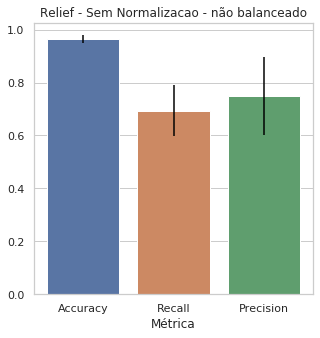

In [24]:
sns.set(style="whitegrid")
plt.rcParams.update({'font.size': 15})
fig_unbalanced = plt.figure(figsize=(5, 5))

# Medias dos melhores params
df_mean_unbalanced =  pd.DataFrame(mean_unbalanced).rename_axis('Métrica').reset_index().rename(columns = {0: 'Value'}) 

#plot
ax = sns.barplot(x="Métrica", y="Value", data=df_mean_unbalanced, ci = None)
plt.title('Relief - Sem Normalizacao - não balanceado')


plt.errorbar(x=[0],y=mean_unbalanced[0],yerr= (acc_max_unbalanced - mean_unbalanced[0]) , fmt='none', color = 'black')
plt.errorbar(x=[1],y=mean_unbalanced[1],yerr= (rec_max_unbalanced - mean_unbalanced[1]) , fmt='none', color = 'black')
plt.errorbar(x=[2],y=mean_unbalanced[2],yerr= (pre_max_unbalanced - mean_unbalanced[2]) , fmt='none', color = 'black')

fig_unbalanced.savefig('Relief-Sem_Normalizacao-nao_balanceado-MLP', bbox_inches='tight', dpi=600)

ax.set(ylabel='')

### Dataset Balanceado

[Text(157.00000000000003, 0.5, '')]

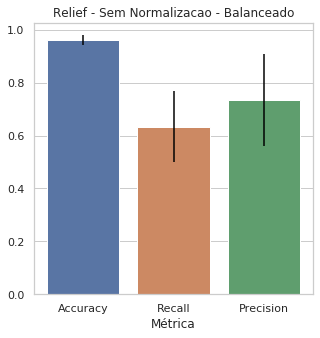

In [25]:
sns.set(style="whitegrid")
plt.rcParams.update({'font.size': 15})
fig_balanced = plt.figure(figsize=(5, 5))

# Medias dos melhores params
df_mean_balanced =  pd.DataFrame(mean_balanced).rename_axis('Métrica').reset_index().rename(columns = {0: 'Value'}) 

#plot
ax = sns.barplot(x="Métrica", y="Value", data=df_mean_balanced, ci = None)
plt.title('Relief - Sem Normalizacao - Balanceado')


plt.errorbar(x=[0],y=mean_balanced[0],yerr= (acc_max_balanced - mean_balanced[0]) , fmt='none', color = 'black')
plt.errorbar(x=[1],y=mean_balanced[1],yerr= (rec_max_balanced - mean_balanced[1]) , fmt='none', color = 'black')
plt.errorbar(x=[2],y=mean_balanced[2],yerr= (pre_max_balanced - mean_balanced[2]) , fmt='none', color = 'black')

fig_balanced.savefig('Relief-Sem_Normalizacao-balanceado-MLP', bbox_inches='tight', dpi=600)

ax.set(ylabel='')

## Armazena os Resultados para Gráfico Comparativo

In [26]:
path_to_save = '../../model_results/'

# Leitura dos resultados anteriores
all_models_results = pd.read_excel(path_to_save+'all_models_results.xlsx')

for metrica in df_mean_unbalanced.index:
    result = [
    '8',
    'MLPClassifier',
    'Relief - Sem Normalização - Desbalanceado',
    max_alpha_unbalanced,
    df_mean_unbalanced.loc[metrica]['Métrica'],
    df_mean_unbalanced.loc[metrica]['Value'],
    
    ]
    aux_df = (pd.DataFrame(result).T).rename(columns = {0: 'Atividade', 1: 'Algoritmo', 2: 'Condicao',
                                                        3: 'Melhores_Params', 4:'Metrica', 5: 'Valor'})
    all_models_results = all_models_results.append(aux_df, ignore_index=True)

# deleta da memoria
del result, aux_df

# Dataset Completo Balanceado
for metrica in df_mean_balanced.index:
    result = [
    '8',
    'MLPClassifier',
    'Relief - Sem Normalização - Balanceado',
    max_alpha_balanced,
    df_mean_balanced.loc[metrica]['Métrica'],
    df_mean_balanced.loc[metrica]['Value']
    ]
    aux_df = (pd.DataFrame(result).T).rename(columns = {0: 'Atividade', 1: 'Algoritmo', 2: 'Condicao', 
                                                        3: 'Melhores_Params', 4:'Metrica', 5: 'Valor'})
    all_models_results = all_models_results.append(aux_df, ignore_index=True)

display(all_models_results)

# salva os resultados novos
try:
    all_models_results.to_excel(path_to_save+'all_models_results.xlsx', index=False)
    print('Resultados salvos com sucesso')
except Exception as e:
    print('Erro {}'.format(e))

,Atividade,Algoritmo,Condicao,Melhores_Params,Metrica,Valor
0,7,SVC,Dataset Completo Desbalanceado - Nao Normalizado,"('linear', 1, 'scale')",Accuracy,0.960383
1,7,SVC,Dataset Completo Desbalanceado - Nao Normalizado,"('linear', 1, 'scale')",Recall,0.86
2,7,SVC,Dataset Completo Desbalanceado - Nao Normalizado,"('linear', 1, 'scale')",Precision,0.677579
3,7,SVC,Dataset Completo Balanceado - Nao Normalizado,"('rbf', 100, '0.0001')",Accuracy,0.962709
4,7,SVC,Dataset Completo Balanceado - Nao Normalizado,"('rbf', 100, '0.0001')",Recall,0.876667
5,7,SVC,Dataset Completo Balanceado - Nao Normalizado,"('rbf', 100, '0.0001')",Precision,0.690079
6,7,SVC,Dataset Completo Desbalanceado - Normalizado,"('rbf', 100, '0.0001')",Accuracy,0.962709
7,7,SVC,Dataset Completo Desbalanceado - Normalizado,"('rbf', 100, '0.0001')",Recall,0.876667
8,7,SVC,Dataset Completo Desbalanceado - Normalizado,"('rbf', 100, '0.0001')",Precision,0.690079
9,7,SVC,Dataset Completo Balanceado - Normalizado,"('rbf', 100, '0.0001')",Accuracy,0.959193


Resultados salvos com sucesso
